In [31]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from scipy.stats import mode
%matplotlib inline

In [32]:
pd.set_option('display.max_columns',90)

In [33]:
train = pd.read_csv(r'C:\Users\User\Downloads\kaggle\house price\Imute_missing_values\train_Impute_DL.csv')
test = pd.read_csv(r'C:\Users\User\Downloads\kaggle\house price\Imute_missing_values\test_Impute_DL.csv')

In [34]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [35]:
# 1.drop columns
drop_columns=['Alley','PoolQC','Fence','MiscFeature','Id','PoolArea']
train.drop(drop_columns,axis=1,inplace=True)
test.drop(drop_columns,axis=1,inplace=True)

In [36]:
# 2.area features fill nan
area_list = ['LotFrontage','LotArea','MasVnrArea','BsmtFinSF1','BsmtFinSF2',
             'BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea',
             'GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch',
             'ScreenPorch']
for i in area_list:
    train[i].fillna(train[i].mean(),inplace=True)
    test[i].fillna(train[i].mean(),inplace=True)

In [37]:
# 3.fill nan
for i in train.columns:
    train[i] = train[i].fillna(mode(train[i])[0][0])
for i in test.columns:
    test[i] = test[i].fillna(mode(test[i])[0][0])

In [38]:
# 4.take out categorical data
onehot_list = []
for i in train.columns:
    if type(train[i][0]) == str:
        onehot_list.append(i)

In [39]:
# 5.add age data
train['age']=train['YrSold']-train['YearBuilt']
test['age']=test['YrSold']-test['YearBuilt']
train['garage_age']=train['YrSold']-train['GarageYrBlt']
test['garage_age']=test['YrSold']-test['GarageYrBlt']
train['age2']=train['YrSold']-train['YearRemodAdd']
test['age2']=test['YrSold']-test['YearRemodAdd']

In [40]:
# 6.label-encoding
for i in onehot_list:
    l = LabelEncoder().fit(train[i])
    train[i] = l.transform(train[i])
    test[i] = l.transform(test[i])

In [41]:
# 8.train_test_splits
data_x = train.drop('SalePrice',axis=1)
data_y = train['SalePrice']
x_train,x_test,y_train,y_test = train_test_split(data_x,data_y,test_size=0.2,random_state=0)

# create model (lightgbm)

In [42]:
import lightgbm as lgb

In [ ]:
model_jmda = lgb.LGBMRegressor(n_estimators=456,subsample=0.8,max_depth=5,
                               feature_fraction=0.624490,
                                min_child_samples=14,num_leaves=31)
model_jmda.fit(x_train,y_train,categorical_feature=onehot_list,eval_set=(x_test,y_test),eval_metric=['rmse'])

In [ ]:
record=[26162.1]

In [ ]:
#add time features:27205->26162

# TEST

In [61]:
x = np.arange(2,8)
y = np.linspace(0.6,0.9,50)
X,Y = np.meshgrid(x,y)
X = np.concatenate(X)
Y = np.concatenate(Y)

In [62]:
score = []
for x,y in zip(X,Y):
    model_jmda = lgb.LGBMRegressor(n_estimators=669,subsample=0.8,max_depth=x,
                                   feature_fraction=y,
                                    min_child_samples=14,num_leaves=31)
    model_jmda.fit(x_train,y_train,categorical_feature=onehot_list,eval_set=(x_test,y_test),eval_metric=['rmse'])
    score.append([x,y,model_jmda.best_score_['valid_0']['rmse']])

C:\Users\User\Anaconda3\lib\site-packages\lightgbm\basic.py:1247: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['BldgType', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'BsmtQual', 'CentralAir', 'Condition1', 'Condition2', 'Electrical', 'ExterCond', 'ExterQual', 'Exterior1st', 'Exterior2nd', 'FireplaceQu', 'Foundation', 'Functional', 'GarageCond', 'GarageFinish', 'GarageQual', 'GarageType', 'Heating', 'HeatingQC', 'HouseStyle', 'KitchenQual', 'LandContour', 'LandSlope', 'LotConfig', 'LotShape', 'MSZoning', 'MasVnrType', 'Neighborhood', 'PavedDrive', 'RoofMatl', 'RoofStyle', 'SaleCondition', 'SaleType', 'Street', 'Utilities']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))


[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73244.5	valid_0's l2: 5.36475e+09
[3]	valid_0's rmse: 69741.4	valid_0's l2: 4.86386e+09
[4]	valid_0's rmse: 66518.2	valid_0's l2: 4.42467e+09
[5]	valid_0's rmse: 63465	valid_0's l2: 4.0278e+09
[6]	valid_0's rmse: 60947.9	valid_0's l2: 3.71464e+09
[7]	valid_0's rmse: 58280.6	valid_0's l2: 3.39663e+09
[8]	valid_0's rmse: 56051.5	valid_0's l2: 3.14177e+09
[9]	valid_0's rmse: 54197.9	valid_0's l2: 2.93741e+09
[10]	valid_0's rmse: 52156.2	valid_0's l2: 2.72027e+09
[11]	valid_0's rmse: 50557.7	valid_0's l2: 2.55608e+09
[12]	valid_0's rmse: 48916.2	valid_0's l2: 2.39279e+09
[13]	valid_0's rmse: 47593.5	valid_0's l2: 2.26514e+09
[14]	valid_0's rmse: 46390.5	valid_0's l2: 2.15208e+09
[15]	valid_0's rmse: 45187.1	valid_0's l2: 2.04187e+09
[16]	valid_0's rmse: 44221.6	valid_0's l2: 1.95555e+09
[17]	valid_0's rmse: 42907.7	valid_0's l2: 1.84107e+09
[18]	valid_0's rmse: 42126.3	valid_0's l2: 1.77462e+09
[19]	valid_0's rmse: 4

[334]	valid_0's rmse: 29038.7	valid_0's l2: 8.43247e+08
[335]	valid_0's rmse: 29006	valid_0's l2: 8.41349e+08
[336]	valid_0's rmse: 29016.2	valid_0's l2: 8.41942e+08
[337]	valid_0's rmse: 29016.1	valid_0's l2: 8.41931e+08
[338]	valid_0's rmse: 29008.5	valid_0's l2: 8.41493e+08
[339]	valid_0's rmse: 28970.6	valid_0's l2: 8.39298e+08
[340]	valid_0's rmse: 28962.3	valid_0's l2: 8.38813e+08
[341]	valid_0's rmse: 28994.4	valid_0's l2: 8.40674e+08
[342]	valid_0's rmse: 28990	valid_0's l2: 8.40423e+08
[343]	valid_0's rmse: 28962.2	valid_0's l2: 8.38811e+08
[344]	valid_0's rmse: 28951.1	valid_0's l2: 8.38168e+08
[345]	valid_0's rmse: 28948.2	valid_0's l2: 8.37999e+08
[346]	valid_0's rmse: 28945.1	valid_0's l2: 8.37821e+08
[347]	valid_0's rmse: 28910.6	valid_0's l2: 8.35822e+08
[348]	valid_0's rmse: 28932	valid_0's l2: 8.37062e+08
[349]	valid_0's rmse: 28935.5	valid_0's l2: 8.37262e+08
[350]	valid_0's rmse: 28921	valid_0's l2: 8.36426e+08
[351]	valid_0's rmse: 28904.3	valid_0's l2: 8.35457e+08


[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60323.8	valid_0's l2: 3.63896e+09
[6]	valid_0's rmse: 57500.4	valid_0's l2: 3.3063e+09
[7]	valid_0's rmse: 54711.3	valid_0's l2: 2.99333e+09
[8]	valid_0's rmse: 52032.6	valid_0's l2: 2.70739e+09
[9]	valid_0's rmse: 49723.8	valid_0's l2: 2.47246e+09
[10]	valid_0's rmse: 47556	valid_0's l2: 2.26157e+09
[11]	valid_0's rmse: 45821.6	valid_0's l2: 2.09962e+09
[12]	valid_0's rmse: 44189.2	valid_0's l2: 1.95268e+09
[13]	valid_0's rmse: 42816.1	valid_0's l2: 1.83322e+09
[14]	valid_0's rmse: 41816.4	valid_0's l2: 1.74861e+09
[15]	valid_0's rmse: 40666.9	valid_0's l2: 1.6538e+09
[16]	valid_0's rmse: 39619	valid_0's l2: 1.56967e+09
[17]	valid_0's rmse: 38497.3	valid_0's l2: 1.48204e+09
[18]	valid_0's rmse: 37703.7	valid_0's l2: 1.42157e+09
[19]	valid_0's rmse: 36850

[284]	valid_0's rmse: 27501.6	valid_0's l2: 7.56339e+08
[285]	valid_0's rmse: 27452.6	valid_0's l2: 7.53643e+08
[286]	valid_0's rmse: 27449.3	valid_0's l2: 7.53463e+08
[287]	valid_0's rmse: 27449.5	valid_0's l2: 7.53473e+08
[288]	valid_0's rmse: 27443.8	valid_0's l2: 7.53164e+08
[289]	valid_0's rmse: 27467.1	valid_0's l2: 7.5444e+08
[290]	valid_0's rmse: 27471.6	valid_0's l2: 7.54689e+08
[291]	valid_0's rmse: 27462.9	valid_0's l2: 7.54209e+08
[292]	valid_0's rmse: 27462.9	valid_0's l2: 7.54213e+08
[293]	valid_0's rmse: 27446.5	valid_0's l2: 7.53312e+08
[294]	valid_0's rmse: 27446	valid_0's l2: 7.53282e+08
[295]	valid_0's rmse: 27435.3	valid_0's l2: 7.52697e+08
[296]	valid_0's rmse: 27439.4	valid_0's l2: 7.52922e+08
[297]	valid_0's rmse: 27443.1	valid_0's l2: 7.53124e+08
[298]	valid_0's rmse: 27445.6	valid_0's l2: 7.53259e+08
[299]	valid_0's rmse: 27438.9	valid_0's l2: 7.52891e+08
[300]	valid_0's rmse: 27438.2	valid_0's l2: 7.52856e+08
[301]	valid_0's rmse: 27428.6	valid_0's l2: 7.52327

[583]	valid_0's rmse: 27314	valid_0's l2: 7.46056e+08
[584]	valid_0's rmse: 27311.9	valid_0's l2: 7.45942e+08
[585]	valid_0's rmse: 27314.6	valid_0's l2: 7.46089e+08
[586]	valid_0's rmse: 27305.7	valid_0's l2: 7.45599e+08
[587]	valid_0's rmse: 27310.5	valid_0's l2: 7.45865e+08
[588]	valid_0's rmse: 27316.4	valid_0's l2: 7.46184e+08
[589]	valid_0's rmse: 27316.2	valid_0's l2: 7.46176e+08
[590]	valid_0's rmse: 27310.5	valid_0's l2: 7.45861e+08
[591]	valid_0's rmse: 27299.3	valid_0's l2: 7.45252e+08
[592]	valid_0's rmse: 27298.9	valid_0's l2: 7.4523e+08
[593]	valid_0's rmse: 27297.9	valid_0's l2: 7.45174e+08
[594]	valid_0's rmse: 27293.4	valid_0's l2: 7.44932e+08
[595]	valid_0's rmse: 27279.2	valid_0's l2: 7.44157e+08
[596]	valid_0's rmse: 27282.1	valid_0's l2: 7.44312e+08
[597]	valid_0's rmse: 27287.2	valid_0's l2: 7.4459e+08
[598]	valid_0's rmse: 27300.8	valid_0's l2: 7.45332e+08
[599]	valid_0's rmse: 27310.9	valid_0's l2: 7.45888e+08
[600]	valid_0's rmse: 27306.8	valid_0's l2: 7.45663e

[63]	valid_0's rmse: 29528.4	valid_0's l2: 8.71924e+08
[64]	valid_0's rmse: 29504	valid_0's l2: 8.70485e+08
[65]	valid_0's rmse: 29458.9	valid_0's l2: 8.67826e+08
[66]	valid_0's rmse: 29392.8	valid_0's l2: 8.63935e+08
[67]	valid_0's rmse: 29344.1	valid_0's l2: 8.61079e+08
[68]	valid_0's rmse: 29269.2	valid_0's l2: 8.56686e+08
[69]	valid_0's rmse: 29266.7	valid_0's l2: 8.56542e+08
[70]	valid_0's rmse: 29229	valid_0's l2: 8.54337e+08
[71]	valid_0's rmse: 29143	valid_0's l2: 8.49313e+08
[72]	valid_0's rmse: 29103.8	valid_0's l2: 8.47034e+08
[73]	valid_0's rmse: 29009.4	valid_0's l2: 8.41545e+08
[74]	valid_0's rmse: 29036.4	valid_0's l2: 8.43115e+08
[75]	valid_0's rmse: 29019.7	valid_0's l2: 8.4214e+08
[76]	valid_0's rmse: 28964.1	valid_0's l2: 8.38917e+08
[77]	valid_0's rmse: 28871.9	valid_0's l2: 8.33588e+08
[78]	valid_0's rmse: 28823.2	valid_0's l2: 8.30776e+08
[79]	valid_0's rmse: 28837.4	valid_0's l2: 8.31593e+08
[80]	valid_0's rmse: 28777.4	valid_0's l2: 8.28136e+08
[81]	valid_0's rm

[319]	valid_0's rmse: 26752.4	valid_0's l2: 7.15691e+08
[320]	valid_0's rmse: 26759.1	valid_0's l2: 7.16048e+08
[321]	valid_0's rmse: 26767.3	valid_0's l2: 7.16488e+08
[322]	valid_0's rmse: 26761.2	valid_0's l2: 7.1616e+08
[323]	valid_0's rmse: 26759.4	valid_0's l2: 7.16066e+08
[324]	valid_0's rmse: 26756.2	valid_0's l2: 7.15893e+08
[325]	valid_0's rmse: 26747.4	valid_0's l2: 7.15426e+08
[326]	valid_0's rmse: 26754.6	valid_0's l2: 7.1581e+08
[327]	valid_0's rmse: 26754.3	valid_0's l2: 7.15792e+08
[328]	valid_0's rmse: 26740	valid_0's l2: 7.15025e+08
[329]	valid_0's rmse: 26748.6	valid_0's l2: 7.15487e+08
[330]	valid_0's rmse: 26741.4	valid_0's l2: 7.15105e+08
[331]	valid_0's rmse: 26728.1	valid_0's l2: 7.14392e+08
[332]	valid_0's rmse: 26731.4	valid_0's l2: 7.1457e+08
[333]	valid_0's rmse: 26735.7	valid_0's l2: 7.14796e+08
[334]	valid_0's rmse: 26722.4	valid_0's l2: 7.14085e+08
[335]	valid_0's rmse: 26727.5	valid_0's l2: 7.14357e+08
[336]	valid_0's rmse: 26727.6	valid_0's l2: 7.14363e+

[564]	valid_0's rmse: 26647.6	valid_0's l2: 7.10093e+08
[565]	valid_0's rmse: 26645.8	valid_0's l2: 7.09998e+08
[566]	valid_0's rmse: 26647.8	valid_0's l2: 7.10105e+08
[567]	valid_0's rmse: 26648.9	valid_0's l2: 7.10162e+08
[568]	valid_0's rmse: 26645.7	valid_0's l2: 7.09995e+08
[569]	valid_0's rmse: 26647	valid_0's l2: 7.10061e+08
[570]	valid_0's rmse: 26637.5	valid_0's l2: 7.09558e+08
[571]	valid_0's rmse: 26647.2	valid_0's l2: 7.10071e+08
[572]	valid_0's rmse: 26646.6	valid_0's l2: 7.10043e+08
[573]	valid_0's rmse: 26649.4	valid_0's l2: 7.10188e+08
[574]	valid_0's rmse: 26648	valid_0's l2: 7.10115e+08
[575]	valid_0's rmse: 26653.6	valid_0's l2: 7.10416e+08
[576]	valid_0's rmse: 26651.3	valid_0's l2: 7.1029e+08
[577]	valid_0's rmse: 26649.7	valid_0's l2: 7.10204e+08
[578]	valid_0's rmse: 26651.6	valid_0's l2: 7.10307e+08
[579]	valid_0's rmse: 26660.7	valid_0's l2: 7.10795e+08
[580]	valid_0's rmse: 26661.2	valid_0's l2: 7.1082e+08
[581]	valid_0's rmse: 26663	valid_0's l2: 7.10915e+08


[261]	valid_0's rmse: 26963.6	valid_0's l2: 7.27034e+08
[262]	valid_0's rmse: 26962.8	valid_0's l2: 7.26994e+08
[263]	valid_0's rmse: 26976.3	valid_0's l2: 7.27718e+08
[264]	valid_0's rmse: 26975.8	valid_0's l2: 7.27696e+08
[265]	valid_0's rmse: 26980.7	valid_0's l2: 7.27958e+08
[266]	valid_0's rmse: 26958.3	valid_0's l2: 7.26752e+08
[267]	valid_0's rmse: 26948.5	valid_0's l2: 7.26223e+08
[268]	valid_0's rmse: 26931.8	valid_0's l2: 7.2532e+08
[269]	valid_0's rmse: 26921.2	valid_0's l2: 7.24753e+08
[270]	valid_0's rmse: 26928.8	valid_0's l2: 7.2516e+08
[271]	valid_0's rmse: 26917.5	valid_0's l2: 7.24551e+08
[272]	valid_0's rmse: 26901.6	valid_0's l2: 7.23697e+08
[273]	valid_0's rmse: 26897.9	valid_0's l2: 7.23495e+08
[274]	valid_0's rmse: 26886.8	valid_0's l2: 7.22902e+08
[275]	valid_0's rmse: 26897.6	valid_0's l2: 7.23483e+08
[276]	valid_0's rmse: 26887	valid_0's l2: 7.2291e+08
[277]	valid_0's rmse: 26884.2	valid_0's l2: 7.2276e+08
[278]	valid_0's rmse: 26880.7	valid_0's l2: 7.22574e+0

[475]	valid_0's rmse: 26726.9	valid_0's l2: 7.14327e+08
[476]	valid_0's rmse: 26723.7	valid_0's l2: 7.14156e+08
[477]	valid_0's rmse: 26719.9	valid_0's l2: 7.13951e+08
[478]	valid_0's rmse: 26719.2	valid_0's l2: 7.13916e+08
[479]	valid_0's rmse: 26721.7	valid_0's l2: 7.14049e+08
[480]	valid_0's rmse: 26716.3	valid_0's l2: 7.1376e+08
[481]	valid_0's rmse: 26718.7	valid_0's l2: 7.13888e+08
[482]	valid_0's rmse: 26710.1	valid_0's l2: 7.13427e+08
[483]	valid_0's rmse: 26709.4	valid_0's l2: 7.13392e+08
[484]	valid_0's rmse: 26707.5	valid_0's l2: 7.13292e+08
[485]	valid_0's rmse: 26705.5	valid_0's l2: 7.13184e+08
[486]	valid_0's rmse: 26698.3	valid_0's l2: 7.12802e+08
[487]	valid_0's rmse: 26698.9	valid_0's l2: 7.12829e+08
[488]	valid_0's rmse: 26710.5	valid_0's l2: 7.13449e+08
[489]	valid_0's rmse: 26707.1	valid_0's l2: 7.13269e+08
[490]	valid_0's rmse: 26706.4	valid_0's l2: 7.13232e+08
[491]	valid_0's rmse: 26706.2	valid_0's l2: 7.13221e+08
[492]	valid_0's rmse: 26704.8	valid_0's l2: 7.131

[1]	valid_0's rmse: 76631.1	valid_0's l2: 5.87233e+09
[2]	valid_0's rmse: 70954.7	valid_0's l2: 5.03457e+09
[3]	valid_0's rmse: 66432.5	valid_0's l2: 4.41328e+09
[4]	valid_0's rmse: 62064.6	valid_0's l2: 3.85202e+09
[5]	valid_0's rmse: 58321.1	valid_0's l2: 3.40135e+09
[6]	valid_0's rmse: 55198.7	valid_0's l2: 3.0469e+09
[7]	valid_0's rmse: 52421.7	valid_0's l2: 2.74804e+09
[8]	valid_0's rmse: 49729.5	valid_0's l2: 2.47303e+09
[9]	valid_0's rmse: 47248.8	valid_0's l2: 2.23245e+09
[10]	valid_0's rmse: 45237.5	valid_0's l2: 2.04643e+09
[11]	valid_0's rmse: 43621.3	valid_0's l2: 1.90281e+09
[12]	valid_0's rmse: 42001.5	valid_0's l2: 1.76412e+09
[13]	valid_0's rmse: 40580	valid_0's l2: 1.64673e+09
[14]	valid_0's rmse: 39464.1	valid_0's l2: 1.55741e+09
[15]	valid_0's rmse: 38502.1	valid_0's l2: 1.48241e+09
[16]	valid_0's rmse: 37629.2	valid_0's l2: 1.41595e+09
[17]	valid_0's rmse: 36573.1	valid_0's l2: 1.33759e+09
[18]	valid_0's rmse: 35567.7	valid_0's l2: 1.26506e+09
[19]	valid_0's rmse: 3

[193]	valid_0's rmse: 27426.3	valid_0's l2: 7.52204e+08
[194]	valid_0's rmse: 27429.3	valid_0's l2: 7.52367e+08
[195]	valid_0's rmse: 27430.3	valid_0's l2: 7.52419e+08
[196]	valid_0's rmse: 27422	valid_0's l2: 7.51966e+08
[197]	valid_0's rmse: 27396.3	valid_0's l2: 7.50555e+08
[198]	valid_0's rmse: 27421.5	valid_0's l2: 7.51939e+08
[199]	valid_0's rmse: 27394.7	valid_0's l2: 7.50471e+08
[200]	valid_0's rmse: 27380.8	valid_0's l2: 7.49709e+08
[201]	valid_0's rmse: 27366.1	valid_0's l2: 7.48903e+08
[202]	valid_0's rmse: 27382.2	valid_0's l2: 7.49785e+08
[203]	valid_0's rmse: 27388.8	valid_0's l2: 7.50147e+08
[204]	valid_0's rmse: 27371.6	valid_0's l2: 7.49206e+08
[205]	valid_0's rmse: 27375.3	valid_0's l2: 7.49405e+08
[206]	valid_0's rmse: 27399.5	valid_0's l2: 7.50732e+08
[207]	valid_0's rmse: 27410.7	valid_0's l2: 7.51349e+08
[208]	valid_0's rmse: 27382.3	valid_0's l2: 7.49789e+08
[209]	valid_0's rmse: 27388.8	valid_0's l2: 7.50145e+08
[210]	valid_0's rmse: 27405.5	valid_0's l2: 7.5106

[384]	valid_0's rmse: 26900.7	valid_0's l2: 7.23649e+08
[385]	valid_0's rmse: 26906	valid_0's l2: 7.23933e+08
[386]	valid_0's rmse: 26901	valid_0's l2: 7.23662e+08
[387]	valid_0's rmse: 26894.9	valid_0's l2: 7.23333e+08
[388]	valid_0's rmse: 26895.5	valid_0's l2: 7.23369e+08
[389]	valid_0's rmse: 26889.2	valid_0's l2: 7.23031e+08
[390]	valid_0's rmse: 26875.6	valid_0's l2: 7.223e+08
[391]	valid_0's rmse: 26869.2	valid_0's l2: 7.21954e+08
[392]	valid_0's rmse: 26870.7	valid_0's l2: 7.22035e+08
[393]	valid_0's rmse: 26869.9	valid_0's l2: 7.21991e+08
[394]	valid_0's rmse: 26864.9	valid_0's l2: 7.21721e+08
[395]	valid_0's rmse: 26854.3	valid_0's l2: 7.21153e+08
[396]	valid_0's rmse: 26859.1	valid_0's l2: 7.21411e+08
[397]	valid_0's rmse: 26870.6	valid_0's l2: 7.22029e+08
[398]	valid_0's rmse: 26868	valid_0's l2: 7.21888e+08
[399]	valid_0's rmse: 26861.7	valid_0's l2: 7.21552e+08
[400]	valid_0's rmse: 26861.9	valid_0's l2: 7.21559e+08
[401]	valid_0's rmse: 26862.8	valid_0's l2: 7.21611e+08


[548]	valid_0's rmse: 26678	valid_0's l2: 7.11713e+08
[549]	valid_0's rmse: 26671.9	valid_0's l2: 7.11388e+08
[550]	valid_0's rmse: 26668.8	valid_0's l2: 7.11223e+08
[551]	valid_0's rmse: 26664.2	valid_0's l2: 7.10978e+08
[552]	valid_0's rmse: 26673.8	valid_0's l2: 7.11491e+08
[553]	valid_0's rmse: 26671.9	valid_0's l2: 7.11392e+08
[554]	valid_0's rmse: 26672.7	valid_0's l2: 7.11431e+08
[555]	valid_0's rmse: 26673.7	valid_0's l2: 7.11484e+08
[556]	valid_0's rmse: 26672.7	valid_0's l2: 7.11431e+08
[557]	valid_0's rmse: 26667.1	valid_0's l2: 7.11133e+08
[558]	valid_0's rmse: 26679.7	valid_0's l2: 7.11806e+08
[559]	valid_0's rmse: 26677.8	valid_0's l2: 7.11706e+08
[560]	valid_0's rmse: 26671.4	valid_0's l2: 7.11363e+08
[561]	valid_0's rmse: 26669.5	valid_0's l2: 7.11264e+08
[562]	valid_0's rmse: 26666.5	valid_0's l2: 7.11103e+08
[563]	valid_0's rmse: 26663.3	valid_0's l2: 7.10933e+08
[564]	valid_0's rmse: 26653.6	valid_0's l2: 7.10417e+08
[565]	valid_0's rmse: 26651.4	valid_0's l2: 7.1029

[151]	valid_0's rmse: 28417.9	valid_0's l2: 8.07577e+08
[152]	valid_0's rmse: 28381.3	valid_0's l2: 8.05497e+08
[153]	valid_0's rmse: 28395.9	valid_0's l2: 8.06326e+08
[154]	valid_0's rmse: 28379.2	valid_0's l2: 8.05378e+08
[155]	valid_0's rmse: 28387.4	valid_0's l2: 8.05845e+08
[156]	valid_0's rmse: 28384.9	valid_0's l2: 8.05704e+08
[157]	valid_0's rmse: 28396.7	valid_0's l2: 8.06375e+08
[158]	valid_0's rmse: 28390.9	valid_0's l2: 8.06042e+08
[159]	valid_0's rmse: 28388.5	valid_0's l2: 8.05907e+08
[160]	valid_0's rmse: 28343.6	valid_0's l2: 8.03358e+08
[161]	valid_0's rmse: 28335.3	valid_0's l2: 8.02887e+08
[162]	valid_0's rmse: 28322.2	valid_0's l2: 8.02146e+08
[163]	valid_0's rmse: 28370.3	valid_0's l2: 8.04871e+08
[164]	valid_0's rmse: 28408.4	valid_0's l2: 8.07038e+08
[165]	valid_0's rmse: 28368.6	valid_0's l2: 8.04779e+08
[166]	valid_0's rmse: 28370.2	valid_0's l2: 8.04866e+08
[167]	valid_0's rmse: 28359.6	valid_0's l2: 8.04269e+08
[168]	valid_0's rmse: 28358.1	valid_0's l2: 8.04

[328]	valid_0's rmse: 28079.9	valid_0's l2: 7.88481e+08
[329]	valid_0's rmse: 28076.9	valid_0's l2: 7.8831e+08
[330]	valid_0's rmse: 28082	valid_0's l2: 7.88601e+08
[331]	valid_0's rmse: 28071.3	valid_0's l2: 7.88001e+08
[332]	valid_0's rmse: 28081.5	valid_0's l2: 7.88573e+08
[333]	valid_0's rmse: 28083.5	valid_0's l2: 7.88685e+08
[334]	valid_0's rmse: 28066.8	valid_0's l2: 7.87743e+08
[335]	valid_0's rmse: 28067.2	valid_0's l2: 7.8777e+08
[336]	valid_0's rmse: 28070.6	valid_0's l2: 7.8796e+08
[337]	valid_0's rmse: 28066.3	valid_0's l2: 7.87718e+08
[338]	valid_0's rmse: 28060.9	valid_0's l2: 7.87414e+08
[339]	valid_0's rmse: 28067.7	valid_0's l2: 7.87795e+08
[340]	valid_0's rmse: 28066.3	valid_0's l2: 7.87717e+08
[341]	valid_0's rmse: 28049.9	valid_0's l2: 7.86797e+08
[342]	valid_0's rmse: 28055.9	valid_0's l2: 7.87134e+08
[343]	valid_0's rmse: 28048.8	valid_0's l2: 7.86736e+08
[344]	valid_0's rmse: 28049.1	valid_0's l2: 7.86754e+08
[345]	valid_0's rmse: 28040.2	valid_0's l2: 7.86255e+

[518]	valid_0's rmse: 27907.7	valid_0's l2: 7.78837e+08
[519]	valid_0's rmse: 27906.3	valid_0's l2: 7.78762e+08
[520]	valid_0's rmse: 27902.9	valid_0's l2: 7.78574e+08
[521]	valid_0's rmse: 27905.7	valid_0's l2: 7.78726e+08
[522]	valid_0's rmse: 27904.9	valid_0's l2: 7.78682e+08
[523]	valid_0's rmse: 27907.8	valid_0's l2: 7.78847e+08
[524]	valid_0's rmse: 27915.2	valid_0's l2: 7.79259e+08
[525]	valid_0's rmse: 27914	valid_0's l2: 7.79189e+08
[526]	valid_0's rmse: 27912.6	valid_0's l2: 7.79114e+08
[527]	valid_0's rmse: 27917.2	valid_0's l2: 7.79373e+08
[528]	valid_0's rmse: 27918	valid_0's l2: 7.79414e+08
[529]	valid_0's rmse: 27914.8	valid_0's l2: 7.79236e+08
[530]	valid_0's rmse: 27913.2	valid_0's l2: 7.79144e+08
[531]	valid_0's rmse: 27912.2	valid_0's l2: 7.7909e+08
[532]	valid_0's rmse: 27906.9	valid_0's l2: 7.78795e+08
[533]	valid_0's rmse: 27906.7	valid_0's l2: 7.78786e+08
[534]	valid_0's rmse: 27910.4	valid_0's l2: 7.78991e+08
[535]	valid_0's rmse: 27910.1	valid_0's l2: 7.78975e+

[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73244.5	valid_0's l2: 5.36475e+09
[3]	valid_0's rmse: 69741.4	valid_0's l2: 4.86386e+09
[4]	valid_0's rmse: 66518.2	valid_0's l2: 4.42467e+09
[5]	valid_0's rmse: 63465	valid_0's l2: 4.0278e+09
[6]	valid_0's rmse: 60947.9	valid_0's l2: 3.71464e+09
[7]	valid_0's rmse: 58280.6	valid_0's l2: 3.39663e+09
[8]	valid_0's rmse: 56051.5	valid_0's l2: 3.14177e+09
[9]	valid_0's rmse: 54197.9	valid_0's l2: 2.93741e+09
[10]	valid_0's rmse: 52156.2	valid_0's l2: 2.72027e+09
[11]	valid_0's rmse: 50557.7	valid_0's l2: 2.55608e+09
[12]	valid_0's rmse: 48916.2	valid_0's l2: 2.39279e+09
[13]	valid_0's rmse: 47593.5	valid_0's l2: 2.26514e+09
[14]	valid_0's rmse: 46390.5	valid_0's l2: 2.15208e+09
[15]	valid_0's rmse: 45187.1	valid_0's l2: 2.04187e+09
[16]	valid_0's rmse: 44221.6	valid_0's l2: 1.95555e+09
[17]	valid_0's rmse: 42907.7	valid_0's l2: 1.84107e+09
[18]	valid_0's rmse: 42126.3	valid_0's l2: 1.77462e+09
[19]	valid_0's rmse: 4

[284]	valid_0's rmse: 29438.5	valid_0's l2: 8.66622e+08
[285]	valid_0's rmse: 29428.6	valid_0's l2: 8.6604e+08
[286]	valid_0's rmse: 29394	valid_0's l2: 8.64008e+08
[287]	valid_0's rmse: 29393	valid_0's l2: 8.6395e+08
[288]	valid_0's rmse: 29352.1	valid_0's l2: 8.61547e+08
[289]	valid_0's rmse: 29325.2	valid_0's l2: 8.59966e+08
[290]	valid_0's rmse: 29314.9	valid_0's l2: 8.59364e+08
[291]	valid_0's rmse: 29315.4	valid_0's l2: 8.59394e+08
[292]	valid_0's rmse: 29280.2	valid_0's l2: 8.57328e+08
[293]	valid_0's rmse: 29257.2	valid_0's l2: 8.55985e+08
[294]	valid_0's rmse: 29270.4	valid_0's l2: 8.56755e+08
[295]	valid_0's rmse: 29269.9	valid_0's l2: 8.56726e+08
[296]	valid_0's rmse: 29226.8	valid_0's l2: 8.54208e+08
[297]	valid_0's rmse: 29213.8	valid_0's l2: 8.53446e+08
[298]	valid_0's rmse: 29236.1	valid_0's l2: 8.54747e+08
[299]	valid_0's rmse: 29260	valid_0's l2: 8.56147e+08
[300]	valid_0's rmse: 29180.9	valid_0's l2: 8.51525e+08
[301]	valid_0's rmse: 29156.5	valid_0's l2: 8.50103e+08


[638]	valid_0's rmse: 28424.3	valid_0's l2: 8.07942e+08
[639]	valid_0's rmse: 28421.9	valid_0's l2: 8.07802e+08
[640]	valid_0's rmse: 28420.5	valid_0's l2: 8.07723e+08
[641]	valid_0's rmse: 28422.3	valid_0's l2: 8.07827e+08
[642]	valid_0's rmse: 28436.4	valid_0's l2: 8.08627e+08
[643]	valid_0's rmse: 28431.6	valid_0's l2: 8.08358e+08
[644]	valid_0's rmse: 28428.6	valid_0's l2: 8.08188e+08
[645]	valid_0's rmse: 28427.9	valid_0's l2: 8.08145e+08
[646]	valid_0's rmse: 28429.1	valid_0's l2: 8.08216e+08
[647]	valid_0's rmse: 28392.7	valid_0's l2: 8.06145e+08
[648]	valid_0's rmse: 28358	valid_0's l2: 8.04174e+08
[649]	valid_0's rmse: 28362.5	valid_0's l2: 8.04429e+08
[650]	valid_0's rmse: 28341.5	valid_0's l2: 8.03239e+08
[651]	valid_0's rmse: 28328.3	valid_0's l2: 8.0249e+08
[652]	valid_0's rmse: 28326.4	valid_0's l2: 8.02385e+08
[653]	valid_0's rmse: 28321	valid_0's l2: 8.02077e+08
[654]	valid_0's rmse: 28313.3	valid_0's l2: 8.01645e+08
[655]	valid_0's rmse: 28311	valid_0's l2: 8.01511e+08

[153]	valid_0's rmse: 28207.7	valid_0's l2: 7.95673e+08
[154]	valid_0's rmse: 28197.2	valid_0's l2: 7.95081e+08
[155]	valid_0's rmse: 28160.4	valid_0's l2: 7.93009e+08
[156]	valid_0's rmse: 28150.5	valid_0's l2: 7.92452e+08
[157]	valid_0's rmse: 28168.5	valid_0's l2: 7.93465e+08
[158]	valid_0's rmse: 28111.7	valid_0's l2: 7.90269e+08
[159]	valid_0's rmse: 28116.9	valid_0's l2: 7.90561e+08
[160]	valid_0's rmse: 28074.5	valid_0's l2: 7.88176e+08
[161]	valid_0's rmse: 28056.8	valid_0's l2: 7.87182e+08
[162]	valid_0's rmse: 28041.4	valid_0's l2: 7.86319e+08
[163]	valid_0's rmse: 28045.8	valid_0's l2: 7.86566e+08
[164]	valid_0's rmse: 28056.7	valid_0's l2: 7.87181e+08
[165]	valid_0's rmse: 28057.1	valid_0's l2: 7.87198e+08
[166]	valid_0's rmse: 28024.3	valid_0's l2: 7.85361e+08
[167]	valid_0's rmse: 28020.8	valid_0's l2: 7.85163e+08
[168]	valid_0's rmse: 28004	valid_0's l2: 7.84225e+08
[169]	valid_0's rmse: 27953.4	valid_0's l2: 7.81394e+08
[170]	valid_0's rmse: 27949.9	valid_0's l2: 7.8119

[453]	valid_0's rmse: 27238	valid_0's l2: 7.41907e+08
[454]	valid_0's rmse: 27241.9	valid_0's l2: 7.42123e+08
[455]	valid_0's rmse: 27243.6	valid_0's l2: 7.42214e+08
[456]	valid_0's rmse: 27232.4	valid_0's l2: 7.41601e+08
[457]	valid_0's rmse: 27221.2	valid_0's l2: 7.40992e+08
[458]	valid_0's rmse: 27222.9	valid_0's l2: 7.41085e+08
[459]	valid_0's rmse: 27229.2	valid_0's l2: 7.41429e+08
[460]	valid_0's rmse: 27238.1	valid_0's l2: 7.41914e+08
[461]	valid_0's rmse: 27224.2	valid_0's l2: 7.41159e+08
[462]	valid_0's rmse: 27228.3	valid_0's l2: 7.41382e+08
[463]	valid_0's rmse: 27227.2	valid_0's l2: 7.41321e+08
[464]	valid_0's rmse: 27229	valid_0's l2: 7.4142e+08
[465]	valid_0's rmse: 27229.8	valid_0's l2: 7.4146e+08
[466]	valid_0's rmse: 27235.4	valid_0's l2: 7.41769e+08
[467]	valid_0's rmse: 27235.1	valid_0's l2: 7.41753e+08
[468]	valid_0's rmse: 27229.4	valid_0's l2: 7.41441e+08
[469]	valid_0's rmse: 27218.7	valid_0's l2: 7.40858e+08
[470]	valid_0's rmse: 27220.1	valid_0's l2: 7.40936e+0

[1]	valid_0's rmse: 76984.9	valid_0's l2: 5.92667e+09
[2]	valid_0's rmse: 71386.1	valid_0's l2: 5.09598e+09
[3]	valid_0's rmse: 67032.5	valid_0's l2: 4.49336e+09
[4]	valid_0's rmse: 62650.8	valid_0's l2: 3.92512e+09
[5]	valid_0's rmse: 58891.8	valid_0's l2: 3.46825e+09
[6]	valid_0's rmse: 55631.5	valid_0's l2: 3.09486e+09
[7]	valid_0's rmse: 52768.2	valid_0's l2: 2.78448e+09
[8]	valid_0's rmse: 50372.5	valid_0's l2: 2.53739e+09
[9]	valid_0's rmse: 48299.6	valid_0's l2: 2.33285e+09
[10]	valid_0's rmse: 46351.8	valid_0's l2: 2.14849e+09
[11]	valid_0's rmse: 44297.1	valid_0's l2: 1.96223e+09
[12]	valid_0's rmse: 42666.1	valid_0's l2: 1.82039e+09
[13]	valid_0's rmse: 41280	valid_0's l2: 1.70404e+09
[14]	valid_0's rmse: 40264.4	valid_0's l2: 1.62122e+09
[15]	valid_0's rmse: 39190.1	valid_0's l2: 1.53587e+09
[16]	valid_0's rmse: 38212.9	valid_0's l2: 1.46022e+09
[17]	valid_0's rmse: 37314	valid_0's l2: 1.39234e+09
[18]	valid_0's rmse: 36591.9	valid_0's l2: 1.33896e+09
[19]	valid_0's rmse: 35

[238]	valid_0's rmse: 26949.4	valid_0's l2: 7.26268e+08
[239]	valid_0's rmse: 26928	valid_0's l2: 7.25116e+08
[240]	valid_0's rmse: 26908.2	valid_0's l2: 7.2405e+08
[241]	valid_0's rmse: 26912.9	valid_0's l2: 7.24306e+08
[242]	valid_0's rmse: 26901.3	valid_0's l2: 7.23681e+08
[243]	valid_0's rmse: 26913.6	valid_0's l2: 7.24341e+08
[244]	valid_0's rmse: 26921.2	valid_0's l2: 7.24752e+08
[245]	valid_0's rmse: 26915.7	valid_0's l2: 7.24455e+08
[246]	valid_0's rmse: 26910	valid_0's l2: 7.24147e+08
[247]	valid_0's rmse: 26910	valid_0's l2: 7.2415e+08
[248]	valid_0's rmse: 26911.9	valid_0's l2: 7.24248e+08
[249]	valid_0's rmse: 26913	valid_0's l2: 7.24311e+08
[250]	valid_0's rmse: 26907.9	valid_0's l2: 7.24037e+08
[251]	valid_0's rmse: 26891.6	valid_0's l2: 7.23158e+08
[252]	valid_0's rmse: 26893	valid_0's l2: 7.23234e+08
[253]	valid_0's rmse: 26888.3	valid_0's l2: 7.22978e+08
[254]	valid_0's rmse: 26908.8	valid_0's l2: 7.24081e+08
[255]	valid_0's rmse: 26934.9	valid_0's l2: 7.25489e+08
[256

[489]	valid_0's rmse: 26604.3	valid_0's l2: 7.0779e+08
[490]	valid_0's rmse: 26604.5	valid_0's l2: 7.07798e+08
[491]	valid_0's rmse: 26604.1	valid_0's l2: 7.0778e+08
[492]	valid_0's rmse: 26602.4	valid_0's l2: 7.07686e+08
[493]	valid_0's rmse: 26595.4	valid_0's l2: 7.07313e+08
[494]	valid_0's rmse: 26608.4	valid_0's l2: 7.08005e+08
[495]	valid_0's rmse: 26598.3	valid_0's l2: 7.07471e+08
[496]	valid_0's rmse: 26603.2	valid_0's l2: 7.07733e+08
[497]	valid_0's rmse: 26590.2	valid_0's l2: 7.0704e+08
[498]	valid_0's rmse: 26586.9	valid_0's l2: 7.06862e+08
[499]	valid_0's rmse: 26592.5	valid_0's l2: 7.0716e+08
[500]	valid_0's rmse: 26593.2	valid_0's l2: 7.07198e+08
[501]	valid_0's rmse: 26594.4	valid_0's l2: 7.07261e+08
[502]	valid_0's rmse: 26590	valid_0's l2: 7.07029e+08
[503]	valid_0's rmse: 26590.8	valid_0's l2: 7.07069e+08
[504]	valid_0's rmse: 26605.3	valid_0's l2: 7.07842e+08
[505]	valid_0's rmse: 26603.9	valid_0's l2: 7.07766e+08
[506]	valid_0's rmse: 26602.2	valid_0's l2: 7.07676e+0

[1]	valid_0's rmse: 76726.5	valid_0's l2: 5.88696e+09
[2]	valid_0's rmse: 71058.5	valid_0's l2: 5.04931e+09
[3]	valid_0's rmse: 66584.4	valid_0's l2: 4.43349e+09
[4]	valid_0's rmse: 62071	valid_0's l2: 3.85281e+09
[5]	valid_0's rmse: 58189.5	valid_0's l2: 3.38602e+09
[6]	valid_0's rmse: 54997.3	valid_0's l2: 3.02471e+09
[7]	valid_0's rmse: 52087.2	valid_0's l2: 2.71308e+09
[8]	valid_0's rmse: 49461.1	valid_0's l2: 2.4464e+09
[9]	valid_0's rmse: 46948.6	valid_0's l2: 2.20417e+09
[10]	valid_0's rmse: 45023.8	valid_0's l2: 2.02714e+09
[11]	valid_0's rmse: 43234.1	valid_0's l2: 1.86919e+09
[12]	valid_0's rmse: 41634.7	valid_0's l2: 1.73345e+09
[13]	valid_0's rmse: 40289.6	valid_0's l2: 1.62325e+09
[14]	valid_0's rmse: 39235.7	valid_0's l2: 1.53944e+09
[15]	valid_0's rmse: 38215	valid_0's l2: 1.46038e+09
[16]	valid_0's rmse: 37391.4	valid_0's l2: 1.39812e+09
[17]	valid_0's rmse: 36239.7	valid_0's l2: 1.31332e+09
[18]	valid_0's rmse: 35426.8	valid_0's l2: 1.25506e+09
[19]	valid_0's rmse: 345

[209]	valid_0's rmse: 26943.1	valid_0's l2: 7.2593e+08
[210]	valid_0's rmse: 26975.2	valid_0's l2: 7.27659e+08
[211]	valid_0's rmse: 26953.2	valid_0's l2: 7.26474e+08
[212]	valid_0's rmse: 26954.6	valid_0's l2: 7.2655e+08
[213]	valid_0's rmse: 26967.2	valid_0's l2: 7.27229e+08
[214]	valid_0's rmse: 26964.3	valid_0's l2: 7.27072e+08
[215]	valid_0's rmse: 26936.2	valid_0's l2: 7.25558e+08
[216]	valid_0's rmse: 26902.7	valid_0's l2: 7.23757e+08
[217]	valid_0's rmse: 26876.5	valid_0's l2: 7.22346e+08
[218]	valid_0's rmse: 26887.2	valid_0's l2: 7.22923e+08
[219]	valid_0's rmse: 26903.4	valid_0's l2: 7.23795e+08
[220]	valid_0's rmse: 26916.6	valid_0's l2: 7.24505e+08
[221]	valid_0's rmse: 26915.4	valid_0's l2: 7.24437e+08
[222]	valid_0's rmse: 26902.6	valid_0's l2: 7.2375e+08
[223]	valid_0's rmse: 26952.3	valid_0's l2: 7.26425e+08
[224]	valid_0's rmse: 26950.1	valid_0's l2: 7.26308e+08
[225]	valid_0's rmse: 26983.1	valid_0's l2: 7.28087e+08
[226]	valid_0's rmse: 26978.7	valid_0's l2: 7.27851

[426]	valid_0's rmse: 26663.9	valid_0's l2: 7.10966e+08
[427]	valid_0's rmse: 26661.9	valid_0's l2: 7.10859e+08
[428]	valid_0's rmse: 26663.2	valid_0's l2: 7.10925e+08
[429]	valid_0's rmse: 26672.9	valid_0's l2: 7.11445e+08
[430]	valid_0's rmse: 26668.4	valid_0's l2: 7.11202e+08
[431]	valid_0's rmse: 26671.1	valid_0's l2: 7.11345e+08
[432]	valid_0's rmse: 26669.7	valid_0's l2: 7.11272e+08
[433]	valid_0's rmse: 26678.3	valid_0's l2: 7.11732e+08
[434]	valid_0's rmse: 26675.6	valid_0's l2: 7.11588e+08
[435]	valid_0's rmse: 26687.2	valid_0's l2: 7.12204e+08
[436]	valid_0's rmse: 26683.7	valid_0's l2: 7.12022e+08
[437]	valid_0's rmse: 26673.3	valid_0's l2: 7.11463e+08
[438]	valid_0's rmse: 26673.2	valid_0's l2: 7.1146e+08
[439]	valid_0's rmse: 26677.6	valid_0's l2: 7.11694e+08
[440]	valid_0's rmse: 26676.1	valid_0's l2: 7.11617e+08
[441]	valid_0's rmse: 26676.2	valid_0's l2: 7.11622e+08
[442]	valid_0's rmse: 26681.5	valid_0's l2: 7.11904e+08
[443]	valid_0's rmse: 26683.9	valid_0's l2: 7.120

[635]	valid_0's rmse: 26657.8	valid_0's l2: 7.10639e+08
[636]	valid_0's rmse: 26656.5	valid_0's l2: 7.10571e+08
[637]	valid_0's rmse: 26657.1	valid_0's l2: 7.10603e+08
[638]	valid_0's rmse: 26656.8	valid_0's l2: 7.10584e+08
[639]	valid_0's rmse: 26665.5	valid_0's l2: 7.11049e+08
[640]	valid_0's rmse: 26667	valid_0's l2: 7.11129e+08
[641]	valid_0's rmse: 26670.7	valid_0's l2: 7.11325e+08
[642]	valid_0's rmse: 26672.6	valid_0's l2: 7.1143e+08
[643]	valid_0's rmse: 26671.9	valid_0's l2: 7.11389e+08
[644]	valid_0's rmse: 26670.2	valid_0's l2: 7.11299e+08
[645]	valid_0's rmse: 26673.8	valid_0's l2: 7.11491e+08
[646]	valid_0's rmse: 26673.8	valid_0's l2: 7.11492e+08
[647]	valid_0's rmse: 26677.1	valid_0's l2: 7.11667e+08
[648]	valid_0's rmse: 26674.6	valid_0's l2: 7.11532e+08
[649]	valid_0's rmse: 26676	valid_0's l2: 7.11607e+08
[650]	valid_0's rmse: 26676.3	valid_0's l2: 7.11624e+08
[651]	valid_0's rmse: 26676.4	valid_0's l2: 7.11631e+08
[652]	valid_0's rmse: 26680.6	valid_0's l2: 7.11854e+

[278]	valid_0's rmse: 27103.5	valid_0's l2: 7.34601e+08
[279]	valid_0's rmse: 27085.4	valid_0's l2: 7.33618e+08
[280]	valid_0's rmse: 27076.1	valid_0's l2: 7.33115e+08
[281]	valid_0's rmse: 27076.2	valid_0's l2: 7.3312e+08
[282]	valid_0's rmse: 27079.2	valid_0's l2: 7.33284e+08
[283]	valid_0's rmse: 27058.3	valid_0's l2: 7.32151e+08
[284]	valid_0's rmse: 27042.8	valid_0's l2: 7.31311e+08
[285]	valid_0's rmse: 27061.9	valid_0's l2: 7.32346e+08
[286]	valid_0's rmse: 27070.6	valid_0's l2: 7.32819e+08
[287]	valid_0's rmse: 27070.6	valid_0's l2: 7.32819e+08
[288]	valid_0's rmse: 27073.5	valid_0's l2: 7.32972e+08
[289]	valid_0's rmse: 27104	valid_0's l2: 7.34625e+08
[290]	valid_0's rmse: 27094.3	valid_0's l2: 7.34101e+08
[291]	valid_0's rmse: 27089.4	valid_0's l2: 7.33833e+08
[292]	valid_0's rmse: 27069.6	valid_0's l2: 7.32765e+08
[293]	valid_0's rmse: 27072.8	valid_0's l2: 7.32938e+08
[294]	valid_0's rmse: 27054.3	valid_0's l2: 7.31936e+08
[295]	valid_0's rmse: 27056.6	valid_0's l2: 7.32057

[487]	valid_0's rmse: 26772.9	valid_0's l2: 7.16789e+08
[488]	valid_0's rmse: 26770.3	valid_0's l2: 7.16646e+08
[489]	valid_0's rmse: 26769.4	valid_0's l2: 7.16602e+08
[490]	valid_0's rmse: 26769.7	valid_0's l2: 7.16615e+08
[491]	valid_0's rmse: 26765.9	valid_0's l2: 7.16411e+08
[492]	valid_0's rmse: 26762.4	valid_0's l2: 7.16225e+08
[493]	valid_0's rmse: 26758.3	valid_0's l2: 7.16006e+08
[494]	valid_0's rmse: 26762.7	valid_0's l2: 7.16242e+08
[495]	valid_0's rmse: 26758.7	valid_0's l2: 7.16027e+08
[496]	valid_0's rmse: 26754.4	valid_0's l2: 7.15798e+08
[497]	valid_0's rmse: 26758.9	valid_0's l2: 7.16037e+08
[498]	valid_0's rmse: 26760	valid_0's l2: 7.16098e+08
[499]	valid_0's rmse: 26764.7	valid_0's l2: 7.16347e+08
[500]	valid_0's rmse: 26758.5	valid_0's l2: 7.16019e+08
[501]	valid_0's rmse: 26772	valid_0's l2: 7.16742e+08
[502]	valid_0's rmse: 26762.9	valid_0's l2: 7.16252e+08
[503]	valid_0's rmse: 26758.3	valid_0's l2: 7.16005e+08
[504]	valid_0's rmse: 26753.6	valid_0's l2: 7.15754e

[1]	valid_0's rmse: 76646.7	valid_0's l2: 5.87472e+09
[2]	valid_0's rmse: 70913	valid_0's l2: 5.02866e+09
[3]	valid_0's rmse: 66372.8	valid_0's l2: 4.40535e+09
[4]	valid_0's rmse: 62004.2	valid_0's l2: 3.84452e+09
[5]	valid_0's rmse: 58276.5	valid_0's l2: 3.39615e+09
[6]	valid_0's rmse: 55043.4	valid_0's l2: 3.02978e+09
[7]	valid_0's rmse: 52146.4	valid_0's l2: 2.71925e+09
[8]	valid_0's rmse: 49456.3	valid_0's l2: 2.44592e+09
[9]	valid_0's rmse: 46979.1	valid_0's l2: 2.20704e+09
[10]	valid_0's rmse: 44976.6	valid_0's l2: 2.0229e+09
[11]	valid_0's rmse: 43392.2	valid_0's l2: 1.88288e+09
[12]	valid_0's rmse: 41759.9	valid_0's l2: 1.74389e+09
[13]	valid_0's rmse: 40340.2	valid_0's l2: 1.62733e+09
[14]	valid_0's rmse: 39243.8	valid_0's l2: 1.54008e+09
[15]	valid_0's rmse: 38314.2	valid_0's l2: 1.46798e+09
[16]	valid_0's rmse: 37451.8	valid_0's l2: 1.40264e+09
[17]	valid_0's rmse: 36285.8	valid_0's l2: 1.31666e+09
[18]	valid_0's rmse: 35451.7	valid_0's l2: 1.25683e+09
[19]	valid_0's rmse: 3

[176]	valid_0's rmse: 28317.8	valid_0's l2: 8.01896e+08
[177]	valid_0's rmse: 28325.9	valid_0's l2: 8.02357e+08
[178]	valid_0's rmse: 28327	valid_0's l2: 8.0242e+08
[179]	valid_0's rmse: 28291.1	valid_0's l2: 8.00387e+08
[180]	valid_0's rmse: 28312.5	valid_0's l2: 8.01596e+08
[181]	valid_0's rmse: 28320.9	valid_0's l2: 8.02075e+08
[182]	valid_0's rmse: 28325.5	valid_0's l2: 8.02332e+08
[183]	valid_0's rmse: 28338.1	valid_0's l2: 8.03048e+08
[184]	valid_0's rmse: 28309.6	valid_0's l2: 8.01431e+08
[185]	valid_0's rmse: 28316.6	valid_0's l2: 8.01829e+08
[186]	valid_0's rmse: 28300.4	valid_0's l2: 8.00913e+08
[187]	valid_0's rmse: 28291.1	valid_0's l2: 8.00388e+08
[188]	valid_0's rmse: 28286.4	valid_0's l2: 8.00122e+08
[189]	valid_0's rmse: 28306.2	valid_0's l2: 8.01241e+08
[190]	valid_0's rmse: 28303.4	valid_0's l2: 8.01082e+08
[191]	valid_0's rmse: 28330.4	valid_0's l2: 8.02611e+08
[192]	valid_0's rmse: 28307.8	valid_0's l2: 8.0133e+08
[193]	valid_0's rmse: 28303	valid_0's l2: 8.01062e+0

[375]	valid_0's rmse: 28051	valid_0's l2: 7.86856e+08
[376]	valid_0's rmse: 28051.3	valid_0's l2: 7.86874e+08
[377]	valid_0's rmse: 28056.5	valid_0's l2: 7.87165e+08
[378]	valid_0's rmse: 28054.7	valid_0's l2: 7.87066e+08
[379]	valid_0's rmse: 28055.1	valid_0's l2: 7.87087e+08
[380]	valid_0's rmse: 28059.9	valid_0's l2: 7.87357e+08
[381]	valid_0's rmse: 28069.2	valid_0's l2: 7.87882e+08
[382]	valid_0's rmse: 28071.4	valid_0's l2: 7.88002e+08
[383]	valid_0's rmse: 28066.8	valid_0's l2: 7.87743e+08
[384]	valid_0's rmse: 28071.9	valid_0's l2: 7.88031e+08
[385]	valid_0's rmse: 28072.5	valid_0's l2: 7.88065e+08
[386]	valid_0's rmse: 28064.3	valid_0's l2: 7.87604e+08
[387]	valid_0's rmse: 28062.1	valid_0's l2: 7.87481e+08
[388]	valid_0's rmse: 28063.8	valid_0's l2: 7.87574e+08
[389]	valid_0's rmse: 28070.7	valid_0's l2: 7.87962e+08
[390]	valid_0's rmse: 28073.9	valid_0's l2: 7.88146e+08
[391]	valid_0's rmse: 28060.2	valid_0's l2: 7.87377e+08
[392]	valid_0's rmse: 28062.9	valid_0's l2: 7.8752

[572]	valid_0's rmse: 27894	valid_0's l2: 7.78074e+08
[573]	valid_0's rmse: 27888.1	valid_0's l2: 7.77747e+08
[574]	valid_0's rmse: 27888.7	valid_0's l2: 7.77779e+08
[575]	valid_0's rmse: 27891.4	valid_0's l2: 7.7793e+08
[576]	valid_0's rmse: 27896.3	valid_0's l2: 7.78205e+08
[577]	valid_0's rmse: 27890.2	valid_0's l2: 7.77864e+08
[578]	valid_0's rmse: 27887.8	valid_0's l2: 7.77729e+08
[579]	valid_0's rmse: 27889.5	valid_0's l2: 7.77822e+08
[580]	valid_0's rmse: 27884.1	valid_0's l2: 7.77522e+08
[581]	valid_0's rmse: 27886.4	valid_0's l2: 7.77652e+08
[582]	valid_0's rmse: 27883.9	valid_0's l2: 7.77513e+08
[583]	valid_0's rmse: 27879.1	valid_0's l2: 7.77243e+08
[584]	valid_0's rmse: 27874.5	valid_0's l2: 7.76986e+08
[585]	valid_0's rmse: 27877.2	valid_0's l2: 7.77138e+08
[586]	valid_0's rmse: 27879.9	valid_0's l2: 7.7729e+08
[587]	valid_0's rmse: 27872.5	valid_0's l2: 7.76878e+08
[588]	valid_0's rmse: 27870.2	valid_0's l2: 7.76746e+08
[589]	valid_0's rmse: 27867.6	valid_0's l2: 7.76604e

[353]	valid_0's rmse: 28887.8	valid_0's l2: 8.34506e+08
[354]	valid_0's rmse: 28890.6	valid_0's l2: 8.34664e+08
[355]	valid_0's rmse: 28901.4	valid_0's l2: 8.35289e+08
[356]	valid_0's rmse: 28900.1	valid_0's l2: 8.35215e+08
[357]	valid_0's rmse: 28888.5	valid_0's l2: 8.34547e+08
[358]	valid_0's rmse: 28885.1	valid_0's l2: 8.34347e+08
[359]	valid_0's rmse: 28890.6	valid_0's l2: 8.34665e+08
[360]	valid_0's rmse: 28890.6	valid_0's l2: 8.34665e+08
[361]	valid_0's rmse: 28880.3	valid_0's l2: 8.3407e+08
[362]	valid_0's rmse: 28876.6	valid_0's l2: 8.33858e+08
[363]	valid_0's rmse: 28878.2	valid_0's l2: 8.33953e+08
[364]	valid_0's rmse: 28884.7	valid_0's l2: 8.34326e+08
[365]	valid_0's rmse: 28886.6	valid_0's l2: 8.34436e+08
[366]	valid_0's rmse: 28894.4	valid_0's l2: 8.34887e+08
[367]	valid_0's rmse: 28899.9	valid_0's l2: 8.35207e+08
[368]	valid_0's rmse: 28904.9	valid_0's l2: 8.35494e+08
[369]	valid_0's rmse: 28938.1	valid_0's l2: 8.37412e+08
[370]	valid_0's rmse: 28923.5	valid_0's l2: 8.365

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60323.8	valid_0's l2: 3.63896e+09
[6]	valid_0's rmse: 57500.4	valid_0's l2: 3.3063e+09
[7]	valid_0's rmse: 54711.3	valid_0's l2: 2.99333e+09
[8]	valid_0's rmse: 52032.6	valid_0's l2: 2.70739e+09
[9]	valid_0's rmse: 49723.8	valid_0's l2: 2.47246e+09
[10]	valid_0's rmse: 47556	valid_0's l2: 2.26157e+09
[11]	valid_0's rmse: 45821.6	valid_0's l2: 2.09962e+09
[12]	valid_0's rmse: 44189.2	valid_0's l2: 1.95268e+09
[13]	valid_0's rmse: 42816.1	valid_0's l2: 1.83322e+09
[14]	valid_0's rmse: 41816.4	valid_0's l2: 1.74861e+09
[15]	valid_0's rmse: 40666.9	valid_0's l2: 1.6538e+09
[16]	valid_0's rmse: 39619	valid_0's l2: 1.56967e+09
[17]	valid_0's rmse: 38497.3	valid_0's l2: 1.48204e+09
[18]	valid_0's rmse: 37703.7	valid_0's l2: 1.42157e+09
[19]	valid_0's rmse: 36850

[301]	valid_0's rmse: 27428.6	valid_0's l2: 7.52327e+08
[302]	valid_0's rmse: 27418.1	valid_0's l2: 7.51751e+08
[303]	valid_0's rmse: 27419.8	valid_0's l2: 7.51845e+08
[304]	valid_0's rmse: 27415.4	valid_0's l2: 7.51604e+08
[305]	valid_0's rmse: 27401.1	valid_0's l2: 7.50823e+08
[306]	valid_0's rmse: 27427.5	valid_0's l2: 7.52268e+08
[307]	valid_0's rmse: 27422.5	valid_0's l2: 7.51993e+08
[308]	valid_0's rmse: 27430.8	valid_0's l2: 7.52446e+08
[309]	valid_0's rmse: 27443	valid_0's l2: 7.53116e+08
[310]	valid_0's rmse: 27421.4	valid_0's l2: 7.51935e+08
[311]	valid_0's rmse: 27420.6	valid_0's l2: 7.51887e+08
[312]	valid_0's rmse: 27430.1	valid_0's l2: 7.52412e+08
[313]	valid_0's rmse: 27379.5	valid_0's l2: 7.49638e+08
[314]	valid_0's rmse: 27381.7	valid_0's l2: 7.49756e+08
[315]	valid_0's rmse: 27369.8	valid_0's l2: 7.49104e+08
[316]	valid_0's rmse: 27366.4	valid_0's l2: 7.48922e+08
[317]	valid_0's rmse: 27357.6	valid_0's l2: 7.4844e+08
[318]	valid_0's rmse: 27337.2	valid_0's l2: 7.47322

[602]	valid_0's rmse: 27297.5	valid_0's l2: 7.45155e+08
[603]	valid_0's rmse: 27292.9	valid_0's l2: 7.44902e+08
[604]	valid_0's rmse: 27293.2	valid_0's l2: 7.44919e+08
[605]	valid_0's rmse: 27292.1	valid_0's l2: 7.44861e+08
[606]	valid_0's rmse: 27291.8	valid_0's l2: 7.44844e+08
[607]	valid_0's rmse: 27307.2	valid_0's l2: 7.45684e+08
[608]	valid_0's rmse: 27314.8	valid_0's l2: 7.46096e+08
[609]	valid_0's rmse: 27296.8	valid_0's l2: 7.45116e+08
[610]	valid_0's rmse: 27295.9	valid_0's l2: 7.45065e+08
[611]	valid_0's rmse: 27295.7	valid_0's l2: 7.45055e+08
[612]	valid_0's rmse: 27296	valid_0's l2: 7.45071e+08
[613]	valid_0's rmse: 27300.2	valid_0's l2: 7.45302e+08
[614]	valid_0's rmse: 27304.6	valid_0's l2: 7.4554e+08
[615]	valid_0's rmse: 27302.9	valid_0's l2: 7.45447e+08
[616]	valid_0's rmse: 27310.5	valid_0's l2: 7.45865e+08
[617]	valid_0's rmse: 27294.3	valid_0's l2: 7.44978e+08
[618]	valid_0's rmse: 27306.4	valid_0's l2: 7.45639e+08
[619]	valid_0's rmse: 27303.8	valid_0's l2: 7.45496

[85]	valid_0's rmse: 28701.1	valid_0's l2: 8.23752e+08
[86]	valid_0's rmse: 28671.3	valid_0's l2: 8.22044e+08
[87]	valid_0's rmse: 28677.1	valid_0's l2: 8.22375e+08
[88]	valid_0's rmse: 28622.5	valid_0's l2: 8.19249e+08
[89]	valid_0's rmse: 28629.7	valid_0's l2: 8.19659e+08
[90]	valid_0's rmse: 28600.3	valid_0's l2: 8.1798e+08
[91]	valid_0's rmse: 28554.8	valid_0's l2: 8.15379e+08
[92]	valid_0's rmse: 28510.9	valid_0's l2: 8.12872e+08
[93]	valid_0's rmse: 28476.4	valid_0's l2: 8.10907e+08
[94]	valid_0's rmse: 28452.8	valid_0's l2: 8.09563e+08
[95]	valid_0's rmse: 28395	valid_0's l2: 8.06275e+08
[96]	valid_0's rmse: 28393.5	valid_0's l2: 8.06189e+08
[97]	valid_0's rmse: 28415.6	valid_0's l2: 8.07446e+08
[98]	valid_0's rmse: 28387.6	valid_0's l2: 8.05857e+08
[99]	valid_0's rmse: 28371.4	valid_0's l2: 8.04935e+08
[100]	valid_0's rmse: 28381	valid_0's l2: 8.0548e+08
[101]	valid_0's rmse: 28386.9	valid_0's l2: 8.05816e+08
[102]	valid_0's rmse: 28339.8	valid_0's l2: 8.03144e+08
[103]	valid_0

[342]	valid_0's rmse: 26765	valid_0's l2: 7.16365e+08
[343]	valid_0's rmse: 26764.4	valid_0's l2: 7.16333e+08
[344]	valid_0's rmse: 26762.3	valid_0's l2: 7.1622e+08
[345]	valid_0's rmse: 26762.2	valid_0's l2: 7.16214e+08
[346]	valid_0's rmse: 26744	valid_0's l2: 7.15243e+08
[347]	valid_0's rmse: 26743.9	valid_0's l2: 7.15235e+08
[348]	valid_0's rmse: 26745.6	valid_0's l2: 7.15327e+08
[349]	valid_0's rmse: 26743.1	valid_0's l2: 7.15194e+08
[350]	valid_0's rmse: 26743.3	valid_0's l2: 7.15202e+08
[351]	valid_0's rmse: 26769	valid_0's l2: 7.1658e+08
[352]	valid_0's rmse: 26770	valid_0's l2: 7.16633e+08
[353]	valid_0's rmse: 26766.9	valid_0's l2: 7.1647e+08
[354]	valid_0's rmse: 26761.7	valid_0's l2: 7.16187e+08
[355]	valid_0's rmse: 26740.3	valid_0's l2: 7.15045e+08
[356]	valid_0's rmse: 26724.7	valid_0's l2: 7.14209e+08
[357]	valid_0's rmse: 26697.7	valid_0's l2: 7.12765e+08
[358]	valid_0's rmse: 26699	valid_0's l2: 7.12838e+08
[359]	valid_0's rmse: 26680.4	valid_0's l2: 7.11843e+08
[360]

[594]	valid_0's rmse: 26674.8	valid_0's l2: 7.11546e+08
[595]	valid_0's rmse: 26674.4	valid_0's l2: 7.11525e+08
[596]	valid_0's rmse: 26672.4	valid_0's l2: 7.11417e+08
[597]	valid_0's rmse: 26672.8	valid_0's l2: 7.1144e+08
[598]	valid_0's rmse: 26671.3	valid_0's l2: 7.11356e+08
[599]	valid_0's rmse: 26669.1	valid_0's l2: 7.11242e+08
[600]	valid_0's rmse: 26668.9	valid_0's l2: 7.11228e+08
[601]	valid_0's rmse: 26668.6	valid_0's l2: 7.11212e+08
[602]	valid_0's rmse: 26666.6	valid_0's l2: 7.11109e+08
[603]	valid_0's rmse: 26669.2	valid_0's l2: 7.11248e+08
[604]	valid_0's rmse: 26661.5	valid_0's l2: 7.10833e+08
[605]	valid_0's rmse: 26658.1	valid_0's l2: 7.10654e+08
[606]	valid_0's rmse: 26663.7	valid_0's l2: 7.10952e+08
[607]	valid_0's rmse: 26661.3	valid_0's l2: 7.10825e+08
[608]	valid_0's rmse: 26660.3	valid_0's l2: 7.10773e+08
[609]	valid_0's rmse: 26660.1	valid_0's l2: 7.1076e+08
[610]	valid_0's rmse: 26657.5	valid_0's l2: 7.10624e+08
[611]	valid_0's rmse: 26656.1	valid_0's l2: 7.1054

[283]	valid_0's rmse: 26875.5	valid_0's l2: 7.22292e+08
[284]	valid_0's rmse: 26877.4	valid_0's l2: 7.22394e+08
[285]	valid_0's rmse: 26877.8	valid_0's l2: 7.22416e+08
[286]	valid_0's rmse: 26877.3	valid_0's l2: 7.22388e+08
[287]	valid_0's rmse: 26882.7	valid_0's l2: 7.22679e+08
[288]	valid_0's rmse: 26873.7	valid_0's l2: 7.22197e+08
[289]	valid_0's rmse: 26861.5	valid_0's l2: 7.21538e+08
[290]	valid_0's rmse: 26847.2	valid_0's l2: 7.20771e+08
[291]	valid_0's rmse: 26834	valid_0's l2: 7.20061e+08
[292]	valid_0's rmse: 26805.4	valid_0's l2: 7.18532e+08
[293]	valid_0's rmse: 26818.6	valid_0's l2: 7.19238e+08
[294]	valid_0's rmse: 26808.5	valid_0's l2: 7.18696e+08
[295]	valid_0's rmse: 26821.2	valid_0's l2: 7.19376e+08
[296]	valid_0's rmse: 26812.3	valid_0's l2: 7.18897e+08
[297]	valid_0's rmse: 26807.7	valid_0's l2: 7.18651e+08
[298]	valid_0's rmse: 26845.1	valid_0's l2: 7.20659e+08
[299]	valid_0's rmse: 26838.3	valid_0's l2: 7.20296e+08
[300]	valid_0's rmse: 26859.8	valid_0's l2: 7.2145

[495]	valid_0's rmse: 26706.2	valid_0's l2: 7.13219e+08
[496]	valid_0's rmse: 26704.5	valid_0's l2: 7.13131e+08
[497]	valid_0's rmse: 26704.4	valid_0's l2: 7.13125e+08
[498]	valid_0's rmse: 26706.2	valid_0's l2: 7.13224e+08
[499]	valid_0's rmse: 26705.6	valid_0's l2: 7.13188e+08
[500]	valid_0's rmse: 26706.1	valid_0's l2: 7.13215e+08
[501]	valid_0's rmse: 26705.3	valid_0's l2: 7.13173e+08
[502]	valid_0's rmse: 26701.6	valid_0's l2: 7.12978e+08
[503]	valid_0's rmse: 26706.1	valid_0's l2: 7.13215e+08
[504]	valid_0's rmse: 26706.2	valid_0's l2: 7.13219e+08
[505]	valid_0's rmse: 26708.7	valid_0's l2: 7.13353e+08
[506]	valid_0's rmse: 26708.2	valid_0's l2: 7.1333e+08
[507]	valid_0's rmse: 26703.1	valid_0's l2: 7.13055e+08
[508]	valid_0's rmse: 26699.1	valid_0's l2: 7.12843e+08
[509]	valid_0's rmse: 26686.8	valid_0's l2: 7.12185e+08
[510]	valid_0's rmse: 26682.3	valid_0's l2: 7.11943e+08
[511]	valid_0's rmse: 26679.8	valid_0's l2: 7.11813e+08
[512]	valid_0's rmse: 26673.6	valid_0's l2: 7.114

[1]	valid_0's rmse: 76631.1	valid_0's l2: 5.87233e+09
[2]	valid_0's rmse: 70954.7	valid_0's l2: 5.03457e+09
[3]	valid_0's rmse: 66432.5	valid_0's l2: 4.41328e+09
[4]	valid_0's rmse: 62064.6	valid_0's l2: 3.85202e+09
[5]	valid_0's rmse: 58321.1	valid_0's l2: 3.40135e+09
[6]	valid_0's rmse: 55198.7	valid_0's l2: 3.0469e+09
[7]	valid_0's rmse: 52421.7	valid_0's l2: 2.74804e+09
[8]	valid_0's rmse: 49729.5	valid_0's l2: 2.47303e+09
[9]	valid_0's rmse: 47248.8	valid_0's l2: 2.23245e+09
[10]	valid_0's rmse: 45237.5	valid_0's l2: 2.04643e+09
[11]	valid_0's rmse: 43621.3	valid_0's l2: 1.90281e+09
[12]	valid_0's rmse: 42001.5	valid_0's l2: 1.76412e+09
[13]	valid_0's rmse: 40580	valid_0's l2: 1.64673e+09
[14]	valid_0's rmse: 39464.1	valid_0's l2: 1.55741e+09
[15]	valid_0's rmse: 38502.1	valid_0's l2: 1.48241e+09
[16]	valid_0's rmse: 37629.2	valid_0's l2: 1.41595e+09
[17]	valid_0's rmse: 36573.1	valid_0's l2: 1.33759e+09
[18]	valid_0's rmse: 35567.7	valid_0's l2: 1.26506e+09
[19]	valid_0's rmse: 3

[206]	valid_0's rmse: 27399.5	valid_0's l2: 7.50732e+08
[207]	valid_0's rmse: 27410.7	valid_0's l2: 7.51349e+08
[208]	valid_0's rmse: 27382.3	valid_0's l2: 7.49789e+08
[209]	valid_0's rmse: 27388.8	valid_0's l2: 7.50145e+08
[210]	valid_0's rmse: 27405.5	valid_0's l2: 7.51062e+08
[211]	valid_0's rmse: 27373	valid_0's l2: 7.49281e+08
[212]	valid_0's rmse: 27383.4	valid_0's l2: 7.49853e+08
[213]	valid_0's rmse: 27375.8	valid_0's l2: 7.49435e+08
[214]	valid_0's rmse: 27381.7	valid_0's l2: 7.49759e+08
[215]	valid_0's rmse: 27371.4	valid_0's l2: 7.49196e+08
[216]	valid_0's rmse: 27331.7	valid_0's l2: 7.47022e+08
[217]	valid_0's rmse: 27313.9	valid_0's l2: 7.46048e+08
[218]	valid_0's rmse: 27327.1	valid_0's l2: 7.46771e+08
[219]	valid_0's rmse: 27330.1	valid_0's l2: 7.46933e+08
[220]	valid_0's rmse: 27340.8	valid_0's l2: 7.47518e+08
[221]	valid_0's rmse: 27327.4	valid_0's l2: 7.46787e+08
[222]	valid_0's rmse: 27347.9	valid_0's l2: 7.47905e+08
[223]	valid_0's rmse: 27342.3	valid_0's l2: 7.476e

[425]	valid_0's rmse: 26825.4	valid_0's l2: 7.19604e+08
[426]	valid_0's rmse: 26821.6	valid_0's l2: 7.194e+08
[427]	valid_0's rmse: 26824.1	valid_0's l2: 7.19533e+08
[428]	valid_0's rmse: 26821.4	valid_0's l2: 7.19386e+08
[429]	valid_0's rmse: 26812.8	valid_0's l2: 7.18928e+08
[430]	valid_0's rmse: 26822.2	valid_0's l2: 7.19431e+08
[431]	valid_0's rmse: 26823.2	valid_0's l2: 7.19485e+08
[432]	valid_0's rmse: 26814.5	valid_0's l2: 7.19017e+08
[433]	valid_0's rmse: 26808.1	valid_0's l2: 7.18674e+08
[434]	valid_0's rmse: 26804.3	valid_0's l2: 7.18473e+08
[435]	valid_0's rmse: 26816.2	valid_0's l2: 7.19108e+08
[436]	valid_0's rmse: 26815.4	valid_0's l2: 7.19066e+08
[437]	valid_0's rmse: 26805.6	valid_0's l2: 7.18538e+08
[438]	valid_0's rmse: 26796.4	valid_0's l2: 7.18045e+08
[439]	valid_0's rmse: 26798.1	valid_0's l2: 7.18139e+08
[440]	valid_0's rmse: 26812.1	valid_0's l2: 7.18887e+08
[441]	valid_0's rmse: 26812.2	valid_0's l2: 7.18892e+08
[442]	valid_0's rmse: 26815.5	valid_0's l2: 7.1907

[618]	valid_0's rmse: 26650.3	valid_0's l2: 7.10241e+08
[619]	valid_0's rmse: 26652.2	valid_0's l2: 7.10339e+08
[620]	valid_0's rmse: 26659.9	valid_0's l2: 7.10752e+08
[621]	valid_0's rmse: 26657.2	valid_0's l2: 7.10609e+08
[622]	valid_0's rmse: 26655.3	valid_0's l2: 7.10503e+08
[623]	valid_0's rmse: 26659.7	valid_0's l2: 7.10738e+08
[624]	valid_0's rmse: 26655.3	valid_0's l2: 7.10505e+08
[625]	valid_0's rmse: 26660.2	valid_0's l2: 7.10764e+08
[626]	valid_0's rmse: 26659.7	valid_0's l2: 7.1074e+08
[627]	valid_0's rmse: 26658.3	valid_0's l2: 7.10664e+08
[628]	valid_0's rmse: 26658.8	valid_0's l2: 7.10693e+08
[629]	valid_0's rmse: 26661	valid_0's l2: 7.10811e+08
[630]	valid_0's rmse: 26659.9	valid_0's l2: 7.1075e+08
[631]	valid_0's rmse: 26662.8	valid_0's l2: 7.10907e+08
[632]	valid_0's rmse: 26658.3	valid_0's l2: 7.10666e+08
[633]	valid_0's rmse: 26663.3	valid_0's l2: 7.10929e+08
[634]	valid_0's rmse: 26659.9	valid_0's l2: 7.10749e+08
[635]	valid_0's rmse: 26647	valid_0's l2: 7.10065e+0

[231]	valid_0's rmse: 28267.9	valid_0's l2: 7.99075e+08
[232]	valid_0's rmse: 28277.7	valid_0's l2: 7.99626e+08
[233]	valid_0's rmse: 28268	valid_0's l2: 7.99081e+08
[234]	valid_0's rmse: 28255.8	valid_0's l2: 7.98389e+08
[235]	valid_0's rmse: 28255.7	valid_0's l2: 7.98383e+08
[236]	valid_0's rmse: 28244.4	valid_0's l2: 7.97743e+08
[237]	valid_0's rmse: 28250.7	valid_0's l2: 7.98102e+08
[238]	valid_0's rmse: 28244.5	valid_0's l2: 7.97752e+08
[239]	valid_0's rmse: 28252	valid_0's l2: 7.98175e+08
[240]	valid_0's rmse: 28261.2	valid_0's l2: 7.98693e+08
[241]	valid_0's rmse: 28252.2	valid_0's l2: 7.98189e+08
[242]	valid_0's rmse: 28244.8	valid_0's l2: 7.97769e+08
[243]	valid_0's rmse: 28232.1	valid_0's l2: 7.97054e+08
[244]	valid_0's rmse: 28239.2	valid_0's l2: 7.97453e+08
[245]	valid_0's rmse: 28236.7	valid_0's l2: 7.97314e+08
[246]	valid_0's rmse: 28239.4	valid_0's l2: 7.97465e+08
[247]	valid_0's rmse: 28255.5	valid_0's l2: 7.98371e+08
[248]	valid_0's rmse: 28244.8	valid_0's l2: 7.9777e+

[435]	valid_0's rmse: 27999.4	valid_0's l2: 7.83964e+08
[436]	valid_0's rmse: 27997.7	valid_0's l2: 7.8387e+08
[437]	valid_0's rmse: 27992.9	valid_0's l2: 7.83604e+08
[438]	valid_0's rmse: 27996	valid_0's l2: 7.83776e+08
[439]	valid_0's rmse: 27996.2	valid_0's l2: 7.83787e+08
[440]	valid_0's rmse: 27998.6	valid_0's l2: 7.83922e+08
[441]	valid_0's rmse: 27996.7	valid_0's l2: 7.83817e+08
[442]	valid_0's rmse: 27999.8	valid_0's l2: 7.8399e+08
[443]	valid_0's rmse: 28000.3	valid_0's l2: 7.84014e+08
[444]	valid_0's rmse: 28006	valid_0's l2: 7.84334e+08
[445]	valid_0's rmse: 27998.5	valid_0's l2: 7.83915e+08
[446]	valid_0's rmse: 27999.3	valid_0's l2: 7.83963e+08
[447]	valid_0's rmse: 27992.8	valid_0's l2: 7.83599e+08
[448]	valid_0's rmse: 27995.1	valid_0's l2: 7.83723e+08
[449]	valid_0's rmse: 27985.2	valid_0's l2: 7.83171e+08
[450]	valid_0's rmse: 27978	valid_0's l2: 7.82769e+08
[451]	valid_0's rmse: 27978.3	valid_0's l2: 7.82784e+08
[452]	valid_0's rmse: 27974.3	valid_0's l2: 7.82562e+08


[624]	valid_0's rmse: 27876.4	valid_0's l2: 7.77094e+08
[625]	valid_0's rmse: 27876.1	valid_0's l2: 7.77076e+08
[626]	valid_0's rmse: 27873.8	valid_0's l2: 7.76949e+08
[627]	valid_0's rmse: 27872.8	valid_0's l2: 7.76891e+08
[628]	valid_0's rmse: 27872.9	valid_0's l2: 7.76901e+08
[629]	valid_0's rmse: 27874.9	valid_0's l2: 7.77008e+08
[630]	valid_0's rmse: 27875.4	valid_0's l2: 7.77038e+08
[631]	valid_0's rmse: 27874.7	valid_0's l2: 7.77001e+08
[632]	valid_0's rmse: 27871.5	valid_0's l2: 7.76818e+08
[633]	valid_0's rmse: 27869.7	valid_0's l2: 7.76722e+08
[634]	valid_0's rmse: 27869.9	valid_0's l2: 7.76729e+08
[635]	valid_0's rmse: 27866.3	valid_0's l2: 7.76531e+08
[636]	valid_0's rmse: 27864.8	valid_0's l2: 7.7645e+08
[637]	valid_0's rmse: 27863.8	valid_0's l2: 7.76392e+08
[638]	valid_0's rmse: 27863	valid_0's l2: 7.76346e+08
[639]	valid_0's rmse: 27860.9	valid_0's l2: 7.76231e+08
[640]	valid_0's rmse: 27858.1	valid_0's l2: 7.76075e+08
[641]	valid_0's rmse: 27853.9	valid_0's l2: 7.75838

[379]	valid_0's rmse: 28995.2	valid_0's l2: 8.40724e+08
[380]	valid_0's rmse: 28995.4	valid_0's l2: 8.40735e+08
[381]	valid_0's rmse: 28934.9	valid_0's l2: 8.37229e+08
[382]	valid_0's rmse: 28939.5	valid_0's l2: 8.37497e+08
[383]	valid_0's rmse: 28958.2	valid_0's l2: 8.38577e+08
[384]	valid_0's rmse: 28958.6	valid_0's l2: 8.38601e+08
[385]	valid_0's rmse: 28961.4	valid_0's l2: 8.38764e+08
[386]	valid_0's rmse: 28996.1	valid_0's l2: 8.40773e+08
[387]	valid_0's rmse: 29002.3	valid_0's l2: 8.41134e+08
[388]	valid_0's rmse: 29002.3	valid_0's l2: 8.41135e+08
[389]	valid_0's rmse: 28982.6	valid_0's l2: 8.39993e+08
[390]	valid_0's rmse: 28982.8	valid_0's l2: 8.40002e+08
[391]	valid_0's rmse: 28977	valid_0's l2: 8.39669e+08
[392]	valid_0's rmse: 28995	valid_0's l2: 8.40713e+08
[393]	valid_0's rmse: 28989.5	valid_0's l2: 8.40392e+08
[394]	valid_0's rmse: 28991	valid_0's l2: 8.40479e+08
[395]	valid_0's rmse: 28989.9	valid_0's l2: 8.40417e+08
[396]	valid_0's rmse: 28984.9	valid_0's l2: 8.40127e+0

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60323.8	valid_0's l2: 3.63896e+09
[6]	valid_0's rmse: 57500.4	valid_0's l2: 3.3063e+09
[7]	valid_0's rmse: 54711.3	valid_0's l2: 2.99333e+09
[8]	valid_0's rmse: 52032.6	valid_0's l2: 2.70739e+09
[9]	valid_0's rmse: 49723.8	valid_0's l2: 2.47246e+09
[10]	valid_0's rmse: 47556	valid_0's l2: 2.26157e+09
[11]	valid_0's rmse: 45821.6	valid_0's l2: 2.09962e+09
[12]	valid_0's rmse: 44189.2	valid_0's l2: 1.95268e+09
[13]	valid_0's rmse: 42816.1	valid_0's l2: 1.83322e+09
[14]	valid_0's rmse: 41816.4	valid_0's l2: 1.74861e+09
[15]	valid_0's rmse: 40666.9	valid_0's l2: 1.6538e+09
[16]	valid_0's rmse: 39619	valid_0's l2: 1.56967e+09
[17]	valid_0's rmse: 38497.3	valid_0's l2: 1.48204e+09
[18]	valid_0's rmse: 37703.7	valid_0's l2: 1.42157e+09
[19]	valid_0's rmse: 36850

[249]	valid_0's rmse: 27629.7	valid_0's l2: 7.63401e+08
[250]	valid_0's rmse: 27589	valid_0's l2: 7.61154e+08
[251]	valid_0's rmse: 27588.9	valid_0's l2: 7.61149e+08
[252]	valid_0's rmse: 27592	valid_0's l2: 7.61318e+08
[253]	valid_0's rmse: 27587.3	valid_0's l2: 7.61058e+08
[254]	valid_0's rmse: 27575.3	valid_0's l2: 7.60399e+08
[255]	valid_0's rmse: 27591.2	valid_0's l2: 7.61275e+08
[256]	valid_0's rmse: 27571	valid_0's l2: 7.6016e+08
[257]	valid_0's rmse: 27569.9	valid_0's l2: 7.601e+08
[258]	valid_0's rmse: 27581.9	valid_0's l2: 7.60763e+08
[259]	valid_0's rmse: 27576.1	valid_0's l2: 7.60443e+08
[260]	valid_0's rmse: 27578.6	valid_0's l2: 7.60581e+08
[261]	valid_0's rmse: 27593.5	valid_0's l2: 7.61401e+08
[262]	valid_0's rmse: 27547.5	valid_0's l2: 7.58865e+08
[263]	valid_0's rmse: 27560.3	valid_0's l2: 7.59569e+08
[264]	valid_0's rmse: 27564.6	valid_0's l2: 7.59806e+08
[265]	valid_0's rmse: 27568.5	valid_0's l2: 7.60025e+08
[266]	valid_0's rmse: 27574.9	valid_0's l2: 7.60376e+08
[

[512]	valid_0's rmse: 27331.2	valid_0's l2: 7.46994e+08
[513]	valid_0's rmse: 27335.2	valid_0's l2: 7.47214e+08
[514]	valid_0's rmse: 27335.6	valid_0's l2: 7.47233e+08
[515]	valid_0's rmse: 27340.8	valid_0's l2: 7.4752e+08
[516]	valid_0's rmse: 27348.8	valid_0's l2: 7.47956e+08
[517]	valid_0's rmse: 27337.2	valid_0's l2: 7.4732e+08
[518]	valid_0's rmse: 27333.5	valid_0's l2: 7.4712e+08
[519]	valid_0's rmse: 27328.3	valid_0's l2: 7.46835e+08
[520]	valid_0's rmse: 27323.2	valid_0's l2: 7.46555e+08
[521]	valid_0's rmse: 27309	valid_0's l2: 7.45779e+08
[522]	valid_0's rmse: 27291.5	valid_0's l2: 7.44823e+08
[523]	valid_0's rmse: 27291.8	valid_0's l2: 7.44843e+08
[524]	valid_0's rmse: 27287.4	valid_0's l2: 7.44601e+08
[525]	valid_0's rmse: 27292.7	valid_0's l2: 7.4489e+08
[526]	valid_0's rmse: 27295.4	valid_0's l2: 7.4504e+08
[527]	valid_0's rmse: 27294.7	valid_0's l2: 7.45001e+08
[528]	valid_0's rmse: 27287.1	valid_0's l2: 7.44587e+08
[529]	valid_0's rmse: 27283.5	valid_0's l2: 7.44388e+08

[15]	valid_0's rmse: 39190.1	valid_0's l2: 1.53587e+09
[16]	valid_0's rmse: 38212.9	valid_0's l2: 1.46022e+09
[17]	valid_0's rmse: 37314	valid_0's l2: 1.39234e+09
[18]	valid_0's rmse: 36591.9	valid_0's l2: 1.33896e+09
[19]	valid_0's rmse: 35626.3	valid_0's l2: 1.26924e+09
[20]	valid_0's rmse: 35120.1	valid_0's l2: 1.23342e+09
[21]	valid_0's rmse: 34616.3	valid_0's l2: 1.19829e+09
[22]	valid_0's rmse: 34155.7	valid_0's l2: 1.16661e+09
[23]	valid_0's rmse: 33727.9	valid_0's l2: 1.13757e+09
[24]	valid_0's rmse: 33293.5	valid_0's l2: 1.10846e+09
[25]	valid_0's rmse: 32954	valid_0's l2: 1.08596e+09
[26]	valid_0's rmse: 32573	valid_0's l2: 1.061e+09
[27]	valid_0's rmse: 32175.1	valid_0's l2: 1.03524e+09
[28]	valid_0's rmse: 31781.9	valid_0's l2: 1.01009e+09
[29]	valid_0's rmse: 31566	valid_0's l2: 9.96411e+08
[30]	valid_0's rmse: 31423.2	valid_0's l2: 9.8742e+08
[31]	valid_0's rmse: 31358.8	valid_0's l2: 9.83372e+08
[32]	valid_0's rmse: 31332.9	valid_0's l2: 9.81751e+08
[33]	valid_0's rmse: 

[238]	valid_0's rmse: 26949.4	valid_0's l2: 7.26268e+08
[239]	valid_0's rmse: 26928	valid_0's l2: 7.25116e+08
[240]	valid_0's rmse: 26908.2	valid_0's l2: 7.2405e+08
[241]	valid_0's rmse: 26912.9	valid_0's l2: 7.24306e+08
[242]	valid_0's rmse: 26901.3	valid_0's l2: 7.23681e+08
[243]	valid_0's rmse: 26913.6	valid_0's l2: 7.24341e+08
[244]	valid_0's rmse: 26921.2	valid_0's l2: 7.24752e+08
[245]	valid_0's rmse: 26915.7	valid_0's l2: 7.24455e+08
[246]	valid_0's rmse: 26910	valid_0's l2: 7.24147e+08
[247]	valid_0's rmse: 26910	valid_0's l2: 7.2415e+08
[248]	valid_0's rmse: 26911.9	valid_0's l2: 7.24248e+08
[249]	valid_0's rmse: 26913	valid_0's l2: 7.24311e+08
[250]	valid_0's rmse: 26907.9	valid_0's l2: 7.24037e+08
[251]	valid_0's rmse: 26891.6	valid_0's l2: 7.23158e+08
[252]	valid_0's rmse: 26893	valid_0's l2: 7.23234e+08
[253]	valid_0's rmse: 26888.3	valid_0's l2: 7.22978e+08
[254]	valid_0's rmse: 26908.8	valid_0's l2: 7.24081e+08
[255]	valid_0's rmse: 26934.9	valid_0's l2: 7.25489e+08
[256

[460]	valid_0's rmse: 26681.5	valid_0's l2: 7.11901e+08
[461]	valid_0's rmse: 26677.3	valid_0's l2: 7.11679e+08
[462]	valid_0's rmse: 26671	valid_0's l2: 7.11344e+08
[463]	valid_0's rmse: 26674.7	valid_0's l2: 7.11541e+08
[464]	valid_0's rmse: 26669	valid_0's l2: 7.11237e+08
[465]	valid_0's rmse: 26669.4	valid_0's l2: 7.11256e+08
[466]	valid_0's rmse: 26669.1	valid_0's l2: 7.11242e+08
[467]	valid_0's rmse: 26674.1	valid_0's l2: 7.11505e+08
[468]	valid_0's rmse: 26669.6	valid_0's l2: 7.11266e+08
[469]	valid_0's rmse: 26674.8	valid_0's l2: 7.11544e+08
[470]	valid_0's rmse: 26665.1	valid_0's l2: 7.11026e+08
[471]	valid_0's rmse: 26664	valid_0's l2: 7.10971e+08
[472]	valid_0's rmse: 26651.3	valid_0's l2: 7.10292e+08
[473]	valid_0's rmse: 26646.1	valid_0's l2: 7.10016e+08
[474]	valid_0's rmse: 26650.4	valid_0's l2: 7.10243e+08
[475]	valid_0's rmse: 26642	valid_0's l2: 7.09796e+08
[476]	valid_0's rmse: 26645.6	valid_0's l2: 7.09988e+08
[477]	valid_0's rmse: 26647.4	valid_0's l2: 7.10086e+08


[1]	valid_0's rmse: 76726.5	valid_0's l2: 5.88696e+09
[2]	valid_0's rmse: 71058.5	valid_0's l2: 5.04931e+09
[3]	valid_0's rmse: 66584.4	valid_0's l2: 4.43349e+09
[4]	valid_0's rmse: 62071	valid_0's l2: 3.85281e+09
[5]	valid_0's rmse: 58189.5	valid_0's l2: 3.38602e+09
[6]	valid_0's rmse: 54997.3	valid_0's l2: 3.02471e+09
[7]	valid_0's rmse: 52087.2	valid_0's l2: 2.71308e+09
[8]	valid_0's rmse: 49461.1	valid_0's l2: 2.4464e+09
[9]	valid_0's rmse: 46948.6	valid_0's l2: 2.20417e+09
[10]	valid_0's rmse: 45023.8	valid_0's l2: 2.02714e+09
[11]	valid_0's rmse: 43234.1	valid_0's l2: 1.86919e+09
[12]	valid_0's rmse: 41634.7	valid_0's l2: 1.73345e+09
[13]	valid_0's rmse: 40289.6	valid_0's l2: 1.62325e+09
[14]	valid_0's rmse: 39235.7	valid_0's l2: 1.53944e+09
[15]	valid_0's rmse: 38215	valid_0's l2: 1.46038e+09
[16]	valid_0's rmse: 37391.4	valid_0's l2: 1.39812e+09
[17]	valid_0's rmse: 36239.7	valid_0's l2: 1.31332e+09
[18]	valid_0's rmse: 35426.8	valid_0's l2: 1.25506e+09
[19]	valid_0's rmse: 345

[223]	valid_0's rmse: 26952.3	valid_0's l2: 7.26425e+08
[224]	valid_0's rmse: 26950.1	valid_0's l2: 7.26308e+08
[225]	valid_0's rmse: 26983.1	valid_0's l2: 7.28087e+08
[226]	valid_0's rmse: 26978.7	valid_0's l2: 7.27851e+08
[227]	valid_0's rmse: 26965.7	valid_0's l2: 7.27146e+08
[228]	valid_0's rmse: 26956.8	valid_0's l2: 7.2667e+08
[229]	valid_0's rmse: 26985.6	valid_0's l2: 7.28223e+08
[230]	valid_0's rmse: 26947.1	valid_0's l2: 7.26146e+08
[231]	valid_0's rmse: 26925.4	valid_0's l2: 7.2498e+08
[232]	valid_0's rmse: 26944	valid_0's l2: 7.25978e+08
[233]	valid_0's rmse: 26982.5	valid_0's l2: 7.28053e+08
[234]	valid_0's rmse: 27002.2	valid_0's l2: 7.29118e+08
[235]	valid_0's rmse: 26982.4	valid_0's l2: 7.28052e+08
[236]	valid_0's rmse: 26972.4	valid_0's l2: 7.27513e+08
[237]	valid_0's rmse: 26994.2	valid_0's l2: 7.28687e+08
[238]	valid_0's rmse: 27018.6	valid_0's l2: 7.30005e+08
[239]	valid_0's rmse: 27038	valid_0's l2: 7.31053e+08
[240]	valid_0's rmse: 27011.7	valid_0's l2: 7.29631e+0

[438]	valid_0's rmse: 26673.2	valid_0's l2: 7.1146e+08
[439]	valid_0's rmse: 26677.6	valid_0's l2: 7.11694e+08
[440]	valid_0's rmse: 26676.1	valid_0's l2: 7.11617e+08
[441]	valid_0's rmse: 26676.2	valid_0's l2: 7.11622e+08
[442]	valid_0's rmse: 26681.5	valid_0's l2: 7.11904e+08
[443]	valid_0's rmse: 26683.9	valid_0's l2: 7.12033e+08
[444]	valid_0's rmse: 26686.7	valid_0's l2: 7.12179e+08
[445]	valid_0's rmse: 26687.8	valid_0's l2: 7.12241e+08
[446]	valid_0's rmse: 26690.9	valid_0's l2: 7.12406e+08
[447]	valid_0's rmse: 26688.9	valid_0's l2: 7.12296e+08
[448]	valid_0's rmse: 26693.3	valid_0's l2: 7.1253e+08
[449]	valid_0's rmse: 26700.7	valid_0's l2: 7.12928e+08
[450]	valid_0's rmse: 26705.2	valid_0's l2: 7.13167e+08
[451]	valid_0's rmse: 26701.7	valid_0's l2: 7.12982e+08
[452]	valid_0's rmse: 26713.7	valid_0's l2: 7.13621e+08
[453]	valid_0's rmse: 26717.2	valid_0's l2: 7.13808e+08
[454]	valid_0's rmse: 26717.5	valid_0's l2: 7.13827e+08
[455]	valid_0's rmse: 26710.6	valid_0's l2: 7.1345

[645]	valid_0's rmse: 26673.8	valid_0's l2: 7.11491e+08
[646]	valid_0's rmse: 26673.8	valid_0's l2: 7.11492e+08
[647]	valid_0's rmse: 26677.1	valid_0's l2: 7.11667e+08
[648]	valid_0's rmse: 26674.6	valid_0's l2: 7.11532e+08
[649]	valid_0's rmse: 26676	valid_0's l2: 7.11607e+08
[650]	valid_0's rmse: 26676.3	valid_0's l2: 7.11624e+08
[651]	valid_0's rmse: 26676.4	valid_0's l2: 7.11631e+08
[652]	valid_0's rmse: 26680.6	valid_0's l2: 7.11854e+08
[653]	valid_0's rmse: 26680.4	valid_0's l2: 7.11841e+08
[654]	valid_0's rmse: 26680	valid_0's l2: 7.11823e+08
[655]	valid_0's rmse: 26680.6	valid_0's l2: 7.11856e+08
[656]	valid_0's rmse: 26681.1	valid_0's l2: 7.11882e+08
[657]	valid_0's rmse: 26682.3	valid_0's l2: 7.11946e+08
[658]	valid_0's rmse: 26681.9	valid_0's l2: 7.11922e+08
[659]	valid_0's rmse: 26680.1	valid_0's l2: 7.11827e+08
[660]	valid_0's rmse: 26678.5	valid_0's l2: 7.1174e+08
[661]	valid_0's rmse: 26677	valid_0's l2: 7.11661e+08
[662]	valid_0's rmse: 26677.5	valid_0's l2: 7.11688e+08

[293]	valid_0's rmse: 27072.8	valid_0's l2: 7.32938e+08
[294]	valid_0's rmse: 27054.3	valid_0's l2: 7.31936e+08
[295]	valid_0's rmse: 27056.6	valid_0's l2: 7.32057e+08
[296]	valid_0's rmse: 27068.1	valid_0's l2: 7.3268e+08
[297]	valid_0's rmse: 27047.8	valid_0's l2: 7.31582e+08
[298]	valid_0's rmse: 27048.9	valid_0's l2: 7.31642e+08
[299]	valid_0's rmse: 27027.8	valid_0's l2: 7.30501e+08
[300]	valid_0's rmse: 27021.2	valid_0's l2: 7.30144e+08
[301]	valid_0's rmse: 27012.9	valid_0's l2: 7.29699e+08
[302]	valid_0's rmse: 27023.3	valid_0's l2: 7.30258e+08
[303]	valid_0's rmse: 27032.7	valid_0's l2: 7.30765e+08
[304]	valid_0's rmse: 27023.4	valid_0's l2: 7.30265e+08
[305]	valid_0's rmse: 27014.1	valid_0's l2: 7.2976e+08
[306]	valid_0's rmse: 27005.7	valid_0's l2: 7.2931e+08
[307]	valid_0's rmse: 26999.9	valid_0's l2: 7.28995e+08
[308]	valid_0's rmse: 27001.3	valid_0's l2: 7.29069e+08
[309]	valid_0's rmse: 26995.9	valid_0's l2: 7.28781e+08
[310]	valid_0's rmse: 27005.9	valid_0's l2: 7.29318

[508]	valid_0's rmse: 26725.6	valid_0's l2: 7.14259e+08
[509]	valid_0's rmse: 26723.8	valid_0's l2: 7.14161e+08
[510]	valid_0's rmse: 26727.8	valid_0's l2: 7.14375e+08
[511]	valid_0's rmse: 26730.2	valid_0's l2: 7.14502e+08
[512]	valid_0's rmse: 26727.1	valid_0's l2: 7.14339e+08
[513]	valid_0's rmse: 26726.6	valid_0's l2: 7.14309e+08
[514]	valid_0's rmse: 26730.3	valid_0's l2: 7.1451e+08
[515]	valid_0's rmse: 26731.1	valid_0's l2: 7.14553e+08
[516]	valid_0's rmse: 26724.9	valid_0's l2: 7.14222e+08
[517]	valid_0's rmse: 26717.6	valid_0's l2: 7.13832e+08
[518]	valid_0's rmse: 26715.9	valid_0's l2: 7.13737e+08
[519]	valid_0's rmse: 26723.8	valid_0's l2: 7.14163e+08
[520]	valid_0's rmse: 26724.4	valid_0's l2: 7.14195e+08
[521]	valid_0's rmse: 26716.7	valid_0's l2: 7.13785e+08
[522]	valid_0's rmse: 26712.4	valid_0's l2: 7.13554e+08
[523]	valid_0's rmse: 26716.9	valid_0's l2: 7.13794e+08
[524]	valid_0's rmse: 26707.3	valid_0's l2: 7.13281e+08
[525]	valid_0's rmse: 26701.3	valid_0's l2: 7.129

[1]	valid_0's rmse: 76646.7	valid_0's l2: 5.87472e+09
[2]	valid_0's rmse: 70913	valid_0's l2: 5.02866e+09
[3]	valid_0's rmse: 66372.8	valid_0's l2: 4.40535e+09
[4]	valid_0's rmse: 62004.2	valid_0's l2: 3.84452e+09
[5]	valid_0's rmse: 58276.5	valid_0's l2: 3.39615e+09
[6]	valid_0's rmse: 55043.4	valid_0's l2: 3.02978e+09
[7]	valid_0's rmse: 52146.4	valid_0's l2: 2.71925e+09
[8]	valid_0's rmse: 49456.3	valid_0's l2: 2.44592e+09
[9]	valid_0's rmse: 46979.1	valid_0's l2: 2.20704e+09
[10]	valid_0's rmse: 44976.6	valid_0's l2: 2.0229e+09
[11]	valid_0's rmse: 43392.2	valid_0's l2: 1.88288e+09
[12]	valid_0's rmse: 41759.9	valid_0's l2: 1.74389e+09
[13]	valid_0's rmse: 40340.2	valid_0's l2: 1.62733e+09
[14]	valid_0's rmse: 39243.8	valid_0's l2: 1.54008e+09
[15]	valid_0's rmse: 38314.2	valid_0's l2: 1.46798e+09
[16]	valid_0's rmse: 37451.8	valid_0's l2: 1.40264e+09
[17]	valid_0's rmse: 36285.8	valid_0's l2: 1.31666e+09
[18]	valid_0's rmse: 35451.7	valid_0's l2: 1.25683e+09
[19]	valid_0's rmse: 3

[175]	valid_0's rmse: 28314.4	valid_0's l2: 8.01705e+08
[176]	valid_0's rmse: 28317.8	valid_0's l2: 8.01896e+08
[177]	valid_0's rmse: 28325.9	valid_0's l2: 8.02357e+08
[178]	valid_0's rmse: 28327	valid_0's l2: 8.0242e+08
[179]	valid_0's rmse: 28291.1	valid_0's l2: 8.00387e+08
[180]	valid_0's rmse: 28312.5	valid_0's l2: 8.01596e+08
[181]	valid_0's rmse: 28320.9	valid_0's l2: 8.02075e+08
[182]	valid_0's rmse: 28325.5	valid_0's l2: 8.02332e+08
[183]	valid_0's rmse: 28338.1	valid_0's l2: 8.03048e+08
[184]	valid_0's rmse: 28309.6	valid_0's l2: 8.01431e+08
[185]	valid_0's rmse: 28316.6	valid_0's l2: 8.01829e+08
[186]	valid_0's rmse: 28300.4	valid_0's l2: 8.00913e+08
[187]	valid_0's rmse: 28291.1	valid_0's l2: 8.00388e+08
[188]	valid_0's rmse: 28286.4	valid_0's l2: 8.00122e+08
[189]	valid_0's rmse: 28306.2	valid_0's l2: 8.01241e+08
[190]	valid_0's rmse: 28303.4	valid_0's l2: 8.01082e+08
[191]	valid_0's rmse: 28330.4	valid_0's l2: 8.02611e+08
[192]	valid_0's rmse: 28307.8	valid_0's l2: 8.0133e

[374]	valid_0's rmse: 28048.3	valid_0's l2: 7.86705e+08
[375]	valid_0's rmse: 28051	valid_0's l2: 7.86856e+08
[376]	valid_0's rmse: 28051.3	valid_0's l2: 7.86874e+08
[377]	valid_0's rmse: 28056.5	valid_0's l2: 7.87165e+08
[378]	valid_0's rmse: 28054.7	valid_0's l2: 7.87066e+08
[379]	valid_0's rmse: 28055.1	valid_0's l2: 7.87087e+08
[380]	valid_0's rmse: 28059.9	valid_0's l2: 7.87357e+08
[381]	valid_0's rmse: 28069.2	valid_0's l2: 7.87882e+08
[382]	valid_0's rmse: 28071.4	valid_0's l2: 7.88002e+08
[383]	valid_0's rmse: 28066.8	valid_0's l2: 7.87743e+08
[384]	valid_0's rmse: 28071.9	valid_0's l2: 7.88031e+08
[385]	valid_0's rmse: 28072.5	valid_0's l2: 7.88065e+08
[386]	valid_0's rmse: 28064.3	valid_0's l2: 7.87604e+08
[387]	valid_0's rmse: 28062.1	valid_0's l2: 7.87481e+08
[388]	valid_0's rmse: 28063.8	valid_0's l2: 7.87574e+08
[389]	valid_0's rmse: 28070.7	valid_0's l2: 7.87962e+08
[390]	valid_0's rmse: 28073.9	valid_0's l2: 7.88146e+08
[391]	valid_0's rmse: 28060.2	valid_0's l2: 7.8737

[565]	valid_0's rmse: 27892.3	valid_0's l2: 7.77981e+08
[566]	valid_0's rmse: 27894.9	valid_0's l2: 7.78126e+08
[567]	valid_0's rmse: 27888.5	valid_0's l2: 7.77769e+08
[568]	valid_0's rmse: 27890.7	valid_0's l2: 7.77889e+08
[569]	valid_0's rmse: 27890	valid_0's l2: 7.7785e+08
[570]	valid_0's rmse: 27892.2	valid_0's l2: 7.77974e+08
[571]	valid_0's rmse: 27887.6	valid_0's l2: 7.77716e+08
[572]	valid_0's rmse: 27894	valid_0's l2: 7.78074e+08
[573]	valid_0's rmse: 27888.1	valid_0's l2: 7.77747e+08
[574]	valid_0's rmse: 27888.7	valid_0's l2: 7.77779e+08
[575]	valid_0's rmse: 27891.4	valid_0's l2: 7.7793e+08
[576]	valid_0's rmse: 27896.3	valid_0's l2: 7.78205e+08
[577]	valid_0's rmse: 27890.2	valid_0's l2: 7.77864e+08
[578]	valid_0's rmse: 27887.8	valid_0's l2: 7.77729e+08
[579]	valid_0's rmse: 27889.5	valid_0's l2: 7.77822e+08
[580]	valid_0's rmse: 27884.1	valid_0's l2: 7.77522e+08
[581]	valid_0's rmse: 27886.4	valid_0's l2: 7.77652e+08
[582]	valid_0's rmse: 27883.9	valid_0's l2: 7.77513e+0

[318]	valid_0's rmse: 29631.2	valid_0's l2: 8.78009e+08
[319]	valid_0's rmse: 29626.8	valid_0's l2: 8.77748e+08
[320]	valid_0's rmse: 29566.2	valid_0's l2: 8.74161e+08
[321]	valid_0's rmse: 29536.5	valid_0's l2: 8.72405e+08
[322]	valid_0's rmse: 29507.2	valid_0's l2: 8.70676e+08
[323]	valid_0's rmse: 29519.1	valid_0's l2: 8.7138e+08
[324]	valid_0's rmse: 29528.3	valid_0's l2: 8.71921e+08
[325]	valid_0's rmse: 29539	valid_0's l2: 8.72553e+08
[326]	valid_0's rmse: 29539.5	valid_0's l2: 8.72583e+08
[327]	valid_0's rmse: 29535.9	valid_0's l2: 8.72367e+08
[328]	valid_0's rmse: 29557.8	valid_0's l2: 8.73663e+08
[329]	valid_0's rmse: 29562.2	valid_0's l2: 8.73922e+08
[330]	valid_0's rmse: 29567.7	valid_0's l2: 8.7425e+08
[331]	valid_0's rmse: 29562.5	valid_0's l2: 8.73939e+08
[332]	valid_0's rmse: 29559.6	valid_0's l2: 8.73772e+08
[333]	valid_0's rmse: 29515.3	valid_0's l2: 8.71155e+08
[334]	valid_0's rmse: 29516	valid_0's l2: 8.71197e+08
[335]	valid_0's rmse: 29511.6	valid_0's l2: 8.70937e+0

[633]	valid_0's rmse: 28598.3	valid_0's l2: 8.17865e+08
[634]	valid_0's rmse: 28584.4	valid_0's l2: 8.17068e+08
[635]	valid_0's rmse: 28608.6	valid_0's l2: 8.18453e+08
[636]	valid_0's rmse: 28611.4	valid_0's l2: 8.18614e+08
[637]	valid_0's rmse: 28633.1	valid_0's l2: 8.19855e+08
[638]	valid_0's rmse: 28640.4	valid_0's l2: 8.20272e+08
[639]	valid_0's rmse: 28641.4	valid_0's l2: 8.20327e+08
[640]	valid_0's rmse: 28617.7	valid_0's l2: 8.18973e+08
[641]	valid_0's rmse: 28618.8	valid_0's l2: 8.19034e+08
[642]	valid_0's rmse: 28636.5	valid_0's l2: 8.20047e+08
[643]	valid_0's rmse: 28634.8	valid_0's l2: 8.19953e+08
[644]	valid_0's rmse: 28623.4	valid_0's l2: 8.19297e+08
[645]	valid_0's rmse: 28624.4	valid_0's l2: 8.19355e+08
[646]	valid_0's rmse: 28621.3	valid_0's l2: 8.1918e+08
[647]	valid_0's rmse: 28622.2	valid_0's l2: 8.19233e+08
[648]	valid_0's rmse: 28625.1	valid_0's l2: 8.19396e+08
[649]	valid_0's rmse: 28623.6	valid_0's l2: 8.19313e+08
[650]	valid_0's rmse: 28615.2	valid_0's l2: 8.188

[150]	valid_0's rmse: 29014.3	valid_0's l2: 8.4183e+08
[151]	valid_0's rmse: 29029.1	valid_0's l2: 8.42689e+08
[152]	valid_0's rmse: 28950.2	valid_0's l2: 8.38111e+08
[153]	valid_0's rmse: 28921.9	valid_0's l2: 8.36479e+08
[154]	valid_0's rmse: 28902.6	valid_0's l2: 8.35358e+08
[155]	valid_0's rmse: 28892.2	valid_0's l2: 8.34758e+08
[156]	valid_0's rmse: 28914.9	valid_0's l2: 8.36069e+08
[157]	valid_0's rmse: 28923	valid_0's l2: 8.3654e+08
[158]	valid_0's rmse: 28899.8	valid_0's l2: 8.35197e+08
[159]	valid_0's rmse: 28875.2	valid_0's l2: 8.33778e+08
[160]	valid_0's rmse: 28835.2	valid_0's l2: 8.31468e+08
[161]	valid_0's rmse: 28862.8	valid_0's l2: 8.33061e+08
[162]	valid_0's rmse: 28829.3	valid_0's l2: 8.31127e+08
[163]	valid_0's rmse: 28827.1	valid_0's l2: 8.31e+08
[164]	valid_0's rmse: 28822.7	valid_0's l2: 8.3075e+08
[165]	valid_0's rmse: 28825.4	valid_0's l2: 8.30901e+08
[166]	valid_0's rmse: 28824.1	valid_0's l2: 8.30827e+08
[167]	valid_0's rmse: 28816.6	valid_0's l2: 8.30396e+08


[444]	valid_0's rmse: 27863.9	valid_0's l2: 7.76398e+08
[445]	valid_0's rmse: 27866.7	valid_0's l2: 7.76553e+08
[446]	valid_0's rmse: 27864.1	valid_0's l2: 7.7641e+08
[447]	valid_0's rmse: 27864.7	valid_0's l2: 7.76443e+08
[448]	valid_0's rmse: 27862.1	valid_0's l2: 7.76297e+08
[449]	valid_0's rmse: 27860.9	valid_0's l2: 7.76227e+08
[450]	valid_0's rmse: 27858.7	valid_0's l2: 7.76108e+08
[451]	valid_0's rmse: 27857.7	valid_0's l2: 7.76053e+08
[452]	valid_0's rmse: 27858	valid_0's l2: 7.76071e+08
[453]	valid_0's rmse: 27857.9	valid_0's l2: 7.76065e+08
[454]	valid_0's rmse: 27856.9	valid_0's l2: 7.76006e+08
[455]	valid_0's rmse: 27841.5	valid_0's l2: 7.75148e+08
[456]	valid_0's rmse: 27838.3	valid_0's l2: 7.7497e+08
[457]	valid_0's rmse: 27835.4	valid_0's l2: 7.7481e+08
[458]	valid_0's rmse: 27835.4	valid_0's l2: 7.74812e+08
[459]	valid_0's rmse: 27819.7	valid_0's l2: 7.73937e+08
[460]	valid_0's rmse: 27824.9	valid_0's l2: 7.74222e+08
[461]	valid_0's rmse: 27822.3	valid_0's l2: 7.7408e+0

[1]	valid_0's rmse: 76984.9	valid_0's l2: 5.92667e+09
[2]	valid_0's rmse: 71386.1	valid_0's l2: 5.09598e+09
[3]	valid_0's rmse: 67032.5	valid_0's l2: 4.49336e+09
[4]	valid_0's rmse: 62650.8	valid_0's l2: 3.92512e+09
[5]	valid_0's rmse: 59028	valid_0's l2: 3.4843e+09
[6]	valid_0's rmse: 55881.5	valid_0's l2: 3.12274e+09
[7]	valid_0's rmse: 53020.5	valid_0's l2: 2.81117e+09
[8]	valid_0's rmse: 50483	valid_0's l2: 2.54853e+09
[9]	valid_0's rmse: 48243	valid_0's l2: 2.32738e+09
[10]	valid_0's rmse: 46284.6	valid_0's l2: 2.14227e+09
[11]	valid_0's rmse: 44525	valid_0's l2: 1.98247e+09
[12]	valid_0's rmse: 43007.5	valid_0's l2: 1.84965e+09
[13]	valid_0's rmse: 41547.9	valid_0's l2: 1.72623e+09
[14]	valid_0's rmse: 40287.8	valid_0's l2: 1.62311e+09
[15]	valid_0's rmse: 39221.8	valid_0's l2: 1.53835e+09
[16]	valid_0's rmse: 38216.5	valid_0's l2: 1.4605e+09
[17]	valid_0's rmse: 37128.5	valid_0's l2: 1.37853e+09
[18]	valid_0's rmse: 36325.5	valid_0's l2: 1.31955e+09
[19]	valid_0's rmse: 35683.4	

[247]	valid_0's rmse: 26887.1	valid_0's l2: 7.22918e+08
[248]	valid_0's rmse: 26888.3	valid_0's l2: 7.22981e+08
[249]	valid_0's rmse: 26882.9	valid_0's l2: 7.22692e+08
[250]	valid_0's rmse: 26851.9	valid_0's l2: 7.21024e+08
[251]	valid_0's rmse: 26846.1	valid_0's l2: 7.20712e+08
[252]	valid_0's rmse: 26837.7	valid_0's l2: 7.20263e+08
[253]	valid_0's rmse: 26811.8	valid_0's l2: 7.18872e+08
[254]	valid_0's rmse: 26810.7	valid_0's l2: 7.18815e+08
[255]	valid_0's rmse: 26814	valid_0's l2: 7.18992e+08
[256]	valid_0's rmse: 26822.8	valid_0's l2: 7.19464e+08
[257]	valid_0's rmse: 26800.1	valid_0's l2: 7.18243e+08
[258]	valid_0's rmse: 26818.4	valid_0's l2: 7.19224e+08
[259]	valid_0's rmse: 26826	valid_0's l2: 7.19637e+08
[260]	valid_0's rmse: 26838.3	valid_0's l2: 7.20294e+08
[261]	valid_0's rmse: 26842.1	valid_0's l2: 7.205e+08
[262]	valid_0's rmse: 26838.3	valid_0's l2: 7.20292e+08
[263]	valid_0's rmse: 26835.4	valid_0's l2: 7.2014e+08
[264]	valid_0's rmse: 26837	valid_0's l2: 7.20225e+08
[

[492]	valid_0's rmse: 26810.4	valid_0's l2: 7.18799e+08
[493]	valid_0's rmse: 26810.7	valid_0's l2: 7.18813e+08
[494]	valid_0's rmse: 26803	valid_0's l2: 7.18401e+08
[495]	valid_0's rmse: 26802.7	valid_0's l2: 7.18383e+08
[496]	valid_0's rmse: 26797.9	valid_0's l2: 7.18128e+08
[497]	valid_0's rmse: 26797.5	valid_0's l2: 7.18104e+08
[498]	valid_0's rmse: 26799.2	valid_0's l2: 7.18198e+08
[499]	valid_0's rmse: 26795.6	valid_0's l2: 7.18005e+08
[500]	valid_0's rmse: 26791.9	valid_0's l2: 7.17807e+08
[501]	valid_0's rmse: 26790.1	valid_0's l2: 7.17707e+08
[502]	valid_0's rmse: 26797.7	valid_0's l2: 7.18115e+08
[503]	valid_0's rmse: 26796.9	valid_0's l2: 7.18072e+08
[504]	valid_0's rmse: 26794.1	valid_0's l2: 7.17922e+08
[505]	valid_0's rmse: 26782.6	valid_0's l2: 7.1731e+08
[506]	valid_0's rmse: 26781.1	valid_0's l2: 7.17227e+08
[507]	valid_0's rmse: 26773	valid_0's l2: 7.16794e+08
[508]	valid_0's rmse: 26771	valid_0's l2: 7.16688e+08
[509]	valid_0's rmse: 26766.9	valid_0's l2: 7.16465e+08

[1]	valid_0's rmse: 76726.5	valid_0's l2: 5.88696e+09
[2]	valid_0's rmse: 71058.5	valid_0's l2: 5.04931e+09
[3]	valid_0's rmse: 66584.4	valid_0's l2: 4.43349e+09
[4]	valid_0's rmse: 62071	valid_0's l2: 3.85281e+09
[5]	valid_0's rmse: 58284.1	valid_0's l2: 3.39704e+09
[6]	valid_0's rmse: 55064.7	valid_0's l2: 3.03212e+09
[7]	valid_0's rmse: 52147	valid_0's l2: 2.71931e+09
[8]	valid_0's rmse: 49385.7	valid_0's l2: 2.43895e+09
[9]	valid_0's rmse: 46982.6	valid_0's l2: 2.20737e+09
[10]	valid_0's rmse: 45107.7	valid_0's l2: 2.03471e+09
[11]	valid_0's rmse: 43179.7	valid_0's l2: 1.86449e+09
[12]	valid_0's rmse: 41583.2	valid_0's l2: 1.72916e+09
[13]	valid_0's rmse: 40239.2	valid_0's l2: 1.6192e+09
[14]	valid_0's rmse: 39058.7	valid_0's l2: 1.52558e+09
[15]	valid_0's rmse: 38134.7	valid_0's l2: 1.45425e+09
[16]	valid_0's rmse: 37211.5	valid_0's l2: 1.3847e+09
[17]	valid_0's rmse: 36092.9	valid_0's l2: 1.3027e+09
[18]	valid_0's rmse: 35280.2	valid_0's l2: 1.24469e+09
[19]	valid_0's rmse: 34487

[205]	valid_0's rmse: 26468.6	valid_0's l2: 7.00588e+08
[206]	valid_0's rmse: 26478.1	valid_0's l2: 7.01088e+08
[207]	valid_0's rmse: 26459.9	valid_0's l2: 7.00124e+08
[208]	valid_0's rmse: 26455.5	valid_0's l2: 6.99895e+08
[209]	valid_0's rmse: 26464.2	valid_0's l2: 7.00352e+08
[210]	valid_0's rmse: 26462.9	valid_0's l2: 7.00287e+08
[211]	valid_0's rmse: 26454.1	valid_0's l2: 6.99821e+08
[212]	valid_0's rmse: 26471	valid_0's l2: 7.00713e+08
[213]	valid_0's rmse: 26533.5	valid_0's l2: 7.04025e+08
[214]	valid_0's rmse: 26527.4	valid_0's l2: 7.03702e+08
[215]	valid_0's rmse: 26522.4	valid_0's l2: 7.03436e+08
[216]	valid_0's rmse: 26518.2	valid_0's l2: 7.03212e+08
[217]	valid_0's rmse: 26510.5	valid_0's l2: 7.02808e+08
[218]	valid_0's rmse: 26505.9	valid_0's l2: 7.02561e+08
[219]	valid_0's rmse: 26509.3	valid_0's l2: 7.02743e+08
[220]	valid_0's rmse: 26519	valid_0's l2: 7.03259e+08
[221]	valid_0's rmse: 26491.8	valid_0's l2: 7.01818e+08
[222]	valid_0's rmse: 26491.2	valid_0's l2: 7.01781e

[423]	valid_0's rmse: 26122	valid_0's l2: 6.82357e+08
[424]	valid_0's rmse: 26124	valid_0's l2: 6.82465e+08
[425]	valid_0's rmse: 26119.4	valid_0's l2: 6.82224e+08
[426]	valid_0's rmse: 26113.8	valid_0's l2: 6.8193e+08
[427]	valid_0's rmse: 26122.8	valid_0's l2: 6.82403e+08
[428]	valid_0's rmse: 26130.1	valid_0's l2: 6.82785e+08
[429]	valid_0's rmse: 26130.5	valid_0's l2: 6.82802e+08
[430]	valid_0's rmse: 26130.2	valid_0's l2: 6.82786e+08
[431]	valid_0's rmse: 26130.9	valid_0's l2: 6.82825e+08
[432]	valid_0's rmse: 26132.7	valid_0's l2: 6.82918e+08
[433]	valid_0's rmse: 26120.9	valid_0's l2: 6.823e+08
[434]	valid_0's rmse: 26123.5	valid_0's l2: 6.82438e+08
[435]	valid_0's rmse: 26120.8	valid_0's l2: 6.82295e+08
[436]	valid_0's rmse: 26117.3	valid_0's l2: 6.82114e+08
[437]	valid_0's rmse: 26123	valid_0's l2: 6.82413e+08
[438]	valid_0's rmse: 26121.8	valid_0's l2: 6.8235e+08
[439]	valid_0's rmse: 26120.7	valid_0's l2: 6.8229e+08
[440]	valid_0's rmse: 26131.4	valid_0's l2: 6.82851e+08
[44

[629]	valid_0's rmse: 26111.1	valid_0's l2: 6.8179e+08
[630]	valid_0's rmse: 26106.1	valid_0's l2: 6.81527e+08
[631]	valid_0's rmse: 26108.3	valid_0's l2: 6.81641e+08
[632]	valid_0's rmse: 26109.4	valid_0's l2: 6.81702e+08
[633]	valid_0's rmse: 26107.7	valid_0's l2: 6.81611e+08
[634]	valid_0's rmse: 26104.1	valid_0's l2: 6.81423e+08
[635]	valid_0's rmse: 26103.9	valid_0's l2: 6.81413e+08
[636]	valid_0's rmse: 26102.6	valid_0's l2: 6.81345e+08
[637]	valid_0's rmse: 26100.7	valid_0's l2: 6.81244e+08
[638]	valid_0's rmse: 26097.8	valid_0's l2: 6.81097e+08
[639]	valid_0's rmse: 26105.2	valid_0's l2: 6.81483e+08
[640]	valid_0's rmse: 26109	valid_0's l2: 6.81679e+08
[641]	valid_0's rmse: 26109.6	valid_0's l2: 6.81712e+08
[642]	valid_0's rmse: 26108.4	valid_0's l2: 6.8165e+08
[643]	valid_0's rmse: 26108	valid_0's l2: 6.8163e+08
[644]	valid_0's rmse: 26107.6	valid_0's l2: 6.81607e+08
[645]	valid_0's rmse: 26106.4	valid_0's l2: 6.81546e+08
[646]	valid_0's rmse: 26106.1	valid_0's l2: 6.8153e+08


[219]	valid_0's rmse: 27670.8	valid_0's l2: 7.65672e+08
[220]	valid_0's rmse: 27681.5	valid_0's l2: 7.66266e+08
[221]	valid_0's rmse: 27697.9	valid_0's l2: 7.67174e+08
[222]	valid_0's rmse: 27690.8	valid_0's l2: 7.66782e+08
[223]	valid_0's rmse: 27677.9	valid_0's l2: 7.66067e+08
[224]	valid_0's rmse: 27684.1	valid_0's l2: 7.66408e+08
[225]	valid_0's rmse: 27656.8	valid_0's l2: 7.64897e+08
[226]	valid_0's rmse: 27638.7	valid_0's l2: 7.63898e+08
[227]	valid_0's rmse: 27665.8	valid_0's l2: 7.65395e+08
[228]	valid_0's rmse: 27674.3	valid_0's l2: 7.65869e+08
[229]	valid_0's rmse: 27687.5	valid_0's l2: 7.66598e+08
[230]	valid_0's rmse: 27693.3	valid_0's l2: 7.66921e+08
[231]	valid_0's rmse: 27672.8	valid_0's l2: 7.65786e+08
[232]	valid_0's rmse: 27687.4	valid_0's l2: 7.66594e+08
[233]	valid_0's rmse: 27674.4	valid_0's l2: 7.6587e+08
[234]	valid_0's rmse: 27664.7	valid_0's l2: 7.65337e+08
[235]	valid_0's rmse: 27651.5	valid_0's l2: 7.64606e+08
[236]	valid_0's rmse: 27634.4	valid_0's l2: 7.636

[428]	valid_0's rmse: 27321.3	valid_0's l2: 7.46452e+08
[429]	valid_0's rmse: 27309.3	valid_0's l2: 7.45798e+08
[430]	valid_0's rmse: 27307.6	valid_0's l2: 7.45705e+08
[431]	valid_0's rmse: 27302.1	valid_0's l2: 7.45404e+08
[432]	valid_0's rmse: 27291.3	valid_0's l2: 7.44817e+08
[433]	valid_0's rmse: 27291.9	valid_0's l2: 7.44847e+08
[434]	valid_0's rmse: 27282.7	valid_0's l2: 7.44348e+08
[435]	valid_0's rmse: 27291.1	valid_0's l2: 7.44803e+08
[436]	valid_0's rmse: 27285.3	valid_0's l2: 7.4449e+08
[437]	valid_0's rmse: 27287.9	valid_0's l2: 7.4463e+08
[438]	valid_0's rmse: 27287.7	valid_0's l2: 7.44617e+08
[439]	valid_0's rmse: 27265.4	valid_0's l2: 7.43402e+08
[440]	valid_0's rmse: 27257.9	valid_0's l2: 7.42993e+08
[441]	valid_0's rmse: 27256.5	valid_0's l2: 7.42919e+08
[442]	valid_0's rmse: 27249	valid_0's l2: 7.42507e+08
[443]	valid_0's rmse: 27245.8	valid_0's l2: 7.42334e+08
[444]	valid_0's rmse: 27245.6	valid_0's l2: 7.42321e+08
[445]	valid_0's rmse: 27239.7	valid_0's l2: 7.42e+08

[608]	valid_0's rmse: 27139.9	valid_0's l2: 7.36573e+08
[609]	valid_0's rmse: 27146.9	valid_0's l2: 7.36956e+08
[610]	valid_0's rmse: 27150.3	valid_0's l2: 7.37141e+08
[611]	valid_0's rmse: 27150.1	valid_0's l2: 7.37127e+08
[612]	valid_0's rmse: 27140.1	valid_0's l2: 7.36585e+08
[613]	valid_0's rmse: 27135	valid_0's l2: 7.36309e+08
[614]	valid_0's rmse: 27136.7	valid_0's l2: 7.36401e+08
[615]	valid_0's rmse: 27136.5	valid_0's l2: 7.36391e+08
[616]	valid_0's rmse: 27136.1	valid_0's l2: 7.36369e+08
[617]	valid_0's rmse: 27136.2	valid_0's l2: 7.36371e+08
[618]	valid_0's rmse: 27137	valid_0's l2: 7.36415e+08
[619]	valid_0's rmse: 27133.7	valid_0's l2: 7.36236e+08
[620]	valid_0's rmse: 27138.4	valid_0's l2: 7.36491e+08
[621]	valid_0's rmse: 27138.2	valid_0's l2: 7.36483e+08
[622]	valid_0's rmse: 27130.1	valid_0's l2: 7.3604e+08
[623]	valid_0's rmse: 27130.7	valid_0's l2: 7.36075e+08
[624]	valid_0's rmse: 27131.8	valid_0's l2: 7.36135e+08
[625]	valid_0's rmse: 27132.6	valid_0's l2: 7.36177e+

[167]	valid_0's rmse: 28058.7	valid_0's l2: 7.87291e+08
[168]	valid_0's rmse: 28052.8	valid_0's l2: 7.86958e+08
[169]	valid_0's rmse: 28043.8	valid_0's l2: 7.86455e+08
[170]	valid_0's rmse: 28041.9	valid_0's l2: 7.86349e+08
[171]	valid_0's rmse: 28078	valid_0's l2: 7.88373e+08
[172]	valid_0's rmse: 28087.2	valid_0's l2: 7.88892e+08
[173]	valid_0's rmse: 28078.7	valid_0's l2: 7.88411e+08
[174]	valid_0's rmse: 28105.4	valid_0's l2: 7.89913e+08
[175]	valid_0's rmse: 28123.6	valid_0's l2: 7.90937e+08
[176]	valid_0's rmse: 28136.1	valid_0's l2: 7.91641e+08
[177]	valid_0's rmse: 28124.4	valid_0's l2: 7.9098e+08
[178]	valid_0's rmse: 28124.6	valid_0's l2: 7.90994e+08
[179]	valid_0's rmse: 28143	valid_0's l2: 7.92027e+08
[180]	valid_0's rmse: 28135.4	valid_0's l2: 7.916e+08
[181]	valid_0's rmse: 28113.9	valid_0's l2: 7.90392e+08
[182]	valid_0's rmse: 28090.1	valid_0's l2: 7.89052e+08
[183]	valid_0's rmse: 28084.3	valid_0's l2: 7.88727e+08
[184]	valid_0's rmse: 28079.3	valid_0's l2: 7.88449e+08

[370]	valid_0's rmse: 27759.9	valid_0's l2: 7.70612e+08
[371]	valid_0's rmse: 27769.1	valid_0's l2: 7.71122e+08
[372]	valid_0's rmse: 27755.6	valid_0's l2: 7.70374e+08
[373]	valid_0's rmse: 27760.1	valid_0's l2: 7.70625e+08
[374]	valid_0's rmse: 27759.4	valid_0's l2: 7.70585e+08
[375]	valid_0's rmse: 27757.3	valid_0's l2: 7.70469e+08
[376]	valid_0's rmse: 27744.9	valid_0's l2: 7.69781e+08
[377]	valid_0's rmse: 27734.1	valid_0's l2: 7.69182e+08
[378]	valid_0's rmse: 27727.8	valid_0's l2: 7.6883e+08
[379]	valid_0's rmse: 27728.3	valid_0's l2: 7.68857e+08
[380]	valid_0's rmse: 27742.3	valid_0's l2: 7.69633e+08
[381]	valid_0's rmse: 27748.8	valid_0's l2: 7.69995e+08
[382]	valid_0's rmse: 27753.6	valid_0's l2: 7.70264e+08
[383]	valid_0's rmse: 27749.9	valid_0's l2: 7.70059e+08
[384]	valid_0's rmse: 27746.4	valid_0's l2: 7.69864e+08
[385]	valid_0's rmse: 27750.5	valid_0's l2: 7.70092e+08
[386]	valid_0's rmse: 27748.7	valid_0's l2: 7.69992e+08
[387]	valid_0's rmse: 27752.4	valid_0's l2: 7.701

[550]	valid_0's rmse: 27689.1	valid_0's l2: 7.66686e+08
[551]	valid_0's rmse: 27693.5	valid_0's l2: 7.6693e+08
[552]	valid_0's rmse: 27688.1	valid_0's l2: 7.66634e+08
[553]	valid_0's rmse: 27687.3	valid_0's l2: 7.66585e+08
[554]	valid_0's rmse: 27687.4	valid_0's l2: 7.66592e+08
[555]	valid_0's rmse: 27690.3	valid_0's l2: 7.66753e+08
[556]	valid_0's rmse: 27689.2	valid_0's l2: 7.66689e+08
[557]	valid_0's rmse: 27689.6	valid_0's l2: 7.66713e+08
[558]	valid_0's rmse: 27693.4	valid_0's l2: 7.66927e+08
[559]	valid_0's rmse: 27685.2	valid_0's l2: 7.6647e+08
[560]	valid_0's rmse: 27687.4	valid_0's l2: 7.66592e+08
[561]	valid_0's rmse: 27688.1	valid_0's l2: 7.6663e+08
[562]	valid_0's rmse: 27685.1	valid_0's l2: 7.66465e+08
[563]	valid_0's rmse: 27681.6	valid_0's l2: 7.66271e+08
[564]	valid_0's rmse: 27680.3	valid_0's l2: 7.66196e+08
[565]	valid_0's rmse: 27674.5	valid_0's l2: 7.65878e+08
[566]	valid_0's rmse: 27678.1	valid_0's l2: 7.66078e+08
[567]	valid_0's rmse: 27675.2	valid_0's l2: 7.65915

[350]	valid_0's rmse: 29389.9	valid_0's l2: 8.63763e+08
[351]	valid_0's rmse: 29386.3	valid_0's l2: 8.63553e+08
[352]	valid_0's rmse: 29382.6	valid_0's l2: 8.63336e+08
[353]	valid_0's rmse: 29406	valid_0's l2: 8.64712e+08
[354]	valid_0's rmse: 29406.5	valid_0's l2: 8.64739e+08
[355]	valid_0's rmse: 29408.9	valid_0's l2: 8.64883e+08
[356]	valid_0's rmse: 29400.8	valid_0's l2: 8.64408e+08
[357]	valid_0's rmse: 29425.3	valid_0's l2: 8.65848e+08
[358]	valid_0's rmse: 29424.7	valid_0's l2: 8.65814e+08
[359]	valid_0's rmse: 29398.9	valid_0's l2: 8.64293e+08
[360]	valid_0's rmse: 29392.6	valid_0's l2: 8.63925e+08
[361]	valid_0's rmse: 29388.8	valid_0's l2: 8.637e+08
[362]	valid_0's rmse: 29378.4	valid_0's l2: 8.63091e+08
[363]	valid_0's rmse: 29358.9	valid_0's l2: 8.61947e+08
[364]	valid_0's rmse: 29350.2	valid_0's l2: 8.61432e+08
[365]	valid_0's rmse: 29293.6	valid_0's l2: 8.58112e+08
[366]	valid_0's rmse: 29287	valid_0's l2: 8.57726e+08
[367]	valid_0's rmse: 29280.3	valid_0's l2: 8.57337e+0

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60452.9	valid_0's l2: 3.65455e+09
[6]	valid_0's rmse: 57545.4	valid_0's l2: 3.31147e+09
[7]	valid_0's rmse: 54788.5	valid_0's l2: 3.00177e+09
[8]	valid_0's rmse: 52274.1	valid_0's l2: 2.73258e+09
[9]	valid_0's rmse: 49979.5	valid_0's l2: 2.49795e+09
[10]	valid_0's rmse: 47818.5	valid_0's l2: 2.28661e+09
[11]	valid_0's rmse: 45918.6	valid_0's l2: 2.10851e+09
[12]	valid_0's rmse: 44307.7	valid_0's l2: 1.96318e+09
[13]	valid_0's rmse: 42827	valid_0's l2: 1.83415e+09
[14]	valid_0's rmse: 41694.2	valid_0's l2: 1.73841e+09
[15]	valid_0's rmse: 40639.8	valid_0's l2: 1.65159e+09
[16]	valid_0's rmse: 39536	valid_0's l2: 1.56309e+09
[17]	valid_0's rmse: 38607.4	valid_0's l2: 1.49053e+09
[18]	valid_0's rmse: 37814.1	valid_0's l2: 1.42991e+09
[19]	valid_0's rmse: 369

[292]	valid_0's rmse: 27946.3	valid_0's l2: 7.80993e+08
[293]	valid_0's rmse: 27934	valid_0's l2: 7.80311e+08
[294]	valid_0's rmse: 27926.5	valid_0's l2: 7.79891e+08
[295]	valid_0's rmse: 27920.3	valid_0's l2: 7.79542e+08
[296]	valid_0's rmse: 27953.3	valid_0's l2: 7.81387e+08
[297]	valid_0's rmse: 27950.5	valid_0's l2: 7.81229e+08
[298]	valid_0's rmse: 27965.4	valid_0's l2: 7.82065e+08
[299]	valid_0's rmse: 27966.3	valid_0's l2: 7.82115e+08
[300]	valid_0's rmse: 27964.1	valid_0's l2: 7.81994e+08
[301]	valid_0's rmse: 27938.5	valid_0's l2: 7.80561e+08
[302]	valid_0's rmse: 27911.4	valid_0's l2: 7.79045e+08
[303]	valid_0's rmse: 27921.3	valid_0's l2: 7.79601e+08
[304]	valid_0's rmse: 27898.9	valid_0's l2: 7.78348e+08
[305]	valid_0's rmse: 27924	valid_0's l2: 7.79747e+08
[306]	valid_0's rmse: 27923.6	valid_0's l2: 7.79727e+08
[307]	valid_0's rmse: 27925.9	valid_0's l2: 7.79856e+08
[308]	valid_0's rmse: 27935	valid_0's l2: 7.80366e+08
[309]	valid_0's rmse: 27949.7	valid_0's l2: 7.81183e+0

[593]	valid_0's rmse: 27760.6	valid_0's l2: 7.70653e+08
[594]	valid_0's rmse: 27761	valid_0's l2: 7.70671e+08
[595]	valid_0's rmse: 27757.8	valid_0's l2: 7.70497e+08
[596]	valid_0's rmse: 27764.1	valid_0's l2: 7.70844e+08
[597]	valid_0's rmse: 27766.9	valid_0's l2: 7.71003e+08
[598]	valid_0's rmse: 27762.7	valid_0's l2: 7.7077e+08
[599]	valid_0's rmse: 27763	valid_0's l2: 7.70786e+08
[600]	valid_0's rmse: 27765.8	valid_0's l2: 7.70939e+08
[601]	valid_0's rmse: 27766.8	valid_0's l2: 7.70996e+08
[602]	valid_0's rmse: 27761.2	valid_0's l2: 7.70684e+08
[603]	valid_0's rmse: 27765.7	valid_0's l2: 7.70932e+08
[604]	valid_0's rmse: 27769.1	valid_0's l2: 7.71122e+08
[605]	valid_0's rmse: 27770.3	valid_0's l2: 7.7119e+08
[606]	valid_0's rmse: 27770.1	valid_0's l2: 7.71181e+08
[607]	valid_0's rmse: 27763.4	valid_0's l2: 7.70805e+08
[608]	valid_0's rmse: 27775.2	valid_0's l2: 7.71463e+08
[609]	valid_0's rmse: 27777.2	valid_0's l2: 7.71573e+08
[610]	valid_0's rmse: 27792.8	valid_0's l2: 7.72441e+0

[76]	valid_0's rmse: 28771	valid_0's l2: 8.27769e+08
[77]	valid_0's rmse: 28739.8	valid_0's l2: 8.25977e+08
[78]	valid_0's rmse: 28723.7	valid_0's l2: 8.2505e+08
[79]	valid_0's rmse: 28735.6	valid_0's l2: 8.25736e+08
[80]	valid_0's rmse: 28694.5	valid_0's l2: 8.23373e+08
[81]	valid_0's rmse: 28683.6	valid_0's l2: 8.22751e+08
[82]	valid_0's rmse: 28611.3	valid_0's l2: 8.18605e+08
[83]	valid_0's rmse: 28544.5	valid_0's l2: 8.14791e+08
[84]	valid_0's rmse: 28539.8	valid_0's l2: 8.14518e+08
[85]	valid_0's rmse: 28459.6	valid_0's l2: 8.09949e+08
[86]	valid_0's rmse: 28417.5	valid_0's l2: 8.07557e+08
[87]	valid_0's rmse: 28382.8	valid_0's l2: 8.05582e+08
[88]	valid_0's rmse: 28431.3	valid_0's l2: 8.08336e+08
[89]	valid_0's rmse: 28446.9	valid_0's l2: 8.09225e+08
[90]	valid_0's rmse: 28434.7	valid_0's l2: 8.08535e+08
[91]	valid_0's rmse: 28400.8	valid_0's l2: 8.06604e+08
[92]	valid_0's rmse: 28357.3	valid_0's l2: 8.04134e+08
[93]	valid_0's rmse: 28370.6	valid_0's l2: 8.04891e+08
[94]	valid_0'

[330]	valid_0's rmse: 26923.5	valid_0's l2: 7.24877e+08
[331]	valid_0's rmse: 26919.2	valid_0's l2: 7.24643e+08
[332]	valid_0's rmse: 26903.5	valid_0's l2: 7.23798e+08
[333]	valid_0's rmse: 26921	valid_0's l2: 7.24738e+08
[334]	valid_0's rmse: 26922.3	valid_0's l2: 7.24811e+08
[335]	valid_0's rmse: 26918.9	valid_0's l2: 7.24629e+08
[336]	valid_0's rmse: 26922.8	valid_0's l2: 7.24838e+08
[337]	valid_0's rmse: 26922.6	valid_0's l2: 7.24825e+08
[338]	valid_0's rmse: 26922	valid_0's l2: 7.24792e+08
[339]	valid_0's rmse: 26909.3	valid_0's l2: 7.24108e+08
[340]	valid_0's rmse: 26906.9	valid_0's l2: 7.23984e+08
[341]	valid_0's rmse: 26947.4	valid_0's l2: 7.26163e+08
[342]	valid_0's rmse: 26937.8	valid_0's l2: 7.25647e+08
[343]	valid_0's rmse: 26952.6	valid_0's l2: 7.26445e+08
[344]	valid_0's rmse: 26941	valid_0's l2: 7.25818e+08
[345]	valid_0's rmse: 26936.4	valid_0's l2: 7.25567e+08
[346]	valid_0's rmse: 26945.4	valid_0's l2: 7.26057e+08
[347]	valid_0's rmse: 26944.9	valid_0's l2: 7.26026e+0

[573]	valid_0's rmse: 26735.8	valid_0's l2: 7.14804e+08
[574]	valid_0's rmse: 26735.3	valid_0's l2: 7.14775e+08
[575]	valid_0's rmse: 26740.6	valid_0's l2: 7.15061e+08
[576]	valid_0's rmse: 26736.8	valid_0's l2: 7.14858e+08
[577]	valid_0's rmse: 26740.5	valid_0's l2: 7.15053e+08
[578]	valid_0's rmse: 26747.9	valid_0's l2: 7.1545e+08
[579]	valid_0's rmse: 26745.9	valid_0's l2: 7.15342e+08
[580]	valid_0's rmse: 26748.6	valid_0's l2: 7.15488e+08
[581]	valid_0's rmse: 26750.4	valid_0's l2: 7.15586e+08
[582]	valid_0's rmse: 26749.4	valid_0's l2: 7.1553e+08
[583]	valid_0's rmse: 26749.4	valid_0's l2: 7.15532e+08
[584]	valid_0's rmse: 26746.8	valid_0's l2: 7.1539e+08
[585]	valid_0's rmse: 26746.9	valid_0's l2: 7.15397e+08
[586]	valid_0's rmse: 26744	valid_0's l2: 7.15243e+08
[587]	valid_0's rmse: 26745.7	valid_0's l2: 7.15331e+08
[588]	valid_0's rmse: 26745.5	valid_0's l2: 7.1532e+08
[589]	valid_0's rmse: 26745.4	valid_0's l2: 7.15319e+08
[590]	valid_0's rmse: 26745.5	valid_0's l2: 7.15324e+0

[268]	valid_0's rmse: 26418.3	valid_0's l2: 6.97927e+08
[269]	valid_0's rmse: 26424.9	valid_0's l2: 6.98275e+08
[270]	valid_0's rmse: 26399.8	valid_0's l2: 6.9695e+08
[271]	valid_0's rmse: 26400.4	valid_0's l2: 6.96979e+08
[272]	valid_0's rmse: 26405.6	valid_0's l2: 6.97258e+08
[273]	valid_0's rmse: 26381.5	valid_0's l2: 6.95984e+08
[274]	valid_0's rmse: 26385.1	valid_0's l2: 6.96174e+08
[275]	valid_0's rmse: 26367.2	valid_0's l2: 6.95231e+08
[276]	valid_0's rmse: 26344.1	valid_0's l2: 6.94011e+08
[277]	valid_0's rmse: 26353	valid_0's l2: 6.94481e+08
[278]	valid_0's rmse: 26368.1	valid_0's l2: 6.95275e+08
[279]	valid_0's rmse: 26365.5	valid_0's l2: 6.9514e+08
[280]	valid_0's rmse: 26361.9	valid_0's l2: 6.9495e+08
[281]	valid_0's rmse: 26360.4	valid_0's l2: 6.9487e+08
[282]	valid_0's rmse: 26364.2	valid_0's l2: 6.9507e+08
[283]	valid_0's rmse: 26361.5	valid_0's l2: 6.94928e+08
[284]	valid_0's rmse: 26368.1	valid_0's l2: 6.95276e+08
[285]	valid_0's rmse: 26362.8	valid_0's l2: 6.94998e+08

[483]	valid_0's rmse: 26112	valid_0's l2: 6.81835e+08
[484]	valid_0's rmse: 26115.1	valid_0's l2: 6.82e+08
[485]	valid_0's rmse: 26114.1	valid_0's l2: 6.81948e+08
[486]	valid_0's rmse: 26115.8	valid_0's l2: 6.82034e+08
[487]	valid_0's rmse: 26116.3	valid_0's l2: 6.8206e+08
[488]	valid_0's rmse: 26116.4	valid_0's l2: 6.82069e+08
[489]	valid_0's rmse: 26115.4	valid_0's l2: 6.82014e+08
[490]	valid_0's rmse: 26106.5	valid_0's l2: 6.81547e+08
[491]	valid_0's rmse: 26111	valid_0's l2: 6.81784e+08
[492]	valid_0's rmse: 26115	valid_0's l2: 6.81994e+08
[493]	valid_0's rmse: 26120.6	valid_0's l2: 6.82287e+08
[494]	valid_0's rmse: 26116.4	valid_0's l2: 6.82064e+08
[495]	valid_0's rmse: 26115.5	valid_0's l2: 6.82018e+08
[496]	valid_0's rmse: 26114.8	valid_0's l2: 6.81984e+08
[497]	valid_0's rmse: 26116.2	valid_0's l2: 6.82057e+08
[498]	valid_0's rmse: 26117.6	valid_0's l2: 6.82131e+08
[499]	valid_0's rmse: 26109.7	valid_0's l2: 6.81719e+08
[500]	valid_0's rmse: 26110.2	valid_0's l2: 6.81744e+08
[5

[1]	valid_0's rmse: 76631.1	valid_0's l2: 5.87233e+09
[2]	valid_0's rmse: 70954.7	valid_0's l2: 5.03457e+09
[3]	valid_0's rmse: 66432.5	valid_0's l2: 4.41328e+09
[4]	valid_0's rmse: 62064.6	valid_0's l2: 3.85202e+09
[5]	valid_0's rmse: 58239	valid_0's l2: 3.39178e+09
[6]	valid_0's rmse: 55195.9	valid_0's l2: 3.04659e+09
[7]	valid_0's rmse: 52293.4	valid_0's l2: 2.7346e+09
[8]	valid_0's rmse: 49522.7	valid_0's l2: 2.4525e+09
[9]	valid_0's rmse: 47057.9	valid_0's l2: 2.21445e+09
[10]	valid_0's rmse: 45059	valid_0's l2: 2.03031e+09
[11]	valid_0's rmse: 43140.3	valid_0's l2: 1.86108e+09
[12]	valid_0's rmse: 41678.4	valid_0's l2: 1.73709e+09
[13]	valid_0's rmse: 40246.2	valid_0's l2: 1.61976e+09
[14]	valid_0's rmse: 39154.8	valid_0's l2: 1.5331e+09
[15]	valid_0's rmse: 38146.8	valid_0's l2: 1.45518e+09
[16]	valid_0's rmse: 37314.4	valid_0's l2: 1.39236e+09
[17]	valid_0's rmse: 36119.7	valid_0's l2: 1.30463e+09
[18]	valid_0's rmse: 35116.5	valid_0's l2: 1.23317e+09
[19]	valid_0's rmse: 34264

[190]	valid_0's rmse: 27712.8	valid_0's l2: 7.68001e+08
[191]	valid_0's rmse: 27723.2	valid_0's l2: 7.68576e+08
[192]	valid_0's rmse: 27704.7	valid_0's l2: 7.67549e+08
[193]	valid_0's rmse: 27678.2	valid_0's l2: 7.66085e+08
[194]	valid_0's rmse: 27677.8	valid_0's l2: 7.66063e+08
[195]	valid_0's rmse: 27653.5	valid_0's l2: 7.64718e+08
[196]	valid_0's rmse: 27661.1	valid_0's l2: 7.65139e+08
[197]	valid_0's rmse: 27679.6	valid_0's l2: 7.66159e+08
[198]	valid_0's rmse: 27715.5	valid_0's l2: 7.68149e+08
[199]	valid_0's rmse: 27721.2	valid_0's l2: 7.68462e+08
[200]	valid_0's rmse: 27703.7	valid_0's l2: 7.67497e+08
[201]	valid_0's rmse: 27692	valid_0's l2: 7.66845e+08
[202]	valid_0's rmse: 27707	valid_0's l2: 7.6768e+08
[203]	valid_0's rmse: 27702.6	valid_0's l2: 7.67432e+08
[204]	valid_0's rmse: 27695	valid_0's l2: 7.67014e+08
[205]	valid_0's rmse: 27673.6	valid_0's l2: 7.65826e+08
[206]	valid_0's rmse: 27676.7	valid_0's l2: 7.66001e+08
[207]	valid_0's rmse: 27679.9	valid_0's l2: 7.66179e+08

[406]	valid_0's rmse: 27344.6	valid_0's l2: 7.47729e+08
[407]	valid_0's rmse: 27351.7	valid_0's l2: 7.48117e+08
[408]	valid_0's rmse: 27340.8	valid_0's l2: 7.47522e+08
[409]	valid_0's rmse: 27343.6	valid_0's l2: 7.47671e+08
[410]	valid_0's rmse: 27340.6	valid_0's l2: 7.47507e+08
[411]	valid_0's rmse: 27341.5	valid_0's l2: 7.4756e+08
[412]	valid_0's rmse: 27334.7	valid_0's l2: 7.47186e+08
[413]	valid_0's rmse: 27337.5	valid_0's l2: 7.47337e+08
[414]	valid_0's rmse: 27346.6	valid_0's l2: 7.47836e+08
[415]	valid_0's rmse: 27340	valid_0's l2: 7.47476e+08
[416]	valid_0's rmse: 27345.6	valid_0's l2: 7.47783e+08
[417]	valid_0's rmse: 27350.1	valid_0's l2: 7.48027e+08
[418]	valid_0's rmse: 27345.8	valid_0's l2: 7.47793e+08
[419]	valid_0's rmse: 27336.6	valid_0's l2: 7.47292e+08
[420]	valid_0's rmse: 27339.4	valid_0's l2: 7.47444e+08
[421]	valid_0's rmse: 27343.3	valid_0's l2: 7.47658e+08
[422]	valid_0's rmse: 27339.8	valid_0's l2: 7.47467e+08
[423]	valid_0's rmse: 27347.6	valid_0's l2: 7.4789e

[596]	valid_0's rmse: 27143.6	valid_0's l2: 7.36776e+08
[597]	valid_0's rmse: 27141.7	valid_0's l2: 7.36673e+08
[598]	valid_0's rmse: 27141.6	valid_0's l2: 7.36667e+08
[599]	valid_0's rmse: 27142.6	valid_0's l2: 7.36722e+08
[600]	valid_0's rmse: 27150.1	valid_0's l2: 7.37129e+08
[601]	valid_0's rmse: 27152.8	valid_0's l2: 7.37275e+08
[602]	valid_0's rmse: 27148.5	valid_0's l2: 7.3704e+08
[603]	valid_0's rmse: 27142.8	valid_0's l2: 7.36731e+08
[604]	valid_0's rmse: 27141.8	valid_0's l2: 7.36678e+08
[605]	valid_0's rmse: 27143.6	valid_0's l2: 7.36776e+08
[606]	valid_0's rmse: 27144.6	valid_0's l2: 7.36827e+08
[607]	valid_0's rmse: 27141.6	valid_0's l2: 7.36668e+08
[608]	valid_0's rmse: 27139.9	valid_0's l2: 7.36573e+08
[609]	valid_0's rmse: 27146.9	valid_0's l2: 7.36956e+08
[610]	valid_0's rmse: 27150.3	valid_0's l2: 7.37141e+08
[611]	valid_0's rmse: 27150.1	valid_0's l2: 7.37127e+08
[612]	valid_0's rmse: 27140.1	valid_0's l2: 7.36585e+08
[613]	valid_0's rmse: 27135	valid_0's l2: 7.36309

[190]	valid_0's rmse: 28041.7	valid_0's l2: 7.86337e+08
[191]	valid_0's rmse: 28060.7	valid_0's l2: 7.87401e+08
[192]	valid_0's rmse: 28017.7	valid_0's l2: 7.84992e+08
[193]	valid_0's rmse: 28021.3	valid_0's l2: 7.85195e+08
[194]	valid_0's rmse: 28025.9	valid_0's l2: 7.85449e+08
[195]	valid_0's rmse: 28019.1	valid_0's l2: 7.85073e+08
[196]	valid_0's rmse: 28020.2	valid_0's l2: 7.85131e+08
[197]	valid_0's rmse: 28035.7	valid_0's l2: 7.86001e+08
[198]	valid_0's rmse: 28010.3	valid_0's l2: 7.84577e+08
[199]	valid_0's rmse: 28016.1	valid_0's l2: 7.84903e+08
[200]	valid_0's rmse: 28009.1	valid_0's l2: 7.84509e+08
[201]	valid_0's rmse: 28014.2	valid_0's l2: 7.84796e+08
[202]	valid_0's rmse: 28029.9	valid_0's l2: 7.85673e+08
[203]	valid_0's rmse: 28030.7	valid_0's l2: 7.85722e+08
[204]	valid_0's rmse: 28045.8	valid_0's l2: 7.86569e+08
[205]	valid_0's rmse: 28027	valid_0's l2: 7.85513e+08
[206]	valid_0's rmse: 28023.1	valid_0's l2: 7.85295e+08
[207]	valid_0's rmse: 27997.8	valid_0's l2: 7.8387

[392]	valid_0's rmse: 27749.6	valid_0's l2: 7.7004e+08
[393]	valid_0's rmse: 27743.1	valid_0's l2: 7.69679e+08
[394]	valid_0's rmse: 27742.9	valid_0's l2: 7.69668e+08
[395]	valid_0's rmse: 27749.7	valid_0's l2: 7.70047e+08
[396]	valid_0's rmse: 27751.6	valid_0's l2: 7.70153e+08
[397]	valid_0's rmse: 27751.3	valid_0's l2: 7.70136e+08
[398]	valid_0's rmse: 27741.4	valid_0's l2: 7.69584e+08
[399]	valid_0's rmse: 27743.4	valid_0's l2: 7.69694e+08
[400]	valid_0's rmse: 27738.4	valid_0's l2: 7.69419e+08
[401]	valid_0's rmse: 27739.9	valid_0's l2: 7.69504e+08
[402]	valid_0's rmse: 27740.4	valid_0's l2: 7.69529e+08
[403]	valid_0's rmse: 27749.5	valid_0's l2: 7.70032e+08
[404]	valid_0's rmse: 27741.5	valid_0's l2: 7.69591e+08
[405]	valid_0's rmse: 27728	valid_0's l2: 7.68843e+08
[406]	valid_0's rmse: 27726.3	valid_0's l2: 7.68746e+08
[407]	valid_0's rmse: 27721.8	valid_0's l2: 7.68498e+08
[408]	valid_0's rmse: 27724	valid_0's l2: 7.68622e+08
[409]	valid_0's rmse: 27725.3	valid_0's l2: 7.68692e+

[583]	valid_0's rmse: 27680.3	valid_0's l2: 7.66201e+08
[584]	valid_0's rmse: 27677.3	valid_0's l2: 7.66031e+08
[585]	valid_0's rmse: 27678.2	valid_0's l2: 7.66084e+08
[586]	valid_0's rmse: 27681.5	valid_0's l2: 7.66266e+08
[587]	valid_0's rmse: 27681.3	valid_0's l2: 7.66252e+08
[588]	valid_0's rmse: 27682.5	valid_0's l2: 7.66318e+08
[589]	valid_0's rmse: 27684.7	valid_0's l2: 7.66442e+08
[590]	valid_0's rmse: 27682.9	valid_0's l2: 7.66344e+08
[591]	valid_0's rmse: 27680.4	valid_0's l2: 7.66206e+08
[592]	valid_0's rmse: 27676.9	valid_0's l2: 7.66011e+08
[593]	valid_0's rmse: 27678.3	valid_0's l2: 7.66088e+08
[594]	valid_0's rmse: 27678.9	valid_0's l2: 7.66124e+08
[595]	valid_0's rmse: 27675.7	valid_0's l2: 7.65942e+08
[596]	valid_0's rmse: 27678.4	valid_0's l2: 7.66092e+08
[597]	valid_0's rmse: 27677.5	valid_0's l2: 7.66042e+08
[598]	valid_0's rmse: 27680.5	valid_0's l2: 7.66209e+08
[599]	valid_0's rmse: 27679.9	valid_0's l2: 7.66177e+08
[600]	valid_0's rmse: 27681.9	valid_0's l2: 7.66

[370]	valid_0's rmse: 29255.1	valid_0's l2: 8.55862e+08
[371]	valid_0's rmse: 29236.3	valid_0's l2: 8.54764e+08
[372]	valid_0's rmse: 29249.9	valid_0's l2: 8.55559e+08
[373]	valid_0's rmse: 29269.8	valid_0's l2: 8.56721e+08
[374]	valid_0's rmse: 29243.4	valid_0's l2: 8.55174e+08
[375]	valid_0's rmse: 29196.5	valid_0's l2: 8.52435e+08
[376]	valid_0's rmse: 29171.5	valid_0's l2: 8.50977e+08
[377]	valid_0's rmse: 29205.9	valid_0's l2: 8.52984e+08
[378]	valid_0's rmse: 29169.3	valid_0's l2: 8.50847e+08
[379]	valid_0's rmse: 29139.6	valid_0's l2: 8.49115e+08
[380]	valid_0's rmse: 29136.3	valid_0's l2: 8.48922e+08
[381]	valid_0's rmse: 29138.1	valid_0's l2: 8.49027e+08
[382]	valid_0's rmse: 29142	valid_0's l2: 8.49258e+08
[383]	valid_0's rmse: 29116	valid_0's l2: 8.47744e+08
[384]	valid_0's rmse: 29098.1	valid_0's l2: 8.46697e+08
[385]	valid_0's rmse: 29097.3	valid_0's l2: 8.46654e+08
[386]	valid_0's rmse: 29110.4	valid_0's l2: 8.47414e+08
[387]	valid_0's rmse: 29115.1	valid_0's l2: 8.47689e

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60452.9	valid_0's l2: 3.65455e+09
[6]	valid_0's rmse: 57545.4	valid_0's l2: 3.31147e+09
[7]	valid_0's rmse: 54788.5	valid_0's l2: 3.00177e+09
[8]	valid_0's rmse: 52274.1	valid_0's l2: 2.73258e+09
[9]	valid_0's rmse: 49979.5	valid_0's l2: 2.49795e+09
[10]	valid_0's rmse: 47818.5	valid_0's l2: 2.28661e+09
[11]	valid_0's rmse: 45918.6	valid_0's l2: 2.10851e+09
[12]	valid_0's rmse: 44307.7	valid_0's l2: 1.96318e+09
[13]	valid_0's rmse: 42827	valid_0's l2: 1.83415e+09
[14]	valid_0's rmse: 41694.2	valid_0's l2: 1.73841e+09
[15]	valid_0's rmse: 40639.8	valid_0's l2: 1.65159e+09
[16]	valid_0's rmse: 39536	valid_0's l2: 1.56309e+09
[17]	valid_0's rmse: 38607.4	valid_0's l2: 1.49053e+09
[18]	valid_0's rmse: 37814.1	valid_0's l2: 1.42991e+09
[19]	valid_0's rmse: 369

[278]	valid_0's rmse: 28037.6	valid_0's l2: 7.86105e+08
[279]	valid_0's rmse: 28042.1	valid_0's l2: 7.86359e+08
[280]	valid_0's rmse: 28046.1	valid_0's l2: 7.86586e+08
[281]	valid_0's rmse: 28044.8	valid_0's l2: 7.86514e+08
[282]	valid_0's rmse: 28043.7	valid_0's l2: 7.86451e+08
[283]	valid_0's rmse: 28027.2	valid_0's l2: 7.85526e+08
[284]	valid_0's rmse: 28050.1	valid_0's l2: 7.86806e+08
[285]	valid_0's rmse: 28038.7	valid_0's l2: 7.8617e+08
[286]	valid_0's rmse: 28051.9	valid_0's l2: 7.86912e+08
[287]	valid_0's rmse: 28013.4	valid_0's l2: 7.84753e+08
[288]	valid_0's rmse: 27983.6	valid_0's l2: 7.83082e+08
[289]	valid_0's rmse: 27980.9	valid_0's l2: 7.82931e+08
[290]	valid_0's rmse: 27964	valid_0's l2: 7.81984e+08
[291]	valid_0's rmse: 27933.1	valid_0's l2: 7.8026e+08
[292]	valid_0's rmse: 27946.3	valid_0's l2: 7.80993e+08
[293]	valid_0's rmse: 27934	valid_0's l2: 7.80311e+08
[294]	valid_0's rmse: 27926.5	valid_0's l2: 7.79891e+08
[295]	valid_0's rmse: 27920.3	valid_0's l2: 7.79542e+0

[575]	valid_0's rmse: 27757.8	valid_0's l2: 7.70498e+08
[576]	valid_0's rmse: 27756.7	valid_0's l2: 7.70436e+08
[577]	valid_0's rmse: 27756.1	valid_0's l2: 7.704e+08
[578]	valid_0's rmse: 27744.9	valid_0's l2: 7.6978e+08
[579]	valid_0's rmse: 27737.4	valid_0's l2: 7.69362e+08
[580]	valid_0's rmse: 27734.9	valid_0's l2: 7.69223e+08
[581]	valid_0's rmse: 27734	valid_0's l2: 7.69175e+08
[582]	valid_0's rmse: 27739.8	valid_0's l2: 7.69497e+08
[583]	valid_0's rmse: 27747.5	valid_0's l2: 7.69925e+08
[584]	valid_0's rmse: 27746.8	valid_0's l2: 7.69886e+08
[585]	valid_0's rmse: 27756.9	valid_0's l2: 7.70447e+08
[586]	valid_0's rmse: 27763.8	valid_0's l2: 7.7083e+08
[587]	valid_0's rmse: 27770.1	valid_0's l2: 7.71181e+08
[588]	valid_0's rmse: 27755.4	valid_0's l2: 7.70363e+08
[589]	valid_0's rmse: 27756.8	valid_0's l2: 7.70438e+08
[590]	valid_0's rmse: 27757.2	valid_0's l2: 7.70461e+08
[591]	valid_0's rmse: 27755.4	valid_0's l2: 7.70361e+08
[592]	valid_0's rmse: 27758.1	valid_0's l2: 7.70511e+0

[65]	valid_0's rmse: 29147.7	valid_0's l2: 8.49589e+08
[66]	valid_0's rmse: 29095.6	valid_0's l2: 8.46553e+08
[67]	valid_0's rmse: 29019.7	valid_0's l2: 8.42142e+08
[68]	valid_0's rmse: 28965.6	valid_0's l2: 8.39008e+08
[69]	valid_0's rmse: 28929.1	valid_0's l2: 8.36892e+08
[70]	valid_0's rmse: 28898.1	valid_0's l2: 8.35098e+08
[71]	valid_0's rmse: 28819.8	valid_0's l2: 8.30579e+08
[72]	valid_0's rmse: 28800.4	valid_0's l2: 8.29464e+08
[73]	valid_0's rmse: 28773.7	valid_0's l2: 8.27927e+08
[74]	valid_0's rmse: 28823.1	valid_0's l2: 8.30771e+08
[75]	valid_0's rmse: 28842.9	valid_0's l2: 8.31913e+08
[76]	valid_0's rmse: 28771	valid_0's l2: 8.27769e+08
[77]	valid_0's rmse: 28739.8	valid_0's l2: 8.25977e+08
[78]	valid_0's rmse: 28723.7	valid_0's l2: 8.2505e+08
[79]	valid_0's rmse: 28735.6	valid_0's l2: 8.25736e+08
[80]	valid_0's rmse: 28694.5	valid_0's l2: 8.23373e+08
[81]	valid_0's rmse: 28683.6	valid_0's l2: 8.22751e+08
[82]	valid_0's rmse: 28611.3	valid_0's l2: 8.18605e+08
[83]	valid_0'

[320]	valid_0's rmse: 26857.3	valid_0's l2: 7.21316e+08
[321]	valid_0's rmse: 26857.3	valid_0's l2: 7.21315e+08
[322]	valid_0's rmse: 26855.7	valid_0's l2: 7.2123e+08
[323]	valid_0's rmse: 26854.9	valid_0's l2: 7.21186e+08
[324]	valid_0's rmse: 26891.7	valid_0's l2: 7.23166e+08
[325]	valid_0's rmse: 26885.3	valid_0's l2: 7.22818e+08
[326]	valid_0's rmse: 26885.1	valid_0's l2: 7.2281e+08
[327]	valid_0's rmse: 26907.6	valid_0's l2: 7.24019e+08
[328]	valid_0's rmse: 26909.1	valid_0's l2: 7.24099e+08
[329]	valid_0's rmse: 26914	valid_0's l2: 7.24365e+08
[330]	valid_0's rmse: 26923.5	valid_0's l2: 7.24877e+08
[331]	valid_0's rmse: 26919.2	valid_0's l2: 7.24643e+08
[332]	valid_0's rmse: 26903.5	valid_0's l2: 7.23798e+08
[333]	valid_0's rmse: 26921	valid_0's l2: 7.24738e+08
[334]	valid_0's rmse: 26922.3	valid_0's l2: 7.24811e+08
[335]	valid_0's rmse: 26918.9	valid_0's l2: 7.24629e+08
[336]	valid_0's rmse: 26922.8	valid_0's l2: 7.24838e+08
[337]	valid_0's rmse: 26922.6	valid_0's l2: 7.24825e+0

[562]	valid_0's rmse: 26728.3	valid_0's l2: 7.14401e+08
[563]	valid_0's rmse: 26721.7	valid_0's l2: 7.1405e+08
[564]	valid_0's rmse: 26726.8	valid_0's l2: 7.14324e+08
[565]	valid_0's rmse: 26727.6	valid_0's l2: 7.14363e+08
[566]	valid_0's rmse: 26731.4	valid_0's l2: 7.14566e+08
[567]	valid_0's rmse: 26732.7	valid_0's l2: 7.14635e+08
[568]	valid_0's rmse: 26729.5	valid_0's l2: 7.14466e+08
[569]	valid_0's rmse: 26728.9	valid_0's l2: 7.14434e+08
[570]	valid_0's rmse: 26732.1	valid_0's l2: 7.14603e+08
[571]	valid_0's rmse: 26735.9	valid_0's l2: 7.14808e+08
[572]	valid_0's rmse: 26732	valid_0's l2: 7.14598e+08
[573]	valid_0's rmse: 26735.8	valid_0's l2: 7.14804e+08
[574]	valid_0's rmse: 26735.3	valid_0's l2: 7.14775e+08
[575]	valid_0's rmse: 26740.6	valid_0's l2: 7.15061e+08
[576]	valid_0's rmse: 26736.8	valid_0's l2: 7.14858e+08
[577]	valid_0's rmse: 26740.5	valid_0's l2: 7.15053e+08
[578]	valid_0's rmse: 26747.9	valid_0's l2: 7.1545e+08
[579]	valid_0's rmse: 26745.9	valid_0's l2: 7.15342e

[257]	valid_0's rmse: 26460.3	valid_0's l2: 7.00149e+08
[258]	valid_0's rmse: 26452.9	valid_0's l2: 6.99758e+08
[259]	valid_0's rmse: 26446.4	valid_0's l2: 6.99414e+08
[260]	valid_0's rmse: 26434.5	valid_0's l2: 6.98784e+08
[261]	valid_0's rmse: 26422.4	valid_0's l2: 6.98144e+08
[262]	valid_0's rmse: 26406.2	valid_0's l2: 6.97287e+08
[263]	valid_0's rmse: 26415.4	valid_0's l2: 6.97771e+08
[264]	valid_0's rmse: 26420.3	valid_0's l2: 6.98035e+08
[265]	valid_0's rmse: 26412.1	valid_0's l2: 6.976e+08
[266]	valid_0's rmse: 26421.1	valid_0's l2: 6.98074e+08
[267]	valid_0's rmse: 26434.2	valid_0's l2: 6.98765e+08
[268]	valid_0's rmse: 26418.3	valid_0's l2: 6.97927e+08
[269]	valid_0's rmse: 26424.9	valid_0's l2: 6.98275e+08
[270]	valid_0's rmse: 26399.8	valid_0's l2: 6.9695e+08
[271]	valid_0's rmse: 26400.4	valid_0's l2: 6.96979e+08
[272]	valid_0's rmse: 26405.6	valid_0's l2: 6.97258e+08
[273]	valid_0's rmse: 26381.5	valid_0's l2: 6.95984e+08
[274]	valid_0's rmse: 26385.1	valid_0's l2: 6.96174

[470]	valid_0's rmse: 26112.4	valid_0's l2: 6.8186e+08
[471]	valid_0's rmse: 26109.5	valid_0's l2: 6.81708e+08
[472]	valid_0's rmse: 26101.1	valid_0's l2: 6.81266e+08
[473]	valid_0's rmse: 26101	valid_0's l2: 6.81263e+08
[474]	valid_0's rmse: 26097.4	valid_0's l2: 6.81074e+08
[475]	valid_0's rmse: 26096.3	valid_0's l2: 6.81015e+08
[476]	valid_0's rmse: 26101.4	valid_0's l2: 6.81284e+08
[477]	valid_0's rmse: 26102.1	valid_0's l2: 6.81321e+08
[478]	valid_0's rmse: 26098.2	valid_0's l2: 6.81115e+08
[479]	valid_0's rmse: 26102.8	valid_0's l2: 6.81354e+08
[480]	valid_0's rmse: 26101.9	valid_0's l2: 6.81307e+08
[481]	valid_0's rmse: 26101.6	valid_0's l2: 6.81293e+08
[482]	valid_0's rmse: 26112.7	valid_0's l2: 6.81875e+08
[483]	valid_0's rmse: 26112	valid_0's l2: 6.81835e+08
[484]	valid_0's rmse: 26115.1	valid_0's l2: 6.82e+08
[485]	valid_0's rmse: 26114.1	valid_0's l2: 6.81948e+08
[486]	valid_0's rmse: 26115.8	valid_0's l2: 6.82034e+08
[487]	valid_0's rmse: 26116.3	valid_0's l2: 6.8206e+08
[

[1]	valid_0's rmse: 76631.1	valid_0's l2: 5.87233e+09
[2]	valid_0's rmse: 70954.7	valid_0's l2: 5.03457e+09
[3]	valid_0's rmse: 66432.5	valid_0's l2: 4.41328e+09
[4]	valid_0's rmse: 62064.6	valid_0's l2: 3.85202e+09
[5]	valid_0's rmse: 58239	valid_0's l2: 3.39178e+09
[6]	valid_0's rmse: 55195.9	valid_0's l2: 3.04659e+09
[7]	valid_0's rmse: 52293.4	valid_0's l2: 2.7346e+09
[8]	valid_0's rmse: 49522.7	valid_0's l2: 2.4525e+09
[9]	valid_0's rmse: 47057.9	valid_0's l2: 2.21445e+09
[10]	valid_0's rmse: 45059	valid_0's l2: 2.03031e+09
[11]	valid_0's rmse: 43140.3	valid_0's l2: 1.86108e+09
[12]	valid_0's rmse: 41678.4	valid_0's l2: 1.73709e+09
[13]	valid_0's rmse: 40246.2	valid_0's l2: 1.61976e+09
[14]	valid_0's rmse: 39154.8	valid_0's l2: 1.5331e+09
[15]	valid_0's rmse: 38146.8	valid_0's l2: 1.45518e+09
[16]	valid_0's rmse: 37314.4	valid_0's l2: 1.39236e+09
[17]	valid_0's rmse: 36119.7	valid_0's l2: 1.30463e+09
[18]	valid_0's rmse: 35116.5	valid_0's l2: 1.23317e+09
[19]	valid_0's rmse: 34264

[208]	valid_0's rmse: 27651.5	valid_0's l2: 7.64606e+08
[209]	valid_0's rmse: 27657.9	valid_0's l2: 7.64962e+08
[210]	valid_0's rmse: 27662.6	valid_0's l2: 7.6522e+08
[211]	valid_0's rmse: 27652.1	valid_0's l2: 7.64638e+08
[212]	valid_0's rmse: 27659.4	valid_0's l2: 7.65041e+08
[213]	valid_0's rmse: 27643.5	valid_0's l2: 7.64163e+08
[214]	valid_0's rmse: 27654.4	valid_0's l2: 7.64768e+08
[215]	valid_0's rmse: 27651.1	valid_0's l2: 7.64583e+08
[216]	valid_0's rmse: 27665	valid_0's l2: 7.65352e+08
[217]	valid_0's rmse: 27639.6	valid_0's l2: 7.63947e+08
[218]	valid_0's rmse: 27660	valid_0's l2: 7.65074e+08
[219]	valid_0's rmse: 27670.8	valid_0's l2: 7.65672e+08
[220]	valid_0's rmse: 27681.5	valid_0's l2: 7.66266e+08
[221]	valid_0's rmse: 27697.9	valid_0's l2: 7.67174e+08
[222]	valid_0's rmse: 27690.8	valid_0's l2: 7.66782e+08
[223]	valid_0's rmse: 27677.9	valid_0's l2: 7.66067e+08
[224]	valid_0's rmse: 27684.1	valid_0's l2: 7.66408e+08
[225]	valid_0's rmse: 27656.8	valid_0's l2: 7.64897e+

[433]	valid_0's rmse: 27291.9	valid_0's l2: 7.44847e+08
[434]	valid_0's rmse: 27282.7	valid_0's l2: 7.44348e+08
[435]	valid_0's rmse: 27291.1	valid_0's l2: 7.44803e+08
[436]	valid_0's rmse: 27285.3	valid_0's l2: 7.4449e+08
[437]	valid_0's rmse: 27287.9	valid_0's l2: 7.4463e+08
[438]	valid_0's rmse: 27287.7	valid_0's l2: 7.44617e+08
[439]	valid_0's rmse: 27265.4	valid_0's l2: 7.43402e+08
[440]	valid_0's rmse: 27257.9	valid_0's l2: 7.42993e+08
[441]	valid_0's rmse: 27256.5	valid_0's l2: 7.42919e+08
[442]	valid_0's rmse: 27249	valid_0's l2: 7.42507e+08
[443]	valid_0's rmse: 27245.8	valid_0's l2: 7.42334e+08
[444]	valid_0's rmse: 27245.6	valid_0's l2: 7.42321e+08
[445]	valid_0's rmse: 27239.7	valid_0's l2: 7.42e+08
[446]	valid_0's rmse: 27232	valid_0's l2: 7.4158e+08
[447]	valid_0's rmse: 27235.9	valid_0's l2: 7.41797e+08
[448]	valid_0's rmse: 27229.1	valid_0's l2: 7.41423e+08
[449]	valid_0's rmse: 27227.5	valid_0's l2: 7.41337e+08
[450]	valid_0's rmse: 27225.1	valid_0's l2: 7.41205e+08
[4

[629]	valid_0's rmse: 27135.4	valid_0's l2: 7.36328e+08
[630]	valid_0's rmse: 27133	valid_0's l2: 7.362e+08
[631]	valid_0's rmse: 27134.9	valid_0's l2: 7.36301e+08
[632]	valid_0's rmse: 27139.5	valid_0's l2: 7.36552e+08
[633]	valid_0's rmse: 27136.4	valid_0's l2: 7.36383e+08
[634]	valid_0's rmse: 27134.5	valid_0's l2: 7.36283e+08
[635]	valid_0's rmse: 27132.3	valid_0's l2: 7.36159e+08
[636]	valid_0's rmse: 27134.9	valid_0's l2: 7.36304e+08
[637]	valid_0's rmse: 27135.5	valid_0's l2: 7.36335e+08
[638]	valid_0's rmse: 27135.9	valid_0's l2: 7.36358e+08
[639]	valid_0's rmse: 27138.7	valid_0's l2: 7.36511e+08
[640]	valid_0's rmse: 27134.5	valid_0's l2: 7.36283e+08
[641]	valid_0's rmse: 27122.3	valid_0's l2: 7.35621e+08
[642]	valid_0's rmse: 27119.9	valid_0's l2: 7.35491e+08
[643]	valid_0's rmse: 27120.7	valid_0's l2: 7.35531e+08
[644]	valid_0's rmse: 27122	valid_0's l2: 7.35605e+08
[645]	valid_0's rmse: 27120.3	valid_0's l2: 7.35512e+08
[646]	valid_0's rmse: 27124.2	valid_0's l2: 7.3572e+08

[234]	valid_0's rmse: 27987.6	valid_0's l2: 7.83308e+08
[235]	valid_0's rmse: 27984	valid_0's l2: 7.83103e+08
[236]	valid_0's rmse: 27999.7	valid_0's l2: 7.83984e+08
[237]	valid_0's rmse: 27971.5	valid_0's l2: 7.82403e+08
[238]	valid_0's rmse: 27971	valid_0's l2: 7.82377e+08
[239]	valid_0's rmse: 27967.7	valid_0's l2: 7.82194e+08
[240]	valid_0's rmse: 27966	valid_0's l2: 7.82099e+08
[241]	valid_0's rmse: 27957.5	valid_0's l2: 7.81624e+08
[242]	valid_0's rmse: 27954.2	valid_0's l2: 7.81437e+08
[243]	valid_0's rmse: 27967.6	valid_0's l2: 7.82184e+08
[244]	valid_0's rmse: 27967	valid_0's l2: 7.82151e+08
[245]	valid_0's rmse: 27971.9	valid_0's l2: 7.82428e+08
[246]	valid_0's rmse: 27971.2	valid_0's l2: 7.82387e+08
[247]	valid_0's rmse: 27977.5	valid_0's l2: 7.82741e+08
[248]	valid_0's rmse: 27981.8	valid_0's l2: 7.82983e+08
[249]	valid_0's rmse: 27956.9	valid_0's l2: 7.81588e+08
[250]	valid_0's rmse: 27962.3	valid_0's l2: 7.81892e+08
[251]	valid_0's rmse: 27967.5	valid_0's l2: 7.82181e+08


[432]	valid_0's rmse: 27732.1	valid_0's l2: 7.69069e+08
[433]	valid_0's rmse: 27734.5	valid_0's l2: 7.69202e+08
[434]	valid_0's rmse: 27731.6	valid_0's l2: 7.69042e+08
[435]	valid_0's rmse: 27735.1	valid_0's l2: 7.69234e+08
[436]	valid_0's rmse: 27741.1	valid_0's l2: 7.69568e+08
[437]	valid_0's rmse: 27735.2	valid_0's l2: 7.69241e+08
[438]	valid_0's rmse: 27738.1	valid_0's l2: 7.69404e+08
[439]	valid_0's rmse: 27731.6	valid_0's l2: 7.69042e+08
[440]	valid_0's rmse: 27717.6	valid_0's l2: 7.68264e+08
[441]	valid_0's rmse: 27721.7	valid_0's l2: 7.68494e+08
[442]	valid_0's rmse: 27729.7	valid_0's l2: 7.68937e+08
[443]	valid_0's rmse: 27737.1	valid_0's l2: 7.69344e+08
[444]	valid_0's rmse: 27731.6	valid_0's l2: 7.6904e+08
[445]	valid_0's rmse: 27724.5	valid_0's l2: 7.68647e+08
[446]	valid_0's rmse: 27725	valid_0's l2: 7.68676e+08
[447]	valid_0's rmse: 27730.4	valid_0's l2: 7.68973e+08
[448]	valid_0's rmse: 27727.6	valid_0's l2: 7.6882e+08
[449]	valid_0's rmse: 27727	valid_0's l2: 7.68784e+0

[624]	valid_0's rmse: 27691.7	valid_0's l2: 7.66829e+08
[625]	valid_0's rmse: 27693.5	valid_0's l2: 7.66927e+08
[626]	valid_0's rmse: 27695.1	valid_0's l2: 7.67018e+08
[627]	valid_0's rmse: 27691.9	valid_0's l2: 7.66843e+08
[628]	valid_0's rmse: 27690.3	valid_0's l2: 7.66751e+08
[629]	valid_0's rmse: 27688.9	valid_0's l2: 7.66674e+08
[630]	valid_0's rmse: 27685.6	valid_0's l2: 7.66492e+08
[631]	valid_0's rmse: 27688.1	valid_0's l2: 7.6663e+08
[632]	valid_0's rmse: 27686	valid_0's l2: 7.66513e+08
[633]	valid_0's rmse: 27684.5	valid_0's l2: 7.66434e+08
[634]	valid_0's rmse: 27679.6	valid_0's l2: 7.6616e+08
[635]	valid_0's rmse: 27675.2	valid_0's l2: 7.65917e+08
[636]	valid_0's rmse: 27677.2	valid_0's l2: 7.66028e+08
[637]	valid_0's rmse: 27676.9	valid_0's l2: 7.66011e+08
[638]	valid_0's rmse: 27677.5	valid_0's l2: 7.66044e+08
[639]	valid_0's rmse: 27683.3	valid_0's l2: 7.66367e+08
[640]	valid_0's rmse: 27684.7	valid_0's l2: 7.6644e+08
[641]	valid_0's rmse: 27685.9	valid_0's l2: 7.6651e+0

[451]	valid_0's rmse: 28932	valid_0's l2: 8.3706e+08
[452]	valid_0's rmse: 28869.8	valid_0's l2: 8.33467e+08
[453]	valid_0's rmse: 28877.5	valid_0's l2: 8.33908e+08
[454]	valid_0's rmse: 28883.6	valid_0's l2: 8.3426e+08
[455]	valid_0's rmse: 28861.8	valid_0's l2: 8.33002e+08
[456]	valid_0's rmse: 28886.5	valid_0's l2: 8.34429e+08
[457]	valid_0's rmse: 28869.8	valid_0's l2: 8.33468e+08
[458]	valid_0's rmse: 28875.3	valid_0's l2: 8.33784e+08
[459]	valid_0's rmse: 28875.3	valid_0's l2: 8.33785e+08
[460]	valid_0's rmse: 28874.6	valid_0's l2: 8.33741e+08
[461]	valid_0's rmse: 28830.1	valid_0's l2: 8.31173e+08
[462]	valid_0's rmse: 28813.3	valid_0's l2: 8.30206e+08
[463]	valid_0's rmse: 28821	valid_0's l2: 8.30649e+08
[464]	valid_0's rmse: 28827.2	valid_0's l2: 8.31007e+08
[465]	valid_0's rmse: 28824.4	valid_0's l2: 8.30844e+08
[466]	valid_0's rmse: 28835.5	valid_0's l2: 8.31484e+08
[467]	valid_0's rmse: 28859.5	valid_0's l2: 8.32874e+08
[468]	valid_0's rmse: 28861.2	valid_0's l2: 8.32968e+0

[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60452.9	valid_0's l2: 3.65455e+09
[6]	valid_0's rmse: 57545.4	valid_0's l2: 3.31147e+09
[7]	valid_0's rmse: 54788.5	valid_0's l2: 3.00177e+09
[8]	valid_0's rmse: 52274.1	valid_0's l2: 2.73258e+09
[9]	valid_0's rmse: 49979.5	valid_0's l2: 2.49795e+09
[10]	valid_0's rmse: 47818.5	valid_0's l2: 2.28661e+09
[11]	valid_0's rmse: 45918.6	valid_0's l2: 2.10851e+09
[12]	valid_0's rmse: 44307.7	valid_0's l2: 1.96318e+09
[13]	valid_0's rmse: 42827	valid_0's l2: 1.83415e+09
[14]	valid_0's rmse: 41694.2	valid_0's l2: 1.73841e+09
[15]	valid_0's rmse: 40639.8	valid_0's l2: 1.65159e+09
[16]	valid_0's rmse: 39536	valid_0's l2: 1.56309e+09
[17]	valid_0's rmse: 38607.4	valid_0's l2: 1.49053e+09
[18]	valid_0's rmse: 37814.1	valid_0's l2: 1.42991e+09
[19]	valid_0's rmse: 36926.6	valid_0's l2: 1.36358e+09
[20]	valid_0's rmse: 36

[296]	valid_0's rmse: 27953.3	valid_0's l2: 7.81387e+08
[297]	valid_0's rmse: 27950.5	valid_0's l2: 7.81229e+08
[298]	valid_0's rmse: 27965.4	valid_0's l2: 7.82065e+08
[299]	valid_0's rmse: 27966.3	valid_0's l2: 7.82115e+08
[300]	valid_0's rmse: 27964.1	valid_0's l2: 7.81994e+08
[301]	valid_0's rmse: 27938.5	valid_0's l2: 7.80561e+08
[302]	valid_0's rmse: 27911.4	valid_0's l2: 7.79045e+08
[303]	valid_0's rmse: 27921.3	valid_0's l2: 7.79601e+08
[304]	valid_0's rmse: 27898.9	valid_0's l2: 7.78348e+08
[305]	valid_0's rmse: 27924	valid_0's l2: 7.79747e+08
[306]	valid_0's rmse: 27923.6	valid_0's l2: 7.79727e+08
[307]	valid_0's rmse: 27925.9	valid_0's l2: 7.79856e+08
[308]	valid_0's rmse: 27935	valid_0's l2: 7.80366e+08
[309]	valid_0's rmse: 27949.7	valid_0's l2: 7.81183e+08
[310]	valid_0's rmse: 27956.5	valid_0's l2: 7.81568e+08
[311]	valid_0's rmse: 27960.7	valid_0's l2: 7.81801e+08
[312]	valid_0's rmse: 27926.1	valid_0's l2: 7.79866e+08
[313]	valid_0's rmse: 27917.8	valid_0's l2: 7.79404e

[594]	valid_0's rmse: 27761	valid_0's l2: 7.70671e+08
[595]	valid_0's rmse: 27757.8	valid_0's l2: 7.70497e+08
[596]	valid_0's rmse: 27764.1	valid_0's l2: 7.70844e+08
[597]	valid_0's rmse: 27766.9	valid_0's l2: 7.71003e+08
[598]	valid_0's rmse: 27762.7	valid_0's l2: 7.7077e+08
[599]	valid_0's rmse: 27763	valid_0's l2: 7.70786e+08
[600]	valid_0's rmse: 27765.8	valid_0's l2: 7.70939e+08
[601]	valid_0's rmse: 27766.8	valid_0's l2: 7.70996e+08
[602]	valid_0's rmse: 27761.2	valid_0's l2: 7.70684e+08
[603]	valid_0's rmse: 27765.7	valid_0's l2: 7.70932e+08
[604]	valid_0's rmse: 27769.1	valid_0's l2: 7.71122e+08
[605]	valid_0's rmse: 27770.3	valid_0's l2: 7.7119e+08
[606]	valid_0's rmse: 27770.1	valid_0's l2: 7.71181e+08
[607]	valid_0's rmse: 27763.4	valid_0's l2: 7.70805e+08
[608]	valid_0's rmse: 27775.2	valid_0's l2: 7.71463e+08
[609]	valid_0's rmse: 27777.2	valid_0's l2: 7.71573e+08
[610]	valid_0's rmse: 27792.8	valid_0's l2: 7.72441e+08
[611]	valid_0's rmse: 27783.9	valid_0's l2: 7.71943e+0

[73]	valid_0's rmse: 28773.7	valid_0's l2: 8.27927e+08
[74]	valid_0's rmse: 28823.1	valid_0's l2: 8.30771e+08
[75]	valid_0's rmse: 28842.9	valid_0's l2: 8.31913e+08
[76]	valid_0's rmse: 28771	valid_0's l2: 8.27769e+08
[77]	valid_0's rmse: 28739.8	valid_0's l2: 8.25977e+08
[78]	valid_0's rmse: 28723.7	valid_0's l2: 8.2505e+08
[79]	valid_0's rmse: 28735.6	valid_0's l2: 8.25736e+08
[80]	valid_0's rmse: 28694.5	valid_0's l2: 8.23373e+08
[81]	valid_0's rmse: 28683.6	valid_0's l2: 8.22751e+08
[82]	valid_0's rmse: 28611.3	valid_0's l2: 8.18605e+08
[83]	valid_0's rmse: 28544.5	valid_0's l2: 8.14791e+08
[84]	valid_0's rmse: 28539.8	valid_0's l2: 8.14518e+08
[85]	valid_0's rmse: 28459.6	valid_0's l2: 8.09949e+08
[86]	valid_0's rmse: 28417.5	valid_0's l2: 8.07557e+08
[87]	valid_0's rmse: 28382.8	valid_0's l2: 8.05582e+08
[88]	valid_0's rmse: 28431.3	valid_0's l2: 8.08336e+08
[89]	valid_0's rmse: 28446.9	valid_0's l2: 8.09225e+08
[90]	valid_0's rmse: 28434.7	valid_0's l2: 8.08535e+08
[91]	valid_0'

[326]	valid_0's rmse: 26885.1	valid_0's l2: 7.2281e+08
[327]	valid_0's rmse: 26907.6	valid_0's l2: 7.24019e+08
[328]	valid_0's rmse: 26909.1	valid_0's l2: 7.24099e+08
[329]	valid_0's rmse: 26914	valid_0's l2: 7.24365e+08
[330]	valid_0's rmse: 26923.5	valid_0's l2: 7.24877e+08
[331]	valid_0's rmse: 26919.2	valid_0's l2: 7.24643e+08
[332]	valid_0's rmse: 26903.5	valid_0's l2: 7.23798e+08
[333]	valid_0's rmse: 26921	valid_0's l2: 7.24738e+08
[334]	valid_0's rmse: 26922.3	valid_0's l2: 7.24811e+08
[335]	valid_0's rmse: 26918.9	valid_0's l2: 7.24629e+08
[336]	valid_0's rmse: 26922.8	valid_0's l2: 7.24838e+08
[337]	valid_0's rmse: 26922.6	valid_0's l2: 7.24825e+08
[338]	valid_0's rmse: 26922	valid_0's l2: 7.24792e+08
[339]	valid_0's rmse: 26909.3	valid_0's l2: 7.24108e+08
[340]	valid_0's rmse: 26906.9	valid_0's l2: 7.23984e+08
[341]	valid_0's rmse: 26947.4	valid_0's l2: 7.26163e+08
[342]	valid_0's rmse: 26937.8	valid_0's l2: 7.25647e+08
[343]	valid_0's rmse: 26952.6	valid_0's l2: 7.26445e+08

[568]	valid_0's rmse: 26729.5	valid_0's l2: 7.14466e+08
[569]	valid_0's rmse: 26728.9	valid_0's l2: 7.14434e+08
[570]	valid_0's rmse: 26732.1	valid_0's l2: 7.14603e+08
[571]	valid_0's rmse: 26735.9	valid_0's l2: 7.14808e+08
[572]	valid_0's rmse: 26732	valid_0's l2: 7.14598e+08
[573]	valid_0's rmse: 26735.8	valid_0's l2: 7.14804e+08
[574]	valid_0's rmse: 26735.3	valid_0's l2: 7.14775e+08
[575]	valid_0's rmse: 26740.6	valid_0's l2: 7.15061e+08
[576]	valid_0's rmse: 26736.8	valid_0's l2: 7.14858e+08
[577]	valid_0's rmse: 26740.5	valid_0's l2: 7.15053e+08
[578]	valid_0's rmse: 26747.9	valid_0's l2: 7.1545e+08
[579]	valid_0's rmse: 26745.9	valid_0's l2: 7.15342e+08
[580]	valid_0's rmse: 26748.6	valid_0's l2: 7.15488e+08
[581]	valid_0's rmse: 26750.4	valid_0's l2: 7.15586e+08
[582]	valid_0's rmse: 26749.4	valid_0's l2: 7.1553e+08
[583]	valid_0's rmse: 26749.4	valid_0's l2: 7.15532e+08
[584]	valid_0's rmse: 26746.8	valid_0's l2: 7.1539e+08
[585]	valid_0's rmse: 26746.9	valid_0's l2: 7.15397e+

[261]	valid_0's rmse: 26422.4	valid_0's l2: 6.98144e+08
[262]	valid_0's rmse: 26406.2	valid_0's l2: 6.97287e+08
[263]	valid_0's rmse: 26415.4	valid_0's l2: 6.97771e+08
[264]	valid_0's rmse: 26420.3	valid_0's l2: 6.98035e+08
[265]	valid_0's rmse: 26412.1	valid_0's l2: 6.976e+08
[266]	valid_0's rmse: 26421.1	valid_0's l2: 6.98074e+08
[267]	valid_0's rmse: 26434.2	valid_0's l2: 6.98765e+08
[268]	valid_0's rmse: 26418.3	valid_0's l2: 6.97927e+08
[269]	valid_0's rmse: 26424.9	valid_0's l2: 6.98275e+08
[270]	valid_0's rmse: 26399.8	valid_0's l2: 6.9695e+08
[271]	valid_0's rmse: 26400.4	valid_0's l2: 6.96979e+08
[272]	valid_0's rmse: 26405.6	valid_0's l2: 6.97258e+08
[273]	valid_0's rmse: 26381.5	valid_0's l2: 6.95984e+08
[274]	valid_0's rmse: 26385.1	valid_0's l2: 6.96174e+08
[275]	valid_0's rmse: 26367.2	valid_0's l2: 6.95231e+08
[276]	valid_0's rmse: 26344.1	valid_0's l2: 6.94011e+08
[277]	valid_0's rmse: 26353	valid_0's l2: 6.94481e+08
[278]	valid_0's rmse: 26368.1	valid_0's l2: 6.95275e+

[475]	valid_0's rmse: 26096.3	valid_0's l2: 6.81015e+08
[476]	valid_0's rmse: 26101.4	valid_0's l2: 6.81284e+08
[477]	valid_0's rmse: 26102.1	valid_0's l2: 6.81321e+08
[478]	valid_0's rmse: 26098.2	valid_0's l2: 6.81115e+08
[479]	valid_0's rmse: 26102.8	valid_0's l2: 6.81354e+08
[480]	valid_0's rmse: 26101.9	valid_0's l2: 6.81307e+08
[481]	valid_0's rmse: 26101.6	valid_0's l2: 6.81293e+08
[482]	valid_0's rmse: 26112.7	valid_0's l2: 6.81875e+08
[483]	valid_0's rmse: 26112	valid_0's l2: 6.81835e+08
[484]	valid_0's rmse: 26115.1	valid_0's l2: 6.82e+08
[485]	valid_0's rmse: 26114.1	valid_0's l2: 6.81948e+08
[486]	valid_0's rmse: 26115.8	valid_0's l2: 6.82034e+08
[487]	valid_0's rmse: 26116.3	valid_0's l2: 6.8206e+08
[488]	valid_0's rmse: 26116.4	valid_0's l2: 6.82069e+08
[489]	valid_0's rmse: 26115.4	valid_0's l2: 6.82014e+08
[490]	valid_0's rmse: 26106.5	valid_0's l2: 6.81547e+08
[491]	valid_0's rmse: 26111	valid_0's l2: 6.81784e+08
[492]	valid_0's rmse: 26115	valid_0's l2: 6.81994e+08
[4

[1]	valid_0's rmse: 76631.1	valid_0's l2: 5.87233e+09
[2]	valid_0's rmse: 70954.7	valid_0's l2: 5.03457e+09
[3]	valid_0's rmse: 66432.5	valid_0's l2: 4.41328e+09
[4]	valid_0's rmse: 62064.6	valid_0's l2: 3.85202e+09
[5]	valid_0's rmse: 58239	valid_0's l2: 3.39178e+09
[6]	valid_0's rmse: 55195.9	valid_0's l2: 3.04659e+09
[7]	valid_0's rmse: 52293.4	valid_0's l2: 2.7346e+09
[8]	valid_0's rmse: 49522.7	valid_0's l2: 2.4525e+09
[9]	valid_0's rmse: 47057.9	valid_0's l2: 2.21445e+09
[10]	valid_0's rmse: 45059	valid_0's l2: 2.03031e+09
[11]	valid_0's rmse: 43140.3	valid_0's l2: 1.86108e+09
[12]	valid_0's rmse: 41678.4	valid_0's l2: 1.73709e+09
[13]	valid_0's rmse: 40246.2	valid_0's l2: 1.61976e+09
[14]	valid_0's rmse: 39154.8	valid_0's l2: 1.5331e+09
[15]	valid_0's rmse: 38146.8	valid_0's l2: 1.45518e+09
[16]	valid_0's rmse: 37314.4	valid_0's l2: 1.39236e+09
[17]	valid_0's rmse: 36119.7	valid_0's l2: 1.30463e+09
[18]	valid_0's rmse: 35116.5	valid_0's l2: 1.23317e+09
[19]	valid_0's rmse: 34264

[208]	valid_0's rmse: 27651.5	valid_0's l2: 7.64606e+08
[209]	valid_0's rmse: 27657.9	valid_0's l2: 7.64962e+08
[210]	valid_0's rmse: 27662.6	valid_0's l2: 7.6522e+08
[211]	valid_0's rmse: 27652.1	valid_0's l2: 7.64638e+08
[212]	valid_0's rmse: 27659.4	valid_0's l2: 7.65041e+08
[213]	valid_0's rmse: 27643.5	valid_0's l2: 7.64163e+08
[214]	valid_0's rmse: 27654.4	valid_0's l2: 7.64768e+08
[215]	valid_0's rmse: 27651.1	valid_0's l2: 7.64583e+08
[216]	valid_0's rmse: 27665	valid_0's l2: 7.65352e+08
[217]	valid_0's rmse: 27639.6	valid_0's l2: 7.63947e+08
[218]	valid_0's rmse: 27660	valid_0's l2: 7.65074e+08
[219]	valid_0's rmse: 27670.8	valid_0's l2: 7.65672e+08
[220]	valid_0's rmse: 27681.5	valid_0's l2: 7.66266e+08
[221]	valid_0's rmse: 27697.9	valid_0's l2: 7.67174e+08
[222]	valid_0's rmse: 27690.8	valid_0's l2: 7.66782e+08
[223]	valid_0's rmse: 27677.9	valid_0's l2: 7.66067e+08
[224]	valid_0's rmse: 27684.1	valid_0's l2: 7.66408e+08
[225]	valid_0's rmse: 27656.8	valid_0's l2: 7.64897e+

[393]	valid_0's rmse: 27377.8	valid_0's l2: 7.49545e+08
[394]	valid_0's rmse: 27375.4	valid_0's l2: 7.49415e+08
[395]	valid_0's rmse: 27367.5	valid_0's l2: 7.48981e+08
[396]	valid_0's rmse: 27365.3	valid_0's l2: 7.48859e+08
[397]	valid_0's rmse: 27362.6	valid_0's l2: 7.48712e+08
[398]	valid_0's rmse: 27364.4	valid_0's l2: 7.4881e+08
[399]	valid_0's rmse: 27357.3	valid_0's l2: 7.48423e+08
[400]	valid_0's rmse: 27356.4	valid_0's l2: 7.48375e+08
[401]	valid_0's rmse: 27339.2	valid_0's l2: 7.47431e+08
[402]	valid_0's rmse: 27345.3	valid_0's l2: 7.47763e+08
[403]	valid_0's rmse: 27340.6	valid_0's l2: 7.47511e+08
[404]	valid_0's rmse: 27346.7	valid_0's l2: 7.47841e+08
[405]	valid_0's rmse: 27345.5	valid_0's l2: 7.47775e+08
[406]	valid_0's rmse: 27344.6	valid_0's l2: 7.47729e+08
[407]	valid_0's rmse: 27351.7	valid_0's l2: 7.48117e+08
[408]	valid_0's rmse: 27340.8	valid_0's l2: 7.47522e+08
[409]	valid_0's rmse: 27343.6	valid_0's l2: 7.47671e+08
[410]	valid_0's rmse: 27340.6	valid_0's l2: 7.475

[595]	valid_0's rmse: 27143.9	valid_0's l2: 7.36792e+08
[596]	valid_0's rmse: 27143.6	valid_0's l2: 7.36776e+08
[597]	valid_0's rmse: 27141.7	valid_0's l2: 7.36673e+08
[598]	valid_0's rmse: 27141.6	valid_0's l2: 7.36667e+08
[599]	valid_0's rmse: 27142.6	valid_0's l2: 7.36722e+08
[600]	valid_0's rmse: 27150.1	valid_0's l2: 7.37129e+08
[601]	valid_0's rmse: 27152.8	valid_0's l2: 7.37275e+08
[602]	valid_0's rmse: 27148.5	valid_0's l2: 7.3704e+08
[603]	valid_0's rmse: 27142.8	valid_0's l2: 7.36731e+08
[604]	valid_0's rmse: 27141.8	valid_0's l2: 7.36678e+08
[605]	valid_0's rmse: 27143.6	valid_0's l2: 7.36776e+08
[606]	valid_0's rmse: 27144.6	valid_0's l2: 7.36827e+08
[607]	valid_0's rmse: 27141.6	valid_0's l2: 7.36668e+08
[608]	valid_0's rmse: 27139.9	valid_0's l2: 7.36573e+08
[609]	valid_0's rmse: 27146.9	valid_0's l2: 7.36956e+08
[610]	valid_0's rmse: 27150.3	valid_0's l2: 7.37141e+08
[611]	valid_0's rmse: 27150.1	valid_0's l2: 7.37127e+08
[612]	valid_0's rmse: 27140.1	valid_0's l2: 7.365

[187]	valid_0's rmse: 28056.9	valid_0's l2: 7.87189e+08
[188]	valid_0's rmse: 28043	valid_0's l2: 7.86408e+08
[189]	valid_0's rmse: 28051.4	valid_0's l2: 7.86879e+08
[190]	valid_0's rmse: 28041.7	valid_0's l2: 7.86337e+08
[191]	valid_0's rmse: 28060.7	valid_0's l2: 7.87401e+08
[192]	valid_0's rmse: 28017.7	valid_0's l2: 7.84992e+08
[193]	valid_0's rmse: 28021.3	valid_0's l2: 7.85195e+08
[194]	valid_0's rmse: 28025.9	valid_0's l2: 7.85449e+08
[195]	valid_0's rmse: 28019.1	valid_0's l2: 7.85073e+08
[196]	valid_0's rmse: 28020.2	valid_0's l2: 7.85131e+08
[197]	valid_0's rmse: 28035.7	valid_0's l2: 7.86001e+08
[198]	valid_0's rmse: 28010.3	valid_0's l2: 7.84577e+08
[199]	valid_0's rmse: 28016.1	valid_0's l2: 7.84903e+08
[200]	valid_0's rmse: 28009.1	valid_0's l2: 7.84509e+08
[201]	valid_0's rmse: 28014.2	valid_0's l2: 7.84796e+08
[202]	valid_0's rmse: 28029.9	valid_0's l2: 7.85673e+08
[203]	valid_0's rmse: 28030.7	valid_0's l2: 7.85722e+08
[204]	valid_0's rmse: 28045.8	valid_0's l2: 7.8656

[375]	valid_0's rmse: 27757.3	valid_0's l2: 7.70469e+08
[376]	valid_0's rmse: 27744.9	valid_0's l2: 7.69781e+08
[377]	valid_0's rmse: 27734.1	valid_0's l2: 7.69182e+08
[378]	valid_0's rmse: 27727.8	valid_0's l2: 7.6883e+08
[379]	valid_0's rmse: 27728.3	valid_0's l2: 7.68857e+08
[380]	valid_0's rmse: 27742.3	valid_0's l2: 7.69633e+08
[381]	valid_0's rmse: 27748.8	valid_0's l2: 7.69995e+08
[382]	valid_0's rmse: 27753.6	valid_0's l2: 7.70264e+08
[383]	valid_0's rmse: 27749.9	valid_0's l2: 7.70059e+08
[384]	valid_0's rmse: 27746.4	valid_0's l2: 7.69864e+08
[385]	valid_0's rmse: 27750.5	valid_0's l2: 7.70092e+08
[386]	valid_0's rmse: 27748.7	valid_0's l2: 7.69992e+08
[387]	valid_0's rmse: 27752.4	valid_0's l2: 7.70198e+08
[388]	valid_0's rmse: 27749.6	valid_0's l2: 7.70041e+08
[389]	valid_0's rmse: 27746.6	valid_0's l2: 7.69872e+08
[390]	valid_0's rmse: 27737.4	valid_0's l2: 7.69362e+08
[391]	valid_0's rmse: 27747.7	valid_0's l2: 7.69937e+08
[392]	valid_0's rmse: 27749.6	valid_0's l2: 7.700

[541]	valid_0's rmse: 27699.5	valid_0's l2: 7.67261e+08
[542]	valid_0's rmse: 27697.8	valid_0's l2: 7.67166e+08
[543]	valid_0's rmse: 27696.5	valid_0's l2: 7.67098e+08
[544]	valid_0's rmse: 27693.3	valid_0's l2: 7.66916e+08
[545]	valid_0's rmse: 27695.6	valid_0's l2: 7.67048e+08
[546]	valid_0's rmse: 27690.4	valid_0's l2: 7.66756e+08
[547]	valid_0's rmse: 27686.8	valid_0's l2: 7.66558e+08
[548]	valid_0's rmse: 27685.9	valid_0's l2: 7.66511e+08
[549]	valid_0's rmse: 27691.8	valid_0's l2: 7.66834e+08
[550]	valid_0's rmse: 27689.1	valid_0's l2: 7.66686e+08
[551]	valid_0's rmse: 27693.5	valid_0's l2: 7.6693e+08
[552]	valid_0's rmse: 27688.1	valid_0's l2: 7.66634e+08
[553]	valid_0's rmse: 27687.3	valid_0's l2: 7.66585e+08
[554]	valid_0's rmse: 27687.4	valid_0's l2: 7.66592e+08
[555]	valid_0's rmse: 27690.3	valid_0's l2: 7.66753e+08
[556]	valid_0's rmse: 27689.2	valid_0's l2: 7.66689e+08
[557]	valid_0's rmse: 27689.6	valid_0's l2: 7.66713e+08
[558]	valid_0's rmse: 27693.4	valid_0's l2: 7.669

[319]	valid_0's rmse: 29626.8	valid_0's l2: 8.77748e+08
[320]	valid_0's rmse: 29566.2	valid_0's l2: 8.74161e+08
[321]	valid_0's rmse: 29536.5	valid_0's l2: 8.72405e+08
[322]	valid_0's rmse: 29507.2	valid_0's l2: 8.70676e+08
[323]	valid_0's rmse: 29519.1	valid_0's l2: 8.7138e+08
[324]	valid_0's rmse: 29528.3	valid_0's l2: 8.71921e+08
[325]	valid_0's rmse: 29539	valid_0's l2: 8.72553e+08
[326]	valid_0's rmse: 29539.5	valid_0's l2: 8.72583e+08
[327]	valid_0's rmse: 29535.9	valid_0's l2: 8.72367e+08
[328]	valid_0's rmse: 29557.8	valid_0's l2: 8.73663e+08
[329]	valid_0's rmse: 29562.2	valid_0's l2: 8.73922e+08
[330]	valid_0's rmse: 29567.7	valid_0's l2: 8.7425e+08
[331]	valid_0's rmse: 29562.5	valid_0's l2: 8.73939e+08
[332]	valid_0's rmse: 29559.6	valid_0's l2: 8.73772e+08
[333]	valid_0's rmse: 29515.3	valid_0's l2: 8.71155e+08
[334]	valid_0's rmse: 29516	valid_0's l2: 8.71197e+08
[335]	valid_0's rmse: 29511.6	valid_0's l2: 8.70937e+08
[336]	valid_0's rmse: 29454.1	valid_0's l2: 8.67542e+0

[544]	valid_0's rmse: 28808.5	valid_0's l2: 8.29931e+08
[545]	valid_0's rmse: 28780.9	valid_0's l2: 8.2834e+08
[546]	valid_0's rmse: 28779.2	valid_0's l2: 8.28242e+08
[547]	valid_0's rmse: 28777.3	valid_0's l2: 8.28135e+08
[548]	valid_0's rmse: 28794.6	valid_0's l2: 8.29128e+08
[549]	valid_0's rmse: 28798.9	valid_0's l2: 8.29376e+08
[550]	valid_0's rmse: 28778.4	valid_0's l2: 8.28198e+08
[551]	valid_0's rmse: 28774.6	valid_0's l2: 8.27976e+08
[552]	valid_0's rmse: 28769.9	valid_0's l2: 8.27704e+08
[553]	valid_0's rmse: 28736.1	valid_0's l2: 8.25764e+08
[554]	valid_0's rmse: 28753.6	valid_0's l2: 8.26767e+08
[555]	valid_0's rmse: 28744.5	valid_0's l2: 8.26246e+08
[556]	valid_0's rmse: 28736.1	valid_0's l2: 8.25765e+08
[557]	valid_0's rmse: 28755.1	valid_0's l2: 8.26855e+08
[558]	valid_0's rmse: 28748.5	valid_0's l2: 8.26476e+08
[559]	valid_0's rmse: 28732.3	valid_0's l2: 8.25543e+08
[560]	valid_0's rmse: 28735.1	valid_0's l2: 8.25708e+08
[561]	valid_0's rmse: 28731	valid_0's l2: 8.25468

[33]	valid_0's rmse: 32590	valid_0's l2: 1.06211e+09
[34]	valid_0's rmse: 32495.3	valid_0's l2: 1.05594e+09
[35]	valid_0's rmse: 32488.9	valid_0's l2: 1.05553e+09
[36]	valid_0's rmse: 32464.7	valid_0's l2: 1.05396e+09
[37]	valid_0's rmse: 32385.9	valid_0's l2: 1.04885e+09
[38]	valid_0's rmse: 32421	valid_0's l2: 1.05112e+09
[39]	valid_0's rmse: 32164.9	valid_0's l2: 1.03458e+09
[40]	valid_0's rmse: 32096.6	valid_0's l2: 1.03019e+09
[41]	valid_0's rmse: 32039.6	valid_0's l2: 1.02653e+09
[42]	valid_0's rmse: 32018.2	valid_0's l2: 1.02516e+09
[43]	valid_0's rmse: 31981.2	valid_0's l2: 1.0228e+09
[44]	valid_0's rmse: 32063	valid_0's l2: 1.02804e+09
[45]	valid_0's rmse: 32038.5	valid_0's l2: 1.02647e+09
[46]	valid_0's rmse: 31877.5	valid_0's l2: 1.01618e+09
[47]	valid_0's rmse: 31773.6	valid_0's l2: 1.00956e+09
[48]	valid_0's rmse: 31721.5	valid_0's l2: 1.00626e+09
[49]	valid_0's rmse: 31664	valid_0's l2: 1.00261e+09
[50]	valid_0's rmse: 31721.1	valid_0's l2: 1.00623e+09
[51]	valid_0's rmse

[249]	valid_0's rmse: 28254.1	valid_0's l2: 7.98293e+08
[250]	valid_0's rmse: 28210.7	valid_0's l2: 7.95846e+08
[251]	valid_0's rmse: 28219.2	valid_0's l2: 7.96325e+08
[252]	valid_0's rmse: 28219.1	valid_0's l2: 7.96316e+08
[253]	valid_0's rmse: 28201.5	valid_0's l2: 7.95323e+08
[254]	valid_0's rmse: 28246.8	valid_0's l2: 7.97881e+08
[255]	valid_0's rmse: 28215.7	valid_0's l2: 7.96128e+08
[256]	valid_0's rmse: 28218.4	valid_0's l2: 7.96275e+08
[257]	valid_0's rmse: 28195.7	valid_0's l2: 7.95e+08
[258]	valid_0's rmse: 28193	valid_0's l2: 7.94846e+08
[259]	valid_0's rmse: 28192.9	valid_0's l2: 7.9484e+08
[260]	valid_0's rmse: 28175.6	valid_0's l2: 7.93866e+08
[261]	valid_0's rmse: 28168	valid_0's l2: 7.93435e+08
[262]	valid_0's rmse: 28167.8	valid_0's l2: 7.93422e+08
[263]	valid_0's rmse: 28152.9	valid_0's l2: 7.92583e+08
[264]	valid_0's rmse: 28143.8	valid_0's l2: 7.92074e+08
[265]	valid_0's rmse: 28125	valid_0's l2: 7.91017e+08
[266]	valid_0's rmse: 28127.3	valid_0's l2: 7.91144e+08
[2

[465]	valid_0's rmse: 27803.2	valid_0's l2: 7.73016e+08
[466]	valid_0's rmse: 27802.1	valid_0's l2: 7.72954e+08
[467]	valid_0's rmse: 27803.4	valid_0's l2: 7.73027e+08
[468]	valid_0's rmse: 27802.8	valid_0's l2: 7.72993e+08
[469]	valid_0's rmse: 27800.4	valid_0's l2: 7.72861e+08
[470]	valid_0's rmse: 27809	valid_0's l2: 7.73341e+08
[471]	valid_0's rmse: 27808.7	valid_0's l2: 7.73326e+08
[472]	valid_0's rmse: 27778.2	valid_0's l2: 7.71627e+08
[473]	valid_0's rmse: 27778.9	valid_0's l2: 7.71668e+08
[474]	valid_0's rmse: 27769.8	valid_0's l2: 7.7116e+08
[475]	valid_0's rmse: 27777.5	valid_0's l2: 7.71589e+08
[476]	valid_0's rmse: 27770	valid_0's l2: 7.71175e+08
[477]	valid_0's rmse: 27759.8	valid_0's l2: 7.70604e+08
[478]	valid_0's rmse: 27762.3	valid_0's l2: 7.70746e+08
[479]	valid_0's rmse: 27759.8	valid_0's l2: 7.70604e+08
[480]	valid_0's rmse: 27758.9	valid_0's l2: 7.70554e+08
[481]	valid_0's rmse: 27769.3	valid_0's l2: 7.71135e+08
[482]	valid_0's rmse: 27783.5	valid_0's l2: 7.71921e+

[1]	valid_0's rmse: 76984.9	valid_0's l2: 5.92667e+09
[2]	valid_0's rmse: 71386.1	valid_0's l2: 5.09598e+09
[3]	valid_0's rmse: 67032.5	valid_0's l2: 4.49336e+09
[4]	valid_0's rmse: 62650.8	valid_0's l2: 3.92512e+09
[5]	valid_0's rmse: 59028	valid_0's l2: 3.4843e+09
[6]	valid_0's rmse: 55881.5	valid_0's l2: 3.12274e+09
[7]	valid_0's rmse: 53020.5	valid_0's l2: 2.81117e+09
[8]	valid_0's rmse: 50483	valid_0's l2: 2.54853e+09
[9]	valid_0's rmse: 48243	valid_0's l2: 2.32738e+09
[10]	valid_0's rmse: 46284.6	valid_0's l2: 2.14227e+09
[11]	valid_0's rmse: 44525	valid_0's l2: 1.98247e+09
[12]	valid_0's rmse: 43007.5	valid_0's l2: 1.84965e+09
[13]	valid_0's rmse: 41547.9	valid_0's l2: 1.72623e+09
[14]	valid_0's rmse: 40287.8	valid_0's l2: 1.62311e+09
[15]	valid_0's rmse: 39221.8	valid_0's l2: 1.53835e+09
[16]	valid_0's rmse: 38216.5	valid_0's l2: 1.4605e+09
[17]	valid_0's rmse: 37128.5	valid_0's l2: 1.37853e+09
[18]	valid_0's rmse: 36325.5	valid_0's l2: 1.31955e+09
[19]	valid_0's rmse: 35683.4	

[187]	valid_0's rmse: 27008.3	valid_0's l2: 7.2945e+08
[188]	valid_0's rmse: 26969.8	valid_0's l2: 7.27368e+08
[189]	valid_0's rmse: 26972.6	valid_0's l2: 7.27521e+08
[190]	valid_0's rmse: 26983	valid_0's l2: 7.28081e+08
[191]	valid_0's rmse: 26979.4	valid_0's l2: 7.2789e+08
[192]	valid_0's rmse: 26982.9	valid_0's l2: 7.28079e+08
[193]	valid_0's rmse: 26974.2	valid_0's l2: 7.27606e+08
[194]	valid_0's rmse: 26949.3	valid_0's l2: 7.26262e+08
[195]	valid_0's rmse: 26967.9	valid_0's l2: 7.27266e+08
[196]	valid_0's rmse: 26971.1	valid_0's l2: 7.2744e+08
[197]	valid_0's rmse: 26960.1	valid_0's l2: 7.26847e+08
[198]	valid_0's rmse: 26954.4	valid_0's l2: 7.26539e+08
[199]	valid_0's rmse: 26951.3	valid_0's l2: 7.26374e+08
[200]	valid_0's rmse: 26969.6	valid_0's l2: 7.27359e+08
[201]	valid_0's rmse: 26946.4	valid_0's l2: 7.26108e+08
[202]	valid_0's rmse: 26959.6	valid_0's l2: 7.26821e+08
[203]	valid_0's rmse: 26955.5	valid_0's l2: 7.26601e+08
[204]	valid_0's rmse: 26998.1	valid_0's l2: 7.289e+08

[375]	valid_0's rmse: 26882.9	valid_0's l2: 7.22692e+08
[376]	valid_0's rmse: 26892.1	valid_0's l2: 7.23185e+08
[377]	valid_0's rmse: 26891.3	valid_0's l2: 7.23141e+08
[378]	valid_0's rmse: 26875.2	valid_0's l2: 7.22276e+08
[379]	valid_0's rmse: 26868.7	valid_0's l2: 7.21926e+08
[380]	valid_0's rmse: 26868.3	valid_0's l2: 7.21908e+08
[381]	valid_0's rmse: 26867.9	valid_0's l2: 7.21883e+08
[382]	valid_0's rmse: 26857.6	valid_0's l2: 7.21329e+08
[383]	valid_0's rmse: 26867.4	valid_0's l2: 7.21857e+08
[384]	valid_0's rmse: 26859.9	valid_0's l2: 7.21452e+08
[385]	valid_0's rmse: 26857.6	valid_0's l2: 7.21329e+08
[386]	valid_0's rmse: 26851.9	valid_0's l2: 7.21025e+08
[387]	valid_0's rmse: 26852.8	valid_0's l2: 7.21072e+08
[388]	valid_0's rmse: 26849.4	valid_0's l2: 7.2089e+08
[389]	valid_0's rmse: 26844.3	valid_0's l2: 7.20618e+08
[390]	valid_0's rmse: 26845.9	valid_0's l2: 7.20703e+08
[391]	valid_0's rmse: 26844.9	valid_0's l2: 7.2065e+08
[392]	valid_0's rmse: 26848.1	valid_0's l2: 7.2082

[557]	valid_0's rmse: 26741.4	valid_0's l2: 7.15102e+08
[558]	valid_0's rmse: 26742	valid_0's l2: 7.15133e+08
[559]	valid_0's rmse: 26732.3	valid_0's l2: 7.14615e+08
[560]	valid_0's rmse: 26727	valid_0's l2: 7.14331e+08
[561]	valid_0's rmse: 26727.2	valid_0's l2: 7.14345e+08
[562]	valid_0's rmse: 26728.3	valid_0's l2: 7.14401e+08
[563]	valid_0's rmse: 26721.7	valid_0's l2: 7.1405e+08
[564]	valid_0's rmse: 26726.8	valid_0's l2: 7.14324e+08
[565]	valid_0's rmse: 26727.6	valid_0's l2: 7.14363e+08
[566]	valid_0's rmse: 26731.4	valid_0's l2: 7.14566e+08
[567]	valid_0's rmse: 26732.7	valid_0's l2: 7.14635e+08
[568]	valid_0's rmse: 26729.5	valid_0's l2: 7.14466e+08
[569]	valid_0's rmse: 26728.9	valid_0's l2: 7.14434e+08
[570]	valid_0's rmse: 26732.1	valid_0's l2: 7.14603e+08
[571]	valid_0's rmse: 26735.9	valid_0's l2: 7.14808e+08
[572]	valid_0's rmse: 26732	valid_0's l2: 7.14598e+08
[573]	valid_0's rmse: 26735.8	valid_0's l2: 7.14804e+08
[574]	valid_0's rmse: 26735.3	valid_0's l2: 7.14775e+08

[150]	valid_0's rmse: 26898.2	valid_0's l2: 7.23511e+08
[151]	valid_0's rmse: 26843.1	valid_0's l2: 7.20554e+08
[152]	valid_0's rmse: 26835.1	valid_0's l2: 7.2012e+08
[153]	valid_0's rmse: 26851.8	valid_0's l2: 7.21021e+08
[154]	valid_0's rmse: 26844.3	valid_0's l2: 7.20617e+08
[155]	valid_0's rmse: 26809.9	valid_0's l2: 7.18769e+08
[156]	valid_0's rmse: 26827.5	valid_0's l2: 7.19713e+08
[157]	valid_0's rmse: 26835.4	valid_0's l2: 7.20139e+08
[158]	valid_0's rmse: 26845.7	valid_0's l2: 7.2069e+08
[159]	valid_0's rmse: 26824.5	valid_0's l2: 7.19554e+08
[160]	valid_0's rmse: 26860.3	valid_0's l2: 7.21477e+08
[161]	valid_0's rmse: 26856	valid_0's l2: 7.21247e+08
[162]	valid_0's rmse: 26836.8	valid_0's l2: 7.20216e+08
[163]	valid_0's rmse: 26813	valid_0's l2: 7.18939e+08
[164]	valid_0's rmse: 26786	valid_0's l2: 7.17491e+08
[165]	valid_0's rmse: 26784.7	valid_0's l2: 7.17418e+08
[166]	valid_0's rmse: 26793.5	valid_0's l2: 7.17891e+08
[167]	valid_0's rmse: 26790.2	valid_0's l2: 7.17713e+08


[350]	valid_0's rmse: 26104.1	valid_0's l2: 6.81423e+08
[351]	valid_0's rmse: 26093.1	valid_0's l2: 6.80848e+08
[352]	valid_0's rmse: 26087.7	valid_0's l2: 6.80567e+08
[353]	valid_0's rmse: 26102.2	valid_0's l2: 6.81326e+08
[354]	valid_0's rmse: 26097.6	valid_0's l2: 6.81084e+08
[355]	valid_0's rmse: 26098.4	valid_0's l2: 6.81127e+08
[356]	valid_0's rmse: 26094	valid_0's l2: 6.80894e+08
[357]	valid_0's rmse: 26091.2	valid_0's l2: 6.80751e+08
[358]	valid_0's rmse: 26091.9	valid_0's l2: 6.80788e+08
[359]	valid_0's rmse: 26095.7	valid_0's l2: 6.80987e+08
[360]	valid_0's rmse: 26100.1	valid_0's l2: 6.81214e+08
[361]	valid_0's rmse: 26105.9	valid_0's l2: 6.81518e+08
[362]	valid_0's rmse: 26110.9	valid_0's l2: 6.81777e+08
[363]	valid_0's rmse: 26114.6	valid_0's l2: 6.81975e+08
[364]	valid_0's rmse: 26111.1	valid_0's l2: 6.8179e+08
[365]	valid_0's rmse: 26119.4	valid_0's l2: 6.82221e+08
[366]	valid_0's rmse: 26112.4	valid_0's l2: 6.8186e+08
[367]	valid_0's rmse: 26112.3	valid_0's l2: 6.81853e

[543]	valid_0's rmse: 26108.2	valid_0's l2: 6.81636e+08
[544]	valid_0's rmse: 26109.9	valid_0's l2: 6.81729e+08
[545]	valid_0's rmse: 26110.5	valid_0's l2: 6.81756e+08
[546]	valid_0's rmse: 26115.3	valid_0's l2: 6.82008e+08
[547]	valid_0's rmse: 26114.8	valid_0's l2: 6.81983e+08
[548]	valid_0's rmse: 26108.6	valid_0's l2: 6.81659e+08
[549]	valid_0's rmse: 26111.5	valid_0's l2: 6.81809e+08
[550]	valid_0's rmse: 26110.8	valid_0's l2: 6.81774e+08
[551]	valid_0's rmse: 26109.2	valid_0's l2: 6.81693e+08
[552]	valid_0's rmse: 26108.5	valid_0's l2: 6.81652e+08
[553]	valid_0's rmse: 26110.4	valid_0's l2: 6.81753e+08
[554]	valid_0's rmse: 26111.2	valid_0's l2: 6.81793e+08
[555]	valid_0's rmse: 26111.5	valid_0's l2: 6.81811e+08
[556]	valid_0's rmse: 26109.7	valid_0's l2: 6.81715e+08
[557]	valid_0's rmse: 26112.9	valid_0's l2: 6.81882e+08
[558]	valid_0's rmse: 26111.3	valid_0's l2: 6.81801e+08
[559]	valid_0's rmse: 26114.2	valid_0's l2: 6.8195e+08
[560]	valid_0's rmse: 26115.7	valid_0's l2: 6.820

[170]	valid_0's rmse: 27827.9	valid_0's l2: 7.74391e+08
[171]	valid_0's rmse: 27794.1	valid_0's l2: 7.72511e+08
[172]	valid_0's rmse: 27796.2	valid_0's l2: 7.7263e+08
[173]	valid_0's rmse: 27812.8	valid_0's l2: 7.7355e+08
[174]	valid_0's rmse: 27830.9	valid_0's l2: 7.74561e+08
[175]	valid_0's rmse: 27826.6	valid_0's l2: 7.7432e+08
[176]	valid_0's rmse: 27798.7	valid_0's l2: 7.72765e+08
[177]	valid_0's rmse: 27811.3	valid_0's l2: 7.73471e+08
[178]	valid_0's rmse: 27818.1	valid_0's l2: 7.73844e+08
[179]	valid_0's rmse: 27782.9	valid_0's l2: 7.7189e+08
[180]	valid_0's rmse: 27834.3	valid_0's l2: 7.74749e+08
[181]	valid_0's rmse: 27813.3	valid_0's l2: 7.73582e+08
[182]	valid_0's rmse: 27805.7	valid_0's l2: 7.73158e+08
[183]	valid_0's rmse: 27805.6	valid_0's l2: 7.7315e+08
[184]	valid_0's rmse: 27799.7	valid_0's l2: 7.72821e+08
[185]	valid_0's rmse: 27801.2	valid_0's l2: 7.72909e+08
[186]	valid_0's rmse: 27746.5	valid_0's l2: 7.69869e+08
[187]	valid_0's rmse: 27727.8	valid_0's l2: 7.68833e+

[375]	valid_0's rmse: 27398.3	valid_0's l2: 7.50666e+08
[376]	valid_0's rmse: 27390	valid_0's l2: 7.50214e+08
[377]	valid_0's rmse: 27394.7	valid_0's l2: 7.50467e+08
[378]	valid_0's rmse: 27393	valid_0's l2: 7.50375e+08
[379]	valid_0's rmse: 27398.5	valid_0's l2: 7.50676e+08
[380]	valid_0's rmse: 27401.2	valid_0's l2: 7.50825e+08
[381]	valid_0's rmse: 27401	valid_0's l2: 7.50813e+08
[382]	valid_0's rmse: 27396.5	valid_0's l2: 7.50566e+08
[383]	valid_0's rmse: 27393.7	valid_0's l2: 7.50413e+08
[384]	valid_0's rmse: 27383.7	valid_0's l2: 7.49868e+08
[385]	valid_0's rmse: 27377.1	valid_0's l2: 7.49504e+08
[386]	valid_0's rmse: 27372.3	valid_0's l2: 7.49242e+08
[387]	valid_0's rmse: 27373.7	valid_0's l2: 7.49317e+08
[388]	valid_0's rmse: 27371.5	valid_0's l2: 7.49196e+08
[389]	valid_0's rmse: 27365.9	valid_0's l2: 7.48894e+08
[390]	valid_0's rmse: 27374.9	valid_0's l2: 7.49384e+08
[391]	valid_0's rmse: 27365.5	valid_0's l2: 7.48873e+08
[392]	valid_0's rmse: 27370.5	valid_0's l2: 7.49146e+0

[569]	valid_0's rmse: 27134.8	valid_0's l2: 7.36297e+08
[570]	valid_0's rmse: 27132.3	valid_0's l2: 7.36163e+08
[571]	valid_0's rmse: 27131	valid_0's l2: 7.36093e+08
[572]	valid_0's rmse: 27137.1	valid_0's l2: 7.36422e+08
[573]	valid_0's rmse: 27138	valid_0's l2: 7.36472e+08
[574]	valid_0's rmse: 27138.6	valid_0's l2: 7.36504e+08
[575]	valid_0's rmse: 27139.4	valid_0's l2: 7.36547e+08
[576]	valid_0's rmse: 27146.8	valid_0's l2: 7.36951e+08
[577]	valid_0's rmse: 27147	valid_0's l2: 7.36958e+08
[578]	valid_0's rmse: 27147.5	valid_0's l2: 7.36988e+08
[579]	valid_0's rmse: 27154.7	valid_0's l2: 7.37376e+08
[580]	valid_0's rmse: 27150.5	valid_0's l2: 7.37151e+08
[581]	valid_0's rmse: 27147.5	valid_0's l2: 7.36988e+08
[582]	valid_0's rmse: 27144.4	valid_0's l2: 7.36818e+08
[583]	valid_0's rmse: 27146.1	valid_0's l2: 7.36913e+08
[584]	valid_0's rmse: 27147.3	valid_0's l2: 7.36977e+08
[585]	valid_0's rmse: 27148.5	valid_0's l2: 7.37039e+08
[586]	valid_0's rmse: 27148.9	valid_0's l2: 7.37064e+0

[180]	valid_0's rmse: 28135.4	valid_0's l2: 7.916e+08
[181]	valid_0's rmse: 28113.9	valid_0's l2: 7.90392e+08
[182]	valid_0's rmse: 28090.1	valid_0's l2: 7.89052e+08
[183]	valid_0's rmse: 28084.3	valid_0's l2: 7.88727e+08
[184]	valid_0's rmse: 28079.3	valid_0's l2: 7.88449e+08
[185]	valid_0's rmse: 28095.1	valid_0's l2: 7.89334e+08
[186]	valid_0's rmse: 28069.1	valid_0's l2: 7.87876e+08
[187]	valid_0's rmse: 28056.9	valid_0's l2: 7.87189e+08
[188]	valid_0's rmse: 28043	valid_0's l2: 7.86408e+08
[189]	valid_0's rmse: 28051.4	valid_0's l2: 7.86879e+08
[190]	valid_0's rmse: 28041.7	valid_0's l2: 7.86337e+08
[191]	valid_0's rmse: 28060.7	valid_0's l2: 7.87401e+08
[192]	valid_0's rmse: 28017.7	valid_0's l2: 7.84992e+08
[193]	valid_0's rmse: 28021.3	valid_0's l2: 7.85195e+08
[194]	valid_0's rmse: 28025.9	valid_0's l2: 7.85449e+08
[195]	valid_0's rmse: 28019.1	valid_0's l2: 7.85073e+08
[196]	valid_0's rmse: 28020.2	valid_0's l2: 7.85131e+08
[197]	valid_0's rmse: 28035.7	valid_0's l2: 7.86001e

[384]	valid_0's rmse: 27746.4	valid_0's l2: 7.69864e+08
[385]	valid_0's rmse: 27750.5	valid_0's l2: 7.70092e+08
[386]	valid_0's rmse: 27748.7	valid_0's l2: 7.69992e+08
[387]	valid_0's rmse: 27752.4	valid_0's l2: 7.70198e+08
[388]	valid_0's rmse: 27749.6	valid_0's l2: 7.70041e+08
[389]	valid_0's rmse: 27746.6	valid_0's l2: 7.69872e+08
[390]	valid_0's rmse: 27737.4	valid_0's l2: 7.69362e+08
[391]	valid_0's rmse: 27747.7	valid_0's l2: 7.69937e+08
[392]	valid_0's rmse: 27749.6	valid_0's l2: 7.7004e+08
[393]	valid_0's rmse: 27743.1	valid_0's l2: 7.69679e+08
[394]	valid_0's rmse: 27742.9	valid_0's l2: 7.69668e+08
[395]	valid_0's rmse: 27749.7	valid_0's l2: 7.70047e+08
[396]	valid_0's rmse: 27751.6	valid_0's l2: 7.70153e+08
[397]	valid_0's rmse: 27751.3	valid_0's l2: 7.70136e+08
[398]	valid_0's rmse: 27741.4	valid_0's l2: 7.69584e+08
[399]	valid_0's rmse: 27743.4	valid_0's l2: 7.69694e+08
[400]	valid_0's rmse: 27738.4	valid_0's l2: 7.69419e+08
[401]	valid_0's rmse: 27739.9	valid_0's l2: 7.695

[571]	valid_0's rmse: 27691.9	valid_0's l2: 7.66844e+08
[572]	valid_0's rmse: 27685.2	valid_0's l2: 7.66469e+08
[573]	valid_0's rmse: 27688.3	valid_0's l2: 7.66641e+08
[574]	valid_0's rmse: 27685.5	valid_0's l2: 7.66489e+08
[575]	valid_0's rmse: 27684.1	valid_0's l2: 7.66412e+08
[576]	valid_0's rmse: 27685.1	valid_0's l2: 7.66465e+08
[577]	valid_0's rmse: 27684.5	valid_0's l2: 7.66432e+08
[578]	valid_0's rmse: 27684.2	valid_0's l2: 7.66417e+08
[579]	valid_0's rmse: 27681.6	valid_0's l2: 7.66272e+08
[580]	valid_0's rmse: 27686	valid_0's l2: 7.66517e+08
[581]	valid_0's rmse: 27684.3	valid_0's l2: 7.66422e+08
[582]	valid_0's rmse: 27681	valid_0's l2: 7.66235e+08
[583]	valid_0's rmse: 27680.3	valid_0's l2: 7.66201e+08
[584]	valid_0's rmse: 27677.3	valid_0's l2: 7.66031e+08
[585]	valid_0's rmse: 27678.2	valid_0's l2: 7.66084e+08
[586]	valid_0's rmse: 27681.5	valid_0's l2: 7.66266e+08
[587]	valid_0's rmse: 27681.3	valid_0's l2: 7.66252e+08
[588]	valid_0's rmse: 27682.5	valid_0's l2: 7.66318e

[323]	valid_0's rmse: 29519.1	valid_0's l2: 8.7138e+08
[324]	valid_0's rmse: 29528.3	valid_0's l2: 8.71921e+08
[325]	valid_0's rmse: 29539	valid_0's l2: 8.72553e+08
[326]	valid_0's rmse: 29539.5	valid_0's l2: 8.72583e+08
[327]	valid_0's rmse: 29535.9	valid_0's l2: 8.72367e+08
[328]	valid_0's rmse: 29557.8	valid_0's l2: 8.73663e+08
[329]	valid_0's rmse: 29562.2	valid_0's l2: 8.73922e+08
[330]	valid_0's rmse: 29567.7	valid_0's l2: 8.7425e+08
[331]	valid_0's rmse: 29562.5	valid_0's l2: 8.73939e+08
[332]	valid_0's rmse: 29559.6	valid_0's l2: 8.73772e+08
[333]	valid_0's rmse: 29515.3	valid_0's l2: 8.71155e+08
[334]	valid_0's rmse: 29516	valid_0's l2: 8.71197e+08
[335]	valid_0's rmse: 29511.6	valid_0's l2: 8.70937e+08
[336]	valid_0's rmse: 29454.1	valid_0's l2: 8.67542e+08
[337]	valid_0's rmse: 29456.1	valid_0's l2: 8.67661e+08
[338]	valid_0's rmse: 29459.5	valid_0's l2: 8.67864e+08
[339]	valid_0's rmse: 29452.3	valid_0's l2: 8.6744e+08
[340]	valid_0's rmse: 29458.5	valid_0's l2: 8.67806e+08

[663]	valid_0's rmse: 28631.4	valid_0's l2: 8.1976e+08
[664]	valid_0's rmse: 28625.9	valid_0's l2: 8.19444e+08
[665]	valid_0's rmse: 28627.4	valid_0's l2: 8.19528e+08
[666]	valid_0's rmse: 28628.6	valid_0's l2: 8.19597e+08
[667]	valid_0's rmse: 28648.2	valid_0's l2: 8.20722e+08
[668]	valid_0's rmse: 28637.8	valid_0's l2: 8.20121e+08
[669]	valid_0's rmse: 28618.6	valid_0's l2: 8.19026e+08
[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60452.9	valid_0's l2: 3.65455e+09
[6]	valid_0's rmse: 57545.4	valid_0's l2: 3.31147e+09
[7]	valid_0's rmse: 54788.5	valid_0's l2: 3.00177e+09
[8]	valid_0's rmse: 52274.1	valid_0's l2: 2.73258e+09
[9]	valid_0's rmse: 49979.5	valid_0's l2: 2.49795e+09
[10]	valid_0's rmse: 47818.5	valid_0's l2: 2.28661e+09
[11]	valid_0's rmse: 45918.6	valid_0's l2: 2.10851e+09
[12]	valid_0's

[161]	valid_0's rmse: 28862.8	valid_0's l2: 8.33061e+08
[162]	valid_0's rmse: 28829.3	valid_0's l2: 8.31127e+08
[163]	valid_0's rmse: 28827.1	valid_0's l2: 8.31e+08
[164]	valid_0's rmse: 28822.7	valid_0's l2: 8.3075e+08
[165]	valid_0's rmse: 28825.4	valid_0's l2: 8.30901e+08
[166]	valid_0's rmse: 28824.1	valid_0's l2: 8.30827e+08
[167]	valid_0's rmse: 28816.6	valid_0's l2: 8.30396e+08
[168]	valid_0's rmse: 28828.1	valid_0's l2: 8.31061e+08
[169]	valid_0's rmse: 28855	valid_0's l2: 8.32612e+08
[170]	valid_0's rmse: 28846.7	valid_0's l2: 8.32131e+08
[171]	valid_0's rmse: 28847.1	valid_0's l2: 8.32155e+08
[172]	valid_0's rmse: 28860.5	valid_0's l2: 8.32931e+08
[173]	valid_0's rmse: 28866.8	valid_0's l2: 8.33295e+08
[174]	valid_0's rmse: 28855.4	valid_0's l2: 8.32634e+08
[175]	valid_0's rmse: 28854.2	valid_0's l2: 8.32567e+08
[176]	valid_0's rmse: 28891.1	valid_0's l2: 8.34698e+08
[177]	valid_0's rmse: 28838	valid_0's l2: 8.3163e+08
[178]	valid_0's rmse: 28826.2	valid_0's l2: 8.30948e+08
[

[449]	valid_0's rmse: 27860.9	valid_0's l2: 7.76227e+08
[450]	valid_0's rmse: 27858.7	valid_0's l2: 7.76108e+08
[451]	valid_0's rmse: 27857.7	valid_0's l2: 7.76053e+08
[452]	valid_0's rmse: 27858	valid_0's l2: 7.76071e+08
[453]	valid_0's rmse: 27857.9	valid_0's l2: 7.76065e+08
[454]	valid_0's rmse: 27856.9	valid_0's l2: 7.76006e+08
[455]	valid_0's rmse: 27841.5	valid_0's l2: 7.75148e+08
[456]	valid_0's rmse: 27838.3	valid_0's l2: 7.7497e+08
[457]	valid_0's rmse: 27835.4	valid_0's l2: 7.7481e+08
[458]	valid_0's rmse: 27835.4	valid_0's l2: 7.74812e+08
[459]	valid_0's rmse: 27819.7	valid_0's l2: 7.73937e+08
[460]	valid_0's rmse: 27824.9	valid_0's l2: 7.74222e+08
[461]	valid_0's rmse: 27822.3	valid_0's l2: 7.7408e+08
[462]	valid_0's rmse: 27823.3	valid_0's l2: 7.74134e+08
[463]	valid_0's rmse: 27803.5	valid_0's l2: 7.73035e+08
[464]	valid_0's rmse: 27798.1	valid_0's l2: 7.72734e+08
[465]	valid_0's rmse: 27803.2	valid_0's l2: 7.73016e+08
[466]	valid_0's rmse: 27802.1	valid_0's l2: 7.72954e+

[1]	valid_0's rmse: 76984.9	valid_0's l2: 5.92667e+09
[2]	valid_0's rmse: 71386.1	valid_0's l2: 5.09598e+09
[3]	valid_0's rmse: 67032.5	valid_0's l2: 4.49336e+09
[4]	valid_0's rmse: 62650.8	valid_0's l2: 3.92512e+09
[5]	valid_0's rmse: 59028	valid_0's l2: 3.4843e+09
[6]	valid_0's rmse: 55881.5	valid_0's l2: 3.12274e+09
[7]	valid_0's rmse: 53020.5	valid_0's l2: 2.81117e+09
[8]	valid_0's rmse: 50483	valid_0's l2: 2.54853e+09
[9]	valid_0's rmse: 48243	valid_0's l2: 2.32738e+09
[10]	valid_0's rmse: 46284.6	valid_0's l2: 2.14227e+09
[11]	valid_0's rmse: 44525	valid_0's l2: 1.98247e+09
[12]	valid_0's rmse: 43007.5	valid_0's l2: 1.84965e+09
[13]	valid_0's rmse: 41547.9	valid_0's l2: 1.72623e+09
[14]	valid_0's rmse: 40287.8	valid_0's l2: 1.62311e+09
[15]	valid_0's rmse: 39221.8	valid_0's l2: 1.53835e+09
[16]	valid_0's rmse: 38216.5	valid_0's l2: 1.4605e+09
[17]	valid_0's rmse: 37128.5	valid_0's l2: 1.37853e+09
[18]	valid_0's rmse: 36325.5	valid_0's l2: 1.31955e+09
[19]	valid_0's rmse: 35683.4	

[233]	valid_0's rmse: 26896.5	valid_0's l2: 7.23419e+08
[234]	valid_0's rmse: 26891.9	valid_0's l2: 7.23176e+08
[235]	valid_0's rmse: 26888	valid_0's l2: 7.22964e+08
[236]	valid_0's rmse: 26906.3	valid_0's l2: 7.23951e+08
[237]	valid_0's rmse: 26909	valid_0's l2: 7.24094e+08
[238]	valid_0's rmse: 26914.4	valid_0's l2: 7.24383e+08
[239]	valid_0's rmse: 26887.4	valid_0's l2: 7.2293e+08
[240]	valid_0's rmse: 26873.7	valid_0's l2: 7.22196e+08
[241]	valid_0's rmse: 26854.3	valid_0's l2: 7.21155e+08
[242]	valid_0's rmse: 26839.8	valid_0's l2: 7.20377e+08
[243]	valid_0's rmse: 26831.2	valid_0's l2: 7.19912e+08
[244]	valid_0's rmse: 26825.3	valid_0's l2: 7.19595e+08
[245]	valid_0's rmse: 26847.9	valid_0's l2: 7.20808e+08
[246]	valid_0's rmse: 26869.4	valid_0's l2: 7.21966e+08
[247]	valid_0's rmse: 26887.1	valid_0's l2: 7.22918e+08
[248]	valid_0's rmse: 26888.3	valid_0's l2: 7.22981e+08
[249]	valid_0's rmse: 26882.9	valid_0's l2: 7.22692e+08
[250]	valid_0's rmse: 26851.9	valid_0's l2: 7.21024e+

[478]	valid_0's rmse: 26821	valid_0's l2: 7.19366e+08
[479]	valid_0's rmse: 26819.8	valid_0's l2: 7.19304e+08
[480]	valid_0's rmse: 26820.1	valid_0's l2: 7.19319e+08
[481]	valid_0's rmse: 26814.8	valid_0's l2: 7.19036e+08
[482]	valid_0's rmse: 26813.1	valid_0's l2: 7.18943e+08
[483]	valid_0's rmse: 26811.9	valid_0's l2: 7.18876e+08
[484]	valid_0's rmse: 26811.9	valid_0's l2: 7.18876e+08
[485]	valid_0's rmse: 26817.2	valid_0's l2: 7.19161e+08
[486]	valid_0's rmse: 26809.1	valid_0's l2: 7.18728e+08
[487]	valid_0's rmse: 26809.8	valid_0's l2: 7.18768e+08
[488]	valid_0's rmse: 26812.2	valid_0's l2: 7.18897e+08
[489]	valid_0's rmse: 26812.9	valid_0's l2: 7.18931e+08
[490]	valid_0's rmse: 26815.7	valid_0's l2: 7.19081e+08
[491]	valid_0's rmse: 26814.9	valid_0's l2: 7.19041e+08
[492]	valid_0's rmse: 26810.4	valid_0's l2: 7.18799e+08
[493]	valid_0's rmse: 26810.7	valid_0's l2: 7.18813e+08
[494]	valid_0's rmse: 26803	valid_0's l2: 7.18401e+08
[495]	valid_0's rmse: 26802.7	valid_0's l2: 7.18383e

[1]	valid_0's rmse: 76726.5	valid_0's l2: 5.88696e+09
[2]	valid_0's rmse: 71058.5	valid_0's l2: 5.04931e+09
[3]	valid_0's rmse: 66584.4	valid_0's l2: 4.43349e+09
[4]	valid_0's rmse: 62071	valid_0's l2: 3.85281e+09
[5]	valid_0's rmse: 58284.1	valid_0's l2: 3.39704e+09
[6]	valid_0's rmse: 55064.7	valid_0's l2: 3.03212e+09
[7]	valid_0's rmse: 52147	valid_0's l2: 2.71931e+09
[8]	valid_0's rmse: 49385.7	valid_0's l2: 2.43895e+09
[9]	valid_0's rmse: 46982.6	valid_0's l2: 2.20737e+09
[10]	valid_0's rmse: 45107.7	valid_0's l2: 2.03471e+09
[11]	valid_0's rmse: 43179.7	valid_0's l2: 1.86449e+09
[12]	valid_0's rmse: 41583.2	valid_0's l2: 1.72916e+09
[13]	valid_0's rmse: 40239.2	valid_0's l2: 1.6192e+09
[14]	valid_0's rmse: 39058.7	valid_0's l2: 1.52558e+09
[15]	valid_0's rmse: 38134.7	valid_0's l2: 1.45425e+09
[16]	valid_0's rmse: 37211.5	valid_0's l2: 1.3847e+09
[17]	valid_0's rmse: 36092.9	valid_0's l2: 1.3027e+09
[18]	valid_0's rmse: 35280.2	valid_0's l2: 1.24469e+09
[19]	valid_0's rmse: 34487

[213]	valid_0's rmse: 26533.5	valid_0's l2: 7.04025e+08
[214]	valid_0's rmse: 26527.4	valid_0's l2: 7.03702e+08
[215]	valid_0's rmse: 26522.4	valid_0's l2: 7.03436e+08
[216]	valid_0's rmse: 26518.2	valid_0's l2: 7.03212e+08
[217]	valid_0's rmse: 26510.5	valid_0's l2: 7.02808e+08
[218]	valid_0's rmse: 26505.9	valid_0's l2: 7.02561e+08
[219]	valid_0's rmse: 26509.3	valid_0's l2: 7.02743e+08
[220]	valid_0's rmse: 26519	valid_0's l2: 7.03259e+08
[221]	valid_0's rmse: 26491.8	valid_0's l2: 7.01818e+08
[222]	valid_0's rmse: 26491.2	valid_0's l2: 7.01781e+08
[223]	valid_0's rmse: 26476.4	valid_0's l2: 7.01002e+08
[224]	valid_0's rmse: 26473.7	valid_0's l2: 7.00855e+08
[225]	valid_0's rmse: 26496.2	valid_0's l2: 7.02047e+08
[226]	valid_0's rmse: 26491	valid_0's l2: 7.01771e+08
[227]	valid_0's rmse: 26489.4	valid_0's l2: 7.01687e+08
[228]	valid_0's rmse: 26524.5	valid_0's l2: 7.03548e+08
[229]	valid_0's rmse: 26514.7	valid_0's l2: 7.03029e+08
[230]	valid_0's rmse: 26487.7	valid_0's l2: 7.01599e

[432]	valid_0's rmse: 26132.7	valid_0's l2: 6.82918e+08
[433]	valid_0's rmse: 26120.9	valid_0's l2: 6.823e+08
[434]	valid_0's rmse: 26123.5	valid_0's l2: 6.82438e+08
[435]	valid_0's rmse: 26120.8	valid_0's l2: 6.82295e+08
[436]	valid_0's rmse: 26117.3	valid_0's l2: 6.82114e+08
[437]	valid_0's rmse: 26123	valid_0's l2: 6.82413e+08
[438]	valid_0's rmse: 26121.8	valid_0's l2: 6.8235e+08
[439]	valid_0's rmse: 26120.7	valid_0's l2: 6.8229e+08
[440]	valid_0's rmse: 26131.4	valid_0's l2: 6.82851e+08
[441]	valid_0's rmse: 26134.7	valid_0's l2: 6.83025e+08
[442]	valid_0's rmse: 26134.4	valid_0's l2: 6.83005e+08
[443]	valid_0's rmse: 26123.7	valid_0's l2: 6.82448e+08
[444]	valid_0's rmse: 26108.7	valid_0's l2: 6.81663e+08
[445]	valid_0's rmse: 26102.1	valid_0's l2: 6.81322e+08
[446]	valid_0's rmse: 26102.8	valid_0's l2: 6.81355e+08
[447]	valid_0's rmse: 26102.1	valid_0's l2: 6.8132e+08
[448]	valid_0's rmse: 26102.3	valid_0's l2: 6.81329e+08
[449]	valid_0's rmse: 26103.1	valid_0's l2: 6.81372e+08

[639]	valid_0's rmse: 26105.2	valid_0's l2: 6.81483e+08
[640]	valid_0's rmse: 26109	valid_0's l2: 6.81679e+08
[641]	valid_0's rmse: 26109.6	valid_0's l2: 6.81712e+08
[642]	valid_0's rmse: 26108.4	valid_0's l2: 6.8165e+08
[643]	valid_0's rmse: 26108	valid_0's l2: 6.8163e+08
[644]	valid_0's rmse: 26107.6	valid_0's l2: 6.81607e+08
[645]	valid_0's rmse: 26106.4	valid_0's l2: 6.81546e+08
[646]	valid_0's rmse: 26106.1	valid_0's l2: 6.8153e+08
[647]	valid_0's rmse: 26104.7	valid_0's l2: 6.81456e+08
[648]	valid_0's rmse: 26105.1	valid_0's l2: 6.81476e+08
[649]	valid_0's rmse: 26109.9	valid_0's l2: 6.81728e+08
[650]	valid_0's rmse: 26103	valid_0's l2: 6.81366e+08
[651]	valid_0's rmse: 26099	valid_0's l2: 6.81158e+08
[652]	valid_0's rmse: 26098.8	valid_0's l2: 6.81149e+08
[653]	valid_0's rmse: 26099.4	valid_0's l2: 6.81178e+08
[654]	valid_0's rmse: 26099.1	valid_0's l2: 6.81164e+08
[655]	valid_0's rmse: 26101.9	valid_0's l2: 6.81309e+08
[656]	valid_0's rmse: 26101.6	valid_0's l2: 6.81293e+08
[65

[297]	valid_0's rmse: 27528.9	valid_0's l2: 7.5784e+08
[298]	valid_0's rmse: 27527.4	valid_0's l2: 7.57759e+08
[299]	valid_0's rmse: 27539.9	valid_0's l2: 7.58447e+08
[300]	valid_0's rmse: 27528.5	valid_0's l2: 7.5782e+08
[301]	valid_0's rmse: 27521	valid_0's l2: 7.57407e+08
[302]	valid_0's rmse: 27523.8	valid_0's l2: 7.5756e+08
[303]	valid_0's rmse: 27536.1	valid_0's l2: 7.58234e+08
[304]	valid_0's rmse: 27530.7	valid_0's l2: 7.57941e+08
[305]	valid_0's rmse: 27524.9	valid_0's l2: 7.57621e+08
[306]	valid_0's rmse: 27511.5	valid_0's l2: 7.56883e+08
[307]	valid_0's rmse: 27507.1	valid_0's l2: 7.56638e+08
[308]	valid_0's rmse: 27511.4	valid_0's l2: 7.56878e+08
[309]	valid_0's rmse: 27512.8	valid_0's l2: 7.56956e+08
[310]	valid_0's rmse: 27519.8	valid_0's l2: 7.57339e+08
[311]	valid_0's rmse: 27515.4	valid_0's l2: 7.57097e+08
[312]	valid_0's rmse: 27510.4	valid_0's l2: 7.56825e+08
[313]	valid_0's rmse: 27505.3	valid_0's l2: 7.56539e+08
[314]	valid_0's rmse: 27492.2	valid_0's l2: 7.55819e+

[518]	valid_0's rmse: 27152.6	valid_0's l2: 7.37262e+08
[519]	valid_0's rmse: 27152.5	valid_0's l2: 7.37258e+08
[520]	valid_0's rmse: 27159.8	valid_0's l2: 7.37653e+08
[521]	valid_0's rmse: 27159	valid_0's l2: 7.37613e+08
[522]	valid_0's rmse: 27147.7	valid_0's l2: 7.36999e+08
[523]	valid_0's rmse: 27150	valid_0's l2: 7.37121e+08
[524]	valid_0's rmse: 27146.3	valid_0's l2: 7.36923e+08
[525]	valid_0's rmse: 27152.9	valid_0's l2: 7.37282e+08
[526]	valid_0's rmse: 27151.5	valid_0's l2: 7.37205e+08
[527]	valid_0's rmse: 27152.8	valid_0's l2: 7.37276e+08
[528]	valid_0's rmse: 27153.5	valid_0's l2: 7.37313e+08
[529]	valid_0's rmse: 27154.1	valid_0's l2: 7.37345e+08
[530]	valid_0's rmse: 27148.9	valid_0's l2: 7.37061e+08
[531]	valid_0's rmse: 27144.8	valid_0's l2: 7.36842e+08
[532]	valid_0's rmse: 27146.7	valid_0's l2: 7.36946e+08
[533]	valid_0's rmse: 27149.4	valid_0's l2: 7.37093e+08
[534]	valid_0's rmse: 27144	valid_0's l2: 7.36796e+08
[535]	valid_0's rmse: 27152.8	valid_0's l2: 7.37276e+0

[1]	valid_0's rmse: 76646.7	valid_0's l2: 5.87472e+09
[2]	valid_0's rmse: 70913	valid_0's l2: 5.02866e+09
[3]	valid_0's rmse: 66372.8	valid_0's l2: 4.40535e+09
[4]	valid_0's rmse: 62004.2	valid_0's l2: 3.84452e+09
[5]	valid_0's rmse: 58171.9	valid_0's l2: 3.38397e+09
[6]	valid_0's rmse: 55064.4	valid_0's l2: 3.03209e+09
[7]	valid_0's rmse: 52241.3	valid_0's l2: 2.72916e+09
[8]	valid_0's rmse: 49505.5	valid_0's l2: 2.4508e+09
[9]	valid_0's rmse: 46985.3	valid_0's l2: 2.20761e+09
[10]	valid_0's rmse: 45030.5	valid_0's l2: 2.02774e+09
[11]	valid_0's rmse: 43175.8	valid_0's l2: 1.86415e+09
[12]	valid_0's rmse: 41591.2	valid_0's l2: 1.72983e+09
[13]	valid_0's rmse: 40184.3	valid_0's l2: 1.61477e+09
[14]	valid_0's rmse: 39062.7	valid_0's l2: 1.5259e+09
[15]	valid_0's rmse: 38180.8	valid_0's l2: 1.45778e+09
[16]	valid_0's rmse: 37289.4	valid_0's l2: 1.3905e+09
[17]	valid_0's rmse: 36231.4	valid_0's l2: 1.31272e+09
[18]	valid_0's rmse: 35288.9	valid_0's l2: 1.2453e+09
[19]	valid_0's rmse: 3454

[172]	valid_0's rmse: 28087.2	valid_0's l2: 7.88892e+08
[173]	valid_0's rmse: 28078.7	valid_0's l2: 7.88411e+08
[174]	valid_0's rmse: 28105.4	valid_0's l2: 7.89913e+08
[175]	valid_0's rmse: 28123.6	valid_0's l2: 7.90937e+08
[176]	valid_0's rmse: 28136.1	valid_0's l2: 7.91641e+08
[177]	valid_0's rmse: 28124.4	valid_0's l2: 7.9098e+08
[178]	valid_0's rmse: 28124.6	valid_0's l2: 7.90994e+08
[179]	valid_0's rmse: 28143	valid_0's l2: 7.92027e+08
[180]	valid_0's rmse: 28135.4	valid_0's l2: 7.916e+08
[181]	valid_0's rmse: 28113.9	valid_0's l2: 7.90392e+08
[182]	valid_0's rmse: 28090.1	valid_0's l2: 7.89052e+08
[183]	valid_0's rmse: 28084.3	valid_0's l2: 7.88727e+08
[184]	valid_0's rmse: 28079.3	valid_0's l2: 7.88449e+08
[185]	valid_0's rmse: 28095.1	valid_0's l2: 7.89334e+08
[186]	valid_0's rmse: 28069.1	valid_0's l2: 7.87876e+08
[187]	valid_0's rmse: 28056.9	valid_0's l2: 7.87189e+08
[188]	valid_0's rmse: 28043	valid_0's l2: 7.86408e+08
[189]	valid_0's rmse: 28051.4	valid_0's l2: 7.86879e+08

[381]	valid_0's rmse: 27748.8	valid_0's l2: 7.69995e+08
[382]	valid_0's rmse: 27753.6	valid_0's l2: 7.70264e+08
[383]	valid_0's rmse: 27749.9	valid_0's l2: 7.70059e+08
[384]	valid_0's rmse: 27746.4	valid_0's l2: 7.69864e+08
[385]	valid_0's rmse: 27750.5	valid_0's l2: 7.70092e+08
[386]	valid_0's rmse: 27748.7	valid_0's l2: 7.69992e+08
[387]	valid_0's rmse: 27752.4	valid_0's l2: 7.70198e+08
[388]	valid_0's rmse: 27749.6	valid_0's l2: 7.70041e+08
[389]	valid_0's rmse: 27746.6	valid_0's l2: 7.69872e+08
[390]	valid_0's rmse: 27737.4	valid_0's l2: 7.69362e+08
[391]	valid_0's rmse: 27747.7	valid_0's l2: 7.69937e+08
[392]	valid_0's rmse: 27749.6	valid_0's l2: 7.7004e+08
[393]	valid_0's rmse: 27743.1	valid_0's l2: 7.69679e+08
[394]	valid_0's rmse: 27742.9	valid_0's l2: 7.69668e+08
[395]	valid_0's rmse: 27749.7	valid_0's l2: 7.70047e+08
[396]	valid_0's rmse: 27751.6	valid_0's l2: 7.70153e+08
[397]	valid_0's rmse: 27751.3	valid_0's l2: 7.70136e+08
[398]	valid_0's rmse: 27741.4	valid_0's l2: 7.695

[569]	valid_0's rmse: 27682.9	valid_0's l2: 7.66343e+08
[570]	valid_0's rmse: 27690.1	valid_0's l2: 7.66742e+08
[571]	valid_0's rmse: 27691.9	valid_0's l2: 7.66844e+08
[572]	valid_0's rmse: 27685.2	valid_0's l2: 7.66469e+08
[573]	valid_0's rmse: 27688.3	valid_0's l2: 7.66641e+08
[574]	valid_0's rmse: 27685.5	valid_0's l2: 7.66489e+08
[575]	valid_0's rmse: 27684.1	valid_0's l2: 7.66412e+08
[576]	valid_0's rmse: 27685.1	valid_0's l2: 7.66465e+08
[577]	valid_0's rmse: 27684.5	valid_0's l2: 7.66432e+08
[578]	valid_0's rmse: 27684.2	valid_0's l2: 7.66417e+08
[579]	valid_0's rmse: 27681.6	valid_0's l2: 7.66272e+08
[580]	valid_0's rmse: 27686	valid_0's l2: 7.66517e+08
[581]	valid_0's rmse: 27684.3	valid_0's l2: 7.66422e+08
[582]	valid_0's rmse: 27681	valid_0's l2: 7.66235e+08
[583]	valid_0's rmse: 27680.3	valid_0's l2: 7.66201e+08
[584]	valid_0's rmse: 27677.3	valid_0's l2: 7.66031e+08
[585]	valid_0's rmse: 27678.2	valid_0's l2: 7.66084e+08
[586]	valid_0's rmse: 27681.5	valid_0's l2: 7.66266e

[358]	valid_0's rmse: 29818.8	valid_0's l2: 8.89158e+08
[359]	valid_0's rmse: 29819.8	valid_0's l2: 8.89219e+08
[360]	valid_0's rmse: 29814.8	valid_0's l2: 8.88923e+08
[361]	valid_0's rmse: 29824.5	valid_0's l2: 8.89504e+08
[362]	valid_0's rmse: 29822.2	valid_0's l2: 8.89361e+08
[363]	valid_0's rmse: 29823.8	valid_0's l2: 8.89459e+08
[364]	valid_0's rmse: 29821	valid_0's l2: 8.89295e+08
[365]	valid_0's rmse: 29811.7	valid_0's l2: 8.88735e+08
[366]	valid_0's rmse: 29808.1	valid_0's l2: 8.8852e+08
[367]	valid_0's rmse: 29804.2	valid_0's l2: 8.88293e+08
[368]	valid_0's rmse: 29792.8	valid_0's l2: 8.87608e+08
[369]	valid_0's rmse: 29774.3	valid_0's l2: 8.8651e+08
[370]	valid_0's rmse: 29783.9	valid_0's l2: 8.87084e+08
[371]	valid_0's rmse: 29766.8	valid_0's l2: 8.8606e+08
[372]	valid_0's rmse: 29713.8	valid_0's l2: 8.82908e+08
[373]	valid_0's rmse: 29727.1	valid_0's l2: 8.837e+08
[374]	valid_0's rmse: 29755.1	valid_0's l2: 8.85365e+08
[375]	valid_0's rmse: 29750.6	valid_0's l2: 8.85096e+08

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60452.9	valid_0's l2: 3.65455e+09
[6]	valid_0's rmse: 57531.1	valid_0's l2: 3.30983e+09
[7]	valid_0's rmse: 54776.7	valid_0's l2: 3.00049e+09
[8]	valid_0's rmse: 52261.5	valid_0's l2: 2.73126e+09
[9]	valid_0's rmse: 49933.3	valid_0's l2: 2.49333e+09
[10]	valid_0's rmse: 47715.8	valid_0's l2: 2.2768e+09
[11]	valid_0's rmse: 45812.6	valid_0's l2: 2.0988e+09
[12]	valid_0's rmse: 44192.5	valid_0's l2: 1.95298e+09
[13]	valid_0's rmse: 42799.8	valid_0's l2: 1.83182e+09
[14]	valid_0's rmse: 41651	valid_0's l2: 1.7348e+09
[15]	valid_0's rmse: 40591.1	valid_0's l2: 1.64764e+09
[16]	valid_0's rmse: 39476.5	valid_0's l2: 1.55839e+09
[17]	valid_0's rmse: 38561.9	valid_0's l2: 1.48702e+09
[18]	valid_0's rmse: 37544.8	valid_0's l2: 1.40962e+09
[19]	valid_0's rmse: 3697

[269]	valid_0's rmse: 28090.2	valid_0's l2: 7.89062e+08
[270]	valid_0's rmse: 28114.4	valid_0's l2: 7.90421e+08
[271]	valid_0's rmse: 28104.8	valid_0's l2: 7.89878e+08
[272]	valid_0's rmse: 28108.5	valid_0's l2: 7.90089e+08
[273]	valid_0's rmse: 28109.4	valid_0's l2: 7.90139e+08
[274]	valid_0's rmse: 28082.8	valid_0's l2: 7.88643e+08
[275]	valid_0's rmse: 28097	valid_0's l2: 7.89441e+08
[276]	valid_0's rmse: 28080.9	valid_0's l2: 7.88536e+08
[277]	valid_0's rmse: 28085.8	valid_0's l2: 7.8881e+08
[278]	valid_0's rmse: 28085	valid_0's l2: 7.88769e+08
[279]	valid_0's rmse: 28073.7	valid_0's l2: 7.88133e+08
[280]	valid_0's rmse: 28091.2	valid_0's l2: 7.89116e+08
[281]	valid_0's rmse: 28090.2	valid_0's l2: 7.89057e+08
[282]	valid_0's rmse: 28089	valid_0's l2: 7.88993e+08
[283]	valid_0's rmse: 28092.5	valid_0's l2: 7.89189e+08
[284]	valid_0's rmse: 28092.7	valid_0's l2: 7.89197e+08
[285]	valid_0's rmse: 28120.5	valid_0's l2: 7.90764e+08
[286]	valid_0's rmse: 28130.4	valid_0's l2: 7.91318e+08

[559]	valid_0's rmse: 27859.4	valid_0's l2: 7.76147e+08
[560]	valid_0's rmse: 27855.5	valid_0's l2: 7.7593e+08
[561]	valid_0's rmse: 27865.6	valid_0's l2: 7.76492e+08
[562]	valid_0's rmse: 27867.2	valid_0's l2: 7.76582e+08
[563]	valid_0's rmse: 27864	valid_0's l2: 7.76403e+08
[564]	valid_0's rmse: 27868.3	valid_0's l2: 7.76645e+08
[565]	valid_0's rmse: 27874.7	valid_0's l2: 7.76998e+08
[566]	valid_0's rmse: 27878.6	valid_0's l2: 7.77216e+08
[567]	valid_0's rmse: 27865.4	valid_0's l2: 7.76479e+08
[568]	valid_0's rmse: 27871.5	valid_0's l2: 7.76819e+08
[569]	valid_0's rmse: 27873.2	valid_0's l2: 7.76915e+08
[570]	valid_0's rmse: 27875.9	valid_0's l2: 7.77064e+08
[571]	valid_0's rmse: 27877.7	valid_0's l2: 7.77166e+08
[572]	valid_0's rmse: 27884.8	valid_0's l2: 7.77561e+08
[573]	valid_0's rmse: 27889.2	valid_0's l2: 7.77809e+08
[574]	valid_0's rmse: 27892	valid_0's l2: 7.77966e+08
[575]	valid_0's rmse: 27875.9	valid_0's l2: 7.77064e+08
[576]	valid_0's rmse: 27873.5	valid_0's l2: 7.76929e+

[54]	valid_0's rmse: 29676.3	valid_0's l2: 8.80683e+08
[55]	valid_0's rmse: 29670	valid_0's l2: 8.80308e+08
[56]	valid_0's rmse: 29617	valid_0's l2: 8.77169e+08
[57]	valid_0's rmse: 29492.2	valid_0's l2: 8.6979e+08
[58]	valid_0's rmse: 29359.7	valid_0's l2: 8.6199e+08
[59]	valid_0's rmse: 29339.6	valid_0's l2: 8.6081e+08
[60]	valid_0's rmse: 29264.1	valid_0's l2: 8.56386e+08
[61]	valid_0's rmse: 29223.6	valid_0's l2: 8.54016e+08
[62]	valid_0's rmse: 29201	valid_0's l2: 8.52699e+08
[63]	valid_0's rmse: 29210.3	valid_0's l2: 8.53241e+08
[64]	valid_0's rmse: 29130.8	valid_0's l2: 8.48605e+08
[65]	valid_0's rmse: 29067.9	valid_0's l2: 8.44944e+08
[66]	valid_0's rmse: 29016	valid_0's l2: 8.41926e+08
[67]	valid_0's rmse: 28987.1	valid_0's l2: 8.40253e+08
[68]	valid_0's rmse: 28908.6	valid_0's l2: 8.3571e+08
[69]	valid_0's rmse: 28828.8	valid_0's l2: 8.311e+08
[70]	valid_0's rmse: 28800.6	valid_0's l2: 8.29475e+08
[71]	valid_0's rmse: 28895.6	valid_0's l2: 8.34956e+08
[72]	valid_0's rmse: 288

[307]	valid_0's rmse: 26860.1	valid_0's l2: 7.21465e+08
[308]	valid_0's rmse: 26864	valid_0's l2: 7.21675e+08
[309]	valid_0's rmse: 26839	valid_0's l2: 7.20331e+08
[310]	valid_0's rmse: 26842.6	valid_0's l2: 7.20528e+08
[311]	valid_0's rmse: 26843.8	valid_0's l2: 7.20591e+08
[312]	valid_0's rmse: 26859.1	valid_0's l2: 7.21414e+08
[313]	valid_0's rmse: 26861.6	valid_0's l2: 7.21543e+08
[314]	valid_0's rmse: 26843	valid_0's l2: 7.20548e+08
[315]	valid_0's rmse: 26832.2	valid_0's l2: 7.19968e+08
[316]	valid_0's rmse: 26829.8	valid_0's l2: 7.19836e+08
[317]	valid_0's rmse: 26832.8	valid_0's l2: 7.19997e+08
[318]	valid_0's rmse: 26842.5	valid_0's l2: 7.20521e+08
[319]	valid_0's rmse: 26808.7	valid_0's l2: 7.18707e+08
[320]	valid_0's rmse: 26796.9	valid_0's l2: 7.18074e+08
[321]	valid_0's rmse: 26778.8	valid_0's l2: 7.17106e+08
[322]	valid_0's rmse: 26774.5	valid_0's l2: 7.16874e+08
[323]	valid_0's rmse: 26778.6	valid_0's l2: 7.17094e+08
[324]	valid_0's rmse: 26786.3	valid_0's l2: 7.17504e+0

[557]	valid_0's rmse: 26628.4	valid_0's l2: 7.0907e+08
[558]	valid_0's rmse: 26620.8	valid_0's l2: 7.08665e+08
[559]	valid_0's rmse: 26619.1	valid_0's l2: 7.08577e+08
[560]	valid_0's rmse: 26622.9	valid_0's l2: 7.08776e+08
[561]	valid_0's rmse: 26625.1	valid_0's l2: 7.08898e+08
[562]	valid_0's rmse: 26630.5	valid_0's l2: 7.09186e+08
[563]	valid_0's rmse: 26629.1	valid_0's l2: 7.09109e+08
[564]	valid_0's rmse: 26617.6	valid_0's l2: 7.08498e+08
[565]	valid_0's rmse: 26614.5	valid_0's l2: 7.08332e+08
[566]	valid_0's rmse: 26622.8	valid_0's l2: 7.08775e+08
[567]	valid_0's rmse: 26618.7	valid_0's l2: 7.08558e+08
[568]	valid_0's rmse: 26613.8	valid_0's l2: 7.08293e+08
[569]	valid_0's rmse: 26618	valid_0's l2: 7.08516e+08
[570]	valid_0's rmse: 26617	valid_0's l2: 7.08465e+08
[571]	valid_0's rmse: 26612.8	valid_0's l2: 7.08242e+08
[572]	valid_0's rmse: 26621.8	valid_0's l2: 7.08718e+08
[573]	valid_0's rmse: 26621.8	valid_0's l2: 7.0872e+08
[574]	valid_0's rmse: 26620	valid_0's l2: 7.08625e+08


[249]	valid_0's rmse: 25810.5	valid_0's l2: 6.66182e+08
[250]	valid_0's rmse: 25818.4	valid_0's l2: 6.66588e+08
[251]	valid_0's rmse: 25824.5	valid_0's l2: 6.66906e+08
[252]	valid_0's rmse: 25849.4	valid_0's l2: 6.68189e+08
[253]	valid_0's rmse: 25817.6	valid_0's l2: 6.66547e+08
[254]	valid_0's rmse: 25811.9	valid_0's l2: 6.66252e+08
[255]	valid_0's rmse: 25810.7	valid_0's l2: 6.66195e+08
[256]	valid_0's rmse: 25810.3	valid_0's l2: 6.66171e+08
[257]	valid_0's rmse: 25805.2	valid_0's l2: 6.65911e+08
[258]	valid_0's rmse: 25809.5	valid_0's l2: 6.66128e+08
[259]	valid_0's rmse: 25857.4	valid_0's l2: 6.68607e+08
[260]	valid_0's rmse: 25845	valid_0's l2: 6.67966e+08
[261]	valid_0's rmse: 25841.3	valid_0's l2: 6.67771e+08
[262]	valid_0's rmse: 25833.2	valid_0's l2: 6.67353e+08
[263]	valid_0's rmse: 25850	valid_0's l2: 6.68223e+08
[264]	valid_0's rmse: 25844.1	valid_0's l2: 6.67918e+08
[265]	valid_0's rmse: 25850.6	valid_0's l2: 6.68252e+08
[266]	valid_0's rmse: 25818.2	valid_0's l2: 6.66578e

[461]	valid_0's rmse: 25719.7	valid_0's l2: 6.61501e+08
[462]	valid_0's rmse: 25719.3	valid_0's l2: 6.61485e+08
[463]	valid_0's rmse: 25712.5	valid_0's l2: 6.61133e+08
[464]	valid_0's rmse: 25708.9	valid_0's l2: 6.60948e+08
[465]	valid_0's rmse: 25721.6	valid_0's l2: 6.61599e+08
[466]	valid_0's rmse: 25718.5	valid_0's l2: 6.61442e+08
[467]	valid_0's rmse: 25718	valid_0's l2: 6.61413e+08
[468]	valid_0's rmse: 25716	valid_0's l2: 6.61312e+08
[469]	valid_0's rmse: 25715.8	valid_0's l2: 6.61304e+08
[470]	valid_0's rmse: 25716.2	valid_0's l2: 6.61322e+08
[471]	valid_0's rmse: 25727.9	valid_0's l2: 6.61925e+08
[472]	valid_0's rmse: 25724.5	valid_0's l2: 6.61749e+08
[473]	valid_0's rmse: 25727.1	valid_0's l2: 6.61884e+08
[474]	valid_0's rmse: 25727.1	valid_0's l2: 6.61883e+08
[475]	valid_0's rmse: 25721.6	valid_0's l2: 6.61601e+08
[476]	valid_0's rmse: 25721.6	valid_0's l2: 6.616e+08
[477]	valid_0's rmse: 25721.3	valid_0's l2: 6.61584e+08
[478]	valid_0's rmse: 25723.2	valid_0's l2: 6.61683e+0

[1]	valid_0's rmse: 76631.1	valid_0's l2: 5.87233e+09
[2]	valid_0's rmse: 70954.7	valid_0's l2: 5.03457e+09
[3]	valid_0's rmse: 66418.8	valid_0's l2: 4.41145e+09
[4]	valid_0's rmse: 62049.7	valid_0's l2: 3.85017e+09
[5]	valid_0's rmse: 58223	valid_0's l2: 3.38992e+09
[6]	valid_0's rmse: 55083.5	valid_0's l2: 3.03419e+09
[7]	valid_0's rmse: 52118.8	valid_0's l2: 2.71637e+09
[8]	valid_0's rmse: 49379.5	valid_0's l2: 2.43833e+09
[9]	valid_0's rmse: 46841.3	valid_0's l2: 2.1941e+09
[10]	valid_0's rmse: 44833.5	valid_0's l2: 2.01004e+09
[11]	valid_0's rmse: 42940	valid_0's l2: 1.84384e+09
[12]	valid_0's rmse: 41470.5	valid_0's l2: 1.7198e+09
[13]	valid_0's rmse: 40077.4	valid_0's l2: 1.6062e+09
[14]	valid_0's rmse: 38945.6	valid_0's l2: 1.51676e+09
[15]	valid_0's rmse: 37934.4	valid_0's l2: 1.43902e+09
[16]	valid_0's rmse: 37048.6	valid_0's l2: 1.3726e+09
[17]	valid_0's rmse: 36278.5	valid_0's l2: 1.31613e+09
[18]	valid_0's rmse: 35267.6	valid_0's l2: 1.2438e+09
[19]	valid_0's rmse: 34379.2

[195]	valid_0's rmse: 27278.3	valid_0's l2: 7.44104e+08
[196]	valid_0's rmse: 27303.1	valid_0's l2: 7.45458e+08
[197]	valid_0's rmse: 27320.3	valid_0's l2: 7.46398e+08
[198]	valid_0's rmse: 27291.1	valid_0's l2: 7.44803e+08
[199]	valid_0's rmse: 27278.3	valid_0's l2: 7.44106e+08
[200]	valid_0's rmse: 27283.5	valid_0's l2: 7.44387e+08
[201]	valid_0's rmse: 27300.8	valid_0's l2: 7.45332e+08
[202]	valid_0's rmse: 27283	valid_0's l2: 7.44364e+08
[203]	valid_0's rmse: 27283.7	valid_0's l2: 7.44398e+08
[204]	valid_0's rmse: 27286.9	valid_0's l2: 7.44574e+08
[205]	valid_0's rmse: 27266.6	valid_0's l2: 7.43465e+08
[206]	valid_0's rmse: 27291.5	valid_0's l2: 7.44824e+08
[207]	valid_0's rmse: 27305.7	valid_0's l2: 7.456e+08
[208]	valid_0's rmse: 27277.9	valid_0's l2: 7.44085e+08
[209]	valid_0's rmse: 27265.1	valid_0's l2: 7.43388e+08
[210]	valid_0's rmse: 27265	valid_0's l2: 7.43382e+08
[211]	valid_0's rmse: 27249.4	valid_0's l2: 7.42529e+08
[212]	valid_0's rmse: 27264.8	valid_0's l2: 7.43369e+0

[417]	valid_0's rmse: 26936.8	valid_0's l2: 7.25589e+08
[418]	valid_0's rmse: 26934.9	valid_0's l2: 7.2549e+08
[419]	valid_0's rmse: 26934.5	valid_0's l2: 7.25467e+08
[420]	valid_0's rmse: 26936.4	valid_0's l2: 7.25568e+08
[421]	valid_0's rmse: 26941	valid_0's l2: 7.25818e+08
[422]	valid_0's rmse: 26952.6	valid_0's l2: 7.26442e+08
[423]	valid_0's rmse: 26940.3	valid_0's l2: 7.25782e+08
[424]	valid_0's rmse: 26949	valid_0's l2: 7.26248e+08
[425]	valid_0's rmse: 26943.3	valid_0's l2: 7.25941e+08
[426]	valid_0's rmse: 26933	valid_0's l2: 7.25385e+08
[427]	valid_0's rmse: 26943.7	valid_0's l2: 7.25962e+08
[428]	valid_0's rmse: 26941.4	valid_0's l2: 7.25838e+08
[429]	valid_0's rmse: 26932.9	valid_0's l2: 7.25383e+08
[430]	valid_0's rmse: 26930	valid_0's l2: 7.25226e+08
[431]	valid_0's rmse: 26923.5	valid_0's l2: 7.24877e+08
[432]	valid_0's rmse: 26915.8	valid_0's l2: 7.24461e+08
[433]	valid_0's rmse: 26920.4	valid_0's l2: 7.24709e+08
[434]	valid_0's rmse: 26907.2	valid_0's l2: 7.23995e+08
[

[623]	valid_0's rmse: 26843.7	valid_0's l2: 7.20583e+08
[624]	valid_0's rmse: 26843.4	valid_0's l2: 7.20568e+08
[625]	valid_0's rmse: 26840.4	valid_0's l2: 7.20408e+08
[626]	valid_0's rmse: 26840.5	valid_0's l2: 7.20412e+08
[627]	valid_0's rmse: 26836.1	valid_0's l2: 7.20174e+08
[628]	valid_0's rmse: 26838.9	valid_0's l2: 7.20327e+08
[629]	valid_0's rmse: 26836.2	valid_0's l2: 7.2018e+08
[630]	valid_0's rmse: 26832.6	valid_0's l2: 7.19987e+08
[631]	valid_0's rmse: 26831.7	valid_0's l2: 7.19939e+08
[632]	valid_0's rmse: 26820.7	valid_0's l2: 7.19352e+08
[633]	valid_0's rmse: 26818.7	valid_0's l2: 7.19241e+08
[634]	valid_0's rmse: 26829.8	valid_0's l2: 7.19838e+08
[635]	valid_0's rmse: 26827.1	valid_0's l2: 7.19696e+08
[636]	valid_0's rmse: 26834.7	valid_0's l2: 7.20102e+08
[637]	valid_0's rmse: 26832.8	valid_0's l2: 7.2e+08
[638]	valid_0's rmse: 26834.7	valid_0's l2: 7.20102e+08
[639]	valid_0's rmse: 26832.7	valid_0's l2: 7.19993e+08
[640]	valid_0's rmse: 26827.2	valid_0's l2: 7.19699e+

[240]	valid_0's rmse: 27431.3	valid_0's l2: 7.52479e+08
[241]	valid_0's rmse: 27440.5	valid_0's l2: 7.52983e+08
[242]	valid_0's rmse: 27433.2	valid_0's l2: 7.5258e+08
[243]	valid_0's rmse: 27426.1	valid_0's l2: 7.52189e+08
[244]	valid_0's rmse: 27440	valid_0's l2: 7.52952e+08
[245]	valid_0's rmse: 27459.8	valid_0's l2: 7.54042e+08
[246]	valid_0's rmse: 27483.1	valid_0's l2: 7.55321e+08
[247]	valid_0's rmse: 27468.6	valid_0's l2: 7.54521e+08
[248]	valid_0's rmse: 27464.3	valid_0's l2: 7.54286e+08
[249]	valid_0's rmse: 27480.1	valid_0's l2: 7.55154e+08
[250]	valid_0's rmse: 27474.5	valid_0's l2: 7.54846e+08
[251]	valid_0's rmse: 27485.8	valid_0's l2: 7.55471e+08
[252]	valid_0's rmse: 27486.5	valid_0's l2: 7.55505e+08
[253]	valid_0's rmse: 27473.6	valid_0's l2: 7.54801e+08
[254]	valid_0's rmse: 27485.9	valid_0's l2: 7.55477e+08
[255]	valid_0's rmse: 27484.7	valid_0's l2: 7.55407e+08
[256]	valid_0's rmse: 27488.8	valid_0's l2: 7.55632e+08
[257]	valid_0's rmse: 27470.7	valid_0's l2: 7.54639

[437]	valid_0's rmse: 27274.3	valid_0's l2: 7.43889e+08
[438]	valid_0's rmse: 27270.9	valid_0's l2: 7.43702e+08
[439]	valid_0's rmse: 27267.4	valid_0's l2: 7.43512e+08
[440]	valid_0's rmse: 27261.7	valid_0's l2: 7.43203e+08
[441]	valid_0's rmse: 27256.5	valid_0's l2: 7.42915e+08
[442]	valid_0's rmse: 27259.9	valid_0's l2: 7.43103e+08
[443]	valid_0's rmse: 27257.1	valid_0's l2: 7.42948e+08
[444]	valid_0's rmse: 27271.4	valid_0's l2: 7.43729e+08
[445]	valid_0's rmse: 27270.4	valid_0's l2: 7.43674e+08
[446]	valid_0's rmse: 27271.7	valid_0's l2: 7.43744e+08
[447]	valid_0's rmse: 27277.3	valid_0's l2: 7.4405e+08
[448]	valid_0's rmse: 27279.7	valid_0's l2: 7.44184e+08
[449]	valid_0's rmse: 27283.2	valid_0's l2: 7.44375e+08
[450]	valid_0's rmse: 27279	valid_0's l2: 7.44145e+08
[451]	valid_0's rmse: 27287.8	valid_0's l2: 7.44625e+08
[452]	valid_0's rmse: 27285.1	valid_0's l2: 7.44478e+08
[453]	valid_0's rmse: 27279.6	valid_0's l2: 7.44179e+08
[454]	valid_0's rmse: 27286.8	valid_0's l2: 7.44569

[634]	valid_0's rmse: 27237.7	valid_0's l2: 7.41891e+08
[635]	valid_0's rmse: 27230.6	valid_0's l2: 7.41503e+08
[636]	valid_0's rmse: 27231	valid_0's l2: 7.41526e+08
[637]	valid_0's rmse: 27230	valid_0's l2: 7.41474e+08
[638]	valid_0's rmse: 27232	valid_0's l2: 7.41583e+08
[639]	valid_0's rmse: 27231.5	valid_0's l2: 7.41553e+08
[640]	valid_0's rmse: 27233.4	valid_0's l2: 7.41658e+08
[641]	valid_0's rmse: 27232.2	valid_0's l2: 7.41591e+08
[642]	valid_0's rmse: 27228.8	valid_0's l2: 7.4141e+08
[643]	valid_0's rmse: 27228.9	valid_0's l2: 7.41415e+08
[644]	valid_0's rmse: 27225.6	valid_0's l2: 7.41232e+08
[645]	valid_0's rmse: 27225.8	valid_0's l2: 7.41244e+08
[646]	valid_0's rmse: 27228.3	valid_0's l2: 7.41383e+08
[647]	valid_0's rmse: 27231.2	valid_0's l2: 7.41539e+08
[648]	valid_0's rmse: 27227.5	valid_0's l2: 7.41336e+08
[649]	valid_0's rmse: 27225.7	valid_0's l2: 7.41238e+08
[650]	valid_0's rmse: 27227.6	valid_0's l2: 7.41343e+08
[651]	valid_0's rmse: 27231.1	valid_0's l2: 7.41532e+08

[458]	valid_0's rmse: 29140.4	valid_0's l2: 8.49165e+08
[459]	valid_0's rmse: 29154.8	valid_0's l2: 8.50001e+08
[460]	valid_0's rmse: 29151.3	valid_0's l2: 8.49801e+08
[461]	valid_0's rmse: 29152.6	valid_0's l2: 8.49871e+08
[462]	valid_0's rmse: 29134.5	valid_0's l2: 8.48816e+08
[463]	valid_0's rmse: 29107.1	valid_0's l2: 8.47222e+08
[464]	valid_0's rmse: 29101.3	valid_0's l2: 8.46888e+08
[465]	valid_0's rmse: 29110.4	valid_0's l2: 8.47415e+08
[466]	valid_0's rmse: 29120.2	valid_0's l2: 8.47986e+08
[467]	valid_0's rmse: 29101.2	valid_0's l2: 8.46877e+08
[468]	valid_0's rmse: 29079.8	valid_0's l2: 8.45638e+08
[469]	valid_0's rmse: 29067.1	valid_0's l2: 8.44894e+08
[470]	valid_0's rmse: 29063	valid_0's l2: 8.4466e+08
[471]	valid_0's rmse: 29054.1	valid_0's l2: 8.44138e+08
[472]	valid_0's rmse: 29073.9	valid_0's l2: 8.45289e+08
[473]	valid_0's rmse: 29092.6	valid_0's l2: 8.46379e+08
[474]	valid_0's rmse: 29092.3	valid_0's l2: 8.46364e+08
[475]	valid_0's rmse: 29063.5	valid_0's l2: 8.44686

[8]	valid_0's rmse: 52261.5	valid_0's l2: 2.73126e+09
[9]	valid_0's rmse: 49933.3	valid_0's l2: 2.49333e+09
[10]	valid_0's rmse: 47715.8	valid_0's l2: 2.2768e+09
[11]	valid_0's rmse: 45812.6	valid_0's l2: 2.0988e+09
[12]	valid_0's rmse: 44192.5	valid_0's l2: 1.95298e+09
[13]	valid_0's rmse: 42799.8	valid_0's l2: 1.83182e+09
[14]	valid_0's rmse: 41651	valid_0's l2: 1.7348e+09
[15]	valid_0's rmse: 40591.1	valid_0's l2: 1.64764e+09
[16]	valid_0's rmse: 39476.5	valid_0's l2: 1.55839e+09
[17]	valid_0's rmse: 38561.9	valid_0's l2: 1.48702e+09
[18]	valid_0's rmse: 37544.8	valid_0's l2: 1.40962e+09
[19]	valid_0's rmse: 36975.5	valid_0's l2: 1.36719e+09
[20]	valid_0's rmse: 36272.2	valid_0's l2: 1.31567e+09
[21]	valid_0's rmse: 35879.5	valid_0's l2: 1.28734e+09
[22]	valid_0's rmse: 35470.7	valid_0's l2: 1.25817e+09
[23]	valid_0's rmse: 34918.6	valid_0's l2: 1.21931e+09
[24]	valid_0's rmse: 34448.5	valid_0's l2: 1.1867e+09
[25]	valid_0's rmse: 34157.6	valid_0's l2: 1.16674e+09
[26]	valid_0's rms

[307]	valid_0's rmse: 28099.6	valid_0's l2: 7.89587e+08
[308]	valid_0's rmse: 28103.5	valid_0's l2: 7.89804e+08
[309]	valid_0's rmse: 28100.1	valid_0's l2: 7.89618e+08
[310]	valid_0's rmse: 28068	valid_0's l2: 7.87811e+08
[311]	valid_0's rmse: 28067.9	valid_0's l2: 7.87809e+08
[312]	valid_0's rmse: 28067.4	valid_0's l2: 7.87779e+08
[313]	valid_0's rmse: 28076	valid_0's l2: 7.8826e+08
[314]	valid_0's rmse: 28060.1	valid_0's l2: 7.87372e+08
[315]	valid_0's rmse: 28051.8	valid_0's l2: 7.86904e+08
[316]	valid_0's rmse: 28033.8	valid_0's l2: 7.85891e+08
[317]	valid_0's rmse: 28039.2	valid_0's l2: 7.86196e+08
[318]	valid_0's rmse: 28039.8	valid_0's l2: 7.86228e+08
[319]	valid_0's rmse: 28038.2	valid_0's l2: 7.86142e+08
[320]	valid_0's rmse: 28037.5	valid_0's l2: 7.86103e+08
[321]	valid_0's rmse: 28007.2	valid_0's l2: 7.84405e+08
[322]	valid_0's rmse: 27997.1	valid_0's l2: 7.83839e+08
[323]	valid_0's rmse: 27999.4	valid_0's l2: 7.83969e+08
[324]	valid_0's rmse: 27998.3	valid_0's l2: 7.83905e+

[608]	valid_0's rmse: 27798	valid_0's l2: 7.7273e+08
[609]	valid_0's rmse: 27803.3	valid_0's l2: 7.73021e+08
[610]	valid_0's rmse: 27803.1	valid_0's l2: 7.73012e+08
[611]	valid_0's rmse: 27805.6	valid_0's l2: 7.7315e+08
[612]	valid_0's rmse: 27801.4	valid_0's l2: 7.72918e+08
[613]	valid_0's rmse: 27798.9	valid_0's l2: 7.72781e+08
[614]	valid_0's rmse: 27801.3	valid_0's l2: 7.7291e+08
[615]	valid_0's rmse: 27800.5	valid_0's l2: 7.72867e+08
[616]	valid_0's rmse: 27802.1	valid_0's l2: 7.72959e+08
[617]	valid_0's rmse: 27799.8	valid_0's l2: 7.7283e+08
[618]	valid_0's rmse: 27801	valid_0's l2: 7.72898e+08
[619]	valid_0's rmse: 27800.1	valid_0's l2: 7.72846e+08
[620]	valid_0's rmse: 27802	valid_0's l2: 7.72953e+08
[621]	valid_0's rmse: 27800.5	valid_0's l2: 7.72867e+08
[622]	valid_0's rmse: 27798.3	valid_0's l2: 7.72745e+08
[623]	valid_0's rmse: 27796.2	valid_0's l2: 7.72629e+08
[624]	valid_0's rmse: 27809.7	valid_0's l2: 7.73378e+08
[625]	valid_0's rmse: 27807.3	valid_0's l2: 7.73244e+08
[6

[335]	valid_0's rmse: 26781.1	valid_0's l2: 7.17225e+08
[336]	valid_0's rmse: 26760.1	valid_0's l2: 7.16104e+08
[337]	valid_0's rmse: 26755	valid_0's l2: 7.15831e+08
[338]	valid_0's rmse: 26752.8	valid_0's l2: 7.15712e+08
[339]	valid_0's rmse: 26745.4	valid_0's l2: 7.15316e+08
[340]	valid_0's rmse: 26757.1	valid_0's l2: 7.15941e+08
[341]	valid_0's rmse: 26760.9	valid_0's l2: 7.16146e+08
[342]	valid_0's rmse: 26762	valid_0's l2: 7.16206e+08
[343]	valid_0's rmse: 26759.2	valid_0's l2: 7.16054e+08
[344]	valid_0's rmse: 26762.5	valid_0's l2: 7.16234e+08
[345]	valid_0's rmse: 26759.4	valid_0's l2: 7.16065e+08
[346]	valid_0's rmse: 26771.2	valid_0's l2: 7.16697e+08
[347]	valid_0's rmse: 26777.3	valid_0's l2: 7.17022e+08
[348]	valid_0's rmse: 26778.4	valid_0's l2: 7.17081e+08
[349]	valid_0's rmse: 26771.8	valid_0's l2: 7.1673e+08
[350]	valid_0's rmse: 26781.5	valid_0's l2: 7.17251e+08
[351]	valid_0's rmse: 26784.4	valid_0's l2: 7.17403e+08
[352]	valid_0's rmse: 26771.6	valid_0's l2: 7.16719e+

[592]	valid_0's rmse: 26576.7	valid_0's l2: 7.0632e+08
[593]	valid_0's rmse: 26575.8	valid_0's l2: 7.06272e+08
[594]	valid_0's rmse: 26581.6	valid_0's l2: 7.0658e+08
[595]	valid_0's rmse: 26582.2	valid_0's l2: 7.06614e+08
[596]	valid_0's rmse: 26583.7	valid_0's l2: 7.06693e+08
[597]	valid_0's rmse: 26596.2	valid_0's l2: 7.07356e+08
[598]	valid_0's rmse: 26591.6	valid_0's l2: 7.07111e+08
[599]	valid_0's rmse: 26581.2	valid_0's l2: 7.06559e+08
[600]	valid_0's rmse: 26581	valid_0's l2: 7.06552e+08
[601]	valid_0's rmse: 26575.7	valid_0's l2: 7.06267e+08
[602]	valid_0's rmse: 26576	valid_0's l2: 7.06286e+08
[603]	valid_0's rmse: 26568.6	valid_0's l2: 7.0589e+08
[604]	valid_0's rmse: 26574.4	valid_0's l2: 7.06201e+08
[605]	valid_0's rmse: 26572.9	valid_0's l2: 7.06118e+08
[606]	valid_0's rmse: 26576	valid_0's l2: 7.06285e+08
[607]	valid_0's rmse: 26576.1	valid_0's l2: 7.06289e+08
[608]	valid_0's rmse: 26575.8	valid_0's l2: 7.06271e+08
[609]	valid_0's rmse: 26576.4	valid_0's l2: 7.06305e+08
[

[281]	valid_0's rmse: 25854.3	valid_0's l2: 6.68443e+08
[282]	valid_0's rmse: 25853.3	valid_0's l2: 6.68394e+08
[283]	valid_0's rmse: 25849.4	valid_0's l2: 6.68189e+08
[284]	valid_0's rmse: 25842.2	valid_0's l2: 6.67821e+08
[285]	valid_0's rmse: 25850.2	valid_0's l2: 6.68232e+08
[286]	valid_0's rmse: 25860.8	valid_0's l2: 6.68781e+08
[287]	valid_0's rmse: 25846	valid_0's l2: 6.68017e+08
[288]	valid_0's rmse: 25842.1	valid_0's l2: 6.67814e+08
[289]	valid_0's rmse: 25850.3	valid_0's l2: 6.68241e+08
[290]	valid_0's rmse: 25856.4	valid_0's l2: 6.68554e+08
[291]	valid_0's rmse: 25836.7	valid_0's l2: 6.67537e+08
[292]	valid_0's rmse: 25837.5	valid_0's l2: 6.67575e+08
[293]	valid_0's rmse: 25869.3	valid_0's l2: 6.69219e+08
[294]	valid_0's rmse: 25869.2	valid_0's l2: 6.69216e+08
[295]	valid_0's rmse: 25893.3	valid_0's l2: 6.70464e+08
[296]	valid_0's rmse: 25909.4	valid_0's l2: 6.71297e+08
[297]	valid_0's rmse: 25892.5	valid_0's l2: 6.70422e+08
[298]	valid_0's rmse: 25886.3	valid_0's l2: 6.7010

[494]	valid_0's rmse: 25740.7	valid_0's l2: 6.62582e+08
[495]	valid_0's rmse: 25739.1	valid_0's l2: 6.62504e+08
[496]	valid_0's rmse: 25740.3	valid_0's l2: 6.62563e+08
[497]	valid_0's rmse: 25739.9	valid_0's l2: 6.62544e+08
[498]	valid_0's rmse: 25739.1	valid_0's l2: 6.62501e+08
[499]	valid_0's rmse: 25733.6	valid_0's l2: 6.6222e+08
[500]	valid_0's rmse: 25732.6	valid_0's l2: 6.62169e+08
[501]	valid_0's rmse: 25736.6	valid_0's l2: 6.62373e+08
[502]	valid_0's rmse: 25734.3	valid_0's l2: 6.62254e+08
[503]	valid_0's rmse: 25738.5	valid_0's l2: 6.62468e+08
[504]	valid_0's rmse: 25731.8	valid_0's l2: 6.62124e+08
[505]	valid_0's rmse: 25736.9	valid_0's l2: 6.62387e+08
[506]	valid_0's rmse: 25735.8	valid_0's l2: 6.62333e+08
[507]	valid_0's rmse: 25733.4	valid_0's l2: 6.62207e+08
[508]	valid_0's rmse: 25729.5	valid_0's l2: 6.62007e+08
[509]	valid_0's rmse: 25729.6	valid_0's l2: 6.62012e+08
[510]	valid_0's rmse: 25735.1	valid_0's l2: 6.62294e+08
[511]	valid_0's rmse: 25735.3	valid_0's l2: 6.623

[1]	valid_0's rmse: 76631.1	valid_0's l2: 5.87233e+09
[2]	valid_0's rmse: 70954.7	valid_0's l2: 5.03457e+09
[3]	valid_0's rmse: 66418.8	valid_0's l2: 4.41145e+09
[4]	valid_0's rmse: 62049.7	valid_0's l2: 3.85017e+09
[5]	valid_0's rmse: 58223	valid_0's l2: 3.38992e+09
[6]	valid_0's rmse: 55083.5	valid_0's l2: 3.03419e+09
[7]	valid_0's rmse: 52118.8	valid_0's l2: 2.71637e+09
[8]	valid_0's rmse: 49379.5	valid_0's l2: 2.43833e+09
[9]	valid_0's rmse: 46841.3	valid_0's l2: 2.1941e+09
[10]	valid_0's rmse: 44833.5	valid_0's l2: 2.01004e+09
[11]	valid_0's rmse: 42940	valid_0's l2: 1.84384e+09
[12]	valid_0's rmse: 41470.5	valid_0's l2: 1.7198e+09
[13]	valid_0's rmse: 40077.4	valid_0's l2: 1.6062e+09
[14]	valid_0's rmse: 38945.6	valid_0's l2: 1.51676e+09
[15]	valid_0's rmse: 37934.4	valid_0's l2: 1.43902e+09
[16]	valid_0's rmse: 37048.6	valid_0's l2: 1.3726e+09
[17]	valid_0's rmse: 36278.5	valid_0's l2: 1.31613e+09
[18]	valid_0's rmse: 35267.6	valid_0's l2: 1.2438e+09
[19]	valid_0's rmse: 34379.2

[194]	valid_0's rmse: 27292.3	valid_0's l2: 7.44872e+08
[195]	valid_0's rmse: 27278.3	valid_0's l2: 7.44104e+08
[196]	valid_0's rmse: 27303.1	valid_0's l2: 7.45458e+08
[197]	valid_0's rmse: 27320.3	valid_0's l2: 7.46398e+08
[198]	valid_0's rmse: 27291.1	valid_0's l2: 7.44803e+08
[199]	valid_0's rmse: 27278.3	valid_0's l2: 7.44106e+08
[200]	valid_0's rmse: 27283.5	valid_0's l2: 7.44387e+08
[201]	valid_0's rmse: 27300.8	valid_0's l2: 7.45332e+08
[202]	valid_0's rmse: 27283	valid_0's l2: 7.44364e+08
[203]	valid_0's rmse: 27283.7	valid_0's l2: 7.44398e+08
[204]	valid_0's rmse: 27286.9	valid_0's l2: 7.44574e+08
[205]	valid_0's rmse: 27266.6	valid_0's l2: 7.43465e+08
[206]	valid_0's rmse: 27291.5	valid_0's l2: 7.44824e+08
[207]	valid_0's rmse: 27305.7	valid_0's l2: 7.456e+08
[208]	valid_0's rmse: 27277.9	valid_0's l2: 7.44085e+08
[209]	valid_0's rmse: 27265.1	valid_0's l2: 7.43388e+08
[210]	valid_0's rmse: 27265	valid_0's l2: 7.43382e+08
[211]	valid_0's rmse: 27249.4	valid_0's l2: 7.42529e+0

[413]	valid_0's rmse: 26947.7	valid_0's l2: 7.26181e+08
[414]	valid_0's rmse: 26939.8	valid_0's l2: 7.25755e+08
[415]	valid_0's rmse: 26941.8	valid_0's l2: 7.25861e+08
[416]	valid_0's rmse: 26941	valid_0's l2: 7.25817e+08
[417]	valid_0's rmse: 26936.8	valid_0's l2: 7.25589e+08
[418]	valid_0's rmse: 26934.9	valid_0's l2: 7.2549e+08
[419]	valid_0's rmse: 26934.5	valid_0's l2: 7.25467e+08
[420]	valid_0's rmse: 26936.4	valid_0's l2: 7.25568e+08
[421]	valid_0's rmse: 26941	valid_0's l2: 7.25818e+08
[422]	valid_0's rmse: 26952.6	valid_0's l2: 7.26442e+08
[423]	valid_0's rmse: 26940.3	valid_0's l2: 7.25782e+08
[424]	valid_0's rmse: 26949	valid_0's l2: 7.26248e+08
[425]	valid_0's rmse: 26943.3	valid_0's l2: 7.25941e+08
[426]	valid_0's rmse: 26933	valid_0's l2: 7.25385e+08
[427]	valid_0's rmse: 26943.7	valid_0's l2: 7.25962e+08
[428]	valid_0's rmse: 26941.4	valid_0's l2: 7.25838e+08
[429]	valid_0's rmse: 26932.9	valid_0's l2: 7.25383e+08
[430]	valid_0's rmse: 26930	valid_0's l2: 7.25226e+08
[43

[597]	valid_0's rmse: 26833.5	valid_0's l2: 7.20037e+08
[598]	valid_0's rmse: 26831.2	valid_0's l2: 7.19911e+08
[599]	valid_0's rmse: 26831.5	valid_0's l2: 7.1993e+08
[600]	valid_0's rmse: 26831.8	valid_0's l2: 7.19945e+08
[601]	valid_0's rmse: 26825.5	valid_0's l2: 7.1961e+08
[602]	valid_0's rmse: 26824.5	valid_0's l2: 7.19556e+08
[603]	valid_0's rmse: 26831.3	valid_0's l2: 7.19919e+08
[604]	valid_0's rmse: 26824.6	valid_0's l2: 7.19562e+08
[605]	valid_0's rmse: 26826	valid_0's l2: 7.19632e+08
[606]	valid_0's rmse: 26825.8	valid_0's l2: 7.19623e+08
[607]	valid_0's rmse: 26820.6	valid_0's l2: 7.19345e+08
[608]	valid_0's rmse: 26821.3	valid_0's l2: 7.19383e+08
[609]	valid_0's rmse: 26817.7	valid_0's l2: 7.19191e+08
[610]	valid_0's rmse: 26818.1	valid_0's l2: 7.19209e+08
[611]	valid_0's rmse: 26821.3	valid_0's l2: 7.19383e+08
[612]	valid_0's rmse: 26820.4	valid_0's l2: 7.19334e+08
[613]	valid_0's rmse: 26817.2	valid_0's l2: 7.19165e+08
[614]	valid_0's rmse: 26825	valid_0's l2: 7.19578e+0

[195]	valid_0's rmse: 27505.4	valid_0's l2: 7.5655e+08
[196]	valid_0's rmse: 27491.7	valid_0's l2: 7.55791e+08
[197]	valid_0's rmse: 27513.1	valid_0's l2: 7.5697e+08
[198]	valid_0's rmse: 27480.3	valid_0's l2: 7.55165e+08
[199]	valid_0's rmse: 27471.1	valid_0's l2: 7.54663e+08
[200]	valid_0's rmse: 27467.1	valid_0's l2: 7.54441e+08
[201]	valid_0's rmse: 27482.4	valid_0's l2: 7.55284e+08
[202]	valid_0's rmse: 27502.9	valid_0's l2: 7.56407e+08
[203]	valid_0's rmse: 27502.3	valid_0's l2: 7.56377e+08
[204]	valid_0's rmse: 27507.2	valid_0's l2: 7.56648e+08
[205]	valid_0's rmse: 27513	valid_0's l2: 7.56966e+08
[206]	valid_0's rmse: 27500.7	valid_0's l2: 7.56287e+08
[207]	valid_0's rmse: 27478.2	valid_0's l2: 7.55053e+08
[208]	valid_0's rmse: 27493.7	valid_0's l2: 7.55904e+08
[209]	valid_0's rmse: 27462.3	valid_0's l2: 7.54176e+08
[210]	valid_0's rmse: 27443.3	valid_0's l2: 7.53135e+08
[211]	valid_0's rmse: 27437.2	valid_0's l2: 7.52803e+08
[212]	valid_0's rmse: 27453.6	valid_0's l2: 7.53702e

[406]	valid_0's rmse: 27312	valid_0's l2: 7.45943e+08
[407]	valid_0's rmse: 27303.6	valid_0's l2: 7.45487e+08
[408]	valid_0's rmse: 27302.6	valid_0's l2: 7.45435e+08
[409]	valid_0's rmse: 27290	valid_0's l2: 7.44744e+08
[410]	valid_0's rmse: 27278.9	valid_0's l2: 7.44138e+08
[411]	valid_0's rmse: 27281.7	valid_0's l2: 7.44293e+08
[412]	valid_0's rmse: 27277.7	valid_0's l2: 7.44072e+08
[413]	valid_0's rmse: 27278.8	valid_0's l2: 7.44131e+08
[414]	valid_0's rmse: 27272.3	valid_0's l2: 7.43779e+08
[415]	valid_0's rmse: 27270.8	valid_0's l2: 7.43699e+08
[416]	valid_0's rmse: 27271.1	valid_0's l2: 7.43713e+08
[417]	valid_0's rmse: 27266.5	valid_0's l2: 7.4346e+08
[418]	valid_0's rmse: 27262.3	valid_0's l2: 7.43233e+08
[419]	valid_0's rmse: 27260.2	valid_0's l2: 7.43117e+08
[420]	valid_0's rmse: 27268.9	valid_0's l2: 7.43591e+08
[421]	valid_0's rmse: 27274.2	valid_0's l2: 7.43885e+08
[422]	valid_0's rmse: 27276.1	valid_0's l2: 7.43988e+08
[423]	valid_0's rmse: 27285.7	valid_0's l2: 7.44508e+

[594]	valid_0's rmse: 27230.6	valid_0's l2: 7.41508e+08
[595]	valid_0's rmse: 27230.3	valid_0's l2: 7.41489e+08
[596]	valid_0's rmse: 27230.9	valid_0's l2: 7.41525e+08
[597]	valid_0's rmse: 27230	valid_0's l2: 7.41475e+08
[598]	valid_0's rmse: 27226.3	valid_0's l2: 7.41271e+08
[599]	valid_0's rmse: 27226	valid_0's l2: 7.41254e+08
[600]	valid_0's rmse: 27223.8	valid_0's l2: 7.41133e+08
[601]	valid_0's rmse: 27225.7	valid_0's l2: 7.41241e+08
[602]	valid_0's rmse: 27222.5	valid_0's l2: 7.41062e+08
[603]	valid_0's rmse: 27219.7	valid_0's l2: 7.40914e+08
[604]	valid_0's rmse: 27215.3	valid_0's l2: 7.4067e+08
[605]	valid_0's rmse: 27216	valid_0's l2: 7.40709e+08
[606]	valid_0's rmse: 27222	valid_0's l2: 7.41038e+08
[607]	valid_0's rmse: 27224.6	valid_0's l2: 7.4118e+08
[608]	valid_0's rmse: 27227.6	valid_0's l2: 7.41341e+08
[609]	valid_0's rmse: 27230	valid_0's l2: 7.41473e+08
[610]	valid_0's rmse: 27228.3	valid_0's l2: 7.41383e+08
[611]	valid_0's rmse: 27226.5	valid_0's l2: 7.4128e+08
[612]

[418]	valid_0's rmse: 29345.1	valid_0's l2: 8.61135e+08
[419]	valid_0's rmse: 29337.6	valid_0's l2: 8.60695e+08
[420]	valid_0's rmse: 29347.1	valid_0's l2: 8.61253e+08
[421]	valid_0's rmse: 29349.4	valid_0's l2: 8.6139e+08
[422]	valid_0's rmse: 29357	valid_0's l2: 8.61833e+08
[423]	valid_0's rmse: 29380.1	valid_0's l2: 8.63191e+08
[424]	valid_0's rmse: 29389.2	valid_0's l2: 8.63723e+08
[425]	valid_0's rmse: 29369.4	valid_0's l2: 8.62564e+08
[426]	valid_0's rmse: 29347.1	valid_0's l2: 8.61252e+08
[427]	valid_0's rmse: 29337.1	valid_0's l2: 8.60664e+08
[428]	valid_0's rmse: 29310.3	valid_0's l2: 8.59096e+08
[429]	valid_0's rmse: 29293.7	valid_0's l2: 8.58119e+08
[430]	valid_0's rmse: 29298.3	valid_0's l2: 8.58393e+08
[431]	valid_0's rmse: 29334.9	valid_0's l2: 8.60538e+08
[432]	valid_0's rmse: 29342	valid_0's l2: 8.6095e+08
[433]	valid_0's rmse: 29328.3	valid_0's l2: 8.60149e+08
[434]	valid_0's rmse: 29308.8	valid_0's l2: 8.59008e+08
[435]	valid_0's rmse: 29278.2	valid_0's l2: 8.57211e+0

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60452.9	valid_0's l2: 3.65455e+09
[6]	valid_0's rmse: 57531.1	valid_0's l2: 3.30983e+09
[7]	valid_0's rmse: 54776.7	valid_0's l2: 3.00049e+09
[8]	valid_0's rmse: 52261.5	valid_0's l2: 2.73126e+09
[9]	valid_0's rmse: 49933.3	valid_0's l2: 2.49333e+09
[10]	valid_0's rmse: 47715.8	valid_0's l2: 2.2768e+09
[11]	valid_0's rmse: 45812.6	valid_0's l2: 2.0988e+09
[12]	valid_0's rmse: 44192.5	valid_0's l2: 1.95298e+09
[13]	valid_0's rmse: 42799.8	valid_0's l2: 1.83182e+09
[14]	valid_0's rmse: 41651	valid_0's l2: 1.7348e+09
[15]	valid_0's rmse: 40591.1	valid_0's l2: 1.64764e+09
[16]	valid_0's rmse: 39476.5	valid_0's l2: 1.55839e+09
[17]	valid_0's rmse: 38561.9	valid_0's l2: 1.48702e+09
[18]	valid_0's rmse: 37544.8	valid_0's l2: 1.40962e+09
[19]	valid_0's rmse: 3697

[289]	valid_0's rmse: 28137.7	valid_0's l2: 7.91731e+08
[290]	valid_0's rmse: 28134.5	valid_0's l2: 7.91552e+08
[291]	valid_0's rmse: 28184.1	valid_0's l2: 7.94346e+08
[292]	valid_0's rmse: 28187.6	valid_0's l2: 7.94538e+08
[293]	valid_0's rmse: 28186.6	valid_0's l2: 7.94484e+08
[294]	valid_0's rmse: 28169.7	valid_0's l2: 7.93533e+08
[295]	valid_0's rmse: 28167.8	valid_0's l2: 7.93426e+08
[296]	valid_0's rmse: 28180.3	valid_0's l2: 7.94131e+08
[297]	valid_0's rmse: 28189.6	valid_0's l2: 7.94652e+08
[298]	valid_0's rmse: 28188.1	valid_0's l2: 7.94569e+08
[299]	valid_0's rmse: 28187.5	valid_0's l2: 7.94535e+08
[300]	valid_0's rmse: 28157.4	valid_0's l2: 7.92838e+08
[301]	valid_0's rmse: 28142	valid_0's l2: 7.91971e+08
[302]	valid_0's rmse: 28140.8	valid_0's l2: 7.91906e+08
[303]	valid_0's rmse: 28117.3	valid_0's l2: 7.90581e+08
[304]	valid_0's rmse: 28102	valid_0's l2: 7.89722e+08
[305]	valid_0's rmse: 28100.8	valid_0's l2: 7.89655e+08
[306]	valid_0's rmse: 28113.1	valid_0's l2: 7.90347e

[584]	valid_0's rmse: 27866.5	valid_0's l2: 7.76543e+08
[585]	valid_0's rmse: 27864.2	valid_0's l2: 7.76414e+08
[586]	valid_0's rmse: 27860.3	valid_0's l2: 7.76197e+08
[587]	valid_0's rmse: 27861.6	valid_0's l2: 7.7627e+08
[588]	valid_0's rmse: 27868.3	valid_0's l2: 7.7664e+08
[589]	valid_0's rmse: 27854.2	valid_0's l2: 7.75854e+08
[590]	valid_0's rmse: 27841.4	valid_0's l2: 7.75143e+08
[591]	valid_0's rmse: 27837.3	valid_0's l2: 7.74916e+08
[592]	valid_0's rmse: 27828.5	valid_0's l2: 7.74427e+08
[593]	valid_0's rmse: 27817.3	valid_0's l2: 7.73801e+08
[594]	valid_0's rmse: 27815.6	valid_0's l2: 7.73705e+08
[595]	valid_0's rmse: 27814	valid_0's l2: 7.73618e+08
[596]	valid_0's rmse: 27808.1	valid_0's l2: 7.73289e+08
[597]	valid_0's rmse: 27807.8	valid_0's l2: 7.73276e+08
[598]	valid_0's rmse: 27821.5	valid_0's l2: 7.74034e+08
[599]	valid_0's rmse: 27821	valid_0's l2: 7.74008e+08
[600]	valid_0's rmse: 27805.4	valid_0's l2: 7.7314e+08
[601]	valid_0's rmse: 27806.5	valid_0's l2: 7.73202e+08

[72]	valid_0's rmse: 28865.1	valid_0's l2: 8.33194e+08
[73]	valid_0's rmse: 28863	valid_0's l2: 8.33071e+08
[74]	valid_0's rmse: 28823.9	valid_0's l2: 8.30814e+08
[75]	valid_0's rmse: 28836.9	valid_0's l2: 8.3157e+08
[76]	valid_0's rmse: 28705.8	valid_0's l2: 8.24023e+08
[77]	valid_0's rmse: 28637.8	valid_0's l2: 8.20122e+08
[78]	valid_0's rmse: 28582.9	valid_0's l2: 8.16981e+08
[79]	valid_0's rmse: 28545.8	valid_0's l2: 8.1486e+08
[80]	valid_0's rmse: 28518.3	valid_0's l2: 8.13293e+08
[81]	valid_0's rmse: 28473.1	valid_0's l2: 8.10718e+08
[82]	valid_0's rmse: 28438.8	valid_0's l2: 8.08768e+08
[83]	valid_0's rmse: 28426.5	valid_0's l2: 8.08064e+08
[84]	valid_0's rmse: 28402.8	valid_0's l2: 8.06719e+08
[85]	valid_0's rmse: 28394.4	valid_0's l2: 8.06243e+08
[86]	valid_0's rmse: 28335.2	valid_0's l2: 8.02882e+08
[87]	valid_0's rmse: 28359.9	valid_0's l2: 8.04286e+08
[88]	valid_0's rmse: 28323	valid_0's l2: 8.02192e+08
[89]	valid_0's rmse: 28331.7	valid_0's l2: 8.02686e+08
[90]	valid_0's r

[326]	valid_0's rmse: 26783.2	valid_0's l2: 7.1734e+08
[327]	valid_0's rmse: 26786.9	valid_0's l2: 7.17538e+08
[328]	valid_0's rmse: 26786.4	valid_0's l2: 7.17512e+08
[329]	valid_0's rmse: 26787.6	valid_0's l2: 7.17576e+08
[330]	valid_0's rmse: 26794.7	valid_0's l2: 7.17958e+08
[331]	valid_0's rmse: 26793.3	valid_0's l2: 7.17883e+08
[332]	valid_0's rmse: 26793.6	valid_0's l2: 7.17895e+08
[333]	valid_0's rmse: 26788.5	valid_0's l2: 7.17626e+08
[334]	valid_0's rmse: 26781.7	valid_0's l2: 7.1726e+08
[335]	valid_0's rmse: 26781.1	valid_0's l2: 7.17225e+08
[336]	valid_0's rmse: 26760.1	valid_0's l2: 7.16104e+08
[337]	valid_0's rmse: 26755	valid_0's l2: 7.15831e+08
[338]	valid_0's rmse: 26752.8	valid_0's l2: 7.15712e+08
[339]	valid_0's rmse: 26745.4	valid_0's l2: 7.15316e+08
[340]	valid_0's rmse: 26757.1	valid_0's l2: 7.15941e+08
[341]	valid_0's rmse: 26760.9	valid_0's l2: 7.16146e+08
[342]	valid_0's rmse: 26762	valid_0's l2: 7.16206e+08
[343]	valid_0's rmse: 26759.2	valid_0's l2: 7.16054e+0

[573]	valid_0's rmse: 26621.8	valid_0's l2: 7.0872e+08
[574]	valid_0's rmse: 26620	valid_0's l2: 7.08625e+08
[575]	valid_0's rmse: 26621.9	valid_0's l2: 7.08728e+08
[576]	valid_0's rmse: 26621.5	valid_0's l2: 7.08702e+08
[577]	valid_0's rmse: 26629.5	valid_0's l2: 7.09132e+08
[578]	valid_0's rmse: 26627.3	valid_0's l2: 7.09014e+08
[579]	valid_0's rmse: 26626.3	valid_0's l2: 7.08962e+08
[580]	valid_0's rmse: 26629.8	valid_0's l2: 7.09146e+08
[581]	valid_0's rmse: 26626.6	valid_0's l2: 7.08976e+08
[582]	valid_0's rmse: 26628.1	valid_0's l2: 7.09058e+08
[583]	valid_0's rmse: 26616.8	valid_0's l2: 7.08456e+08
[584]	valid_0's rmse: 26617.1	valid_0's l2: 7.08471e+08
[585]	valid_0's rmse: 26616.2	valid_0's l2: 7.0842e+08
[586]	valid_0's rmse: 26611.5	valid_0's l2: 7.0817e+08
[587]	valid_0's rmse: 26600.2	valid_0's l2: 7.07569e+08
[588]	valid_0's rmse: 26600.7	valid_0's l2: 7.076e+08
[589]	valid_0's rmse: 26596.6	valid_0's l2: 7.07377e+08
[590]	valid_0's rmse: 26590.6	valid_0's l2: 7.07059e+08

[273]	valid_0's rmse: 25885.8	valid_0's l2: 6.70074e+08
[274]	valid_0's rmse: 25871.1	valid_0's l2: 6.69312e+08
[275]	valid_0's rmse: 25875	valid_0's l2: 6.69514e+08
[276]	valid_0's rmse: 25861.6	valid_0's l2: 6.68823e+08
[277]	valid_0's rmse: 25867.3	valid_0's l2: 6.69118e+08
[278]	valid_0's rmse: 25866.2	valid_0's l2: 6.69059e+08
[279]	valid_0's rmse: 25862.5	valid_0's l2: 6.6887e+08
[280]	valid_0's rmse: 25832.9	valid_0's l2: 6.6734e+08
[281]	valid_0's rmse: 25854.3	valid_0's l2: 6.68443e+08
[282]	valid_0's rmse: 25853.3	valid_0's l2: 6.68394e+08
[283]	valid_0's rmse: 25849.4	valid_0's l2: 6.68189e+08
[284]	valid_0's rmse: 25842.2	valid_0's l2: 6.67821e+08
[285]	valid_0's rmse: 25850.2	valid_0's l2: 6.68232e+08
[286]	valid_0's rmse: 25860.8	valid_0's l2: 6.68781e+08
[287]	valid_0's rmse: 25846	valid_0's l2: 6.68017e+08
[288]	valid_0's rmse: 25842.1	valid_0's l2: 6.67814e+08
[289]	valid_0's rmse: 25850.3	valid_0's l2: 6.68241e+08
[290]	valid_0's rmse: 25856.4	valid_0's l2: 6.68554e+0

[473]	valid_0's rmse: 25727.1	valid_0's l2: 6.61884e+08
[474]	valid_0's rmse: 25727.1	valid_0's l2: 6.61883e+08
[475]	valid_0's rmse: 25721.6	valid_0's l2: 6.61601e+08
[476]	valid_0's rmse: 25721.6	valid_0's l2: 6.616e+08
[477]	valid_0's rmse: 25721.3	valid_0's l2: 6.61584e+08
[478]	valid_0's rmse: 25723.2	valid_0's l2: 6.61683e+08
[479]	valid_0's rmse: 25720.8	valid_0's l2: 6.61559e+08
[480]	valid_0's rmse: 25729.8	valid_0's l2: 6.6202e+08
[481]	valid_0's rmse: 25732.8	valid_0's l2: 6.62175e+08
[482]	valid_0's rmse: 25728.9	valid_0's l2: 6.61974e+08
[483]	valid_0's rmse: 25728.7	valid_0's l2: 6.61965e+08
[484]	valid_0's rmse: 25728.7	valid_0's l2: 6.61965e+08
[485]	valid_0's rmse: 25729.4	valid_0's l2: 6.62004e+08
[486]	valid_0's rmse: 25733.4	valid_0's l2: 6.62209e+08
[487]	valid_0's rmse: 25738.1	valid_0's l2: 6.62451e+08
[488]	valid_0's rmse: 25739.4	valid_0's l2: 6.62518e+08
[489]	valid_0's rmse: 25736.3	valid_0's l2: 6.62355e+08
[490]	valid_0's rmse: 25741.6	valid_0's l2: 6.62632

[1]	valid_0's rmse: 76631.1	valid_0's l2: 5.87233e+09
[2]	valid_0's rmse: 70954.7	valid_0's l2: 5.03457e+09
[3]	valid_0's rmse: 66418.8	valid_0's l2: 4.41145e+09
[4]	valid_0's rmse: 62049.7	valid_0's l2: 3.85017e+09
[5]	valid_0's rmse: 58223	valid_0's l2: 3.38992e+09
[6]	valid_0's rmse: 55083.5	valid_0's l2: 3.03419e+09
[7]	valid_0's rmse: 52118.8	valid_0's l2: 2.71637e+09
[8]	valid_0's rmse: 49379.5	valid_0's l2: 2.43833e+09
[9]	valid_0's rmse: 46841.3	valid_0's l2: 2.1941e+09
[10]	valid_0's rmse: 44833.5	valid_0's l2: 2.01004e+09
[11]	valid_0's rmse: 42940	valid_0's l2: 1.84384e+09
[12]	valid_0's rmse: 41470.5	valid_0's l2: 1.7198e+09
[13]	valid_0's rmse: 40077.4	valid_0's l2: 1.6062e+09
[14]	valid_0's rmse: 38945.6	valid_0's l2: 1.51676e+09
[15]	valid_0's rmse: 37934.4	valid_0's l2: 1.43902e+09
[16]	valid_0's rmse: 37048.6	valid_0's l2: 1.3726e+09
[17]	valid_0's rmse: 36278.5	valid_0's l2: 1.31613e+09
[18]	valid_0's rmse: 35267.6	valid_0's l2: 1.2438e+09
[19]	valid_0's rmse: 34379.2

[213]	valid_0's rmse: 27277.6	valid_0's l2: 7.4407e+08
[214]	valid_0's rmse: 27279	valid_0's l2: 7.44146e+08
[215]	valid_0's rmse: 27278.3	valid_0's l2: 7.44104e+08
[216]	valid_0's rmse: 27295.9	valid_0's l2: 7.45064e+08
[217]	valid_0's rmse: 27280.6	valid_0's l2: 7.4423e+08
[218]	valid_0's rmse: 27295.7	valid_0's l2: 7.45057e+08
[219]	valid_0's rmse: 27300.9	valid_0's l2: 7.45338e+08
[220]	valid_0's rmse: 27311.8	valid_0's l2: 7.45934e+08
[221]	valid_0's rmse: 27339.8	valid_0's l2: 7.47465e+08
[222]	valid_0's rmse: 27327.3	valid_0's l2: 7.46781e+08
[223]	valid_0's rmse: 27315.4	valid_0's l2: 7.46132e+08
[224]	valid_0's rmse: 27328.2	valid_0's l2: 7.46831e+08
[225]	valid_0's rmse: 27300.9	valid_0's l2: 7.45341e+08
[226]	valid_0's rmse: 27301.6	valid_0's l2: 7.45378e+08
[227]	valid_0's rmse: 27309.9	valid_0's l2: 7.45828e+08
[228]	valid_0's rmse: 27298.7	valid_0's l2: 7.45221e+08
[229]	valid_0's rmse: 27303.7	valid_0's l2: 7.4549e+08
[230]	valid_0's rmse: 27338.1	valid_0's l2: 7.4737e+0

[437]	valid_0's rmse: 26910.5	valid_0's l2: 7.24177e+08
[438]	valid_0's rmse: 26899.4	valid_0's l2: 7.23579e+08
[439]	valid_0's rmse: 26904.2	valid_0's l2: 7.23835e+08
[440]	valid_0's rmse: 26895.5	valid_0's l2: 7.23369e+08
[441]	valid_0's rmse: 26899.1	valid_0's l2: 7.23562e+08
[442]	valid_0's rmse: 26903.5	valid_0's l2: 7.23797e+08
[443]	valid_0's rmse: 26897.5	valid_0's l2: 7.23473e+08
[444]	valid_0's rmse: 26891.3	valid_0's l2: 7.23143e+08
[445]	valid_0's rmse: 26891.2	valid_0's l2: 7.23138e+08
[446]	valid_0's rmse: 26887.5	valid_0's l2: 7.22939e+08
[447]	valid_0's rmse: 26888.8	valid_0's l2: 7.23006e+08
[448]	valid_0's rmse: 26893.4	valid_0's l2: 7.23253e+08
[449]	valid_0's rmse: 26897.2	valid_0's l2: 7.23457e+08
[450]	valid_0's rmse: 26907.4	valid_0's l2: 7.24007e+08
[451]	valid_0's rmse: 26898.8	valid_0's l2: 7.23544e+08
[452]	valid_0's rmse: 26893.4	valid_0's l2: 7.23252e+08
[453]	valid_0's rmse: 26900.1	valid_0's l2: 7.23616e+08
[454]	valid_0's rmse: 26902.2	valid_0's l2: 7.23

[648]	valid_0's rmse: 26836.6	valid_0's l2: 7.20205e+08
[649]	valid_0's rmse: 26838.2	valid_0's l2: 7.20287e+08
[650]	valid_0's rmse: 26828.2	valid_0's l2: 7.19751e+08
[651]	valid_0's rmse: 26828.7	valid_0's l2: 7.19781e+08
[652]	valid_0's rmse: 26826.2	valid_0's l2: 7.19643e+08
[653]	valid_0's rmse: 26823.7	valid_0's l2: 7.19509e+08
[654]	valid_0's rmse: 26823.9	valid_0's l2: 7.19523e+08
[655]	valid_0's rmse: 26822.2	valid_0's l2: 7.19432e+08
[656]	valid_0's rmse: 26818.2	valid_0's l2: 7.19216e+08
[657]	valid_0's rmse: 26817	valid_0's l2: 7.19152e+08
[658]	valid_0's rmse: 26825.1	valid_0's l2: 7.19584e+08
[659]	valid_0's rmse: 26826.3	valid_0's l2: 7.19648e+08
[660]	valid_0's rmse: 26821.9	valid_0's l2: 7.19414e+08
[661]	valid_0's rmse: 26818.3	valid_0's l2: 7.19221e+08
[662]	valid_0's rmse: 26817.7	valid_0's l2: 7.1919e+08
[663]	valid_0's rmse: 26821.4	valid_0's l2: 7.1939e+08
[664]	valid_0's rmse: 26814.1	valid_0's l2: 7.18996e+08
[665]	valid_0's rmse: 26813.6	valid_0's l2: 7.18967e

[256]	valid_0's rmse: 27488.8	valid_0's l2: 7.55632e+08
[257]	valid_0's rmse: 27470.7	valid_0's l2: 7.54639e+08
[258]	valid_0's rmse: 27461.5	valid_0's l2: 7.54133e+08
[259]	valid_0's rmse: 27476.2	valid_0's l2: 7.54944e+08
[260]	valid_0's rmse: 27454.6	valid_0's l2: 7.53756e+08
[261]	valid_0's rmse: 27449.2	valid_0's l2: 7.5346e+08
[262]	valid_0's rmse: 27436.6	valid_0's l2: 7.52765e+08
[263]	valid_0's rmse: 27438.4	valid_0's l2: 7.52864e+08
[264]	valid_0's rmse: 27424.5	valid_0's l2: 7.52102e+08
[265]	valid_0's rmse: 27418.6	valid_0's l2: 7.51777e+08
[266]	valid_0's rmse: 27432.9	valid_0's l2: 7.52565e+08
[267]	valid_0's rmse: 27446.9	valid_0's l2: 7.53334e+08
[268]	valid_0's rmse: 27432.8	valid_0's l2: 7.52556e+08
[269]	valid_0's rmse: 27434.1	valid_0's l2: 7.52628e+08
[270]	valid_0's rmse: 27449	valid_0's l2: 7.53448e+08
[271]	valid_0's rmse: 27462.3	valid_0's l2: 7.54179e+08
[272]	valid_0's rmse: 27469.9	valid_0's l2: 7.54597e+08
[273]	valid_0's rmse: 27476.5	valid_0's l2: 7.54957

[462]	valid_0's rmse: 27275.7	valid_0's l2: 7.43966e+08
[463]	valid_0's rmse: 27266.7	valid_0's l2: 7.43474e+08
[464]	valid_0's rmse: 27273.2	valid_0's l2: 7.4383e+08
[465]	valid_0's rmse: 27264.7	valid_0's l2: 7.43364e+08
[466]	valid_0's rmse: 27264.6	valid_0's l2: 7.4336e+08
[467]	valid_0's rmse: 27269.3	valid_0's l2: 7.43615e+08
[468]	valid_0's rmse: 27265.1	valid_0's l2: 7.43388e+08
[469]	valid_0's rmse: 27264	valid_0's l2: 7.43325e+08
[470]	valid_0's rmse: 27261.3	valid_0's l2: 7.43177e+08
[471]	valid_0's rmse: 27258.1	valid_0's l2: 7.43002e+08
[472]	valid_0's rmse: 27267.1	valid_0's l2: 7.43495e+08
[473]	valid_0's rmse: 27262.3	valid_0's l2: 7.43233e+08
[474]	valid_0's rmse: 27265.2	valid_0's l2: 7.43392e+08
[475]	valid_0's rmse: 27265.5	valid_0's l2: 7.43407e+08
[476]	valid_0's rmse: 27266.6	valid_0's l2: 7.43465e+08
[477]	valid_0's rmse: 27259	valid_0's l2: 7.43052e+08
[478]	valid_0's rmse: 27266.7	valid_0's l2: 7.43476e+08
[479]	valid_0's rmse: 27266	valid_0's l2: 7.43433e+08


[666]	valid_0's rmse: 27224.3	valid_0's l2: 7.41161e+08
[667]	valid_0's rmse: 27226.6	valid_0's l2: 7.4129e+08
[668]	valid_0's rmse: 27225.3	valid_0's l2: 7.41215e+08
[669]	valid_0's rmse: 27224.9	valid_0's l2: 7.41195e+08
[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73244.5	valid_0's l2: 5.36475e+09
[3]	valid_0's rmse: 69741.4	valid_0's l2: 4.86386e+09
[4]	valid_0's rmse: 66518.2	valid_0's l2: 4.42467e+09
[5]	valid_0's rmse: 63465	valid_0's l2: 4.0278e+09
[6]	valid_0's rmse: 60947.9	valid_0's l2: 3.71464e+09
[7]	valid_0's rmse: 58280.6	valid_0's l2: 3.39663e+09
[8]	valid_0's rmse: 56051.5	valid_0's l2: 3.14177e+09
[9]	valid_0's rmse: 54197.9	valid_0's l2: 2.93741e+09
[10]	valid_0's rmse: 52156.2	valid_0's l2: 2.72027e+09
[11]	valid_0's rmse: 50376.1	valid_0's l2: 2.53776e+09
[12]	valid_0's rmse: 48830.7	valid_0's l2: 2.38444e+09
[13]	valid_0's rmse: 47278	valid_0's l2: 2.23521e+09
[14]	valid_0's rmse: 45896.7	valid_0's l2: 2.10651e+09
[15]	valid_0's rmse: 

[161]	valid_0's rmse: 31082.5	valid_0's l2: 9.66119e+08
[162]	valid_0's rmse: 31088.7	valid_0's l2: 9.66508e+08
[163]	valid_0's rmse: 31078.6	valid_0's l2: 9.6588e+08
[164]	valid_0's rmse: 31092.4	valid_0's l2: 9.66735e+08
[165]	valid_0's rmse: 31067.4	valid_0's l2: 9.65185e+08
[166]	valid_0's rmse: 31050.2	valid_0's l2: 9.64117e+08
[167]	valid_0's rmse: 31091	valid_0's l2: 9.6665e+08
[168]	valid_0's rmse: 31112	valid_0's l2: 9.67956e+08
[169]	valid_0's rmse: 31099.3	valid_0's l2: 9.67166e+08
[170]	valid_0's rmse: 31089.5	valid_0's l2: 9.66559e+08
[171]	valid_0's rmse: 31081.3	valid_0's l2: 9.66049e+08
[172]	valid_0's rmse: 31129.8	valid_0's l2: 9.69066e+08
[173]	valid_0's rmse: 31178.4	valid_0's l2: 9.72095e+08
[174]	valid_0's rmse: 31211.5	valid_0's l2: 9.74155e+08
[175]	valid_0's rmse: 31193	valid_0's l2: 9.73001e+08
[176]	valid_0's rmse: 31140.8	valid_0's l2: 9.69751e+08
[177]	valid_0's rmse: 31128.9	valid_0's l2: 9.69008e+08
[178]	valid_0's rmse: 31120.4	valid_0's l2: 9.68477e+08


[501]	valid_0's rmse: 29081.2	valid_0's l2: 8.45714e+08
[502]	valid_0's rmse: 29078.6	valid_0's l2: 8.45565e+08
[503]	valid_0's rmse: 29063.4	valid_0's l2: 8.4468e+08
[504]	valid_0's rmse: 29059.6	valid_0's l2: 8.4446e+08
[505]	valid_0's rmse: 29032	valid_0's l2: 8.42858e+08
[506]	valid_0's rmse: 29023.7	valid_0's l2: 8.42373e+08
[507]	valid_0's rmse: 29002.3	valid_0's l2: 8.41134e+08
[508]	valid_0's rmse: 29002.5	valid_0's l2: 8.41146e+08
[509]	valid_0's rmse: 28997.4	valid_0's l2: 8.40847e+08
[510]	valid_0's rmse: 29009.1	valid_0's l2: 8.41529e+08
[511]	valid_0's rmse: 29005.4	valid_0's l2: 8.41311e+08
[512]	valid_0's rmse: 28992.9	valid_0's l2: 8.4059e+08
[513]	valid_0's rmse: 28976.4	valid_0's l2: 8.39634e+08
[514]	valid_0's rmse: 28987.8	valid_0's l2: 8.40292e+08
[515]	valid_0's rmse: 29002.4	valid_0's l2: 8.41141e+08
[516]	valid_0's rmse: 29009.1	valid_0's l2: 8.41528e+08
[517]	valid_0's rmse: 29006	valid_0's l2: 8.41349e+08
[518]	valid_0's rmse: 29009.8	valid_0's l2: 8.41567e+08

[50]	valid_0's rmse: 31433.1	valid_0's l2: 9.88042e+08
[51]	valid_0's rmse: 31380.9	valid_0's l2: 9.84762e+08
[52]	valid_0's rmse: 31318.5	valid_0's l2: 9.80846e+08
[53]	valid_0's rmse: 31318.2	valid_0's l2: 9.80833e+08
[54]	valid_0's rmse: 31329.9	valid_0's l2: 9.81563e+08
[55]	valid_0's rmse: 31210	valid_0's l2: 9.74067e+08
[56]	valid_0's rmse: 31186.2	valid_0's l2: 9.72577e+08
[57]	valid_0's rmse: 31021.7	valid_0's l2: 9.62348e+08
[58]	valid_0's rmse: 31132.3	valid_0's l2: 9.69218e+08
[59]	valid_0's rmse: 31092.8	valid_0's l2: 9.66759e+08
[60]	valid_0's rmse: 31130.4	valid_0's l2: 9.69105e+08
[61]	valid_0's rmse: 31151.1	valid_0's l2: 9.7039e+08
[62]	valid_0's rmse: 31128.2	valid_0's l2: 9.68965e+08
[63]	valid_0's rmse: 31011.8	valid_0's l2: 9.61735e+08
[64]	valid_0's rmse: 30922.1	valid_0's l2: 9.56175e+08
[65]	valid_0's rmse: 30783.9	valid_0's l2: 9.47648e+08
[66]	valid_0's rmse: 30714.5	valid_0's l2: 9.43383e+08
[67]	valid_0's rmse: 30699.6	valid_0's l2: 9.42463e+08
[68]	valid_0'

[359]	valid_0's rmse: 27914.1	valid_0's l2: 7.79198e+08
[360]	valid_0's rmse: 27900.3	valid_0's l2: 7.78429e+08
[361]	valid_0's rmse: 27910.2	valid_0's l2: 7.78977e+08
[362]	valid_0's rmse: 27923.5	valid_0's l2: 7.7972e+08
[363]	valid_0's rmse: 27915.4	valid_0's l2: 7.79271e+08
[364]	valid_0's rmse: 27914	valid_0's l2: 7.79192e+08
[365]	valid_0's rmse: 27916.9	valid_0's l2: 7.79351e+08
[366]	valid_0's rmse: 27897.1	valid_0's l2: 7.7825e+08
[367]	valid_0's rmse: 27907.7	valid_0's l2: 7.78841e+08
[368]	valid_0's rmse: 27905.6	valid_0's l2: 7.78723e+08
[369]	valid_0's rmse: 27898.9	valid_0's l2: 7.78349e+08
[370]	valid_0's rmse: 27900.9	valid_0's l2: 7.78462e+08
[371]	valid_0's rmse: 27901.4	valid_0's l2: 7.7849e+08
[372]	valid_0's rmse: 27897.6	valid_0's l2: 7.78273e+08
[373]	valid_0's rmse: 27889.6	valid_0's l2: 7.77829e+08
[374]	valid_0's rmse: 27924.3	valid_0's l2: 7.79767e+08
[375]	valid_0's rmse: 27924.5	valid_0's l2: 7.79777e+08
[376]	valid_0's rmse: 27940.2	valid_0's l2: 7.80652e+

[642]	valid_0's rmse: 27798.8	valid_0's l2: 7.72772e+08
[643]	valid_0's rmse: 27799.2	valid_0's l2: 7.72798e+08
[644]	valid_0's rmse: 27806.1	valid_0's l2: 7.7318e+08
[645]	valid_0's rmse: 27800.1	valid_0's l2: 7.72847e+08
[646]	valid_0's rmse: 27793.3	valid_0's l2: 7.72467e+08
[647]	valid_0's rmse: 27788.2	valid_0's l2: 7.72183e+08
[648]	valid_0's rmse: 27788.2	valid_0's l2: 7.72183e+08
[649]	valid_0's rmse: 27785.2	valid_0's l2: 7.72018e+08
[650]	valid_0's rmse: 27787.1	valid_0's l2: 7.72123e+08
[651]	valid_0's rmse: 27787.3	valid_0's l2: 7.72136e+08
[652]	valid_0's rmse: 27781.8	valid_0's l2: 7.7183e+08
[653]	valid_0's rmse: 27781.1	valid_0's l2: 7.71787e+08
[654]	valid_0's rmse: 27777.3	valid_0's l2: 7.71578e+08
[655]	valid_0's rmse: 27780.3	valid_0's l2: 7.71744e+08
[656]	valid_0's rmse: 27774.8	valid_0's l2: 7.71442e+08
[657]	valid_0's rmse: 27778.4	valid_0's l2: 7.71638e+08
[658]	valid_0's rmse: 27774.9	valid_0's l2: 7.71446e+08
[659]	valid_0's rmse: 27773.4	valid_0's l2: 7.7135

[129]	valid_0's rmse: 27488.9	valid_0's l2: 7.55642e+08
[130]	valid_0's rmse: 27462.9	valid_0's l2: 7.54214e+08
[131]	valid_0's rmse: 27470.5	valid_0's l2: 7.5463e+08
[132]	valid_0's rmse: 27474.8	valid_0's l2: 7.54863e+08
[133]	valid_0's rmse: 27435.5	valid_0's l2: 7.52707e+08
[134]	valid_0's rmse: 27497.9	valid_0's l2: 7.56132e+08
[135]	valid_0's rmse: 27509.2	valid_0's l2: 7.56756e+08
[136]	valid_0's rmse: 27518	valid_0's l2: 7.57241e+08
[137]	valid_0's rmse: 27522.7	valid_0's l2: 7.57497e+08
[138]	valid_0's rmse: 27487.3	valid_0's l2: 7.55551e+08
[139]	valid_0's rmse: 27438.7	valid_0's l2: 7.52882e+08
[140]	valid_0's rmse: 27437.5	valid_0's l2: 7.52816e+08
[141]	valid_0's rmse: 27403.3	valid_0's l2: 7.50939e+08
[142]	valid_0's rmse: 27394.8	valid_0's l2: 7.50473e+08
[143]	valid_0's rmse: 27374.3	valid_0's l2: 7.4935e+08
[144]	valid_0's rmse: 27343.1	valid_0's l2: 7.47643e+08
[145]	valid_0's rmse: 27327	valid_0's l2: 7.46767e+08
[146]	valid_0's rmse: 27304	valid_0's l2: 7.4551e+08
[

[389]	valid_0's rmse: 26698.5	valid_0's l2: 7.12811e+08
[390]	valid_0's rmse: 26690.8	valid_0's l2: 7.12398e+08
[391]	valid_0's rmse: 26711.1	valid_0's l2: 7.13485e+08
[392]	valid_0's rmse: 26725.6	valid_0's l2: 7.14259e+08
[393]	valid_0's rmse: 26726.3	valid_0's l2: 7.14297e+08
[394]	valid_0's rmse: 26733.6	valid_0's l2: 7.14686e+08
[395]	valid_0's rmse: 26728	valid_0's l2: 7.14388e+08
[396]	valid_0's rmse: 26720.9	valid_0's l2: 7.14007e+08
[397]	valid_0's rmse: 26716.7	valid_0's l2: 7.13781e+08
[398]	valid_0's rmse: 26717	valid_0's l2: 7.13801e+08
[399]	valid_0's rmse: 26720.7	valid_0's l2: 7.13996e+08
[400]	valid_0's rmse: 26725.7	valid_0's l2: 7.14261e+08
[401]	valid_0's rmse: 26724.1	valid_0's l2: 7.1418e+08
[402]	valid_0's rmse: 26729.1	valid_0's l2: 7.14443e+08
[403]	valid_0's rmse: 26729.3	valid_0's l2: 7.14454e+08
[404]	valid_0's rmse: 26724.4	valid_0's l2: 7.14192e+08
[405]	valid_0's rmse: 26721.3	valid_0's l2: 7.14028e+08
[406]	valid_0's rmse: 26720.5	valid_0's l2: 7.13986e+

[645]	valid_0's rmse: 26581.3	valid_0's l2: 7.06565e+08
[646]	valid_0's rmse: 26585.6	valid_0's l2: 7.06795e+08
[647]	valid_0's rmse: 26584.4	valid_0's l2: 7.06728e+08
[648]	valid_0's rmse: 26586.4	valid_0's l2: 7.06836e+08
[649]	valid_0's rmse: 26589.8	valid_0's l2: 7.07017e+08
[650]	valid_0's rmse: 26589.8	valid_0's l2: 7.07018e+08
[651]	valid_0's rmse: 26579.5	valid_0's l2: 7.06471e+08
[652]	valid_0's rmse: 26580.3	valid_0's l2: 7.06512e+08
[653]	valid_0's rmse: 26584.3	valid_0's l2: 7.06726e+08
[654]	valid_0's rmse: 26581.7	valid_0's l2: 7.06588e+08
[655]	valid_0's rmse: 26583.8	valid_0's l2: 7.06697e+08
[656]	valid_0's rmse: 26585.4	valid_0's l2: 7.06782e+08
[657]	valid_0's rmse: 26585.4	valid_0's l2: 7.06786e+08
[658]	valid_0's rmse: 26587.9	valid_0's l2: 7.06914e+08
[659]	valid_0's rmse: 26582.6	valid_0's l2: 7.06635e+08
[660]	valid_0's rmse: 26578.9	valid_0's l2: 7.0644e+08
[661]	valid_0's rmse: 26579.4	valid_0's l2: 7.06465e+08
[662]	valid_0's rmse: 26577.8	valid_0's l2: 7.063

[310]	valid_0's rmse: 25878	valid_0's l2: 6.69672e+08
[311]	valid_0's rmse: 25877.4	valid_0's l2: 6.69638e+08
[312]	valid_0's rmse: 25870.8	valid_0's l2: 6.69297e+08
[313]	valid_0's rmse: 25885.2	valid_0's l2: 6.70046e+08
[314]	valid_0's rmse: 25878.1	valid_0's l2: 6.69675e+08
[315]	valid_0's rmse: 25868.8	valid_0's l2: 6.69195e+08
[316]	valid_0's rmse: 25862.9	valid_0's l2: 6.68888e+08
[317]	valid_0's rmse: 25861.7	valid_0's l2: 6.6883e+08
[318]	valid_0's rmse: 25862	valid_0's l2: 6.68844e+08
[319]	valid_0's rmse: 25875.3	valid_0's l2: 6.69531e+08
[320]	valid_0's rmse: 25882.7	valid_0's l2: 6.69916e+08
[321]	valid_0's rmse: 25885.3	valid_0's l2: 6.7005e+08
[322]	valid_0's rmse: 25869.8	valid_0's l2: 6.69245e+08
[323]	valid_0's rmse: 25852.1	valid_0's l2: 6.68331e+08
[324]	valid_0's rmse: 25842.8	valid_0's l2: 6.6785e+08
[325]	valid_0's rmse: 25841.3	valid_0's l2: 6.67771e+08
[326]	valid_0's rmse: 25835.1	valid_0's l2: 6.6745e+08
[327]	valid_0's rmse: 25843.2	valid_0's l2: 6.67872e+08


[516]	valid_0's rmse: 25731.8	valid_0's l2: 6.62124e+08
[517]	valid_0's rmse: 25723.9	valid_0's l2: 6.61717e+08
[518]	valid_0's rmse: 25721.1	valid_0's l2: 6.61575e+08
[519]	valid_0's rmse: 25720.7	valid_0's l2: 6.61556e+08
[520]	valid_0's rmse: 25716.3	valid_0's l2: 6.61327e+08
[521]	valid_0's rmse: 25714.8	valid_0's l2: 6.61252e+08
[522]	valid_0's rmse: 25716.2	valid_0's l2: 6.61321e+08
[523]	valid_0's rmse: 25718	valid_0's l2: 6.61415e+08
[524]	valid_0's rmse: 25716	valid_0's l2: 6.6131e+08
[525]	valid_0's rmse: 25717.4	valid_0's l2: 6.61382e+08
[526]	valid_0's rmse: 25723	valid_0's l2: 6.61674e+08
[527]	valid_0's rmse: 25721.2	valid_0's l2: 6.61581e+08
[528]	valid_0's rmse: 25721.6	valid_0's l2: 6.61603e+08
[529]	valid_0's rmse: 25715.2	valid_0's l2: 6.61272e+08
[530]	valid_0's rmse: 25716	valid_0's l2: 6.61313e+08
[531]	valid_0's rmse: 25710.3	valid_0's l2: 6.61019e+08
[532]	valid_0's rmse: 25709.6	valid_0's l2: 6.60982e+08
[533]	valid_0's rmse: 25707.9	valid_0's l2: 6.60896e+08
[

[1]	valid_0's rmse: 76631.1	valid_0's l2: 5.87233e+09
[2]	valid_0's rmse: 70954.7	valid_0's l2: 5.03457e+09
[3]	valid_0's rmse: 66418.8	valid_0's l2: 4.41145e+09
[4]	valid_0's rmse: 62049.7	valid_0's l2: 3.85017e+09
[5]	valid_0's rmse: 58223	valid_0's l2: 3.38992e+09
[6]	valid_0's rmse: 55083.5	valid_0's l2: 3.03419e+09
[7]	valid_0's rmse: 52118.8	valid_0's l2: 2.71637e+09
[8]	valid_0's rmse: 49379.5	valid_0's l2: 2.43833e+09
[9]	valid_0's rmse: 46841.3	valid_0's l2: 2.1941e+09
[10]	valid_0's rmse: 44833.5	valid_0's l2: 2.01004e+09
[11]	valid_0's rmse: 42940	valid_0's l2: 1.84384e+09
[12]	valid_0's rmse: 41470.5	valid_0's l2: 1.7198e+09
[13]	valid_0's rmse: 40077.4	valid_0's l2: 1.6062e+09
[14]	valid_0's rmse: 38945.6	valid_0's l2: 1.51676e+09
[15]	valid_0's rmse: 37934.4	valid_0's l2: 1.43902e+09
[16]	valid_0's rmse: 37048.6	valid_0's l2: 1.3726e+09
[17]	valid_0's rmse: 36278.5	valid_0's l2: 1.31613e+09
[18]	valid_0's rmse: 35267.6	valid_0's l2: 1.2438e+09
[19]	valid_0's rmse: 34379.2

[208]	valid_0's rmse: 27277.9	valid_0's l2: 7.44085e+08
[209]	valid_0's rmse: 27265.1	valid_0's l2: 7.43388e+08
[210]	valid_0's rmse: 27265	valid_0's l2: 7.43382e+08
[211]	valid_0's rmse: 27249.4	valid_0's l2: 7.42529e+08
[212]	valid_0's rmse: 27264.8	valid_0's l2: 7.43369e+08
[213]	valid_0's rmse: 27277.6	valid_0's l2: 7.4407e+08
[214]	valid_0's rmse: 27279	valid_0's l2: 7.44146e+08
[215]	valid_0's rmse: 27278.3	valid_0's l2: 7.44104e+08
[216]	valid_0's rmse: 27295.9	valid_0's l2: 7.45064e+08
[217]	valid_0's rmse: 27280.6	valid_0's l2: 7.4423e+08
[218]	valid_0's rmse: 27295.7	valid_0's l2: 7.45057e+08
[219]	valid_0's rmse: 27300.9	valid_0's l2: 7.45338e+08
[220]	valid_0's rmse: 27311.8	valid_0's l2: 7.45934e+08
[221]	valid_0's rmse: 27339.8	valid_0's l2: 7.47465e+08
[222]	valid_0's rmse: 27327.3	valid_0's l2: 7.46781e+08
[223]	valid_0's rmse: 27315.4	valid_0's l2: 7.46132e+08
[224]	valid_0's rmse: 27328.2	valid_0's l2: 7.46831e+08
[225]	valid_0's rmse: 27300.9	valid_0's l2: 7.45341e+0

[423]	valid_0's rmse: 26940.3	valid_0's l2: 7.25782e+08
[424]	valid_0's rmse: 26949	valid_0's l2: 7.26248e+08
[425]	valid_0's rmse: 26943.3	valid_0's l2: 7.25941e+08
[426]	valid_0's rmse: 26933	valid_0's l2: 7.25385e+08
[427]	valid_0's rmse: 26943.7	valid_0's l2: 7.25962e+08
[428]	valid_0's rmse: 26941.4	valid_0's l2: 7.25838e+08
[429]	valid_0's rmse: 26932.9	valid_0's l2: 7.25383e+08
[430]	valid_0's rmse: 26930	valid_0's l2: 7.25226e+08
[431]	valid_0's rmse: 26923.5	valid_0's l2: 7.24877e+08
[432]	valid_0's rmse: 26915.8	valid_0's l2: 7.24461e+08
[433]	valid_0's rmse: 26920.4	valid_0's l2: 7.24709e+08
[434]	valid_0's rmse: 26907.2	valid_0's l2: 7.23995e+08
[435]	valid_0's rmse: 26910.6	valid_0's l2: 7.24179e+08
[436]	valid_0's rmse: 26916.9	valid_0's l2: 7.24521e+08
[437]	valid_0's rmse: 26910.5	valid_0's l2: 7.24177e+08
[438]	valid_0's rmse: 26899.4	valid_0's l2: 7.23579e+08
[439]	valid_0's rmse: 26904.2	valid_0's l2: 7.23835e+08
[440]	valid_0's rmse: 26895.5	valid_0's l2: 7.23369e+0

[635]	valid_0's rmse: 26827.1	valid_0's l2: 7.19696e+08
[636]	valid_0's rmse: 26834.7	valid_0's l2: 7.20102e+08
[637]	valid_0's rmse: 26832.8	valid_0's l2: 7.2e+08
[638]	valid_0's rmse: 26834.7	valid_0's l2: 7.20102e+08
[639]	valid_0's rmse: 26832.7	valid_0's l2: 7.19993e+08
[640]	valid_0's rmse: 26827.2	valid_0's l2: 7.19699e+08
[641]	valid_0's rmse: 26823	valid_0's l2: 7.19476e+08
[642]	valid_0's rmse: 26828.3	valid_0's l2: 7.19759e+08
[643]	valid_0's rmse: 26830.4	valid_0's l2: 7.19871e+08
[644]	valid_0's rmse: 26845.9	valid_0's l2: 7.20702e+08
[645]	valid_0's rmse: 26844.7	valid_0's l2: 7.20637e+08
[646]	valid_0's rmse: 26837.1	valid_0's l2: 7.2023e+08
[647]	valid_0's rmse: 26835.8	valid_0's l2: 7.20158e+08
[648]	valid_0's rmse: 26836.6	valid_0's l2: 7.20205e+08
[649]	valid_0's rmse: 26838.2	valid_0's l2: 7.20287e+08
[650]	valid_0's rmse: 26828.2	valid_0's l2: 7.19751e+08
[651]	valid_0's rmse: 26828.7	valid_0's l2: 7.19781e+08
[652]	valid_0's rmse: 26826.2	valid_0's l2: 7.19643e+08

[238]	valid_0's rmse: 27432.5	valid_0's l2: 7.52544e+08
[239]	valid_0's rmse: 27431	valid_0's l2: 7.52461e+08
[240]	valid_0's rmse: 27431.3	valid_0's l2: 7.52479e+08
[241]	valid_0's rmse: 27440.5	valid_0's l2: 7.52983e+08
[242]	valid_0's rmse: 27433.2	valid_0's l2: 7.5258e+08
[243]	valid_0's rmse: 27426.1	valid_0's l2: 7.52189e+08
[244]	valid_0's rmse: 27440	valid_0's l2: 7.52952e+08
[245]	valid_0's rmse: 27459.8	valid_0's l2: 7.54042e+08
[246]	valid_0's rmse: 27483.1	valid_0's l2: 7.55321e+08
[247]	valid_0's rmse: 27468.6	valid_0's l2: 7.54521e+08
[248]	valid_0's rmse: 27464.3	valid_0's l2: 7.54286e+08
[249]	valid_0's rmse: 27480.1	valid_0's l2: 7.55154e+08
[250]	valid_0's rmse: 27474.5	valid_0's l2: 7.54846e+08
[251]	valid_0's rmse: 27485.8	valid_0's l2: 7.55471e+08
[252]	valid_0's rmse: 27486.5	valid_0's l2: 7.55505e+08
[253]	valid_0's rmse: 27473.6	valid_0's l2: 7.54801e+08
[254]	valid_0's rmse: 27485.9	valid_0's l2: 7.55477e+08
[255]	valid_0's rmse: 27484.7	valid_0's l2: 7.55407e+

[441]	valid_0's rmse: 27256.5	valid_0's l2: 7.42915e+08
[442]	valid_0's rmse: 27259.9	valid_0's l2: 7.43103e+08
[443]	valid_0's rmse: 27257.1	valid_0's l2: 7.42948e+08
[444]	valid_0's rmse: 27271.4	valid_0's l2: 7.43729e+08
[445]	valid_0's rmse: 27270.4	valid_0's l2: 7.43674e+08
[446]	valid_0's rmse: 27271.7	valid_0's l2: 7.43744e+08
[447]	valid_0's rmse: 27277.3	valid_0's l2: 7.4405e+08
[448]	valid_0's rmse: 27279.7	valid_0's l2: 7.44184e+08
[449]	valid_0's rmse: 27283.2	valid_0's l2: 7.44375e+08
[450]	valid_0's rmse: 27279	valid_0's l2: 7.44145e+08
[451]	valid_0's rmse: 27287.8	valid_0's l2: 7.44625e+08
[452]	valid_0's rmse: 27285.1	valid_0's l2: 7.44478e+08
[453]	valid_0's rmse: 27279.6	valid_0's l2: 7.44179e+08
[454]	valid_0's rmse: 27286.8	valid_0's l2: 7.44569e+08
[455]	valid_0's rmse: 27280.4	valid_0's l2: 7.44217e+08
[456]	valid_0's rmse: 27274.8	valid_0's l2: 7.43916e+08
[457]	valid_0's rmse: 27279.5	valid_0's l2: 7.44169e+08
[458]	valid_0's rmse: 27275.6	valid_0's l2: 7.43958

[645]	valid_0's rmse: 27225.8	valid_0's l2: 7.41244e+08
[646]	valid_0's rmse: 27228.3	valid_0's l2: 7.41383e+08
[647]	valid_0's rmse: 27231.2	valid_0's l2: 7.41539e+08
[648]	valid_0's rmse: 27227.5	valid_0's l2: 7.41336e+08
[649]	valid_0's rmse: 27225.7	valid_0's l2: 7.41238e+08
[650]	valid_0's rmse: 27227.6	valid_0's l2: 7.41343e+08
[651]	valid_0's rmse: 27231.1	valid_0's l2: 7.41532e+08
[652]	valid_0's rmse: 27232.3	valid_0's l2: 7.41597e+08
[653]	valid_0's rmse: 27231.3	valid_0's l2: 7.41543e+08
[654]	valid_0's rmse: 27227.9	valid_0's l2: 7.41358e+08
[655]	valid_0's rmse: 27225.4	valid_0's l2: 7.41223e+08
[656]	valid_0's rmse: 27222.1	valid_0's l2: 7.41045e+08
[657]	valid_0's rmse: 27223.9	valid_0's l2: 7.41143e+08
[658]	valid_0's rmse: 27226	valid_0's l2: 7.41256e+08
[659]	valid_0's rmse: 27224.8	valid_0's l2: 7.41192e+08
[660]	valid_0's rmse: 27226.2	valid_0's l2: 7.41267e+08
[661]	valid_0's rmse: 27223.6	valid_0's l2: 7.41123e+08
[662]	valid_0's rmse: 27225.1	valid_0's l2: 7.4120

[458]	valid_0's rmse: 29140.4	valid_0's l2: 8.49165e+08
[459]	valid_0's rmse: 29154.8	valid_0's l2: 8.50001e+08
[460]	valid_0's rmse: 29151.3	valid_0's l2: 8.49801e+08
[461]	valid_0's rmse: 29152.6	valid_0's l2: 8.49871e+08
[462]	valid_0's rmse: 29134.5	valid_0's l2: 8.48816e+08
[463]	valid_0's rmse: 29107.1	valid_0's l2: 8.47222e+08
[464]	valid_0's rmse: 29101.3	valid_0's l2: 8.46888e+08
[465]	valid_0's rmse: 29110.4	valid_0's l2: 8.47415e+08
[466]	valid_0's rmse: 29120.2	valid_0's l2: 8.47986e+08
[467]	valid_0's rmse: 29101.2	valid_0's l2: 8.46877e+08
[468]	valid_0's rmse: 29079.8	valid_0's l2: 8.45638e+08
[469]	valid_0's rmse: 29067.1	valid_0's l2: 8.44894e+08
[470]	valid_0's rmse: 29063	valid_0's l2: 8.4466e+08
[471]	valid_0's rmse: 29054.1	valid_0's l2: 8.44138e+08
[472]	valid_0's rmse: 29073.9	valid_0's l2: 8.45289e+08
[473]	valid_0's rmse: 29092.6	valid_0's l2: 8.46379e+08
[474]	valid_0's rmse: 29092.3	valid_0's l2: 8.46364e+08
[475]	valid_0's rmse: 29063.5	valid_0's l2: 8.44686

[11]	valid_0's rmse: 45812.6	valid_0's l2: 2.0988e+09
[12]	valid_0's rmse: 44192.5	valid_0's l2: 1.95298e+09
[13]	valid_0's rmse: 42799.8	valid_0's l2: 1.83182e+09
[14]	valid_0's rmse: 41651	valid_0's l2: 1.7348e+09
[15]	valid_0's rmse: 40591.1	valid_0's l2: 1.64764e+09
[16]	valid_0's rmse: 39476.5	valid_0's l2: 1.55839e+09
[17]	valid_0's rmse: 38561.9	valid_0's l2: 1.48702e+09
[18]	valid_0's rmse: 37544.8	valid_0's l2: 1.40962e+09
[19]	valid_0's rmse: 36975.5	valid_0's l2: 1.36719e+09
[20]	valid_0's rmse: 36272.2	valid_0's l2: 1.31567e+09
[21]	valid_0's rmse: 35879.5	valid_0's l2: 1.28734e+09
[22]	valid_0's rmse: 35470.7	valid_0's l2: 1.25817e+09
[23]	valid_0's rmse: 34918.6	valid_0's l2: 1.21931e+09
[24]	valid_0's rmse: 34448.5	valid_0's l2: 1.1867e+09
[25]	valid_0's rmse: 34157.6	valid_0's l2: 1.16674e+09
[26]	valid_0's rmse: 33821.9	valid_0's l2: 1.14392e+09
[27]	valid_0's rmse: 33649.4	valid_0's l2: 1.13228e+09
[28]	valid_0's rmse: 33309.4	valid_0's l2: 1.10952e+09
[29]	valid_0's 

[325]	valid_0's rmse: 28031.1	valid_0's l2: 7.85743e+08
[326]	valid_0's rmse: 28028.3	valid_0's l2: 7.85585e+08
[327]	valid_0's rmse: 28007.3	valid_0's l2: 7.84407e+08
[328]	valid_0's rmse: 27988.8	valid_0's l2: 7.83371e+08
[329]	valid_0's rmse: 27973.5	valid_0's l2: 7.82517e+08
[330]	valid_0's rmse: 27977.9	valid_0's l2: 7.82765e+08
[331]	valid_0's rmse: 27983.5	valid_0's l2: 7.83074e+08
[332]	valid_0's rmse: 27973.9	valid_0's l2: 7.82537e+08
[333]	valid_0's rmse: 28007.5	valid_0's l2: 7.8442e+08
[334]	valid_0's rmse: 28002.2	valid_0's l2: 7.84122e+08
[335]	valid_0's rmse: 27998.8	valid_0's l2: 7.83935e+08
[336]	valid_0's rmse: 27994.9	valid_0's l2: 7.83715e+08
[337]	valid_0's rmse: 27977.6	valid_0's l2: 7.82746e+08
[338]	valid_0's rmse: 27980.7	valid_0's l2: 7.82922e+08
[339]	valid_0's rmse: 27962.4	valid_0's l2: 7.81896e+08
[340]	valid_0's rmse: 27956.3	valid_0's l2: 7.81553e+08
[341]	valid_0's rmse: 27948.5	valid_0's l2: 7.81117e+08
[342]	valid_0's rmse: 27950.3	valid_0's l2: 7.812

[601]	valid_0's rmse: 27806.5	valid_0's l2: 7.73202e+08
[602]	valid_0's rmse: 27807.8	valid_0's l2: 7.73274e+08
[603]	valid_0's rmse: 27808.1	valid_0's l2: 7.73291e+08
[604]	valid_0's rmse: 27801.5	valid_0's l2: 7.72926e+08
[605]	valid_0's rmse: 27799	valid_0's l2: 7.72784e+08
[606]	valid_0's rmse: 27794.3	valid_0's l2: 7.72521e+08
[607]	valid_0's rmse: 27799.9	valid_0's l2: 7.72833e+08
[608]	valid_0's rmse: 27798	valid_0's l2: 7.7273e+08
[609]	valid_0's rmse: 27803.3	valid_0's l2: 7.73021e+08
[610]	valid_0's rmse: 27803.1	valid_0's l2: 7.73012e+08
[611]	valid_0's rmse: 27805.6	valid_0's l2: 7.7315e+08
[612]	valid_0's rmse: 27801.4	valid_0's l2: 7.72918e+08
[613]	valid_0's rmse: 27798.9	valid_0's l2: 7.72781e+08
[614]	valid_0's rmse: 27801.3	valid_0's l2: 7.7291e+08
[615]	valid_0's rmse: 27800.5	valid_0's l2: 7.72867e+08
[616]	valid_0's rmse: 27802.1	valid_0's l2: 7.72959e+08
[617]	valid_0's rmse: 27799.8	valid_0's l2: 7.7283e+08
[618]	valid_0's rmse: 27801	valid_0's l2: 7.72898e+08
[6

[83]	valid_0's rmse: 28426.5	valid_0's l2: 8.08064e+08
[84]	valid_0's rmse: 28402.8	valid_0's l2: 8.06719e+08
[85]	valid_0's rmse: 28394.4	valid_0's l2: 8.06243e+08
[86]	valid_0's rmse: 28335.2	valid_0's l2: 8.02882e+08
[87]	valid_0's rmse: 28359.9	valid_0's l2: 8.04286e+08
[88]	valid_0's rmse: 28323	valid_0's l2: 8.02192e+08
[89]	valid_0's rmse: 28331.7	valid_0's l2: 8.02686e+08
[90]	valid_0's rmse: 28242	valid_0's l2: 7.9761e+08
[91]	valid_0's rmse: 28180.4	valid_0's l2: 7.94135e+08
[92]	valid_0's rmse: 28155.9	valid_0's l2: 7.92754e+08
[93]	valid_0's rmse: 28198.7	valid_0's l2: 7.95167e+08
[94]	valid_0's rmse: 28130.8	valid_0's l2: 7.91344e+08
[95]	valid_0's rmse: 28141	valid_0's l2: 7.91919e+08
[96]	valid_0's rmse: 28140	valid_0's l2: 7.9186e+08
[97]	valid_0's rmse: 28126.7	valid_0's l2: 7.91113e+08
[98]	valid_0's rmse: 28089.8	valid_0's l2: 7.89035e+08
[99]	valid_0's rmse: 28045.7	valid_0's l2: 7.86562e+08
[100]	valid_0's rmse: 28026.3	valid_0's l2: 7.85476e+08
[101]	valid_0's rms

[346]	valid_0's rmse: 26771.2	valid_0's l2: 7.16697e+08
[347]	valid_0's rmse: 26777.3	valid_0's l2: 7.17022e+08
[348]	valid_0's rmse: 26778.4	valid_0's l2: 7.17081e+08
[349]	valid_0's rmse: 26771.8	valid_0's l2: 7.1673e+08
[350]	valid_0's rmse: 26781.5	valid_0's l2: 7.17251e+08
[351]	valid_0's rmse: 26784.4	valid_0's l2: 7.17403e+08
[352]	valid_0's rmse: 26771.6	valid_0's l2: 7.16719e+08
[353]	valid_0's rmse: 26762.6	valid_0's l2: 7.16239e+08
[354]	valid_0's rmse: 26766.6	valid_0's l2: 7.16449e+08
[355]	valid_0's rmse: 26780.2	valid_0's l2: 7.17178e+08
[356]	valid_0's rmse: 26748.9	valid_0's l2: 7.15506e+08
[357]	valid_0's rmse: 26738.3	valid_0's l2: 7.14939e+08
[358]	valid_0's rmse: 26742.2	valid_0's l2: 7.15144e+08
[359]	valid_0's rmse: 26729.9	valid_0's l2: 7.1449e+08
[360]	valid_0's rmse: 26734.1	valid_0's l2: 7.14712e+08
[361]	valid_0's rmse: 26733.1	valid_0's l2: 7.14661e+08
[362]	valid_0's rmse: 26727.1	valid_0's l2: 7.14335e+08
[363]	valid_0's rmse: 26724.9	valid_0's l2: 7.1422

[591]	valid_0's rmse: 26581.2	valid_0's l2: 7.06559e+08
[592]	valid_0's rmse: 26576.7	valid_0's l2: 7.0632e+08
[593]	valid_0's rmse: 26575.8	valid_0's l2: 7.06272e+08
[594]	valid_0's rmse: 26581.6	valid_0's l2: 7.0658e+08
[595]	valid_0's rmse: 26582.2	valid_0's l2: 7.06614e+08
[596]	valid_0's rmse: 26583.7	valid_0's l2: 7.06693e+08
[597]	valid_0's rmse: 26596.2	valid_0's l2: 7.07356e+08
[598]	valid_0's rmse: 26591.6	valid_0's l2: 7.07111e+08
[599]	valid_0's rmse: 26581.2	valid_0's l2: 7.06559e+08
[600]	valid_0's rmse: 26581	valid_0's l2: 7.06552e+08
[601]	valid_0's rmse: 26575.7	valid_0's l2: 7.06267e+08
[602]	valid_0's rmse: 26576	valid_0's l2: 7.06286e+08
[603]	valid_0's rmse: 26568.6	valid_0's l2: 7.0589e+08
[604]	valid_0's rmse: 26574.4	valid_0's l2: 7.06201e+08
[605]	valid_0's rmse: 26572.9	valid_0's l2: 7.06118e+08
[606]	valid_0's rmse: 26576	valid_0's l2: 7.06285e+08
[607]	valid_0's rmse: 26576.1	valid_0's l2: 7.06289e+08
[608]	valid_0's rmse: 26575.8	valid_0's l2: 7.06271e+08
[

[307]	valid_0's rmse: 25894.1	valid_0's l2: 6.70503e+08
[308]	valid_0's rmse: 25895.6	valid_0's l2: 6.70581e+08
[309]	valid_0's rmse: 25894.4	valid_0's l2: 6.70521e+08
[310]	valid_0's rmse: 25878	valid_0's l2: 6.69672e+08
[311]	valid_0's rmse: 25877.4	valid_0's l2: 6.69638e+08
[312]	valid_0's rmse: 25870.8	valid_0's l2: 6.69297e+08
[313]	valid_0's rmse: 25885.2	valid_0's l2: 6.70046e+08
[314]	valid_0's rmse: 25878.1	valid_0's l2: 6.69675e+08
[315]	valid_0's rmse: 25868.8	valid_0's l2: 6.69195e+08
[316]	valid_0's rmse: 25862.9	valid_0's l2: 6.68888e+08
[317]	valid_0's rmse: 25861.7	valid_0's l2: 6.6883e+08
[318]	valid_0's rmse: 25862	valid_0's l2: 6.68844e+08
[319]	valid_0's rmse: 25875.3	valid_0's l2: 6.69531e+08
[320]	valid_0's rmse: 25882.7	valid_0's l2: 6.69916e+08
[321]	valid_0's rmse: 25885.3	valid_0's l2: 6.7005e+08
[322]	valid_0's rmse: 25869.8	valid_0's l2: 6.69245e+08
[323]	valid_0's rmse: 25852.1	valid_0's l2: 6.68331e+08
[324]	valid_0's rmse: 25842.8	valid_0's l2: 6.6785e+08

[511]	valid_0's rmse: 25735.3	valid_0's l2: 6.62305e+08
[512]	valid_0's rmse: 25733.9	valid_0's l2: 6.62235e+08
[513]	valid_0's rmse: 25731	valid_0's l2: 6.62086e+08
[514]	valid_0's rmse: 25733.6	valid_0's l2: 6.62218e+08
[515]	valid_0's rmse: 25728.6	valid_0's l2: 6.61962e+08
[516]	valid_0's rmse: 25731.8	valid_0's l2: 6.62124e+08
[517]	valid_0's rmse: 25723.9	valid_0's l2: 6.61717e+08
[518]	valid_0's rmse: 25721.1	valid_0's l2: 6.61575e+08
[519]	valid_0's rmse: 25720.7	valid_0's l2: 6.61556e+08
[520]	valid_0's rmse: 25716.3	valid_0's l2: 6.61327e+08
[521]	valid_0's rmse: 25714.8	valid_0's l2: 6.61252e+08
[522]	valid_0's rmse: 25716.2	valid_0's l2: 6.61321e+08
[523]	valid_0's rmse: 25718	valid_0's l2: 6.61415e+08
[524]	valid_0's rmse: 25716	valid_0's l2: 6.6131e+08
[525]	valid_0's rmse: 25717.4	valid_0's l2: 6.61382e+08
[526]	valid_0's rmse: 25723	valid_0's l2: 6.61674e+08
[527]	valid_0's rmse: 25721.2	valid_0's l2: 6.61581e+08
[528]	valid_0's rmse: 25721.6	valid_0's l2: 6.61603e+08
[

[1]	valid_0's rmse: 76631.1	valid_0's l2: 5.87233e+09
[2]	valid_0's rmse: 70954.7	valid_0's l2: 5.03457e+09
[3]	valid_0's rmse: 66418.8	valid_0's l2: 4.41145e+09
[4]	valid_0's rmse: 62049.7	valid_0's l2: 3.85017e+09
[5]	valid_0's rmse: 58223	valid_0's l2: 3.38992e+09
[6]	valid_0's rmse: 55083.5	valid_0's l2: 3.03419e+09
[7]	valid_0's rmse: 52118.8	valid_0's l2: 2.71637e+09
[8]	valid_0's rmse: 49379.5	valid_0's l2: 2.43833e+09
[9]	valid_0's rmse: 46841.3	valid_0's l2: 2.1941e+09
[10]	valid_0's rmse: 44833.5	valid_0's l2: 2.01004e+09
[11]	valid_0's rmse: 42940	valid_0's l2: 1.84384e+09
[12]	valid_0's rmse: 41470.5	valid_0's l2: 1.7198e+09
[13]	valid_0's rmse: 40077.4	valid_0's l2: 1.6062e+09
[14]	valid_0's rmse: 38945.6	valid_0's l2: 1.51676e+09
[15]	valid_0's rmse: 37934.4	valid_0's l2: 1.43902e+09
[16]	valid_0's rmse: 37048.6	valid_0's l2: 1.3726e+09
[17]	valid_0's rmse: 36278.5	valid_0's l2: 1.31613e+09
[18]	valid_0's rmse: 35267.6	valid_0's l2: 1.2438e+09
[19]	valid_0's rmse: 34379.2

[208]	valid_0's rmse: 27277.9	valid_0's l2: 7.44085e+08
[209]	valid_0's rmse: 27265.1	valid_0's l2: 7.43388e+08
[210]	valid_0's rmse: 27265	valid_0's l2: 7.43382e+08
[211]	valid_0's rmse: 27249.4	valid_0's l2: 7.42529e+08
[212]	valid_0's rmse: 27264.8	valid_0's l2: 7.43369e+08
[213]	valid_0's rmse: 27277.6	valid_0's l2: 7.4407e+08
[214]	valid_0's rmse: 27279	valid_0's l2: 7.44146e+08
[215]	valid_0's rmse: 27278.3	valid_0's l2: 7.44104e+08
[216]	valid_0's rmse: 27295.9	valid_0's l2: 7.45064e+08
[217]	valid_0's rmse: 27280.6	valid_0's l2: 7.4423e+08
[218]	valid_0's rmse: 27295.7	valid_0's l2: 7.45057e+08
[219]	valid_0's rmse: 27300.9	valid_0's l2: 7.45338e+08
[220]	valid_0's rmse: 27311.8	valid_0's l2: 7.45934e+08
[221]	valid_0's rmse: 27339.8	valid_0's l2: 7.47465e+08
[222]	valid_0's rmse: 27327.3	valid_0's l2: 7.46781e+08
[223]	valid_0's rmse: 27315.4	valid_0's l2: 7.46132e+08
[224]	valid_0's rmse: 27328.2	valid_0's l2: 7.46831e+08
[225]	valid_0's rmse: 27300.9	valid_0's l2: 7.45341e+0

[441]	valid_0's rmse: 26899.1	valid_0's l2: 7.23562e+08
[442]	valid_0's rmse: 26903.5	valid_0's l2: 7.23797e+08
[443]	valid_0's rmse: 26897.5	valid_0's l2: 7.23473e+08
[444]	valid_0's rmse: 26891.3	valid_0's l2: 7.23143e+08
[445]	valid_0's rmse: 26891.2	valid_0's l2: 7.23138e+08
[446]	valid_0's rmse: 26887.5	valid_0's l2: 7.22939e+08
[447]	valid_0's rmse: 26888.8	valid_0's l2: 7.23006e+08
[448]	valid_0's rmse: 26893.4	valid_0's l2: 7.23253e+08
[449]	valid_0's rmse: 26897.2	valid_0's l2: 7.23457e+08
[450]	valid_0's rmse: 26907.4	valid_0's l2: 7.24007e+08
[451]	valid_0's rmse: 26898.8	valid_0's l2: 7.23544e+08
[452]	valid_0's rmse: 26893.4	valid_0's l2: 7.23252e+08
[453]	valid_0's rmse: 26900.1	valid_0's l2: 7.23616e+08
[454]	valid_0's rmse: 26902.2	valid_0's l2: 7.23731e+08
[455]	valid_0's rmse: 26896.9	valid_0's l2: 7.23444e+08
[456]	valid_0's rmse: 26884.3	valid_0's l2: 7.22763e+08
[457]	valid_0's rmse: 26883.1	valid_0's l2: 7.227e+08
[458]	valid_0's rmse: 26880.5	valid_0's l2: 7.2256

[656]	valid_0's rmse: 26818.2	valid_0's l2: 7.19216e+08
[657]	valid_0's rmse: 26817	valid_0's l2: 7.19152e+08
[658]	valid_0's rmse: 26825.1	valid_0's l2: 7.19584e+08
[659]	valid_0's rmse: 26826.3	valid_0's l2: 7.19648e+08
[660]	valid_0's rmse: 26821.9	valid_0's l2: 7.19414e+08
[661]	valid_0's rmse: 26818.3	valid_0's l2: 7.19221e+08
[662]	valid_0's rmse: 26817.7	valid_0's l2: 7.1919e+08
[663]	valid_0's rmse: 26821.4	valid_0's l2: 7.1939e+08
[664]	valid_0's rmse: 26814.1	valid_0's l2: 7.18996e+08
[665]	valid_0's rmse: 26813.6	valid_0's l2: 7.18967e+08
[666]	valid_0's rmse: 26812.1	valid_0's l2: 7.18888e+08
[667]	valid_0's rmse: 26814.6	valid_0's l2: 7.1902e+08
[668]	valid_0's rmse: 26808.6	valid_0's l2: 7.187e+08
[669]	valid_0's rmse: 26809.5	valid_0's l2: 7.18751e+08
[1]	valid_0's rmse: 76646.7	valid_0's l2: 5.87472e+09
[2]	valid_0's rmse: 70913	valid_0's l2: 5.02866e+09
[3]	valid_0's rmse: 66364.2	valid_0's l2: 4.40421e+09
[4]	valid_0's rmse: 61994.8	valid_0's l2: 3.84336e+09
[5]	valid

[265]	valid_0's rmse: 27418.6	valid_0's l2: 7.51777e+08
[266]	valid_0's rmse: 27432.9	valid_0's l2: 7.52565e+08
[267]	valid_0's rmse: 27446.9	valid_0's l2: 7.53334e+08
[268]	valid_0's rmse: 27432.8	valid_0's l2: 7.52556e+08
[269]	valid_0's rmse: 27434.1	valid_0's l2: 7.52628e+08
[270]	valid_0's rmse: 27449	valid_0's l2: 7.53448e+08
[271]	valid_0's rmse: 27462.3	valid_0's l2: 7.54179e+08
[272]	valid_0's rmse: 27469.9	valid_0's l2: 7.54597e+08
[273]	valid_0's rmse: 27476.5	valid_0's l2: 7.54957e+08
[274]	valid_0's rmse: 27469.8	valid_0's l2: 7.54588e+08
[275]	valid_0's rmse: 27480.1	valid_0's l2: 7.55158e+08
[276]	valid_0's rmse: 27468.5	valid_0's l2: 7.54517e+08
[277]	valid_0's rmse: 27473.3	valid_0's l2: 7.5478e+08
[278]	valid_0's rmse: 27485.1	valid_0's l2: 7.55431e+08
[279]	valid_0's rmse: 27474.1	valid_0's l2: 7.54829e+08
[280]	valid_0's rmse: 27473.4	valid_0's l2: 7.54787e+08
[281]	valid_0's rmse: 27464.5	valid_0's l2: 7.54297e+08
[282]	valid_0's rmse: 27460.2	valid_0's l2: 7.54062

[471]	valid_0's rmse: 27258.1	valid_0's l2: 7.43002e+08
[472]	valid_0's rmse: 27267.1	valid_0's l2: 7.43495e+08
[473]	valid_0's rmse: 27262.3	valid_0's l2: 7.43233e+08
[474]	valid_0's rmse: 27265.2	valid_0's l2: 7.43392e+08
[475]	valid_0's rmse: 27265.5	valid_0's l2: 7.43407e+08
[476]	valid_0's rmse: 27266.6	valid_0's l2: 7.43465e+08
[477]	valid_0's rmse: 27259	valid_0's l2: 7.43052e+08
[478]	valid_0's rmse: 27266.7	valid_0's l2: 7.43476e+08
[479]	valid_0's rmse: 27266	valid_0's l2: 7.43433e+08
[480]	valid_0's rmse: 27257.7	valid_0's l2: 7.4298e+08
[481]	valid_0's rmse: 27268.8	valid_0's l2: 7.43586e+08
[482]	valid_0's rmse: 27261.2	valid_0's l2: 7.43175e+08
[483]	valid_0's rmse: 27259.8	valid_0's l2: 7.43097e+08
[484]	valid_0's rmse: 27263	valid_0's l2: 7.43269e+08
[485]	valid_0's rmse: 27259.1	valid_0's l2: 7.4306e+08
[486]	valid_0's rmse: 27264.7	valid_0's l2: 7.43362e+08
[487]	valid_0's rmse: 27269.7	valid_0's l2: 7.43639e+08
[488]	valid_0's rmse: 27270	valid_0's l2: 7.43654e+08
[4

[669]	valid_0's rmse: 27224.9	valid_0's l2: 7.41195e+08
[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73244.5	valid_0's l2: 5.36475e+09
[3]	valid_0's rmse: 69741.4	valid_0's l2: 4.86386e+09
[4]	valid_0's rmse: 66518.2	valid_0's l2: 4.42467e+09
[5]	valid_0's rmse: 63465	valid_0's l2: 4.0278e+09
[6]	valid_0's rmse: 60947.9	valid_0's l2: 3.71464e+09
[7]	valid_0's rmse: 58280.6	valid_0's l2: 3.39663e+09
[8]	valid_0's rmse: 56051.5	valid_0's l2: 3.14177e+09
[9]	valid_0's rmse: 54197.9	valid_0's l2: 2.93741e+09
[10]	valid_0's rmse: 52156.2	valid_0's l2: 2.72027e+09
[11]	valid_0's rmse: 50376.1	valid_0's l2: 2.53776e+09
[12]	valid_0's rmse: 48830.7	valid_0's l2: 2.38444e+09
[13]	valid_0's rmse: 47278	valid_0's l2: 2.23521e+09
[14]	valid_0's rmse: 45896.7	valid_0's l2: 2.10651e+09
[15]	valid_0's rmse: 44943.2	valid_0's l2: 2.01989e+09
[16]	valid_0's rmse: 43967	valid_0's l2: 1.9331e+09
[17]	valid_0's rmse: 42956.8	valid_0's l2: 1.84528e+09
[18]	valid_0's rmse: 42153

[511]	valid_0's rmse: 29005.4	valid_0's l2: 8.41311e+08
[512]	valid_0's rmse: 28992.9	valid_0's l2: 8.4059e+08
[513]	valid_0's rmse: 28976.4	valid_0's l2: 8.39634e+08
[514]	valid_0's rmse: 28987.8	valid_0's l2: 8.40292e+08
[515]	valid_0's rmse: 29002.4	valid_0's l2: 8.41141e+08
[516]	valid_0's rmse: 29009.1	valid_0's l2: 8.41528e+08
[517]	valid_0's rmse: 29006	valid_0's l2: 8.41349e+08
[518]	valid_0's rmse: 29009.8	valid_0's l2: 8.41567e+08
[519]	valid_0's rmse: 29031.6	valid_0's l2: 8.42832e+08
[520]	valid_0's rmse: 29025.6	valid_0's l2: 8.42488e+08
[521]	valid_0's rmse: 29011.8	valid_0's l2: 8.41683e+08
[522]	valid_0's rmse: 29010.5	valid_0's l2: 8.41611e+08
[523]	valid_0's rmse: 29007.9	valid_0's l2: 8.4146e+08
[524]	valid_0's rmse: 28996.6	valid_0's l2: 8.408e+08
[525]	valid_0's rmse: 28974.8	valid_0's l2: 8.39541e+08
[526]	valid_0's rmse: 28968.7	valid_0's l2: 8.39185e+08
[527]	valid_0's rmse: 28954.5	valid_0's l2: 8.38361e+08
[528]	valid_0's rmse: 28986.8	valid_0's l2: 8.40234e+0

[63]	valid_0's rmse: 31011.8	valid_0's l2: 9.61735e+08
[64]	valid_0's rmse: 30922.1	valid_0's l2: 9.56175e+08
[65]	valid_0's rmse: 30783.9	valid_0's l2: 9.47648e+08
[66]	valid_0's rmse: 30714.5	valid_0's l2: 9.43383e+08
[67]	valid_0's rmse: 30699.6	valid_0's l2: 9.42463e+08
[68]	valid_0's rmse: 30562.4	valid_0's l2: 9.34059e+08
[69]	valid_0's rmse: 30500.2	valid_0's l2: 9.30263e+08
[70]	valid_0's rmse: 30393.1	valid_0's l2: 9.2374e+08
[71]	valid_0's rmse: 30321.1	valid_0's l2: 9.19367e+08
[72]	valid_0's rmse: 30254.7	valid_0's l2: 9.15345e+08
[73]	valid_0's rmse: 30318.5	valid_0's l2: 9.19211e+08
[74]	valid_0's rmse: 30232.5	valid_0's l2: 9.14002e+08
[75]	valid_0's rmse: 30228.3	valid_0's l2: 9.1375e+08
[76]	valid_0's rmse: 30169.1	valid_0's l2: 9.10176e+08
[77]	valid_0's rmse: 30159	valid_0's l2: 9.09564e+08
[78]	valid_0's rmse: 30058.5	valid_0's l2: 9.03513e+08
[79]	valid_0's rmse: 30037.4	valid_0's l2: 9.02243e+08
[80]	valid_0's rmse: 29995.7	valid_0's l2: 8.99743e+08
[81]	valid_0's

[344]	valid_0's rmse: 27933.6	valid_0's l2: 7.80284e+08
[345]	valid_0's rmse: 27960.3	valid_0's l2: 7.8178e+08
[346]	valid_0's rmse: 27969.5	valid_0's l2: 7.82295e+08
[347]	valid_0's rmse: 27954.3	valid_0's l2: 7.81442e+08
[348]	valid_0's rmse: 27962.3	valid_0's l2: 7.81889e+08
[349]	valid_0's rmse: 27961.1	valid_0's l2: 7.81825e+08
[350]	valid_0's rmse: 27972.8	valid_0's l2: 7.8248e+08
[351]	valid_0's rmse: 27959.1	valid_0's l2: 7.81714e+08
[352]	valid_0's rmse: 27942.7	valid_0's l2: 7.80795e+08
[353]	valid_0's rmse: 27945.4	valid_0's l2: 7.80947e+08
[354]	valid_0's rmse: 27953.1	valid_0's l2: 7.81375e+08
[355]	valid_0's rmse: 27923.5	valid_0's l2: 7.79725e+08
[356]	valid_0's rmse: 27922.6	valid_0's l2: 7.79673e+08
[357]	valid_0's rmse: 27925.9	valid_0's l2: 7.79855e+08
[358]	valid_0's rmse: 27919.6	valid_0's l2: 7.79506e+08
[359]	valid_0's rmse: 27914.1	valid_0's l2: 7.79198e+08
[360]	valid_0's rmse: 27900.3	valid_0's l2: 7.78429e+08
[361]	valid_0's rmse: 27910.2	valid_0's l2: 7.7897

[644]	valid_0's rmse: 27806.1	valid_0's l2: 7.7318e+08
[645]	valid_0's rmse: 27800.1	valid_0's l2: 7.72847e+08
[646]	valid_0's rmse: 27793.3	valid_0's l2: 7.72467e+08
[647]	valid_0's rmse: 27788.2	valid_0's l2: 7.72183e+08
[648]	valid_0's rmse: 27788.2	valid_0's l2: 7.72183e+08
[649]	valid_0's rmse: 27785.2	valid_0's l2: 7.72018e+08
[650]	valid_0's rmse: 27787.1	valid_0's l2: 7.72123e+08
[651]	valid_0's rmse: 27787.3	valid_0's l2: 7.72136e+08
[652]	valid_0's rmse: 27781.8	valid_0's l2: 7.7183e+08
[653]	valid_0's rmse: 27781.1	valid_0's l2: 7.71787e+08
[654]	valid_0's rmse: 27777.3	valid_0's l2: 7.71578e+08
[655]	valid_0's rmse: 27780.3	valid_0's l2: 7.71744e+08
[656]	valid_0's rmse: 27774.8	valid_0's l2: 7.71442e+08
[657]	valid_0's rmse: 27778.4	valid_0's l2: 7.71638e+08
[658]	valid_0's rmse: 27774.9	valid_0's l2: 7.71446e+08
[659]	valid_0's rmse: 27773.4	valid_0's l2: 7.71359e+08
[660]	valid_0's rmse: 27772.2	valid_0's l2: 7.71293e+08
[661]	valid_0's rmse: 27770.8	valid_0's l2: 7.7121

[132]	valid_0's rmse: 27474.8	valid_0's l2: 7.54863e+08
[133]	valid_0's rmse: 27435.5	valid_0's l2: 7.52707e+08
[134]	valid_0's rmse: 27497.9	valid_0's l2: 7.56132e+08
[135]	valid_0's rmse: 27509.2	valid_0's l2: 7.56756e+08
[136]	valid_0's rmse: 27518	valid_0's l2: 7.57241e+08
[137]	valid_0's rmse: 27522.7	valid_0's l2: 7.57497e+08
[138]	valid_0's rmse: 27487.3	valid_0's l2: 7.55551e+08
[139]	valid_0's rmse: 27438.7	valid_0's l2: 7.52882e+08
[140]	valid_0's rmse: 27437.5	valid_0's l2: 7.52816e+08
[141]	valid_0's rmse: 27403.3	valid_0's l2: 7.50939e+08
[142]	valid_0's rmse: 27394.8	valid_0's l2: 7.50473e+08
[143]	valid_0's rmse: 27374.3	valid_0's l2: 7.4935e+08
[144]	valid_0's rmse: 27343.1	valid_0's l2: 7.47643e+08
[145]	valid_0's rmse: 27327	valid_0's l2: 7.46767e+08
[146]	valid_0's rmse: 27304	valid_0's l2: 7.4551e+08
[147]	valid_0's rmse: 27277.4	valid_0's l2: 7.44056e+08
[148]	valid_0's rmse: 27215	valid_0's l2: 7.40659e+08
[149]	valid_0's rmse: 27212.5	valid_0's l2: 7.40521e+08
[1

[397]	valid_0's rmse: 26716.7	valid_0's l2: 7.13781e+08
[398]	valid_0's rmse: 26717	valid_0's l2: 7.13801e+08
[399]	valid_0's rmse: 26720.7	valid_0's l2: 7.13996e+08
[400]	valid_0's rmse: 26725.7	valid_0's l2: 7.14261e+08
[401]	valid_0's rmse: 26724.1	valid_0's l2: 7.1418e+08
[402]	valid_0's rmse: 26729.1	valid_0's l2: 7.14443e+08
[403]	valid_0's rmse: 26729.3	valid_0's l2: 7.14454e+08
[404]	valid_0's rmse: 26724.4	valid_0's l2: 7.14192e+08
[405]	valid_0's rmse: 26721.3	valid_0's l2: 7.14028e+08
[406]	valid_0's rmse: 26720.5	valid_0's l2: 7.13986e+08
[407]	valid_0's rmse: 26720.4	valid_0's l2: 7.13982e+08
[408]	valid_0's rmse: 26722.7	valid_0's l2: 7.14101e+08
[409]	valid_0's rmse: 26726.1	valid_0's l2: 7.14286e+08
[410]	valid_0's rmse: 26726.8	valid_0's l2: 7.14323e+08
[411]	valid_0's rmse: 26739.7	valid_0's l2: 7.15014e+08
[412]	valid_0's rmse: 26720.7	valid_0's l2: 7.13998e+08
[413]	valid_0's rmse: 26714.5	valid_0's l2: 7.13666e+08
[414]	valid_0's rmse: 26723.1	valid_0's l2: 7.14124

[641]	valid_0's rmse: 26576.6	valid_0's l2: 7.06315e+08
[642]	valid_0's rmse: 26581.9	valid_0's l2: 7.06599e+08
[643]	valid_0's rmse: 26583	valid_0's l2: 7.06656e+08
[644]	valid_0's rmse: 26582.1	valid_0's l2: 7.06606e+08
[645]	valid_0's rmse: 26581.3	valid_0's l2: 7.06565e+08
[646]	valid_0's rmse: 26585.6	valid_0's l2: 7.06795e+08
[647]	valid_0's rmse: 26584.4	valid_0's l2: 7.06728e+08
[648]	valid_0's rmse: 26586.4	valid_0's l2: 7.06836e+08
[649]	valid_0's rmse: 26589.8	valid_0's l2: 7.07017e+08
[650]	valid_0's rmse: 26589.8	valid_0's l2: 7.07018e+08
[651]	valid_0's rmse: 26579.5	valid_0's l2: 7.06471e+08
[652]	valid_0's rmse: 26580.3	valid_0's l2: 7.06512e+08
[653]	valid_0's rmse: 26584.3	valid_0's l2: 7.06726e+08
[654]	valid_0's rmse: 26581.7	valid_0's l2: 7.06588e+08
[655]	valid_0's rmse: 26583.8	valid_0's l2: 7.06697e+08
[656]	valid_0's rmse: 26585.4	valid_0's l2: 7.06782e+08
[657]	valid_0's rmse: 26585.4	valid_0's l2: 7.06786e+08
[658]	valid_0's rmse: 26587.9	valid_0's l2: 7.0691

[317]	valid_0's rmse: 25861.7	valid_0's l2: 6.6883e+08
[318]	valid_0's rmse: 25862	valid_0's l2: 6.68844e+08
[319]	valid_0's rmse: 25875.3	valid_0's l2: 6.69531e+08
[320]	valid_0's rmse: 25882.7	valid_0's l2: 6.69916e+08
[321]	valid_0's rmse: 25885.3	valid_0's l2: 6.7005e+08
[322]	valid_0's rmse: 25869.8	valid_0's l2: 6.69245e+08
[323]	valid_0's rmse: 25852.1	valid_0's l2: 6.68331e+08
[324]	valid_0's rmse: 25842.8	valid_0's l2: 6.6785e+08
[325]	valid_0's rmse: 25841.3	valid_0's l2: 6.67771e+08
[326]	valid_0's rmse: 25835.1	valid_0's l2: 6.6745e+08
[327]	valid_0's rmse: 25843.2	valid_0's l2: 6.67872e+08
[328]	valid_0's rmse: 25816.5	valid_0's l2: 6.66493e+08
[329]	valid_0's rmse: 25809.4	valid_0's l2: 6.66125e+08
[330]	valid_0's rmse: 25804.2	valid_0's l2: 6.65856e+08
[331]	valid_0's rmse: 25796.4	valid_0's l2: 6.65456e+08
[332]	valid_0's rmse: 25791.1	valid_0's l2: 6.6518e+08
[333]	valid_0's rmse: 25797.9	valid_0's l2: 6.65533e+08
[334]	valid_0's rmse: 25799.5	valid_0's l2: 6.65612e+08

[542]	valid_0's rmse: 25699.1	valid_0's l2: 6.60443e+08
[543]	valid_0's rmse: 25704.4	valid_0's l2: 6.60716e+08
[544]	valid_0's rmse: 25708	valid_0's l2: 6.60899e+08
[545]	valid_0's rmse: 25703	valid_0's l2: 6.60644e+08
[546]	valid_0's rmse: 25705	valid_0's l2: 6.60747e+08
[547]	valid_0's rmse: 25703.9	valid_0's l2: 6.6069e+08
[548]	valid_0's rmse: 25710.5	valid_0's l2: 6.61028e+08
[549]	valid_0's rmse: 25706.3	valid_0's l2: 6.60812e+08
[550]	valid_0's rmse: 25704.1	valid_0's l2: 6.60699e+08
[551]	valid_0's rmse: 25706.5	valid_0's l2: 6.60822e+08
[552]	valid_0's rmse: 25706.8	valid_0's l2: 6.6084e+08
[553]	valid_0's rmse: 25703.3	valid_0's l2: 6.60662e+08
[554]	valid_0's rmse: 25701.7	valid_0's l2: 6.60579e+08
[555]	valid_0's rmse: 25696.5	valid_0's l2: 6.60311e+08
[556]	valid_0's rmse: 25694.9	valid_0's l2: 6.60227e+08
[557]	valid_0's rmse: 25694.5	valid_0's l2: 6.60206e+08
[558]	valid_0's rmse: 25698.2	valid_0's l2: 6.60399e+08
[559]	valid_0's rmse: 25700.6	valid_0's l2: 6.60521e+08


[193]	valid_0's rmse: 27294.3	valid_0's l2: 7.44981e+08
[194]	valid_0's rmse: 27292.3	valid_0's l2: 7.44872e+08
[195]	valid_0's rmse: 27278.3	valid_0's l2: 7.44104e+08
[196]	valid_0's rmse: 27303.1	valid_0's l2: 7.45458e+08
[197]	valid_0's rmse: 27320.3	valid_0's l2: 7.46398e+08
[198]	valid_0's rmse: 27291.1	valid_0's l2: 7.44803e+08
[199]	valid_0's rmse: 27278.3	valid_0's l2: 7.44106e+08
[200]	valid_0's rmse: 27283.5	valid_0's l2: 7.44387e+08
[201]	valid_0's rmse: 27300.8	valid_0's l2: 7.45332e+08
[202]	valid_0's rmse: 27283	valid_0's l2: 7.44364e+08
[203]	valid_0's rmse: 27283.7	valid_0's l2: 7.44398e+08
[204]	valid_0's rmse: 27286.9	valid_0's l2: 7.44574e+08
[205]	valid_0's rmse: 27266.6	valid_0's l2: 7.43465e+08
[206]	valid_0's rmse: 27291.5	valid_0's l2: 7.44824e+08
[207]	valid_0's rmse: 27305.7	valid_0's l2: 7.456e+08
[208]	valid_0's rmse: 27277.9	valid_0's l2: 7.44085e+08
[209]	valid_0's rmse: 27265.1	valid_0's l2: 7.43388e+08
[210]	valid_0's rmse: 27265	valid_0's l2: 7.43382e+0

[421]	valid_0's rmse: 26941	valid_0's l2: 7.25818e+08
[422]	valid_0's rmse: 26952.6	valid_0's l2: 7.26442e+08
[423]	valid_0's rmse: 26940.3	valid_0's l2: 7.25782e+08
[424]	valid_0's rmse: 26949	valid_0's l2: 7.26248e+08
[425]	valid_0's rmse: 26943.3	valid_0's l2: 7.25941e+08
[426]	valid_0's rmse: 26933	valid_0's l2: 7.25385e+08
[427]	valid_0's rmse: 26943.7	valid_0's l2: 7.25962e+08
[428]	valid_0's rmse: 26941.4	valid_0's l2: 7.25838e+08
[429]	valid_0's rmse: 26932.9	valid_0's l2: 7.25383e+08
[430]	valid_0's rmse: 26930	valid_0's l2: 7.25226e+08
[431]	valid_0's rmse: 26923.5	valid_0's l2: 7.24877e+08
[432]	valid_0's rmse: 26915.8	valid_0's l2: 7.24461e+08
[433]	valid_0's rmse: 26920.4	valid_0's l2: 7.24709e+08
[434]	valid_0's rmse: 26907.2	valid_0's l2: 7.23995e+08
[435]	valid_0's rmse: 26910.6	valid_0's l2: 7.24179e+08
[436]	valid_0's rmse: 26916.9	valid_0's l2: 7.24521e+08
[437]	valid_0's rmse: 26910.5	valid_0's l2: 7.24177e+08
[438]	valid_0's rmse: 26899.4	valid_0's l2: 7.23579e+08


[617]	valid_0's rmse: 26832.3	valid_0's l2: 7.19971e+08
[618]	valid_0's rmse: 26832.6	valid_0's l2: 7.19988e+08
[619]	valid_0's rmse: 26831.9	valid_0's l2: 7.1995e+08
[620]	valid_0's rmse: 26836.4	valid_0's l2: 7.20194e+08
[621]	valid_0's rmse: 26841.6	valid_0's l2: 7.2047e+08
[622]	valid_0's rmse: 26843.6	valid_0's l2: 7.20581e+08
[623]	valid_0's rmse: 26843.7	valid_0's l2: 7.20583e+08
[624]	valid_0's rmse: 26843.4	valid_0's l2: 7.20568e+08
[625]	valid_0's rmse: 26840.4	valid_0's l2: 7.20408e+08
[626]	valid_0's rmse: 26840.5	valid_0's l2: 7.20412e+08
[627]	valid_0's rmse: 26836.1	valid_0's l2: 7.20174e+08
[628]	valid_0's rmse: 26838.9	valid_0's l2: 7.20327e+08
[629]	valid_0's rmse: 26836.2	valid_0's l2: 7.2018e+08
[630]	valid_0's rmse: 26832.6	valid_0's l2: 7.19987e+08
[631]	valid_0's rmse: 26831.7	valid_0's l2: 7.19939e+08
[632]	valid_0's rmse: 26820.7	valid_0's l2: 7.19352e+08
[633]	valid_0's rmse: 26818.7	valid_0's l2: 7.19241e+08
[634]	valid_0's rmse: 26829.8	valid_0's l2: 7.19838

[240]	valid_0's rmse: 27431.3	valid_0's l2: 7.52479e+08
[241]	valid_0's rmse: 27440.5	valid_0's l2: 7.52983e+08
[242]	valid_0's rmse: 27433.2	valid_0's l2: 7.5258e+08
[243]	valid_0's rmse: 27426.1	valid_0's l2: 7.52189e+08
[244]	valid_0's rmse: 27440	valid_0's l2: 7.52952e+08
[245]	valid_0's rmse: 27459.8	valid_0's l2: 7.54042e+08
[246]	valid_0's rmse: 27483.1	valid_0's l2: 7.55321e+08
[247]	valid_0's rmse: 27468.6	valid_0's l2: 7.54521e+08
[248]	valid_0's rmse: 27464.3	valid_0's l2: 7.54286e+08
[249]	valid_0's rmse: 27480.1	valid_0's l2: 7.55154e+08
[250]	valid_0's rmse: 27474.5	valid_0's l2: 7.54846e+08
[251]	valid_0's rmse: 27485.8	valid_0's l2: 7.55471e+08
[252]	valid_0's rmse: 27486.5	valid_0's l2: 7.55505e+08
[253]	valid_0's rmse: 27473.6	valid_0's l2: 7.54801e+08
[254]	valid_0's rmse: 27485.9	valid_0's l2: 7.55477e+08
[255]	valid_0's rmse: 27484.7	valid_0's l2: 7.55407e+08
[256]	valid_0's rmse: 27488.8	valid_0's l2: 7.55632e+08
[257]	valid_0's rmse: 27470.7	valid_0's l2: 7.54639

[445]	valid_0's rmse: 27270.4	valid_0's l2: 7.43674e+08
[446]	valid_0's rmse: 27271.7	valid_0's l2: 7.43744e+08
[447]	valid_0's rmse: 27277.3	valid_0's l2: 7.4405e+08
[448]	valid_0's rmse: 27279.7	valid_0's l2: 7.44184e+08
[449]	valid_0's rmse: 27283.2	valid_0's l2: 7.44375e+08
[450]	valid_0's rmse: 27279	valid_0's l2: 7.44145e+08
[451]	valid_0's rmse: 27287.8	valid_0's l2: 7.44625e+08
[452]	valid_0's rmse: 27285.1	valid_0's l2: 7.44478e+08
[453]	valid_0's rmse: 27279.6	valid_0's l2: 7.44179e+08
[454]	valid_0's rmse: 27286.8	valid_0's l2: 7.44569e+08
[455]	valid_0's rmse: 27280.4	valid_0's l2: 7.44217e+08
[456]	valid_0's rmse: 27274.8	valid_0's l2: 7.43916e+08
[457]	valid_0's rmse: 27279.5	valid_0's l2: 7.44169e+08
[458]	valid_0's rmse: 27275.6	valid_0's l2: 7.43958e+08
[459]	valid_0's rmse: 27278.8	valid_0's l2: 7.44131e+08
[460]	valid_0's rmse: 27281.2	valid_0's l2: 7.44264e+08
[461]	valid_0's rmse: 27280.8	valid_0's l2: 7.44242e+08
[462]	valid_0's rmse: 27275.7	valid_0's l2: 7.43966

[642]	valid_0's rmse: 27228.8	valid_0's l2: 7.4141e+08
[643]	valid_0's rmse: 27228.9	valid_0's l2: 7.41415e+08
[644]	valid_0's rmse: 27225.6	valid_0's l2: 7.41232e+08
[645]	valid_0's rmse: 27225.8	valid_0's l2: 7.41244e+08
[646]	valid_0's rmse: 27228.3	valid_0's l2: 7.41383e+08
[647]	valid_0's rmse: 27231.2	valid_0's l2: 7.41539e+08
[648]	valid_0's rmse: 27227.5	valid_0's l2: 7.41336e+08
[649]	valid_0's rmse: 27225.7	valid_0's l2: 7.41238e+08
[650]	valid_0's rmse: 27227.6	valid_0's l2: 7.41343e+08
[651]	valid_0's rmse: 27231.1	valid_0's l2: 7.41532e+08
[652]	valid_0's rmse: 27232.3	valid_0's l2: 7.41597e+08
[653]	valid_0's rmse: 27231.3	valid_0's l2: 7.41543e+08
[654]	valid_0's rmse: 27227.9	valid_0's l2: 7.41358e+08
[655]	valid_0's rmse: 27225.4	valid_0's l2: 7.41223e+08
[656]	valid_0's rmse: 27222.1	valid_0's l2: 7.41045e+08
[657]	valid_0's rmse: 27223.9	valid_0's l2: 7.41143e+08
[658]	valid_0's rmse: 27226	valid_0's l2: 7.41256e+08
[659]	valid_0's rmse: 27224.8	valid_0's l2: 7.41192

[472]	valid_0's rmse: 29073.9	valid_0's l2: 8.45289e+08
[473]	valid_0's rmse: 29092.6	valid_0's l2: 8.46379e+08
[474]	valid_0's rmse: 29092.3	valid_0's l2: 8.46364e+08
[475]	valid_0's rmse: 29063.5	valid_0's l2: 8.44686e+08
[476]	valid_0's rmse: 29052.6	valid_0's l2: 8.44056e+08
[477]	valid_0's rmse: 29067.2	valid_0's l2: 8.449e+08
[478]	valid_0's rmse: 29062.5	valid_0's l2: 8.44628e+08
[479]	valid_0's rmse: 29062.4	valid_0's l2: 8.44623e+08
[480]	valid_0's rmse: 29056.3	valid_0's l2: 8.4427e+08
[481]	valid_0's rmse: 29063.7	valid_0's l2: 8.44699e+08
[482]	valid_0's rmse: 29064.9	valid_0's l2: 8.44769e+08
[483]	valid_0's rmse: 29077.2	valid_0's l2: 8.45486e+08
[484]	valid_0's rmse: 29086.5	valid_0's l2: 8.46024e+08
[485]	valid_0's rmse: 29081.4	valid_0's l2: 8.45726e+08
[486]	valid_0's rmse: 29068.5	valid_0's l2: 8.44977e+08
[487]	valid_0's rmse: 29097.6	valid_0's l2: 8.46672e+08
[488]	valid_0's rmse: 29100.9	valid_0's l2: 8.46863e+08
[489]	valid_0's rmse: 29098.9	valid_0's l2: 8.46744

[36]	valid_0's rmse: 32042.5	valid_0's l2: 1.02672e+09
[37]	valid_0's rmse: 31972.3	valid_0's l2: 1.02223e+09
[38]	valid_0's rmse: 32013.6	valid_0's l2: 1.02487e+09
[39]	valid_0's rmse: 31983.3	valid_0's l2: 1.02293e+09
[40]	valid_0's rmse: 31908.8	valid_0's l2: 1.01817e+09
[41]	valid_0's rmse: 31654.1	valid_0's l2: 1.00198e+09
[42]	valid_0's rmse: 31656.9	valid_0's l2: 1.00216e+09
[43]	valid_0's rmse: 31615.1	valid_0's l2: 9.99516e+08
[44]	valid_0's rmse: 31665	valid_0's l2: 1.00267e+09
[45]	valid_0's rmse: 31613.2	valid_0's l2: 9.99395e+08
[46]	valid_0's rmse: 31586.8	valid_0's l2: 9.97729e+08
[47]	valid_0's rmse: 31532.1	valid_0's l2: 9.94273e+08
[48]	valid_0's rmse: 31570.7	valid_0's l2: 9.96708e+08
[49]	valid_0's rmse: 31524.7	valid_0's l2: 9.93807e+08
[50]	valid_0's rmse: 31433.1	valid_0's l2: 9.88042e+08
[51]	valid_0's rmse: 31380.9	valid_0's l2: 9.84762e+08
[52]	valid_0's rmse: 31318.5	valid_0's l2: 9.80846e+08
[53]	valid_0's rmse: 31318.2	valid_0's l2: 9.80833e+08
[54]	valid_0

[344]	valid_0's rmse: 27933.6	valid_0's l2: 7.80284e+08
[345]	valid_0's rmse: 27960.3	valid_0's l2: 7.8178e+08
[346]	valid_0's rmse: 27969.5	valid_0's l2: 7.82295e+08
[347]	valid_0's rmse: 27954.3	valid_0's l2: 7.81442e+08
[348]	valid_0's rmse: 27962.3	valid_0's l2: 7.81889e+08
[349]	valid_0's rmse: 27961.1	valid_0's l2: 7.81825e+08
[350]	valid_0's rmse: 27972.8	valid_0's l2: 7.8248e+08
[351]	valid_0's rmse: 27959.1	valid_0's l2: 7.81714e+08
[352]	valid_0's rmse: 27942.7	valid_0's l2: 7.80795e+08
[353]	valid_0's rmse: 27945.4	valid_0's l2: 7.80947e+08
[354]	valid_0's rmse: 27953.1	valid_0's l2: 7.81375e+08
[355]	valid_0's rmse: 27923.5	valid_0's l2: 7.79725e+08
[356]	valid_0's rmse: 27922.6	valid_0's l2: 7.79673e+08
[357]	valid_0's rmse: 27925.9	valid_0's l2: 7.79855e+08
[358]	valid_0's rmse: 27919.6	valid_0's l2: 7.79506e+08
[359]	valid_0's rmse: 27914.1	valid_0's l2: 7.79198e+08
[360]	valid_0's rmse: 27900.3	valid_0's l2: 7.78429e+08
[361]	valid_0's rmse: 27910.2	valid_0's l2: 7.7897

[619]	valid_0's rmse: 27800.1	valid_0's l2: 7.72846e+08
[620]	valid_0's rmse: 27802	valid_0's l2: 7.72953e+08
[621]	valid_0's rmse: 27800.5	valid_0's l2: 7.72867e+08
[622]	valid_0's rmse: 27798.3	valid_0's l2: 7.72745e+08
[623]	valid_0's rmse: 27796.2	valid_0's l2: 7.72629e+08
[624]	valid_0's rmse: 27809.7	valid_0's l2: 7.73378e+08
[625]	valid_0's rmse: 27807.3	valid_0's l2: 7.73244e+08
[626]	valid_0's rmse: 27805.6	valid_0's l2: 7.73153e+08
[627]	valid_0's rmse: 27806	valid_0's l2: 7.73174e+08
[628]	valid_0's rmse: 27811.5	valid_0's l2: 7.73481e+08
[629]	valid_0's rmse: 27813	valid_0's l2: 7.73564e+08
[630]	valid_0's rmse: 27801.1	valid_0's l2: 7.72898e+08
[631]	valid_0's rmse: 27801.6	valid_0's l2: 7.72931e+08
[632]	valid_0's rmse: 27805.9	valid_0's l2: 7.73168e+08
[633]	valid_0's rmse: 27808.8	valid_0's l2: 7.73329e+08
[634]	valid_0's rmse: 27812.2	valid_0's l2: 7.7352e+08
[635]	valid_0's rmse: 27815.6	valid_0's l2: 7.73705e+08
[636]	valid_0's rmse: 27820.3	valid_0's l2: 7.7397e+08


[101]	valid_0's rmse: 27976.6	valid_0's l2: 7.82691e+08
[102]	valid_0's rmse: 27979	valid_0's l2: 7.82823e+08
[103]	valid_0's rmse: 27963.6	valid_0's l2: 7.81965e+08
[104]	valid_0's rmse: 27925.8	valid_0's l2: 7.79852e+08
[105]	valid_0's rmse: 27918.4	valid_0's l2: 7.79434e+08
[106]	valid_0's rmse: 27922.6	valid_0's l2: 7.79672e+08
[107]	valid_0's rmse: 27891	valid_0's l2: 7.77906e+08
[108]	valid_0's rmse: 27830.1	valid_0's l2: 7.74517e+08
[109]	valid_0's rmse: 27789.4	valid_0's l2: 7.72252e+08
[110]	valid_0's rmse: 27800.3	valid_0's l2: 7.72855e+08
[111]	valid_0's rmse: 27791.6	valid_0's l2: 7.72372e+08
[112]	valid_0's rmse: 27774.7	valid_0's l2: 7.71431e+08
[113]	valid_0's rmse: 27770.1	valid_0's l2: 7.71177e+08
[114]	valid_0's rmse: 27728.9	valid_0's l2: 7.68893e+08
[115]	valid_0's rmse: 27730.7	valid_0's l2: 7.68993e+08
[116]	valid_0's rmse: 27717.6	valid_0's l2: 7.68266e+08
[117]	valid_0's rmse: 27696.7	valid_0's l2: 7.67105e+08
[118]	valid_0's rmse: 27645.7	valid_0's l2: 7.64282e

[357]	valid_0's rmse: 26738.3	valid_0's l2: 7.14939e+08
[358]	valid_0's rmse: 26742.2	valid_0's l2: 7.15144e+08
[359]	valid_0's rmse: 26729.9	valid_0's l2: 7.1449e+08
[360]	valid_0's rmse: 26734.1	valid_0's l2: 7.14712e+08
[361]	valid_0's rmse: 26733.1	valid_0's l2: 7.14661e+08
[362]	valid_0's rmse: 26727.1	valid_0's l2: 7.14335e+08
[363]	valid_0's rmse: 26724.9	valid_0's l2: 7.14222e+08
[364]	valid_0's rmse: 26724.3	valid_0's l2: 7.14187e+08
[365]	valid_0's rmse: 26734.4	valid_0's l2: 7.14729e+08
[366]	valid_0's rmse: 26723.3	valid_0's l2: 7.14135e+08
[367]	valid_0's rmse: 26723.2	valid_0's l2: 7.14129e+08
[368]	valid_0's rmse: 26713.6	valid_0's l2: 7.13618e+08
[369]	valid_0's rmse: 26711.2	valid_0's l2: 7.1349e+08
[370]	valid_0's rmse: 26709.5	valid_0's l2: 7.13397e+08
[371]	valid_0's rmse: 26709.6	valid_0's l2: 7.13403e+08
[372]	valid_0's rmse: 26707.1	valid_0's l2: 7.13268e+08
[373]	valid_0's rmse: 26696.5	valid_0's l2: 7.12702e+08
[374]	valid_0's rmse: 26689.3	valid_0's l2: 7.1231

[620]	valid_0's rmse: 26566.5	valid_0's l2: 7.0578e+08
[621]	valid_0's rmse: 26567	valid_0's l2: 7.05805e+08
[622]	valid_0's rmse: 26569.9	valid_0's l2: 7.05962e+08
[623]	valid_0's rmse: 26569.3	valid_0's l2: 7.05927e+08
[624]	valid_0's rmse: 26571.6	valid_0's l2: 7.06048e+08
[625]	valid_0's rmse: 26572.7	valid_0's l2: 7.06107e+08
[626]	valid_0's rmse: 26574.1	valid_0's l2: 7.06185e+08
[627]	valid_0's rmse: 26572.1	valid_0's l2: 7.06075e+08
[628]	valid_0's rmse: 26572.7	valid_0's l2: 7.0611e+08
[629]	valid_0's rmse: 26571.1	valid_0's l2: 7.06025e+08
[630]	valid_0's rmse: 26567.1	valid_0's l2: 7.05809e+08
[631]	valid_0's rmse: 26569.5	valid_0's l2: 7.0594e+08
[632]	valid_0's rmse: 26571.2	valid_0's l2: 7.06031e+08
[633]	valid_0's rmse: 26580.8	valid_0's l2: 7.0654e+08
[634]	valid_0's rmse: 26579.6	valid_0's l2: 7.06473e+08
[635]	valid_0's rmse: 26573.1	valid_0's l2: 7.06129e+08
[636]	valid_0's rmse: 26567.5	valid_0's l2: 7.05834e+08
[637]	valid_0's rmse: 26569.1	valid_0's l2: 7.05915e+0

[304]	valid_0's rmse: 25914.4	valid_0's l2: 6.71559e+08
[305]	valid_0's rmse: 25904.3	valid_0's l2: 6.71032e+08
[306]	valid_0's rmse: 25897.2	valid_0's l2: 6.70665e+08
[307]	valid_0's rmse: 25894.1	valid_0's l2: 6.70503e+08
[308]	valid_0's rmse: 25895.6	valid_0's l2: 6.70581e+08
[309]	valid_0's rmse: 25894.4	valid_0's l2: 6.70521e+08
[310]	valid_0's rmse: 25878	valid_0's l2: 6.69672e+08
[311]	valid_0's rmse: 25877.4	valid_0's l2: 6.69638e+08
[312]	valid_0's rmse: 25870.8	valid_0's l2: 6.69297e+08
[313]	valid_0's rmse: 25885.2	valid_0's l2: 6.70046e+08
[314]	valid_0's rmse: 25878.1	valid_0's l2: 6.69675e+08
[315]	valid_0's rmse: 25868.8	valid_0's l2: 6.69195e+08
[316]	valid_0's rmse: 25862.9	valid_0's l2: 6.68888e+08
[317]	valid_0's rmse: 25861.7	valid_0's l2: 6.6883e+08
[318]	valid_0's rmse: 25862	valid_0's l2: 6.68844e+08
[319]	valid_0's rmse: 25875.3	valid_0's l2: 6.69531e+08
[320]	valid_0's rmse: 25882.7	valid_0's l2: 6.69916e+08
[321]	valid_0's rmse: 25885.3	valid_0's l2: 6.7005e+0

[518]	valid_0's rmse: 25721.1	valid_0's l2: 6.61575e+08
[519]	valid_0's rmse: 25720.7	valid_0's l2: 6.61556e+08
[520]	valid_0's rmse: 25716.3	valid_0's l2: 6.61327e+08
[521]	valid_0's rmse: 25714.8	valid_0's l2: 6.61252e+08
[522]	valid_0's rmse: 25716.2	valid_0's l2: 6.61321e+08
[523]	valid_0's rmse: 25718	valid_0's l2: 6.61415e+08
[524]	valid_0's rmse: 25716	valid_0's l2: 6.6131e+08
[525]	valid_0's rmse: 25717.4	valid_0's l2: 6.61382e+08
[526]	valid_0's rmse: 25723	valid_0's l2: 6.61674e+08
[527]	valid_0's rmse: 25721.2	valid_0's l2: 6.61581e+08
[528]	valid_0's rmse: 25721.6	valid_0's l2: 6.61603e+08
[529]	valid_0's rmse: 25715.2	valid_0's l2: 6.61272e+08
[530]	valid_0's rmse: 25716	valid_0's l2: 6.61313e+08
[531]	valid_0's rmse: 25710.3	valid_0's l2: 6.61019e+08
[532]	valid_0's rmse: 25709.6	valid_0's l2: 6.60982e+08
[533]	valid_0's rmse: 25707.9	valid_0's l2: 6.60896e+08
[534]	valid_0's rmse: 25703.1	valid_0's l2: 6.60648e+08
[535]	valid_0's rmse: 25704.8	valid_0's l2: 6.60738e+08
[

[1]	valid_0's rmse: 76631.1	valid_0's l2: 5.87233e+09
[2]	valid_0's rmse: 70954.7	valid_0's l2: 5.03457e+09
[3]	valid_0's rmse: 66418.8	valid_0's l2: 4.41145e+09
[4]	valid_0's rmse: 62049.7	valid_0's l2: 3.85017e+09
[5]	valid_0's rmse: 58223	valid_0's l2: 3.38992e+09
[6]	valid_0's rmse: 55083.5	valid_0's l2: 3.03419e+09
[7]	valid_0's rmse: 52118.8	valid_0's l2: 2.71637e+09
[8]	valid_0's rmse: 49379.5	valid_0's l2: 2.43833e+09
[9]	valid_0's rmse: 46841.3	valid_0's l2: 2.1941e+09
[10]	valid_0's rmse: 44833.5	valid_0's l2: 2.01004e+09
[11]	valid_0's rmse: 42940	valid_0's l2: 1.84384e+09
[12]	valid_0's rmse: 41470.5	valid_0's l2: 1.7198e+09
[13]	valid_0's rmse: 40077.4	valid_0's l2: 1.6062e+09
[14]	valid_0's rmse: 38945.6	valid_0's l2: 1.51676e+09
[15]	valid_0's rmse: 37934.4	valid_0's l2: 1.43902e+09
[16]	valid_0's rmse: 37048.6	valid_0's l2: 1.3726e+09
[17]	valid_0's rmse: 36278.5	valid_0's l2: 1.31613e+09
[18]	valid_0's rmse: 35267.6	valid_0's l2: 1.2438e+09
[19]	valid_0's rmse: 34379.2

[196]	valid_0's rmse: 27303.1	valid_0's l2: 7.45458e+08
[197]	valid_0's rmse: 27320.3	valid_0's l2: 7.46398e+08
[198]	valid_0's rmse: 27291.1	valid_0's l2: 7.44803e+08
[199]	valid_0's rmse: 27278.3	valid_0's l2: 7.44106e+08
[200]	valid_0's rmse: 27283.5	valid_0's l2: 7.44387e+08
[201]	valid_0's rmse: 27300.8	valid_0's l2: 7.45332e+08
[202]	valid_0's rmse: 27283	valid_0's l2: 7.44364e+08
[203]	valid_0's rmse: 27283.7	valid_0's l2: 7.44398e+08
[204]	valid_0's rmse: 27286.9	valid_0's l2: 7.44574e+08
[205]	valid_0's rmse: 27266.6	valid_0's l2: 7.43465e+08
[206]	valid_0's rmse: 27291.5	valid_0's l2: 7.44824e+08
[207]	valid_0's rmse: 27305.7	valid_0's l2: 7.456e+08
[208]	valid_0's rmse: 27277.9	valid_0's l2: 7.44085e+08
[209]	valid_0's rmse: 27265.1	valid_0's l2: 7.43388e+08
[210]	valid_0's rmse: 27265	valid_0's l2: 7.43382e+08
[211]	valid_0's rmse: 27249.4	valid_0's l2: 7.42529e+08
[212]	valid_0's rmse: 27264.8	valid_0's l2: 7.43369e+08
[213]	valid_0's rmse: 27277.6	valid_0's l2: 7.4407e+08

[423]	valid_0's rmse: 26940.3	valid_0's l2: 7.25782e+08
[424]	valid_0's rmse: 26949	valid_0's l2: 7.26248e+08
[425]	valid_0's rmse: 26943.3	valid_0's l2: 7.25941e+08
[426]	valid_0's rmse: 26933	valid_0's l2: 7.25385e+08
[427]	valid_0's rmse: 26943.7	valid_0's l2: 7.25962e+08
[428]	valid_0's rmse: 26941.4	valid_0's l2: 7.25838e+08
[429]	valid_0's rmse: 26932.9	valid_0's l2: 7.25383e+08
[430]	valid_0's rmse: 26930	valid_0's l2: 7.25226e+08
[431]	valid_0's rmse: 26923.5	valid_0's l2: 7.24877e+08
[432]	valid_0's rmse: 26915.8	valid_0's l2: 7.24461e+08
[433]	valid_0's rmse: 26920.4	valid_0's l2: 7.24709e+08
[434]	valid_0's rmse: 26907.2	valid_0's l2: 7.23995e+08
[435]	valid_0's rmse: 26910.6	valid_0's l2: 7.24179e+08
[436]	valid_0's rmse: 26916.9	valid_0's l2: 7.24521e+08
[437]	valid_0's rmse: 26910.5	valid_0's l2: 7.24177e+08
[438]	valid_0's rmse: 26899.4	valid_0's l2: 7.23579e+08
[439]	valid_0's rmse: 26904.2	valid_0's l2: 7.23835e+08
[440]	valid_0's rmse: 26895.5	valid_0's l2: 7.23369e+0

[631]	valid_0's rmse: 26831.7	valid_0's l2: 7.19939e+08
[632]	valid_0's rmse: 26820.7	valid_0's l2: 7.19352e+08
[633]	valid_0's rmse: 26818.7	valid_0's l2: 7.19241e+08
[634]	valid_0's rmse: 26829.8	valid_0's l2: 7.19838e+08
[635]	valid_0's rmse: 26827.1	valid_0's l2: 7.19696e+08
[636]	valid_0's rmse: 26834.7	valid_0's l2: 7.20102e+08
[637]	valid_0's rmse: 26832.8	valid_0's l2: 7.2e+08
[638]	valid_0's rmse: 26834.7	valid_0's l2: 7.20102e+08
[639]	valid_0's rmse: 26832.7	valid_0's l2: 7.19993e+08
[640]	valid_0's rmse: 26827.2	valid_0's l2: 7.19699e+08
[641]	valid_0's rmse: 26823	valid_0's l2: 7.19476e+08
[642]	valid_0's rmse: 26828.3	valid_0's l2: 7.19759e+08
[643]	valid_0's rmse: 26830.4	valid_0's l2: 7.19871e+08
[644]	valid_0's rmse: 26845.9	valid_0's l2: 7.20702e+08
[645]	valid_0's rmse: 26844.7	valid_0's l2: 7.20637e+08
[646]	valid_0's rmse: 26837.1	valid_0's l2: 7.2023e+08
[647]	valid_0's rmse: 26835.8	valid_0's l2: 7.20158e+08
[648]	valid_0's rmse: 26836.6	valid_0's l2: 7.20205e+08

[218]	valid_0's rmse: 27431.1	valid_0's l2: 7.52465e+08
[219]	valid_0's rmse: 27430.8	valid_0's l2: 7.52451e+08
[220]	valid_0's rmse: 27418.6	valid_0's l2: 7.5178e+08
[221]	valid_0's rmse: 27439.4	valid_0's l2: 7.52919e+08
[222]	valid_0's rmse: 27421.4	valid_0's l2: 7.51931e+08
[223]	valid_0's rmse: 27408.5	valid_0's l2: 7.51225e+08
[224]	valid_0's rmse: 27397.5	valid_0's l2: 7.50626e+08
[225]	valid_0's rmse: 27408.1	valid_0's l2: 7.51202e+08
[226]	valid_0's rmse: 27411.1	valid_0's l2: 7.5137e+08
[227]	valid_0's rmse: 27409.5	valid_0's l2: 7.51278e+08
[228]	valid_0's rmse: 27424.9	valid_0's l2: 7.52126e+08
[229]	valid_0's rmse: 27423.7	valid_0's l2: 7.5206e+08
[230]	valid_0's rmse: 27407.6	valid_0's l2: 7.51179e+08
[231]	valid_0's rmse: 27421	valid_0's l2: 7.51909e+08
[232]	valid_0's rmse: 27411.6	valid_0's l2: 7.51397e+08
[233]	valid_0's rmse: 27425.3	valid_0's l2: 7.52145e+08
[234]	valid_0's rmse: 27437.6	valid_0's l2: 7.52824e+08
[235]	valid_0's rmse: 27430.7	valid_0's l2: 7.52444e+

[430]	valid_0's rmse: 27276.6	valid_0's l2: 7.44011e+08
[431]	valid_0's rmse: 27274.3	valid_0's l2: 7.43889e+08
[432]	valid_0's rmse: 27278.4	valid_0's l2: 7.44112e+08
[433]	valid_0's rmse: 27274.7	valid_0's l2: 7.43908e+08
[434]	valid_0's rmse: 27270.7	valid_0's l2: 7.43693e+08
[435]	valid_0's rmse: 27266	valid_0's l2: 7.43432e+08
[436]	valid_0's rmse: 27275.5	valid_0's l2: 7.43955e+08
[437]	valid_0's rmse: 27274.3	valid_0's l2: 7.43889e+08
[438]	valid_0's rmse: 27270.9	valid_0's l2: 7.43702e+08
[439]	valid_0's rmse: 27267.4	valid_0's l2: 7.43512e+08
[440]	valid_0's rmse: 27261.7	valid_0's l2: 7.43203e+08
[441]	valid_0's rmse: 27256.5	valid_0's l2: 7.42915e+08
[442]	valid_0's rmse: 27259.9	valid_0's l2: 7.43103e+08
[443]	valid_0's rmse: 27257.1	valid_0's l2: 7.42948e+08
[444]	valid_0's rmse: 27271.4	valid_0's l2: 7.43729e+08
[445]	valid_0's rmse: 27270.4	valid_0's l2: 7.43674e+08
[446]	valid_0's rmse: 27271.7	valid_0's l2: 7.43744e+08
[447]	valid_0's rmse: 27277.3	valid_0's l2: 7.4405

[630]	valid_0's rmse: 27241.7	valid_0's l2: 7.4211e+08
[631]	valid_0's rmse: 27237.6	valid_0's l2: 7.41887e+08
[632]	valid_0's rmse: 27243.7	valid_0's l2: 7.42218e+08
[633]	valid_0's rmse: 27241	valid_0's l2: 7.42074e+08
[634]	valid_0's rmse: 27237.7	valid_0's l2: 7.41891e+08
[635]	valid_0's rmse: 27230.6	valid_0's l2: 7.41503e+08
[636]	valid_0's rmse: 27231	valid_0's l2: 7.41526e+08
[637]	valid_0's rmse: 27230	valid_0's l2: 7.41474e+08
[638]	valid_0's rmse: 27232	valid_0's l2: 7.41583e+08
[639]	valid_0's rmse: 27231.5	valid_0's l2: 7.41553e+08
[640]	valid_0's rmse: 27233.4	valid_0's l2: 7.41658e+08
[641]	valid_0's rmse: 27232.2	valid_0's l2: 7.41591e+08
[642]	valid_0's rmse: 27228.8	valid_0's l2: 7.4141e+08
[643]	valid_0's rmse: 27228.9	valid_0's l2: 7.41415e+08
[644]	valid_0's rmse: 27225.6	valid_0's l2: 7.41232e+08
[645]	valid_0's rmse: 27225.8	valid_0's l2: 7.41244e+08
[646]	valid_0's rmse: 27228.3	valid_0's l2: 7.41383e+08
[647]	valid_0's rmse: 27231.2	valid_0's l2: 7.41539e+08
[6

[450]	valid_0's rmse: 28343.7	valid_0's l2: 8.03363e+08
[451]	valid_0's rmse: 28335.4	valid_0's l2: 8.02893e+08
[452]	valid_0's rmse: 28334.2	valid_0's l2: 8.02825e+08
[453]	valid_0's rmse: 28338.6	valid_0's l2: 8.03078e+08
[454]	valid_0's rmse: 28346.2	valid_0's l2: 8.03507e+08
[455]	valid_0's rmse: 28341.3	valid_0's l2: 8.03231e+08
[456]	valid_0's rmse: 28345.2	valid_0's l2: 8.03452e+08
[457]	valid_0's rmse: 28346.5	valid_0's l2: 8.03525e+08
[458]	valid_0's rmse: 28344.6	valid_0's l2: 8.03414e+08
[459]	valid_0's rmse: 28353.5	valid_0's l2: 8.03923e+08
[460]	valid_0's rmse: 28354.4	valid_0's l2: 8.03971e+08
[461]	valid_0's rmse: 28352.1	valid_0's l2: 8.03841e+08
[462]	valid_0's rmse: 28351.5	valid_0's l2: 8.0381e+08
[463]	valid_0's rmse: 28350.5	valid_0's l2: 8.03751e+08
[464]	valid_0's rmse: 28345.7	valid_0's l2: 8.03479e+08
[465]	valid_0's rmse: 28333	valid_0's l2: 8.0276e+08
[466]	valid_0's rmse: 28346.2	valid_0's l2: 8.0351e+08
[467]	valid_0's rmse: 28358	valid_0's l2: 8.04176e+08

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60452.9	valid_0's l2: 3.65455e+09
[6]	valid_0's rmse: 57531.1	valid_0's l2: 3.30983e+09
[7]	valid_0's rmse: 54776.7	valid_0's l2: 3.00049e+09
[8]	valid_0's rmse: 52261.5	valid_0's l2: 2.73126e+09
[9]	valid_0's rmse: 49933.3	valid_0's l2: 2.49333e+09
[10]	valid_0's rmse: 47715.8	valid_0's l2: 2.2768e+09
[11]	valid_0's rmse: 45812.6	valid_0's l2: 2.0988e+09
[12]	valid_0's rmse: 44192.5	valid_0's l2: 1.95298e+09
[13]	valid_0's rmse: 42799.8	valid_0's l2: 1.83182e+09
[14]	valid_0's rmse: 41651	valid_0's l2: 1.7348e+09
[15]	valid_0's rmse: 40710.2	valid_0's l2: 1.65732e+09
[16]	valid_0's rmse: 39608.7	valid_0's l2: 1.56885e+09
[17]	valid_0's rmse: 38679.6	valid_0's l2: 1.49611e+09
[18]	valid_0's rmse: 37672	valid_0's l2: 1.41918e+09
[19]	valid_0's rmse: 37113	

[269]	valid_0's rmse: 27972.9	valid_0's l2: 7.82482e+08
[270]	valid_0's rmse: 27990.3	valid_0's l2: 7.83457e+08
[271]	valid_0's rmse: 27977.4	valid_0's l2: 7.82736e+08
[272]	valid_0's rmse: 27953.1	valid_0's l2: 7.81378e+08
[273]	valid_0's rmse: 27954.7	valid_0's l2: 7.81463e+08
[274]	valid_0's rmse: 27939.1	valid_0's l2: 7.80593e+08
[275]	valid_0's rmse: 27930.9	valid_0's l2: 7.80135e+08
[276]	valid_0's rmse: 27914.4	valid_0's l2: 7.79211e+08
[277]	valid_0's rmse: 27916	valid_0's l2: 7.79304e+08
[278]	valid_0's rmse: 27907.6	valid_0's l2: 7.78832e+08
[279]	valid_0's rmse: 27913.2	valid_0's l2: 7.79146e+08
[280]	valid_0's rmse: 27902.1	valid_0's l2: 7.7853e+08
[281]	valid_0's rmse: 27903.2	valid_0's l2: 7.78589e+08
[282]	valid_0's rmse: 27923.7	valid_0's l2: 7.79734e+08
[283]	valid_0's rmse: 27924.5	valid_0's l2: 7.79779e+08
[284]	valid_0's rmse: 27923.5	valid_0's l2: 7.79724e+08
[285]	valid_0's rmse: 27954	valid_0's l2: 7.81424e+08
[286]	valid_0's rmse: 28012.5	valid_0's l2: 7.84698e+

[554]	valid_0's rmse: 27671.4	valid_0's l2: 7.65706e+08
[555]	valid_0's rmse: 27669.6	valid_0's l2: 7.65605e+08
[556]	valid_0's rmse: 27663.3	valid_0's l2: 7.65257e+08
[557]	valid_0's rmse: 27660.1	valid_0's l2: 7.65083e+08
[558]	valid_0's rmse: 27652.9	valid_0's l2: 7.64682e+08
[559]	valid_0's rmse: 27661.4	valid_0's l2: 7.65156e+08
[560]	valid_0's rmse: 27662.1	valid_0's l2: 7.65195e+08
[561]	valid_0's rmse: 27666	valid_0's l2: 7.65405e+08
[562]	valid_0's rmse: 27681.1	valid_0's l2: 7.66243e+08
[563]	valid_0's rmse: 27660.7	valid_0's l2: 7.65115e+08
[564]	valid_0's rmse: 27661.4	valid_0's l2: 7.65152e+08
[565]	valid_0's rmse: 27652.9	valid_0's l2: 7.64684e+08
[566]	valid_0's rmse: 27653.9	valid_0's l2: 7.64738e+08
[567]	valid_0's rmse: 27662.1	valid_0's l2: 7.65192e+08
[568]	valid_0's rmse: 27665.1	valid_0's l2: 7.65359e+08
[569]	valid_0's rmse: 27661.9	valid_0's l2: 7.65182e+08
[570]	valid_0's rmse: 27649.7	valid_0's l2: 7.64504e+08
[571]	valid_0's rmse: 27643.9	valid_0's l2: 7.6418

[40]	valid_0's rmse: 29597.7	valid_0's l2: 8.76026e+08
[41]	valid_0's rmse: 29469.6	valid_0's l2: 8.6846e+08
[42]	valid_0's rmse: 29480.9	valid_0's l2: 8.69121e+08
[43]	valid_0's rmse: 29457.2	valid_0's l2: 8.67726e+08
[44]	valid_0's rmse: 29328.4	valid_0's l2: 8.60154e+08
[45]	valid_0's rmse: 29225.8	valid_0's l2: 8.54147e+08
[46]	valid_0's rmse: 29174.2	valid_0's l2: 8.51132e+08
[47]	valid_0's rmse: 29124.9	valid_0's l2: 8.48259e+08
[48]	valid_0's rmse: 29049.2	valid_0's l2: 8.43855e+08
[49]	valid_0's rmse: 29070.3	valid_0's l2: 8.45084e+08
[50]	valid_0's rmse: 29068.3	valid_0's l2: 8.44965e+08
[51]	valid_0's rmse: 28978.3	valid_0's l2: 8.39739e+08
[52]	valid_0's rmse: 28921.5	valid_0's l2: 8.36452e+08
[53]	valid_0's rmse: 28974.5	valid_0's l2: 8.39519e+08
[54]	valid_0's rmse: 28983.4	valid_0's l2: 8.40035e+08
[55]	valid_0's rmse: 28973.6	valid_0's l2: 8.39469e+08
[56]	valid_0's rmse: 28930.7	valid_0's l2: 8.36983e+08
[57]	valid_0's rmse: 28856.2	valid_0's l2: 8.3268e+08
[58]	valid_0

[288]	valid_0's rmse: 25456.8	valid_0's l2: 6.48048e+08
[289]	valid_0's rmse: 25457.4	valid_0's l2: 6.48078e+08
[290]	valid_0's rmse: 25447.1	valid_0's l2: 6.47557e+08
[291]	valid_0's rmse: 25460.6	valid_0's l2: 6.48241e+08
[292]	valid_0's rmse: 25469.4	valid_0's l2: 6.48693e+08
[293]	valid_0's rmse: 25473.1	valid_0's l2: 6.48881e+08
[294]	valid_0's rmse: 25457.3	valid_0's l2: 6.48074e+08
[295]	valid_0's rmse: 25478.5	valid_0's l2: 6.49153e+08
[296]	valid_0's rmse: 25497.4	valid_0's l2: 6.50117e+08
[297]	valid_0's rmse: 25501.7	valid_0's l2: 6.50336e+08
[298]	valid_0's rmse: 25509	valid_0's l2: 6.50709e+08
[299]	valid_0's rmse: 25510.6	valid_0's l2: 6.50792e+08
[300]	valid_0's rmse: 25542.2	valid_0's l2: 6.52406e+08
[301]	valid_0's rmse: 25579.5	valid_0's l2: 6.54309e+08
[302]	valid_0's rmse: 25589.3	valid_0's l2: 6.54814e+08
[303]	valid_0's rmse: 25574.5	valid_0's l2: 6.54054e+08
[304]	valid_0's rmse: 25554.7	valid_0's l2: 6.53044e+08
[305]	valid_0's rmse: 25548.4	valid_0's l2: 6.5272

[524]	valid_0's rmse: 25595.3	valid_0's l2: 6.55121e+08
[525]	valid_0's rmse: 25601.6	valid_0's l2: 6.55444e+08
[526]	valid_0's rmse: 25601.7	valid_0's l2: 6.55446e+08
[527]	valid_0's rmse: 25595.3	valid_0's l2: 6.55117e+08
[528]	valid_0's rmse: 25598.4	valid_0's l2: 6.55276e+08
[529]	valid_0's rmse: 25594	valid_0's l2: 6.55052e+08
[530]	valid_0's rmse: 25589	valid_0's l2: 6.54797e+08
[531]	valid_0's rmse: 25587.9	valid_0's l2: 6.54742e+08
[532]	valid_0's rmse: 25588	valid_0's l2: 6.54746e+08
[533]	valid_0's rmse: 25588	valid_0's l2: 6.54747e+08
[534]	valid_0's rmse: 25584.2	valid_0's l2: 6.54553e+08
[535]	valid_0's rmse: 25581.4	valid_0's l2: 6.54406e+08
[536]	valid_0's rmse: 25583	valid_0's l2: 6.54489e+08
[537]	valid_0's rmse: 25586.1	valid_0's l2: 6.54651e+08
[538]	valid_0's rmse: 25577.9	valid_0's l2: 6.54229e+08
[539]	valid_0's rmse: 25575.9	valid_0's l2: 6.54126e+08
[540]	valid_0's rmse: 25581	valid_0's l2: 6.54387e+08
[541]	valid_0's rmse: 25578.3	valid_0's l2: 6.54251e+08
[542

[230]	valid_0's rmse: 26168.4	valid_0's l2: 6.84785e+08
[231]	valid_0's rmse: 26148.3	valid_0's l2: 6.83735e+08
[232]	valid_0's rmse: 26169	valid_0's l2: 6.84816e+08
[233]	valid_0's rmse: 26128.9	valid_0's l2: 6.82721e+08
[234]	valid_0's rmse: 26121.3	valid_0's l2: 6.82325e+08
[235]	valid_0's rmse: 26133.4	valid_0's l2: 6.82956e+08
[236]	valid_0's rmse: 26158.4	valid_0's l2: 6.84263e+08
[237]	valid_0's rmse: 26164.6	valid_0's l2: 6.84584e+08
[238]	valid_0's rmse: 26158.7	valid_0's l2: 6.84278e+08
[239]	valid_0's rmse: 26169.2	valid_0's l2: 6.84827e+08
[240]	valid_0's rmse: 26148.4	valid_0's l2: 6.83741e+08
[241]	valid_0's rmse: 26153	valid_0's l2: 6.83981e+08
[242]	valid_0's rmse: 26140.5	valid_0's l2: 6.83324e+08
[243]	valid_0's rmse: 26126.8	valid_0's l2: 6.82612e+08
[244]	valid_0's rmse: 26128.1	valid_0's l2: 6.82677e+08
[245]	valid_0's rmse: 26122.9	valid_0's l2: 6.82407e+08
[246]	valid_0's rmse: 26112.5	valid_0's l2: 6.8186e+08
[247]	valid_0's rmse: 26110.1	valid_0's l2: 6.81739e+

[448]	valid_0's rmse: 25729.8	valid_0's l2: 6.62025e+08
[449]	valid_0's rmse: 25719.4	valid_0's l2: 6.61487e+08
[450]	valid_0's rmse: 25723.2	valid_0's l2: 6.61682e+08
[451]	valid_0's rmse: 25721.4	valid_0's l2: 6.6159e+08
[452]	valid_0's rmse: 25728.1	valid_0's l2: 6.61935e+08
[453]	valid_0's rmse: 25729.5	valid_0's l2: 6.62008e+08
[454]	valid_0's rmse: 25732.4	valid_0's l2: 6.62154e+08
[455]	valid_0's rmse: 25733.1	valid_0's l2: 6.62195e+08
[456]	valid_0's rmse: 25737.4	valid_0's l2: 6.62413e+08
[457]	valid_0's rmse: 25745.1	valid_0's l2: 6.62809e+08
[458]	valid_0's rmse: 25734.9	valid_0's l2: 6.62286e+08
[459]	valid_0's rmse: 25727	valid_0's l2: 6.61878e+08
[460]	valid_0's rmse: 25728.7	valid_0's l2: 6.61965e+08
[461]	valid_0's rmse: 25732.9	valid_0's l2: 6.62182e+08
[462]	valid_0's rmse: 25732.9	valid_0's l2: 6.62183e+08
[463]	valid_0's rmse: 25715.4	valid_0's l2: 6.61282e+08
[464]	valid_0's rmse: 25726.8	valid_0's l2: 6.61866e+08
[465]	valid_0's rmse: 25731.1	valid_0's l2: 6.62088

[624]	valid_0's rmse: 25815.6	valid_0's l2: 6.66444e+08
[625]	valid_0's rmse: 25816.2	valid_0's l2: 6.66477e+08
[626]	valid_0's rmse: 25815	valid_0's l2: 6.66415e+08
[627]	valid_0's rmse: 25814.5	valid_0's l2: 6.6639e+08
[628]	valid_0's rmse: 25811.5	valid_0's l2: 6.66234e+08
[629]	valid_0's rmse: 25811.3	valid_0's l2: 6.66221e+08
[630]	valid_0's rmse: 25815.8	valid_0's l2: 6.66455e+08
[631]	valid_0's rmse: 25818.9	valid_0's l2: 6.66615e+08
[632]	valid_0's rmse: 25817.7	valid_0's l2: 6.66555e+08
[633]	valid_0's rmse: 25822.1	valid_0's l2: 6.66781e+08
[634]	valid_0's rmse: 25823.3	valid_0's l2: 6.66844e+08
[635]	valid_0's rmse: 25823.8	valid_0's l2: 6.6687e+08
[636]	valid_0's rmse: 25823.5	valid_0's l2: 6.66851e+08
[637]	valid_0's rmse: 25828.4	valid_0's l2: 6.67107e+08
[638]	valid_0's rmse: 25826	valid_0's l2: 6.6698e+08
[639]	valid_0's rmse: 25826.7	valid_0's l2: 6.67018e+08
[640]	valid_0's rmse: 25827.9	valid_0's l2: 6.67082e+08
[641]	valid_0's rmse: 25826.3	valid_0's l2: 6.66998e+08

[252]	valid_0's rmse: 27334.7	valid_0's l2: 7.47187e+08
[253]	valid_0's rmse: 27321.3	valid_0's l2: 7.46455e+08
[254]	valid_0's rmse: 27335.7	valid_0's l2: 7.47241e+08
[255]	valid_0's rmse: 27329.7	valid_0's l2: 7.46914e+08
[256]	valid_0's rmse: 27317.8	valid_0's l2: 7.46264e+08
[257]	valid_0's rmse: 27294.6	valid_0's l2: 7.44994e+08
[258]	valid_0's rmse: 27285.6	valid_0's l2: 7.44504e+08
[259]	valid_0's rmse: 27282	valid_0's l2: 7.44308e+08
[260]	valid_0's rmse: 27285.7	valid_0's l2: 7.44512e+08
[261]	valid_0's rmse: 27275.1	valid_0's l2: 7.43932e+08
[262]	valid_0's rmse: 27262.9	valid_0's l2: 7.43265e+08
[263]	valid_0's rmse: 27265	valid_0's l2: 7.43379e+08
[264]	valid_0's rmse: 27254.3	valid_0's l2: 7.42795e+08
[265]	valid_0's rmse: 27265	valid_0's l2: 7.4338e+08
[266]	valid_0's rmse: 27253.1	valid_0's l2: 7.42734e+08
[267]	valid_0's rmse: 27256.7	valid_0's l2: 7.42926e+08
[268]	valid_0's rmse: 27238.1	valid_0's l2: 7.41913e+08
[269]	valid_0's rmse: 27231	valid_0's l2: 7.41528e+08
[

[469]	valid_0's rmse: 26817.7	valid_0's l2: 7.19188e+08
[470]	valid_0's rmse: 26826.9	valid_0's l2: 7.19682e+08
[471]	valid_0's rmse: 26827.6	valid_0's l2: 7.1972e+08
[472]	valid_0's rmse: 26832.8	valid_0's l2: 7.19997e+08
[473]	valid_0's rmse: 26836.4	valid_0's l2: 7.20193e+08
[474]	valid_0's rmse: 26833.6	valid_0's l2: 7.20041e+08
[475]	valid_0's rmse: 26832.1	valid_0's l2: 7.1996e+08
[476]	valid_0's rmse: 26834.3	valid_0's l2: 7.20081e+08
[477]	valid_0's rmse: 26827.5	valid_0's l2: 7.19714e+08
[478]	valid_0's rmse: 26847.8	valid_0's l2: 7.20806e+08
[479]	valid_0's rmse: 26842.3	valid_0's l2: 7.20511e+08
[480]	valid_0's rmse: 26835.9	valid_0's l2: 7.20163e+08
[481]	valid_0's rmse: 26840.2	valid_0's l2: 7.20397e+08
[482]	valid_0's rmse: 26846.3	valid_0's l2: 7.20723e+08
[483]	valid_0's rmse: 26849.2	valid_0's l2: 7.20881e+08
[484]	valid_0's rmse: 26849.1	valid_0's l2: 7.20872e+08
[485]	valid_0's rmse: 26850.7	valid_0's l2: 7.20959e+08
[486]	valid_0's rmse: 26847	valid_0's l2: 7.2076e+

[649]	valid_0's rmse: 26873.6	valid_0's l2: 7.22192e+08
[650]	valid_0's rmse: 26878	valid_0's l2: 7.2243e+08
[651]	valid_0's rmse: 26873.9	valid_0's l2: 7.22209e+08
[652]	valid_0's rmse: 26873.6	valid_0's l2: 7.22193e+08
[653]	valid_0's rmse: 26877.9	valid_0's l2: 7.2242e+08
[654]	valid_0's rmse: 26879.2	valid_0's l2: 7.22489e+08
[655]	valid_0's rmse: 26879.7	valid_0's l2: 7.22516e+08
[656]	valid_0's rmse: 26872.5	valid_0's l2: 7.22131e+08
[657]	valid_0's rmse: 26871.1	valid_0's l2: 7.22059e+08
[658]	valid_0's rmse: 26871.8	valid_0's l2: 7.22092e+08
[659]	valid_0's rmse: 26872	valid_0's l2: 7.22102e+08
[660]	valid_0's rmse: 26876.4	valid_0's l2: 7.22343e+08
[661]	valid_0's rmse: 26878.6	valid_0's l2: 7.2246e+08
[662]	valid_0's rmse: 26881.1	valid_0's l2: 7.22592e+08
[663]	valid_0's rmse: 26880.5	valid_0's l2: 7.22561e+08
[664]	valid_0's rmse: 26877.9	valid_0's l2: 7.22421e+08
[665]	valid_0's rmse: 26884.8	valid_0's l2: 7.22793e+08
[666]	valid_0's rmse: 26882.4	valid_0's l2: 7.22663e+08

[254]	valid_0's rmse: 27476.1	valid_0's l2: 7.54937e+08
[255]	valid_0's rmse: 27485.3	valid_0's l2: 7.55442e+08
[256]	valid_0's rmse: 27479.1	valid_0's l2: 7.55103e+08
[257]	valid_0's rmse: 27481.3	valid_0's l2: 7.55223e+08
[258]	valid_0's rmse: 27473.5	valid_0's l2: 7.54792e+08
[259]	valid_0's rmse: 27451.2	valid_0's l2: 7.53568e+08
[260]	valid_0's rmse: 27454.2	valid_0's l2: 7.53733e+08
[261]	valid_0's rmse: 27457.7	valid_0's l2: 7.53927e+08
[262]	valid_0's rmse: 27441.4	valid_0's l2: 7.53028e+08
[263]	valid_0's rmse: 27457.8	valid_0's l2: 7.5393e+08
[264]	valid_0's rmse: 27431.3	valid_0's l2: 7.52475e+08
[265]	valid_0's rmse: 27435.4	valid_0's l2: 7.52701e+08
[266]	valid_0's rmse: 27420.7	valid_0's l2: 7.51896e+08
[267]	valid_0's rmse: 27429.7	valid_0's l2: 7.52391e+08
[268]	valid_0's rmse: 27409.6	valid_0's l2: 7.51287e+08
[269]	valid_0's rmse: 27410.6	valid_0's l2: 7.51341e+08
[270]	valid_0's rmse: 27435.9	valid_0's l2: 7.52727e+08
[271]	valid_0's rmse: 27428.2	valid_0's l2: 7.523

[433]	valid_0's rmse: 27226.8	valid_0's l2: 7.41301e+08
[434]	valid_0's rmse: 27224.8	valid_0's l2: 7.41188e+08
[435]	valid_0's rmse: 27234.5	valid_0's l2: 7.41718e+08
[436]	valid_0's rmse: 27230.3	valid_0's l2: 7.41488e+08
[437]	valid_0's rmse: 27231.6	valid_0's l2: 7.41558e+08
[438]	valid_0's rmse: 27241.2	valid_0's l2: 7.4208e+08
[439]	valid_0's rmse: 27229.4	valid_0's l2: 7.41439e+08
[440]	valid_0's rmse: 27240.8	valid_0's l2: 7.42059e+08
[441]	valid_0's rmse: 27246.2	valid_0's l2: 7.42354e+08
[442]	valid_0's rmse: 27249.7	valid_0's l2: 7.42547e+08
[443]	valid_0's rmse: 27259	valid_0's l2: 7.43054e+08
[444]	valid_0's rmse: 27252	valid_0's l2: 7.42671e+08
[445]	valid_0's rmse: 27243.3	valid_0's l2: 7.42199e+08
[446]	valid_0's rmse: 27249.7	valid_0's l2: 7.42546e+08
[447]	valid_0's rmse: 27247.1	valid_0's l2: 7.42402e+08
[448]	valid_0's rmse: 27242.8	valid_0's l2: 7.42172e+08
[449]	valid_0's rmse: 27243.4	valid_0's l2: 7.42202e+08
[450]	valid_0's rmse: 27251.3	valid_0's l2: 7.42632e+

[619]	valid_0's rmse: 27157.5	valid_0's l2: 7.37527e+08
[620]	valid_0's rmse: 27152.8	valid_0's l2: 7.37277e+08
[621]	valid_0's rmse: 27153.2	valid_0's l2: 7.37295e+08
[622]	valid_0's rmse: 27151.6	valid_0's l2: 7.37209e+08
[623]	valid_0's rmse: 27155.5	valid_0's l2: 7.37424e+08
[624]	valid_0's rmse: 27156.6	valid_0's l2: 7.37482e+08
[625]	valid_0's rmse: 27159.3	valid_0's l2: 7.37627e+08
[626]	valid_0's rmse: 27161.9	valid_0's l2: 7.37767e+08
[627]	valid_0's rmse: 27162.4	valid_0's l2: 7.37795e+08
[628]	valid_0's rmse: 27166.4	valid_0's l2: 7.38013e+08
[629]	valid_0's rmse: 27164.9	valid_0's l2: 7.3793e+08
[630]	valid_0's rmse: 27162.8	valid_0's l2: 7.37817e+08
[631]	valid_0's rmse: 27166.7	valid_0's l2: 7.38029e+08
[632]	valid_0's rmse: 27162.8	valid_0's l2: 7.37817e+08
[633]	valid_0's rmse: 27163.1	valid_0's l2: 7.37836e+08
[634]	valid_0's rmse: 27170.9	valid_0's l2: 7.38256e+08
[635]	valid_0's rmse: 27169.3	valid_0's l2: 7.38169e+08
[636]	valid_0's rmse: 27167.3	valid_0's l2: 7.380

[407]	valid_0's rmse: 28589.3	valid_0's l2: 8.17348e+08
[408]	valid_0's rmse: 28590	valid_0's l2: 8.17387e+08
[409]	valid_0's rmse: 28587.8	valid_0's l2: 8.17265e+08
[410]	valid_0's rmse: 28545.6	valid_0's l2: 8.14853e+08
[411]	valid_0's rmse: 28548.6	valid_0's l2: 8.15022e+08
[412]	valid_0's rmse: 28527.1	valid_0's l2: 8.13796e+08
[413]	valid_0's rmse: 28499.6	valid_0's l2: 8.12228e+08
[414]	valid_0's rmse: 28494.9	valid_0's l2: 8.1196e+08
[415]	valid_0's rmse: 28459.9	valid_0's l2: 8.09968e+08
[416]	valid_0's rmse: 28463.6	valid_0's l2: 8.10175e+08
[417]	valid_0's rmse: 28479.2	valid_0's l2: 8.11065e+08
[418]	valid_0's rmse: 28470	valid_0's l2: 8.10543e+08
[419]	valid_0's rmse: 28445.5	valid_0's l2: 8.09145e+08
[420]	valid_0's rmse: 28428.8	valid_0's l2: 8.08199e+08
[421]	valid_0's rmse: 28408.2	valid_0's l2: 8.07026e+08
[422]	valid_0's rmse: 28447.3	valid_0's l2: 8.09247e+08
[423]	valid_0's rmse: 28485.8	valid_0's l2: 8.11442e+08
[424]	valid_0's rmse: 28460.8	valid_0's l2: 8.1002e+0

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60452.9	valid_0's l2: 3.65455e+09
[6]	valid_0's rmse: 57531.1	valid_0's l2: 3.30983e+09
[7]	valid_0's rmse: 54776.7	valid_0's l2: 3.00049e+09
[8]	valid_0's rmse: 52261.5	valid_0's l2: 2.73126e+09
[9]	valid_0's rmse: 49933.3	valid_0's l2: 2.49333e+09
[10]	valid_0's rmse: 47715.8	valid_0's l2: 2.2768e+09
[11]	valid_0's rmse: 45812.6	valid_0's l2: 2.0988e+09
[12]	valid_0's rmse: 44192.5	valid_0's l2: 1.95298e+09
[13]	valid_0's rmse: 42799.8	valid_0's l2: 1.83182e+09
[14]	valid_0's rmse: 41651	valid_0's l2: 1.7348e+09
[15]	valid_0's rmse: 40710.2	valid_0's l2: 1.65732e+09
[16]	valid_0's rmse: 39608.7	valid_0's l2: 1.56885e+09
[17]	valid_0's rmse: 38679.6	valid_0's l2: 1.49611e+09
[18]	valid_0's rmse: 37672	valid_0's l2: 1.41918e+09
[19]	valid_0's rmse: 37113	

[246]	valid_0's rmse: 27966.1	valid_0's l2: 7.82102e+08
[247]	valid_0's rmse: 27968.4	valid_0's l2: 7.82234e+08
[248]	valid_0's rmse: 27969.2	valid_0's l2: 7.82279e+08
[249]	valid_0's rmse: 27970.2	valid_0's l2: 7.82331e+08
[250]	valid_0's rmse: 27958.4	valid_0's l2: 7.81674e+08
[251]	valid_0's rmse: 27959.4	valid_0's l2: 7.81727e+08
[252]	valid_0's rmse: 27961	valid_0's l2: 7.81817e+08
[253]	valid_0's rmse: 27940.2	valid_0's l2: 7.80656e+08
[254]	valid_0's rmse: 27952.3	valid_0's l2: 7.81333e+08
[255]	valid_0's rmse: 27967.6	valid_0's l2: 7.82186e+08
[256]	valid_0's rmse: 27949.1	valid_0's l2: 7.81154e+08
[257]	valid_0's rmse: 27951.5	valid_0's l2: 7.81285e+08
[258]	valid_0's rmse: 27951.7	valid_0's l2: 7.81296e+08
[259]	valid_0's rmse: 27956.4	valid_0's l2: 7.81559e+08
[260]	valid_0's rmse: 27974.2	valid_0's l2: 7.82557e+08
[261]	valid_0's rmse: 27960.5	valid_0's l2: 7.81789e+08
[262]	valid_0's rmse: 27957.4	valid_0's l2: 7.81617e+08
[263]	valid_0's rmse: 27961.8	valid_0's l2: 7.8186

[502]	valid_0's rmse: 27744.2	valid_0's l2: 7.69739e+08
[503]	valid_0's rmse: 27741.4	valid_0's l2: 7.69584e+08
[504]	valid_0's rmse: 27747.1	valid_0's l2: 7.69901e+08
[505]	valid_0's rmse: 27748.2	valid_0's l2: 7.69964e+08
[506]	valid_0's rmse: 27750.8	valid_0's l2: 7.70104e+08
[507]	valid_0's rmse: 27749.7	valid_0's l2: 7.70044e+08
[508]	valid_0's rmse: 27787.1	valid_0's l2: 7.72121e+08
[509]	valid_0's rmse: 27789	valid_0's l2: 7.72231e+08
[510]	valid_0's rmse: 27786.9	valid_0's l2: 7.72112e+08
[511]	valid_0's rmse: 27784.4	valid_0's l2: 7.7197e+08
[512]	valid_0's rmse: 27781.1	valid_0's l2: 7.71788e+08
[513]	valid_0's rmse: 27784.4	valid_0's l2: 7.71974e+08
[514]	valid_0's rmse: 27789.1	valid_0's l2: 7.72234e+08
[515]	valid_0's rmse: 27791.6	valid_0's l2: 7.72371e+08
[516]	valid_0's rmse: 27792.4	valid_0's l2: 7.72415e+08
[517]	valid_0's rmse: 27766.5	valid_0's l2: 7.70977e+08
[518]	valid_0's rmse: 27763.8	valid_0's l2: 7.70826e+08
[519]	valid_0's rmse: 27769.1	valid_0's l2: 7.71124

[1]	valid_0's rmse: 76984.9	valid_0's l2: 5.92667e+09
[2]	valid_0's rmse: 71386.1	valid_0's l2: 5.09598e+09
[3]	valid_0's rmse: 67032.5	valid_0's l2: 4.49336e+09
[4]	valid_0's rmse: 62650.8	valid_0's l2: 3.92512e+09
[5]	valid_0's rmse: 59028	valid_0's l2: 3.4843e+09
[6]	valid_0's rmse: 55689.4	valid_0's l2: 3.10131e+09
[7]	valid_0's rmse: 52847.2	valid_0's l2: 2.79282e+09
[8]	valid_0's rmse: 50362.4	valid_0's l2: 2.53638e+09
[9]	valid_0's rmse: 47957.9	valid_0's l2: 2.29996e+09
[10]	valid_0's rmse: 45994.7	valid_0's l2: 2.11551e+09
[11]	valid_0's rmse: 44124.1	valid_0's l2: 1.94694e+09
[12]	valid_0's rmse: 42552.1	valid_0's l2: 1.81068e+09
[13]	valid_0's rmse: 41169.1	valid_0's l2: 1.69489e+09
[14]	valid_0's rmse: 39904.8	valid_0's l2: 1.59239e+09
[15]	valid_0's rmse: 38868.9	valid_0's l2: 1.51079e+09
[16]	valid_0's rmse: 37846.4	valid_0's l2: 1.43235e+09
[17]	valid_0's rmse: 36763.6	valid_0's l2: 1.35156e+09
[18]	valid_0's rmse: 36034.2	valid_0's l2: 1.29846e+09
[19]	valid_0's rmse: 3

[203]	valid_0's rmse: 25695.9	valid_0's l2: 6.60282e+08
[204]	valid_0's rmse: 25716.6	valid_0's l2: 6.61342e+08
[205]	valid_0's rmse: 25708.2	valid_0's l2: 6.60909e+08
[206]	valid_0's rmse: 25703.6	valid_0's l2: 6.60675e+08
[207]	valid_0's rmse: 25676.7	valid_0's l2: 6.59295e+08
[208]	valid_0's rmse: 25663.6	valid_0's l2: 6.5862e+08
[209]	valid_0's rmse: 25687.2	valid_0's l2: 6.59831e+08
[210]	valid_0's rmse: 25686.9	valid_0's l2: 6.59816e+08
[211]	valid_0's rmse: 25675.3	valid_0's l2: 6.59221e+08
[212]	valid_0's rmse: 25678.5	valid_0's l2: 6.59384e+08
[213]	valid_0's rmse: 25677.9	valid_0's l2: 6.59357e+08
[214]	valid_0's rmse: 25646.3	valid_0's l2: 6.57734e+08
[215]	valid_0's rmse: 25633	valid_0's l2: 6.57053e+08
[216]	valid_0's rmse: 25638.2	valid_0's l2: 6.57318e+08
[217]	valid_0's rmse: 25627.1	valid_0's l2: 6.56748e+08
[218]	valid_0's rmse: 25623.6	valid_0's l2: 6.56567e+08
[219]	valid_0's rmse: 25609.9	valid_0's l2: 6.55865e+08
[220]	valid_0's rmse: 25604.5	valid_0's l2: 6.5559e

[414]	valid_0's rmse: 25553.3	valid_0's l2: 6.5297e+08
[415]	valid_0's rmse: 25552.2	valid_0's l2: 6.52914e+08
[416]	valid_0's rmse: 25551.7	valid_0's l2: 6.52891e+08
[417]	valid_0's rmse: 25547.2	valid_0's l2: 6.52659e+08
[418]	valid_0's rmse: 25542	valid_0's l2: 6.52393e+08
[419]	valid_0's rmse: 25533.2	valid_0's l2: 6.51944e+08
[420]	valid_0's rmse: 25533.7	valid_0's l2: 6.5197e+08
[421]	valid_0's rmse: 25533.9	valid_0's l2: 6.51982e+08
[422]	valid_0's rmse: 25537.3	valid_0's l2: 6.52153e+08
[423]	valid_0's rmse: 25548.1	valid_0's l2: 6.52708e+08
[424]	valid_0's rmse: 25549.9	valid_0's l2: 6.52798e+08
[425]	valid_0's rmse: 25550.6	valid_0's l2: 6.52835e+08
[426]	valid_0's rmse: 25573.7	valid_0's l2: 6.54015e+08
[427]	valid_0's rmse: 25575	valid_0's l2: 6.54079e+08
[428]	valid_0's rmse: 25575.1	valid_0's l2: 6.54087e+08
[429]	valid_0's rmse: 25578.9	valid_0's l2: 6.54283e+08
[430]	valid_0's rmse: 25580.6	valid_0's l2: 6.54368e+08
[431]	valid_0's rmse: 25574.1	valid_0's l2: 6.54036e+0

[629]	valid_0's rmse: 25525.3	valid_0's l2: 6.51543e+08
[630]	valid_0's rmse: 25533.1	valid_0's l2: 6.51938e+08
[631]	valid_0's rmse: 25530.3	valid_0's l2: 6.51798e+08
[632]	valid_0's rmse: 25531.2	valid_0's l2: 6.51843e+08
[633]	valid_0's rmse: 25531	valid_0's l2: 6.51832e+08
[634]	valid_0's rmse: 25529.6	valid_0's l2: 6.51761e+08
[635]	valid_0's rmse: 25529.6	valid_0's l2: 6.5176e+08
[636]	valid_0's rmse: 25531.9	valid_0's l2: 6.51877e+08
[637]	valid_0's rmse: 25526.5	valid_0's l2: 6.51602e+08
[638]	valid_0's rmse: 25537.2	valid_0's l2: 6.52148e+08
[639]	valid_0's rmse: 25535.7	valid_0's l2: 6.5207e+08
[640]	valid_0's rmse: 25539.6	valid_0's l2: 6.52273e+08
[641]	valid_0's rmse: 25541.6	valid_0's l2: 6.52374e+08
[642]	valid_0's rmse: 25538.6	valid_0's l2: 6.52222e+08
[643]	valid_0's rmse: 25533.6	valid_0's l2: 6.51962e+08
[644]	valid_0's rmse: 25537.4	valid_0's l2: 6.5216e+08
[645]	valid_0's rmse: 25537.7	valid_0's l2: 6.52174e+08
[646]	valid_0's rmse: 25539.3	valid_0's l2: 6.52256e+

[266]	valid_0's rmse: 26012.2	valid_0's l2: 6.76636e+08
[267]	valid_0's rmse: 26003.6	valid_0's l2: 6.76185e+08
[268]	valid_0's rmse: 25997.8	valid_0's l2: 6.75888e+08
[269]	valid_0's rmse: 25983.9	valid_0's l2: 6.75165e+08
[270]	valid_0's rmse: 25982.3	valid_0's l2: 6.75082e+08
[271]	valid_0's rmse: 25991.6	valid_0's l2: 6.75561e+08
[272]	valid_0's rmse: 26003.8	valid_0's l2: 6.76198e+08
[273]	valid_0's rmse: 26005.7	valid_0's l2: 6.76297e+08
[274]	valid_0's rmse: 26004.6	valid_0's l2: 6.7624e+08
[275]	valid_0's rmse: 25994.9	valid_0's l2: 6.75733e+08
[276]	valid_0's rmse: 25964.6	valid_0's l2: 6.7416e+08
[277]	valid_0's rmse: 25979.2	valid_0's l2: 6.74919e+08
[278]	valid_0's rmse: 25961.2	valid_0's l2: 6.73983e+08
[279]	valid_0's rmse: 25960.9	valid_0's l2: 6.7397e+08
[280]	valid_0's rmse: 25992.2	valid_0's l2: 6.75595e+08
[281]	valid_0's rmse: 25978.6	valid_0's l2: 6.74886e+08
[282]	valid_0's rmse: 25966.6	valid_0's l2: 6.74265e+08
[283]	valid_0's rmse: 25962.1	valid_0's l2: 6.74029

[451]	valid_0's rmse: 25721.4	valid_0's l2: 6.6159e+08
[452]	valid_0's rmse: 25728.1	valid_0's l2: 6.61935e+08
[453]	valid_0's rmse: 25729.5	valid_0's l2: 6.62008e+08
[454]	valid_0's rmse: 25732.4	valid_0's l2: 6.62154e+08
[455]	valid_0's rmse: 25733.1	valid_0's l2: 6.62195e+08
[456]	valid_0's rmse: 25737.4	valid_0's l2: 6.62413e+08
[457]	valid_0's rmse: 25745.1	valid_0's l2: 6.62809e+08
[458]	valid_0's rmse: 25734.9	valid_0's l2: 6.62286e+08
[459]	valid_0's rmse: 25727	valid_0's l2: 6.61878e+08
[460]	valid_0's rmse: 25728.7	valid_0's l2: 6.61965e+08
[461]	valid_0's rmse: 25732.9	valid_0's l2: 6.62182e+08
[462]	valid_0's rmse: 25732.9	valid_0's l2: 6.62183e+08
[463]	valid_0's rmse: 25715.4	valid_0's l2: 6.61282e+08
[464]	valid_0's rmse: 25726.8	valid_0's l2: 6.61866e+08
[465]	valid_0's rmse: 25731.1	valid_0's l2: 6.62088e+08
[466]	valid_0's rmse: 25732.2	valid_0's l2: 6.62145e+08
[467]	valid_0's rmse: 25730.9	valid_0's l2: 6.6208e+08
[468]	valid_0's rmse: 25732	valid_0's l2: 6.62138e+0

[612]	valid_0's rmse: 25798.1	valid_0's l2: 6.65541e+08
[613]	valid_0's rmse: 25797.7	valid_0's l2: 6.6552e+08
[614]	valid_0's rmse: 25797.9	valid_0's l2: 6.6553e+08
[615]	valid_0's rmse: 25799.4	valid_0's l2: 6.65611e+08
[616]	valid_0's rmse: 25801	valid_0's l2: 6.65693e+08
[617]	valid_0's rmse: 25799.5	valid_0's l2: 6.65612e+08
[618]	valid_0's rmse: 25797.8	valid_0's l2: 6.65527e+08
[619]	valid_0's rmse: 25800.5	valid_0's l2: 6.65665e+08
[620]	valid_0's rmse: 25806.8	valid_0's l2: 6.65993e+08
[621]	valid_0's rmse: 25812	valid_0's l2: 6.66262e+08
[622]	valid_0's rmse: 25813.1	valid_0's l2: 6.66314e+08
[623]	valid_0's rmse: 25813.6	valid_0's l2: 6.66344e+08
[624]	valid_0's rmse: 25815.6	valid_0's l2: 6.66444e+08
[625]	valid_0's rmse: 25816.2	valid_0's l2: 6.66477e+08
[626]	valid_0's rmse: 25815	valid_0's l2: 6.66415e+08
[627]	valid_0's rmse: 25814.5	valid_0's l2: 6.6639e+08
[628]	valid_0's rmse: 25811.5	valid_0's l2: 6.66234e+08
[629]	valid_0's rmse: 25811.3	valid_0's l2: 6.66221e+08
[

[193]	valid_0's rmse: 27570.9	valid_0's l2: 7.60154e+08
[194]	valid_0's rmse: 27574.6	valid_0's l2: 7.60359e+08
[195]	valid_0's rmse: 27557.5	valid_0's l2: 7.59415e+08
[196]	valid_0's rmse: 27569.9	valid_0's l2: 7.60098e+08
[197]	valid_0's rmse: 27585.6	valid_0's l2: 7.60968e+08
[198]	valid_0's rmse: 27559.9	valid_0's l2: 7.59546e+08
[199]	valid_0's rmse: 27526.4	valid_0's l2: 7.577e+08
[200]	valid_0's rmse: 27504.2	valid_0's l2: 7.56483e+08
[201]	valid_0's rmse: 27487.6	valid_0's l2: 7.5557e+08
[202]	valid_0's rmse: 27500.9	valid_0's l2: 7.56297e+08
[203]	valid_0's rmse: 27522.1	valid_0's l2: 7.57466e+08
[204]	valid_0's rmse: 27524.3	valid_0's l2: 7.57586e+08
[205]	valid_0's rmse: 27518.6	valid_0's l2: 7.57275e+08
[206]	valid_0's rmse: 27521.1	valid_0's l2: 7.57409e+08
[207]	valid_0's rmse: 27532	valid_0's l2: 7.58011e+08
[208]	valid_0's rmse: 27503.7	valid_0's l2: 7.56452e+08
[209]	valid_0's rmse: 27504.6	valid_0's l2: 7.56504e+08
[210]	valid_0's rmse: 27536.4	valid_0's l2: 7.58253e+

[387]	valid_0's rmse: 26907.8	valid_0's l2: 7.24032e+08
[388]	valid_0's rmse: 26910.3	valid_0's l2: 7.24162e+08
[389]	valid_0's rmse: 26903.2	valid_0's l2: 7.2378e+08
[390]	valid_0's rmse: 26907.7	valid_0's l2: 7.24027e+08
[391]	valid_0's rmse: 26897.6	valid_0's l2: 7.23482e+08
[392]	valid_0's rmse: 26896.3	valid_0's l2: 7.23411e+08
[393]	valid_0's rmse: 26900.7	valid_0's l2: 7.23647e+08
[394]	valid_0's rmse: 26899.8	valid_0's l2: 7.23598e+08
[395]	valid_0's rmse: 26879.3	valid_0's l2: 7.22499e+08
[396]	valid_0's rmse: 26874.7	valid_0's l2: 7.22251e+08
[397]	valid_0's rmse: 26889.4	valid_0's l2: 7.23038e+08
[398]	valid_0's rmse: 26881.7	valid_0's l2: 7.22624e+08
[399]	valid_0's rmse: 26880.1	valid_0's l2: 7.22542e+08
[400]	valid_0's rmse: 26876.4	valid_0's l2: 7.22341e+08
[401]	valid_0's rmse: 26880.6	valid_0's l2: 7.22566e+08
[402]	valid_0's rmse: 26881	valid_0's l2: 7.22587e+08
[403]	valid_0's rmse: 26878.8	valid_0's l2: 7.22471e+08
[404]	valid_0's rmse: 26876.5	valid_0's l2: 7.22348

[548]	valid_0's rmse: 26850.5	valid_0's l2: 7.20947e+08
[549]	valid_0's rmse: 26853.4	valid_0's l2: 7.21105e+08
[550]	valid_0's rmse: 26853.6	valid_0's l2: 7.21117e+08
[551]	valid_0's rmse: 26850.2	valid_0's l2: 7.20935e+08
[552]	valid_0's rmse: 26850.4	valid_0's l2: 7.20943e+08
[553]	valid_0's rmse: 26848	valid_0's l2: 7.20814e+08
[554]	valid_0's rmse: 26856	valid_0's l2: 7.21242e+08
[555]	valid_0's rmse: 26858	valid_0's l2: 7.21352e+08
[556]	valid_0's rmse: 26854.5	valid_0's l2: 7.21163e+08
[557]	valid_0's rmse: 26858	valid_0's l2: 7.21351e+08
[558]	valid_0's rmse: 26859.1	valid_0's l2: 7.21409e+08
[559]	valid_0's rmse: 26856.1	valid_0's l2: 7.21251e+08
[560]	valid_0's rmse: 26854	valid_0's l2: 7.21137e+08
[561]	valid_0's rmse: 26858.6	valid_0's l2: 7.21383e+08
[562]	valid_0's rmse: 26852.5	valid_0's l2: 7.21056e+08
[563]	valid_0's rmse: 26858.7	valid_0's l2: 7.21388e+08
[564]	valid_0's rmse: 26859.1	valid_0's l2: 7.21411e+08
[565]	valid_0's rmse: 26867.2	valid_0's l2: 7.21846e+08
[5

[157]	valid_0's rmse: 27775.8	valid_0's l2: 7.71498e+08
[158]	valid_0's rmse: 27794.8	valid_0's l2: 7.72551e+08
[159]	valid_0's rmse: 27795.2	valid_0's l2: 7.72573e+08
[160]	valid_0's rmse: 27779.9	valid_0's l2: 7.71723e+08
[161]	valid_0's rmse: 27796.6	valid_0's l2: 7.72649e+08
[162]	valid_0's rmse: 27786.3	valid_0's l2: 7.7208e+08
[163]	valid_0's rmse: 27761.6	valid_0's l2: 7.70707e+08
[164]	valid_0's rmse: 27722.8	valid_0's l2: 7.68552e+08
[165]	valid_0's rmse: 27737.5	valid_0's l2: 7.6937e+08
[166]	valid_0's rmse: 27753	valid_0's l2: 7.70228e+08
[167]	valid_0's rmse: 27721.1	valid_0's l2: 7.68462e+08
[168]	valid_0's rmse: 27732.1	valid_0's l2: 7.69071e+08
[169]	valid_0's rmse: 27702.3	valid_0's l2: 7.67419e+08
[170]	valid_0's rmse: 27700.9	valid_0's l2: 7.67338e+08
[171]	valid_0's rmse: 27723.9	valid_0's l2: 7.68612e+08
[172]	valid_0's rmse: 27693.7	valid_0's l2: 7.66943e+08
[173]	valid_0's rmse: 27696.8	valid_0's l2: 7.6711e+08
[174]	valid_0's rmse: 27692.3	valid_0's l2: 7.66862e+

[315]	valid_0's rmse: 27339.6	valid_0's l2: 7.47455e+08
[316]	valid_0's rmse: 27342.6	valid_0's l2: 7.47619e+08
[317]	valid_0's rmse: 27342.3	valid_0's l2: 7.47602e+08
[318]	valid_0's rmse: 27328.1	valid_0's l2: 7.46824e+08
[319]	valid_0's rmse: 27336.5	valid_0's l2: 7.47287e+08
[320]	valid_0's rmse: 27334.8	valid_0's l2: 7.47189e+08
[321]	valid_0's rmse: 27343.1	valid_0's l2: 7.47646e+08
[322]	valid_0's rmse: 27342.7	valid_0's l2: 7.47622e+08
[323]	valid_0's rmse: 27347.8	valid_0's l2: 7.47904e+08
[324]	valid_0's rmse: 27335.2	valid_0's l2: 7.47214e+08
[325]	valid_0's rmse: 27334	valid_0's l2: 7.47146e+08
[326]	valid_0's rmse: 27340.5	valid_0's l2: 7.47505e+08
[327]	valid_0's rmse: 27347.3	valid_0's l2: 7.47876e+08
[328]	valid_0's rmse: 27341.4	valid_0's l2: 7.47552e+08
[329]	valid_0's rmse: 27352.2	valid_0's l2: 7.48142e+08
[330]	valid_0's rmse: 27348.1	valid_0's l2: 7.47921e+08
[331]	valid_0's rmse: 27347	valid_0's l2: 7.47856e+08
[332]	valid_0's rmse: 27331.6	valid_0's l2: 7.47014e

[483]	valid_0's rmse: 27215.1	valid_0's l2: 7.40661e+08
[484]	valid_0's rmse: 27209.7	valid_0's l2: 7.4037e+08
[485]	valid_0's rmse: 27208.3	valid_0's l2: 7.40294e+08
[486]	valid_0's rmse: 27208.6	valid_0's l2: 7.4031e+08
[487]	valid_0's rmse: 27205.4	valid_0's l2: 7.40135e+08
[488]	valid_0's rmse: 27207	valid_0's l2: 7.40222e+08
[489]	valid_0's rmse: 27215	valid_0's l2: 7.40657e+08
[490]	valid_0's rmse: 27212.4	valid_0's l2: 7.40514e+08
[491]	valid_0's rmse: 27216.7	valid_0's l2: 7.40746e+08
[492]	valid_0's rmse: 27216.9	valid_0's l2: 7.40761e+08
[493]	valid_0's rmse: 27214.8	valid_0's l2: 7.40643e+08
[494]	valid_0's rmse: 27211.6	valid_0's l2: 7.4047e+08
[495]	valid_0's rmse: 27208.9	valid_0's l2: 7.40324e+08
[496]	valid_0's rmse: 27203.2	valid_0's l2: 7.40015e+08
[497]	valid_0's rmse: 27207.1	valid_0's l2: 7.40227e+08
[498]	valid_0's rmse: 27206.8	valid_0's l2: 7.40208e+08
[499]	valid_0's rmse: 27201	valid_0's l2: 7.39897e+08
[500]	valid_0's rmse: 27201	valid_0's l2: 7.39897e+08
[50

[645]	valid_0's rmse: 27162.8	valid_0's l2: 7.37817e+08
[646]	valid_0's rmse: 27160.6	valid_0's l2: 7.37699e+08
[647]	valid_0's rmse: 27159.6	valid_0's l2: 7.37643e+08
[648]	valid_0's rmse: 27159.2	valid_0's l2: 7.37622e+08
[649]	valid_0's rmse: 27157.4	valid_0's l2: 7.37524e+08
[650]	valid_0's rmse: 27150.1	valid_0's l2: 7.3713e+08
[651]	valid_0's rmse: 27150.5	valid_0's l2: 7.37148e+08
[652]	valid_0's rmse: 27151.3	valid_0's l2: 7.37195e+08
[653]	valid_0's rmse: 27149.1	valid_0's l2: 7.37071e+08
[654]	valid_0's rmse: 27152.4	valid_0's l2: 7.37255e+08
[655]	valid_0's rmse: 27151.3	valid_0's l2: 7.37191e+08
[656]	valid_0's rmse: 27149	valid_0's l2: 7.37068e+08
[657]	valid_0's rmse: 27149	valid_0's l2: 7.37069e+08
[658]	valid_0's rmse: 27150.8	valid_0's l2: 7.37164e+08
[659]	valid_0's rmse: 27149.2	valid_0's l2: 7.37077e+08
[660]	valid_0's rmse: 27152.3	valid_0's l2: 7.37247e+08
[661]	valid_0's rmse: 27145.7	valid_0's l2: 7.36887e+08
[662]	valid_0's rmse: 27147.8	valid_0's l2: 7.37003e+

[385]	valid_0's rmse: 28640.7	valid_0's l2: 8.2029e+08
[386]	valid_0's rmse: 28653.7	valid_0's l2: 8.21036e+08
[387]	valid_0's rmse: 28651.4	valid_0's l2: 8.20901e+08
[388]	valid_0's rmse: 28651.9	valid_0's l2: 8.20934e+08
[389]	valid_0's rmse: 28643.4	valid_0's l2: 8.20446e+08
[390]	valid_0's rmse: 28636.9	valid_0's l2: 8.2007e+08
[391]	valid_0's rmse: 28646.9	valid_0's l2: 8.20643e+08
[392]	valid_0's rmse: 28660.4	valid_0's l2: 8.21417e+08
[393]	valid_0's rmse: 28638.5	valid_0's l2: 8.20166e+08
[394]	valid_0's rmse: 28649.1	valid_0's l2: 8.20769e+08
[395]	valid_0's rmse: 28643	valid_0's l2: 8.20421e+08
[396]	valid_0's rmse: 28626.5	valid_0's l2: 8.19476e+08
[397]	valid_0's rmse: 28627.6	valid_0's l2: 8.19539e+08
[398]	valid_0's rmse: 28627.3	valid_0's l2: 8.19525e+08
[399]	valid_0's rmse: 28626.6	valid_0's l2: 8.19481e+08
[400]	valid_0's rmse: 28623.6	valid_0's l2: 8.1931e+08
[401]	valid_0's rmse: 28628	valid_0's l2: 8.1956e+08
[402]	valid_0's rmse: 28620.6	valid_0's l2: 8.1914e+08
[

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60452.9	valid_0's l2: 3.65455e+09
[6]	valid_0's rmse: 57531.1	valid_0's l2: 3.30983e+09
[7]	valid_0's rmse: 54776.7	valid_0's l2: 3.00049e+09
[8]	valid_0's rmse: 52261.5	valid_0's l2: 2.73126e+09
[9]	valid_0's rmse: 49933.3	valid_0's l2: 2.49333e+09
[10]	valid_0's rmse: 47715.8	valid_0's l2: 2.2768e+09
[11]	valid_0's rmse: 45812.6	valid_0's l2: 2.0988e+09
[12]	valid_0's rmse: 44192.5	valid_0's l2: 1.95298e+09
[13]	valid_0's rmse: 42799.8	valid_0's l2: 1.83182e+09
[14]	valid_0's rmse: 41651	valid_0's l2: 1.7348e+09
[15]	valid_0's rmse: 40710.2	valid_0's l2: 1.65732e+09
[16]	valid_0's rmse: 39608.7	valid_0's l2: 1.56885e+09
[17]	valid_0's rmse: 38679.6	valid_0's l2: 1.49611e+09
[18]	valid_0's rmse: 37672	valid_0's l2: 1.41918e+09
[19]	valid_0's rmse: 37113	

[259]	valid_0's rmse: 27956.4	valid_0's l2: 7.81559e+08
[260]	valid_0's rmse: 27974.2	valid_0's l2: 7.82557e+08
[261]	valid_0's rmse: 27960.5	valid_0's l2: 7.81789e+08
[262]	valid_0's rmse: 27957.4	valid_0's l2: 7.81617e+08
[263]	valid_0's rmse: 27961.8	valid_0's l2: 7.8186e+08
[264]	valid_0's rmse: 27954.4	valid_0's l2: 7.81448e+08
[265]	valid_0's rmse: 27950.2	valid_0's l2: 7.81213e+08
[266]	valid_0's rmse: 27953.5	valid_0's l2: 7.81399e+08
[267]	valid_0's rmse: 27978	valid_0's l2: 7.82767e+08
[268]	valid_0's rmse: 27986.4	valid_0's l2: 7.83239e+08
[269]	valid_0's rmse: 27972.9	valid_0's l2: 7.82482e+08
[270]	valid_0's rmse: 27990.3	valid_0's l2: 7.83457e+08
[271]	valid_0's rmse: 27977.4	valid_0's l2: 7.82736e+08
[272]	valid_0's rmse: 27953.1	valid_0's l2: 7.81378e+08
[273]	valid_0's rmse: 27954.7	valid_0's l2: 7.81463e+08
[274]	valid_0's rmse: 27939.1	valid_0's l2: 7.80593e+08
[275]	valid_0's rmse: 27930.9	valid_0's l2: 7.80135e+08
[276]	valid_0's rmse: 27914.4	valid_0's l2: 7.79211

[522]	valid_0's rmse: 27756.2	valid_0's l2: 7.70409e+08
[523]	valid_0's rmse: 27748.6	valid_0's l2: 7.69986e+08
[524]	valid_0's rmse: 27740.9	valid_0's l2: 7.69558e+08
[525]	valid_0's rmse: 27744.5	valid_0's l2: 7.69757e+08
[526]	valid_0's rmse: 27748.2	valid_0's l2: 7.69965e+08
[527]	valid_0's rmse: 27747	valid_0's l2: 7.69894e+08
[528]	valid_0's rmse: 27741.7	valid_0's l2: 7.69601e+08
[529]	valid_0's rmse: 27742.9	valid_0's l2: 7.69668e+08
[530]	valid_0's rmse: 27738.6	valid_0's l2: 7.69428e+08
[531]	valid_0's rmse: 27733.1	valid_0's l2: 7.69124e+08
[532]	valid_0's rmse: 27717.9	valid_0's l2: 7.68283e+08
[533]	valid_0's rmse: 27724.3	valid_0's l2: 7.68635e+08
[534]	valid_0's rmse: 27723.4	valid_0's l2: 7.68589e+08
[535]	valid_0's rmse: 27725.7	valid_0's l2: 7.68713e+08
[536]	valid_0's rmse: 27727.6	valid_0's l2: 7.68818e+08
[537]	valid_0's rmse: 27719.1	valid_0's l2: 7.68351e+08
[538]	valid_0's rmse: 27721.2	valid_0's l2: 7.68466e+08
[539]	valid_0's rmse: 27704.2	valid_0's l2: 7.6752

[1]	valid_0's rmse: 76984.9	valid_0's l2: 5.92667e+09
[2]	valid_0's rmse: 71386.1	valid_0's l2: 5.09598e+09
[3]	valid_0's rmse: 67032.5	valid_0's l2: 4.49336e+09
[4]	valid_0's rmse: 62650.8	valid_0's l2: 3.92512e+09
[5]	valid_0's rmse: 59028	valid_0's l2: 3.4843e+09
[6]	valid_0's rmse: 55689.4	valid_0's l2: 3.10131e+09
[7]	valid_0's rmse: 52847.2	valid_0's l2: 2.79282e+09
[8]	valid_0's rmse: 50362.4	valid_0's l2: 2.53638e+09
[9]	valid_0's rmse: 47957.9	valid_0's l2: 2.29996e+09
[10]	valid_0's rmse: 45994.7	valid_0's l2: 2.11551e+09
[11]	valid_0's rmse: 44124.1	valid_0's l2: 1.94694e+09
[12]	valid_0's rmse: 42552.1	valid_0's l2: 1.81068e+09
[13]	valid_0's rmse: 41169.1	valid_0's l2: 1.69489e+09
[14]	valid_0's rmse: 39904.8	valid_0's l2: 1.59239e+09
[15]	valid_0's rmse: 38868.9	valid_0's l2: 1.51079e+09
[16]	valid_0's rmse: 37846.4	valid_0's l2: 1.43235e+09
[17]	valid_0's rmse: 36763.6	valid_0's l2: 1.35156e+09
[18]	valid_0's rmse: 36034.2	valid_0's l2: 1.29846e+09
[19]	valid_0's rmse: 3

[206]	valid_0's rmse: 25703.6	valid_0's l2: 6.60675e+08
[207]	valid_0's rmse: 25676.7	valid_0's l2: 6.59295e+08
[208]	valid_0's rmse: 25663.6	valid_0's l2: 6.5862e+08
[209]	valid_0's rmse: 25687.2	valid_0's l2: 6.59831e+08
[210]	valid_0's rmse: 25686.9	valid_0's l2: 6.59816e+08
[211]	valid_0's rmse: 25675.3	valid_0's l2: 6.59221e+08
[212]	valid_0's rmse: 25678.5	valid_0's l2: 6.59384e+08
[213]	valid_0's rmse: 25677.9	valid_0's l2: 6.59357e+08
[214]	valid_0's rmse: 25646.3	valid_0's l2: 6.57734e+08
[215]	valid_0's rmse: 25633	valid_0's l2: 6.57053e+08
[216]	valid_0's rmse: 25638.2	valid_0's l2: 6.57318e+08
[217]	valid_0's rmse: 25627.1	valid_0's l2: 6.56748e+08
[218]	valid_0's rmse: 25623.6	valid_0's l2: 6.56567e+08
[219]	valid_0's rmse: 25609.9	valid_0's l2: 6.55865e+08
[220]	valid_0's rmse: 25604.5	valid_0's l2: 6.5559e+08
[221]	valid_0's rmse: 25598.5	valid_0's l2: 6.55281e+08
[222]	valid_0's rmse: 25594.4	valid_0's l2: 6.55074e+08
[223]	valid_0's rmse: 25593.2	valid_0's l2: 6.5501e+

[395]	valid_0's rmse: 25548.8	valid_0's l2: 6.52739e+08
[396]	valid_0's rmse: 25539.1	valid_0's l2: 6.52245e+08
[397]	valid_0's rmse: 25546	valid_0's l2: 6.52596e+08
[398]	valid_0's rmse: 25556.8	valid_0's l2: 6.53152e+08
[399]	valid_0's rmse: 25569	valid_0's l2: 6.53774e+08
[400]	valid_0's rmse: 25573.2	valid_0's l2: 6.53989e+08
[401]	valid_0's rmse: 25573.9	valid_0's l2: 6.54026e+08
[402]	valid_0's rmse: 25572.7	valid_0's l2: 6.53964e+08
[403]	valid_0's rmse: 25564.8	valid_0's l2: 6.53562e+08
[404]	valid_0's rmse: 25554.5	valid_0's l2: 6.53033e+08
[405]	valid_0's rmse: 25556.7	valid_0's l2: 6.53144e+08
[406]	valid_0's rmse: 25552.8	valid_0's l2: 6.52946e+08
[407]	valid_0's rmse: 25550	valid_0's l2: 6.52804e+08
[408]	valid_0's rmse: 25556.8	valid_0's l2: 6.53152e+08
[409]	valid_0's rmse: 25553.1	valid_0's l2: 6.52959e+08
[410]	valid_0's rmse: 25555.4	valid_0's l2: 6.53078e+08
[411]	valid_0's rmse: 25559.8	valid_0's l2: 6.53305e+08
[412]	valid_0's rmse: 25554.6	valid_0's l2: 6.53039e+0

[604]	valid_0's rmse: 25526	valid_0's l2: 6.51579e+08
[605]	valid_0's rmse: 25523.7	valid_0's l2: 6.51457e+08
[606]	valid_0's rmse: 25516.1	valid_0's l2: 6.51072e+08
[607]	valid_0's rmse: 25520.5	valid_0's l2: 6.51298e+08
[608]	valid_0's rmse: 25520.6	valid_0's l2: 6.513e+08
[609]	valid_0's rmse: 25521.1	valid_0's l2: 6.51326e+08
[610]	valid_0's rmse: 25523.9	valid_0's l2: 6.51472e+08
[611]	valid_0's rmse: 25518.1	valid_0's l2: 6.51175e+08
[612]	valid_0's rmse: 25518.8	valid_0's l2: 6.51207e+08
[613]	valid_0's rmse: 25516.4	valid_0's l2: 6.51088e+08
[614]	valid_0's rmse: 25515.5	valid_0's l2: 6.51041e+08
[615]	valid_0's rmse: 25514	valid_0's l2: 6.50967e+08
[616]	valid_0's rmse: 25515.8	valid_0's l2: 6.51058e+08
[617]	valid_0's rmse: 25520.6	valid_0's l2: 6.51302e+08
[618]	valid_0's rmse: 25520.1	valid_0's l2: 6.51276e+08
[619]	valid_0's rmse: 25518.2	valid_0's l2: 6.51178e+08
[620]	valid_0's rmse: 25522	valid_0's l2: 6.51373e+08
[621]	valid_0's rmse: 25521.7	valid_0's l2: 6.51355e+08


[243]	valid_0's rmse: 26126.8	valid_0's l2: 6.82612e+08
[244]	valid_0's rmse: 26128.1	valid_0's l2: 6.82677e+08
[245]	valid_0's rmse: 26122.9	valid_0's l2: 6.82407e+08
[246]	valid_0's rmse: 26112.5	valid_0's l2: 6.8186e+08
[247]	valid_0's rmse: 26110.1	valid_0's l2: 6.81739e+08
[248]	valid_0's rmse: 26123	valid_0's l2: 6.82411e+08
[249]	valid_0's rmse: 26094.4	valid_0's l2: 6.80918e+08
[250]	valid_0's rmse: 26073.1	valid_0's l2: 6.79805e+08
[251]	valid_0's rmse: 26087.2	valid_0's l2: 6.80544e+08
[252]	valid_0's rmse: 26073.5	valid_0's l2: 6.7983e+08
[253]	valid_0's rmse: 26057.9	valid_0's l2: 6.79015e+08
[254]	valid_0's rmse: 26077.6	valid_0's l2: 6.80041e+08
[255]	valid_0's rmse: 26089.1	valid_0's l2: 6.80639e+08
[256]	valid_0's rmse: 26057.3	valid_0's l2: 6.78985e+08
[257]	valid_0's rmse: 26038.3	valid_0's l2: 6.77995e+08
[258]	valid_0's rmse: 26034.1	valid_0's l2: 6.77774e+08
[259]	valid_0's rmse: 26045.9	valid_0's l2: 6.78391e+08
[260]	valid_0's rmse: 26033.5	valid_0's l2: 6.77744e

[416]	valid_0's rmse: 25736.2	valid_0's l2: 6.62354e+08
[417]	valid_0's rmse: 25739	valid_0's l2: 6.62496e+08
[418]	valid_0's rmse: 25737.6	valid_0's l2: 6.62422e+08
[419]	valid_0's rmse: 25728.3	valid_0's l2: 6.61947e+08
[420]	valid_0's rmse: 25734.2	valid_0's l2: 6.62248e+08
[421]	valid_0's rmse: 25737.2	valid_0's l2: 6.62402e+08
[422]	valid_0's rmse: 25737.7	valid_0's l2: 6.62428e+08
[423]	valid_0's rmse: 25740.9	valid_0's l2: 6.62592e+08
[424]	valid_0's rmse: 25741.8	valid_0's l2: 6.62642e+08
[425]	valid_0's rmse: 25733.3	valid_0's l2: 6.62205e+08
[426]	valid_0's rmse: 25730.5	valid_0's l2: 6.62059e+08
[427]	valid_0's rmse: 25729.1	valid_0's l2: 6.61984e+08
[428]	valid_0's rmse: 25711.9	valid_0's l2: 6.61101e+08
[429]	valid_0's rmse: 25725.6	valid_0's l2: 6.61805e+08
[430]	valid_0's rmse: 25717.6	valid_0's l2: 6.61397e+08
[431]	valid_0's rmse: 25720.8	valid_0's l2: 6.61561e+08
[432]	valid_0's rmse: 25718.9	valid_0's l2: 6.61461e+08
[433]	valid_0's rmse: 25722.4	valid_0's l2: 6.6164

[578]	valid_0's rmse: 25792.4	valid_0's l2: 6.6525e+08
[579]	valid_0's rmse: 25790.9	valid_0's l2: 6.65169e+08
[580]	valid_0's rmse: 25787	valid_0's l2: 6.64968e+08
[581]	valid_0's rmse: 25785.1	valid_0's l2: 6.64873e+08
[582]	valid_0's rmse: 25785.8	valid_0's l2: 6.64907e+08
[583]	valid_0's rmse: 25781.3	valid_0's l2: 6.64678e+08
[584]	valid_0's rmse: 25780.5	valid_0's l2: 6.64633e+08
[585]	valid_0's rmse: 25779.7	valid_0's l2: 6.64591e+08
[586]	valid_0's rmse: 25781.6	valid_0's l2: 6.64689e+08
[587]	valid_0's rmse: 25786.1	valid_0's l2: 6.64922e+08
[588]	valid_0's rmse: 25792.2	valid_0's l2: 6.65237e+08
[589]	valid_0's rmse: 25789.9	valid_0's l2: 6.65118e+08
[590]	valid_0's rmse: 25785.7	valid_0's l2: 6.64903e+08
[591]	valid_0's rmse: 25786.9	valid_0's l2: 6.64964e+08
[592]	valid_0's rmse: 25791.7	valid_0's l2: 6.65214e+08
[593]	valid_0's rmse: 25792.4	valid_0's l2: 6.65247e+08
[594]	valid_0's rmse: 25791.5	valid_0's l2: 6.65202e+08
[595]	valid_0's rmse: 25795.4	valid_0's l2: 6.65403

[157]	valid_0's rmse: 27739.1	valid_0's l2: 7.69457e+08
[158]	valid_0's rmse: 27725.2	valid_0's l2: 7.68688e+08
[159]	valid_0's rmse: 27703.4	valid_0's l2: 7.67479e+08
[160]	valid_0's rmse: 27704.1	valid_0's l2: 7.67519e+08
[161]	valid_0's rmse: 27699.2	valid_0's l2: 7.67244e+08
[162]	valid_0's rmse: 27687.2	valid_0's l2: 7.66583e+08
[163]	valid_0's rmse: 27702.1	valid_0's l2: 7.67404e+08
[164]	valid_0's rmse: 27679.3	valid_0's l2: 7.66142e+08
[165]	valid_0's rmse: 27683.7	valid_0's l2: 7.66385e+08
[166]	valid_0's rmse: 27666.4	valid_0's l2: 7.6543e+08
[167]	valid_0's rmse: 27666.2	valid_0's l2: 7.65419e+08
[168]	valid_0's rmse: 27654.6	valid_0's l2: 7.64779e+08
[169]	valid_0's rmse: 27631.1	valid_0's l2: 7.63479e+08
[170]	valid_0's rmse: 27636.5	valid_0's l2: 7.63778e+08
[171]	valid_0's rmse: 27621.1	valid_0's l2: 7.62925e+08
[172]	valid_0's rmse: 27635.1	valid_0's l2: 7.63696e+08
[173]	valid_0's rmse: 27651.7	valid_0's l2: 7.64617e+08
[174]	valid_0's rmse: 27651	valid_0's l2: 7.6458e

[368]	valid_0's rmse: 26926.2	valid_0's l2: 7.25023e+08
[369]	valid_0's rmse: 26916	valid_0's l2: 7.24469e+08
[370]	valid_0's rmse: 26930.5	valid_0's l2: 7.25252e+08
[371]	valid_0's rmse: 26928.6	valid_0's l2: 7.25151e+08
[372]	valid_0's rmse: 26919.6	valid_0's l2: 7.24667e+08
[373]	valid_0's rmse: 26913.3	valid_0's l2: 7.24326e+08
[374]	valid_0's rmse: 26924.2	valid_0's l2: 7.2491e+08
[375]	valid_0's rmse: 26925.9	valid_0's l2: 7.25005e+08
[376]	valid_0's rmse: 26933.7	valid_0's l2: 7.25425e+08
[377]	valid_0's rmse: 26935.8	valid_0's l2: 7.25537e+08
[378]	valid_0's rmse: 26936.6	valid_0's l2: 7.25582e+08
[379]	valid_0's rmse: 26912.8	valid_0's l2: 7.24298e+08
[380]	valid_0's rmse: 26920.4	valid_0's l2: 7.24706e+08
[381]	valid_0's rmse: 26926.2	valid_0's l2: 7.25022e+08
[382]	valid_0's rmse: 26928.2	valid_0's l2: 7.2513e+08
[383]	valid_0's rmse: 26916.6	valid_0's l2: 7.24501e+08
[384]	valid_0's rmse: 26914.4	valid_0's l2: 7.24383e+08
[385]	valid_0's rmse: 26923.7	valid_0's l2: 7.24887e

[552]	valid_0's rmse: 26850.4	valid_0's l2: 7.20943e+08
[553]	valid_0's rmse: 26848	valid_0's l2: 7.20814e+08
[554]	valid_0's rmse: 26856	valid_0's l2: 7.21242e+08
[555]	valid_0's rmse: 26858	valid_0's l2: 7.21352e+08
[556]	valid_0's rmse: 26854.5	valid_0's l2: 7.21163e+08
[557]	valid_0's rmse: 26858	valid_0's l2: 7.21351e+08
[558]	valid_0's rmse: 26859.1	valid_0's l2: 7.21409e+08
[559]	valid_0's rmse: 26856.1	valid_0's l2: 7.21251e+08
[560]	valid_0's rmse: 26854	valid_0's l2: 7.21137e+08
[561]	valid_0's rmse: 26858.6	valid_0's l2: 7.21383e+08
[562]	valid_0's rmse: 26852.5	valid_0's l2: 7.21056e+08
[563]	valid_0's rmse: 26858.7	valid_0's l2: 7.21388e+08
[564]	valid_0's rmse: 26859.1	valid_0's l2: 7.21411e+08
[565]	valid_0's rmse: 26867.2	valid_0's l2: 7.21846e+08
[566]	valid_0's rmse: 26875.2	valid_0's l2: 7.22278e+08
[567]	valid_0's rmse: 26871.1	valid_0's l2: 7.22055e+08
[568]	valid_0's rmse: 26867.7	valid_0's l2: 7.21874e+08
[569]	valid_0's rmse: 26868.1	valid_0's l2: 7.21895e+08
[5

[182]	valid_0's rmse: 27622.3	valid_0's l2: 7.62993e+08
[183]	valid_0's rmse: 27622.6	valid_0's l2: 7.6301e+08
[184]	valid_0's rmse: 27625.7	valid_0's l2: 7.63179e+08
[185]	valid_0's rmse: 27612.2	valid_0's l2: 7.62434e+08
[186]	valid_0's rmse: 27625.8	valid_0's l2: 7.63186e+08
[187]	valid_0's rmse: 27654.5	valid_0's l2: 7.64774e+08
[188]	valid_0's rmse: 27664.2	valid_0's l2: 7.65307e+08
[189]	valid_0's rmse: 27695.6	valid_0's l2: 7.67047e+08
[190]	valid_0's rmse: 27688	valid_0's l2: 7.66628e+08
[191]	valid_0's rmse: 27679.9	valid_0's l2: 7.66176e+08
[192]	valid_0's rmse: 27670.7	valid_0's l2: 7.65668e+08
[193]	valid_0's rmse: 27687.5	valid_0's l2: 7.66598e+08
[194]	valid_0's rmse: 27662.5	valid_0's l2: 7.65215e+08
[195]	valid_0's rmse: 27679.6	valid_0's l2: 7.66162e+08
[196]	valid_0's rmse: 27678.4	valid_0's l2: 7.66094e+08
[197]	valid_0's rmse: 27657.3	valid_0's l2: 7.64928e+08
[198]	valid_0's rmse: 27658.2	valid_0's l2: 7.64976e+08
[199]	valid_0's rmse: 27642.8	valid_0's l2: 7.64125

[396]	valid_0's rmse: 27251.7	valid_0's l2: 7.42657e+08
[397]	valid_0's rmse: 27249	valid_0's l2: 7.42508e+08
[398]	valid_0's rmse: 27255.9	valid_0's l2: 7.42883e+08
[399]	valid_0's rmse: 27252.5	valid_0's l2: 7.427e+08
[400]	valid_0's rmse: 27249.2	valid_0's l2: 7.42519e+08
[401]	valid_0's rmse: 27246.4	valid_0's l2: 7.42368e+08
[402]	valid_0's rmse: 27254.6	valid_0's l2: 7.42812e+08
[403]	valid_0's rmse: 27240.3	valid_0's l2: 7.42035e+08
[404]	valid_0's rmse: 27242.9	valid_0's l2: 7.42173e+08
[405]	valid_0's rmse: 27240.6	valid_0's l2: 7.42048e+08
[406]	valid_0's rmse: 27235.5	valid_0's l2: 7.41772e+08
[407]	valid_0's rmse: 27236.8	valid_0's l2: 7.41842e+08
[408]	valid_0's rmse: 27240.1	valid_0's l2: 7.42024e+08
[409]	valid_0's rmse: 27246.5	valid_0's l2: 7.4237e+08
[410]	valid_0's rmse: 27237.2	valid_0's l2: 7.41867e+08
[411]	valid_0's rmse: 27230.8	valid_0's l2: 7.41519e+08
[412]	valid_0's rmse: 27229.9	valid_0's l2: 7.41465e+08
[413]	valid_0's rmse: 27222.8	valid_0's l2: 7.41079e+

[565]	valid_0's rmse: 27139.9	valid_0's l2: 7.36577e+08
[566]	valid_0's rmse: 27135	valid_0's l2: 7.36307e+08
[567]	valid_0's rmse: 27140.6	valid_0's l2: 7.36612e+08
[568]	valid_0's rmse: 27142.9	valid_0's l2: 7.36735e+08
[569]	valid_0's rmse: 27146.2	valid_0's l2: 7.36915e+08
[570]	valid_0's rmse: 27146.5	valid_0's l2: 7.36934e+08
[571]	valid_0's rmse: 27144.5	valid_0's l2: 7.36825e+08
[572]	valid_0's rmse: 27150.3	valid_0's l2: 7.37137e+08
[573]	valid_0's rmse: 27148.9	valid_0's l2: 7.37061e+08
[574]	valid_0's rmse: 27148.8	valid_0's l2: 7.37055e+08
[575]	valid_0's rmse: 27147.9	valid_0's l2: 7.37006e+08
[576]	valid_0's rmse: 27151	valid_0's l2: 7.37174e+08
[577]	valid_0's rmse: 27152	valid_0's l2: 7.37231e+08
[578]	valid_0's rmse: 27150.1	valid_0's l2: 7.3713e+08
[579]	valid_0's rmse: 27145.6	valid_0's l2: 7.36883e+08
[580]	valid_0's rmse: 27140.7	valid_0's l2: 7.3662e+08
[581]	valid_0's rmse: 27142.8	valid_0's l2: 7.36734e+08
[582]	valid_0's rmse: 27144.5	valid_0's l2: 7.36824e+08


[322]	valid_0's rmse: 28893.5	valid_0's l2: 8.34832e+08
[323]	valid_0's rmse: 28888.5	valid_0's l2: 8.34543e+08
[324]	valid_0's rmse: 28894.6	valid_0's l2: 8.349e+08
[325]	valid_0's rmse: 28895	valid_0's l2: 8.34924e+08
[326]	valid_0's rmse: 28897.8	valid_0's l2: 8.3508e+08
[327]	valid_0's rmse: 28899.1	valid_0's l2: 8.35157e+08
[328]	valid_0's rmse: 28911	valid_0's l2: 8.35848e+08
[329]	valid_0's rmse: 28861.2	valid_0's l2: 8.32971e+08
[330]	valid_0's rmse: 28819.3	valid_0's l2: 8.30551e+08
[331]	valid_0's rmse: 28815.3	valid_0's l2: 8.30324e+08
[332]	valid_0's rmse: 28806	valid_0's l2: 8.29783e+08
[333]	valid_0's rmse: 28803.9	valid_0's l2: 8.29664e+08
[334]	valid_0's rmse: 28824.1	valid_0's l2: 8.30828e+08
[335]	valid_0's rmse: 28802.2	valid_0's l2: 8.29564e+08
[336]	valid_0's rmse: 28787.9	valid_0's l2: 8.28744e+08
[337]	valid_0's rmse: 28730	valid_0's l2: 8.25414e+08
[338]	valid_0's rmse: 28706.9	valid_0's l2: 8.24086e+08
[339]	valid_0's rmse: 28687.1	valid_0's l2: 8.22952e+08
[34

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60452.9	valid_0's l2: 3.65455e+09
[6]	valid_0's rmse: 57531.1	valid_0's l2: 3.30983e+09
[7]	valid_0's rmse: 54776.7	valid_0's l2: 3.00049e+09
[8]	valid_0's rmse: 52261.5	valid_0's l2: 2.73126e+09
[9]	valid_0's rmse: 49933.3	valid_0's l2: 2.49333e+09
[10]	valid_0's rmse: 47715.8	valid_0's l2: 2.2768e+09
[11]	valid_0's rmse: 45812.6	valid_0's l2: 2.0988e+09
[12]	valid_0's rmse: 44192.5	valid_0's l2: 1.95298e+09
[13]	valid_0's rmse: 42799.8	valid_0's l2: 1.83182e+09
[14]	valid_0's rmse: 41651	valid_0's l2: 1.7348e+09
[15]	valid_0's rmse: 40710.2	valid_0's l2: 1.65732e+09
[16]	valid_0's rmse: 39608.7	valid_0's l2: 1.56885e+09
[17]	valid_0's rmse: 38679.6	valid_0's l2: 1.49611e+09
[18]	valid_0's rmse: 37672	valid_0's l2: 1.41918e+09
[19]	valid_0's rmse: 37113	

[297]	valid_0's rmse: 28028.3	valid_0's l2: 7.85584e+08
[298]	valid_0's rmse: 28004.8	valid_0's l2: 7.84269e+08
[299]	valid_0's rmse: 28013.5	valid_0's l2: 7.84758e+08
[300]	valid_0's rmse: 28011.4	valid_0's l2: 7.84637e+08
[301]	valid_0's rmse: 28014.7	valid_0's l2: 7.84823e+08
[302]	valid_0's rmse: 27976.5	valid_0's l2: 7.82684e+08
[303]	valid_0's rmse: 27957.5	valid_0's l2: 7.81624e+08
[304]	valid_0's rmse: 27981.6	valid_0's l2: 7.82971e+08
[305]	valid_0's rmse: 27978.2	valid_0's l2: 7.8278e+08
[306]	valid_0's rmse: 27941.1	valid_0's l2: 7.80705e+08
[307]	valid_0's rmse: 27929	valid_0's l2: 7.80028e+08
[308]	valid_0's rmse: 27949.3	valid_0's l2: 7.81165e+08
[309]	valid_0's rmse: 27946.4	valid_0's l2: 7.81e+08
[310]	valid_0's rmse: 27949.9	valid_0's l2: 7.81198e+08
[311]	valid_0's rmse: 27957.7	valid_0's l2: 7.81632e+08
[312]	valid_0's rmse: 27962	valid_0's l2: 7.81871e+08
[313]	valid_0's rmse: 27959.2	valid_0's l2: 7.81714e+08
[314]	valid_0's rmse: 27971.7	valid_0's l2: 7.82417e+08


[590]	valid_0's rmse: 27670.8	valid_0's l2: 7.65673e+08
[591]	valid_0's rmse: 27673.7	valid_0's l2: 7.65832e+08
[592]	valid_0's rmse: 27682.1	valid_0's l2: 7.66298e+08
[593]	valid_0's rmse: 27671.5	valid_0's l2: 7.65713e+08
[594]	valid_0's rmse: 27673.9	valid_0's l2: 7.65846e+08
[595]	valid_0's rmse: 27668.9	valid_0's l2: 7.6557e+08
[596]	valid_0's rmse: 27669.5	valid_0's l2: 7.65602e+08
[597]	valid_0's rmse: 27649.3	valid_0's l2: 7.64484e+08
[598]	valid_0's rmse: 27651.3	valid_0's l2: 7.64592e+08
[599]	valid_0's rmse: 27657.9	valid_0's l2: 7.6496e+08
[600]	valid_0's rmse: 27655.3	valid_0's l2: 7.64818e+08
[601]	valid_0's rmse: 27654	valid_0's l2: 7.64742e+08
[602]	valid_0's rmse: 27657.5	valid_0's l2: 7.64935e+08
[603]	valid_0's rmse: 27648.8	valid_0's l2: 7.64457e+08
[604]	valid_0's rmse: 27651.7	valid_0's l2: 7.64617e+08
[605]	valid_0's rmse: 27655.4	valid_0's l2: 7.64821e+08
[606]	valid_0's rmse: 27655.1	valid_0's l2: 7.64805e+08
[607]	valid_0's rmse: 27663.8	valid_0's l2: 7.65284e

[282]	valid_0's rmse: 25486.2	valid_0's l2: 6.49547e+08
[283]	valid_0's rmse: 25482.7	valid_0's l2: 6.49368e+08
[284]	valid_0's rmse: 25488.6	valid_0's l2: 6.49669e+08
[285]	valid_0's rmse: 25480.4	valid_0's l2: 6.4925e+08
[286]	valid_0's rmse: 25476.1	valid_0's l2: 6.49033e+08
[287]	valid_0's rmse: 25464.1	valid_0's l2: 6.48421e+08
[288]	valid_0's rmse: 25456.8	valid_0's l2: 6.48048e+08
[289]	valid_0's rmse: 25457.4	valid_0's l2: 6.48078e+08
[290]	valid_0's rmse: 25447.1	valid_0's l2: 6.47557e+08
[291]	valid_0's rmse: 25460.6	valid_0's l2: 6.48241e+08
[292]	valid_0's rmse: 25469.4	valid_0's l2: 6.48693e+08
[293]	valid_0's rmse: 25473.1	valid_0's l2: 6.48881e+08
[294]	valid_0's rmse: 25457.3	valid_0's l2: 6.48074e+08
[295]	valid_0's rmse: 25478.5	valid_0's l2: 6.49153e+08
[296]	valid_0's rmse: 25497.4	valid_0's l2: 6.50117e+08
[297]	valid_0's rmse: 25501.7	valid_0's l2: 6.50336e+08
[298]	valid_0's rmse: 25509	valid_0's l2: 6.50709e+08
[299]	valid_0's rmse: 25510.6	valid_0's l2: 6.50792

[530]	valid_0's rmse: 25589	valid_0's l2: 6.54797e+08
[531]	valid_0's rmse: 25587.9	valid_0's l2: 6.54742e+08
[532]	valid_0's rmse: 25588	valid_0's l2: 6.54746e+08
[533]	valid_0's rmse: 25588	valid_0's l2: 6.54747e+08
[534]	valid_0's rmse: 25584.2	valid_0's l2: 6.54553e+08
[535]	valid_0's rmse: 25581.4	valid_0's l2: 6.54406e+08
[536]	valid_0's rmse: 25583	valid_0's l2: 6.54489e+08
[537]	valid_0's rmse: 25586.1	valid_0's l2: 6.54651e+08
[538]	valid_0's rmse: 25577.9	valid_0's l2: 6.54229e+08
[539]	valid_0's rmse: 25575.9	valid_0's l2: 6.54126e+08
[540]	valid_0's rmse: 25581	valid_0's l2: 6.54387e+08
[541]	valid_0's rmse: 25578.3	valid_0's l2: 6.54251e+08
[542]	valid_0's rmse: 25575.1	valid_0's l2: 6.54086e+08
[543]	valid_0's rmse: 25568.9	valid_0's l2: 6.53768e+08
[544]	valid_0's rmse: 25565.4	valid_0's l2: 6.53589e+08
[545]	valid_0's rmse: 25555.2	valid_0's l2: 6.5307e+08
[546]	valid_0's rmse: 25559.2	valid_0's l2: 6.53274e+08
[547]	valid_0's rmse: 25563.7	valid_0's l2: 6.53504e+08
[54

[222]	valid_0's rmse: 26226.6	valid_0's l2: 6.87835e+08
[223]	valid_0's rmse: 26237.5	valid_0's l2: 6.88406e+08
[224]	valid_0's rmse: 26243	valid_0's l2: 6.88696e+08
[225]	valid_0's rmse: 26222.9	valid_0's l2: 6.87641e+08
[226]	valid_0's rmse: 26171.3	valid_0's l2: 6.84937e+08
[227]	valid_0's rmse: 26171.9	valid_0's l2: 6.84968e+08
[228]	valid_0's rmse: 26164.2	valid_0's l2: 6.84568e+08
[229]	valid_0's rmse: 26164.1	valid_0's l2: 6.84558e+08
[230]	valid_0's rmse: 26168.4	valid_0's l2: 6.84785e+08
[231]	valid_0's rmse: 26148.3	valid_0's l2: 6.83735e+08
[232]	valid_0's rmse: 26169	valid_0's l2: 6.84816e+08
[233]	valid_0's rmse: 26128.9	valid_0's l2: 6.82721e+08
[234]	valid_0's rmse: 26121.3	valid_0's l2: 6.82325e+08
[235]	valid_0's rmse: 26133.4	valid_0's l2: 6.82956e+08
[236]	valid_0's rmse: 26158.4	valid_0's l2: 6.84263e+08
[237]	valid_0's rmse: 26164.6	valid_0's l2: 6.84584e+08
[238]	valid_0's rmse: 26158.7	valid_0's l2: 6.84278e+08
[239]	valid_0's rmse: 26169.2	valid_0's l2: 6.84827e

[432]	valid_0's rmse: 25718.9	valid_0's l2: 6.61461e+08
[433]	valid_0's rmse: 25722.4	valid_0's l2: 6.61641e+08
[434]	valid_0's rmse: 25731.5	valid_0's l2: 6.62109e+08
[435]	valid_0's rmse: 25731.9	valid_0's l2: 6.6213e+08
[436]	valid_0's rmse: 25720.7	valid_0's l2: 6.61555e+08
[437]	valid_0's rmse: 25713	valid_0's l2: 6.61159e+08
[438]	valid_0's rmse: 25719.8	valid_0's l2: 6.61508e+08
[439]	valid_0's rmse: 25722.4	valid_0's l2: 6.61641e+08
[440]	valid_0's rmse: 25719.2	valid_0's l2: 6.61475e+08
[441]	valid_0's rmse: 25715.9	valid_0's l2: 6.61308e+08
[442]	valid_0's rmse: 25718.1	valid_0's l2: 6.61419e+08
[443]	valid_0's rmse: 25722.8	valid_0's l2: 6.61662e+08
[444]	valid_0's rmse: 25719.8	valid_0's l2: 6.61507e+08
[445]	valid_0's rmse: 25721.7	valid_0's l2: 6.61606e+08
[446]	valid_0's rmse: 25725.6	valid_0's l2: 6.61807e+08
[447]	valid_0's rmse: 25727.2	valid_0's l2: 6.6189e+08
[448]	valid_0's rmse: 25729.8	valid_0's l2: 6.62025e+08
[449]	valid_0's rmse: 25719.4	valid_0's l2: 6.61487e

[612]	valid_0's rmse: 25798.1	valid_0's l2: 6.65541e+08
[613]	valid_0's rmse: 25797.7	valid_0's l2: 6.6552e+08
[614]	valid_0's rmse: 25797.9	valid_0's l2: 6.6553e+08
[615]	valid_0's rmse: 25799.4	valid_0's l2: 6.65611e+08
[616]	valid_0's rmse: 25801	valid_0's l2: 6.65693e+08
[617]	valid_0's rmse: 25799.5	valid_0's l2: 6.65612e+08
[618]	valid_0's rmse: 25797.8	valid_0's l2: 6.65527e+08
[619]	valid_0's rmse: 25800.5	valid_0's l2: 6.65665e+08
[620]	valid_0's rmse: 25806.8	valid_0's l2: 6.65993e+08
[621]	valid_0's rmse: 25812	valid_0's l2: 6.66262e+08
[622]	valid_0's rmse: 25813.1	valid_0's l2: 6.66314e+08
[623]	valid_0's rmse: 25813.6	valid_0's l2: 6.66344e+08
[624]	valid_0's rmse: 25815.6	valid_0's l2: 6.66444e+08
[625]	valid_0's rmse: 25816.2	valid_0's l2: 6.66477e+08
[626]	valid_0's rmse: 25815	valid_0's l2: 6.66415e+08
[627]	valid_0's rmse: 25814.5	valid_0's l2: 6.6639e+08
[628]	valid_0's rmse: 25811.5	valid_0's l2: 6.66234e+08
[629]	valid_0's rmse: 25811.3	valid_0's l2: 6.66221e+08
[

[247]	valid_0's rmse: 27336.9	valid_0's l2: 7.47308e+08
[248]	valid_0's rmse: 27342.3	valid_0's l2: 7.47599e+08
[249]	valid_0's rmse: 27318.3	valid_0's l2: 7.46291e+08
[250]	valid_0's rmse: 27321.5	valid_0's l2: 7.46466e+08
[251]	valid_0's rmse: 27327.5	valid_0's l2: 7.46792e+08
[252]	valid_0's rmse: 27334.7	valid_0's l2: 7.47187e+08
[253]	valid_0's rmse: 27321.3	valid_0's l2: 7.46455e+08
[254]	valid_0's rmse: 27335.7	valid_0's l2: 7.47241e+08
[255]	valid_0's rmse: 27329.7	valid_0's l2: 7.46914e+08
[256]	valid_0's rmse: 27317.8	valid_0's l2: 7.46264e+08
[257]	valid_0's rmse: 27294.6	valid_0's l2: 7.44994e+08
[258]	valid_0's rmse: 27285.6	valid_0's l2: 7.44504e+08
[259]	valid_0's rmse: 27282	valid_0's l2: 7.44308e+08
[260]	valid_0's rmse: 27285.7	valid_0's l2: 7.44512e+08
[261]	valid_0's rmse: 27275.1	valid_0's l2: 7.43932e+08
[262]	valid_0's rmse: 27262.9	valid_0's l2: 7.43265e+08
[263]	valid_0's rmse: 27265	valid_0's l2: 7.43379e+08
[264]	valid_0's rmse: 27254.3	valid_0's l2: 7.42795e

[465]	valid_0's rmse: 26791.2	valid_0's l2: 7.1777e+08
[466]	valid_0's rmse: 26791.8	valid_0's l2: 7.178e+08
[467]	valid_0's rmse: 26814.7	valid_0's l2: 7.19026e+08
[468]	valid_0's rmse: 26819.3	valid_0's l2: 7.19277e+08
[469]	valid_0's rmse: 26817.7	valid_0's l2: 7.19188e+08
[470]	valid_0's rmse: 26826.9	valid_0's l2: 7.19682e+08
[471]	valid_0's rmse: 26827.6	valid_0's l2: 7.1972e+08
[472]	valid_0's rmse: 26832.8	valid_0's l2: 7.19997e+08
[473]	valid_0's rmse: 26836.4	valid_0's l2: 7.20193e+08
[474]	valid_0's rmse: 26833.6	valid_0's l2: 7.20041e+08
[475]	valid_0's rmse: 26832.1	valid_0's l2: 7.1996e+08
[476]	valid_0's rmse: 26834.3	valid_0's l2: 7.20081e+08
[477]	valid_0's rmse: 26827.5	valid_0's l2: 7.19714e+08
[478]	valid_0's rmse: 26847.8	valid_0's l2: 7.20806e+08
[479]	valid_0's rmse: 26842.3	valid_0's l2: 7.20511e+08
[480]	valid_0's rmse: 26835.9	valid_0's l2: 7.20163e+08
[481]	valid_0's rmse: 26840.2	valid_0's l2: 7.20397e+08
[482]	valid_0's rmse: 26846.3	valid_0's l2: 7.20723e+

[641]	valid_0's rmse: 26876.7	valid_0's l2: 7.22355e+08
[642]	valid_0's rmse: 26875.7	valid_0's l2: 7.22302e+08
[643]	valid_0's rmse: 26880.3	valid_0's l2: 7.22553e+08
[644]	valid_0's rmse: 26880.4	valid_0's l2: 7.22554e+08
[645]	valid_0's rmse: 26878.4	valid_0's l2: 7.22449e+08
[646]	valid_0's rmse: 26875.5	valid_0's l2: 7.22293e+08
[647]	valid_0's rmse: 26875.6	valid_0's l2: 7.22295e+08
[648]	valid_0's rmse: 26874.5	valid_0's l2: 7.22239e+08
[649]	valid_0's rmse: 26873.6	valid_0's l2: 7.22192e+08
[650]	valid_0's rmse: 26878	valid_0's l2: 7.2243e+08
[651]	valid_0's rmse: 26873.9	valid_0's l2: 7.22209e+08
[652]	valid_0's rmse: 26873.6	valid_0's l2: 7.22193e+08
[653]	valid_0's rmse: 26877.9	valid_0's l2: 7.2242e+08
[654]	valid_0's rmse: 26879.2	valid_0's l2: 7.22489e+08
[655]	valid_0's rmse: 26879.7	valid_0's l2: 7.22516e+08
[656]	valid_0's rmse: 26872.5	valid_0's l2: 7.22131e+08
[657]	valid_0's rmse: 26871.1	valid_0's l2: 7.22059e+08
[658]	valid_0's rmse: 26871.8	valid_0's l2: 7.22092e

[225]	valid_0's rmse: 27554.3	valid_0's l2: 7.59239e+08
[226]	valid_0's rmse: 27541.6	valid_0's l2: 7.58541e+08
[227]	valid_0's rmse: 27528.9	valid_0's l2: 7.57842e+08
[228]	valid_0's rmse: 27519.4	valid_0's l2: 7.57315e+08
[229]	valid_0's rmse: 27506.4	valid_0's l2: 7.56604e+08
[230]	valid_0's rmse: 27515.7	valid_0's l2: 7.57112e+08
[231]	valid_0's rmse: 27514.3	valid_0's l2: 7.57038e+08
[232]	valid_0's rmse: 27502	valid_0's l2: 7.56359e+08
[233]	valid_0's rmse: 27511.4	valid_0's l2: 7.56876e+08
[234]	valid_0's rmse: 27527.3	valid_0's l2: 7.57754e+08
[235]	valid_0's rmse: 27509.8	valid_0's l2: 7.56787e+08
[236]	valid_0's rmse: 27488.5	valid_0's l2: 7.5562e+08
[237]	valid_0's rmse: 27465.2	valid_0's l2: 7.54338e+08
[238]	valid_0's rmse: 27477.9	valid_0's l2: 7.55033e+08
[239]	valid_0's rmse: 27467.8	valid_0's l2: 7.54478e+08
[240]	valid_0's rmse: 27465.5	valid_0's l2: 7.54352e+08
[241]	valid_0's rmse: 27468.7	valid_0's l2: 7.54527e+08
[242]	valid_0's rmse: 27467.5	valid_0's l2: 7.54464

[418]	valid_0's rmse: 27226.2	valid_0's l2: 7.41268e+08
[419]	valid_0's rmse: 27233.5	valid_0's l2: 7.41662e+08
[420]	valid_0's rmse: 27230.9	valid_0's l2: 7.41521e+08
[421]	valid_0's rmse: 27230.6	valid_0's l2: 7.41504e+08
[422]	valid_0's rmse: 27234	valid_0's l2: 7.41691e+08
[423]	valid_0's rmse: 27238.2	valid_0's l2: 7.41921e+08
[424]	valid_0's rmse: 27229.8	valid_0's l2: 7.41463e+08
[425]	valid_0's rmse: 27241.4	valid_0's l2: 7.42094e+08
[426]	valid_0's rmse: 27247.6	valid_0's l2: 7.42432e+08
[427]	valid_0's rmse: 27247.2	valid_0's l2: 7.42411e+08
[428]	valid_0's rmse: 27244.9	valid_0's l2: 7.42285e+08
[429]	valid_0's rmse: 27237.1	valid_0's l2: 7.41859e+08
[430]	valid_0's rmse: 27229.1	valid_0's l2: 7.41423e+08
[431]	valid_0's rmse: 27225.2	valid_0's l2: 7.41209e+08
[432]	valid_0's rmse: 27221.8	valid_0's l2: 7.41028e+08
[433]	valid_0's rmse: 27226.8	valid_0's l2: 7.41301e+08
[434]	valid_0's rmse: 27224.8	valid_0's l2: 7.41188e+08
[435]	valid_0's rmse: 27234.5	valid_0's l2: 7.4171

[600]	valid_0's rmse: 27151.9	valid_0's l2: 7.37226e+08
[601]	valid_0's rmse: 27149.1	valid_0's l2: 7.37072e+08
[602]	valid_0's rmse: 27144.4	valid_0's l2: 7.36819e+08
[603]	valid_0's rmse: 27148.1	valid_0's l2: 7.37018e+08
[604]	valid_0's rmse: 27147	valid_0's l2: 7.36959e+08
[605]	valid_0's rmse: 27149.3	valid_0's l2: 7.37086e+08
[606]	valid_0's rmse: 27144.6	valid_0's l2: 7.36831e+08
[607]	valid_0's rmse: 27144.5	valid_0's l2: 7.36824e+08
[608]	valid_0's rmse: 27151.8	valid_0's l2: 7.37223e+08
[609]	valid_0's rmse: 27150.1	valid_0's l2: 7.3713e+08
[610]	valid_0's rmse: 27146.7	valid_0's l2: 7.36946e+08
[611]	valid_0's rmse: 27149	valid_0's l2: 7.3707e+08
[612]	valid_0's rmse: 27151.1	valid_0's l2: 7.37181e+08
[613]	valid_0's rmse: 27149.3	valid_0's l2: 7.37087e+08
[614]	valid_0's rmse: 27146.5	valid_0's l2: 7.36935e+08
[615]	valid_0's rmse: 27147.5	valid_0's l2: 7.36986e+08
[616]	valid_0's rmse: 27148.8	valid_0's l2: 7.37059e+08
[617]	valid_0's rmse: 27149.8	valid_0's l2: 7.3711e+08

[387]	valid_0's rmse: 28651.4	valid_0's l2: 8.20901e+08
[388]	valid_0's rmse: 28651.9	valid_0's l2: 8.20934e+08
[389]	valid_0's rmse: 28643.4	valid_0's l2: 8.20446e+08
[390]	valid_0's rmse: 28636.9	valid_0's l2: 8.2007e+08
[391]	valid_0's rmse: 28646.9	valid_0's l2: 8.20643e+08
[392]	valid_0's rmse: 28660.4	valid_0's l2: 8.21417e+08
[393]	valid_0's rmse: 28638.5	valid_0's l2: 8.20166e+08
[394]	valid_0's rmse: 28649.1	valid_0's l2: 8.20769e+08
[395]	valid_0's rmse: 28643	valid_0's l2: 8.20421e+08
[396]	valid_0's rmse: 28626.5	valid_0's l2: 8.19476e+08
[397]	valid_0's rmse: 28627.6	valid_0's l2: 8.19539e+08
[398]	valid_0's rmse: 28627.3	valid_0's l2: 8.19525e+08
[399]	valid_0's rmse: 28626.6	valid_0's l2: 8.19481e+08
[400]	valid_0's rmse: 28623.6	valid_0's l2: 8.1931e+08
[401]	valid_0's rmse: 28628	valid_0's l2: 8.1956e+08
[402]	valid_0's rmse: 28620.6	valid_0's l2: 8.1914e+08
[403]	valid_0's rmse: 28622.7	valid_0's l2: 8.19257e+08
[404]	valid_0's rmse: 28622.9	valid_0's l2: 8.19269e+08


[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60452.9	valid_0's l2: 3.65455e+09
[6]	valid_0's rmse: 57531.1	valid_0's l2: 3.30983e+09
[7]	valid_0's rmse: 54776.7	valid_0's l2: 3.00049e+09
[8]	valid_0's rmse: 52261.5	valid_0's l2: 2.73126e+09
[9]	valid_0's rmse: 49933.3	valid_0's l2: 2.49333e+09
[10]	valid_0's rmse: 47715.8	valid_0's l2: 2.2768e+09
[11]	valid_0's rmse: 45812.6	valid_0's l2: 2.0988e+09
[12]	valid_0's rmse: 44192.5	valid_0's l2: 1.95298e+09
[13]	valid_0's rmse: 42799.8	valid_0's l2: 1.83182e+09
[14]	valid_0's rmse: 41651	valid_0's l2: 1.7348e+09
[15]	valid_0's rmse: 40710.2	valid_0's l2: 1.65732e+09
[16]	valid_0's rmse: 39608.7	valid_0's l2: 1.56885e+09
[17]	valid_0's rmse: 38679.6	valid_0's l2: 1.49611e+09
[18]	valid_0's rmse: 37672	valid_0's l2: 1.41918e+09
[19]	valid_0's rmse: 37113	

[286]	valid_0's rmse: 28012.5	valid_0's l2: 7.84698e+08
[287]	valid_0's rmse: 28012.9	valid_0's l2: 7.84725e+08
[288]	valid_0's rmse: 27998.3	valid_0's l2: 7.83906e+08
[289]	valid_0's rmse: 28005.3	valid_0's l2: 7.84296e+08
[290]	valid_0's rmse: 28018.2	valid_0's l2: 7.85018e+08
[291]	valid_0's rmse: 27990.6	valid_0's l2: 7.83473e+08
[292]	valid_0's rmse: 27989.9	valid_0's l2: 7.83437e+08
[293]	valid_0's rmse: 28026.4	valid_0's l2: 7.85478e+08
[294]	valid_0's rmse: 28027.3	valid_0's l2: 7.85531e+08
[295]	valid_0's rmse: 28025.5	valid_0's l2: 7.85429e+08
[296]	valid_0's rmse: 28044.1	valid_0's l2: 7.86473e+08
[297]	valid_0's rmse: 28028.3	valid_0's l2: 7.85584e+08
[298]	valid_0's rmse: 28004.8	valid_0's l2: 7.84269e+08
[299]	valid_0's rmse: 28013.5	valid_0's l2: 7.84758e+08
[300]	valid_0's rmse: 28011.4	valid_0's l2: 7.84637e+08
[301]	valid_0's rmse: 28014.7	valid_0's l2: 7.84823e+08
[302]	valid_0's rmse: 27976.5	valid_0's l2: 7.82684e+08
[303]	valid_0's rmse: 27957.5	valid_0's l2: 7.81

[579]	valid_0's rmse: 27642.4	valid_0's l2: 7.64103e+08
[580]	valid_0's rmse: 27634.2	valid_0's l2: 7.63647e+08
[581]	valid_0's rmse: 27646.7	valid_0's l2: 7.64342e+08
[582]	valid_0's rmse: 27648.8	valid_0's l2: 7.64455e+08
[583]	valid_0's rmse: 27679.4	valid_0's l2: 7.6615e+08
[584]	valid_0's rmse: 27675.8	valid_0's l2: 7.65949e+08
[585]	valid_0's rmse: 27676.3	valid_0's l2: 7.65976e+08
[586]	valid_0's rmse: 27673.2	valid_0's l2: 7.65808e+08
[587]	valid_0's rmse: 27662.8	valid_0's l2: 7.65228e+08
[588]	valid_0's rmse: 27660.1	valid_0's l2: 7.65079e+08
[589]	valid_0's rmse: 27664.4	valid_0's l2: 7.65321e+08
[590]	valid_0's rmse: 27670.8	valid_0's l2: 7.65673e+08
[591]	valid_0's rmse: 27673.7	valid_0's l2: 7.65832e+08
[592]	valid_0's rmse: 27682.1	valid_0's l2: 7.66298e+08
[593]	valid_0's rmse: 27671.5	valid_0's l2: 7.65713e+08
[594]	valid_0's rmse: 27673.9	valid_0's l2: 7.65846e+08
[595]	valid_0's rmse: 27668.9	valid_0's l2: 7.6557e+08
[596]	valid_0's rmse: 27669.5	valid_0's l2: 7.6560

[64]	valid_0's rmse: 28377.1	valid_0's l2: 8.05258e+08
[65]	valid_0's rmse: 28320.1	valid_0's l2: 8.02026e+08
[66]	valid_0's rmse: 28244.9	valid_0's l2: 7.97772e+08
[67]	valid_0's rmse: 28208.2	valid_0's l2: 7.95701e+08
[68]	valid_0's rmse: 28142.4	valid_0's l2: 7.91997e+08
[69]	valid_0's rmse: 28091.2	valid_0's l2: 7.89117e+08
[70]	valid_0's rmse: 28030.3	valid_0's l2: 7.857e+08
[71]	valid_0's rmse: 27959.3	valid_0's l2: 7.81725e+08
[72]	valid_0's rmse: 27963.1	valid_0's l2: 7.81937e+08
[73]	valid_0's rmse: 27948	valid_0's l2: 7.81088e+08
[74]	valid_0's rmse: 27889.7	valid_0's l2: 7.77834e+08
[75]	valid_0's rmse: 27828.3	valid_0's l2: 7.74416e+08
[76]	valid_0's rmse: 27779.8	valid_0's l2: 7.71718e+08
[77]	valid_0's rmse: 27769	valid_0's l2: 7.71115e+08
[78]	valid_0's rmse: 27685.2	valid_0's l2: 7.66469e+08
[79]	valid_0's rmse: 27692	valid_0's l2: 7.66849e+08
[80]	valid_0's rmse: 27649.4	valid_0's l2: 7.64487e+08
[81]	valid_0's rmse: 27586.3	valid_0's l2: 7.61002e+08
[82]	valid_0's rms

[281]	valid_0's rmse: 25483.5	valid_0's l2: 6.4941e+08
[282]	valid_0's rmse: 25486.2	valid_0's l2: 6.49547e+08
[283]	valid_0's rmse: 25482.7	valid_0's l2: 6.49368e+08
[284]	valid_0's rmse: 25488.6	valid_0's l2: 6.49669e+08
[285]	valid_0's rmse: 25480.4	valid_0's l2: 6.4925e+08
[286]	valid_0's rmse: 25476.1	valid_0's l2: 6.49033e+08
[287]	valid_0's rmse: 25464.1	valid_0's l2: 6.48421e+08
[288]	valid_0's rmse: 25456.8	valid_0's l2: 6.48048e+08
[289]	valid_0's rmse: 25457.4	valid_0's l2: 6.48078e+08
[290]	valid_0's rmse: 25447.1	valid_0's l2: 6.47557e+08
[291]	valid_0's rmse: 25460.6	valid_0's l2: 6.48241e+08
[292]	valid_0's rmse: 25469.4	valid_0's l2: 6.48693e+08
[293]	valid_0's rmse: 25473.1	valid_0's l2: 6.48881e+08
[294]	valid_0's rmse: 25457.3	valid_0's l2: 6.48074e+08
[295]	valid_0's rmse: 25478.5	valid_0's l2: 6.49153e+08
[296]	valid_0's rmse: 25497.4	valid_0's l2: 6.50117e+08
[297]	valid_0's rmse: 25501.7	valid_0's l2: 6.50336e+08
[298]	valid_0's rmse: 25509	valid_0's l2: 6.50709e

[512]	valid_0's rmse: 25591.6	valid_0's l2: 6.54928e+08
[513]	valid_0's rmse: 25587.8	valid_0's l2: 6.54737e+08
[514]	valid_0's rmse: 25587.7	valid_0's l2: 6.5473e+08
[515]	valid_0's rmse: 25595.2	valid_0's l2: 6.55113e+08
[516]	valid_0's rmse: 25592.7	valid_0's l2: 6.54989e+08
[517]	valid_0's rmse: 25593	valid_0's l2: 6.55004e+08
[518]	valid_0's rmse: 25593.1	valid_0's l2: 6.55009e+08
[519]	valid_0's rmse: 25593.4	valid_0's l2: 6.5502e+08
[520]	valid_0's rmse: 25593.6	valid_0's l2: 6.55031e+08
[521]	valid_0's rmse: 25595	valid_0's l2: 6.55106e+08
[522]	valid_0's rmse: 25590.3	valid_0's l2: 6.54864e+08
[523]	valid_0's rmse: 25606.9	valid_0's l2: 6.55715e+08
[524]	valid_0's rmse: 25595.3	valid_0's l2: 6.55121e+08
[525]	valid_0's rmse: 25601.6	valid_0's l2: 6.55444e+08
[526]	valid_0's rmse: 25601.7	valid_0's l2: 6.55446e+08
[527]	valid_0's rmse: 25595.3	valid_0's l2: 6.55117e+08
[528]	valid_0's rmse: 25598.4	valid_0's l2: 6.55276e+08
[529]	valid_0's rmse: 25594	valid_0's l2: 6.55052e+08


[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71051.1	valid_0's l2: 5.04826e+09
[3]	valid_0's rmse: 66603.2	valid_0's l2: 4.43598e+09
[4]	valid_0's rmse: 62084	valid_0's l2: 3.85442e+09
[5]	valid_0's rmse: 58416.5	valid_0's l2: 3.41249e+09
[6]	valid_0's rmse: 55223.8	valid_0's l2: 3.04967e+09
[7]	valid_0's rmse: 52280.5	valid_0's l2: 2.73325e+09
[8]	valid_0's rmse: 49704.5	valid_0's l2: 2.47053e+09
[9]	valid_0's rmse: 47248.8	valid_0's l2: 2.23245e+09
[10]	valid_0's rmse: 45161	valid_0's l2: 2.03952e+09
[11]	valid_0's rmse: 43384.9	valid_0's l2: 1.88225e+09
[12]	valid_0's rmse: 41866.9	valid_0's l2: 1.75283e+09
[13]	valid_0's rmse: 40424.4	valid_0's l2: 1.63413e+09
[14]	valid_0's rmse: 39239.5	valid_0's l2: 1.53974e+09
[15]	valid_0's rmse: 38225.8	valid_0's l2: 1.46121e+09
[16]	valid_0's rmse: 37453.3	valid_0's l2: 1.40275e+09
[17]	valid_0's rmse: 36372.9	valid_0's l2: 1.32299e+09
[18]	valid_0's rmse: 35311.5	valid_0's l2: 1.2469e+09
[19]	valid_0's rmse: 346

[209]	valid_0's rmse: 26337.7	valid_0's l2: 6.93673e+08
[210]	valid_0's rmse: 26337	valid_0's l2: 6.93639e+08
[211]	valid_0's rmse: 26329.3	valid_0's l2: 6.93233e+08
[212]	valid_0's rmse: 26331.1	valid_0's l2: 6.93329e+08
[213]	valid_0's rmse: 26337.8	valid_0's l2: 6.93682e+08
[214]	valid_0's rmse: 26314.7	valid_0's l2: 6.92461e+08
[215]	valid_0's rmse: 26309	valid_0's l2: 6.92162e+08
[216]	valid_0's rmse: 26281.4	valid_0's l2: 6.90711e+08
[217]	valid_0's rmse: 26275.3	valid_0's l2: 6.90389e+08
[218]	valid_0's rmse: 26251.1	valid_0's l2: 6.89121e+08
[219]	valid_0's rmse: 26267.2	valid_0's l2: 6.89965e+08
[220]	valid_0's rmse: 26270.8	valid_0's l2: 6.90158e+08
[221]	valid_0's rmse: 26242.2	valid_0's l2: 6.88651e+08
[222]	valid_0's rmse: 26226.6	valid_0's l2: 6.87835e+08
[223]	valid_0's rmse: 26237.5	valid_0's l2: 6.88406e+08
[224]	valid_0's rmse: 26243	valid_0's l2: 6.88696e+08
[225]	valid_0's rmse: 26222.9	valid_0's l2: 6.87641e+08
[226]	valid_0's rmse: 26171.3	valid_0's l2: 6.84937e+0

[433]	valid_0's rmse: 25722.4	valid_0's l2: 6.61641e+08
[434]	valid_0's rmse: 25731.5	valid_0's l2: 6.62109e+08
[435]	valid_0's rmse: 25731.9	valid_0's l2: 6.6213e+08
[436]	valid_0's rmse: 25720.7	valid_0's l2: 6.61555e+08
[437]	valid_0's rmse: 25713	valid_0's l2: 6.61159e+08
[438]	valid_0's rmse: 25719.8	valid_0's l2: 6.61508e+08
[439]	valid_0's rmse: 25722.4	valid_0's l2: 6.61641e+08
[440]	valid_0's rmse: 25719.2	valid_0's l2: 6.61475e+08
[441]	valid_0's rmse: 25715.9	valid_0's l2: 6.61308e+08
[442]	valid_0's rmse: 25718.1	valid_0's l2: 6.61419e+08
[443]	valid_0's rmse: 25722.8	valid_0's l2: 6.61662e+08
[444]	valid_0's rmse: 25719.8	valid_0's l2: 6.61507e+08
[445]	valid_0's rmse: 25721.7	valid_0's l2: 6.61606e+08
[446]	valid_0's rmse: 25725.6	valid_0's l2: 6.61807e+08
[447]	valid_0's rmse: 25727.2	valid_0's l2: 6.6189e+08
[448]	valid_0's rmse: 25729.8	valid_0's l2: 6.62025e+08
[449]	valid_0's rmse: 25719.4	valid_0's l2: 6.61487e+08
[450]	valid_0's rmse: 25723.2	valid_0's l2: 6.61682e

[617]	valid_0's rmse: 25799.5	valid_0's l2: 6.65612e+08
[618]	valid_0's rmse: 25797.8	valid_0's l2: 6.65527e+08
[619]	valid_0's rmse: 25800.5	valid_0's l2: 6.65665e+08
[620]	valid_0's rmse: 25806.8	valid_0's l2: 6.65993e+08
[621]	valid_0's rmse: 25812	valid_0's l2: 6.66262e+08
[622]	valid_0's rmse: 25813.1	valid_0's l2: 6.66314e+08
[623]	valid_0's rmse: 25813.6	valid_0's l2: 6.66344e+08
[624]	valid_0's rmse: 25815.6	valid_0's l2: 6.66444e+08
[625]	valid_0's rmse: 25816.2	valid_0's l2: 6.66477e+08
[626]	valid_0's rmse: 25815	valid_0's l2: 6.66415e+08
[627]	valid_0's rmse: 25814.5	valid_0's l2: 6.6639e+08
[628]	valid_0's rmse: 25811.5	valid_0's l2: 6.66234e+08
[629]	valid_0's rmse: 25811.3	valid_0's l2: 6.66221e+08
[630]	valid_0's rmse: 25815.8	valid_0's l2: 6.66455e+08
[631]	valid_0's rmse: 25818.9	valid_0's l2: 6.66615e+08
[632]	valid_0's rmse: 25817.7	valid_0's l2: 6.66555e+08
[633]	valid_0's rmse: 25822.1	valid_0's l2: 6.66781e+08
[634]	valid_0's rmse: 25823.3	valid_0's l2: 6.66844e+

[236]	valid_0's rmse: 27377.6	valid_0's l2: 7.49535e+08
[237]	valid_0's rmse: 27379.6	valid_0's l2: 7.49643e+08
[238]	valid_0's rmse: 27395.7	valid_0's l2: 7.50522e+08
[239]	valid_0's rmse: 27385.1	valid_0's l2: 7.49941e+08
[240]	valid_0's rmse: 27383.4	valid_0's l2: 7.4985e+08
[241]	valid_0's rmse: 27378	valid_0's l2: 7.49557e+08
[242]	valid_0's rmse: 27368.5	valid_0's l2: 7.49037e+08
[243]	valid_0's rmse: 27367.6	valid_0's l2: 7.48987e+08
[244]	valid_0's rmse: 27361.1	valid_0's l2: 7.48632e+08
[245]	valid_0's rmse: 27350.3	valid_0's l2: 7.48039e+08
[246]	valid_0's rmse: 27347.9	valid_0's l2: 7.47907e+08
[247]	valid_0's rmse: 27336.9	valid_0's l2: 7.47308e+08
[248]	valid_0's rmse: 27342.3	valid_0's l2: 7.47599e+08
[249]	valid_0's rmse: 27318.3	valid_0's l2: 7.46291e+08
[250]	valid_0's rmse: 27321.5	valid_0's l2: 7.46466e+08
[251]	valid_0's rmse: 27327.5	valid_0's l2: 7.46792e+08
[252]	valid_0's rmse: 27334.7	valid_0's l2: 7.47187e+08
[253]	valid_0's rmse: 27321.3	valid_0's l2: 7.46455

[447]	valid_0's rmse: 26859.7	valid_0's l2: 7.21446e+08
[448]	valid_0's rmse: 26858.9	valid_0's l2: 7.214e+08
[449]	valid_0's rmse: 26846	valid_0's l2: 7.20705e+08
[450]	valid_0's rmse: 26845.6	valid_0's l2: 7.20684e+08
[451]	valid_0's rmse: 26838.7	valid_0's l2: 7.20313e+08
[452]	valid_0's rmse: 26834.2	valid_0's l2: 7.20075e+08
[453]	valid_0's rmse: 26823.7	valid_0's l2: 7.19513e+08
[454]	valid_0's rmse: 26821	valid_0's l2: 7.19366e+08
[455]	valid_0's rmse: 26810.9	valid_0's l2: 7.18822e+08
[456]	valid_0's rmse: 26810.4	valid_0's l2: 7.18796e+08
[457]	valid_0's rmse: 26796.8	valid_0's l2: 7.18067e+08
[458]	valid_0's rmse: 26794.1	valid_0's l2: 7.17926e+08
[459]	valid_0's rmse: 26794.2	valid_0's l2: 7.1793e+08
[460]	valid_0's rmse: 26795.8	valid_0's l2: 7.18012e+08
[461]	valid_0's rmse: 26801.8	valid_0's l2: 7.18335e+08
[462]	valid_0's rmse: 26799.7	valid_0's l2: 7.18225e+08
[463]	valid_0's rmse: 26796.2	valid_0's l2: 7.18038e+08
[464]	valid_0's rmse: 26791.7	valid_0's l2: 7.17797e+08

[636]	valid_0's rmse: 26870.4	valid_0's l2: 7.22018e+08
[637]	valid_0's rmse: 26873.4	valid_0's l2: 7.22178e+08
[638]	valid_0's rmse: 26872.7	valid_0's l2: 7.22141e+08
[639]	valid_0's rmse: 26873.4	valid_0's l2: 7.22177e+08
[640]	valid_0's rmse: 26875.6	valid_0's l2: 7.22299e+08
[641]	valid_0's rmse: 26876.7	valid_0's l2: 7.22355e+08
[642]	valid_0's rmse: 26875.7	valid_0's l2: 7.22302e+08
[643]	valid_0's rmse: 26880.3	valid_0's l2: 7.22553e+08
[644]	valid_0's rmse: 26880.4	valid_0's l2: 7.22554e+08
[645]	valid_0's rmse: 26878.4	valid_0's l2: 7.22449e+08
[646]	valid_0's rmse: 26875.5	valid_0's l2: 7.22293e+08
[647]	valid_0's rmse: 26875.6	valid_0's l2: 7.22295e+08
[648]	valid_0's rmse: 26874.5	valid_0's l2: 7.22239e+08
[649]	valid_0's rmse: 26873.6	valid_0's l2: 7.22192e+08
[650]	valid_0's rmse: 26878	valid_0's l2: 7.2243e+08
[651]	valid_0's rmse: 26873.9	valid_0's l2: 7.22209e+08
[652]	valid_0's rmse: 26873.6	valid_0's l2: 7.22193e+08
[653]	valid_0's rmse: 26877.9	valid_0's l2: 7.2242e

[235]	valid_0's rmse: 27509.8	valid_0's l2: 7.56787e+08
[236]	valid_0's rmse: 27488.5	valid_0's l2: 7.5562e+08
[237]	valid_0's rmse: 27465.2	valid_0's l2: 7.54338e+08
[238]	valid_0's rmse: 27477.9	valid_0's l2: 7.55033e+08
[239]	valid_0's rmse: 27467.8	valid_0's l2: 7.54478e+08
[240]	valid_0's rmse: 27465.5	valid_0's l2: 7.54352e+08
[241]	valid_0's rmse: 27468.7	valid_0's l2: 7.54527e+08
[242]	valid_0's rmse: 27467.5	valid_0's l2: 7.54464e+08
[243]	valid_0's rmse: 27490.3	valid_0's l2: 7.55714e+08
[244]	valid_0's rmse: 27499.7	valid_0's l2: 7.56233e+08
[245]	valid_0's rmse: 27490.3	valid_0's l2: 7.55716e+08
[246]	valid_0's rmse: 27479	valid_0's l2: 7.55093e+08
[247]	valid_0's rmse: 27462.1	valid_0's l2: 7.54167e+08
[248]	valid_0's rmse: 27482.7	valid_0's l2: 7.55299e+08
[249]	valid_0's rmse: 27457.3	valid_0's l2: 7.53901e+08
[250]	valid_0's rmse: 27454.8	valid_0's l2: 7.53768e+08
[251]	valid_0's rmse: 27467.5	valid_0's l2: 7.54462e+08
[252]	valid_0's rmse: 27475.3	valid_0's l2: 7.54894

[416]	valid_0's rmse: 27233.4	valid_0's l2: 7.41658e+08
[417]	valid_0's rmse: 27224.3	valid_0's l2: 7.41161e+08
[418]	valid_0's rmse: 27226.2	valid_0's l2: 7.41268e+08
[419]	valid_0's rmse: 27233.5	valid_0's l2: 7.41662e+08
[420]	valid_0's rmse: 27230.9	valid_0's l2: 7.41521e+08
[421]	valid_0's rmse: 27230.6	valid_0's l2: 7.41504e+08
[422]	valid_0's rmse: 27234	valid_0's l2: 7.41691e+08
[423]	valid_0's rmse: 27238.2	valid_0's l2: 7.41921e+08
[424]	valid_0's rmse: 27229.8	valid_0's l2: 7.41463e+08
[425]	valid_0's rmse: 27241.4	valid_0's l2: 7.42094e+08
[426]	valid_0's rmse: 27247.6	valid_0's l2: 7.42432e+08
[427]	valid_0's rmse: 27247.2	valid_0's l2: 7.42411e+08
[428]	valid_0's rmse: 27244.9	valid_0's l2: 7.42285e+08
[429]	valid_0's rmse: 27237.1	valid_0's l2: 7.41859e+08
[430]	valid_0's rmse: 27229.1	valid_0's l2: 7.41423e+08
[431]	valid_0's rmse: 27225.2	valid_0's l2: 7.41209e+08
[432]	valid_0's rmse: 27221.8	valid_0's l2: 7.41028e+08
[433]	valid_0's rmse: 27226.8	valid_0's l2: 7.4130

[600]	valid_0's rmse: 27151.9	valid_0's l2: 7.37226e+08
[601]	valid_0's rmse: 27149.1	valid_0's l2: 7.37072e+08
[602]	valid_0's rmse: 27144.4	valid_0's l2: 7.36819e+08
[603]	valid_0's rmse: 27148.1	valid_0's l2: 7.37018e+08
[604]	valid_0's rmse: 27147	valid_0's l2: 7.36959e+08
[605]	valid_0's rmse: 27149.3	valid_0's l2: 7.37086e+08
[606]	valid_0's rmse: 27144.6	valid_0's l2: 7.36831e+08
[607]	valid_0's rmse: 27144.5	valid_0's l2: 7.36824e+08
[608]	valid_0's rmse: 27151.8	valid_0's l2: 7.37223e+08
[609]	valid_0's rmse: 27150.1	valid_0's l2: 7.3713e+08
[610]	valid_0's rmse: 27146.7	valid_0's l2: 7.36946e+08
[611]	valid_0's rmse: 27149	valid_0's l2: 7.3707e+08
[612]	valid_0's rmse: 27151.1	valid_0's l2: 7.37181e+08
[613]	valid_0's rmse: 27149.3	valid_0's l2: 7.37087e+08
[614]	valid_0's rmse: 27146.5	valid_0's l2: 7.36935e+08
[615]	valid_0's rmse: 27147.5	valid_0's l2: 7.36986e+08
[616]	valid_0's rmse: 27148.8	valid_0's l2: 7.37059e+08
[617]	valid_0's rmse: 27149.8	valid_0's l2: 7.3711e+08

[365]	valid_0's rmse: 28651.6	valid_0's l2: 8.20912e+08
[366]	valid_0's rmse: 28655.7	valid_0's l2: 8.21152e+08
[367]	valid_0's rmse: 28645.2	valid_0's l2: 8.20546e+08
[368]	valid_0's rmse: 28640.9	valid_0's l2: 8.203e+08
[369]	valid_0's rmse: 28620.7	valid_0's l2: 8.19146e+08
[370]	valid_0's rmse: 28623.7	valid_0's l2: 8.19318e+08
[371]	valid_0's rmse: 28618.6	valid_0's l2: 8.19025e+08
[372]	valid_0's rmse: 28622	valid_0's l2: 8.1922e+08
[373]	valid_0's rmse: 28617	valid_0's l2: 8.18931e+08
[374]	valid_0's rmse: 28640.4	valid_0's l2: 8.20272e+08
[375]	valid_0's rmse: 28605	valid_0's l2: 8.18249e+08
[376]	valid_0's rmse: 28606.9	valid_0's l2: 8.18357e+08
[377]	valid_0's rmse: 28617.6	valid_0's l2: 8.18969e+08
[378]	valid_0's rmse: 28619.2	valid_0's l2: 8.19056e+08
[379]	valid_0's rmse: 28622.7	valid_0's l2: 8.19258e+08
[380]	valid_0's rmse: 28640.7	valid_0's l2: 8.20291e+08
[381]	valid_0's rmse: 28644.5	valid_0's l2: 8.20508e+08
[382]	valid_0's rmse: 28640.7	valid_0's l2: 8.20288e+08
[

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60452.9	valid_0's l2: 3.65455e+09
[6]	valid_0's rmse: 57531.1	valid_0's l2: 3.30983e+09
[7]	valid_0's rmse: 54776.7	valid_0's l2: 3.00049e+09
[8]	valid_0's rmse: 52261.5	valid_0's l2: 2.73126e+09
[9]	valid_0's rmse: 49933.3	valid_0's l2: 2.49333e+09
[10]	valid_0's rmse: 47715.8	valid_0's l2: 2.2768e+09
[11]	valid_0's rmse: 45812.6	valid_0's l2: 2.0988e+09
[12]	valid_0's rmse: 44192.5	valid_0's l2: 1.95298e+09
[13]	valid_0's rmse: 42799.8	valid_0's l2: 1.83182e+09
[14]	valid_0's rmse: 41651	valid_0's l2: 1.7348e+09
[15]	valid_0's rmse: 40710.2	valid_0's l2: 1.65732e+09
[16]	valid_0's rmse: 39608.7	valid_0's l2: 1.56885e+09
[17]	valid_0's rmse: 38679.6	valid_0's l2: 1.49611e+09
[18]	valid_0's rmse: 37672	valid_0's l2: 1.41918e+09
[19]	valid_0's rmse: 37113	

[278]	valid_0's rmse: 27907.6	valid_0's l2: 7.78832e+08
[279]	valid_0's rmse: 27913.2	valid_0's l2: 7.79146e+08
[280]	valid_0's rmse: 27902.1	valid_0's l2: 7.7853e+08
[281]	valid_0's rmse: 27903.2	valid_0's l2: 7.78589e+08
[282]	valid_0's rmse: 27923.7	valid_0's l2: 7.79734e+08
[283]	valid_0's rmse: 27924.5	valid_0's l2: 7.79779e+08
[284]	valid_0's rmse: 27923.5	valid_0's l2: 7.79724e+08
[285]	valid_0's rmse: 27954	valid_0's l2: 7.81424e+08
[286]	valid_0's rmse: 28012.5	valid_0's l2: 7.84698e+08
[287]	valid_0's rmse: 28012.9	valid_0's l2: 7.84725e+08
[288]	valid_0's rmse: 27998.3	valid_0's l2: 7.83906e+08
[289]	valid_0's rmse: 28005.3	valid_0's l2: 7.84296e+08
[290]	valid_0's rmse: 28018.2	valid_0's l2: 7.85018e+08
[291]	valid_0's rmse: 27990.6	valid_0's l2: 7.83473e+08
[292]	valid_0's rmse: 27989.9	valid_0's l2: 7.83437e+08
[293]	valid_0's rmse: 28026.4	valid_0's l2: 7.85478e+08
[294]	valid_0's rmse: 28027.3	valid_0's l2: 7.85531e+08
[295]	valid_0's rmse: 28025.5	valid_0's l2: 7.85429

[569]	valid_0's rmse: 27661.9	valid_0's l2: 7.65182e+08
[570]	valid_0's rmse: 27649.7	valid_0's l2: 7.64504e+08
[571]	valid_0's rmse: 27643.9	valid_0's l2: 7.64185e+08
[572]	valid_0's rmse: 27647.3	valid_0's l2: 7.64372e+08
[573]	valid_0's rmse: 27659	valid_0's l2: 7.65021e+08
[574]	valid_0's rmse: 27655.3	valid_0's l2: 7.64814e+08
[575]	valid_0's rmse: 27652.8	valid_0's l2: 7.6468e+08
[576]	valid_0's rmse: 27657.1	valid_0's l2: 7.64916e+08
[577]	valid_0's rmse: 27652.9	valid_0's l2: 7.64684e+08
[578]	valid_0's rmse: 27649.4	valid_0's l2: 7.64488e+08
[579]	valid_0's rmse: 27642.4	valid_0's l2: 7.64103e+08
[580]	valid_0's rmse: 27634.2	valid_0's l2: 7.63647e+08
[581]	valid_0's rmse: 27646.7	valid_0's l2: 7.64342e+08
[582]	valid_0's rmse: 27648.8	valid_0's l2: 7.64455e+08
[583]	valid_0's rmse: 27679.4	valid_0's l2: 7.6615e+08
[584]	valid_0's rmse: 27675.8	valid_0's l2: 7.65949e+08
[585]	valid_0's rmse: 27676.3	valid_0's l2: 7.65976e+08
[586]	valid_0's rmse: 27673.2	valid_0's l2: 7.65808e

[51]	valid_0's rmse: 28978.3	valid_0's l2: 8.39739e+08
[52]	valid_0's rmse: 28921.5	valid_0's l2: 8.36452e+08
[53]	valid_0's rmse: 28974.5	valid_0's l2: 8.39519e+08
[54]	valid_0's rmse: 28983.4	valid_0's l2: 8.40035e+08
[55]	valid_0's rmse: 28973.6	valid_0's l2: 8.39469e+08
[56]	valid_0's rmse: 28930.7	valid_0's l2: 8.36983e+08
[57]	valid_0's rmse: 28856.2	valid_0's l2: 8.3268e+08
[58]	valid_0's rmse: 28726.8	valid_0's l2: 8.25228e+08
[59]	valid_0's rmse: 28641	valid_0's l2: 8.20308e+08
[60]	valid_0's rmse: 28583.8	valid_0's l2: 8.17034e+08
[61]	valid_0's rmse: 28584.5	valid_0's l2: 8.17074e+08
[62]	valid_0's rmse: 28549.7	valid_0's l2: 8.15085e+08
[63]	valid_0's rmse: 28493.7	valid_0's l2: 8.11891e+08
[64]	valid_0's rmse: 28377.1	valid_0's l2: 8.05258e+08
[65]	valid_0's rmse: 28320.1	valid_0's l2: 8.02026e+08
[66]	valid_0's rmse: 28244.9	valid_0's l2: 7.97772e+08
[67]	valid_0's rmse: 28208.2	valid_0's l2: 7.95701e+08
[68]	valid_0's rmse: 28142.4	valid_0's l2: 7.91997e+08
[69]	valid_0'

[292]	valid_0's rmse: 25469.4	valid_0's l2: 6.48693e+08
[293]	valid_0's rmse: 25473.1	valid_0's l2: 6.48881e+08
[294]	valid_0's rmse: 25457.3	valid_0's l2: 6.48074e+08
[295]	valid_0's rmse: 25478.5	valid_0's l2: 6.49153e+08
[296]	valid_0's rmse: 25497.4	valid_0's l2: 6.50117e+08
[297]	valid_0's rmse: 25501.7	valid_0's l2: 6.50336e+08
[298]	valid_0's rmse: 25509	valid_0's l2: 6.50709e+08
[299]	valid_0's rmse: 25510.6	valid_0's l2: 6.50792e+08
[300]	valid_0's rmse: 25542.2	valid_0's l2: 6.52406e+08
[301]	valid_0's rmse: 25579.5	valid_0's l2: 6.54309e+08
[302]	valid_0's rmse: 25589.3	valid_0's l2: 6.54814e+08
[303]	valid_0's rmse: 25574.5	valid_0's l2: 6.54054e+08
[304]	valid_0's rmse: 25554.7	valid_0's l2: 6.53044e+08
[305]	valid_0's rmse: 25548.4	valid_0's l2: 6.52723e+08
[306]	valid_0's rmse: 25521	valid_0's l2: 6.51323e+08
[307]	valid_0's rmse: 25528.2	valid_0's l2: 6.51689e+08
[308]	valid_0's rmse: 25527	valid_0's l2: 6.51625e+08
[309]	valid_0's rmse: 25530.8	valid_0's l2: 6.51819e+0

[533]	valid_0's rmse: 25588	valid_0's l2: 6.54747e+08
[534]	valid_0's rmse: 25584.2	valid_0's l2: 6.54553e+08
[535]	valid_0's rmse: 25581.4	valid_0's l2: 6.54406e+08
[536]	valid_0's rmse: 25583	valid_0's l2: 6.54489e+08
[537]	valid_0's rmse: 25586.1	valid_0's l2: 6.54651e+08
[538]	valid_0's rmse: 25577.9	valid_0's l2: 6.54229e+08
[539]	valid_0's rmse: 25575.9	valid_0's l2: 6.54126e+08
[540]	valid_0's rmse: 25581	valid_0's l2: 6.54387e+08
[541]	valid_0's rmse: 25578.3	valid_0's l2: 6.54251e+08
[542]	valid_0's rmse: 25575.1	valid_0's l2: 6.54086e+08
[543]	valid_0's rmse: 25568.9	valid_0's l2: 6.53768e+08
[544]	valid_0's rmse: 25565.4	valid_0's l2: 6.53589e+08
[545]	valid_0's rmse: 25555.2	valid_0's l2: 6.5307e+08
[546]	valid_0's rmse: 25559.2	valid_0's l2: 6.53274e+08
[547]	valid_0's rmse: 25563.7	valid_0's l2: 6.53504e+08
[548]	valid_0's rmse: 25565.6	valid_0's l2: 6.53599e+08
[549]	valid_0's rmse: 25571.7	valid_0's l2: 6.53914e+08
[550]	valid_0's rmse: 25572.7	valid_0's l2: 6.53962e+08

[174]	valid_0's rmse: 26525.7	valid_0's l2: 7.03611e+08
[175]	valid_0's rmse: 26513.3	valid_0's l2: 7.02953e+08
[176]	valid_0's rmse: 26487.7	valid_0's l2: 7.01597e+08
[177]	valid_0's rmse: 26494.7	valid_0's l2: 7.01971e+08
[178]	valid_0's rmse: 26485	valid_0's l2: 7.01457e+08
[179]	valid_0's rmse: 26453.8	valid_0's l2: 6.99804e+08
[180]	valid_0's rmse: 26468.2	valid_0's l2: 7.00566e+08
[181]	valid_0's rmse: 26439	valid_0's l2: 6.99022e+08
[182]	valid_0's rmse: 26454.3	valid_0's l2: 6.99832e+08
[183]	valid_0's rmse: 26450.1	valid_0's l2: 6.99607e+08
[184]	valid_0's rmse: 26431	valid_0's l2: 6.98599e+08
[185]	valid_0's rmse: 26443.3	valid_0's l2: 6.99246e+08
[186]	valid_0's rmse: 26433.3	valid_0's l2: 6.98717e+08
[187]	valid_0's rmse: 26407.2	valid_0's l2: 6.9734e+08
[188]	valid_0's rmse: 26393.5	valid_0's l2: 6.96615e+08
[189]	valid_0's rmse: 26375.4	valid_0's l2: 6.95662e+08
[190]	valid_0's rmse: 26395.3	valid_0's l2: 6.96709e+08
[191]	valid_0's rmse: 26359.1	valid_0's l2: 6.948e+08
[

[389]	valid_0's rmse: 25775.7	valid_0's l2: 6.64389e+08
[390]	valid_0's rmse: 25775	valid_0's l2: 6.64349e+08
[391]	valid_0's rmse: 25759.3	valid_0's l2: 6.63542e+08
[392]	valid_0's rmse: 25744.7	valid_0's l2: 6.6279e+08
[393]	valid_0's rmse: 25747.1	valid_0's l2: 6.62913e+08
[394]	valid_0's rmse: 25749.8	valid_0's l2: 6.63054e+08
[395]	valid_0's rmse: 25750.8	valid_0's l2: 6.63102e+08
[396]	valid_0's rmse: 25737.4	valid_0's l2: 6.62414e+08
[397]	valid_0's rmse: 25731.3	valid_0's l2: 6.62098e+08
[398]	valid_0's rmse: 25726.5	valid_0's l2: 6.61855e+08
[399]	valid_0's rmse: 25723	valid_0's l2: 6.6167e+08
[400]	valid_0's rmse: 25722.3	valid_0's l2: 6.61635e+08
[401]	valid_0's rmse: 25730	valid_0's l2: 6.62032e+08
[402]	valid_0's rmse: 25726.4	valid_0's l2: 6.61848e+08
[403]	valid_0's rmse: 25735.7	valid_0's l2: 6.62328e+08
[404]	valid_0's rmse: 25724.4	valid_0's l2: 6.61743e+08
[405]	valid_0's rmse: 25728.3	valid_0's l2: 6.61947e+08
[406]	valid_0's rmse: 25716.8	valid_0's l2: 6.61355e+08


[584]	valid_0's rmse: 25780.5	valid_0's l2: 6.64633e+08
[585]	valid_0's rmse: 25779.7	valid_0's l2: 6.64591e+08
[586]	valid_0's rmse: 25781.6	valid_0's l2: 6.64689e+08
[587]	valid_0's rmse: 25786.1	valid_0's l2: 6.64922e+08
[588]	valid_0's rmse: 25792.2	valid_0's l2: 6.65237e+08
[589]	valid_0's rmse: 25789.9	valid_0's l2: 6.65118e+08
[590]	valid_0's rmse: 25785.7	valid_0's l2: 6.64903e+08
[591]	valid_0's rmse: 25786.9	valid_0's l2: 6.64964e+08
[592]	valid_0's rmse: 25791.7	valid_0's l2: 6.65214e+08
[593]	valid_0's rmse: 25792.4	valid_0's l2: 6.65247e+08
[594]	valid_0's rmse: 25791.5	valid_0's l2: 6.65202e+08
[595]	valid_0's rmse: 25795.4	valid_0's l2: 6.65403e+08
[596]	valid_0's rmse: 25796.3	valid_0's l2: 6.65447e+08
[597]	valid_0's rmse: 25796.3	valid_0's l2: 6.65448e+08
[598]	valid_0's rmse: 25798.5	valid_0's l2: 6.65561e+08
[599]	valid_0's rmse: 25796.7	valid_0's l2: 6.65472e+08
[600]	valid_0's rmse: 25797	valid_0's l2: 6.65486e+08
[601]	valid_0's rmse: 25800.6	valid_0's l2: 6.6567

[218]	valid_0's rmse: 27419.7	valid_0's l2: 7.5184e+08
[219]	valid_0's rmse: 27440.1	valid_0's l2: 7.52957e+08
[220]	valid_0's rmse: 27400.7	valid_0's l2: 7.50797e+08
[221]	valid_0's rmse: 27408	valid_0's l2: 7.51198e+08
[222]	valid_0's rmse: 27419.5	valid_0's l2: 7.51828e+08
[223]	valid_0's rmse: 27434.7	valid_0's l2: 7.52661e+08
[224]	valid_0's rmse: 27419	valid_0's l2: 7.51802e+08
[225]	valid_0's rmse: 27428.9	valid_0's l2: 7.52346e+08
[226]	valid_0's rmse: 27406.8	valid_0's l2: 7.51131e+08
[227]	valid_0's rmse: 27392.1	valid_0's l2: 7.50325e+08
[228]	valid_0's rmse: 27398.7	valid_0's l2: 7.50691e+08
[229]	valid_0's rmse: 27390.2	valid_0's l2: 7.50223e+08
[230]	valid_0's rmse: 27403.9	valid_0's l2: 7.50973e+08
[231]	valid_0's rmse: 27415.3	valid_0's l2: 7.51599e+08
[232]	valid_0's rmse: 27404.2	valid_0's l2: 7.50989e+08
[233]	valid_0's rmse: 27410.1	valid_0's l2: 7.51316e+08
[234]	valid_0's rmse: 27399.5	valid_0's l2: 7.50734e+08
[235]	valid_0's rmse: 27398.9	valid_0's l2: 7.50697e+

[418]	valid_0's rmse: 26860.5	valid_0's l2: 7.21487e+08
[419]	valid_0's rmse: 26855.1	valid_0's l2: 7.21196e+08
[420]	valid_0's rmse: 26861.5	valid_0's l2: 7.21538e+08
[421]	valid_0's rmse: 26847.6	valid_0's l2: 7.20793e+08
[422]	valid_0's rmse: 26845.2	valid_0's l2: 7.20664e+08
[423]	valid_0's rmse: 26840.1	valid_0's l2: 7.20393e+08
[424]	valid_0's rmse: 26848.9	valid_0's l2: 7.20864e+08
[425]	valid_0's rmse: 26843.3	valid_0's l2: 7.20564e+08
[426]	valid_0's rmse: 26854.2	valid_0's l2: 7.21148e+08
[427]	valid_0's rmse: 26860.2	valid_0's l2: 7.21472e+08
[428]	valid_0's rmse: 26859.5	valid_0's l2: 7.21435e+08
[429]	valid_0's rmse: 26864.3	valid_0's l2: 7.21692e+08
[430]	valid_0's rmse: 26860.4	valid_0's l2: 7.21483e+08
[431]	valid_0's rmse: 26857.4	valid_0's l2: 7.21318e+08
[432]	valid_0's rmse: 26861.7	valid_0's l2: 7.21552e+08
[433]	valid_0's rmse: 26865.4	valid_0's l2: 7.21751e+08
[434]	valid_0's rmse: 26866.2	valid_0's l2: 7.21794e+08
[435]	valid_0's rmse: 26862.1	valid_0's l2: 7.21

[616]	valid_0's rmse: 26858.4	valid_0's l2: 7.21373e+08
[617]	valid_0's rmse: 26858.6	valid_0's l2: 7.21386e+08
[618]	valid_0's rmse: 26862.3	valid_0's l2: 7.21582e+08
[619]	valid_0's rmse: 26863	valid_0's l2: 7.21623e+08
[620]	valid_0's rmse: 26863.3	valid_0's l2: 7.21636e+08
[621]	valid_0's rmse: 26865.4	valid_0's l2: 7.21748e+08
[622]	valid_0's rmse: 26874.5	valid_0's l2: 7.22239e+08
[623]	valid_0's rmse: 26873.8	valid_0's l2: 7.222e+08
[624]	valid_0's rmse: 26872.2	valid_0's l2: 7.22116e+08
[625]	valid_0's rmse: 26875.7	valid_0's l2: 7.22302e+08
[626]	valid_0's rmse: 26873.9	valid_0's l2: 7.22209e+08
[627]	valid_0's rmse: 26869	valid_0's l2: 7.21945e+08
[628]	valid_0's rmse: 26870.2	valid_0's l2: 7.22009e+08
[629]	valid_0's rmse: 26871.2	valid_0's l2: 7.22064e+08
[630]	valid_0's rmse: 26871.8	valid_0's l2: 7.22095e+08
[631]	valid_0's rmse: 26871	valid_0's l2: 7.22049e+08
[632]	valid_0's rmse: 26871.2	valid_0's l2: 7.22063e+08
[633]	valid_0's rmse: 26878.8	valid_0's l2: 7.22468e+08


[213]	valid_0's rmse: 27619	valid_0's l2: 7.62809e+08
[214]	valid_0's rmse: 27626.3	valid_0's l2: 7.6321e+08
[215]	valid_0's rmse: 27616.1	valid_0's l2: 7.62652e+08
[216]	valid_0's rmse: 27620.7	valid_0's l2: 7.62901e+08
[217]	valid_0's rmse: 27597.8	valid_0's l2: 7.61641e+08
[218]	valid_0's rmse: 27609.2	valid_0's l2: 7.62266e+08
[219]	valid_0's rmse: 27598.4	valid_0's l2: 7.6167e+08
[220]	valid_0's rmse: 27587.6	valid_0's l2: 7.61078e+08
[221]	valid_0's rmse: 27584.3	valid_0's l2: 7.60891e+08
[222]	valid_0's rmse: 27565.8	valid_0's l2: 7.59876e+08
[223]	valid_0's rmse: 27554.8	valid_0's l2: 7.59265e+08
[224]	valid_0's rmse: 27541.4	valid_0's l2: 7.58526e+08
[225]	valid_0's rmse: 27554.3	valid_0's l2: 7.59239e+08
[226]	valid_0's rmse: 27541.6	valid_0's l2: 7.58541e+08
[227]	valid_0's rmse: 27528.9	valid_0's l2: 7.57842e+08
[228]	valid_0's rmse: 27519.4	valid_0's l2: 7.57315e+08
[229]	valid_0's rmse: 27506.4	valid_0's l2: 7.56604e+08
[230]	valid_0's rmse: 27515.7	valid_0's l2: 7.57112e

[397]	valid_0's rmse: 27249	valid_0's l2: 7.42508e+08
[398]	valid_0's rmse: 27255.9	valid_0's l2: 7.42883e+08
[399]	valid_0's rmse: 27252.5	valid_0's l2: 7.427e+08
[400]	valid_0's rmse: 27249.2	valid_0's l2: 7.42519e+08
[401]	valid_0's rmse: 27246.4	valid_0's l2: 7.42368e+08
[402]	valid_0's rmse: 27254.6	valid_0's l2: 7.42812e+08
[403]	valid_0's rmse: 27240.3	valid_0's l2: 7.42035e+08
[404]	valid_0's rmse: 27242.9	valid_0's l2: 7.42173e+08
[405]	valid_0's rmse: 27240.6	valid_0's l2: 7.42048e+08
[406]	valid_0's rmse: 27235.5	valid_0's l2: 7.41772e+08
[407]	valid_0's rmse: 27236.8	valid_0's l2: 7.41842e+08
[408]	valid_0's rmse: 27240.1	valid_0's l2: 7.42024e+08
[409]	valid_0's rmse: 27246.5	valid_0's l2: 7.4237e+08
[410]	valid_0's rmse: 27237.2	valid_0's l2: 7.41867e+08
[411]	valid_0's rmse: 27230.8	valid_0's l2: 7.41519e+08
[412]	valid_0's rmse: 27229.9	valid_0's l2: 7.41465e+08
[413]	valid_0's rmse: 27222.8	valid_0's l2: 7.41079e+08
[414]	valid_0's rmse: 27216.5	valid_0's l2: 7.40737e+

[579]	valid_0's rmse: 27145.6	valid_0's l2: 7.36883e+08
[580]	valid_0's rmse: 27140.7	valid_0's l2: 7.3662e+08
[581]	valid_0's rmse: 27142.8	valid_0's l2: 7.36734e+08
[582]	valid_0's rmse: 27144.5	valid_0's l2: 7.36824e+08
[583]	valid_0's rmse: 27138.8	valid_0's l2: 7.36513e+08
[584]	valid_0's rmse: 27139.4	valid_0's l2: 7.36548e+08
[585]	valid_0's rmse: 27140	valid_0's l2: 7.36582e+08
[586]	valid_0's rmse: 27141	valid_0's l2: 7.36636e+08
[587]	valid_0's rmse: 27144.1	valid_0's l2: 7.36804e+08
[588]	valid_0's rmse: 27148.7	valid_0's l2: 7.37053e+08
[589]	valid_0's rmse: 27146.1	valid_0's l2: 7.36912e+08
[590]	valid_0's rmse: 27145	valid_0's l2: 7.36851e+08
[591]	valid_0's rmse: 27146.5	valid_0's l2: 7.36934e+08
[592]	valid_0's rmse: 27142.9	valid_0's l2: 7.36739e+08
[593]	valid_0's rmse: 27145	valid_0's l2: 7.3685e+08
[594]	valid_0's rmse: 27148.3	valid_0's l2: 7.37028e+08
[595]	valid_0's rmse: 27147.5	valid_0's l2: 7.36988e+08
[596]	valid_0's rmse: 27149.6	valid_0's l2: 7.37101e+08
[5

[358]	valid_0's rmse: 28645.7	valid_0's l2: 8.20574e+08
[359]	valid_0's rmse: 28645.8	valid_0's l2: 8.20579e+08
[360]	valid_0's rmse: 28640.6	valid_0's l2: 8.20285e+08
[361]	valid_0's rmse: 28632.1	valid_0's l2: 8.19798e+08
[362]	valid_0's rmse: 28645.2	valid_0's l2: 8.2055e+08
[363]	valid_0's rmse: 28645.6	valid_0's l2: 8.2057e+08
[364]	valid_0's rmse: 28622.3	valid_0's l2: 8.19233e+08
[365]	valid_0's rmse: 28651.6	valid_0's l2: 8.20912e+08
[366]	valid_0's rmse: 28655.7	valid_0's l2: 8.21152e+08
[367]	valid_0's rmse: 28645.2	valid_0's l2: 8.20546e+08
[368]	valid_0's rmse: 28640.9	valid_0's l2: 8.203e+08
[369]	valid_0's rmse: 28620.7	valid_0's l2: 8.19146e+08
[370]	valid_0's rmse: 28623.7	valid_0's l2: 8.19318e+08
[371]	valid_0's rmse: 28618.6	valid_0's l2: 8.19025e+08
[372]	valid_0's rmse: 28622	valid_0's l2: 8.1922e+08
[373]	valid_0's rmse: 28617	valid_0's l2: 8.18931e+08
[374]	valid_0's rmse: 28640.4	valid_0's l2: 8.20272e+08
[375]	valid_0's rmse: 28605	valid_0's l2: 8.18249e+08
[37

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60452.9	valid_0's l2: 3.65455e+09
[6]	valid_0's rmse: 57531.1	valid_0's l2: 3.30983e+09
[7]	valid_0's rmse: 54776.7	valid_0's l2: 3.00049e+09
[8]	valid_0's rmse: 52261.5	valid_0's l2: 2.73126e+09
[9]	valid_0's rmse: 49933.3	valid_0's l2: 2.49333e+09
[10]	valid_0's rmse: 47715.8	valid_0's l2: 2.2768e+09
[11]	valid_0's rmse: 45812.6	valid_0's l2: 2.0988e+09
[12]	valid_0's rmse: 44192.5	valid_0's l2: 1.95298e+09
[13]	valid_0's rmse: 42799.8	valid_0's l2: 1.83182e+09
[14]	valid_0's rmse: 41651	valid_0's l2: 1.7348e+09
[15]	valid_0's rmse: 40710.2	valid_0's l2: 1.65732e+09
[16]	valid_0's rmse: 39608.7	valid_0's l2: 1.56885e+09
[17]	valid_0's rmse: 38679.6	valid_0's l2: 1.49611e+09
[18]	valid_0's rmse: 37672	valid_0's l2: 1.41918e+09
[19]	valid_0's rmse: 37113	

[296]	valid_0's rmse: 28044.1	valid_0's l2: 7.86473e+08
[297]	valid_0's rmse: 28028.3	valid_0's l2: 7.85584e+08
[298]	valid_0's rmse: 28004.8	valid_0's l2: 7.84269e+08
[299]	valid_0's rmse: 28013.5	valid_0's l2: 7.84758e+08
[300]	valid_0's rmse: 28011.4	valid_0's l2: 7.84637e+08
[301]	valid_0's rmse: 28014.7	valid_0's l2: 7.84823e+08
[302]	valid_0's rmse: 27976.5	valid_0's l2: 7.82684e+08
[303]	valid_0's rmse: 27957.5	valid_0's l2: 7.81624e+08
[304]	valid_0's rmse: 27981.6	valid_0's l2: 7.82971e+08
[305]	valid_0's rmse: 27978.2	valid_0's l2: 7.8278e+08
[306]	valid_0's rmse: 27941.1	valid_0's l2: 7.80705e+08
[307]	valid_0's rmse: 27929	valid_0's l2: 7.80028e+08
[308]	valid_0's rmse: 27949.3	valid_0's l2: 7.81165e+08
[309]	valid_0's rmse: 27946.4	valid_0's l2: 7.81e+08
[310]	valid_0's rmse: 27949.9	valid_0's l2: 7.81198e+08
[311]	valid_0's rmse: 27957.7	valid_0's l2: 7.81632e+08
[312]	valid_0's rmse: 27962	valid_0's l2: 7.81871e+08
[313]	valid_0's rmse: 27959.2	valid_0's l2: 7.81714e+08


[571]	valid_0's rmse: 27643.9	valid_0's l2: 7.64185e+08
[572]	valid_0's rmse: 27647.3	valid_0's l2: 7.64372e+08
[573]	valid_0's rmse: 27659	valid_0's l2: 7.65021e+08
[574]	valid_0's rmse: 27655.3	valid_0's l2: 7.64814e+08
[575]	valid_0's rmse: 27652.8	valid_0's l2: 7.6468e+08
[576]	valid_0's rmse: 27657.1	valid_0's l2: 7.64916e+08
[577]	valid_0's rmse: 27652.9	valid_0's l2: 7.64684e+08
[578]	valid_0's rmse: 27649.4	valid_0's l2: 7.64488e+08
[579]	valid_0's rmse: 27642.4	valid_0's l2: 7.64103e+08
[580]	valid_0's rmse: 27634.2	valid_0's l2: 7.63647e+08
[581]	valid_0's rmse: 27646.7	valid_0's l2: 7.64342e+08
[582]	valid_0's rmse: 27648.8	valid_0's l2: 7.64455e+08
[583]	valid_0's rmse: 27679.4	valid_0's l2: 7.6615e+08
[584]	valid_0's rmse: 27675.8	valid_0's l2: 7.65949e+08
[585]	valid_0's rmse: 27676.3	valid_0's l2: 7.65976e+08
[586]	valid_0's rmse: 27673.2	valid_0's l2: 7.65808e+08
[587]	valid_0's rmse: 27662.8	valid_0's l2: 7.65228e+08
[588]	valid_0's rmse: 27660.1	valid_0's l2: 7.65079e

[51]	valid_0's rmse: 28978.3	valid_0's l2: 8.39739e+08
[52]	valid_0's rmse: 28921.5	valid_0's l2: 8.36452e+08
[53]	valid_0's rmse: 28974.5	valid_0's l2: 8.39519e+08
[54]	valid_0's rmse: 28983.4	valid_0's l2: 8.40035e+08
[55]	valid_0's rmse: 28973.6	valid_0's l2: 8.39469e+08
[56]	valid_0's rmse: 28930.7	valid_0's l2: 8.36983e+08
[57]	valid_0's rmse: 28856.2	valid_0's l2: 8.3268e+08
[58]	valid_0's rmse: 28726.8	valid_0's l2: 8.25228e+08
[59]	valid_0's rmse: 28641	valid_0's l2: 8.20308e+08
[60]	valid_0's rmse: 28583.8	valid_0's l2: 8.17034e+08
[61]	valid_0's rmse: 28584.5	valid_0's l2: 8.17074e+08
[62]	valid_0's rmse: 28549.7	valid_0's l2: 8.15085e+08
[63]	valid_0's rmse: 28493.7	valid_0's l2: 8.11891e+08
[64]	valid_0's rmse: 28377.1	valid_0's l2: 8.05258e+08
[65]	valid_0's rmse: 28320.1	valid_0's l2: 8.02026e+08
[66]	valid_0's rmse: 28244.9	valid_0's l2: 7.97772e+08
[67]	valid_0's rmse: 28208.2	valid_0's l2: 7.95701e+08
[68]	valid_0's rmse: 28142.4	valid_0's l2: 7.91997e+08
[69]	valid_0'

[296]	valid_0's rmse: 25497.4	valid_0's l2: 6.50117e+08
[297]	valid_0's rmse: 25501.7	valid_0's l2: 6.50336e+08
[298]	valid_0's rmse: 25509	valid_0's l2: 6.50709e+08
[299]	valid_0's rmse: 25510.6	valid_0's l2: 6.50792e+08
[300]	valid_0's rmse: 25542.2	valid_0's l2: 6.52406e+08
[301]	valid_0's rmse: 25579.5	valid_0's l2: 6.54309e+08
[302]	valid_0's rmse: 25589.3	valid_0's l2: 6.54814e+08
[303]	valid_0's rmse: 25574.5	valid_0's l2: 6.54054e+08
[304]	valid_0's rmse: 25554.7	valid_0's l2: 6.53044e+08
[305]	valid_0's rmse: 25548.4	valid_0's l2: 6.52723e+08
[306]	valid_0's rmse: 25521	valid_0's l2: 6.51323e+08
[307]	valid_0's rmse: 25528.2	valid_0's l2: 6.51689e+08
[308]	valid_0's rmse: 25527	valid_0's l2: 6.51625e+08
[309]	valid_0's rmse: 25530.8	valid_0's l2: 6.51819e+08
[310]	valid_0's rmse: 25530.7	valid_0's l2: 6.51815e+08
[311]	valid_0's rmse: 25538.6	valid_0's l2: 6.52222e+08
[312]	valid_0's rmse: 25542.4	valid_0's l2: 6.52414e+08
[313]	valid_0's rmse: 25542.6	valid_0's l2: 6.52427e+0

[532]	valid_0's rmse: 25588	valid_0's l2: 6.54746e+08
[533]	valid_0's rmse: 25588	valid_0's l2: 6.54747e+08
[534]	valid_0's rmse: 25584.2	valid_0's l2: 6.54553e+08
[535]	valid_0's rmse: 25581.4	valid_0's l2: 6.54406e+08
[536]	valid_0's rmse: 25583	valid_0's l2: 6.54489e+08
[537]	valid_0's rmse: 25586.1	valid_0's l2: 6.54651e+08
[538]	valid_0's rmse: 25577.9	valid_0's l2: 6.54229e+08
[539]	valid_0's rmse: 25575.9	valid_0's l2: 6.54126e+08
[540]	valid_0's rmse: 25581	valid_0's l2: 6.54387e+08
[541]	valid_0's rmse: 25578.3	valid_0's l2: 6.54251e+08
[542]	valid_0's rmse: 25575.1	valid_0's l2: 6.54086e+08
[543]	valid_0's rmse: 25568.9	valid_0's l2: 6.53768e+08
[544]	valid_0's rmse: 25565.4	valid_0's l2: 6.53589e+08
[545]	valid_0's rmse: 25555.2	valid_0's l2: 6.5307e+08
[546]	valid_0's rmse: 25559.2	valid_0's l2: 6.53274e+08
[547]	valid_0's rmse: 25563.7	valid_0's l2: 6.53504e+08
[548]	valid_0's rmse: 25565.6	valid_0's l2: 6.53599e+08
[549]	valid_0's rmse: 25571.7	valid_0's l2: 6.53914e+08
[

[215]	valid_0's rmse: 26309	valid_0's l2: 6.92162e+08
[216]	valid_0's rmse: 26281.4	valid_0's l2: 6.90711e+08
[217]	valid_0's rmse: 26275.3	valid_0's l2: 6.90389e+08
[218]	valid_0's rmse: 26251.1	valid_0's l2: 6.89121e+08
[219]	valid_0's rmse: 26267.2	valid_0's l2: 6.89965e+08
[220]	valid_0's rmse: 26270.8	valid_0's l2: 6.90158e+08
[221]	valid_0's rmse: 26242.2	valid_0's l2: 6.88651e+08
[222]	valid_0's rmse: 26226.6	valid_0's l2: 6.87835e+08
[223]	valid_0's rmse: 26237.5	valid_0's l2: 6.88406e+08
[224]	valid_0's rmse: 26243	valid_0's l2: 6.88696e+08
[225]	valid_0's rmse: 26222.9	valid_0's l2: 6.87641e+08
[226]	valid_0's rmse: 26171.3	valid_0's l2: 6.84937e+08
[227]	valid_0's rmse: 26171.9	valid_0's l2: 6.84968e+08
[228]	valid_0's rmse: 26164.2	valid_0's l2: 6.84568e+08
[229]	valid_0's rmse: 26164.1	valid_0's l2: 6.84558e+08
[230]	valid_0's rmse: 26168.4	valid_0's l2: 6.84785e+08
[231]	valid_0's rmse: 26148.3	valid_0's l2: 6.83735e+08
[232]	valid_0's rmse: 26169	valid_0's l2: 6.84816e+0

[437]	valid_0's rmse: 25713	valid_0's l2: 6.61159e+08
[438]	valid_0's rmse: 25719.8	valid_0's l2: 6.61508e+08
[439]	valid_0's rmse: 25722.4	valid_0's l2: 6.61641e+08
[440]	valid_0's rmse: 25719.2	valid_0's l2: 6.61475e+08
[441]	valid_0's rmse: 25715.9	valid_0's l2: 6.61308e+08
[442]	valid_0's rmse: 25718.1	valid_0's l2: 6.61419e+08
[443]	valid_0's rmse: 25722.8	valid_0's l2: 6.61662e+08
[444]	valid_0's rmse: 25719.8	valid_0's l2: 6.61507e+08
[445]	valid_0's rmse: 25721.7	valid_0's l2: 6.61606e+08
[446]	valid_0's rmse: 25725.6	valid_0's l2: 6.61807e+08
[447]	valid_0's rmse: 25727.2	valid_0's l2: 6.6189e+08
[448]	valid_0's rmse: 25729.8	valid_0's l2: 6.62025e+08
[449]	valid_0's rmse: 25719.4	valid_0's l2: 6.61487e+08
[450]	valid_0's rmse: 25723.2	valid_0's l2: 6.61682e+08
[451]	valid_0's rmse: 25721.4	valid_0's l2: 6.6159e+08
[452]	valid_0's rmse: 25728.1	valid_0's l2: 6.61935e+08
[453]	valid_0's rmse: 25729.5	valid_0's l2: 6.62008e+08
[454]	valid_0's rmse: 25732.4	valid_0's l2: 6.62154e

[634]	valid_0's rmse: 25823.3	valid_0's l2: 6.66844e+08
[635]	valid_0's rmse: 25823.8	valid_0's l2: 6.6687e+08
[636]	valid_0's rmse: 25823.5	valid_0's l2: 6.66851e+08
[637]	valid_0's rmse: 25828.4	valid_0's l2: 6.67107e+08
[638]	valid_0's rmse: 25826	valid_0's l2: 6.6698e+08
[639]	valid_0's rmse: 25826.7	valid_0's l2: 6.67018e+08
[640]	valid_0's rmse: 25827.9	valid_0's l2: 6.67082e+08
[641]	valid_0's rmse: 25826.3	valid_0's l2: 6.66998e+08
[642]	valid_0's rmse: 25820.5	valid_0's l2: 6.667e+08
[643]	valid_0's rmse: 25814.8	valid_0's l2: 6.66405e+08
[644]	valid_0's rmse: 25815.6	valid_0's l2: 6.66445e+08
[645]	valid_0's rmse: 25815.3	valid_0's l2: 6.6643e+08
[646]	valid_0's rmse: 25815.2	valid_0's l2: 6.66425e+08
[647]	valid_0's rmse: 25814.3	valid_0's l2: 6.66376e+08
[648]	valid_0's rmse: 25818.8	valid_0's l2: 6.6661e+08
[649]	valid_0's rmse: 25817.8	valid_0's l2: 6.66556e+08
[650]	valid_0's rmse: 25818.7	valid_0's l2: 6.66606e+08
[651]	valid_0's rmse: 25817.9	valid_0's l2: 6.66565e+08


[257]	valid_0's rmse: 27294.6	valid_0's l2: 7.44994e+08
[258]	valid_0's rmse: 27285.6	valid_0's l2: 7.44504e+08
[259]	valid_0's rmse: 27282	valid_0's l2: 7.44308e+08
[260]	valid_0's rmse: 27285.7	valid_0's l2: 7.44512e+08
[261]	valid_0's rmse: 27275.1	valid_0's l2: 7.43932e+08
[262]	valid_0's rmse: 27262.9	valid_0's l2: 7.43265e+08
[263]	valid_0's rmse: 27265	valid_0's l2: 7.43379e+08
[264]	valid_0's rmse: 27254.3	valid_0's l2: 7.42795e+08
[265]	valid_0's rmse: 27265	valid_0's l2: 7.4338e+08
[266]	valid_0's rmse: 27253.1	valid_0's l2: 7.42734e+08
[267]	valid_0's rmse: 27256.7	valid_0's l2: 7.42926e+08
[268]	valid_0's rmse: 27238.1	valid_0's l2: 7.41913e+08
[269]	valid_0's rmse: 27231	valid_0's l2: 7.41528e+08
[270]	valid_0's rmse: 27214.8	valid_0's l2: 7.40643e+08
[271]	valid_0's rmse: 27217.7	valid_0's l2: 7.40802e+08
[272]	valid_0's rmse: 27216.7	valid_0's l2: 7.40746e+08
[273]	valid_0's rmse: 27215.2	valid_0's l2: 7.40666e+08
[274]	valid_0's rmse: 27205.5	valid_0's l2: 7.40137e+08
[

[461]	valid_0's rmse: 26801.8	valid_0's l2: 7.18335e+08
[462]	valid_0's rmse: 26799.7	valid_0's l2: 7.18225e+08
[463]	valid_0's rmse: 26796.2	valid_0's l2: 7.18038e+08
[464]	valid_0's rmse: 26791.7	valid_0's l2: 7.17797e+08
[465]	valid_0's rmse: 26791.2	valid_0's l2: 7.1777e+08
[466]	valid_0's rmse: 26791.8	valid_0's l2: 7.178e+08
[467]	valid_0's rmse: 26814.7	valid_0's l2: 7.19026e+08
[468]	valid_0's rmse: 26819.3	valid_0's l2: 7.19277e+08
[469]	valid_0's rmse: 26817.7	valid_0's l2: 7.19188e+08
[470]	valid_0's rmse: 26826.9	valid_0's l2: 7.19682e+08
[471]	valid_0's rmse: 26827.6	valid_0's l2: 7.1972e+08
[472]	valid_0's rmse: 26832.8	valid_0's l2: 7.19997e+08
[473]	valid_0's rmse: 26836.4	valid_0's l2: 7.20193e+08
[474]	valid_0's rmse: 26833.6	valid_0's l2: 7.20041e+08
[475]	valid_0's rmse: 26832.1	valid_0's l2: 7.1996e+08
[476]	valid_0's rmse: 26834.3	valid_0's l2: 7.20081e+08
[477]	valid_0's rmse: 26827.5	valid_0's l2: 7.19714e+08
[478]	valid_0's rmse: 26847.8	valid_0's l2: 7.20806e+

[648]	valid_0's rmse: 26874.5	valid_0's l2: 7.22239e+08
[649]	valid_0's rmse: 26873.6	valid_0's l2: 7.22192e+08
[650]	valid_0's rmse: 26878	valid_0's l2: 7.2243e+08
[651]	valid_0's rmse: 26873.9	valid_0's l2: 7.22209e+08
[652]	valid_0's rmse: 26873.6	valid_0's l2: 7.22193e+08
[653]	valid_0's rmse: 26877.9	valid_0's l2: 7.2242e+08
[654]	valid_0's rmse: 26879.2	valid_0's l2: 7.22489e+08
[655]	valid_0's rmse: 26879.7	valid_0's l2: 7.22516e+08
[656]	valid_0's rmse: 26872.5	valid_0's l2: 7.22131e+08
[657]	valid_0's rmse: 26871.1	valid_0's l2: 7.22059e+08
[658]	valid_0's rmse: 26871.8	valid_0's l2: 7.22092e+08
[659]	valid_0's rmse: 26872	valid_0's l2: 7.22102e+08
[660]	valid_0's rmse: 26876.4	valid_0's l2: 7.22343e+08
[661]	valid_0's rmse: 26878.6	valid_0's l2: 7.2246e+08
[662]	valid_0's rmse: 26881.1	valid_0's l2: 7.22592e+08
[663]	valid_0's rmse: 26880.5	valid_0's l2: 7.22561e+08
[664]	valid_0's rmse: 26877.9	valid_0's l2: 7.22421e+08
[665]	valid_0's rmse: 26884.8	valid_0's l2: 7.22793e+08

[258]	valid_0's rmse: 27473.5	valid_0's l2: 7.54792e+08
[259]	valid_0's rmse: 27451.2	valid_0's l2: 7.53568e+08
[260]	valid_0's rmse: 27454.2	valid_0's l2: 7.53733e+08
[261]	valid_0's rmse: 27457.7	valid_0's l2: 7.53927e+08
[262]	valid_0's rmse: 27441.4	valid_0's l2: 7.53028e+08
[263]	valid_0's rmse: 27457.8	valid_0's l2: 7.5393e+08
[264]	valid_0's rmse: 27431.3	valid_0's l2: 7.52475e+08
[265]	valid_0's rmse: 27435.4	valid_0's l2: 7.52701e+08
[266]	valid_0's rmse: 27420.7	valid_0's l2: 7.51896e+08
[267]	valid_0's rmse: 27429.7	valid_0's l2: 7.52391e+08
[268]	valid_0's rmse: 27409.6	valid_0's l2: 7.51287e+08
[269]	valid_0's rmse: 27410.6	valid_0's l2: 7.51341e+08
[270]	valid_0's rmse: 27435.9	valid_0's l2: 7.52727e+08
[271]	valid_0's rmse: 27428.2	valid_0's l2: 7.52305e+08
[272]	valid_0's rmse: 27416.2	valid_0's l2: 7.51646e+08
[273]	valid_0's rmse: 27412.4	valid_0's l2: 7.51438e+08
[274]	valid_0's rmse: 27418	valid_0's l2: 7.51746e+08
[275]	valid_0's rmse: 27424.7	valid_0's l2: 7.52116

[439]	valid_0's rmse: 27229.4	valid_0's l2: 7.41439e+08
[440]	valid_0's rmse: 27240.8	valid_0's l2: 7.42059e+08
[441]	valid_0's rmse: 27246.2	valid_0's l2: 7.42354e+08
[442]	valid_0's rmse: 27249.7	valid_0's l2: 7.42547e+08
[443]	valid_0's rmse: 27259	valid_0's l2: 7.43054e+08
[444]	valid_0's rmse: 27252	valid_0's l2: 7.42671e+08
[445]	valid_0's rmse: 27243.3	valid_0's l2: 7.42199e+08
[446]	valid_0's rmse: 27249.7	valid_0's l2: 7.42546e+08
[447]	valid_0's rmse: 27247.1	valid_0's l2: 7.42402e+08
[448]	valid_0's rmse: 27242.8	valid_0's l2: 7.42172e+08
[449]	valid_0's rmse: 27243.4	valid_0's l2: 7.42202e+08
[450]	valid_0's rmse: 27251.3	valid_0's l2: 7.42632e+08
[451]	valid_0's rmse: 27249	valid_0's l2: 7.42508e+08
[452]	valid_0's rmse: 27249.5	valid_0's l2: 7.42537e+08
[453]	valid_0's rmse: 27242.7	valid_0's l2: 7.42166e+08
[454]	valid_0's rmse: 27242.8	valid_0's l2: 7.4217e+08
[455]	valid_0's rmse: 27248.6	valid_0's l2: 7.42487e+08
[456]	valid_0's rmse: 27246.3	valid_0's l2: 7.42362e+08

[627]	valid_0's rmse: 27162.4	valid_0's l2: 7.37795e+08
[628]	valid_0's rmse: 27166.4	valid_0's l2: 7.38013e+08
[629]	valid_0's rmse: 27164.9	valid_0's l2: 7.3793e+08
[630]	valid_0's rmse: 27162.8	valid_0's l2: 7.37817e+08
[631]	valid_0's rmse: 27166.7	valid_0's l2: 7.38029e+08
[632]	valid_0's rmse: 27162.8	valid_0's l2: 7.37817e+08
[633]	valid_0's rmse: 27163.1	valid_0's l2: 7.37836e+08
[634]	valid_0's rmse: 27170.9	valid_0's l2: 7.38256e+08
[635]	valid_0's rmse: 27169.3	valid_0's l2: 7.38169e+08
[636]	valid_0's rmse: 27167.3	valid_0's l2: 7.38064e+08
[637]	valid_0's rmse: 27165.1	valid_0's l2: 7.37942e+08
[638]	valid_0's rmse: 27165.8	valid_0's l2: 7.37983e+08
[639]	valid_0's rmse: 27166.6	valid_0's l2: 7.38026e+08
[640]	valid_0's rmse: 27166.1	valid_0's l2: 7.37996e+08
[641]	valid_0's rmse: 27168.9	valid_0's l2: 7.38148e+08
[642]	valid_0's rmse: 27163.9	valid_0's l2: 7.3788e+08
[643]	valid_0's rmse: 27165.5	valid_0's l2: 7.37963e+08
[644]	valid_0's rmse: 27163.6	valid_0's l2: 7.3786

[420]	valid_0's rmse: 29067.3	valid_0's l2: 8.44906e+08
[421]	valid_0's rmse: 29039.6	valid_0's l2: 8.43297e+08
[422]	valid_0's rmse: 29042.1	valid_0's l2: 8.43441e+08
[423]	valid_0's rmse: 29056.5	valid_0's l2: 8.44279e+08
[424]	valid_0's rmse: 29081.7	valid_0's l2: 8.45745e+08
[425]	valid_0's rmse: 29089.9	valid_0's l2: 8.46221e+08
[426]	valid_0's rmse: 29083.9	valid_0's l2: 8.45873e+08
[427]	valid_0's rmse: 29077.3	valid_0's l2: 8.45489e+08
[428]	valid_0's rmse: 29072	valid_0's l2: 8.45182e+08
[429]	valid_0's rmse: 29048.5	valid_0's l2: 8.43814e+08
[430]	valid_0's rmse: 29044.8	valid_0's l2: 8.43598e+08
[431]	valid_0's rmse: 28977.1	valid_0's l2: 8.39674e+08
[432]	valid_0's rmse: 28984.7	valid_0's l2: 8.40114e+08
[433]	valid_0's rmse: 28994.9	valid_0's l2: 8.40702e+08
[434]	valid_0's rmse: 29001.5	valid_0's l2: 8.41087e+08
[435]	valid_0's rmse: 29041.4	valid_0's l2: 8.43405e+08
[436]	valid_0's rmse: 28995.1	valid_0's l2: 8.40717e+08
[437]	valid_0's rmse: 28972.4	valid_0's l2: 8.3940

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60452.9	valid_0's l2: 3.65455e+09
[6]	valid_0's rmse: 57531.1	valid_0's l2: 3.30983e+09
[7]	valid_0's rmse: 54699.1	valid_0's l2: 2.99199e+09
[8]	valid_0's rmse: 52180.5	valid_0's l2: 2.7228e+09
[9]	valid_0's rmse: 49885.7	valid_0's l2: 2.48859e+09
[10]	valid_0's rmse: 47672.3	valid_0's l2: 2.27265e+09
[11]	valid_0's rmse: 45696.1	valid_0's l2: 2.08814e+09
[12]	valid_0's rmse: 43933.3	valid_0's l2: 1.93014e+09
[13]	valid_0's rmse: 42372.1	valid_0's l2: 1.79539e+09
[14]	valid_0's rmse: 41119.6	valid_0's l2: 1.69082e+09
[15]	valid_0's rmse: 40172.8	valid_0's l2: 1.61386e+09
[16]	valid_0's rmse: 39369.4	valid_0's l2: 1.54995e+09
[17]	valid_0's rmse: 38470.5	valid_0's l2: 1.47998e+09
[18]	valid_0's rmse: 37544.5	valid_0's l2: 1.40959e+09
[19]	valid_0's rmse: 

[272]	valid_0's rmse: 27058.1	valid_0's l2: 7.32142e+08
[273]	valid_0's rmse: 27072.1	valid_0's l2: 7.32898e+08
[274]	valid_0's rmse: 27062.1	valid_0's l2: 7.32359e+08
[275]	valid_0's rmse: 27063.3	valid_0's l2: 7.32424e+08
[276]	valid_0's rmse: 27075.9	valid_0's l2: 7.33104e+08
[277]	valid_0's rmse: 27079.7	valid_0's l2: 7.33308e+08
[278]	valid_0's rmse: 27068.1	valid_0's l2: 7.32681e+08
[279]	valid_0's rmse: 27057.1	valid_0's l2: 7.32085e+08
[280]	valid_0's rmse: 27045.9	valid_0's l2: 7.31482e+08
[281]	valid_0's rmse: 27057.7	valid_0's l2: 7.32118e+08
[282]	valid_0's rmse: 27076.7	valid_0's l2: 7.33147e+08
[283]	valid_0's rmse: 27075	valid_0's l2: 7.33053e+08
[284]	valid_0's rmse: 27074.3	valid_0's l2: 7.33017e+08
[285]	valid_0's rmse: 27102.8	valid_0's l2: 7.34564e+08
[286]	valid_0's rmse: 27106.6	valid_0's l2: 7.3477e+08
[287]	valid_0's rmse: 27114.4	valid_0's l2: 7.35193e+08
[288]	valid_0's rmse: 27061.2	valid_0's l2: 7.3231e+08
[289]	valid_0's rmse: 27057.4	valid_0's l2: 7.321e+0

[550]	valid_0's rmse: 26610.3	valid_0's l2: 7.08107e+08
[551]	valid_0's rmse: 26619	valid_0's l2: 7.08573e+08
[552]	valid_0's rmse: 26613.1	valid_0's l2: 7.08259e+08
[553]	valid_0's rmse: 26618.9	valid_0's l2: 7.08565e+08
[554]	valid_0's rmse: 26617.7	valid_0's l2: 7.085e+08
[555]	valid_0's rmse: 26617.3	valid_0's l2: 7.08479e+08
[556]	valid_0's rmse: 26616.8	valid_0's l2: 7.08455e+08
[557]	valid_0's rmse: 26616.7	valid_0's l2: 7.08446e+08
[558]	valid_0's rmse: 26631.7	valid_0's l2: 7.09247e+08
[559]	valid_0's rmse: 26624.6	valid_0's l2: 7.08872e+08
[560]	valid_0's rmse: 26623.4	valid_0's l2: 7.08807e+08
[561]	valid_0's rmse: 26621.6	valid_0's l2: 7.08707e+08
[562]	valid_0's rmse: 26608.3	valid_0's l2: 7.08004e+08
[563]	valid_0's rmse: 26614.4	valid_0's l2: 7.08326e+08
[564]	valid_0's rmse: 26596.4	valid_0's l2: 7.07367e+08
[565]	valid_0's rmse: 26603	valid_0's l2: 7.0772e+08
[566]	valid_0's rmse: 26605.2	valid_0's l2: 7.07835e+08
[567]	valid_0's rmse: 26602.7	valid_0's l2: 7.07704e+08

[281]	valid_0's rmse: 25699.7	valid_0's l2: 6.60477e+08
[282]	valid_0's rmse: 25707.3	valid_0's l2: 6.60865e+08
[283]	valid_0's rmse: 25714.1	valid_0's l2: 6.61216e+08
[284]	valid_0's rmse: 25723.4	valid_0's l2: 6.61692e+08
[285]	valid_0's rmse: 25729.3	valid_0's l2: 6.61997e+08
[286]	valid_0's rmse: 25742.6	valid_0's l2: 6.62681e+08
[287]	valid_0's rmse: 25743.7	valid_0's l2: 6.62737e+08
[288]	valid_0's rmse: 25743.1	valid_0's l2: 6.62708e+08
[289]	valid_0's rmse: 25741.1	valid_0's l2: 6.62604e+08
[290]	valid_0's rmse: 25732.7	valid_0's l2: 6.6217e+08
[291]	valid_0's rmse: 25730.3	valid_0's l2: 6.6205e+08
[292]	valid_0's rmse: 25715.6	valid_0's l2: 6.61291e+08
[293]	valid_0's rmse: 25725.2	valid_0's l2: 6.61787e+08
[294]	valid_0's rmse: 25719.5	valid_0's l2: 6.61491e+08
[295]	valid_0's rmse: 25711.5	valid_0's l2: 6.61081e+08
[296]	valid_0's rmse: 25716.6	valid_0's l2: 6.61345e+08
[297]	valid_0's rmse: 25730.1	valid_0's l2: 6.62038e+08
[298]	valid_0's rmse: 25719.8	valid_0's l2: 6.6150

[494]	valid_0's rmse: 25587.5	valid_0's l2: 6.54722e+08
[495]	valid_0's rmse: 25582.7	valid_0's l2: 6.54474e+08
[496]	valid_0's rmse: 25581.1	valid_0's l2: 6.54394e+08
[497]	valid_0's rmse: 25584.3	valid_0's l2: 6.54558e+08
[498]	valid_0's rmse: 25580.1	valid_0's l2: 6.54342e+08
[499]	valid_0's rmse: 25577.2	valid_0's l2: 6.54194e+08
[500]	valid_0's rmse: 25574	valid_0's l2: 6.54028e+08
[501]	valid_0's rmse: 25580.8	valid_0's l2: 6.54377e+08
[502]	valid_0's rmse: 25580.9	valid_0's l2: 6.54381e+08
[503]	valid_0's rmse: 25574.6	valid_0's l2: 6.54062e+08
[504]	valid_0's rmse: 25576.9	valid_0's l2: 6.54179e+08
[505]	valid_0's rmse: 25577.1	valid_0's l2: 6.54188e+08
[506]	valid_0's rmse: 25574.6	valid_0's l2: 6.5406e+08
[507]	valid_0's rmse: 25573.4	valid_0's l2: 6.54001e+08
[508]	valid_0's rmse: 25573.2	valid_0's l2: 6.53987e+08
[509]	valid_0's rmse: 25572.3	valid_0's l2: 6.53942e+08
[510]	valid_0's rmse: 25575.6	valid_0's l2: 6.54112e+08
[511]	valid_0's rmse: 25569.6	valid_0's l2: 6.53807

[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71051.1	valid_0's l2: 5.04826e+09
[3]	valid_0's rmse: 66603.2	valid_0's l2: 4.43598e+09
[4]	valid_0's rmse: 62084	valid_0's l2: 3.85442e+09
[5]	valid_0's rmse: 58416.5	valid_0's l2: 3.41249e+09
[6]	valid_0's rmse: 55223.8	valid_0's l2: 3.04967e+09
[7]	valid_0's rmse: 52334.5	valid_0's l2: 2.7389e+09
[8]	valid_0's rmse: 49741.9	valid_0's l2: 2.47426e+09
[9]	valid_0's rmse: 47294.3	valid_0's l2: 2.23675e+09
[10]	valid_0's rmse: 45215.6	valid_0's l2: 2.04445e+09
[11]	valid_0's rmse: 43461.5	valid_0's l2: 1.88891e+09
[12]	valid_0's rmse: 41772.7	valid_0's l2: 1.74496e+09
[13]	valid_0's rmse: 40337.2	valid_0's l2: 1.62709e+09
[14]	valid_0's rmse: 39138.8	valid_0's l2: 1.53185e+09
[15]	valid_0's rmse: 38125.5	valid_0's l2: 1.45355e+09
[16]	valid_0's rmse: 37367.6	valid_0's l2: 1.39634e+09
[17]	valid_0's rmse: 36159.1	valid_0's l2: 1.30748e+09
[18]	valid_0's rmse: 35244.1	valid_0's l2: 1.24214e+09
[19]	valid_0's rmse: 3

[228]	valid_0's rmse: 27030.9	valid_0's l2: 7.30672e+08
[229]	valid_0's rmse: 26996.8	valid_0's l2: 7.28827e+08
[230]	valid_0's rmse: 27034.3	valid_0's l2: 7.30852e+08
[231]	valid_0's rmse: 27043.7	valid_0's l2: 7.31362e+08
[232]	valid_0's rmse: 27005.7	valid_0's l2: 7.29309e+08
[233]	valid_0's rmse: 27009	valid_0's l2: 7.29489e+08
[234]	valid_0's rmse: 26999.8	valid_0's l2: 7.28988e+08
[235]	valid_0's rmse: 26986.1	valid_0's l2: 7.28249e+08
[236]	valid_0's rmse: 26973.2	valid_0's l2: 7.27554e+08
[237]	valid_0's rmse: 26978.9	valid_0's l2: 7.27862e+08
[238]	valid_0's rmse: 26966	valid_0's l2: 7.27166e+08
[239]	valid_0's rmse: 26955.3	valid_0's l2: 7.26587e+08
[240]	valid_0's rmse: 26951.1	valid_0's l2: 7.2636e+08
[241]	valid_0's rmse: 26959	valid_0's l2: 7.26788e+08
[242]	valid_0's rmse: 26969.8	valid_0's l2: 7.27371e+08
[243]	valid_0's rmse: 26991.5	valid_0's l2: 7.28542e+08
[244]	valid_0's rmse: 27006.5	valid_0's l2: 7.29353e+08
[245]	valid_0's rmse: 27008.9	valid_0's l2: 7.2948e+08


[421]	valid_0's rmse: 26663.2	valid_0's l2: 7.10928e+08
[422]	valid_0's rmse: 26665.6	valid_0's l2: 7.11053e+08
[423]	valid_0's rmse: 26661.7	valid_0's l2: 7.10849e+08
[424]	valid_0's rmse: 26661.1	valid_0's l2: 7.10813e+08
[425]	valid_0's rmse: 26665.1	valid_0's l2: 7.1103e+08
[426]	valid_0's rmse: 26663.1	valid_0's l2: 7.10923e+08
[427]	valid_0's rmse: 26670	valid_0's l2: 7.11288e+08
[428]	valid_0's rmse: 26678.5	valid_0's l2: 7.11741e+08
[429]	valid_0's rmse: 26694.5	valid_0's l2: 7.12597e+08
[430]	valid_0's rmse: 26699.6	valid_0's l2: 7.12869e+08
[431]	valid_0's rmse: 26697.8	valid_0's l2: 7.12772e+08
[432]	valid_0's rmse: 26699.6	valid_0's l2: 7.12869e+08
[433]	valid_0's rmse: 26691.2	valid_0's l2: 7.12419e+08
[434]	valid_0's rmse: 26690.6	valid_0's l2: 7.12389e+08
[435]	valid_0's rmse: 26695.4	valid_0's l2: 7.12644e+08
[436]	valid_0's rmse: 26701.8	valid_0's l2: 7.12987e+08
[437]	valid_0's rmse: 26701.8	valid_0's l2: 7.12987e+08
[438]	valid_0's rmse: 26696.8	valid_0's l2: 7.12722

[614]	valid_0's rmse: 26645.2	valid_0's l2: 7.09967e+08
[615]	valid_0's rmse: 26650.2	valid_0's l2: 7.10231e+08
[616]	valid_0's rmse: 26650.2	valid_0's l2: 7.10231e+08
[617]	valid_0's rmse: 26646.8	valid_0's l2: 7.1005e+08
[618]	valid_0's rmse: 26650.9	valid_0's l2: 7.10272e+08
[619]	valid_0's rmse: 26648.4	valid_0's l2: 7.10139e+08
[620]	valid_0's rmse: 26646.9	valid_0's l2: 7.10056e+08
[621]	valid_0's rmse: 26650	valid_0's l2: 7.1022e+08
[622]	valid_0's rmse: 26647.7	valid_0's l2: 7.101e+08
[623]	valid_0's rmse: 26651.5	valid_0's l2: 7.10303e+08
[624]	valid_0's rmse: 26647.9	valid_0's l2: 7.1011e+08
[625]	valid_0's rmse: 26647.1	valid_0's l2: 7.10068e+08
[626]	valid_0's rmse: 26640.1	valid_0's l2: 7.09697e+08
[627]	valid_0's rmse: 26638.8	valid_0's l2: 7.09627e+08
[628]	valid_0's rmse: 26636	valid_0's l2: 7.09474e+08
[629]	valid_0's rmse: 26631.9	valid_0's l2: 7.09257e+08
[630]	valid_0's rmse: 26627.5	valid_0's l2: 7.09023e+08
[631]	valid_0's rmse: 26627.8	valid_0's l2: 7.09042e+08
[

[261]	valid_0's rmse: 27630.3	valid_0's l2: 7.63436e+08
[262]	valid_0's rmse: 27625.9	valid_0's l2: 7.6319e+08
[263]	valid_0's rmse: 27632.5	valid_0's l2: 7.63557e+08
[264]	valid_0's rmse: 27618.2	valid_0's l2: 7.62762e+08
[265]	valid_0's rmse: 27629.8	valid_0's l2: 7.63405e+08
[266]	valid_0's rmse: 27610.3	valid_0's l2: 7.62329e+08
[267]	valid_0's rmse: 27633.4	valid_0's l2: 7.63603e+08
[268]	valid_0's rmse: 27644.5	valid_0's l2: 7.6422e+08
[269]	valid_0's rmse: 27645.9	valid_0's l2: 7.64297e+08
[270]	valid_0's rmse: 27628.9	valid_0's l2: 7.63356e+08
[271]	valid_0's rmse: 27613.8	valid_0's l2: 7.62525e+08
[272]	valid_0's rmse: 27604.9	valid_0's l2: 7.62028e+08
[273]	valid_0's rmse: 27598.6	valid_0's l2: 7.61684e+08
[274]	valid_0's rmse: 27602.6	valid_0's l2: 7.61904e+08
[275]	valid_0's rmse: 27589	valid_0's l2: 7.6115e+08
[276]	valid_0's rmse: 27582.2	valid_0's l2: 7.60775e+08
[277]	valid_0's rmse: 27591.8	valid_0's l2: 7.61306e+08
[278]	valid_0's rmse: 27600.4	valid_0's l2: 7.61784e+

[464]	valid_0's rmse: 27180.6	valid_0's l2: 7.38786e+08
[465]	valid_0's rmse: 27187.7	valid_0's l2: 7.3917e+08
[466]	valid_0's rmse: 27185	valid_0's l2: 7.39024e+08
[467]	valid_0's rmse: 27185.7	valid_0's l2: 7.39061e+08
[468]	valid_0's rmse: 27185.3	valid_0's l2: 7.39041e+08
[469]	valid_0's rmse: 27184	valid_0's l2: 7.38971e+08
[470]	valid_0's rmse: 27184.6	valid_0's l2: 7.39003e+08
[471]	valid_0's rmse: 27185.5	valid_0's l2: 7.39051e+08
[472]	valid_0's rmse: 27183.2	valid_0's l2: 7.38928e+08
[473]	valid_0's rmse: 27188	valid_0's l2: 7.39186e+08
[474]	valid_0's rmse: 27191.1	valid_0's l2: 7.39356e+08
[475]	valid_0's rmse: 27187.8	valid_0's l2: 7.39175e+08
[476]	valid_0's rmse: 27207.4	valid_0's l2: 7.40244e+08
[477]	valid_0's rmse: 27208.5	valid_0's l2: 7.40304e+08
[478]	valid_0's rmse: 27208.2	valid_0's l2: 7.40284e+08
[479]	valid_0's rmse: 27213.6	valid_0's l2: 7.40578e+08
[480]	valid_0's rmse: 27222.9	valid_0's l2: 7.41089e+08
[481]	valid_0's rmse: 27218.3	valid_0's l2: 7.40836e+08

[646]	valid_0's rmse: 27103.6	valid_0's l2: 7.34606e+08
[647]	valid_0's rmse: 27102.2	valid_0's l2: 7.34527e+08
[648]	valid_0's rmse: 27104.3	valid_0's l2: 7.34643e+08
[649]	valid_0's rmse: 27105.7	valid_0's l2: 7.34716e+08
[650]	valid_0's rmse: 27103.3	valid_0's l2: 7.34589e+08
[651]	valid_0's rmse: 27102.6	valid_0's l2: 7.34551e+08
[652]	valid_0's rmse: 27106.8	valid_0's l2: 7.34777e+08
[653]	valid_0's rmse: 27101.9	valid_0's l2: 7.34513e+08
[654]	valid_0's rmse: 27097.6	valid_0's l2: 7.3428e+08
[655]	valid_0's rmse: 27095.2	valid_0's l2: 7.34148e+08
[656]	valid_0's rmse: 27094.1	valid_0's l2: 7.34091e+08
[657]	valid_0's rmse: 27101.7	valid_0's l2: 7.34503e+08
[658]	valid_0's rmse: 27102	valid_0's l2: 7.34517e+08
[659]	valid_0's rmse: 27100.3	valid_0's l2: 7.34428e+08
[660]	valid_0's rmse: 27103.2	valid_0's l2: 7.34585e+08
[661]	valid_0's rmse: 27101.9	valid_0's l2: 7.34514e+08
[662]	valid_0's rmse: 27100.7	valid_0's l2: 7.34448e+08
[663]	valid_0's rmse: 27096.4	valid_0's l2: 7.34214

[249]	valid_0's rmse: 27543.5	valid_0's l2: 7.58642e+08
[250]	valid_0's rmse: 27546.6	valid_0's l2: 7.58812e+08
[251]	valid_0's rmse: 27556.6	valid_0's l2: 7.59365e+08
[252]	valid_0's rmse: 27557.7	valid_0's l2: 7.59424e+08
[253]	valid_0's rmse: 27544.3	valid_0's l2: 7.58689e+08
[254]	valid_0's rmse: 27559.3	valid_0's l2: 7.59517e+08
[255]	valid_0's rmse: 27552.6	valid_0's l2: 7.59145e+08
[256]	valid_0's rmse: 27543.5	valid_0's l2: 7.58643e+08
[257]	valid_0's rmse: 27559.7	valid_0's l2: 7.59534e+08
[258]	valid_0's rmse: 27556.7	valid_0's l2: 7.59372e+08
[259]	valid_0's rmse: 27562.5	valid_0's l2: 7.59692e+08
[260]	valid_0's rmse: 27547.9	valid_0's l2: 7.58887e+08
[261]	valid_0's rmse: 27528.9	valid_0's l2: 7.57843e+08
[262]	valid_0's rmse: 27535.1	valid_0's l2: 7.58184e+08
[263]	valid_0's rmse: 27522.7	valid_0's l2: 7.57498e+08
[264]	valid_0's rmse: 27500.3	valid_0's l2: 7.56269e+08
[265]	valid_0's rmse: 27505.1	valid_0's l2: 7.5653e+08
[266]	valid_0's rmse: 27492.3	valid_0's l2: 7.558

[424]	valid_0's rmse: 27399.3	valid_0's l2: 7.50722e+08
[425]	valid_0's rmse: 27393.9	valid_0's l2: 7.50424e+08
[426]	valid_0's rmse: 27396.8	valid_0's l2: 7.50584e+08
[427]	valid_0's rmse: 27391.8	valid_0's l2: 7.50309e+08
[428]	valid_0's rmse: 27394	valid_0's l2: 7.50433e+08
[429]	valid_0's rmse: 27394.2	valid_0's l2: 7.50443e+08
[430]	valid_0's rmse: 27381.5	valid_0's l2: 7.49745e+08
[431]	valid_0's rmse: 27386.2	valid_0's l2: 7.50004e+08
[432]	valid_0's rmse: 27383	valid_0's l2: 7.49826e+08
[433]	valid_0's rmse: 27393.5	valid_0's l2: 7.50403e+08
[434]	valid_0's rmse: 27382.3	valid_0's l2: 7.49792e+08
[435]	valid_0's rmse: 27378.9	valid_0's l2: 7.49607e+08
[436]	valid_0's rmse: 27387.5	valid_0's l2: 7.50073e+08
[437]	valid_0's rmse: 27387	valid_0's l2: 7.5005e+08
[438]	valid_0's rmse: 27384.6	valid_0's l2: 7.49916e+08
[439]	valid_0's rmse: 27380.9	valid_0's l2: 7.49714e+08
[440]	valid_0's rmse: 27383.7	valid_0's l2: 7.49866e+08
[441]	valid_0's rmse: 27392	valid_0's l2: 7.50321e+08
[

[604]	valid_0's rmse: 27363	valid_0's l2: 7.48736e+08
[605]	valid_0's rmse: 27361.6	valid_0's l2: 7.48656e+08
[606]	valid_0's rmse: 27358.1	valid_0's l2: 7.48463e+08
[607]	valid_0's rmse: 27355.2	valid_0's l2: 7.48305e+08
[608]	valid_0's rmse: 27356.6	valid_0's l2: 7.48383e+08
[609]	valid_0's rmse: 27355.1	valid_0's l2: 7.48304e+08
[610]	valid_0's rmse: 27355.9	valid_0's l2: 7.48346e+08
[611]	valid_0's rmse: 27353.7	valid_0's l2: 7.48226e+08
[612]	valid_0's rmse: 27358.9	valid_0's l2: 7.48508e+08
[613]	valid_0's rmse: 27355.8	valid_0's l2: 7.4834e+08
[614]	valid_0's rmse: 27360.1	valid_0's l2: 7.48573e+08
[615]	valid_0's rmse: 27356.9	valid_0's l2: 7.48398e+08
[616]	valid_0's rmse: 27358.4	valid_0's l2: 7.48481e+08
[617]	valid_0's rmse: 27352	valid_0's l2: 7.48134e+08
[618]	valid_0's rmse: 27349.5	valid_0's l2: 7.47995e+08
[619]	valid_0's rmse: 27354.5	valid_0's l2: 7.48271e+08
[620]	valid_0's rmse: 27358.8	valid_0's l2: 7.48503e+08
[621]	valid_0's rmse: 27359.9	valid_0's l2: 7.48564e+

[383]	valid_0's rmse: 29108	valid_0's l2: 8.47278e+08
[384]	valid_0's rmse: 29109.6	valid_0's l2: 8.47366e+08
[385]	valid_0's rmse: 29107.3	valid_0's l2: 8.47233e+08
[386]	valid_0's rmse: 29105.1	valid_0's l2: 8.47108e+08
[387]	valid_0's rmse: 29103.4	valid_0's l2: 8.47006e+08
[388]	valid_0's rmse: 29121.7	valid_0's l2: 8.48074e+08
[389]	valid_0's rmse: 29126	valid_0's l2: 8.48324e+08
[390]	valid_0's rmse: 29111.4	valid_0's l2: 8.47473e+08
[391]	valid_0's rmse: 29118.1	valid_0's l2: 8.47863e+08
[392]	valid_0's rmse: 29119.2	valid_0's l2: 8.47926e+08
[393]	valid_0's rmse: 29137.3	valid_0's l2: 8.4898e+08
[394]	valid_0's rmse: 29128.8	valid_0's l2: 8.48488e+08
[395]	valid_0's rmse: 29113.6	valid_0's l2: 8.47601e+08
[396]	valid_0's rmse: 29091.7	valid_0's l2: 8.46327e+08
[397]	valid_0's rmse: 29098.7	valid_0's l2: 8.46732e+08
[398]	valid_0's rmse: 29088.6	valid_0's l2: 8.46145e+08
[399]	valid_0's rmse: 29090.8	valid_0's l2: 8.46274e+08
[400]	valid_0's rmse: 29105.9	valid_0's l2: 8.47152e+

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60452.9	valid_0's l2: 3.65455e+09
[6]	valid_0's rmse: 57531.1	valid_0's l2: 3.30983e+09
[7]	valid_0's rmse: 54699.1	valid_0's l2: 2.99199e+09
[8]	valid_0's rmse: 52180.5	valid_0's l2: 2.7228e+09
[9]	valid_0's rmse: 49885.7	valid_0's l2: 2.48859e+09
[10]	valid_0's rmse: 47672.3	valid_0's l2: 2.27265e+09
[11]	valid_0's rmse: 45696.1	valid_0's l2: 2.08814e+09
[12]	valid_0's rmse: 43933.3	valid_0's l2: 1.93014e+09
[13]	valid_0's rmse: 42372.1	valid_0's l2: 1.79539e+09
[14]	valid_0's rmse: 41119.6	valid_0's l2: 1.69082e+09
[15]	valid_0's rmse: 40172.8	valid_0's l2: 1.61386e+09
[16]	valid_0's rmse: 39369.4	valid_0's l2: 1.54995e+09
[17]	valid_0's rmse: 38470.5	valid_0's l2: 1.47998e+09
[18]	valid_0's rmse: 37544.5	valid_0's l2: 1.40959e+09
[19]	valid_0's rmse: 

[284]	valid_0's rmse: 27074.3	valid_0's l2: 7.33017e+08
[285]	valid_0's rmse: 27102.8	valid_0's l2: 7.34564e+08
[286]	valid_0's rmse: 27106.6	valid_0's l2: 7.3477e+08
[287]	valid_0's rmse: 27114.4	valid_0's l2: 7.35193e+08
[288]	valid_0's rmse: 27061.2	valid_0's l2: 7.3231e+08
[289]	valid_0's rmse: 27057.4	valid_0's l2: 7.321e+08
[290]	valid_0's rmse: 27088.3	valid_0's l2: 7.33774e+08
[291]	valid_0's rmse: 27068.6	valid_0's l2: 7.3271e+08
[292]	valid_0's rmse: 27056.6	valid_0's l2: 7.32057e+08
[293]	valid_0's rmse: 27020.5	valid_0's l2: 7.30106e+08
[294]	valid_0's rmse: 27027.7	valid_0's l2: 7.30499e+08
[295]	valid_0's rmse: 27027.5	valid_0's l2: 7.30487e+08
[296]	valid_0's rmse: 27004.3	valid_0's l2: 7.29234e+08
[297]	valid_0's rmse: 27017.4	valid_0's l2: 7.29939e+08
[298]	valid_0's rmse: 27026.2	valid_0's l2: 7.30415e+08
[299]	valid_0's rmse: 27031.4	valid_0's l2: 7.30699e+08
[300]	valid_0's rmse: 27028.7	valid_0's l2: 7.3055e+08
[301]	valid_0's rmse: 27030.7	valid_0's l2: 7.30658e+0

[567]	valid_0's rmse: 26602.7	valid_0's l2: 7.07704e+08
[568]	valid_0's rmse: 26603.2	valid_0's l2: 7.0773e+08
[569]	valid_0's rmse: 26601.7	valid_0's l2: 7.07651e+08
[570]	valid_0's rmse: 26598.8	valid_0's l2: 7.07498e+08
[571]	valid_0's rmse: 26602.8	valid_0's l2: 7.07711e+08
[572]	valid_0's rmse: 26612.1	valid_0's l2: 7.08204e+08
[573]	valid_0's rmse: 26618.1	valid_0's l2: 7.08524e+08
[574]	valid_0's rmse: 26618.9	valid_0's l2: 7.08566e+08
[575]	valid_0's rmse: 26600.5	valid_0's l2: 7.07588e+08
[576]	valid_0's rmse: 26597.9	valid_0's l2: 7.07448e+08
[577]	valid_0's rmse: 26603	valid_0's l2: 7.07721e+08
[578]	valid_0's rmse: 26598.2	valid_0's l2: 7.07463e+08
[579]	valid_0's rmse: 26601.6	valid_0's l2: 7.07643e+08
[580]	valid_0's rmse: 26584.4	valid_0's l2: 7.06732e+08
[581]	valid_0's rmse: 26586.4	valid_0's l2: 7.06839e+08
[582]	valid_0's rmse: 26587.1	valid_0's l2: 7.06873e+08
[583]	valid_0's rmse: 26588.1	valid_0's l2: 7.06928e+08
[584]	valid_0's rmse: 26583.8	valid_0's l2: 7.067e+

[265]	valid_0's rmse: 25672.6	valid_0's l2: 6.59081e+08
[266]	valid_0's rmse: 25688.9	valid_0's l2: 6.59921e+08
[267]	valid_0's rmse: 25668.6	valid_0's l2: 6.58878e+08
[268]	valid_0's rmse: 25669.3	valid_0's l2: 6.5891e+08
[269]	valid_0's rmse: 25670.4	valid_0's l2: 6.58968e+08
[270]	valid_0's rmse: 25677.3	valid_0's l2: 6.59324e+08
[271]	valid_0's rmse: 25702.8	valid_0's l2: 6.60634e+08
[272]	valid_0's rmse: 25709.3	valid_0's l2: 6.60966e+08
[273]	valid_0's rmse: 25704.7	valid_0's l2: 6.6073e+08
[274]	valid_0's rmse: 25690.4	valid_0's l2: 6.59997e+08
[275]	valid_0's rmse: 25701.2	valid_0's l2: 6.60553e+08
[276]	valid_0's rmse: 25698.6	valid_0's l2: 6.60417e+08
[277]	valid_0's rmse: 25717	valid_0's l2: 6.61365e+08
[278]	valid_0's rmse: 25719.3	valid_0's l2: 6.61483e+08
[279]	valid_0's rmse: 25719	valid_0's l2: 6.61467e+08
[280]	valid_0's rmse: 25703.1	valid_0's l2: 6.60647e+08
[281]	valid_0's rmse: 25699.7	valid_0's l2: 6.60477e+08
[282]	valid_0's rmse: 25707.3	valid_0's l2: 6.60865e+0

[498]	valid_0's rmse: 25580.1	valid_0's l2: 6.54342e+08
[499]	valid_0's rmse: 25577.2	valid_0's l2: 6.54194e+08
[500]	valid_0's rmse: 25574	valid_0's l2: 6.54028e+08
[501]	valid_0's rmse: 25580.8	valid_0's l2: 6.54377e+08
[502]	valid_0's rmse: 25580.9	valid_0's l2: 6.54381e+08
[503]	valid_0's rmse: 25574.6	valid_0's l2: 6.54062e+08
[504]	valid_0's rmse: 25576.9	valid_0's l2: 6.54179e+08
[505]	valid_0's rmse: 25577.1	valid_0's l2: 6.54188e+08
[506]	valid_0's rmse: 25574.6	valid_0's l2: 6.5406e+08
[507]	valid_0's rmse: 25573.4	valid_0's l2: 6.54001e+08
[508]	valid_0's rmse: 25573.2	valid_0's l2: 6.53987e+08
[509]	valid_0's rmse: 25572.3	valid_0's l2: 6.53942e+08
[510]	valid_0's rmse: 25575.6	valid_0's l2: 6.54112e+08
[511]	valid_0's rmse: 25569.6	valid_0's l2: 6.53807e+08
[512]	valid_0's rmse: 25568.6	valid_0's l2: 6.53754e+08
[513]	valid_0's rmse: 25572.4	valid_0's l2: 6.53947e+08
[514]	valid_0's rmse: 25571	valid_0's l2: 6.53878e+08
[515]	valid_0's rmse: 25569.6	valid_0's l2: 6.53803e+

[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71051.1	valid_0's l2: 5.04826e+09
[3]	valid_0's rmse: 66603.2	valid_0's l2: 4.43598e+09
[4]	valid_0's rmse: 62084	valid_0's l2: 3.85442e+09
[5]	valid_0's rmse: 58416.5	valid_0's l2: 3.41249e+09
[6]	valid_0's rmse: 55223.8	valid_0's l2: 3.04967e+09
[7]	valid_0's rmse: 52334.5	valid_0's l2: 2.7389e+09
[8]	valid_0's rmse: 49741.9	valid_0's l2: 2.47426e+09
[9]	valid_0's rmse: 47294.3	valid_0's l2: 2.23675e+09
[10]	valid_0's rmse: 45215.6	valid_0's l2: 2.04445e+09
[11]	valid_0's rmse: 43461.5	valid_0's l2: 1.88891e+09
[12]	valid_0's rmse: 41772.7	valid_0's l2: 1.74496e+09
[13]	valid_0's rmse: 40337.2	valid_0's l2: 1.62709e+09
[14]	valid_0's rmse: 39138.8	valid_0's l2: 1.53185e+09
[15]	valid_0's rmse: 38125.5	valid_0's l2: 1.45355e+09
[16]	valid_0's rmse: 37367.6	valid_0's l2: 1.39634e+09
[17]	valid_0's rmse: 36159.1	valid_0's l2: 1.30748e+09
[18]	valid_0's rmse: 35244.1	valid_0's l2: 1.24214e+09
[19]	valid_0's rmse: 3

[201]	valid_0's rmse: 27166.7	valid_0's l2: 7.38029e+08
[202]	valid_0's rmse: 27142.5	valid_0's l2: 7.36716e+08
[203]	valid_0's rmse: 27158.1	valid_0's l2: 7.37564e+08
[204]	valid_0's rmse: 27150.4	valid_0's l2: 7.37144e+08
[205]	valid_0's rmse: 27110.3	valid_0's l2: 7.34969e+08
[206]	valid_0's rmse: 27108.5	valid_0's l2: 7.34869e+08
[207]	valid_0's rmse: 27089.4	valid_0's l2: 7.33836e+08
[208]	valid_0's rmse: 27102.4	valid_0's l2: 7.34539e+08
[209]	valid_0's rmse: 27087	valid_0's l2: 7.33704e+08
[210]	valid_0's rmse: 27102.7	valid_0's l2: 7.34555e+08
[211]	valid_0's rmse: 27083.5	valid_0's l2: 7.33515e+08
[212]	valid_0's rmse: 27082.1	valid_0's l2: 7.33442e+08
[213]	valid_0's rmse: 27090.7	valid_0's l2: 7.33909e+08
[214]	valid_0's rmse: 27074.7	valid_0's l2: 7.33042e+08
[215]	valid_0's rmse: 27066.8	valid_0's l2: 7.32613e+08
[216]	valid_0's rmse: 27067.8	valid_0's l2: 7.32664e+08
[217]	valid_0's rmse: 27045	valid_0's l2: 7.31433e+08
[218]	valid_0's rmse: 27031	valid_0's l2: 7.30673e+0

[417]	valid_0's rmse: 26675.6	valid_0's l2: 7.11589e+08
[418]	valid_0's rmse: 26673.7	valid_0's l2: 7.11488e+08
[419]	valid_0's rmse: 26673.4	valid_0's l2: 7.11471e+08
[420]	valid_0's rmse: 26662.9	valid_0's l2: 7.10908e+08
[421]	valid_0's rmse: 26663.2	valid_0's l2: 7.10928e+08
[422]	valid_0's rmse: 26665.6	valid_0's l2: 7.11053e+08
[423]	valid_0's rmse: 26661.7	valid_0's l2: 7.10849e+08
[424]	valid_0's rmse: 26661.1	valid_0's l2: 7.10813e+08
[425]	valid_0's rmse: 26665.1	valid_0's l2: 7.1103e+08
[426]	valid_0's rmse: 26663.1	valid_0's l2: 7.10923e+08
[427]	valid_0's rmse: 26670	valid_0's l2: 7.11288e+08
[428]	valid_0's rmse: 26678.5	valid_0's l2: 7.11741e+08
[429]	valid_0's rmse: 26694.5	valid_0's l2: 7.12597e+08
[430]	valid_0's rmse: 26699.6	valid_0's l2: 7.12869e+08
[431]	valid_0's rmse: 26697.8	valid_0's l2: 7.12772e+08
[432]	valid_0's rmse: 26699.6	valid_0's l2: 7.12869e+08
[433]	valid_0's rmse: 26691.2	valid_0's l2: 7.12419e+08
[434]	valid_0's rmse: 26690.6	valid_0's l2: 7.12389

[598]	valid_0's rmse: 26666.4	valid_0's l2: 7.11097e+08
[599]	valid_0's rmse: 26663.9	valid_0's l2: 7.10966e+08
[600]	valid_0's rmse: 26666.8	valid_0's l2: 7.11121e+08
[601]	valid_0's rmse: 26666.5	valid_0's l2: 7.11101e+08
[602]	valid_0's rmse: 26664.6	valid_0's l2: 7.10999e+08
[603]	valid_0's rmse: 26656.6	valid_0's l2: 7.10574e+08
[604]	valid_0's rmse: 26654.7	valid_0's l2: 7.10474e+08
[605]	valid_0's rmse: 26657.6	valid_0's l2: 7.10629e+08
[606]	valid_0's rmse: 26657.3	valid_0's l2: 7.1061e+08
[607]	valid_0's rmse: 26655.5	valid_0's l2: 7.10515e+08
[608]	valid_0's rmse: 26654.6	valid_0's l2: 7.10467e+08
[609]	valid_0's rmse: 26653.7	valid_0's l2: 7.10422e+08
[610]	valid_0's rmse: 26648.3	valid_0's l2: 7.10129e+08
[611]	valid_0's rmse: 26652.1	valid_0's l2: 7.10334e+08
[612]	valid_0's rmse: 26651.2	valid_0's l2: 7.10285e+08
[613]	valid_0's rmse: 26650.5	valid_0's l2: 7.10249e+08
[614]	valid_0's rmse: 26645.2	valid_0's l2: 7.09967e+08
[615]	valid_0's rmse: 26650.2	valid_0's l2: 7.102

[237]	valid_0's rmse: 27713.8	valid_0's l2: 7.68056e+08
[238]	valid_0's rmse: 27709.6	valid_0's l2: 7.67824e+08
[239]	valid_0's rmse: 27679.3	valid_0's l2: 7.66144e+08
[240]	valid_0's rmse: 27664.7	valid_0's l2: 7.65337e+08
[241]	valid_0's rmse: 27658.3	valid_0's l2: 7.64983e+08
[242]	valid_0's rmse: 27645.8	valid_0's l2: 7.64289e+08
[243]	valid_0's rmse: 27645.7	valid_0's l2: 7.64285e+08
[244]	valid_0's rmse: 27663.7	valid_0's l2: 7.65282e+08
[245]	valid_0's rmse: 27643.8	valid_0's l2: 7.6418e+08
[246]	valid_0's rmse: 27622.6	valid_0's l2: 7.63005e+08
[247]	valid_0's rmse: 27616.4	valid_0's l2: 7.62668e+08
[248]	valid_0's rmse: 27633.2	valid_0's l2: 7.63594e+08
[249]	valid_0's rmse: 27610.3	valid_0's l2: 7.62331e+08
[250]	valid_0's rmse: 27606.9	valid_0's l2: 7.62139e+08
[251]	valid_0's rmse: 27616	valid_0's l2: 7.62642e+08
[252]	valid_0's rmse: 27633.8	valid_0's l2: 7.63626e+08
[253]	valid_0's rmse: 27641.7	valid_0's l2: 7.64061e+08
[254]	valid_0's rmse: 27642.4	valid_0's l2: 7.641e+

[444]	valid_0's rmse: 27230	valid_0's l2: 7.41472e+08
[445]	valid_0's rmse: 27229	valid_0's l2: 7.41418e+08
[446]	valid_0's rmse: 27228.7	valid_0's l2: 7.414e+08
[447]	valid_0's rmse: 27229.8	valid_0's l2: 7.41465e+08
[448]	valid_0's rmse: 27226.8	valid_0's l2: 7.413e+08
[449]	valid_0's rmse: 27223.6	valid_0's l2: 7.41122e+08
[450]	valid_0's rmse: 27228.4	valid_0's l2: 7.41385e+08
[451]	valid_0's rmse: 27230.1	valid_0's l2: 7.41478e+08
[452]	valid_0's rmse: 27234.8	valid_0's l2: 7.41733e+08
[453]	valid_0's rmse: 27234.3	valid_0's l2: 7.41709e+08
[454]	valid_0's rmse: 27222.2	valid_0's l2: 7.41047e+08
[455]	valid_0's rmse: 27207.5	valid_0's l2: 7.40248e+08
[456]	valid_0's rmse: 27215.1	valid_0's l2: 7.40659e+08
[457]	valid_0's rmse: 27213.5	valid_0's l2: 7.40575e+08
[458]	valid_0's rmse: 27199.5	valid_0's l2: 7.39811e+08
[459]	valid_0's rmse: 27182.3	valid_0's l2: 7.38876e+08
[460]	valid_0's rmse: 27185	valid_0's l2: 7.39024e+08
[461]	valid_0's rmse: 27185.9	valid_0's l2: 7.39074e+08
[4

[637]	valid_0's rmse: 27101.5	valid_0's l2: 7.34492e+08
[638]	valid_0's rmse: 27103.3	valid_0's l2: 7.34591e+08
[639]	valid_0's rmse: 27102.5	valid_0's l2: 7.34544e+08
[640]	valid_0's rmse: 27106.5	valid_0's l2: 7.34764e+08
[641]	valid_0's rmse: 27106	valid_0's l2: 7.34737e+08
[642]	valid_0's rmse: 27108.1	valid_0's l2: 7.34852e+08
[643]	valid_0's rmse: 27107.2	valid_0's l2: 7.34802e+08
[644]	valid_0's rmse: 27108.5	valid_0's l2: 7.34869e+08
[645]	valid_0's rmse: 27107.3	valid_0's l2: 7.34806e+08
[646]	valid_0's rmse: 27103.6	valid_0's l2: 7.34606e+08
[647]	valid_0's rmse: 27102.2	valid_0's l2: 7.34527e+08
[648]	valid_0's rmse: 27104.3	valid_0's l2: 7.34643e+08
[649]	valid_0's rmse: 27105.7	valid_0's l2: 7.34716e+08
[650]	valid_0's rmse: 27103.3	valid_0's l2: 7.34589e+08
[651]	valid_0's rmse: 27102.6	valid_0's l2: 7.34551e+08
[652]	valid_0's rmse: 27106.8	valid_0's l2: 7.34777e+08
[653]	valid_0's rmse: 27101.9	valid_0's l2: 7.34513e+08
[654]	valid_0's rmse: 27097.6	valid_0's l2: 7.3428

[219]	valid_0's rmse: 27741.5	valid_0's l2: 7.69591e+08
[220]	valid_0's rmse: 27731.4	valid_0's l2: 7.6903e+08
[221]	valid_0's rmse: 27710	valid_0's l2: 7.67844e+08
[222]	valid_0's rmse: 27691.5	valid_0's l2: 7.6682e+08
[223]	valid_0's rmse: 27703.9	valid_0's l2: 7.67503e+08
[224]	valid_0's rmse: 27687.5	valid_0's l2: 7.66597e+08
[225]	valid_0's rmse: 27698.7	valid_0's l2: 7.6722e+08
[226]	valid_0's rmse: 27670	valid_0's l2: 7.65626e+08
[227]	valid_0's rmse: 27661.8	valid_0's l2: 7.65177e+08
[228]	valid_0's rmse: 27657.9	valid_0's l2: 7.64958e+08
[229]	valid_0's rmse: 27650.5	valid_0's l2: 7.64549e+08
[230]	valid_0's rmse: 27664.5	valid_0's l2: 7.65325e+08
[231]	valid_0's rmse: 27678.6	valid_0's l2: 7.66105e+08
[232]	valid_0's rmse: 27672.1	valid_0's l2: 7.65744e+08
[233]	valid_0's rmse: 27656.6	valid_0's l2: 7.6489e+08
[234]	valid_0's rmse: 27645.5	valid_0's l2: 7.64275e+08
[235]	valid_0's rmse: 27631.9	valid_0's l2: 7.63525e+08
[236]	valid_0's rmse: 27606.8	valid_0's l2: 7.62134e+08


[410]	valid_0's rmse: 27405.9	valid_0's l2: 7.51084e+08
[411]	valid_0's rmse: 27403.8	valid_0's l2: 7.50968e+08
[412]	valid_0's rmse: 27401.7	valid_0's l2: 7.50856e+08
[413]	valid_0's rmse: 27405.9	valid_0's l2: 7.51084e+08
[414]	valid_0's rmse: 27402	valid_0's l2: 7.50871e+08
[415]	valid_0's rmse: 27399	valid_0's l2: 7.50704e+08
[416]	valid_0's rmse: 27396.9	valid_0's l2: 7.50589e+08
[417]	valid_0's rmse: 27396.6	valid_0's l2: 7.50575e+08
[418]	valid_0's rmse: 27393.7	valid_0's l2: 7.50415e+08
[419]	valid_0's rmse: 27398.3	valid_0's l2: 7.50665e+08
[420]	valid_0's rmse: 27397.9	valid_0's l2: 7.50645e+08
[421]	valid_0's rmse: 27395.2	valid_0's l2: 7.505e+08
[422]	valid_0's rmse: 27397.7	valid_0's l2: 7.50637e+08
[423]	valid_0's rmse: 27399.6	valid_0's l2: 7.50737e+08
[424]	valid_0's rmse: 27399.3	valid_0's l2: 7.50722e+08
[425]	valid_0's rmse: 27393.9	valid_0's l2: 7.50424e+08
[426]	valid_0's rmse: 27396.8	valid_0's l2: 7.50584e+08
[427]	valid_0's rmse: 27391.8	valid_0's l2: 7.50309e+0

[579]	valid_0's rmse: 27359	valid_0's l2: 7.48513e+08
[580]	valid_0's rmse: 27351.2	valid_0's l2: 7.48088e+08
[581]	valid_0's rmse: 27353.5	valid_0's l2: 7.48216e+08
[582]	valid_0's rmse: 27352.4	valid_0's l2: 7.48154e+08
[583]	valid_0's rmse: 27344.8	valid_0's l2: 7.4774e+08
[584]	valid_0's rmse: 27348.6	valid_0's l2: 7.47947e+08
[585]	valid_0's rmse: 27350.7	valid_0's l2: 7.48063e+08
[586]	valid_0's rmse: 27348.6	valid_0's l2: 7.47946e+08
[587]	valid_0's rmse: 27346.6	valid_0's l2: 7.47838e+08
[588]	valid_0's rmse: 27343.5	valid_0's l2: 7.47667e+08
[589]	valid_0's rmse: 27347.4	valid_0's l2: 7.47878e+08
[590]	valid_0's rmse: 27348.8	valid_0's l2: 7.47956e+08
[591]	valid_0's rmse: 27349.1	valid_0's l2: 7.47972e+08
[592]	valid_0's rmse: 27347.1	valid_0's l2: 7.47862e+08
[593]	valid_0's rmse: 27352.6	valid_0's l2: 7.48166e+08
[594]	valid_0's rmse: 27352.6	valid_0's l2: 7.48162e+08
[595]	valid_0's rmse: 27350	valid_0's l2: 7.48021e+08
[596]	valid_0's rmse: 27357.6	valid_0's l2: 7.4844e+0

[349]	valid_0's rmse: 29164.9	valid_0's l2: 8.50592e+08
[350]	valid_0's rmse: 29176.1	valid_0's l2: 8.51242e+08
[351]	valid_0's rmse: 29174.8	valid_0's l2: 8.51169e+08
[352]	valid_0's rmse: 29184	valid_0's l2: 8.51705e+08
[353]	valid_0's rmse: 29174.5	valid_0's l2: 8.5115e+08
[354]	valid_0's rmse: 29180.6	valid_0's l2: 8.51508e+08
[355]	valid_0's rmse: 29191.7	valid_0's l2: 8.52155e+08
[356]	valid_0's rmse: 29210	valid_0's l2: 8.53226e+08
[357]	valid_0's rmse: 29164.6	valid_0's l2: 8.50574e+08
[358]	valid_0's rmse: 29143.4	valid_0's l2: 8.49337e+08
[359]	valid_0's rmse: 29131.8	valid_0's l2: 8.48659e+08
[360]	valid_0's rmse: 29133.2	valid_0's l2: 8.48743e+08
[361]	valid_0's rmse: 29135.5	valid_0's l2: 8.48877e+08
[362]	valid_0's rmse: 29126.6	valid_0's l2: 8.48356e+08
[363]	valid_0's rmse: 29142.7	valid_0's l2: 8.49295e+08
[364]	valid_0's rmse: 29140.1	valid_0's l2: 8.49145e+08
[365]	valid_0's rmse: 29139.9	valid_0's l2: 8.49134e+08
[366]	valid_0's rmse: 29132.2	valid_0's l2: 8.48686e+

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60452.9	valid_0's l2: 3.65455e+09
[6]	valid_0's rmse: 57531.1	valid_0's l2: 3.30983e+09
[7]	valid_0's rmse: 54699.1	valid_0's l2: 2.99199e+09
[8]	valid_0's rmse: 52180.5	valid_0's l2: 2.7228e+09
[9]	valid_0's rmse: 49885.7	valid_0's l2: 2.48859e+09
[10]	valid_0's rmse: 47672.3	valid_0's l2: 2.27265e+09
[11]	valid_0's rmse: 45696.1	valid_0's l2: 2.08814e+09
[12]	valid_0's rmse: 43933.3	valid_0's l2: 1.93014e+09
[13]	valid_0's rmse: 42372.1	valid_0's l2: 1.79539e+09
[14]	valid_0's rmse: 41119.6	valid_0's l2: 1.69082e+09
[15]	valid_0's rmse: 40172.8	valid_0's l2: 1.61386e+09
[16]	valid_0's rmse: 39369.4	valid_0's l2: 1.54995e+09
[17]	valid_0's rmse: 38470.5	valid_0's l2: 1.47998e+09
[18]	valid_0's rmse: 37544.5	valid_0's l2: 1.40959e+09
[19]	valid_0's rmse: 

[284]	valid_0's rmse: 27074.3	valid_0's l2: 7.33017e+08
[285]	valid_0's rmse: 27102.8	valid_0's l2: 7.34564e+08
[286]	valid_0's rmse: 27106.6	valid_0's l2: 7.3477e+08
[287]	valid_0's rmse: 27114.4	valid_0's l2: 7.35193e+08
[288]	valid_0's rmse: 27061.2	valid_0's l2: 7.3231e+08
[289]	valid_0's rmse: 27057.4	valid_0's l2: 7.321e+08
[290]	valid_0's rmse: 27088.3	valid_0's l2: 7.33774e+08
[291]	valid_0's rmse: 27068.6	valid_0's l2: 7.3271e+08
[292]	valid_0's rmse: 27056.6	valid_0's l2: 7.32057e+08
[293]	valid_0's rmse: 27020.5	valid_0's l2: 7.30106e+08
[294]	valid_0's rmse: 27027.7	valid_0's l2: 7.30499e+08
[295]	valid_0's rmse: 27027.5	valid_0's l2: 7.30487e+08
[296]	valid_0's rmse: 27004.3	valid_0's l2: 7.29234e+08
[297]	valid_0's rmse: 27017.4	valid_0's l2: 7.29939e+08
[298]	valid_0's rmse: 27026.2	valid_0's l2: 7.30415e+08
[299]	valid_0's rmse: 27031.4	valid_0's l2: 7.30699e+08
[300]	valid_0's rmse: 27028.7	valid_0's l2: 7.3055e+08
[301]	valid_0's rmse: 27030.7	valid_0's l2: 7.30658e+0

[581]	valid_0's rmse: 26586.4	valid_0's l2: 7.06839e+08
[582]	valid_0's rmse: 26587.1	valid_0's l2: 7.06873e+08
[583]	valid_0's rmse: 26588.1	valid_0's l2: 7.06928e+08
[584]	valid_0's rmse: 26583.8	valid_0's l2: 7.067e+08
[585]	valid_0's rmse: 26578.7	valid_0's l2: 7.06427e+08
[586]	valid_0's rmse: 26577.5	valid_0's l2: 7.06365e+08
[587]	valid_0's rmse: 26577.9	valid_0's l2: 7.06382e+08
[588]	valid_0's rmse: 26573.1	valid_0's l2: 7.06132e+08
[589]	valid_0's rmse: 26568.3	valid_0's l2: 7.05874e+08
[590]	valid_0's rmse: 26558.6	valid_0's l2: 7.05359e+08
[591]	valid_0's rmse: 26560.3	valid_0's l2: 7.0545e+08
[592]	valid_0's rmse: 26566.4	valid_0's l2: 7.05774e+08
[593]	valid_0's rmse: 26565.5	valid_0's l2: 7.05727e+08
[594]	valid_0's rmse: 26560.8	valid_0's l2: 7.05479e+08
[595]	valid_0's rmse: 26566.7	valid_0's l2: 7.05791e+08
[596]	valid_0's rmse: 26568.4	valid_0's l2: 7.0588e+08
[597]	valid_0's rmse: 26568.8	valid_0's l2: 7.05901e+08
[598]	valid_0's rmse: 26571.3	valid_0's l2: 7.06034e

[298]	valid_0's rmse: 25719.8	valid_0's l2: 6.61509e+08
[299]	valid_0's rmse: 25726.6	valid_0's l2: 6.61856e+08
[300]	valid_0's rmse: 25731.4	valid_0's l2: 6.62105e+08
[301]	valid_0's rmse: 25735.5	valid_0's l2: 6.62316e+08
[302]	valid_0's rmse: 25736.8	valid_0's l2: 6.62382e+08
[303]	valid_0's rmse: 25732.1	valid_0's l2: 6.62143e+08
[304]	valid_0's rmse: 25733.4	valid_0's l2: 6.6221e+08
[305]	valid_0's rmse: 25729.3	valid_0's l2: 6.61998e+08
[306]	valid_0's rmse: 25728.3	valid_0's l2: 6.61948e+08
[307]	valid_0's rmse: 25707.3	valid_0's l2: 6.60866e+08
[308]	valid_0's rmse: 25702.7	valid_0's l2: 6.60631e+08
[309]	valid_0's rmse: 25698.1	valid_0's l2: 6.60394e+08
[310]	valid_0's rmse: 25703.5	valid_0's l2: 6.60672e+08
[311]	valid_0's rmse: 25709.4	valid_0's l2: 6.60973e+08
[312]	valid_0's rmse: 25697.9	valid_0's l2: 6.60382e+08
[313]	valid_0's rmse: 25710	valid_0's l2: 6.61005e+08
[314]	valid_0's rmse: 25710.5	valid_0's l2: 6.61027e+08
[315]	valid_0's rmse: 25709.3	valid_0's l2: 6.60969

[506]	valid_0's rmse: 25574.6	valid_0's l2: 6.5406e+08
[507]	valid_0's rmse: 25573.4	valid_0's l2: 6.54001e+08
[508]	valid_0's rmse: 25573.2	valid_0's l2: 6.53987e+08
[509]	valid_0's rmse: 25572.3	valid_0's l2: 6.53942e+08
[510]	valid_0's rmse: 25575.6	valid_0's l2: 6.54112e+08
[511]	valid_0's rmse: 25569.6	valid_0's l2: 6.53807e+08
[512]	valid_0's rmse: 25568.6	valid_0's l2: 6.53754e+08
[513]	valid_0's rmse: 25572.4	valid_0's l2: 6.53947e+08
[514]	valid_0's rmse: 25571	valid_0's l2: 6.53878e+08
[515]	valid_0's rmse: 25569.6	valid_0's l2: 6.53803e+08
[516]	valid_0's rmse: 25569.6	valid_0's l2: 6.53806e+08
[517]	valid_0's rmse: 25570.9	valid_0's l2: 6.53872e+08
[518]	valid_0's rmse: 25569.7	valid_0's l2: 6.53809e+08
[519]	valid_0's rmse: 25564	valid_0's l2: 6.53517e+08
[520]	valid_0's rmse: 25567.1	valid_0's l2: 6.53678e+08
[521]	valid_0's rmse: 25565.4	valid_0's l2: 6.53589e+08
[522]	valid_0's rmse: 25557.8	valid_0's l2: 6.53204e+08
[523]	valid_0's rmse: 25562.8	valid_0's l2: 6.53456e+

[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71051.1	valid_0's l2: 5.04826e+09
[3]	valid_0's rmse: 66603.2	valid_0's l2: 4.43598e+09
[4]	valid_0's rmse: 62084	valid_0's l2: 3.85442e+09
[5]	valid_0's rmse: 58416.5	valid_0's l2: 3.41249e+09
[6]	valid_0's rmse: 55223.8	valid_0's l2: 3.04967e+09
[7]	valid_0's rmse: 52334.5	valid_0's l2: 2.7389e+09
[8]	valid_0's rmse: 49741.9	valid_0's l2: 2.47426e+09
[9]	valid_0's rmse: 47294.3	valid_0's l2: 2.23675e+09
[10]	valid_0's rmse: 45215.6	valid_0's l2: 2.04445e+09
[11]	valid_0's rmse: 43461.5	valid_0's l2: 1.88891e+09
[12]	valid_0's rmse: 41772.7	valid_0's l2: 1.74496e+09
[13]	valid_0's rmse: 40337.2	valid_0's l2: 1.62709e+09
[14]	valid_0's rmse: 39138.8	valid_0's l2: 1.53185e+09
[15]	valid_0's rmse: 38125.5	valid_0's l2: 1.45355e+09
[16]	valid_0's rmse: 37367.6	valid_0's l2: 1.39634e+09
[17]	valid_0's rmse: 36159.1	valid_0's l2: 1.30748e+09
[18]	valid_0's rmse: 35244.1	valid_0's l2: 1.24214e+09
[19]	valid_0's rmse: 3

[200]	valid_0's rmse: 27179	valid_0's l2: 7.38698e+08
[201]	valid_0's rmse: 27166.7	valid_0's l2: 7.38029e+08
[202]	valid_0's rmse: 27142.5	valid_0's l2: 7.36716e+08
[203]	valid_0's rmse: 27158.1	valid_0's l2: 7.37564e+08
[204]	valid_0's rmse: 27150.4	valid_0's l2: 7.37144e+08
[205]	valid_0's rmse: 27110.3	valid_0's l2: 7.34969e+08
[206]	valid_0's rmse: 27108.5	valid_0's l2: 7.34869e+08
[207]	valid_0's rmse: 27089.4	valid_0's l2: 7.33836e+08
[208]	valid_0's rmse: 27102.4	valid_0's l2: 7.34539e+08
[209]	valid_0's rmse: 27087	valid_0's l2: 7.33704e+08
[210]	valid_0's rmse: 27102.7	valid_0's l2: 7.34555e+08
[211]	valid_0's rmse: 27083.5	valid_0's l2: 7.33515e+08
[212]	valid_0's rmse: 27082.1	valid_0's l2: 7.33442e+08
[213]	valid_0's rmse: 27090.7	valid_0's l2: 7.33909e+08
[214]	valid_0's rmse: 27074.7	valid_0's l2: 7.33042e+08
[215]	valid_0's rmse: 27066.8	valid_0's l2: 7.32613e+08
[216]	valid_0's rmse: 27067.8	valid_0's l2: 7.32664e+08
[217]	valid_0's rmse: 27045	valid_0's l2: 7.31433e+0

[412]	valid_0's rmse: 26680.2	valid_0's l2: 7.11835e+08
[413]	valid_0's rmse: 26666.4	valid_0's l2: 7.11096e+08
[414]	valid_0's rmse: 26670.4	valid_0's l2: 7.11308e+08
[415]	valid_0's rmse: 26669.3	valid_0's l2: 7.1125e+08
[416]	valid_0's rmse: 26667.1	valid_0's l2: 7.11136e+08
[417]	valid_0's rmse: 26675.6	valid_0's l2: 7.11589e+08
[418]	valid_0's rmse: 26673.7	valid_0's l2: 7.11488e+08
[419]	valid_0's rmse: 26673.4	valid_0's l2: 7.11471e+08
[420]	valid_0's rmse: 26662.9	valid_0's l2: 7.10908e+08
[421]	valid_0's rmse: 26663.2	valid_0's l2: 7.10928e+08
[422]	valid_0's rmse: 26665.6	valid_0's l2: 7.11053e+08
[423]	valid_0's rmse: 26661.7	valid_0's l2: 7.10849e+08
[424]	valid_0's rmse: 26661.1	valid_0's l2: 7.10813e+08
[425]	valid_0's rmse: 26665.1	valid_0's l2: 7.1103e+08
[426]	valid_0's rmse: 26663.1	valid_0's l2: 7.10923e+08
[427]	valid_0's rmse: 26670	valid_0's l2: 7.11288e+08
[428]	valid_0's rmse: 26678.5	valid_0's l2: 7.11741e+08
[429]	valid_0's rmse: 26694.5	valid_0's l2: 7.12597e

[609]	valid_0's rmse: 26653.7	valid_0's l2: 7.10422e+08
[610]	valid_0's rmse: 26648.3	valid_0's l2: 7.10129e+08
[611]	valid_0's rmse: 26652.1	valid_0's l2: 7.10334e+08
[612]	valid_0's rmse: 26651.2	valid_0's l2: 7.10285e+08
[613]	valid_0's rmse: 26650.5	valid_0's l2: 7.10249e+08
[614]	valid_0's rmse: 26645.2	valid_0's l2: 7.09967e+08
[615]	valid_0's rmse: 26650.2	valid_0's l2: 7.10231e+08
[616]	valid_0's rmse: 26650.2	valid_0's l2: 7.10231e+08
[617]	valid_0's rmse: 26646.8	valid_0's l2: 7.1005e+08
[618]	valid_0's rmse: 26650.9	valid_0's l2: 7.10272e+08
[619]	valid_0's rmse: 26648.4	valid_0's l2: 7.10139e+08
[620]	valid_0's rmse: 26646.9	valid_0's l2: 7.10056e+08
[621]	valid_0's rmse: 26650	valid_0's l2: 7.1022e+08
[622]	valid_0's rmse: 26647.7	valid_0's l2: 7.101e+08
[623]	valid_0's rmse: 26651.5	valid_0's l2: 7.10303e+08
[624]	valid_0's rmse: 26647.9	valid_0's l2: 7.1011e+08
[625]	valid_0's rmse: 26647.1	valid_0's l2: 7.10068e+08
[626]	valid_0's rmse: 26640.1	valid_0's l2: 7.09697e+08

[220]	valid_0's rmse: 27798.1	valid_0's l2: 7.72737e+08
[221]	valid_0's rmse: 27769.6	valid_0's l2: 7.71151e+08
[222]	valid_0's rmse: 27776.1	valid_0's l2: 7.71514e+08
[223]	valid_0's rmse: 27788	valid_0's l2: 7.72172e+08
[224]	valid_0's rmse: 27765.1	valid_0's l2: 7.70903e+08
[225]	valid_0's rmse: 27767.1	valid_0's l2: 7.71009e+08
[226]	valid_0's rmse: 27752.6	valid_0's l2: 7.70208e+08
[227]	valid_0's rmse: 27740.3	valid_0's l2: 7.69526e+08
[228]	valid_0's rmse: 27722.4	valid_0's l2: 7.6853e+08
[229]	valid_0's rmse: 27736.8	valid_0's l2: 7.69333e+08
[230]	valid_0's rmse: 27755.1	valid_0's l2: 7.70346e+08
[231]	valid_0's rmse: 27774.8	valid_0's l2: 7.71439e+08
[232]	valid_0's rmse: 27771.1	valid_0's l2: 7.71232e+08
[233]	valid_0's rmse: 27784.4	valid_0's l2: 7.71975e+08
[234]	valid_0's rmse: 27751.9	valid_0's l2: 7.70171e+08
[235]	valid_0's rmse: 27737.9	valid_0's l2: 7.6939e+08
[236]	valid_0's rmse: 27731.3	valid_0's l2: 7.69023e+08
[237]	valid_0's rmse: 27713.8	valid_0's l2: 7.68056e

[430]	valid_0's rmse: 27238	valid_0's l2: 7.41911e+08
[431]	valid_0's rmse: 27242.7	valid_0's l2: 7.42162e+08
[432]	valid_0's rmse: 27235.5	valid_0's l2: 7.41773e+08
[433]	valid_0's rmse: 27237.1	valid_0's l2: 7.41861e+08
[434]	valid_0's rmse: 27245.4	valid_0's l2: 7.42311e+08
[435]	valid_0's rmse: 27250	valid_0's l2: 7.42564e+08
[436]	valid_0's rmse: 27241.8	valid_0's l2: 7.42118e+08
[437]	valid_0's rmse: 27236.3	valid_0's l2: 7.41816e+08
[438]	valid_0's rmse: 27233.2	valid_0's l2: 7.41649e+08
[439]	valid_0's rmse: 27228.3	valid_0's l2: 7.41379e+08
[440]	valid_0's rmse: 27232.3	valid_0's l2: 7.41598e+08
[441]	valid_0's rmse: 27228.5	valid_0's l2: 7.41391e+08
[442]	valid_0's rmse: 27225.3	valid_0's l2: 7.41219e+08
[443]	valid_0's rmse: 27225.3	valid_0's l2: 7.4122e+08
[444]	valid_0's rmse: 27230	valid_0's l2: 7.41472e+08
[445]	valid_0's rmse: 27229	valid_0's l2: 7.41418e+08
[446]	valid_0's rmse: 27228.7	valid_0's l2: 7.414e+08
[447]	valid_0's rmse: 27229.8	valid_0's l2: 7.41465e+08
[44

[624]	valid_0's rmse: 27075.4	valid_0's l2: 7.33079e+08
[625]	valid_0's rmse: 27077.9	valid_0's l2: 7.33211e+08
[626]	valid_0's rmse: 27085	valid_0's l2: 7.33596e+08
[627]	valid_0's rmse: 27086.3	valid_0's l2: 7.33669e+08
[628]	valid_0's rmse: 27090.6	valid_0's l2: 7.33901e+08
[629]	valid_0's rmse: 27098.2	valid_0's l2: 7.34311e+08
[630]	valid_0's rmse: 27098.3	valid_0's l2: 7.34316e+08
[631]	valid_0's rmse: 27102.8	valid_0's l2: 7.34561e+08
[632]	valid_0's rmse: 27111.2	valid_0's l2: 7.35019e+08
[633]	valid_0's rmse: 27106.5	valid_0's l2: 7.34764e+08
[634]	valid_0's rmse: 27102.6	valid_0's l2: 7.3455e+08
[635]	valid_0's rmse: 27099.9	valid_0's l2: 7.34405e+08
[636]	valid_0's rmse: 27102.8	valid_0's l2: 7.34563e+08
[637]	valid_0's rmse: 27101.5	valid_0's l2: 7.34492e+08
[638]	valid_0's rmse: 27103.3	valid_0's l2: 7.34591e+08
[639]	valid_0's rmse: 27102.5	valid_0's l2: 7.34544e+08
[640]	valid_0's rmse: 27106.5	valid_0's l2: 7.34764e+08
[641]	valid_0's rmse: 27106	valid_0's l2: 7.34737e+

[206]	valid_0's rmse: 27688	valid_0's l2: 7.66627e+08
[207]	valid_0's rmse: 27717.4	valid_0's l2: 7.68256e+08
[208]	valid_0's rmse: 27685.7	valid_0's l2: 7.66498e+08
[209]	valid_0's rmse: 27703.7	valid_0's l2: 7.67494e+08
[210]	valid_0's rmse: 27698.8	valid_0's l2: 7.67221e+08
[211]	valid_0's rmse: 27709.7	valid_0's l2: 7.67826e+08
[212]	valid_0's rmse: 27732.5	valid_0's l2: 7.69092e+08
[213]	valid_0's rmse: 27716.4	valid_0's l2: 7.68201e+08
[214]	valid_0's rmse: 27717.6	valid_0's l2: 7.68265e+08
[215]	valid_0's rmse: 27729.4	valid_0's l2: 7.68917e+08
[216]	valid_0's rmse: 27735.8	valid_0's l2: 7.69273e+08
[217]	valid_0's rmse: 27751.7	valid_0's l2: 7.70157e+08
[218]	valid_0's rmse: 27740.4	valid_0's l2: 7.69532e+08
[219]	valid_0's rmse: 27741.5	valid_0's l2: 7.69591e+08
[220]	valid_0's rmse: 27731.4	valid_0's l2: 7.6903e+08
[221]	valid_0's rmse: 27710	valid_0's l2: 7.67844e+08
[222]	valid_0's rmse: 27691.5	valid_0's l2: 7.6682e+08
[223]	valid_0's rmse: 27703.9	valid_0's l2: 7.67503e+0

[391]	valid_0's rmse: 27407.4	valid_0's l2: 7.51163e+08
[392]	valid_0's rmse: 27412.7	valid_0's l2: 7.51455e+08
[393]	valid_0's rmse: 27421.8	valid_0's l2: 7.51955e+08
[394]	valid_0's rmse: 27428.4	valid_0's l2: 7.52319e+08
[395]	valid_0's rmse: 27430.8	valid_0's l2: 7.52447e+08
[396]	valid_0's rmse: 27422	valid_0's l2: 7.51967e+08
[397]	valid_0's rmse: 27427.3	valid_0's l2: 7.52259e+08
[398]	valid_0's rmse: 27424.9	valid_0's l2: 7.52123e+08
[399]	valid_0's rmse: 27425.8	valid_0's l2: 7.52175e+08
[400]	valid_0's rmse: 27434.1	valid_0's l2: 7.52628e+08
[401]	valid_0's rmse: 27433.8	valid_0's l2: 7.52611e+08
[402]	valid_0's rmse: 27431.6	valid_0's l2: 7.5249e+08
[403]	valid_0's rmse: 27432.2	valid_0's l2: 7.52526e+08
[404]	valid_0's rmse: 27434.7	valid_0's l2: 7.52662e+08
[405]	valid_0's rmse: 27426.8	valid_0's l2: 7.5223e+08
[406]	valid_0's rmse: 27424.4	valid_0's l2: 7.52096e+08
[407]	valid_0's rmse: 27430.9	valid_0's l2: 7.52454e+08
[408]	valid_0's rmse: 27425.2	valid_0's l2: 7.52142e

[576]	valid_0's rmse: 27351.8	valid_0's l2: 7.48123e+08
[577]	valid_0's rmse: 27356.1	valid_0's l2: 7.48355e+08
[578]	valid_0's rmse: 27357.5	valid_0's l2: 7.48434e+08
[579]	valid_0's rmse: 27359	valid_0's l2: 7.48513e+08
[580]	valid_0's rmse: 27351.2	valid_0's l2: 7.48088e+08
[581]	valid_0's rmse: 27353.5	valid_0's l2: 7.48216e+08
[582]	valid_0's rmse: 27352.4	valid_0's l2: 7.48154e+08
[583]	valid_0's rmse: 27344.8	valid_0's l2: 7.4774e+08
[584]	valid_0's rmse: 27348.6	valid_0's l2: 7.47947e+08
[585]	valid_0's rmse: 27350.7	valid_0's l2: 7.48063e+08
[586]	valid_0's rmse: 27348.6	valid_0's l2: 7.47946e+08
[587]	valid_0's rmse: 27346.6	valid_0's l2: 7.47838e+08
[588]	valid_0's rmse: 27343.5	valid_0's l2: 7.47667e+08
[589]	valid_0's rmse: 27347.4	valid_0's l2: 7.47878e+08
[590]	valid_0's rmse: 27348.8	valid_0's l2: 7.47956e+08
[591]	valid_0's rmse: 27349.1	valid_0's l2: 7.47972e+08
[592]	valid_0's rmse: 27347.1	valid_0's l2: 7.47862e+08
[593]	valid_0's rmse: 27352.6	valid_0's l2: 7.48166

[321]	valid_0's rmse: 29289.7	valid_0's l2: 8.57887e+08
[322]	valid_0's rmse: 29308.4	valid_0's l2: 8.58984e+08
[323]	valid_0's rmse: 29306.1	valid_0's l2: 8.58846e+08
[324]	valid_0's rmse: 29307.6	valid_0's l2: 8.58934e+08
[325]	valid_0's rmse: 29300.1	valid_0's l2: 8.58498e+08
[326]	valid_0's rmse: 29310.1	valid_0's l2: 8.59081e+08
[327]	valid_0's rmse: 29290.2	valid_0's l2: 8.57915e+08
[328]	valid_0's rmse: 29260.9	valid_0's l2: 8.56198e+08
[329]	valid_0's rmse: 29271.5	valid_0's l2: 8.56821e+08
[330]	valid_0's rmse: 29291.1	valid_0's l2: 8.5797e+08
[331]	valid_0's rmse: 29260.3	valid_0's l2: 8.56166e+08
[332]	valid_0's rmse: 29279.9	valid_0's l2: 8.57315e+08
[333]	valid_0's rmse: 29242.7	valid_0's l2: 8.55133e+08
[334]	valid_0's rmse: 29238.8	valid_0's l2: 8.54907e+08
[335]	valid_0's rmse: 29235.5	valid_0's l2: 8.54714e+08
[336]	valid_0's rmse: 29242.5	valid_0's l2: 8.55122e+08
[337]	valid_0's rmse: 29199.4	valid_0's l2: 8.52606e+08
[338]	valid_0's rmse: 29170.7	valid_0's l2: 8.509

[655]	valid_0's rmse: 28608.1	valid_0's l2: 8.18424e+08
[656]	valid_0's rmse: 28628.3	valid_0's l2: 8.19581e+08
[657]	valid_0's rmse: 28626.5	valid_0's l2: 8.19475e+08
[658]	valid_0's rmse: 28623.2	valid_0's l2: 8.19288e+08
[659]	valid_0's rmse: 28630.8	valid_0's l2: 8.19724e+08
[660]	valid_0's rmse: 28618.4	valid_0's l2: 8.19011e+08
[661]	valid_0's rmse: 28625.9	valid_0's l2: 8.19443e+08
[662]	valid_0's rmse: 28621.9	valid_0's l2: 8.19213e+08
[663]	valid_0's rmse: 28616.5	valid_0's l2: 8.18906e+08
[664]	valid_0's rmse: 28618.8	valid_0's l2: 8.19034e+08
[665]	valid_0's rmse: 28600.3	valid_0's l2: 8.17976e+08
[666]	valid_0's rmse: 28600.8	valid_0's l2: 8.18004e+08
[667]	valid_0's rmse: 28594.1	valid_0's l2: 8.17623e+08
[668]	valid_0's rmse: 28564.7	valid_0's l2: 8.15943e+08
[669]	valid_0's rmse: 28566	valid_0's l2: 8.16019e+08
[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[

[156]	valid_0's rmse: 27935.8	valid_0's l2: 7.80412e+08
[157]	valid_0's rmse: 27924	valid_0's l2: 7.79748e+08
[158]	valid_0's rmse: 27931.7	valid_0's l2: 7.80179e+08
[159]	valid_0's rmse: 27948.7	valid_0's l2: 7.8113e+08
[160]	valid_0's rmse: 28009.2	valid_0's l2: 7.84516e+08
[161]	valid_0's rmse: 28015.3	valid_0's l2: 7.84855e+08
[162]	valid_0's rmse: 28015.5	valid_0's l2: 7.84869e+08
[163]	valid_0's rmse: 28009.5	valid_0's l2: 7.8453e+08
[164]	valid_0's rmse: 28034.1	valid_0's l2: 7.8591e+08
[165]	valid_0's rmse: 28029.9	valid_0's l2: 7.85677e+08
[166]	valid_0's rmse: 28025.7	valid_0's l2: 7.85441e+08
[167]	valid_0's rmse: 27967	valid_0's l2: 7.82152e+08
[168]	valid_0's rmse: 27957.8	valid_0's l2: 7.8164e+08
[169]	valid_0's rmse: 27925.6	valid_0's l2: 7.79837e+08
[170]	valid_0's rmse: 27899.4	valid_0's l2: 7.78377e+08
[171]	valid_0's rmse: 27897.3	valid_0's l2: 7.78261e+08
[172]	valid_0's rmse: 27848.1	valid_0's l2: 7.75514e+08
[173]	valid_0's rmse: 27823.6	valid_0's l2: 7.74151e+08


[437]	valid_0's rmse: 26848.5	valid_0's l2: 7.20843e+08
[438]	valid_0's rmse: 26841.4	valid_0's l2: 7.20459e+08
[439]	valid_0's rmse: 26853.1	valid_0's l2: 7.21087e+08
[440]	valid_0's rmse: 26800.9	valid_0's l2: 7.18286e+08
[441]	valid_0's rmse: 26796.2	valid_0's l2: 7.18037e+08
[442]	valid_0's rmse: 26798.5	valid_0's l2: 7.18157e+08
[443]	valid_0's rmse: 26807.1	valid_0's l2: 7.18618e+08
[444]	valid_0's rmse: 26802.6	valid_0's l2: 7.1838e+08
[445]	valid_0's rmse: 26802.2	valid_0's l2: 7.18359e+08
[446]	valid_0's rmse: 26805.2	valid_0's l2: 7.18521e+08
[447]	valid_0's rmse: 26787.8	valid_0's l2: 7.17587e+08
[448]	valid_0's rmse: 26768.3	valid_0's l2: 7.16543e+08
[449]	valid_0's rmse: 26765.8	valid_0's l2: 7.16407e+08
[450]	valid_0's rmse: 26763.3	valid_0's l2: 7.16273e+08
[451]	valid_0's rmse: 26766	valid_0's l2: 7.1642e+08
[452]	valid_0's rmse: 26764.8	valid_0's l2: 7.16357e+08
[453]	valid_0's rmse: 26743.6	valid_0's l2: 7.1522e+08
[454]	valid_0's rmse: 26725.4	valid_0's l2: 7.14249e+

[1]	valid_0's rmse: 76984.9	valid_0's l2: 5.92667e+09
[2]	valid_0's rmse: 71386.1	valid_0's l2: 5.09598e+09
[3]	valid_0's rmse: 67032.5	valid_0's l2: 4.49336e+09
[4]	valid_0's rmse: 62650.8	valid_0's l2: 3.92512e+09
[5]	valid_0's rmse: 59028	valid_0's l2: 3.4843e+09
[6]	valid_0's rmse: 55689.4	valid_0's l2: 3.10131e+09
[7]	valid_0's rmse: 52846.6	valid_0's l2: 2.79277e+09
[8]	valid_0's rmse: 50381.3	valid_0's l2: 2.53828e+09
[9]	valid_0's rmse: 47899	valid_0's l2: 2.29431e+09
[10]	valid_0's rmse: 45877.3	valid_0's l2: 2.10473e+09
[11]	valid_0's rmse: 44008.6	valid_0's l2: 1.93676e+09
[12]	valid_0's rmse: 42482.8	valid_0's l2: 1.80479e+09
[13]	valid_0's rmse: 41021.5	valid_0's l2: 1.68276e+09
[14]	valid_0's rmse: 39796.6	valid_0's l2: 1.58377e+09
[15]	valid_0's rmse: 38719.8	valid_0's l2: 1.49922e+09
[16]	valid_0's rmse: 37730.1	valid_0's l2: 1.42356e+09
[17]	valid_0's rmse: 36614	valid_0's l2: 1.34059e+09
[18]	valid_0's rmse: 35918.5	valid_0's l2: 1.29014e+09
[19]	valid_0's rmse: 34953

[227]	valid_0's rmse: 25781	valid_0's l2: 6.64657e+08
[228]	valid_0's rmse: 25778.8	valid_0's l2: 6.64547e+08
[229]	valid_0's rmse: 25774.3	valid_0's l2: 6.64314e+08
[230]	valid_0's rmse: 25774.8	valid_0's l2: 6.64338e+08
[231]	valid_0's rmse: 25762.4	valid_0's l2: 6.63703e+08
[232]	valid_0's rmse: 25729	valid_0's l2: 6.6198e+08
[233]	valid_0's rmse: 25717.4	valid_0's l2: 6.61387e+08
[234]	valid_0's rmse: 25698	valid_0's l2: 6.60387e+08
[235]	valid_0's rmse: 25695.6	valid_0's l2: 6.60266e+08
[236]	valid_0's rmse: 25717.9	valid_0's l2: 6.61409e+08
[237]	valid_0's rmse: 25701.8	valid_0's l2: 6.60582e+08
[238]	valid_0's rmse: 25699.5	valid_0's l2: 6.60466e+08
[239]	valid_0's rmse: 25726.3	valid_0's l2: 6.61844e+08
[240]	valid_0's rmse: 25732.1	valid_0's l2: 6.62139e+08
[241]	valid_0's rmse: 25701	valid_0's l2: 6.60542e+08
[242]	valid_0's rmse: 25670.9	valid_0's l2: 6.58993e+08
[243]	valid_0's rmse: 25676.5	valid_0's l2: 6.59282e+08
[244]	valid_0's rmse: 25661.9	valid_0's l2: 6.58533e+08
[

[464]	valid_0's rmse: 25561.4	valid_0's l2: 6.53384e+08
[465]	valid_0's rmse: 25567.3	valid_0's l2: 6.53685e+08
[466]	valid_0's rmse: 25570.8	valid_0's l2: 6.53864e+08
[467]	valid_0's rmse: 25575.8	valid_0's l2: 6.5412e+08
[468]	valid_0's rmse: 25569.3	valid_0's l2: 6.53791e+08
[469]	valid_0's rmse: 25568	valid_0's l2: 6.53725e+08
[470]	valid_0's rmse: 25557.9	valid_0's l2: 6.53207e+08
[471]	valid_0's rmse: 25562.1	valid_0's l2: 6.53419e+08
[472]	valid_0's rmse: 25557.6	valid_0's l2: 6.53192e+08
[473]	valid_0's rmse: 25565.9	valid_0's l2: 6.53617e+08
[474]	valid_0's rmse: 25568.7	valid_0's l2: 6.53757e+08
[475]	valid_0's rmse: 25566.3	valid_0's l2: 6.53635e+08
[476]	valid_0's rmse: 25572.1	valid_0's l2: 6.5393e+08
[477]	valid_0's rmse: 25570.8	valid_0's l2: 6.53864e+08
[478]	valid_0's rmse: 25569.3	valid_0's l2: 6.53791e+08
[479]	valid_0's rmse: 25567.4	valid_0's l2: 6.5369e+08
[480]	valid_0's rmse: 25568.6	valid_0's l2: 6.53753e+08
[481]	valid_0's rmse: 25555.4	valid_0's l2: 6.53079e+

[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71051.1	valid_0's l2: 5.04826e+09
[3]	valid_0's rmse: 66603.2	valid_0's l2: 4.43598e+09
[4]	valid_0's rmse: 62084	valid_0's l2: 3.85442e+09
[5]	valid_0's rmse: 58416.5	valid_0's l2: 3.41249e+09
[6]	valid_0's rmse: 55223.8	valid_0's l2: 3.04967e+09
[7]	valid_0's rmse: 52334.5	valid_0's l2: 2.7389e+09
[8]	valid_0's rmse: 49741.9	valid_0's l2: 2.47426e+09
[9]	valid_0's rmse: 47294.3	valid_0's l2: 2.23675e+09
[10]	valid_0's rmse: 45215.6	valid_0's l2: 2.04445e+09
[11]	valid_0's rmse: 43461.5	valid_0's l2: 1.88891e+09
[12]	valid_0's rmse: 41772.7	valid_0's l2: 1.74496e+09
[13]	valid_0's rmse: 40337.2	valid_0's l2: 1.62709e+09
[14]	valid_0's rmse: 39138.8	valid_0's l2: 1.53185e+09
[15]	valid_0's rmse: 38125.5	valid_0's l2: 1.45355e+09
[16]	valid_0's rmse: 37367.6	valid_0's l2: 1.39634e+09
[17]	valid_0's rmse: 36159.1	valid_0's l2: 1.30748e+09
[18]	valid_0's rmse: 35244.1	valid_0's l2: 1.24214e+09
[19]	valid_0's rmse: 3

[224]	valid_0's rmse: 27037.6	valid_0's l2: 7.31032e+08
[225]	valid_0's rmse: 27048.5	valid_0's l2: 7.31623e+08
[226]	valid_0's rmse: 27038.1	valid_0's l2: 7.31056e+08
[227]	valid_0's rmse: 27021.8	valid_0's l2: 7.3018e+08
[228]	valid_0's rmse: 27030.9	valid_0's l2: 7.30672e+08
[229]	valid_0's rmse: 26996.8	valid_0's l2: 7.28827e+08
[230]	valid_0's rmse: 27034.3	valid_0's l2: 7.30852e+08
[231]	valid_0's rmse: 27043.7	valid_0's l2: 7.31362e+08
[232]	valid_0's rmse: 27005.7	valid_0's l2: 7.29309e+08
[233]	valid_0's rmse: 27009	valid_0's l2: 7.29489e+08
[234]	valid_0's rmse: 26999.8	valid_0's l2: 7.28988e+08
[235]	valid_0's rmse: 26986.1	valid_0's l2: 7.28249e+08
[236]	valid_0's rmse: 26973.2	valid_0's l2: 7.27554e+08
[237]	valid_0's rmse: 26978.9	valid_0's l2: 7.27862e+08
[238]	valid_0's rmse: 26966	valid_0's l2: 7.27166e+08
[239]	valid_0's rmse: 26955.3	valid_0's l2: 7.26587e+08
[240]	valid_0's rmse: 26951.1	valid_0's l2: 7.2636e+08
[241]	valid_0's rmse: 26959	valid_0's l2: 7.26788e+08


[425]	valid_0's rmse: 26665.1	valid_0's l2: 7.1103e+08
[426]	valid_0's rmse: 26663.1	valid_0's l2: 7.10923e+08
[427]	valid_0's rmse: 26670	valid_0's l2: 7.11288e+08
[428]	valid_0's rmse: 26678.5	valid_0's l2: 7.11741e+08
[429]	valid_0's rmse: 26694.5	valid_0's l2: 7.12597e+08
[430]	valid_0's rmse: 26699.6	valid_0's l2: 7.12869e+08
[431]	valid_0's rmse: 26697.8	valid_0's l2: 7.12772e+08
[432]	valid_0's rmse: 26699.6	valid_0's l2: 7.12869e+08
[433]	valid_0's rmse: 26691.2	valid_0's l2: 7.12419e+08
[434]	valid_0's rmse: 26690.6	valid_0's l2: 7.12389e+08
[435]	valid_0's rmse: 26695.4	valid_0's l2: 7.12644e+08
[436]	valid_0's rmse: 26701.8	valid_0's l2: 7.12987e+08
[437]	valid_0's rmse: 26701.8	valid_0's l2: 7.12987e+08
[438]	valid_0's rmse: 26696.8	valid_0's l2: 7.12722e+08
[439]	valid_0's rmse: 26703.1	valid_0's l2: 7.13055e+08
[440]	valid_0's rmse: 26706.6	valid_0's l2: 7.1324e+08
[441]	valid_0's rmse: 26704	valid_0's l2: 7.13104e+08
[442]	valid_0's rmse: 26696.6	valid_0's l2: 7.12711e+0

[585]	valid_0's rmse: 26681.2	valid_0's l2: 7.11889e+08
[586]	valid_0's rmse: 26675.1	valid_0's l2: 7.1156e+08
[587]	valid_0's rmse: 26676.3	valid_0's l2: 7.11627e+08
[588]	valid_0's rmse: 26678.2	valid_0's l2: 7.11724e+08
[589]	valid_0's rmse: 26676.7	valid_0's l2: 7.11649e+08
[590]	valid_0's rmse: 26677.1	valid_0's l2: 7.11666e+08
[591]	valid_0's rmse: 26677.1	valid_0's l2: 7.11668e+08
[592]	valid_0's rmse: 26677	valid_0's l2: 7.11663e+08
[593]	valid_0's rmse: 26677.6	valid_0's l2: 7.11694e+08
[594]	valid_0's rmse: 26679.9	valid_0's l2: 7.1182e+08
[595]	valid_0's rmse: 26673.8	valid_0's l2: 7.11493e+08
[596]	valid_0's rmse: 26675.4	valid_0's l2: 7.11577e+08
[597]	valid_0's rmse: 26673.2	valid_0's l2: 7.11457e+08
[598]	valid_0's rmse: 26666.4	valid_0's l2: 7.11097e+08
[599]	valid_0's rmse: 26663.9	valid_0's l2: 7.10966e+08
[600]	valid_0's rmse: 26666.8	valid_0's l2: 7.11121e+08
[601]	valid_0's rmse: 26666.5	valid_0's l2: 7.11101e+08
[602]	valid_0's rmse: 26664.6	valid_0's l2: 7.10999e

[184]	valid_0's rmse: 27772.8	valid_0's l2: 7.71328e+08
[185]	valid_0's rmse: 27758.3	valid_0's l2: 7.70521e+08
[186]	valid_0's rmse: 27753.5	valid_0's l2: 7.70256e+08
[187]	valid_0's rmse: 27782.7	valid_0's l2: 7.71878e+08
[188]	valid_0's rmse: 27786.3	valid_0's l2: 7.72076e+08
[189]	valid_0's rmse: 27780.9	valid_0's l2: 7.7178e+08
[190]	valid_0's rmse: 27766.1	valid_0's l2: 7.70958e+08
[191]	valid_0's rmse: 27761.7	valid_0's l2: 7.7071e+08
[192]	valid_0's rmse: 27765.6	valid_0's l2: 7.70931e+08
[193]	valid_0's rmse: 27772	valid_0's l2: 7.71285e+08
[194]	valid_0's rmse: 27736.3	valid_0's l2: 7.69301e+08
[195]	valid_0's rmse: 27725.3	valid_0's l2: 7.68693e+08
[196]	valid_0's rmse: 27728.4	valid_0's l2: 7.68865e+08
[197]	valid_0's rmse: 27734.3	valid_0's l2: 7.69189e+08
[198]	valid_0's rmse: 27741.8	valid_0's l2: 7.69605e+08
[199]	valid_0's rmse: 27756.7	valid_0's l2: 7.70435e+08
[200]	valid_0's rmse: 27745.9	valid_0's l2: 7.69833e+08
[201]	valid_0's rmse: 27728.5	valid_0's l2: 7.68868e

[362]	valid_0's rmse: 27363.8	valid_0's l2: 7.48777e+08
[363]	valid_0's rmse: 27360.3	valid_0's l2: 7.48584e+08
[364]	valid_0's rmse: 27368.7	valid_0's l2: 7.49046e+08
[365]	valid_0's rmse: 27363.8	valid_0's l2: 7.48775e+08
[366]	valid_0's rmse: 27357.8	valid_0's l2: 7.48448e+08
[367]	valid_0's rmse: 27360.1	valid_0's l2: 7.48577e+08
[368]	valid_0's rmse: 27350.1	valid_0's l2: 7.48031e+08
[369]	valid_0's rmse: 27346.5	valid_0's l2: 7.47833e+08
[370]	valid_0's rmse: 27325.9	valid_0's l2: 7.46705e+08
[371]	valid_0's rmse: 27323.9	valid_0's l2: 7.46595e+08
[372]	valid_0's rmse: 27320.7	valid_0's l2: 7.46423e+08
[373]	valid_0's rmse: 27319.4	valid_0's l2: 7.46349e+08
[374]	valid_0's rmse: 27316.9	valid_0's l2: 7.46211e+08
[375]	valid_0's rmse: 27314.6	valid_0's l2: 7.46089e+08
[376]	valid_0's rmse: 27319.9	valid_0's l2: 7.46375e+08
[377]	valid_0's rmse: 27313.8	valid_0's l2: 7.46041e+08
[378]	valid_0's rmse: 27326.5	valid_0's l2: 7.4674e+08
[379]	valid_0's rmse: 27328.4	valid_0's l2: 7.468

[532]	valid_0's rmse: 27203.4	valid_0's l2: 7.40024e+08
[533]	valid_0's rmse: 27204.8	valid_0's l2: 7.401e+08
[534]	valid_0's rmse: 27205.4	valid_0's l2: 7.40134e+08
[535]	valid_0's rmse: 27205.7	valid_0's l2: 7.40148e+08
[536]	valid_0's rmse: 27200.9	valid_0's l2: 7.39891e+08
[537]	valid_0's rmse: 27201.9	valid_0's l2: 7.39944e+08
[538]	valid_0's rmse: 27203	valid_0's l2: 7.40003e+08
[539]	valid_0's rmse: 27196.1	valid_0's l2: 7.39629e+08
[540]	valid_0's rmse: 27184	valid_0's l2: 7.38968e+08
[541]	valid_0's rmse: 27180.4	valid_0's l2: 7.38776e+08
[542]	valid_0's rmse: 27177.7	valid_0's l2: 7.38628e+08
[543]	valid_0's rmse: 27181.5	valid_0's l2: 7.38836e+08
[544]	valid_0's rmse: 27182.7	valid_0's l2: 7.38898e+08
[545]	valid_0's rmse: 27185.1	valid_0's l2: 7.39032e+08
[546]	valid_0's rmse: 27177.1	valid_0's l2: 7.38597e+08
[547]	valid_0's rmse: 27175.7	valid_0's l2: 7.38521e+08
[548]	valid_0's rmse: 27171.5	valid_0's l2: 7.38288e+08
[549]	valid_0's rmse: 27176.6	valid_0's l2: 7.3857e+08

[142]	valid_0's rmse: 28132.1	valid_0's l2: 7.91417e+08
[143]	valid_0's rmse: 28115.8	valid_0's l2: 7.90498e+08
[144]	valid_0's rmse: 28121.3	valid_0's l2: 7.90806e+08
[145]	valid_0's rmse: 28078	valid_0's l2: 7.88372e+08
[146]	valid_0's rmse: 28075.6	valid_0's l2: 7.88241e+08
[147]	valid_0's rmse: 28041.5	valid_0's l2: 7.86326e+08
[148]	valid_0's rmse: 27979.6	valid_0's l2: 7.82859e+08
[149]	valid_0's rmse: 27971.5	valid_0's l2: 7.82406e+08
[150]	valid_0's rmse: 27989.5	valid_0's l2: 7.83413e+08
[151]	valid_0's rmse: 27995.9	valid_0's l2: 7.83772e+08
[152]	valid_0's rmse: 28002.9	valid_0's l2: 7.84164e+08
[153]	valid_0's rmse: 27961.5	valid_0's l2: 7.81844e+08
[154]	valid_0's rmse: 27980.5	valid_0's l2: 7.8291e+08
[155]	valid_0's rmse: 27952.5	valid_0's l2: 7.81342e+08
[156]	valid_0's rmse: 27947.9	valid_0's l2: 7.81083e+08
[157]	valid_0's rmse: 27977.9	valid_0's l2: 7.82764e+08
[158]	valid_0's rmse: 27961.9	valid_0's l2: 7.81869e+08
[159]	valid_0's rmse: 27939.6	valid_0's l2: 7.80623

[318]	valid_0's rmse: 27407.8	valid_0's l2: 7.51189e+08
[319]	valid_0's rmse: 27410.3	valid_0's l2: 7.51325e+08
[320]	valid_0's rmse: 27421.5	valid_0's l2: 7.51936e+08
[321]	valid_0's rmse: 27433.9	valid_0's l2: 7.52616e+08
[322]	valid_0's rmse: 27440.3	valid_0's l2: 7.52971e+08
[323]	valid_0's rmse: 27438.6	valid_0's l2: 7.52879e+08
[324]	valid_0's rmse: 27434.3	valid_0's l2: 7.52641e+08
[325]	valid_0's rmse: 27438.8	valid_0's l2: 7.52887e+08
[326]	valid_0's rmse: 27434.2	valid_0's l2: 7.52637e+08
[327]	valid_0's rmse: 27445.1	valid_0's l2: 7.53232e+08
[328]	valid_0's rmse: 27450	valid_0's l2: 7.53502e+08
[329]	valid_0's rmse: 27459.6	valid_0's l2: 7.54032e+08
[330]	valid_0's rmse: 27444.1	valid_0's l2: 7.53178e+08
[331]	valid_0's rmse: 27438.9	valid_0's l2: 7.52896e+08
[332]	valid_0's rmse: 27434	valid_0's l2: 7.52622e+08
[333]	valid_0's rmse: 27425.7	valid_0's l2: 7.52171e+08
[334]	valid_0's rmse: 27440	valid_0's l2: 7.52953e+08
[335]	valid_0's rmse: 27433.5	valid_0's l2: 7.52596e+0

[499]	valid_0's rmse: 27360.1	valid_0's l2: 7.48573e+08
[500]	valid_0's rmse: 27364.5	valid_0's l2: 7.48818e+08
[501]	valid_0's rmse: 27369.2	valid_0's l2: 7.49074e+08
[502]	valid_0's rmse: 27361.1	valid_0's l2: 7.48631e+08
[503]	valid_0's rmse: 27355.2	valid_0's l2: 7.48305e+08
[504]	valid_0's rmse: 27357	valid_0's l2: 7.48403e+08
[505]	valid_0's rmse: 27361.3	valid_0's l2: 7.48639e+08
[506]	valid_0's rmse: 27365.7	valid_0's l2: 7.48882e+08
[507]	valid_0's rmse: 27360.2	valid_0's l2: 7.48578e+08
[508]	valid_0's rmse: 27360.3	valid_0's l2: 7.48588e+08
[509]	valid_0's rmse: 27354.5	valid_0's l2: 7.48267e+08
[510]	valid_0's rmse: 27350.8	valid_0's l2: 7.48069e+08
[511]	valid_0's rmse: 27349.5	valid_0's l2: 7.47996e+08
[512]	valid_0's rmse: 27349.5	valid_0's l2: 7.47996e+08
[513]	valid_0's rmse: 27354.1	valid_0's l2: 7.48246e+08
[514]	valid_0's rmse: 27353.4	valid_0's l2: 7.48211e+08
[515]	valid_0's rmse: 27359.4	valid_0's l2: 7.48537e+08
[516]	valid_0's rmse: 27355.6	valid_0's l2: 7.4833

[650]	valid_0's rmse: 27353.4	valid_0's l2: 7.48208e+08
[651]	valid_0's rmse: 27355.1	valid_0's l2: 7.483e+08
[652]	valid_0's rmse: 27354.9	valid_0's l2: 7.4829e+08
[653]	valid_0's rmse: 27354.3	valid_0's l2: 7.48256e+08
[654]	valid_0's rmse: 27352.8	valid_0's l2: 7.48176e+08
[655]	valid_0's rmse: 27355.4	valid_0's l2: 7.48319e+08
[656]	valid_0's rmse: 27354.2	valid_0's l2: 7.48254e+08
[657]	valid_0's rmse: 27347.7	valid_0's l2: 7.47899e+08
[658]	valid_0's rmse: 27349.9	valid_0's l2: 7.48017e+08
[659]	valid_0's rmse: 27345.8	valid_0's l2: 7.47795e+08
[660]	valid_0's rmse: 27344.6	valid_0's l2: 7.47726e+08
[661]	valid_0's rmse: 27342.1	valid_0's l2: 7.47593e+08
[662]	valid_0's rmse: 27342	valid_0's l2: 7.47583e+08
[663]	valid_0's rmse: 27345.1	valid_0's l2: 7.47755e+08
[664]	valid_0's rmse: 27341.9	valid_0's l2: 7.47577e+08
[665]	valid_0's rmse: 27345.4	valid_0's l2: 7.47771e+08
[666]	valid_0's rmse: 27348.9	valid_0's l2: 7.47961e+08
[667]	valid_0's rmse: 27349.2	valid_0's l2: 7.4798e+0

[441]	valid_0's rmse: 29012.6	valid_0's l2: 8.4173e+08
[442]	valid_0's rmse: 29032	valid_0's l2: 8.4286e+08
[443]	valid_0's rmse: 29034.6	valid_0's l2: 8.43008e+08
[444]	valid_0's rmse: 29027.5	valid_0's l2: 8.42593e+08
[445]	valid_0's rmse: 29034.5	valid_0's l2: 8.43002e+08
[446]	valid_0's rmse: 29023.2	valid_0's l2: 8.42345e+08
[447]	valid_0's rmse: 29025.8	valid_0's l2: 8.42498e+08
[448]	valid_0's rmse: 29040	valid_0's l2: 8.43324e+08
[449]	valid_0's rmse: 29039.3	valid_0's l2: 8.43283e+08
[450]	valid_0's rmse: 29034	valid_0's l2: 8.42974e+08
[451]	valid_0's rmse: 29026	valid_0's l2: 8.42508e+08
[452]	valid_0's rmse: 29053.1	valid_0's l2: 8.44085e+08
[453]	valid_0's rmse: 29049.3	valid_0's l2: 8.43864e+08
[454]	valid_0's rmse: 29057.1	valid_0's l2: 8.44313e+08
[455]	valid_0's rmse: 29058.9	valid_0's l2: 8.44419e+08
[456]	valid_0's rmse: 29058.2	valid_0's l2: 8.44379e+08
[457]	valid_0's rmse: 29056.5	valid_0's l2: 8.44283e+08
[458]	valid_0's rmse: 29053.3	valid_0's l2: 8.44095e+08
[4

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60452.9	valid_0's l2: 3.65455e+09
[6]	valid_0's rmse: 57531.1	valid_0's l2: 3.30983e+09
[7]	valid_0's rmse: 54699.1	valid_0's l2: 2.99199e+09
[8]	valid_0's rmse: 52180.5	valid_0's l2: 2.7228e+09
[9]	valid_0's rmse: 49885.7	valid_0's l2: 2.48859e+09
[10]	valid_0's rmse: 47672.3	valid_0's l2: 2.27265e+09
[11]	valid_0's rmse: 45696.1	valid_0's l2: 2.08814e+09
[12]	valid_0's rmse: 43933.3	valid_0's l2: 1.93014e+09
[13]	valid_0's rmse: 42372.1	valid_0's l2: 1.79539e+09
[14]	valid_0's rmse: 41119.6	valid_0's l2: 1.69082e+09
[15]	valid_0's rmse: 40172.8	valid_0's l2: 1.61386e+09
[16]	valid_0's rmse: 39369.4	valid_0's l2: 1.54995e+09
[17]	valid_0's rmse: 38470.5	valid_0's l2: 1.47998e+09
[18]	valid_0's rmse: 37544.5	valid_0's l2: 1.40959e+09
[19]	valid_0's rmse: 

[277]	valid_0's rmse: 27079.7	valid_0's l2: 7.33308e+08
[278]	valid_0's rmse: 27068.1	valid_0's l2: 7.32681e+08
[279]	valid_0's rmse: 27057.1	valid_0's l2: 7.32085e+08
[280]	valid_0's rmse: 27045.9	valid_0's l2: 7.31482e+08
[281]	valid_0's rmse: 27057.7	valid_0's l2: 7.32118e+08
[282]	valid_0's rmse: 27076.7	valid_0's l2: 7.33147e+08
[283]	valid_0's rmse: 27075	valid_0's l2: 7.33053e+08
[284]	valid_0's rmse: 27074.3	valid_0's l2: 7.33017e+08
[285]	valid_0's rmse: 27102.8	valid_0's l2: 7.34564e+08
[286]	valid_0's rmse: 27106.6	valid_0's l2: 7.3477e+08
[287]	valid_0's rmse: 27114.4	valid_0's l2: 7.35193e+08
[288]	valid_0's rmse: 27061.2	valid_0's l2: 7.3231e+08
[289]	valid_0's rmse: 27057.4	valid_0's l2: 7.321e+08
[290]	valid_0's rmse: 27088.3	valid_0's l2: 7.33774e+08
[291]	valid_0's rmse: 27068.6	valid_0's l2: 7.3271e+08
[292]	valid_0's rmse: 27056.6	valid_0's l2: 7.32057e+08
[293]	valid_0's rmse: 27020.5	valid_0's l2: 7.30106e+08
[294]	valid_0's rmse: 27027.7	valid_0's l2: 7.30499e+08

[561]	valid_0's rmse: 26621.6	valid_0's l2: 7.08707e+08
[562]	valid_0's rmse: 26608.3	valid_0's l2: 7.08004e+08
[563]	valid_0's rmse: 26614.4	valid_0's l2: 7.08326e+08
[564]	valid_0's rmse: 26596.4	valid_0's l2: 7.07367e+08
[565]	valid_0's rmse: 26603	valid_0's l2: 7.0772e+08
[566]	valid_0's rmse: 26605.2	valid_0's l2: 7.07835e+08
[567]	valid_0's rmse: 26602.7	valid_0's l2: 7.07704e+08
[568]	valid_0's rmse: 26603.2	valid_0's l2: 7.0773e+08
[569]	valid_0's rmse: 26601.7	valid_0's l2: 7.07651e+08
[570]	valid_0's rmse: 26598.8	valid_0's l2: 7.07498e+08
[571]	valid_0's rmse: 26602.8	valid_0's l2: 7.07711e+08
[572]	valid_0's rmse: 26612.1	valid_0's l2: 7.08204e+08
[573]	valid_0's rmse: 26618.1	valid_0's l2: 7.08524e+08
[574]	valid_0's rmse: 26618.9	valid_0's l2: 7.08566e+08
[575]	valid_0's rmse: 26600.5	valid_0's l2: 7.07588e+08
[576]	valid_0's rmse: 26597.9	valid_0's l2: 7.07448e+08
[577]	valid_0's rmse: 26603	valid_0's l2: 7.07721e+08
[578]	valid_0's rmse: 26598.2	valid_0's l2: 7.07463e+0

[43]	valid_0's rmse: 29846.5	valid_0's l2: 8.90812e+08
[44]	valid_0's rmse: 29788.3	valid_0's l2: 8.87341e+08
[45]	valid_0's rmse: 29705.8	valid_0's l2: 8.82437e+08
[46]	valid_0's rmse: 29617.5	valid_0's l2: 8.77199e+08
[47]	valid_0's rmse: 29565.7	valid_0's l2: 8.74128e+08
[48]	valid_0's rmse: 29510.4	valid_0's l2: 8.70863e+08
[49]	valid_0's rmse: 29443.6	valid_0's l2: 8.66928e+08
[50]	valid_0's rmse: 29444	valid_0's l2: 8.66951e+08
[51]	valid_0's rmse: 29402.5	valid_0's l2: 8.64507e+08
[52]	valid_0's rmse: 29264.5	valid_0's l2: 8.56411e+08
[53]	valid_0's rmse: 29163.7	valid_0's l2: 8.50521e+08
[54]	valid_0's rmse: 29156.5	valid_0's l2: 8.50102e+08
[55]	valid_0's rmse: 29165.4	valid_0's l2: 8.50622e+08
[56]	valid_0's rmse: 29191.3	valid_0's l2: 8.52135e+08
[57]	valid_0's rmse: 29072.3	valid_0's l2: 8.452e+08
[58]	valid_0's rmse: 28953.9	valid_0's l2: 8.38326e+08
[59]	valid_0's rmse: 28947.4	valid_0's l2: 8.37954e+08
[60]	valid_0's rmse: 28858.1	valid_0's l2: 8.32791e+08
[61]	valid_0's

[287]	valid_0's rmse: 25743.7	valid_0's l2: 6.62737e+08
[288]	valid_0's rmse: 25743.1	valid_0's l2: 6.62708e+08
[289]	valid_0's rmse: 25741.1	valid_0's l2: 6.62604e+08
[290]	valid_0's rmse: 25732.7	valid_0's l2: 6.6217e+08
[291]	valid_0's rmse: 25730.3	valid_0's l2: 6.6205e+08
[292]	valid_0's rmse: 25715.6	valid_0's l2: 6.61291e+08
[293]	valid_0's rmse: 25725.2	valid_0's l2: 6.61787e+08
[294]	valid_0's rmse: 25719.5	valid_0's l2: 6.61491e+08
[295]	valid_0's rmse: 25711.5	valid_0's l2: 6.61081e+08
[296]	valid_0's rmse: 25716.6	valid_0's l2: 6.61345e+08
[297]	valid_0's rmse: 25730.1	valid_0's l2: 6.62038e+08
[298]	valid_0's rmse: 25719.8	valid_0's l2: 6.61509e+08
[299]	valid_0's rmse: 25726.6	valid_0's l2: 6.61856e+08
[300]	valid_0's rmse: 25731.4	valid_0's l2: 6.62105e+08
[301]	valid_0's rmse: 25735.5	valid_0's l2: 6.62316e+08
[302]	valid_0's rmse: 25736.8	valid_0's l2: 6.62382e+08
[303]	valid_0's rmse: 25732.1	valid_0's l2: 6.62143e+08
[304]	valid_0's rmse: 25733.4	valid_0's l2: 6.6221

[504]	valid_0's rmse: 25576.9	valid_0's l2: 6.54179e+08
[505]	valid_0's rmse: 25577.1	valid_0's l2: 6.54188e+08
[506]	valid_0's rmse: 25574.6	valid_0's l2: 6.5406e+08
[507]	valid_0's rmse: 25573.4	valid_0's l2: 6.54001e+08
[508]	valid_0's rmse: 25573.2	valid_0's l2: 6.53987e+08
[509]	valid_0's rmse: 25572.3	valid_0's l2: 6.53942e+08
[510]	valid_0's rmse: 25575.6	valid_0's l2: 6.54112e+08
[511]	valid_0's rmse: 25569.6	valid_0's l2: 6.53807e+08
[512]	valid_0's rmse: 25568.6	valid_0's l2: 6.53754e+08
[513]	valid_0's rmse: 25572.4	valid_0's l2: 6.53947e+08
[514]	valid_0's rmse: 25571	valid_0's l2: 6.53878e+08
[515]	valid_0's rmse: 25569.6	valid_0's l2: 6.53803e+08
[516]	valid_0's rmse: 25569.6	valid_0's l2: 6.53806e+08
[517]	valid_0's rmse: 25570.9	valid_0's l2: 6.53872e+08
[518]	valid_0's rmse: 25569.7	valid_0's l2: 6.53809e+08
[519]	valid_0's rmse: 25564	valid_0's l2: 6.53517e+08
[520]	valid_0's rmse: 25567.1	valid_0's l2: 6.53678e+08
[521]	valid_0's rmse: 25565.4	valid_0's l2: 6.53589e+

[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71051.1	valid_0's l2: 5.04826e+09
[3]	valid_0's rmse: 66603.2	valid_0's l2: 4.43598e+09
[4]	valid_0's rmse: 62084	valid_0's l2: 3.85442e+09
[5]	valid_0's rmse: 58416.5	valid_0's l2: 3.41249e+09
[6]	valid_0's rmse: 55223.8	valid_0's l2: 3.04967e+09
[7]	valid_0's rmse: 52334.5	valid_0's l2: 2.7389e+09
[8]	valid_0's rmse: 49741.9	valid_0's l2: 2.47426e+09
[9]	valid_0's rmse: 47294.3	valid_0's l2: 2.23675e+09
[10]	valid_0's rmse: 45215.6	valid_0's l2: 2.04445e+09
[11]	valid_0's rmse: 43461.5	valid_0's l2: 1.88891e+09
[12]	valid_0's rmse: 41772.7	valid_0's l2: 1.74496e+09
[13]	valid_0's rmse: 40337.2	valid_0's l2: 1.62709e+09
[14]	valid_0's rmse: 39138.8	valid_0's l2: 1.53185e+09
[15]	valid_0's rmse: 38125.5	valid_0's l2: 1.45355e+09
[16]	valid_0's rmse: 37367.6	valid_0's l2: 1.39634e+09
[17]	valid_0's rmse: 36159.1	valid_0's l2: 1.30748e+09
[18]	valid_0's rmse: 35244.1	valid_0's l2: 1.24214e+09
[19]	valid_0's rmse: 3

[210]	valid_0's rmse: 27102.7	valid_0's l2: 7.34555e+08
[211]	valid_0's rmse: 27083.5	valid_0's l2: 7.33515e+08
[212]	valid_0's rmse: 27082.1	valid_0's l2: 7.33442e+08
[213]	valid_0's rmse: 27090.7	valid_0's l2: 7.33909e+08
[214]	valid_0's rmse: 27074.7	valid_0's l2: 7.33042e+08
[215]	valid_0's rmse: 27066.8	valid_0's l2: 7.32613e+08
[216]	valid_0's rmse: 27067.8	valid_0's l2: 7.32664e+08
[217]	valid_0's rmse: 27045	valid_0's l2: 7.31433e+08
[218]	valid_0's rmse: 27031	valid_0's l2: 7.30673e+08
[219]	valid_0's rmse: 27036	valid_0's l2: 7.30945e+08
[220]	valid_0's rmse: 27012.8	valid_0's l2: 7.29691e+08
[221]	valid_0's rmse: 27023.5	valid_0's l2: 7.30268e+08
[222]	valid_0's rmse: 27032.5	valid_0's l2: 7.30758e+08
[223]	valid_0's rmse: 27052.8	valid_0's l2: 7.31856e+08
[224]	valid_0's rmse: 27037.6	valid_0's l2: 7.31032e+08
[225]	valid_0's rmse: 27048.5	valid_0's l2: 7.31623e+08
[226]	valid_0's rmse: 27038.1	valid_0's l2: 7.31056e+08
[227]	valid_0's rmse: 27021.8	valid_0's l2: 7.3018e+08

[399]	valid_0's rmse: 26714.5	valid_0's l2: 7.13663e+08
[400]	valid_0's rmse: 26706.6	valid_0's l2: 7.13245e+08
[401]	valid_0's rmse: 26708.1	valid_0's l2: 7.13323e+08
[402]	valid_0's rmse: 26706.6	valid_0's l2: 7.13245e+08
[403]	valid_0's rmse: 26700.4	valid_0's l2: 7.1291e+08
[404]	valid_0's rmse: 26710.5	valid_0's l2: 7.13452e+08
[405]	valid_0's rmse: 26707.9	valid_0's l2: 7.13314e+08
[406]	valid_0's rmse: 26693.3	valid_0's l2: 7.1253e+08
[407]	valid_0's rmse: 26682.8	valid_0's l2: 7.11971e+08
[408]	valid_0's rmse: 26686.9	valid_0's l2: 7.1219e+08
[409]	valid_0's rmse: 26684.4	valid_0's l2: 7.12059e+08
[410]	valid_0's rmse: 26681.3	valid_0's l2: 7.11893e+08
[411]	valid_0's rmse: 26678.2	valid_0's l2: 7.11729e+08
[412]	valid_0's rmse: 26680.2	valid_0's l2: 7.11835e+08
[413]	valid_0's rmse: 26666.4	valid_0's l2: 7.11096e+08
[414]	valid_0's rmse: 26670.4	valid_0's l2: 7.11308e+08
[415]	valid_0's rmse: 26669.3	valid_0's l2: 7.1125e+08
[416]	valid_0's rmse: 26667.1	valid_0's l2: 7.11136e

[589]	valid_0's rmse: 26676.7	valid_0's l2: 7.11649e+08
[590]	valid_0's rmse: 26677.1	valid_0's l2: 7.11666e+08
[591]	valid_0's rmse: 26677.1	valid_0's l2: 7.11668e+08
[592]	valid_0's rmse: 26677	valid_0's l2: 7.11663e+08
[593]	valid_0's rmse: 26677.6	valid_0's l2: 7.11694e+08
[594]	valid_0's rmse: 26679.9	valid_0's l2: 7.1182e+08
[595]	valid_0's rmse: 26673.8	valid_0's l2: 7.11493e+08
[596]	valid_0's rmse: 26675.4	valid_0's l2: 7.11577e+08
[597]	valid_0's rmse: 26673.2	valid_0's l2: 7.11457e+08
[598]	valid_0's rmse: 26666.4	valid_0's l2: 7.11097e+08
[599]	valid_0's rmse: 26663.9	valid_0's l2: 7.10966e+08
[600]	valid_0's rmse: 26666.8	valid_0's l2: 7.11121e+08
[601]	valid_0's rmse: 26666.5	valid_0's l2: 7.11101e+08
[602]	valid_0's rmse: 26664.6	valid_0's l2: 7.10999e+08
[603]	valid_0's rmse: 26656.6	valid_0's l2: 7.10574e+08
[604]	valid_0's rmse: 26654.7	valid_0's l2: 7.10474e+08
[605]	valid_0's rmse: 26657.6	valid_0's l2: 7.10629e+08
[606]	valid_0's rmse: 26657.3	valid_0's l2: 7.1061e

[191]	valid_0's rmse: 27761.7	valid_0's l2: 7.7071e+08
[192]	valid_0's rmse: 27765.6	valid_0's l2: 7.70931e+08
[193]	valid_0's rmse: 27772	valid_0's l2: 7.71285e+08
[194]	valid_0's rmse: 27736.3	valid_0's l2: 7.69301e+08
[195]	valid_0's rmse: 27725.3	valid_0's l2: 7.68693e+08
[196]	valid_0's rmse: 27728.4	valid_0's l2: 7.68865e+08
[197]	valid_0's rmse: 27734.3	valid_0's l2: 7.69189e+08
[198]	valid_0's rmse: 27741.8	valid_0's l2: 7.69605e+08
[199]	valid_0's rmse: 27756.7	valid_0's l2: 7.70435e+08
[200]	valid_0's rmse: 27745.9	valid_0's l2: 7.69833e+08
[201]	valid_0's rmse: 27728.5	valid_0's l2: 7.68868e+08
[202]	valid_0's rmse: 27734.9	valid_0's l2: 7.69223e+08
[203]	valid_0's rmse: 27736.7	valid_0's l2: 7.69323e+08
[204]	valid_0's rmse: 27745.6	valid_0's l2: 7.6982e+08
[205]	valid_0's rmse: 27748.1	valid_0's l2: 7.69956e+08
[206]	valid_0's rmse: 27766.2	valid_0's l2: 7.70961e+08
[207]	valid_0's rmse: 27747.7	valid_0's l2: 7.69934e+08
[208]	valid_0's rmse: 27752.7	valid_0's l2: 7.70215e

[409]	valid_0's rmse: 27283.4	valid_0's l2: 7.44385e+08
[410]	valid_0's rmse: 27263.4	valid_0's l2: 7.43294e+08
[411]	valid_0's rmse: 27270.1	valid_0's l2: 7.43659e+08
[412]	valid_0's rmse: 27271.4	valid_0's l2: 7.43729e+08
[413]	valid_0's rmse: 27278.8	valid_0's l2: 7.44132e+08
[414]	valid_0's rmse: 27278.2	valid_0's l2: 7.44099e+08
[415]	valid_0's rmse: 27261.2	valid_0's l2: 7.43176e+08
[416]	valid_0's rmse: 27267	valid_0's l2: 7.43491e+08
[417]	valid_0's rmse: 27268.8	valid_0's l2: 7.43587e+08
[418]	valid_0's rmse: 27251.2	valid_0's l2: 7.4263e+08
[419]	valid_0's rmse: 27252.1	valid_0's l2: 7.42675e+08
[420]	valid_0's rmse: 27247.2	valid_0's l2: 7.42408e+08
[421]	valid_0's rmse: 27237.8	valid_0's l2: 7.41895e+08
[422]	valid_0's rmse: 27236	valid_0's l2: 7.41799e+08
[423]	valid_0's rmse: 27246.2	valid_0's l2: 7.42356e+08
[424]	valid_0's rmse: 27234	valid_0's l2: 7.41691e+08
[425]	valid_0's rmse: 27243	valid_0's l2: 7.42184e+08
[426]	valid_0's rmse: 27242.1	valid_0's l2: 7.42133e+08
[

[594]	valid_0's rmse: 27124.5	valid_0's l2: 7.35738e+08
[595]	valid_0's rmse: 27124.4	valid_0's l2: 7.35733e+08
[596]	valid_0's rmse: 27123.7	valid_0's l2: 7.35693e+08
[597]	valid_0's rmse: 27125.6	valid_0's l2: 7.35796e+08
[598]	valid_0's rmse: 27122.9	valid_0's l2: 7.35654e+08
[599]	valid_0's rmse: 27126.6	valid_0's l2: 7.35853e+08
[600]	valid_0's rmse: 27124.4	valid_0's l2: 7.35735e+08
[601]	valid_0's rmse: 27137.6	valid_0's l2: 7.36449e+08
[602]	valid_0's rmse: 27131	valid_0's l2: 7.3609e+08
[603]	valid_0's rmse: 27126.4	valid_0's l2: 7.3584e+08
[604]	valid_0's rmse: 27130.8	valid_0's l2: 7.36079e+08
[605]	valid_0's rmse: 27126.4	valid_0's l2: 7.35843e+08
[606]	valid_0's rmse: 27118.6	valid_0's l2: 7.35417e+08
[607]	valid_0's rmse: 27125.3	valid_0's l2: 7.35783e+08
[608]	valid_0's rmse: 27118.9	valid_0's l2: 7.35432e+08
[609]	valid_0's rmse: 27113.3	valid_0's l2: 7.35131e+08
[610]	valid_0's rmse: 27110.2	valid_0's l2: 7.34963e+08
[611]	valid_0's rmse: 27106.5	valid_0's l2: 7.34761e

[181]	valid_0's rmse: 27783.1	valid_0's l2: 7.71902e+08
[182]	valid_0's rmse: 27790.6	valid_0's l2: 7.7232e+08
[183]	valid_0's rmse: 27785	valid_0's l2: 7.72008e+08
[184]	valid_0's rmse: 27776.1	valid_0's l2: 7.71514e+08
[185]	valid_0's rmse: 27750.6	valid_0's l2: 7.70096e+08
[186]	valid_0's rmse: 27734.5	valid_0's l2: 7.69201e+08
[187]	valid_0's rmse: 27711	valid_0's l2: 7.67899e+08
[188]	valid_0's rmse: 27719.5	valid_0's l2: 7.6837e+08
[189]	valid_0's rmse: 27735.3	valid_0's l2: 7.69247e+08
[190]	valid_0's rmse: 27723.2	valid_0's l2: 7.68577e+08
[191]	valid_0's rmse: 27732.9	valid_0's l2: 7.69115e+08
[192]	valid_0's rmse: 27752.6	valid_0's l2: 7.70209e+08
[193]	valid_0's rmse: 27736.4	valid_0's l2: 7.69305e+08
[194]	valid_0's rmse: 27695	valid_0's l2: 7.67012e+08
[195]	valid_0's rmse: 27719	valid_0's l2: 7.68343e+08
[196]	valid_0's rmse: 27720.1	valid_0's l2: 7.68404e+08
[197]	valid_0's rmse: 27687.3	valid_0's l2: 7.66588e+08
[198]	valid_0's rmse: 27721.2	valid_0's l2: 7.68464e+08
[1

[358]	valid_0's rmse: 27432.9	valid_0's l2: 7.52566e+08
[359]	valid_0's rmse: 27426.1	valid_0's l2: 7.52189e+08
[360]	valid_0's rmse: 27438.1	valid_0's l2: 7.52848e+08
[361]	valid_0's rmse: 27430.1	valid_0's l2: 7.52412e+08
[362]	valid_0's rmse: 27427.1	valid_0's l2: 7.52246e+08
[363]	valid_0's rmse: 27417.4	valid_0's l2: 7.51713e+08
[364]	valid_0's rmse: 27426.8	valid_0's l2: 7.52227e+08
[365]	valid_0's rmse: 27437.6	valid_0's l2: 7.5282e+08
[366]	valid_0's rmse: 27445.8	valid_0's l2: 7.53272e+08
[367]	valid_0's rmse: 27443.3	valid_0's l2: 7.53137e+08
[368]	valid_0's rmse: 27436.9	valid_0's l2: 7.52786e+08
[369]	valid_0's rmse: 27433.5	valid_0's l2: 7.52596e+08
[370]	valid_0's rmse: 27421.5	valid_0's l2: 7.51939e+08
[371]	valid_0's rmse: 27417.6	valid_0's l2: 7.51723e+08
[372]	valid_0's rmse: 27408.5	valid_0's l2: 7.51224e+08
[373]	valid_0's rmse: 27418.7	valid_0's l2: 7.51783e+08
[374]	valid_0's rmse: 27421.9	valid_0's l2: 7.51963e+08
[375]	valid_0's rmse: 27428.6	valid_0's l2: 7.523

[538]	valid_0's rmse: 27350.7	valid_0's l2: 7.48062e+08
[539]	valid_0's rmse: 27355.2	valid_0's l2: 7.48306e+08
[540]	valid_0's rmse: 27351.2	valid_0's l2: 7.4809e+08
[541]	valid_0's rmse: 27348.1	valid_0's l2: 7.47918e+08
[542]	valid_0's rmse: 27346.4	valid_0's l2: 7.47826e+08
[543]	valid_0's rmse: 27349.3	valid_0's l2: 7.47987e+08
[544]	valid_0's rmse: 27345.9	valid_0's l2: 7.47799e+08
[545]	valid_0's rmse: 27343.6	valid_0's l2: 7.4767e+08
[546]	valid_0's rmse: 27344	valid_0's l2: 7.47694e+08
[547]	valid_0's rmse: 27347.5	valid_0's l2: 7.47886e+08
[548]	valid_0's rmse: 27348.9	valid_0's l2: 7.47963e+08
[549]	valid_0's rmse: 27343.8	valid_0's l2: 7.47682e+08
[550]	valid_0's rmse: 27339.9	valid_0's l2: 7.4747e+08
[551]	valid_0's rmse: 27341.4	valid_0's l2: 7.47551e+08
[552]	valid_0's rmse: 27337.8	valid_0's l2: 7.47358e+08
[553]	valid_0's rmse: 27343.9	valid_0's l2: 7.47688e+08
[554]	valid_0's rmse: 27347.2	valid_0's l2: 7.47872e+08
[555]	valid_0's rmse: 27347.4	valid_0's l2: 7.47881e+

[359]	valid_0's rmse: 29131.8	valid_0's l2: 8.48659e+08
[360]	valid_0's rmse: 29133.2	valid_0's l2: 8.48743e+08
[361]	valid_0's rmse: 29135.5	valid_0's l2: 8.48877e+08
[362]	valid_0's rmse: 29126.6	valid_0's l2: 8.48356e+08
[363]	valid_0's rmse: 29142.7	valid_0's l2: 8.49295e+08
[364]	valid_0's rmse: 29140.1	valid_0's l2: 8.49145e+08
[365]	valid_0's rmse: 29139.9	valid_0's l2: 8.49134e+08
[366]	valid_0's rmse: 29132.2	valid_0's l2: 8.48686e+08
[367]	valid_0's rmse: 29118.6	valid_0's l2: 8.47892e+08
[368]	valid_0's rmse: 29087.8	valid_0's l2: 8.46103e+08
[369]	valid_0's rmse: 29098.4	valid_0's l2: 8.46716e+08
[370]	valid_0's rmse: 29097.9	valid_0's l2: 8.4669e+08
[371]	valid_0's rmse: 29090.4	valid_0's l2: 8.46249e+08
[372]	valid_0's rmse: 29035.4	valid_0's l2: 8.43056e+08
[373]	valid_0's rmse: 29039.3	valid_0's l2: 8.4328e+08
[374]	valid_0's rmse: 29043.2	valid_0's l2: 8.43508e+08
[375]	valid_0's rmse: 29040.2	valid_0's l2: 8.43331e+08
[376]	valid_0's rmse: 29054.2	valid_0's l2: 8.4414

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 67923.9	valid_0's l2: 4.61366e+09
[4]	valid_0's rmse: 63882.9	valid_0's l2: 4.08102e+09
[5]	valid_0's rmse: 60452.9	valid_0's l2: 3.65455e+09
[6]	valid_0's rmse: 57531.1	valid_0's l2: 3.30983e+09
[7]	valid_0's rmse: 54699.1	valid_0's l2: 2.99199e+09
[8]	valid_0's rmse: 52180.5	valid_0's l2: 2.7228e+09
[9]	valid_0's rmse: 49885.7	valid_0's l2: 2.48859e+09
[10]	valid_0's rmse: 47672.3	valid_0's l2: 2.27265e+09
[11]	valid_0's rmse: 45696.1	valid_0's l2: 2.08814e+09
[12]	valid_0's rmse: 43933.3	valid_0's l2: 1.93014e+09
[13]	valid_0's rmse: 42372.1	valid_0's l2: 1.79539e+09
[14]	valid_0's rmse: 41119.6	valid_0's l2: 1.69082e+09
[15]	valid_0's rmse: 40172.8	valid_0's l2: 1.61386e+09
[16]	valid_0's rmse: 39369.4	valid_0's l2: 1.54995e+09
[17]	valid_0's rmse: 38470.5	valid_0's l2: 1.47998e+09
[18]	valid_0's rmse: 37544.5	valid_0's l2: 1.40959e+09
[19]	valid_0's rmse: 

[269]	valid_0's rmse: 27048.5	valid_0's l2: 7.31623e+08
[270]	valid_0's rmse: 27055.3	valid_0's l2: 7.31988e+08
[271]	valid_0's rmse: 27054.7	valid_0's l2: 7.31958e+08
[272]	valid_0's rmse: 27058.1	valid_0's l2: 7.32142e+08
[273]	valid_0's rmse: 27072.1	valid_0's l2: 7.32898e+08
[274]	valid_0's rmse: 27062.1	valid_0's l2: 7.32359e+08
[275]	valid_0's rmse: 27063.3	valid_0's l2: 7.32424e+08
[276]	valid_0's rmse: 27075.9	valid_0's l2: 7.33104e+08
[277]	valid_0's rmse: 27079.7	valid_0's l2: 7.33308e+08
[278]	valid_0's rmse: 27068.1	valid_0's l2: 7.32681e+08
[279]	valid_0's rmse: 27057.1	valid_0's l2: 7.32085e+08
[280]	valid_0's rmse: 27045.9	valid_0's l2: 7.31482e+08
[281]	valid_0's rmse: 27057.7	valid_0's l2: 7.32118e+08
[282]	valid_0's rmse: 27076.7	valid_0's l2: 7.33147e+08
[283]	valid_0's rmse: 27075	valid_0's l2: 7.33053e+08
[284]	valid_0's rmse: 27074.3	valid_0's l2: 7.33017e+08
[285]	valid_0's rmse: 27102.8	valid_0's l2: 7.34564e+08
[286]	valid_0's rmse: 27106.6	valid_0's l2: 7.3477

[555]	valid_0's rmse: 26617.3	valid_0's l2: 7.08479e+08
[556]	valid_0's rmse: 26616.8	valid_0's l2: 7.08455e+08
[557]	valid_0's rmse: 26616.7	valid_0's l2: 7.08446e+08
[558]	valid_0's rmse: 26631.7	valid_0's l2: 7.09247e+08
[559]	valid_0's rmse: 26624.6	valid_0's l2: 7.08872e+08
[560]	valid_0's rmse: 26623.4	valid_0's l2: 7.08807e+08
[561]	valid_0's rmse: 26621.6	valid_0's l2: 7.08707e+08
[562]	valid_0's rmse: 26608.3	valid_0's l2: 7.08004e+08
[563]	valid_0's rmse: 26614.4	valid_0's l2: 7.08326e+08
[564]	valid_0's rmse: 26596.4	valid_0's l2: 7.07367e+08
[565]	valid_0's rmse: 26603	valid_0's l2: 7.0772e+08
[566]	valid_0's rmse: 26605.2	valid_0's l2: 7.07835e+08
[567]	valid_0's rmse: 26602.7	valid_0's l2: 7.07704e+08
[568]	valid_0's rmse: 26603.2	valid_0's l2: 7.0773e+08
[569]	valid_0's rmse: 26601.7	valid_0's l2: 7.07651e+08
[570]	valid_0's rmse: 26598.8	valid_0's l2: 7.07498e+08
[571]	valid_0's rmse: 26602.8	valid_0's l2: 7.07711e+08
[572]	valid_0's rmse: 26612.1	valid_0's l2: 7.08204e

[36]	valid_0's rmse: 30257.6	valid_0's l2: 9.15525e+08
[37]	valid_0's rmse: 30125.1	valid_0's l2: 9.0752e+08
[38]	valid_0's rmse: 30132.8	valid_0's l2: 9.07985e+08
[39]	valid_0's rmse: 30019.8	valid_0's l2: 9.01188e+08
[40]	valid_0's rmse: 29964.3	valid_0's l2: 8.97859e+08
[41]	valid_0's rmse: 29914.5	valid_0's l2: 8.94877e+08
[42]	valid_0's rmse: 29848.8	valid_0's l2: 8.90953e+08
[43]	valid_0's rmse: 29846.5	valid_0's l2: 8.90812e+08
[44]	valid_0's rmse: 29788.3	valid_0's l2: 8.87341e+08
[45]	valid_0's rmse: 29705.8	valid_0's l2: 8.82437e+08
[46]	valid_0's rmse: 29617.5	valid_0's l2: 8.77199e+08
[47]	valid_0's rmse: 29565.7	valid_0's l2: 8.74128e+08
[48]	valid_0's rmse: 29510.4	valid_0's l2: 8.70863e+08
[49]	valid_0's rmse: 29443.6	valid_0's l2: 8.66928e+08
[50]	valid_0's rmse: 29444	valid_0's l2: 8.66951e+08
[51]	valid_0's rmse: 29402.5	valid_0's l2: 8.64507e+08
[52]	valid_0's rmse: 29264.5	valid_0's l2: 8.56411e+08
[53]	valid_0's rmse: 29163.7	valid_0's l2: 8.50521e+08
[54]	valid_0'

[283]	valid_0's rmse: 25714.1	valid_0's l2: 6.61216e+08
[284]	valid_0's rmse: 25723.4	valid_0's l2: 6.61692e+08
[285]	valid_0's rmse: 25729.3	valid_0's l2: 6.61997e+08
[286]	valid_0's rmse: 25742.6	valid_0's l2: 6.62681e+08
[287]	valid_0's rmse: 25743.7	valid_0's l2: 6.62737e+08
[288]	valid_0's rmse: 25743.1	valid_0's l2: 6.62708e+08
[289]	valid_0's rmse: 25741.1	valid_0's l2: 6.62604e+08
[290]	valid_0's rmse: 25732.7	valid_0's l2: 6.6217e+08
[291]	valid_0's rmse: 25730.3	valid_0's l2: 6.6205e+08
[292]	valid_0's rmse: 25715.6	valid_0's l2: 6.61291e+08
[293]	valid_0's rmse: 25725.2	valid_0's l2: 6.61787e+08
[294]	valid_0's rmse: 25719.5	valid_0's l2: 6.61491e+08
[295]	valid_0's rmse: 25711.5	valid_0's l2: 6.61081e+08
[296]	valid_0's rmse: 25716.6	valid_0's l2: 6.61345e+08
[297]	valid_0's rmse: 25730.1	valid_0's l2: 6.62038e+08
[298]	valid_0's rmse: 25719.8	valid_0's l2: 6.61509e+08
[299]	valid_0's rmse: 25726.6	valid_0's l2: 6.61856e+08
[300]	valid_0's rmse: 25731.4	valid_0's l2: 6.6210

[493]	valid_0's rmse: 25587.6	valid_0's l2: 6.54725e+08
[494]	valid_0's rmse: 25587.5	valid_0's l2: 6.54722e+08
[495]	valid_0's rmse: 25582.7	valid_0's l2: 6.54474e+08
[496]	valid_0's rmse: 25581.1	valid_0's l2: 6.54394e+08
[497]	valid_0's rmse: 25584.3	valid_0's l2: 6.54558e+08
[498]	valid_0's rmse: 25580.1	valid_0's l2: 6.54342e+08
[499]	valid_0's rmse: 25577.2	valid_0's l2: 6.54194e+08
[500]	valid_0's rmse: 25574	valid_0's l2: 6.54028e+08
[501]	valid_0's rmse: 25580.8	valid_0's l2: 6.54377e+08
[502]	valid_0's rmse: 25580.9	valid_0's l2: 6.54381e+08
[503]	valid_0's rmse: 25574.6	valid_0's l2: 6.54062e+08
[504]	valid_0's rmse: 25576.9	valid_0's l2: 6.54179e+08
[505]	valid_0's rmse: 25577.1	valid_0's l2: 6.54188e+08
[506]	valid_0's rmse: 25574.6	valid_0's l2: 6.5406e+08
[507]	valid_0's rmse: 25573.4	valid_0's l2: 6.54001e+08
[508]	valid_0's rmse: 25573.2	valid_0's l2: 6.53987e+08
[509]	valid_0's rmse: 25572.3	valid_0's l2: 6.53942e+08
[510]	valid_0's rmse: 25575.6	valid_0's l2: 6.54112

[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71051.1	valid_0's l2: 5.04826e+09
[3]	valid_0's rmse: 66603.2	valid_0's l2: 4.43598e+09
[4]	valid_0's rmse: 62084	valid_0's l2: 3.85442e+09
[5]	valid_0's rmse: 58416.5	valid_0's l2: 3.41249e+09
[6]	valid_0's rmse: 55223.8	valid_0's l2: 3.04967e+09
[7]	valid_0's rmse: 52334.5	valid_0's l2: 2.7389e+09
[8]	valid_0's rmse: 49741.9	valid_0's l2: 2.47426e+09
[9]	valid_0's rmse: 47294.3	valid_0's l2: 2.23675e+09
[10]	valid_0's rmse: 45215.6	valid_0's l2: 2.04445e+09
[11]	valid_0's rmse: 43461.5	valid_0's l2: 1.88891e+09
[12]	valid_0's rmse: 41772.7	valid_0's l2: 1.74496e+09
[13]	valid_0's rmse: 40337.2	valid_0's l2: 1.62709e+09
[14]	valid_0's rmse: 39138.8	valid_0's l2: 1.53185e+09
[15]	valid_0's rmse: 38125.5	valid_0's l2: 1.45355e+09
[16]	valid_0's rmse: 37367.6	valid_0's l2: 1.39634e+09
[17]	valid_0's rmse: 36159.1	valid_0's l2: 1.30748e+09
[18]	valid_0's rmse: 35244.1	valid_0's l2: 1.24214e+09
[19]	valid_0's rmse: 3

[218]	valid_0's rmse: 27031	valid_0's l2: 7.30673e+08
[219]	valid_0's rmse: 27036	valid_0's l2: 7.30945e+08
[220]	valid_0's rmse: 27012.8	valid_0's l2: 7.29691e+08
[221]	valid_0's rmse: 27023.5	valid_0's l2: 7.30268e+08
[222]	valid_0's rmse: 27032.5	valid_0's l2: 7.30758e+08
[223]	valid_0's rmse: 27052.8	valid_0's l2: 7.31856e+08
[224]	valid_0's rmse: 27037.6	valid_0's l2: 7.31032e+08
[225]	valid_0's rmse: 27048.5	valid_0's l2: 7.31623e+08
[226]	valid_0's rmse: 27038.1	valid_0's l2: 7.31056e+08
[227]	valid_0's rmse: 27021.8	valid_0's l2: 7.3018e+08
[228]	valid_0's rmse: 27030.9	valid_0's l2: 7.30672e+08
[229]	valid_0's rmse: 26996.8	valid_0's l2: 7.28827e+08
[230]	valid_0's rmse: 27034.3	valid_0's l2: 7.30852e+08
[231]	valid_0's rmse: 27043.7	valid_0's l2: 7.31362e+08
[232]	valid_0's rmse: 27005.7	valid_0's l2: 7.29309e+08
[233]	valid_0's rmse: 27009	valid_0's l2: 7.29489e+08
[234]	valid_0's rmse: 26999.8	valid_0's l2: 7.28988e+08
[235]	valid_0's rmse: 26986.1	valid_0's l2: 7.28249e+08

[439]	valid_0's rmse: 26703.1	valid_0's l2: 7.13055e+08
[440]	valid_0's rmse: 26706.6	valid_0's l2: 7.1324e+08
[441]	valid_0's rmse: 26704	valid_0's l2: 7.13104e+08
[442]	valid_0's rmse: 26696.6	valid_0's l2: 7.12711e+08
[443]	valid_0's rmse: 26702.6	valid_0's l2: 7.13029e+08
[444]	valid_0's rmse: 26703.4	valid_0's l2: 7.13069e+08
[445]	valid_0's rmse: 26693	valid_0's l2: 7.12518e+08
[446]	valid_0's rmse: 26692.8	valid_0's l2: 7.12505e+08
[447]	valid_0's rmse: 26691.7	valid_0's l2: 7.12449e+08
[448]	valid_0's rmse: 26686.7	valid_0's l2: 7.12182e+08
[449]	valid_0's rmse: 26697.6	valid_0's l2: 7.12762e+08
[450]	valid_0's rmse: 26690.7	valid_0's l2: 7.12392e+08
[451]	valid_0's rmse: 26698.7	valid_0's l2: 7.1282e+08
[452]	valid_0's rmse: 26694.6	valid_0's l2: 7.12603e+08
[453]	valid_0's rmse: 26695.1	valid_0's l2: 7.12629e+08
[454]	valid_0's rmse: 26696.4	valid_0's l2: 7.12697e+08
[455]	valid_0's rmse: 26696	valid_0's l2: 7.12679e+08
[456]	valid_0's rmse: 26698.7	valid_0's l2: 7.12821e+08


[621]	valid_0's rmse: 26650	valid_0's l2: 7.1022e+08
[622]	valid_0's rmse: 26647.7	valid_0's l2: 7.101e+08
[623]	valid_0's rmse: 26651.5	valid_0's l2: 7.10303e+08
[624]	valid_0's rmse: 26647.9	valid_0's l2: 7.1011e+08
[625]	valid_0's rmse: 26647.1	valid_0's l2: 7.10068e+08
[626]	valid_0's rmse: 26640.1	valid_0's l2: 7.09697e+08
[627]	valid_0's rmse: 26638.8	valid_0's l2: 7.09627e+08
[628]	valid_0's rmse: 26636	valid_0's l2: 7.09474e+08
[629]	valid_0's rmse: 26631.9	valid_0's l2: 7.09257e+08
[630]	valid_0's rmse: 26627.5	valid_0's l2: 7.09023e+08
[631]	valid_0's rmse: 26627.8	valid_0's l2: 7.09042e+08
[632]	valid_0's rmse: 26628.1	valid_0's l2: 7.09056e+08
[633]	valid_0's rmse: 26629.9	valid_0's l2: 7.0915e+08
[634]	valid_0's rmse: 26628.1	valid_0's l2: 7.09053e+08
[635]	valid_0's rmse: 26624.1	valid_0's l2: 7.08842e+08
[636]	valid_0's rmse: 26622.7	valid_0's l2: 7.0877e+08
[637]	valid_0's rmse: 26620.8	valid_0's l2: 7.08667e+08
[638]	valid_0's rmse: 26625.7	valid_0's l2: 7.08929e+08
[6

[230]	valid_0's rmse: 27755.1	valid_0's l2: 7.70346e+08
[231]	valid_0's rmse: 27774.8	valid_0's l2: 7.71439e+08
[232]	valid_0's rmse: 27771.1	valid_0's l2: 7.71232e+08
[233]	valid_0's rmse: 27784.4	valid_0's l2: 7.71975e+08
[234]	valid_0's rmse: 27751.9	valid_0's l2: 7.70171e+08
[235]	valid_0's rmse: 27737.9	valid_0's l2: 7.6939e+08
[236]	valid_0's rmse: 27731.3	valid_0's l2: 7.69023e+08
[237]	valid_0's rmse: 27713.8	valid_0's l2: 7.68056e+08
[238]	valid_0's rmse: 27709.6	valid_0's l2: 7.67824e+08
[239]	valid_0's rmse: 27679.3	valid_0's l2: 7.66144e+08
[240]	valid_0's rmse: 27664.7	valid_0's l2: 7.65337e+08
[241]	valid_0's rmse: 27658.3	valid_0's l2: 7.64983e+08
[242]	valid_0's rmse: 27645.8	valid_0's l2: 7.64289e+08
[243]	valid_0's rmse: 27645.7	valid_0's l2: 7.64285e+08
[244]	valid_0's rmse: 27663.7	valid_0's l2: 7.65282e+08
[245]	valid_0's rmse: 27643.8	valid_0's l2: 7.6418e+08
[246]	valid_0's rmse: 27622.6	valid_0's l2: 7.63005e+08
[247]	valid_0's rmse: 27616.4	valid_0's l2: 7.6266

[440]	valid_0's rmse: 27232.3	valid_0's l2: 7.41598e+08
[441]	valid_0's rmse: 27228.5	valid_0's l2: 7.41391e+08
[442]	valid_0's rmse: 27225.3	valid_0's l2: 7.41219e+08
[443]	valid_0's rmse: 27225.3	valid_0's l2: 7.4122e+08
[444]	valid_0's rmse: 27230	valid_0's l2: 7.41472e+08
[445]	valid_0's rmse: 27229	valid_0's l2: 7.41418e+08
[446]	valid_0's rmse: 27228.7	valid_0's l2: 7.414e+08
[447]	valid_0's rmse: 27229.8	valid_0's l2: 7.41465e+08
[448]	valid_0's rmse: 27226.8	valid_0's l2: 7.413e+08
[449]	valid_0's rmse: 27223.6	valid_0's l2: 7.41122e+08
[450]	valid_0's rmse: 27228.4	valid_0's l2: 7.41385e+08
[451]	valid_0's rmse: 27230.1	valid_0's l2: 7.41478e+08
[452]	valid_0's rmse: 27234.8	valid_0's l2: 7.41733e+08
[453]	valid_0's rmse: 27234.3	valid_0's l2: 7.41709e+08
[454]	valid_0's rmse: 27222.2	valid_0's l2: 7.41047e+08
[455]	valid_0's rmse: 27207.5	valid_0's l2: 7.40248e+08
[456]	valid_0's rmse: 27215.1	valid_0's l2: 7.40659e+08
[457]	valid_0's rmse: 27213.5	valid_0's l2: 7.40575e+08
[

[628]	valid_0's rmse: 27090.6	valid_0's l2: 7.33901e+08
[629]	valid_0's rmse: 27098.2	valid_0's l2: 7.34311e+08
[630]	valid_0's rmse: 27098.3	valid_0's l2: 7.34316e+08
[631]	valid_0's rmse: 27102.8	valid_0's l2: 7.34561e+08
[632]	valid_0's rmse: 27111.2	valid_0's l2: 7.35019e+08
[633]	valid_0's rmse: 27106.5	valid_0's l2: 7.34764e+08
[634]	valid_0's rmse: 27102.6	valid_0's l2: 7.3455e+08
[635]	valid_0's rmse: 27099.9	valid_0's l2: 7.34405e+08
[636]	valid_0's rmse: 27102.8	valid_0's l2: 7.34563e+08
[637]	valid_0's rmse: 27101.5	valid_0's l2: 7.34492e+08
[638]	valid_0's rmse: 27103.3	valid_0's l2: 7.34591e+08
[639]	valid_0's rmse: 27102.5	valid_0's l2: 7.34544e+08
[640]	valid_0's rmse: 27106.5	valid_0's l2: 7.34764e+08
[641]	valid_0's rmse: 27106	valid_0's l2: 7.34737e+08
[642]	valid_0's rmse: 27108.1	valid_0's l2: 7.34852e+08
[643]	valid_0's rmse: 27107.2	valid_0's l2: 7.34802e+08
[644]	valid_0's rmse: 27108.5	valid_0's l2: 7.34869e+08
[645]	valid_0's rmse: 27107.3	valid_0's l2: 7.34806

[221]	valid_0's rmse: 27710	valid_0's l2: 7.67844e+08
[222]	valid_0's rmse: 27691.5	valid_0's l2: 7.6682e+08
[223]	valid_0's rmse: 27703.9	valid_0's l2: 7.67503e+08
[224]	valid_0's rmse: 27687.5	valid_0's l2: 7.66597e+08
[225]	valid_0's rmse: 27698.7	valid_0's l2: 7.6722e+08
[226]	valid_0's rmse: 27670	valid_0's l2: 7.65626e+08
[227]	valid_0's rmse: 27661.8	valid_0's l2: 7.65177e+08
[228]	valid_0's rmse: 27657.9	valid_0's l2: 7.64958e+08
[229]	valid_0's rmse: 27650.5	valid_0's l2: 7.64549e+08
[230]	valid_0's rmse: 27664.5	valid_0's l2: 7.65325e+08
[231]	valid_0's rmse: 27678.6	valid_0's l2: 7.66105e+08
[232]	valid_0's rmse: 27672.1	valid_0's l2: 7.65744e+08
[233]	valid_0's rmse: 27656.6	valid_0's l2: 7.6489e+08
[234]	valid_0's rmse: 27645.5	valid_0's l2: 7.64275e+08
[235]	valid_0's rmse: 27631.9	valid_0's l2: 7.63525e+08
[236]	valid_0's rmse: 27606.8	valid_0's l2: 7.62134e+08
[237]	valid_0's rmse: 27616.7	valid_0's l2: 7.62681e+08
[238]	valid_0's rmse: 27599.8	valid_0's l2: 7.6175e+08


[395]	valid_0's rmse: 27430.8	valid_0's l2: 7.52447e+08
[396]	valid_0's rmse: 27422	valid_0's l2: 7.51967e+08
[397]	valid_0's rmse: 27427.3	valid_0's l2: 7.52259e+08
[398]	valid_0's rmse: 27424.9	valid_0's l2: 7.52123e+08
[399]	valid_0's rmse: 27425.8	valid_0's l2: 7.52175e+08
[400]	valid_0's rmse: 27434.1	valid_0's l2: 7.52628e+08
[401]	valid_0's rmse: 27433.8	valid_0's l2: 7.52611e+08
[402]	valid_0's rmse: 27431.6	valid_0's l2: 7.5249e+08
[403]	valid_0's rmse: 27432.2	valid_0's l2: 7.52526e+08
[404]	valid_0's rmse: 27434.7	valid_0's l2: 7.52662e+08
[405]	valid_0's rmse: 27426.8	valid_0's l2: 7.5223e+08
[406]	valid_0's rmse: 27424.4	valid_0's l2: 7.52096e+08
[407]	valid_0's rmse: 27430.9	valid_0's l2: 7.52454e+08
[408]	valid_0's rmse: 27425.2	valid_0's l2: 7.52142e+08
[409]	valid_0's rmse: 27419.2	valid_0's l2: 7.51813e+08
[410]	valid_0's rmse: 27405.9	valid_0's l2: 7.51084e+08
[411]	valid_0's rmse: 27403.8	valid_0's l2: 7.50968e+08
[412]	valid_0's rmse: 27401.7	valid_0's l2: 7.50856e

[572]	valid_0's rmse: 27348.6	valid_0's l2: 7.47946e+08
[573]	valid_0's rmse: 27348.5	valid_0's l2: 7.4794e+08
[574]	valid_0's rmse: 27350.1	valid_0's l2: 7.48028e+08
[575]	valid_0's rmse: 27347.1	valid_0's l2: 7.47865e+08
[576]	valid_0's rmse: 27351.8	valid_0's l2: 7.48123e+08
[577]	valid_0's rmse: 27356.1	valid_0's l2: 7.48355e+08
[578]	valid_0's rmse: 27357.5	valid_0's l2: 7.48434e+08
[579]	valid_0's rmse: 27359	valid_0's l2: 7.48513e+08
[580]	valid_0's rmse: 27351.2	valid_0's l2: 7.48088e+08
[581]	valid_0's rmse: 27353.5	valid_0's l2: 7.48216e+08
[582]	valid_0's rmse: 27352.4	valid_0's l2: 7.48154e+08
[583]	valid_0's rmse: 27344.8	valid_0's l2: 7.4774e+08
[584]	valid_0's rmse: 27348.6	valid_0's l2: 7.47947e+08
[585]	valid_0's rmse: 27350.7	valid_0's l2: 7.48063e+08
[586]	valid_0's rmse: 27348.6	valid_0's l2: 7.47946e+08
[587]	valid_0's rmse: 27346.6	valid_0's l2: 7.47838e+08
[588]	valid_0's rmse: 27343.5	valid_0's l2: 7.47667e+08
[589]	valid_0's rmse: 27347.4	valid_0's l2: 7.47878e

[350]	valid_0's rmse: 30167.4	valid_0's l2: 9.10073e+08
[351]	valid_0's rmse: 30159.6	valid_0's l2: 9.09604e+08
[352]	valid_0's rmse: 30209.1	valid_0's l2: 9.12587e+08
[353]	valid_0's rmse: 30208.9	valid_0's l2: 9.12579e+08
[354]	valid_0's rmse: 30201.7	valid_0's l2: 9.12143e+08
[355]	valid_0's rmse: 30212.5	valid_0's l2: 9.12797e+08
[356]	valid_0's rmse: 30229.7	valid_0's l2: 9.13836e+08
[357]	valid_0's rmse: 30216.6	valid_0's l2: 9.13042e+08
[358]	valid_0's rmse: 30194.6	valid_0's l2: 9.11715e+08
[359]	valid_0's rmse: 30199.1	valid_0's l2: 9.11984e+08
[360]	valid_0's rmse: 30195.2	valid_0's l2: 9.11753e+08
[361]	valid_0's rmse: 30165.3	valid_0's l2: 9.09943e+08
[362]	valid_0's rmse: 30165.8	valid_0's l2: 9.09978e+08
[363]	valid_0's rmse: 30163.9	valid_0's l2: 9.09864e+08
[364]	valid_0's rmse: 30216.2	valid_0's l2: 9.1302e+08
[365]	valid_0's rmse: 30196.1	valid_0's l2: 9.11806e+08
[366]	valid_0's rmse: 30182.9	valid_0's l2: 9.11006e+08
[367]	valid_0's rmse: 30166.4	valid_0's l2: 9.100

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 68017	valid_0's l2: 4.62631e+09
[4]	valid_0's rmse: 63969.8	valid_0's l2: 4.09213e+09
[5]	valid_0's rmse: 60658.4	valid_0's l2: 3.67944e+09
[6]	valid_0's rmse: 57826.6	valid_0's l2: 3.34392e+09
[7]	valid_0's rmse: 55168	valid_0's l2: 3.04351e+09
[8]	valid_0's rmse: 52407	valid_0's l2: 2.7465e+09
[9]	valid_0's rmse: 50167.8	valid_0's l2: 2.51681e+09
[10]	valid_0's rmse: 48115.1	valid_0's l2: 2.31506e+09
[11]	valid_0's rmse: 46052.2	valid_0's l2: 2.12081e+09
[12]	valid_0's rmse: 44371.4	valid_0's l2: 1.96882e+09
[13]	valid_0's rmse: 42851.3	valid_0's l2: 1.83624e+09
[14]	valid_0's rmse: 41602.8	valid_0's l2: 1.73079e+09
[15]	valid_0's rmse: 40499.5	valid_0's l2: 1.64021e+09
[16]	valid_0's rmse: 39670	valid_0's l2: 1.57371e+09
[17]	valid_0's rmse: 38554.8	valid_0's l2: 1.48647e+09
[18]	valid_0's rmse: 37812.9	valid_0's l2: 1.42982e+09
[19]	valid_0's rmse: 36936.6	

[300]	valid_0's rmse: 26921.8	valid_0's l2: 7.24784e+08
[301]	valid_0's rmse: 26926.4	valid_0's l2: 7.25029e+08
[302]	valid_0's rmse: 26916.5	valid_0's l2: 7.24496e+08
[303]	valid_0's rmse: 26900.2	valid_0's l2: 7.23618e+08
[304]	valid_0's rmse: 26940.8	valid_0's l2: 7.25805e+08
[305]	valid_0's rmse: 26949.9	valid_0's l2: 7.26297e+08
[306]	valid_0's rmse: 26918.3	valid_0's l2: 7.24593e+08
[307]	valid_0's rmse: 26918.1	valid_0's l2: 7.24585e+08
[308]	valid_0's rmse: 26910.9	valid_0's l2: 7.24195e+08
[309]	valid_0's rmse: 26869.8	valid_0's l2: 7.21985e+08
[310]	valid_0's rmse: 26869	valid_0's l2: 7.21941e+08
[311]	valid_0's rmse: 26877.2	valid_0's l2: 7.22384e+08
[312]	valid_0's rmse: 26867.2	valid_0's l2: 7.21848e+08
[313]	valid_0's rmse: 26866.8	valid_0's l2: 7.21826e+08
[314]	valid_0's rmse: 26872.1	valid_0's l2: 7.22109e+08
[315]	valid_0's rmse: 26851.8	valid_0's l2: 7.21017e+08
[316]	valid_0's rmse: 26807.3	valid_0's l2: 7.1863e+08
[317]	valid_0's rmse: 26802	valid_0's l2: 7.18345e+

[560]	valid_0's rmse: 26599.1	valid_0's l2: 7.0751e+08
[561]	valid_0's rmse: 26608.6	valid_0's l2: 7.08017e+08
[562]	valid_0's rmse: 26606.7	valid_0's l2: 7.07919e+08
[563]	valid_0's rmse: 26603.6	valid_0's l2: 7.07753e+08
[564]	valid_0's rmse: 26601.5	valid_0's l2: 7.07642e+08
[565]	valid_0's rmse: 26600.7	valid_0's l2: 7.07595e+08
[566]	valid_0's rmse: 26588.8	valid_0's l2: 7.06962e+08
[567]	valid_0's rmse: 26587.1	valid_0's l2: 7.06875e+08
[568]	valid_0's rmse: 26587.7	valid_0's l2: 7.06908e+08
[569]	valid_0's rmse: 26582.7	valid_0's l2: 7.06642e+08
[570]	valid_0's rmse: 26580.9	valid_0's l2: 7.06545e+08
[571]	valid_0's rmse: 26572.5	valid_0's l2: 7.061e+08
[572]	valid_0's rmse: 26571.3	valid_0's l2: 7.06035e+08
[573]	valid_0's rmse: 26569.9	valid_0's l2: 7.05959e+08
[574]	valid_0's rmse: 26566.1	valid_0's l2: 7.05756e+08
[575]	valid_0's rmse: 26560.7	valid_0's l2: 7.05473e+08
[576]	valid_0's rmse: 26555.4	valid_0's l2: 7.05188e+08
[577]	valid_0's rmse: 26553.8	valid_0's l2: 7.05107

[47]	valid_0's rmse: 29792.6	valid_0's l2: 8.87598e+08
[48]	valid_0's rmse: 29724.4	valid_0's l2: 8.83543e+08
[49]	valid_0's rmse: 29695.9	valid_0's l2: 8.81845e+08
[50]	valid_0's rmse: 29605.5	valid_0's l2: 8.76487e+08
[51]	valid_0's rmse: 29547.8	valid_0's l2: 8.73071e+08
[52]	valid_0's rmse: 29526.2	valid_0's l2: 8.71797e+08
[53]	valid_0's rmse: 29406.5	valid_0's l2: 8.64739e+08
[54]	valid_0's rmse: 29389.1	valid_0's l2: 8.63717e+08
[55]	valid_0's rmse: 29378.6	valid_0's l2: 8.63103e+08
[56]	valid_0's rmse: 29281.1	valid_0's l2: 8.57386e+08
[57]	valid_0's rmse: 29232.4	valid_0's l2: 8.54534e+08
[58]	valid_0's rmse: 29130.6	valid_0's l2: 8.48592e+08
[59]	valid_0's rmse: 29156.1	valid_0's l2: 8.50077e+08
[60]	valid_0's rmse: 29090.2	valid_0's l2: 8.46239e+08
[61]	valid_0's rmse: 29018.2	valid_0's l2: 8.42057e+08
[62]	valid_0's rmse: 28993.7	valid_0's l2: 8.40634e+08
[63]	valid_0's rmse: 28909.6	valid_0's l2: 8.35765e+08
[64]	valid_0's rmse: 28839.7	valid_0's l2: 8.3173e+08
[65]	valid_

[300]	valid_0's rmse: 25707	valid_0's l2: 6.60849e+08
[301]	valid_0's rmse: 25699.3	valid_0's l2: 6.60455e+08
[302]	valid_0's rmse: 25681.8	valid_0's l2: 6.59557e+08
[303]	valid_0's rmse: 25659.3	valid_0's l2: 6.584e+08
[304]	valid_0's rmse: 25685.3	valid_0's l2: 6.59736e+08
[305]	valid_0's rmse: 25674.5	valid_0's l2: 6.5918e+08
[306]	valid_0's rmse: 25693.7	valid_0's l2: 6.60169e+08
[307]	valid_0's rmse: 25677.2	valid_0's l2: 6.5932e+08
[308]	valid_0's rmse: 25683.9	valid_0's l2: 6.59662e+08
[309]	valid_0's rmse: 25700.6	valid_0's l2: 6.60519e+08
[310]	valid_0's rmse: 25702.8	valid_0's l2: 6.60636e+08
[311]	valid_0's rmse: 25729.5	valid_0's l2: 6.62008e+08
[312]	valid_0's rmse: 25706.2	valid_0's l2: 6.6081e+08
[313]	valid_0's rmse: 25710.9	valid_0's l2: 6.61051e+08
[314]	valid_0's rmse: 25715	valid_0's l2: 6.61261e+08
[315]	valid_0's rmse: 25706.6	valid_0's l2: 6.60829e+08
[316]	valid_0's rmse: 25719.4	valid_0's l2: 6.61489e+08
[317]	valid_0's rmse: 25718.4	valid_0's l2: 6.61435e+08
[

[511]	valid_0's rmse: 25612	valid_0's l2: 6.55973e+08
[512]	valid_0's rmse: 25614.4	valid_0's l2: 6.561e+08
[513]	valid_0's rmse: 25613	valid_0's l2: 6.56028e+08
[514]	valid_0's rmse: 25613.1	valid_0's l2: 6.56029e+08
[515]	valid_0's rmse: 25616.6	valid_0's l2: 6.56212e+08
[516]	valid_0's rmse: 25619.6	valid_0's l2: 6.56363e+08
[517]	valid_0's rmse: 25619.1	valid_0's l2: 6.56337e+08
[518]	valid_0's rmse: 25619.7	valid_0's l2: 6.56369e+08
[519]	valid_0's rmse: 25623.2	valid_0's l2: 6.56549e+08
[520]	valid_0's rmse: 25619.2	valid_0's l2: 6.56344e+08
[521]	valid_0's rmse: 25617.5	valid_0's l2: 6.56254e+08
[522]	valid_0's rmse: 25621.1	valid_0's l2: 6.56439e+08
[523]	valid_0's rmse: 25621.7	valid_0's l2: 6.56471e+08
[524]	valid_0's rmse: 25624.5	valid_0's l2: 6.56613e+08
[525]	valid_0's rmse: 25624.5	valid_0's l2: 6.56617e+08
[526]	valid_0's rmse: 25622.4	valid_0's l2: 6.56508e+08
[527]	valid_0's rmse: 25618.8	valid_0's l2: 6.56324e+08
[528]	valid_0's rmse: 25629.9	valid_0's l2: 6.56891e+0

[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71051.1	valid_0's l2: 5.04826e+09
[3]	valid_0's rmse: 66539.6	valid_0's l2: 4.42751e+09
[4]	valid_0's rmse: 62020.4	valid_0's l2: 3.84654e+09
[5]	valid_0's rmse: 58314	valid_0's l2: 3.40053e+09
[6]	valid_0's rmse: 55292.7	valid_0's l2: 3.05728e+09
[7]	valid_0's rmse: 52295.7	valid_0's l2: 2.73484e+09
[8]	valid_0's rmse: 49588.3	valid_0's l2: 2.459e+09
[9]	valid_0's rmse: 47058.3	valid_0's l2: 2.21448e+09
[10]	valid_0's rmse: 45009.4	valid_0's l2: 2.02584e+09
[11]	valid_0's rmse: 43172	valid_0's l2: 1.86382e+09
[12]	valid_0's rmse: 41742	valid_0's l2: 1.74239e+09
[13]	valid_0's rmse: 40257.1	valid_0's l2: 1.62064e+09
[14]	valid_0's rmse: 39114.3	valid_0's l2: 1.52993e+09
[15]	valid_0's rmse: 38101.9	valid_0's l2: 1.45176e+09
[16]	valid_0's rmse: 37343.2	valid_0's l2: 1.39452e+09
[17]	valid_0's rmse: 36245.7	valid_0's l2: 1.31375e+09
[18]	valid_0's rmse: 35192.9	valid_0's l2: 1.23854e+09
[19]	valid_0's rmse: 34454.

[198]	valid_0's rmse: 27222.5	valid_0's l2: 7.41065e+08
[199]	valid_0's rmse: 27198.6	valid_0's l2: 7.39761e+08
[200]	valid_0's rmse: 27193.2	valid_0's l2: 7.3947e+08
[201]	valid_0's rmse: 27146	valid_0's l2: 7.36903e+08
[202]	valid_0's rmse: 27189.3	valid_0's l2: 7.39259e+08
[203]	valid_0's rmse: 27191	valid_0's l2: 7.39353e+08
[204]	valid_0's rmse: 27243.2	valid_0's l2: 7.42194e+08
[205]	valid_0's rmse: 27190.6	valid_0's l2: 7.39327e+08
[206]	valid_0's rmse: 27195.8	valid_0's l2: 7.39612e+08
[207]	valid_0's rmse: 27200.4	valid_0's l2: 7.39862e+08
[208]	valid_0's rmse: 27193	valid_0's l2: 7.39457e+08
[209]	valid_0's rmse: 27187	valid_0's l2: 7.39134e+08
[210]	valid_0's rmse: 27167.8	valid_0's l2: 7.38089e+08
[211]	valid_0's rmse: 27183.1	valid_0's l2: 7.38923e+08
[212]	valid_0's rmse: 27164.4	valid_0's l2: 7.37905e+08
[213]	valid_0's rmse: 27172.3	valid_0's l2: 7.38335e+08
[214]	valid_0's rmse: 27158.1	valid_0's l2: 7.37563e+08
[215]	valid_0's rmse: 27172.5	valid_0's l2: 7.38347e+08
[

[416]	valid_0's rmse: 26816.6	valid_0's l2: 7.1913e+08
[417]	valid_0's rmse: 26824.4	valid_0's l2: 7.1955e+08
[418]	valid_0's rmse: 26816.2	valid_0's l2: 7.19107e+08
[419]	valid_0's rmse: 26819.3	valid_0's l2: 7.19277e+08
[420]	valid_0's rmse: 26807.2	valid_0's l2: 7.18628e+08
[421]	valid_0's rmse: 26805.5	valid_0's l2: 7.18537e+08
[422]	valid_0's rmse: 26816.1	valid_0's l2: 7.19105e+08
[423]	valid_0's rmse: 26819.1	valid_0's l2: 7.19262e+08
[424]	valid_0's rmse: 26818.9	valid_0's l2: 7.19254e+08
[425]	valid_0's rmse: 26818	valid_0's l2: 7.19207e+08
[426]	valid_0's rmse: 26823.2	valid_0's l2: 7.19483e+08
[427]	valid_0's rmse: 26821.8	valid_0's l2: 7.19408e+08
[428]	valid_0's rmse: 26831.5	valid_0's l2: 7.19929e+08
[429]	valid_0's rmse: 26834.5	valid_0's l2: 7.20092e+08
[430]	valid_0's rmse: 26823.3	valid_0's l2: 7.1949e+08
[431]	valid_0's rmse: 26830.3	valid_0's l2: 7.19864e+08
[432]	valid_0's rmse: 26823.8	valid_0's l2: 7.19517e+08
[433]	valid_0's rmse: 26846.6	valid_0's l2: 7.20739e+

[602]	valid_0's rmse: 26791.6	valid_0's l2: 7.17791e+08
[603]	valid_0's rmse: 26789.9	valid_0's l2: 7.177e+08
[604]	valid_0's rmse: 26789.2	valid_0's l2: 7.17664e+08
[605]	valid_0's rmse: 26791.6	valid_0's l2: 7.17788e+08
[606]	valid_0's rmse: 26790.2	valid_0's l2: 7.17717e+08
[607]	valid_0's rmse: 26788.5	valid_0's l2: 7.17626e+08
[608]	valid_0's rmse: 26787.4	valid_0's l2: 7.17565e+08
[609]	valid_0's rmse: 26779.8	valid_0's l2: 7.17157e+08
[610]	valid_0's rmse: 26781.9	valid_0's l2: 7.17272e+08
[611]	valid_0's rmse: 26787.5	valid_0's l2: 7.1757e+08
[612]	valid_0's rmse: 26787.7	valid_0's l2: 7.17582e+08
[613]	valid_0's rmse: 26793.1	valid_0's l2: 7.17872e+08
[614]	valid_0's rmse: 26795.8	valid_0's l2: 7.18016e+08
[615]	valid_0's rmse: 26796.6	valid_0's l2: 7.18059e+08
[616]	valid_0's rmse: 26794.7	valid_0's l2: 7.17957e+08
[617]	valid_0's rmse: 26792.6	valid_0's l2: 7.17845e+08
[618]	valid_0's rmse: 26793.6	valid_0's l2: 7.17898e+08
[619]	valid_0's rmse: 26789.7	valid_0's l2: 7.17687

[226]	valid_0's rmse: 27252.2	valid_0's l2: 7.42685e+08
[227]	valid_0's rmse: 27262.9	valid_0's l2: 7.43265e+08
[228]	valid_0's rmse: 27242	valid_0's l2: 7.42126e+08
[229]	valid_0's rmse: 27239.5	valid_0's l2: 7.41989e+08
[230]	valid_0's rmse: 27250.7	valid_0's l2: 7.42601e+08
[231]	valid_0's rmse: 27227.7	valid_0's l2: 7.4135e+08
[232]	valid_0's rmse: 27239.5	valid_0's l2: 7.41993e+08
[233]	valid_0's rmse: 27217.3	valid_0's l2: 7.40779e+08
[234]	valid_0's rmse: 27226.1	valid_0's l2: 7.4126e+08
[235]	valid_0's rmse: 27220.9	valid_0's l2: 7.40979e+08
[236]	valid_0's rmse: 27230.2	valid_0's l2: 7.41484e+08
[237]	valid_0's rmse: 27206.6	valid_0's l2: 7.402e+08
[238]	valid_0's rmse: 27225.3	valid_0's l2: 7.41218e+08
[239]	valid_0's rmse: 27234.2	valid_0's l2: 7.41701e+08
[240]	valid_0's rmse: 27220	valid_0's l2: 7.40927e+08
[241]	valid_0's rmse: 27211.6	valid_0's l2: 7.40473e+08
[242]	valid_0's rmse: 27208.9	valid_0's l2: 7.40322e+08
[243]	valid_0's rmse: 27220.8	valid_0's l2: 7.40974e+08


[421]	valid_0's rmse: 26768.6	valid_0's l2: 7.1656e+08
[422]	valid_0's rmse: 26769	valid_0's l2: 7.16578e+08
[423]	valid_0's rmse: 26774.5	valid_0's l2: 7.16873e+08
[424]	valid_0's rmse: 26770.8	valid_0's l2: 7.16675e+08
[425]	valid_0's rmse: 26773.7	valid_0's l2: 7.1683e+08
[426]	valid_0's rmse: 26768	valid_0's l2: 7.16525e+08
[427]	valid_0's rmse: 26763.2	valid_0's l2: 7.16272e+08
[428]	valid_0's rmse: 26758.8	valid_0's l2: 7.16032e+08
[429]	valid_0's rmse: 26760.5	valid_0's l2: 7.16125e+08
[430]	valid_0's rmse: 26765	valid_0's l2: 7.16366e+08
[431]	valid_0's rmse: 26759.5	valid_0's l2: 7.16073e+08
[432]	valid_0's rmse: 26760.1	valid_0's l2: 7.16105e+08
[433]	valid_0's rmse: 26767.4	valid_0's l2: 7.16492e+08
[434]	valid_0's rmse: 26767.3	valid_0's l2: 7.16488e+08
[435]	valid_0's rmse: 26760.7	valid_0's l2: 7.16136e+08
[436]	valid_0's rmse: 26764.5	valid_0's l2: 7.1634e+08
[437]	valid_0's rmse: 26762.2	valid_0's l2: 7.16217e+08
[438]	valid_0's rmse: 26759.4	valid_0's l2: 7.16067e+08
[

[606]	valid_0's rmse: 26610.2	valid_0's l2: 7.08101e+08
[607]	valid_0's rmse: 26613	valid_0's l2: 7.0825e+08
[608]	valid_0's rmse: 26613.7	valid_0's l2: 7.08292e+08
[609]	valid_0's rmse: 26611.9	valid_0's l2: 7.08194e+08
[610]	valid_0's rmse: 26609.7	valid_0's l2: 7.08076e+08
[611]	valid_0's rmse: 26608.1	valid_0's l2: 7.0799e+08
[612]	valid_0's rmse: 26606.6	valid_0's l2: 7.0791e+08
[613]	valid_0's rmse: 26608.1	valid_0's l2: 7.07989e+08
[614]	valid_0's rmse: 26605.3	valid_0's l2: 7.07843e+08
[615]	valid_0's rmse: 26610.1	valid_0's l2: 7.08098e+08
[616]	valid_0's rmse: 26607.3	valid_0's l2: 7.07947e+08
[617]	valid_0's rmse: 26607.2	valid_0's l2: 7.07944e+08
[618]	valid_0's rmse: 26608.5	valid_0's l2: 7.08012e+08
[619]	valid_0's rmse: 26605.7	valid_0's l2: 7.07862e+08
[620]	valid_0's rmse: 26604.2	valid_0's l2: 7.07783e+08
[621]	valid_0's rmse: 26599.4	valid_0's l2: 7.0753e+08
[622]	valid_0's rmse: 26597.7	valid_0's l2: 7.0744e+08
[623]	valid_0's rmse: 26592.6	valid_0's l2: 7.07166e+08

[192]	valid_0's rmse: 27741.5	valid_0's l2: 7.6959e+08
[193]	valid_0's rmse: 27746	valid_0's l2: 7.69843e+08
[194]	valid_0's rmse: 27708.5	valid_0's l2: 7.67762e+08
[195]	valid_0's rmse: 27713.5	valid_0's l2: 7.68037e+08
[196]	valid_0's rmse: 27708.6	valid_0's l2: 7.67764e+08
[197]	valid_0's rmse: 27716.3	valid_0's l2: 7.68196e+08
[198]	valid_0's rmse: 27686	valid_0's l2: 7.66514e+08
[199]	valid_0's rmse: 27678.3	valid_0's l2: 7.66086e+08
[200]	valid_0's rmse: 27673.7	valid_0's l2: 7.65834e+08
[201]	valid_0's rmse: 27678	valid_0's l2: 7.6607e+08
[202]	valid_0's rmse: 27663	valid_0's l2: 7.65244e+08
[203]	valid_0's rmse: 27649.5	valid_0's l2: 7.64494e+08
[204]	valid_0's rmse: 27633.3	valid_0's l2: 7.63601e+08
[205]	valid_0's rmse: 27645.2	valid_0's l2: 7.64256e+08
[206]	valid_0's rmse: 27646.7	valid_0's l2: 7.64337e+08
[207]	valid_0's rmse: 27667.9	valid_0's l2: 7.65513e+08
[208]	valid_0's rmse: 27653.4	valid_0's l2: 7.64709e+08
[209]	valid_0's rmse: 27639.6	valid_0's l2: 7.63948e+08
[2

[381]	valid_0's rmse: 27031.1	valid_0's l2: 7.30683e+08
[382]	valid_0's rmse: 27040.9	valid_0's l2: 7.31209e+08
[383]	valid_0's rmse: 27035.5	valid_0's l2: 7.30918e+08
[384]	valid_0's rmse: 27032.4	valid_0's l2: 7.30748e+08
[385]	valid_0's rmse: 27020.1	valid_0's l2: 7.30085e+08
[386]	valid_0's rmse: 27018.7	valid_0's l2: 7.30008e+08
[387]	valid_0's rmse: 27015	valid_0's l2: 7.2981e+08
[388]	valid_0's rmse: 27024.2	valid_0's l2: 7.30307e+08
[389]	valid_0's rmse: 27013.3	valid_0's l2: 7.29718e+08
[390]	valid_0's rmse: 27015.4	valid_0's l2: 7.29833e+08
[391]	valid_0's rmse: 27011.6	valid_0's l2: 7.29625e+08
[392]	valid_0's rmse: 27016.1	valid_0's l2: 7.2987e+08
[393]	valid_0's rmse: 27017.4	valid_0's l2: 7.29941e+08
[394]	valid_0's rmse: 27014.5	valid_0's l2: 7.29783e+08
[395]	valid_0's rmse: 27009.3	valid_0's l2: 7.29501e+08
[396]	valid_0's rmse: 27010.6	valid_0's l2: 7.29572e+08
[397]	valid_0's rmse: 27004.6	valid_0's l2: 7.29246e+08
[398]	valid_0's rmse: 27003.4	valid_0's l2: 7.29185e

[547]	valid_0's rmse: 26894.3	valid_0's l2: 7.23302e+08
[548]	valid_0's rmse: 26890.9	valid_0's l2: 7.23121e+08
[549]	valid_0's rmse: 26886.3	valid_0's l2: 7.22872e+08
[550]	valid_0's rmse: 26885	valid_0's l2: 7.22802e+08
[551]	valid_0's rmse: 26887.1	valid_0's l2: 7.22917e+08
[552]	valid_0's rmse: 26883.9	valid_0's l2: 7.22746e+08
[553]	valid_0's rmse: 26880.8	valid_0's l2: 7.22575e+08
[554]	valid_0's rmse: 26875.6	valid_0's l2: 7.22296e+08
[555]	valid_0's rmse: 26876.2	valid_0's l2: 7.22333e+08
[556]	valid_0's rmse: 26878.6	valid_0's l2: 7.22457e+08
[557]	valid_0's rmse: 26877.3	valid_0's l2: 7.22387e+08
[558]	valid_0's rmse: 26883.2	valid_0's l2: 7.22704e+08
[559]	valid_0's rmse: 26883	valid_0's l2: 7.22696e+08
[560]	valid_0's rmse: 26880.4	valid_0's l2: 7.22554e+08
[561]	valid_0's rmse: 26878.7	valid_0's l2: 7.22463e+08
[562]	valid_0's rmse: 26878	valid_0's l2: 7.22425e+08
[563]	valid_0's rmse: 26873	valid_0's l2: 7.22157e+08
[564]	valid_0's rmse: 26872.2	valid_0's l2: 7.22115e+08


[356]	valid_0's rmse: 30229.7	valid_0's l2: 9.13836e+08
[357]	valid_0's rmse: 30216.6	valid_0's l2: 9.13042e+08
[358]	valid_0's rmse: 30194.6	valid_0's l2: 9.11715e+08
[359]	valid_0's rmse: 30199.1	valid_0's l2: 9.11984e+08
[360]	valid_0's rmse: 30195.2	valid_0's l2: 9.11753e+08
[361]	valid_0's rmse: 30165.3	valid_0's l2: 9.09943e+08
[362]	valid_0's rmse: 30165.8	valid_0's l2: 9.09978e+08
[363]	valid_0's rmse: 30163.9	valid_0's l2: 9.09864e+08
[364]	valid_0's rmse: 30216.2	valid_0's l2: 9.1302e+08
[365]	valid_0's rmse: 30196.1	valid_0's l2: 9.11806e+08
[366]	valid_0's rmse: 30182.9	valid_0's l2: 9.11006e+08
[367]	valid_0's rmse: 30166.4	valid_0's l2: 9.10013e+08
[368]	valid_0's rmse: 30175.6	valid_0's l2: 9.10567e+08
[369]	valid_0's rmse: 30157.6	valid_0's l2: 9.09482e+08
[370]	valid_0's rmse: 30168.8	valid_0's l2: 9.10154e+08
[371]	valid_0's rmse: 30184.6	valid_0's l2: 9.11107e+08
[372]	valid_0's rmse: 30193.9	valid_0's l2: 9.1167e+08
[373]	valid_0's rmse: 30189.8	valid_0's l2: 9.1142

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 68017	valid_0's l2: 4.62631e+09
[4]	valid_0's rmse: 63969.8	valid_0's l2: 4.09213e+09
[5]	valid_0's rmse: 60658.4	valid_0's l2: 3.67944e+09
[6]	valid_0's rmse: 57826.6	valid_0's l2: 3.34392e+09
[7]	valid_0's rmse: 55168	valid_0's l2: 3.04351e+09
[8]	valid_0's rmse: 52407	valid_0's l2: 2.7465e+09
[9]	valid_0's rmse: 50167.8	valid_0's l2: 2.51681e+09
[10]	valid_0's rmse: 48115.1	valid_0's l2: 2.31506e+09
[11]	valid_0's rmse: 46052.2	valid_0's l2: 2.12081e+09
[12]	valid_0's rmse: 44371.4	valid_0's l2: 1.96882e+09
[13]	valid_0's rmse: 42851.3	valid_0's l2: 1.83624e+09
[14]	valid_0's rmse: 41602.8	valid_0's l2: 1.73079e+09
[15]	valid_0's rmse: 40499.5	valid_0's l2: 1.64021e+09
[16]	valid_0's rmse: 39670	valid_0's l2: 1.57371e+09
[17]	valid_0's rmse: 38554.8	valid_0's l2: 1.48647e+09
[18]	valid_0's rmse: 37812.9	valid_0's l2: 1.42982e+09
[19]	valid_0's rmse: 36936.6	

[286]	valid_0's rmse: 27063.3	valid_0's l2: 7.32422e+08
[287]	valid_0's rmse: 27061.9	valid_0's l2: 7.32347e+08
[288]	valid_0's rmse: 27094.5	valid_0's l2: 7.34112e+08
[289]	valid_0's rmse: 27098.5	valid_0's l2: 7.34327e+08
[290]	valid_0's rmse: 27097.6	valid_0's l2: 7.34282e+08
[291]	valid_0's rmse: 27077.2	valid_0's l2: 7.33175e+08
[292]	valid_0's rmse: 27088.3	valid_0's l2: 7.33774e+08
[293]	valid_0's rmse: 27049.9	valid_0's l2: 7.31698e+08
[294]	valid_0's rmse: 27039.3	valid_0's l2: 7.31125e+08
[295]	valid_0's rmse: 27013.5	valid_0's l2: 7.29728e+08
[296]	valid_0's rmse: 27010.4	valid_0's l2: 7.29561e+08
[297]	valid_0's rmse: 26961.9	valid_0's l2: 7.26943e+08
[298]	valid_0's rmse: 26947.9	valid_0's l2: 7.2619e+08
[299]	valid_0's rmse: 26949.7	valid_0's l2: 7.26289e+08
[300]	valid_0's rmse: 26921.8	valid_0's l2: 7.24784e+08
[301]	valid_0's rmse: 26926.4	valid_0's l2: 7.25029e+08
[302]	valid_0's rmse: 26916.5	valid_0's l2: 7.24496e+08
[303]	valid_0's rmse: 26900.2	valid_0's l2: 7.236

[554]	valid_0's rmse: 26598.4	valid_0's l2: 7.07475e+08
[555]	valid_0's rmse: 26603.1	valid_0's l2: 7.07725e+08
[556]	valid_0's rmse: 26605.3	valid_0's l2: 7.07843e+08
[557]	valid_0's rmse: 26607.4	valid_0's l2: 7.07951e+08
[558]	valid_0's rmse: 26599.6	valid_0's l2: 7.07538e+08
[559]	valid_0's rmse: 26596.5	valid_0's l2: 7.07376e+08
[560]	valid_0's rmse: 26599.1	valid_0's l2: 7.0751e+08
[561]	valid_0's rmse: 26608.6	valid_0's l2: 7.08017e+08
[562]	valid_0's rmse: 26606.7	valid_0's l2: 7.07919e+08
[563]	valid_0's rmse: 26603.6	valid_0's l2: 7.07753e+08
[564]	valid_0's rmse: 26601.5	valid_0's l2: 7.07642e+08
[565]	valid_0's rmse: 26600.7	valid_0's l2: 7.07595e+08
[566]	valid_0's rmse: 26588.8	valid_0's l2: 7.06962e+08
[567]	valid_0's rmse: 26587.1	valid_0's l2: 7.06875e+08
[568]	valid_0's rmse: 26587.7	valid_0's l2: 7.06908e+08
[569]	valid_0's rmse: 26582.7	valid_0's l2: 7.06642e+08
[570]	valid_0's rmse: 26580.9	valid_0's l2: 7.06545e+08
[571]	valid_0's rmse: 26572.5	valid_0's l2: 7.061

[193]	valid_0's rmse: 26329.4	valid_0's l2: 6.93239e+08
[194]	valid_0's rmse: 26332.2	valid_0's l2: 6.93386e+08
[195]	valid_0's rmse: 26289.7	valid_0's l2: 6.9115e+08
[196]	valid_0's rmse: 26287.4	valid_0's l2: 6.91028e+08
[197]	valid_0's rmse: 26296.5	valid_0's l2: 6.91504e+08
[198]	valid_0's rmse: 26284.7	valid_0's l2: 6.90887e+08
[199]	valid_0's rmse: 26262.4	valid_0's l2: 6.89713e+08
[200]	valid_0's rmse: 26205.8	valid_0's l2: 6.86743e+08
[201]	valid_0's rmse: 26181.2	valid_0's l2: 6.85453e+08
[202]	valid_0's rmse: 26178.4	valid_0's l2: 6.85311e+08
[203]	valid_0's rmse: 26180.7	valid_0's l2: 6.85429e+08
[204]	valid_0's rmse: 26146.2	valid_0's l2: 6.83622e+08
[205]	valid_0's rmse: 26148.2	valid_0's l2: 6.8373e+08
[206]	valid_0's rmse: 26145.4	valid_0's l2: 6.83581e+08
[207]	valid_0's rmse: 26142.9	valid_0's l2: 6.83453e+08
[208]	valid_0's rmse: 26128.8	valid_0's l2: 6.82714e+08
[209]	valid_0's rmse: 26123.9	valid_0's l2: 6.82458e+08
[210]	valid_0's rmse: 26110.1	valid_0's l2: 6.8173

[399]	valid_0's rmse: 25664.7	valid_0's l2: 6.58676e+08
[400]	valid_0's rmse: 25667.8	valid_0's l2: 6.58835e+08
[401]	valid_0's rmse: 25658.5	valid_0's l2: 6.58356e+08
[402]	valid_0's rmse: 25657.2	valid_0's l2: 6.58293e+08
[403]	valid_0's rmse: 25668.9	valid_0's l2: 6.58895e+08
[404]	valid_0's rmse: 25672	valid_0's l2: 6.59052e+08
[405]	valid_0's rmse: 25674.8	valid_0's l2: 6.59197e+08
[406]	valid_0's rmse: 25675.4	valid_0's l2: 6.59226e+08
[407]	valid_0's rmse: 25672.1	valid_0's l2: 6.59054e+08
[408]	valid_0's rmse: 25671.7	valid_0's l2: 6.59036e+08
[409]	valid_0's rmse: 25669.2	valid_0's l2: 6.58908e+08
[410]	valid_0's rmse: 25663.8	valid_0's l2: 6.58628e+08
[411]	valid_0's rmse: 25662.1	valid_0's l2: 6.58542e+08
[412]	valid_0's rmse: 25655.8	valid_0's l2: 6.58222e+08
[413]	valid_0's rmse: 25652.6	valid_0's l2: 6.58058e+08
[414]	valid_0's rmse: 25655.3	valid_0's l2: 6.58194e+08
[415]	valid_0's rmse: 25650.2	valid_0's l2: 6.57934e+08
[416]	valid_0's rmse: 25650.2	valid_0's l2: 6.5793

[571]	valid_0's rmse: 25643.9	valid_0's l2: 6.57607e+08
[572]	valid_0's rmse: 25644.4	valid_0's l2: 6.57633e+08
[573]	valid_0's rmse: 25643.4	valid_0's l2: 6.57582e+08
[574]	valid_0's rmse: 25643.7	valid_0's l2: 6.57602e+08
[575]	valid_0's rmse: 25644.8	valid_0's l2: 6.57654e+08
[576]	valid_0's rmse: 25651.3	valid_0's l2: 6.57989e+08
[577]	valid_0's rmse: 25649.1	valid_0's l2: 6.57878e+08
[578]	valid_0's rmse: 25652.5	valid_0's l2: 6.58053e+08
[579]	valid_0's rmse: 25655.4	valid_0's l2: 6.58199e+08
[580]	valid_0's rmse: 25652.3	valid_0's l2: 6.5804e+08
[581]	valid_0's rmse: 25654.9	valid_0's l2: 6.58175e+08
[582]	valid_0's rmse: 25654.2	valid_0's l2: 6.58139e+08
[583]	valid_0's rmse: 25656.3	valid_0's l2: 6.58247e+08
[584]	valid_0's rmse: 25646.6	valid_0's l2: 6.57751e+08
[585]	valid_0's rmse: 25645.9	valid_0's l2: 6.57711e+08
[586]	valid_0's rmse: 25644.5	valid_0's l2: 6.57639e+08
[587]	valid_0's rmse: 25643.6	valid_0's l2: 6.57595e+08
[588]	valid_0's rmse: 25647.4	valid_0's l2: 6.577

[179]	valid_0's rmse: 27255.7	valid_0's l2: 7.42876e+08
[180]	valid_0's rmse: 27233.9	valid_0's l2: 7.41685e+08
[181]	valid_0's rmse: 27237.2	valid_0's l2: 7.41866e+08
[182]	valid_0's rmse: 27217	valid_0's l2: 7.40765e+08
[183]	valid_0's rmse: 27226.4	valid_0's l2: 7.41275e+08
[184]	valid_0's rmse: 27231.9	valid_0's l2: 7.41574e+08
[185]	valid_0's rmse: 27204.8	valid_0's l2: 7.40101e+08
[186]	valid_0's rmse: 27218.9	valid_0's l2: 7.40871e+08
[187]	valid_0's rmse: 27217.9	valid_0's l2: 7.40816e+08
[188]	valid_0's rmse: 27204.5	valid_0's l2: 7.40086e+08
[189]	valid_0's rmse: 27208.5	valid_0's l2: 7.40303e+08
[190]	valid_0's rmse: 27197.5	valid_0's l2: 7.39705e+08
[191]	valid_0's rmse: 27221	valid_0's l2: 7.40981e+08
[192]	valid_0's rmse: 27205.7	valid_0's l2: 7.4015e+08
[193]	valid_0's rmse: 27173.3	valid_0's l2: 7.38387e+08
[194]	valid_0's rmse: 27136.4	valid_0's l2: 7.36386e+08
[195]	valid_0's rmse: 27153	valid_0's l2: 7.37283e+08
[196]	valid_0's rmse: 27182	valid_0's l2: 7.38864e+08
[

[384]	valid_0's rmse: 26797.8	valid_0's l2: 7.1812e+08
[385]	valid_0's rmse: 26790.5	valid_0's l2: 7.17732e+08
[386]	valid_0's rmse: 26785.3	valid_0's l2: 7.17452e+08
[387]	valid_0's rmse: 26780	valid_0's l2: 7.17166e+08
[388]	valid_0's rmse: 26781.8	valid_0's l2: 7.17264e+08
[389]	valid_0's rmse: 26780.8	valid_0's l2: 7.17213e+08
[390]	valid_0's rmse: 26788.1	valid_0's l2: 7.176e+08
[391]	valid_0's rmse: 26783.8	valid_0's l2: 7.17374e+08
[392]	valid_0's rmse: 26783.7	valid_0's l2: 7.17364e+08
[393]	valid_0's rmse: 26785.2	valid_0's l2: 7.17449e+08
[394]	valid_0's rmse: 26781.4	valid_0's l2: 7.17244e+08
[395]	valid_0's rmse: 26777	valid_0's l2: 7.17005e+08
[396]	valid_0's rmse: 26784.5	valid_0's l2: 7.17411e+08
[397]	valid_0's rmse: 26780.1	valid_0's l2: 7.17176e+08
[398]	valid_0's rmse: 26790.7	valid_0's l2: 7.17741e+08
[399]	valid_0's rmse: 26794.4	valid_0's l2: 7.1794e+08
[400]	valid_0's rmse: 26798.1	valid_0's l2: 7.18137e+08
[401]	valid_0's rmse: 26798.2	valid_0's l2: 7.18145e+08


[565]	valid_0's rmse: 26811	valid_0's l2: 7.18827e+08
[566]	valid_0's rmse: 26813	valid_0's l2: 7.18939e+08
[567]	valid_0's rmse: 26812.7	valid_0's l2: 7.1892e+08
[568]	valid_0's rmse: 26817.3	valid_0's l2: 7.19169e+08
[569]	valid_0's rmse: 26814.3	valid_0's l2: 7.19008e+08
[570]	valid_0's rmse: 26816.2	valid_0's l2: 7.1911e+08
[571]	valid_0's rmse: 26819.8	valid_0's l2: 7.19304e+08
[572]	valid_0's rmse: 26825.4	valid_0's l2: 7.19602e+08
[573]	valid_0's rmse: 26827	valid_0's l2: 7.19688e+08
[574]	valid_0's rmse: 26826.8	valid_0's l2: 7.19679e+08
[575]	valid_0's rmse: 26823.2	valid_0's l2: 7.19482e+08
[576]	valid_0's rmse: 26811.1	valid_0's l2: 7.18833e+08
[577]	valid_0's rmse: 26811	valid_0's l2: 7.1883e+08
[578]	valid_0's rmse: 26812.2	valid_0's l2: 7.18895e+08
[579]	valid_0's rmse: 26815.8	valid_0's l2: 7.19086e+08
[580]	valid_0's rmse: 26813.2	valid_0's l2: 7.18946e+08
[581]	valid_0's rmse: 26811.3	valid_0's l2: 7.18848e+08
[582]	valid_0's rmse: 26811.2	valid_0's l2: 7.18841e+08
[58

[191]	valid_0's rmse: 27378.1	valid_0's l2: 7.49563e+08
[192]	valid_0's rmse: 27350.3	valid_0's l2: 7.48038e+08
[193]	valid_0's rmse: 27363.5	valid_0's l2: 7.48764e+08
[194]	valid_0's rmse: 27372.6	valid_0's l2: 7.49262e+08
[195]	valid_0's rmse: 27362.4	valid_0's l2: 7.487e+08
[196]	valid_0's rmse: 27357.3	valid_0's l2: 7.4842e+08
[197]	valid_0's rmse: 27371.5	valid_0's l2: 7.492e+08
[198]	valid_0's rmse: 27346.5	valid_0's l2: 7.47833e+08
[199]	valid_0's rmse: 27350.8	valid_0's l2: 7.48069e+08
[200]	valid_0's rmse: 27361.1	valid_0's l2: 7.4863e+08
[201]	valid_0's rmse: 27366.8	valid_0's l2: 7.48943e+08
[202]	valid_0's rmse: 27375.6	valid_0's l2: 7.49423e+08
[203]	valid_0's rmse: 27377.3	valid_0's l2: 7.49515e+08
[204]	valid_0's rmse: 27361.6	valid_0's l2: 7.48655e+08
[205]	valid_0's rmse: 27341.1	valid_0's l2: 7.47534e+08
[206]	valid_0's rmse: 27338.8	valid_0's l2: 7.4741e+08
[207]	valid_0's rmse: 27335.3	valid_0's l2: 7.4722e+08
[208]	valid_0's rmse: 27288.4	valid_0's l2: 7.44655e+08


[389]	valid_0's rmse: 26774.6	valid_0's l2: 7.16881e+08
[390]	valid_0's rmse: 26773.9	valid_0's l2: 7.16843e+08
[391]	valid_0's rmse: 26770	valid_0's l2: 7.16633e+08
[392]	valid_0's rmse: 26777.8	valid_0's l2: 7.17053e+08
[393]	valid_0's rmse: 26777.2	valid_0's l2: 7.1702e+08
[394]	valid_0's rmse: 26780.8	valid_0's l2: 7.17214e+08
[395]	valid_0's rmse: 26766.9	valid_0's l2: 7.16465e+08
[396]	valid_0's rmse: 26771.1	valid_0's l2: 7.16694e+08
[397]	valid_0's rmse: 26765.8	valid_0's l2: 7.16409e+08
[398]	valid_0's rmse: 26759.2	valid_0's l2: 7.16054e+08
[399]	valid_0's rmse: 26755.3	valid_0's l2: 7.15847e+08
[400]	valid_0's rmse: 26750.6	valid_0's l2: 7.15592e+08
[401]	valid_0's rmse: 26750	valid_0's l2: 7.15565e+08
[402]	valid_0's rmse: 26743	valid_0's l2: 7.15188e+08
[403]	valid_0's rmse: 26733.7	valid_0's l2: 7.14689e+08
[404]	valid_0's rmse: 26739	valid_0's l2: 7.14972e+08
[405]	valid_0's rmse: 26746.7	valid_0's l2: 7.15384e+08
[406]	valid_0's rmse: 26752.2	valid_0's l2: 7.1568e+08
[4

[584]	valid_0's rmse: 26647.9	valid_0's l2: 7.10112e+08
[585]	valid_0's rmse: 26643.8	valid_0's l2: 7.09892e+08
[586]	valid_0's rmse: 26648.3	valid_0's l2: 7.10132e+08
[587]	valid_0's rmse: 26639.2	valid_0's l2: 7.09645e+08
[588]	valid_0's rmse: 26641.4	valid_0's l2: 7.09766e+08
[589]	valid_0's rmse: 26643.9	valid_0's l2: 7.09896e+08
[590]	valid_0's rmse: 26644	valid_0's l2: 7.09903e+08
[591]	valid_0's rmse: 26643.3	valid_0's l2: 7.09864e+08
[592]	valid_0's rmse: 26639.1	valid_0's l2: 7.09644e+08
[593]	valid_0's rmse: 26634.6	valid_0's l2: 7.094e+08
[594]	valid_0's rmse: 26638.9	valid_0's l2: 7.09632e+08
[595]	valid_0's rmse: 26636.2	valid_0's l2: 7.09488e+08
[596]	valid_0's rmse: 26629.6	valid_0's l2: 7.09135e+08
[597]	valid_0's rmse: 26624.7	valid_0's l2: 7.08875e+08
[598]	valid_0's rmse: 26624	valid_0's l2: 7.08837e+08
[599]	valid_0's rmse: 26622.3	valid_0's l2: 7.08745e+08
[600]	valid_0's rmse: 26620.5	valid_0's l2: 7.08651e+08
[601]	valid_0's rmse: 26620.1	valid_0's l2: 7.08629e+0

[164]	valid_0's rmse: 27856.6	valid_0's l2: 7.75991e+08
[165]	valid_0's rmse: 27866.2	valid_0's l2: 7.76528e+08
[166]	valid_0's rmse: 27822.9	valid_0's l2: 7.74115e+08
[167]	valid_0's rmse: 27762.4	valid_0's l2: 7.7075e+08
[168]	valid_0's rmse: 27779.9	valid_0's l2: 7.71724e+08
[169]	valid_0's rmse: 27754.2	valid_0's l2: 7.70298e+08
[170]	valid_0's rmse: 27753	valid_0's l2: 7.70229e+08
[171]	valid_0's rmse: 27746.4	valid_0's l2: 7.69861e+08
[172]	valid_0's rmse: 27758	valid_0's l2: 7.70508e+08
[173]	valid_0's rmse: 27789.9	valid_0's l2: 7.72279e+08
[174]	valid_0's rmse: 27777.2	valid_0's l2: 7.7157e+08
[175]	valid_0's rmse: 27762	valid_0's l2: 7.70728e+08
[176]	valid_0's rmse: 27758.7	valid_0's l2: 7.70547e+08
[177]	valid_0's rmse: 27745.6	valid_0's l2: 7.69819e+08
[178]	valid_0's rmse: 27708	valid_0's l2: 7.67731e+08
[179]	valid_0's rmse: 27726.6	valid_0's l2: 7.68766e+08
[180]	valid_0's rmse: 27767.4	valid_0's l2: 7.7103e+08
[181]	valid_0's rmse: 27746.8	valid_0's l2: 7.69887e+08
[18

[338]	valid_0's rmse: 27054.3	valid_0's l2: 7.31936e+08
[339]	valid_0's rmse: 27053.2	valid_0's l2: 7.31876e+08
[340]	valid_0's rmse: 27037.2	valid_0's l2: 7.31008e+08
[341]	valid_0's rmse: 27048.2	valid_0's l2: 7.31604e+08
[342]	valid_0's rmse: 27040.1	valid_0's l2: 7.31168e+08
[343]	valid_0's rmse: 27024.8	valid_0's l2: 7.30342e+08
[344]	valid_0's rmse: 27026.5	valid_0's l2: 7.30434e+08
[345]	valid_0's rmse: 27032.7	valid_0's l2: 7.30767e+08
[346]	valid_0's rmse: 27021.9	valid_0's l2: 7.30183e+08
[347]	valid_0's rmse: 27006.1	valid_0's l2: 7.29328e+08
[348]	valid_0's rmse: 26993.5	valid_0's l2: 7.28651e+08
[349]	valid_0's rmse: 26992.8	valid_0's l2: 7.2861e+08
[350]	valid_0's rmse: 26990.4	valid_0's l2: 7.28484e+08
[351]	valid_0's rmse: 26989.7	valid_0's l2: 7.28444e+08
[352]	valid_0's rmse: 26987.4	valid_0's l2: 7.28321e+08
[353]	valid_0's rmse: 26994.9	valid_0's l2: 7.28727e+08
[354]	valid_0's rmse: 26984	valid_0's l2: 7.28138e+08
[355]	valid_0's rmse: 26990.2	valid_0's l2: 7.28471

[512]	valid_0's rmse: 26924.3	valid_0's l2: 7.24916e+08
[513]	valid_0's rmse: 26924.8	valid_0's l2: 7.24944e+08
[514]	valid_0's rmse: 26926.4	valid_0's l2: 7.25034e+08
[515]	valid_0's rmse: 26923.9	valid_0's l2: 7.24898e+08
[516]	valid_0's rmse: 26907.7	valid_0's l2: 7.24024e+08
[517]	valid_0's rmse: 26906	valid_0's l2: 7.23934e+08
[518]	valid_0's rmse: 26907.4	valid_0's l2: 7.24009e+08
[519]	valid_0's rmse: 26908.8	valid_0's l2: 7.24082e+08
[520]	valid_0's rmse: 26910.3	valid_0's l2: 7.24165e+08
[521]	valid_0's rmse: 26903.1	valid_0's l2: 7.23774e+08
[522]	valid_0's rmse: 26907.2	valid_0's l2: 7.23999e+08
[523]	valid_0's rmse: 26906.7	valid_0's l2: 7.23972e+08
[524]	valid_0's rmse: 26906.7	valid_0's l2: 7.23972e+08
[525]	valid_0's rmse: 26906.2	valid_0's l2: 7.23945e+08
[526]	valid_0's rmse: 26904	valid_0's l2: 7.23824e+08
[527]	valid_0's rmse: 26907.3	valid_0's l2: 7.24002e+08
[528]	valid_0's rmse: 26908.1	valid_0's l2: 7.24048e+08
[529]	valid_0's rmse: 26906.4	valid_0's l2: 7.23952e

[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73244.5	valid_0's l2: 5.36475e+09
[3]	valid_0's rmse: 69804.9	valid_0's l2: 4.87272e+09
[4]	valid_0's rmse: 66559.8	valid_0's l2: 4.43021e+09
[5]	valid_0's rmse: 63595.3	valid_0's l2: 4.04436e+09
[6]	valid_0's rmse: 60928.1	valid_0's l2: 3.71223e+09
[7]	valid_0's rmse: 58288.7	valid_0's l2: 3.39757e+09
[8]	valid_0's rmse: 55972.2	valid_0's l2: 3.13289e+09
[9]	valid_0's rmse: 53723.6	valid_0's l2: 2.88622e+09
[10]	valid_0's rmse: 51692.1	valid_0's l2: 2.67207e+09
[11]	valid_0's rmse: 50176.5	valid_0's l2: 2.51768e+09
[12]	valid_0's rmse: 48702.7	valid_0's l2: 2.37195e+09
[13]	valid_0's rmse: 47205.9	valid_0's l2: 2.2284e+09
[14]	valid_0's rmse: 46005	valid_0's l2: 2.11646e+09
[15]	valid_0's rmse: 44880.4	valid_0's l2: 2.01425e+09
[16]	valid_0's rmse: 43937.8	valid_0's l2: 1.93053e+09
[17]	valid_0's rmse: 43053	valid_0's l2: 1.85356e+09
[18]	valid_0's rmse: 42091.3	valid_0's l2: 1.77167e+09
[19]	valid_0's rmse: 414

[338]	valid_0's rmse: 30275.1	valid_0's l2: 9.16581e+08
[339]	valid_0's rmse: 30269.9	valid_0's l2: 9.16264e+08
[340]	valid_0's rmse: 30271.3	valid_0's l2: 9.16354e+08
[341]	valid_0's rmse: 30246	valid_0's l2: 9.14819e+08
[342]	valid_0's rmse: 30245.1	valid_0's l2: 9.14767e+08
[343]	valid_0's rmse: 30236.6	valid_0's l2: 9.14254e+08
[344]	valid_0's rmse: 30214.6	valid_0's l2: 9.1292e+08
[345]	valid_0's rmse: 30227.5	valid_0's l2: 9.137e+08
[346]	valid_0's rmse: 30192.1	valid_0's l2: 9.1156e+08
[347]	valid_0's rmse: 30140.2	valid_0's l2: 9.0843e+08
[348]	valid_0's rmse: 30145.5	valid_0's l2: 9.08753e+08
[349]	valid_0's rmse: 30159.4	valid_0's l2: 9.09592e+08
[350]	valid_0's rmse: 30167.4	valid_0's l2: 9.10073e+08
[351]	valid_0's rmse: 30159.6	valid_0's l2: 9.09604e+08
[352]	valid_0's rmse: 30209.1	valid_0's l2: 9.12587e+08
[353]	valid_0's rmse: 30208.9	valid_0's l2: 9.12579e+08
[354]	valid_0's rmse: 30201.7	valid_0's l2: 9.12143e+08
[355]	valid_0's rmse: 30212.5	valid_0's l2: 9.12797e+08

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 68017	valid_0's l2: 4.62631e+09
[4]	valid_0's rmse: 63969.8	valid_0's l2: 4.09213e+09
[5]	valid_0's rmse: 60658.4	valid_0's l2: 3.67944e+09
[6]	valid_0's rmse: 57826.6	valid_0's l2: 3.34392e+09
[7]	valid_0's rmse: 55168	valid_0's l2: 3.04351e+09
[8]	valid_0's rmse: 52407	valid_0's l2: 2.7465e+09
[9]	valid_0's rmse: 50167.8	valid_0's l2: 2.51681e+09
[10]	valid_0's rmse: 48115.1	valid_0's l2: 2.31506e+09
[11]	valid_0's rmse: 46052.2	valid_0's l2: 2.12081e+09
[12]	valid_0's rmse: 44371.4	valid_0's l2: 1.96882e+09
[13]	valid_0's rmse: 42851.3	valid_0's l2: 1.83624e+09
[14]	valid_0's rmse: 41602.8	valid_0's l2: 1.73079e+09
[15]	valid_0's rmse: 40499.5	valid_0's l2: 1.64021e+09
[16]	valid_0's rmse: 39670	valid_0's l2: 1.57371e+09
[17]	valid_0's rmse: 38554.8	valid_0's l2: 1.48647e+09
[18]	valid_0's rmse: 37812.9	valid_0's l2: 1.42982e+09
[19]	valid_0's rmse: 36936.6	

[302]	valid_0's rmse: 26916.5	valid_0's l2: 7.24496e+08
[303]	valid_0's rmse: 26900.2	valid_0's l2: 7.23618e+08
[304]	valid_0's rmse: 26940.8	valid_0's l2: 7.25805e+08
[305]	valid_0's rmse: 26949.9	valid_0's l2: 7.26297e+08
[306]	valid_0's rmse: 26918.3	valid_0's l2: 7.24593e+08
[307]	valid_0's rmse: 26918.1	valid_0's l2: 7.24585e+08
[308]	valid_0's rmse: 26910.9	valid_0's l2: 7.24195e+08
[309]	valid_0's rmse: 26869.8	valid_0's l2: 7.21985e+08
[310]	valid_0's rmse: 26869	valid_0's l2: 7.21941e+08
[311]	valid_0's rmse: 26877.2	valid_0's l2: 7.22384e+08
[312]	valid_0's rmse: 26867.2	valid_0's l2: 7.21848e+08
[313]	valid_0's rmse: 26866.8	valid_0's l2: 7.21826e+08
[314]	valid_0's rmse: 26872.1	valid_0's l2: 7.22109e+08
[315]	valid_0's rmse: 26851.8	valid_0's l2: 7.21017e+08
[316]	valid_0's rmse: 26807.3	valid_0's l2: 7.1863e+08
[317]	valid_0's rmse: 26802	valid_0's l2: 7.18345e+08
[318]	valid_0's rmse: 26791	valid_0's l2: 7.17757e+08
[319]	valid_0's rmse: 26787.7	valid_0's l2: 7.17582e+08

[561]	valid_0's rmse: 26608.6	valid_0's l2: 7.08017e+08
[562]	valid_0's rmse: 26606.7	valid_0's l2: 7.07919e+08
[563]	valid_0's rmse: 26603.6	valid_0's l2: 7.07753e+08
[564]	valid_0's rmse: 26601.5	valid_0's l2: 7.07642e+08
[565]	valid_0's rmse: 26600.7	valid_0's l2: 7.07595e+08
[566]	valid_0's rmse: 26588.8	valid_0's l2: 7.06962e+08
[567]	valid_0's rmse: 26587.1	valid_0's l2: 7.06875e+08
[568]	valid_0's rmse: 26587.7	valid_0's l2: 7.06908e+08
[569]	valid_0's rmse: 26582.7	valid_0's l2: 7.06642e+08
[570]	valid_0's rmse: 26580.9	valid_0's l2: 7.06545e+08
[571]	valid_0's rmse: 26572.5	valid_0's l2: 7.061e+08
[572]	valid_0's rmse: 26571.3	valid_0's l2: 7.06035e+08
[573]	valid_0's rmse: 26569.9	valid_0's l2: 7.05959e+08
[574]	valid_0's rmse: 26566.1	valid_0's l2: 7.05756e+08
[575]	valid_0's rmse: 26560.7	valid_0's l2: 7.05473e+08
[576]	valid_0's rmse: 26555.4	valid_0's l2: 7.05188e+08
[577]	valid_0's rmse: 26553.8	valid_0's l2: 7.05107e+08
[578]	valid_0's rmse: 26553.9	valid_0's l2: 7.0510

[41]	valid_0's rmse: 30120	valid_0's l2: 9.07216e+08
[42]	valid_0's rmse: 30120.7	valid_0's l2: 9.07257e+08
[43]	valid_0's rmse: 30066.8	valid_0's l2: 9.0401e+08
[44]	valid_0's rmse: 30021	valid_0's l2: 9.01258e+08
[45]	valid_0's rmse: 29983.3	valid_0's l2: 8.98996e+08
[46]	valid_0's rmse: 29911.3	valid_0's l2: 8.94684e+08
[47]	valid_0's rmse: 29792.6	valid_0's l2: 8.87598e+08
[48]	valid_0's rmse: 29724.4	valid_0's l2: 8.83543e+08
[49]	valid_0's rmse: 29695.9	valid_0's l2: 8.81845e+08
[50]	valid_0's rmse: 29605.5	valid_0's l2: 8.76487e+08
[51]	valid_0's rmse: 29547.8	valid_0's l2: 8.73071e+08
[52]	valid_0's rmse: 29526.2	valid_0's l2: 8.71797e+08
[53]	valid_0's rmse: 29406.5	valid_0's l2: 8.64739e+08
[54]	valid_0's rmse: 29389.1	valid_0's l2: 8.63717e+08
[55]	valid_0's rmse: 29378.6	valid_0's l2: 8.63103e+08
[56]	valid_0's rmse: 29281.1	valid_0's l2: 8.57386e+08
[57]	valid_0's rmse: 29232.4	valid_0's l2: 8.54534e+08
[58]	valid_0's rmse: 29130.6	valid_0's l2: 8.48592e+08
[59]	valid_0's 

[295]	valid_0's rmse: 25698.5	valid_0's l2: 6.60415e+08
[296]	valid_0's rmse: 25708.1	valid_0's l2: 6.60905e+08
[297]	valid_0's rmse: 25709	valid_0's l2: 6.60953e+08
[298]	valid_0's rmse: 25707.8	valid_0's l2: 6.60892e+08
[299]	valid_0's rmse: 25710.9	valid_0's l2: 6.61052e+08
[300]	valid_0's rmse: 25707	valid_0's l2: 6.60849e+08
[301]	valid_0's rmse: 25699.3	valid_0's l2: 6.60455e+08
[302]	valid_0's rmse: 25681.8	valid_0's l2: 6.59557e+08
[303]	valid_0's rmse: 25659.3	valid_0's l2: 6.584e+08
[304]	valid_0's rmse: 25685.3	valid_0's l2: 6.59736e+08
[305]	valid_0's rmse: 25674.5	valid_0's l2: 6.5918e+08
[306]	valid_0's rmse: 25693.7	valid_0's l2: 6.60169e+08
[307]	valid_0's rmse: 25677.2	valid_0's l2: 6.5932e+08
[308]	valid_0's rmse: 25683.9	valid_0's l2: 6.59662e+08
[309]	valid_0's rmse: 25700.6	valid_0's l2: 6.60519e+08
[310]	valid_0's rmse: 25702.8	valid_0's l2: 6.60636e+08
[311]	valid_0's rmse: 25729.5	valid_0's l2: 6.62008e+08
[312]	valid_0's rmse: 25706.2	valid_0's l2: 6.6081e+08
[

[508]	valid_0's rmse: 25618.1	valid_0's l2: 6.56288e+08
[509]	valid_0's rmse: 25611.8	valid_0's l2: 6.55964e+08
[510]	valid_0's rmse: 25604.1	valid_0's l2: 6.55568e+08
[511]	valid_0's rmse: 25612	valid_0's l2: 6.55973e+08
[512]	valid_0's rmse: 25614.4	valid_0's l2: 6.561e+08
[513]	valid_0's rmse: 25613	valid_0's l2: 6.56028e+08
[514]	valid_0's rmse: 25613.1	valid_0's l2: 6.56029e+08
[515]	valid_0's rmse: 25616.6	valid_0's l2: 6.56212e+08
[516]	valid_0's rmse: 25619.6	valid_0's l2: 6.56363e+08
[517]	valid_0's rmse: 25619.1	valid_0's l2: 6.56337e+08
[518]	valid_0's rmse: 25619.7	valid_0's l2: 6.56369e+08
[519]	valid_0's rmse: 25623.2	valid_0's l2: 6.56549e+08
[520]	valid_0's rmse: 25619.2	valid_0's l2: 6.56344e+08
[521]	valid_0's rmse: 25617.5	valid_0's l2: 6.56254e+08
[522]	valid_0's rmse: 25621.1	valid_0's l2: 6.56439e+08
[523]	valid_0's rmse: 25621.7	valid_0's l2: 6.56471e+08
[524]	valid_0's rmse: 25624.5	valid_0's l2: 6.56613e+08
[525]	valid_0's rmse: 25624.5	valid_0's l2: 6.56617e+0

[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71051.1	valid_0's l2: 5.04826e+09
[3]	valid_0's rmse: 66539.6	valid_0's l2: 4.42751e+09
[4]	valid_0's rmse: 62020.4	valid_0's l2: 3.84654e+09
[5]	valid_0's rmse: 58314	valid_0's l2: 3.40053e+09
[6]	valid_0's rmse: 55292.7	valid_0's l2: 3.05728e+09
[7]	valid_0's rmse: 52295.7	valid_0's l2: 2.73484e+09
[8]	valid_0's rmse: 49588.3	valid_0's l2: 2.459e+09
[9]	valid_0's rmse: 47058.3	valid_0's l2: 2.21448e+09
[10]	valid_0's rmse: 45009.4	valid_0's l2: 2.02584e+09
[11]	valid_0's rmse: 43172	valid_0's l2: 1.86382e+09
[12]	valid_0's rmse: 41742	valid_0's l2: 1.74239e+09
[13]	valid_0's rmse: 40257.1	valid_0's l2: 1.62064e+09
[14]	valid_0's rmse: 39114.3	valid_0's l2: 1.52993e+09
[15]	valid_0's rmse: 38101.9	valid_0's l2: 1.45176e+09
[16]	valid_0's rmse: 37343.2	valid_0's l2: 1.39452e+09
[17]	valid_0's rmse: 36245.7	valid_0's l2: 1.31375e+09
[18]	valid_0's rmse: 35192.9	valid_0's l2: 1.23854e+09
[19]	valid_0's rmse: 34454.

[188]	valid_0's rmse: 27204.5	valid_0's l2: 7.40086e+08
[189]	valid_0's rmse: 27208.5	valid_0's l2: 7.40303e+08
[190]	valid_0's rmse: 27197.5	valid_0's l2: 7.39705e+08
[191]	valid_0's rmse: 27221	valid_0's l2: 7.40981e+08
[192]	valid_0's rmse: 27205.7	valid_0's l2: 7.4015e+08
[193]	valid_0's rmse: 27173.3	valid_0's l2: 7.38387e+08
[194]	valid_0's rmse: 27136.4	valid_0's l2: 7.36386e+08
[195]	valid_0's rmse: 27153	valid_0's l2: 7.37283e+08
[196]	valid_0's rmse: 27182	valid_0's l2: 7.38864e+08
[197]	valid_0's rmse: 27193.2	valid_0's l2: 7.39468e+08
[198]	valid_0's rmse: 27222.5	valid_0's l2: 7.41065e+08
[199]	valid_0's rmse: 27198.6	valid_0's l2: 7.39761e+08
[200]	valid_0's rmse: 27193.2	valid_0's l2: 7.3947e+08
[201]	valid_0's rmse: 27146	valid_0's l2: 7.36903e+08
[202]	valid_0's rmse: 27189.3	valid_0's l2: 7.39259e+08
[203]	valid_0's rmse: 27191	valid_0's l2: 7.39353e+08
[204]	valid_0's rmse: 27243.2	valid_0's l2: 7.42194e+08
[205]	valid_0's rmse: 27190.6	valid_0's l2: 7.39327e+08
[206

[402]	valid_0's rmse: 26813.8	valid_0's l2: 7.18981e+08
[403]	valid_0's rmse: 26817.7	valid_0's l2: 7.19188e+08
[404]	valid_0's rmse: 26821.3	valid_0's l2: 7.19382e+08
[405]	valid_0's rmse: 26809.7	valid_0's l2: 7.18758e+08
[406]	valid_0's rmse: 26808.4	valid_0's l2: 7.18689e+08
[407]	valid_0's rmse: 26801.7	valid_0's l2: 7.18329e+08
[408]	valid_0's rmse: 26798.9	valid_0's l2: 7.18184e+08
[409]	valid_0's rmse: 26799.8	valid_0's l2: 7.18227e+08
[410]	valid_0's rmse: 26800.4	valid_0's l2: 7.18262e+08
[411]	valid_0's rmse: 26779.3	valid_0's l2: 7.17129e+08
[412]	valid_0's rmse: 26778.5	valid_0's l2: 7.17087e+08
[413]	valid_0's rmse: 26805.3	valid_0's l2: 7.18525e+08
[414]	valid_0's rmse: 26812	valid_0's l2: 7.18881e+08
[415]	valid_0's rmse: 26808.1	valid_0's l2: 7.18675e+08
[416]	valid_0's rmse: 26816.6	valid_0's l2: 7.1913e+08
[417]	valid_0's rmse: 26824.4	valid_0's l2: 7.1955e+08
[418]	valid_0's rmse: 26816.2	valid_0's l2: 7.19107e+08
[419]	valid_0's rmse: 26819.3	valid_0's l2: 7.19277e

[594]	valid_0's rmse: 26801.2	valid_0's l2: 7.18305e+08
[595]	valid_0's rmse: 26800.5	valid_0's l2: 7.18265e+08
[596]	valid_0's rmse: 26795.3	valid_0's l2: 7.17986e+08
[597]	valid_0's rmse: 26795	valid_0's l2: 7.1797e+08
[598]	valid_0's rmse: 26792.6	valid_0's l2: 7.17841e+08
[599]	valid_0's rmse: 26790.6	valid_0's l2: 7.17734e+08
[600]	valid_0's rmse: 26787.8	valid_0's l2: 7.17589e+08
[601]	valid_0's rmse: 26789.3	valid_0's l2: 7.17669e+08
[602]	valid_0's rmse: 26791.6	valid_0's l2: 7.17791e+08
[603]	valid_0's rmse: 26789.9	valid_0's l2: 7.177e+08
[604]	valid_0's rmse: 26789.2	valid_0's l2: 7.17664e+08
[605]	valid_0's rmse: 26791.6	valid_0's l2: 7.17788e+08
[606]	valid_0's rmse: 26790.2	valid_0's l2: 7.17717e+08
[607]	valid_0's rmse: 26788.5	valid_0's l2: 7.17626e+08
[608]	valid_0's rmse: 26787.4	valid_0's l2: 7.17565e+08
[609]	valid_0's rmse: 26779.8	valid_0's l2: 7.17157e+08
[610]	valid_0's rmse: 26781.9	valid_0's l2: 7.17272e+08
[611]	valid_0's rmse: 26787.5	valid_0's l2: 7.1757e+0

[218]	valid_0's rmse: 27290	valid_0's l2: 7.44745e+08
[219]	valid_0's rmse: 27298.2	valid_0's l2: 7.45191e+08
[220]	valid_0's rmse: 27303.5	valid_0's l2: 7.45483e+08
[221]	valid_0's rmse: 27273.9	valid_0's l2: 7.43865e+08
[222]	valid_0's rmse: 27257.4	valid_0's l2: 7.42965e+08
[223]	valid_0's rmse: 27260	valid_0's l2: 7.4311e+08
[224]	valid_0's rmse: 27262.3	valid_0's l2: 7.43233e+08
[225]	valid_0's rmse: 27248.2	valid_0's l2: 7.42462e+08
[226]	valid_0's rmse: 27252.2	valid_0's l2: 7.42685e+08
[227]	valid_0's rmse: 27262.9	valid_0's l2: 7.43265e+08
[228]	valid_0's rmse: 27242	valid_0's l2: 7.42126e+08
[229]	valid_0's rmse: 27239.5	valid_0's l2: 7.41989e+08
[230]	valid_0's rmse: 27250.7	valid_0's l2: 7.42601e+08
[231]	valid_0's rmse: 27227.7	valid_0's l2: 7.4135e+08
[232]	valid_0's rmse: 27239.5	valid_0's l2: 7.41993e+08
[233]	valid_0's rmse: 27217.3	valid_0's l2: 7.40779e+08
[234]	valid_0's rmse: 27226.1	valid_0's l2: 7.4126e+08
[235]	valid_0's rmse: 27220.9	valid_0's l2: 7.40979e+08
[

[411]	valid_0's rmse: 26748.6	valid_0's l2: 7.1549e+08
[412]	valid_0's rmse: 26746.5	valid_0's l2: 7.15376e+08
[413]	valid_0's rmse: 26743.4	valid_0's l2: 7.15209e+08
[414]	valid_0's rmse: 26746	valid_0's l2: 7.15349e+08
[415]	valid_0's rmse: 26737.2	valid_0's l2: 7.14877e+08
[416]	valid_0's rmse: 26747	valid_0's l2: 7.15404e+08
[417]	valid_0's rmse: 26759.9	valid_0's l2: 7.16091e+08
[418]	valid_0's rmse: 26753.5	valid_0's l2: 7.15752e+08
[419]	valid_0's rmse: 26766.3	valid_0's l2: 7.16435e+08
[420]	valid_0's rmse: 26767.3	valid_0's l2: 7.16491e+08
[421]	valid_0's rmse: 26768.6	valid_0's l2: 7.1656e+08
[422]	valid_0's rmse: 26769	valid_0's l2: 7.16578e+08
[423]	valid_0's rmse: 26774.5	valid_0's l2: 7.16873e+08
[424]	valid_0's rmse: 26770.8	valid_0's l2: 7.16675e+08
[425]	valid_0's rmse: 26773.7	valid_0's l2: 7.1683e+08
[426]	valid_0's rmse: 26768	valid_0's l2: 7.16525e+08
[427]	valid_0's rmse: 26763.2	valid_0's l2: 7.16272e+08
[428]	valid_0's rmse: 26758.8	valid_0's l2: 7.16032e+08
[42

[601]	valid_0's rmse: 26620.1	valid_0's l2: 7.08629e+08
[602]	valid_0's rmse: 26618.4	valid_0's l2: 7.08537e+08
[603]	valid_0's rmse: 26610.3	valid_0's l2: 7.08109e+08
[604]	valid_0's rmse: 26613.5	valid_0's l2: 7.08279e+08
[605]	valid_0's rmse: 26610.8	valid_0's l2: 7.08136e+08
[606]	valid_0's rmse: 26610.2	valid_0's l2: 7.08101e+08
[607]	valid_0's rmse: 26613	valid_0's l2: 7.0825e+08
[608]	valid_0's rmse: 26613.7	valid_0's l2: 7.08292e+08
[609]	valid_0's rmse: 26611.9	valid_0's l2: 7.08194e+08
[610]	valid_0's rmse: 26609.7	valid_0's l2: 7.08076e+08
[611]	valid_0's rmse: 26608.1	valid_0's l2: 7.0799e+08
[612]	valid_0's rmse: 26606.6	valid_0's l2: 7.0791e+08
[613]	valid_0's rmse: 26608.1	valid_0's l2: 7.07989e+08
[614]	valid_0's rmse: 26605.3	valid_0's l2: 7.07843e+08
[615]	valid_0's rmse: 26610.1	valid_0's l2: 7.08098e+08
[616]	valid_0's rmse: 26607.3	valid_0's l2: 7.07947e+08
[617]	valid_0's rmse: 26607.2	valid_0's l2: 7.07944e+08
[618]	valid_0's rmse: 26608.5	valid_0's l2: 7.08012e+

[189]	valid_0's rmse: 27716.9	valid_0's l2: 7.68229e+08
[190]	valid_0's rmse: 27707.8	valid_0's l2: 7.6772e+08
[191]	valid_0's rmse: 27716.2	valid_0's l2: 7.68185e+08
[192]	valid_0's rmse: 27741.5	valid_0's l2: 7.6959e+08
[193]	valid_0's rmse: 27746	valid_0's l2: 7.69843e+08
[194]	valid_0's rmse: 27708.5	valid_0's l2: 7.67762e+08
[195]	valid_0's rmse: 27713.5	valid_0's l2: 7.68037e+08
[196]	valid_0's rmse: 27708.6	valid_0's l2: 7.67764e+08
[197]	valid_0's rmse: 27716.3	valid_0's l2: 7.68196e+08
[198]	valid_0's rmse: 27686	valid_0's l2: 7.66514e+08
[199]	valid_0's rmse: 27678.3	valid_0's l2: 7.66086e+08
[200]	valid_0's rmse: 27673.7	valid_0's l2: 7.65834e+08
[201]	valid_0's rmse: 27678	valid_0's l2: 7.6607e+08
[202]	valid_0's rmse: 27663	valid_0's l2: 7.65244e+08
[203]	valid_0's rmse: 27649.5	valid_0's l2: 7.64494e+08
[204]	valid_0's rmse: 27633.3	valid_0's l2: 7.63601e+08
[205]	valid_0's rmse: 27645.2	valid_0's l2: 7.64256e+08
[206]	valid_0's rmse: 27646.7	valid_0's l2: 7.64337e+08
[20

[360]	valid_0's rmse: 26997.1	valid_0's l2: 7.28843e+08
[361]	valid_0's rmse: 26996.9	valid_0's l2: 7.28833e+08
[362]	valid_0's rmse: 26987.3	valid_0's l2: 7.28313e+08
[363]	valid_0's rmse: 26996.4	valid_0's l2: 7.28807e+08
[364]	valid_0's rmse: 27007.2	valid_0's l2: 7.29387e+08
[365]	valid_0's rmse: 27017.6	valid_0's l2: 7.29951e+08
[366]	valid_0's rmse: 27011.2	valid_0's l2: 7.29605e+08
[367]	valid_0's rmse: 27014	valid_0's l2: 7.29755e+08
[368]	valid_0's rmse: 27017.6	valid_0's l2: 7.29949e+08
[369]	valid_0's rmse: 27021.8	valid_0's l2: 7.30178e+08
[370]	valid_0's rmse: 27017	valid_0's l2: 7.29918e+08
[371]	valid_0's rmse: 27023.5	valid_0's l2: 7.30269e+08
[372]	valid_0's rmse: 27014.1	valid_0's l2: 7.29762e+08
[373]	valid_0's rmse: 27031.1	valid_0's l2: 7.30679e+08
[374]	valid_0's rmse: 27038.5	valid_0's l2: 7.31083e+08
[375]	valid_0's rmse: 27032.5	valid_0's l2: 7.30754e+08
[376]	valid_0's rmse: 27023.7	valid_0's l2: 7.3028e+08
[377]	valid_0's rmse: 27018.2	valid_0's l2: 7.29984e+

[544]	valid_0's rmse: 26892.6	valid_0's l2: 7.2321e+08
[545]	valid_0's rmse: 26890.9	valid_0's l2: 7.23118e+08
[546]	valid_0's rmse: 26890.3	valid_0's l2: 7.23087e+08
[547]	valid_0's rmse: 26894.3	valid_0's l2: 7.23302e+08
[548]	valid_0's rmse: 26890.9	valid_0's l2: 7.23121e+08
[549]	valid_0's rmse: 26886.3	valid_0's l2: 7.22872e+08
[550]	valid_0's rmse: 26885	valid_0's l2: 7.22802e+08
[551]	valid_0's rmse: 26887.1	valid_0's l2: 7.22917e+08
[552]	valid_0's rmse: 26883.9	valid_0's l2: 7.22746e+08
[553]	valid_0's rmse: 26880.8	valid_0's l2: 7.22575e+08
[554]	valid_0's rmse: 26875.6	valid_0's l2: 7.22296e+08
[555]	valid_0's rmse: 26876.2	valid_0's l2: 7.22333e+08
[556]	valid_0's rmse: 26878.6	valid_0's l2: 7.22457e+08
[557]	valid_0's rmse: 26877.3	valid_0's l2: 7.22387e+08
[558]	valid_0's rmse: 26883.2	valid_0's l2: 7.22704e+08
[559]	valid_0's rmse: 26883	valid_0's l2: 7.22696e+08
[560]	valid_0's rmse: 26880.4	valid_0's l2: 7.22554e+08
[561]	valid_0's rmse: 26878.7	valid_0's l2: 7.22463e+

[343]	valid_0's rmse: 30236.6	valid_0's l2: 9.14254e+08
[344]	valid_0's rmse: 30214.6	valid_0's l2: 9.1292e+08
[345]	valid_0's rmse: 30227.5	valid_0's l2: 9.137e+08
[346]	valid_0's rmse: 30192.1	valid_0's l2: 9.1156e+08
[347]	valid_0's rmse: 30140.2	valid_0's l2: 9.0843e+08
[348]	valid_0's rmse: 30145.5	valid_0's l2: 9.08753e+08
[349]	valid_0's rmse: 30159.4	valid_0's l2: 9.09592e+08
[350]	valid_0's rmse: 30167.4	valid_0's l2: 9.10073e+08
[351]	valid_0's rmse: 30159.6	valid_0's l2: 9.09604e+08
[352]	valid_0's rmse: 30209.1	valid_0's l2: 9.12587e+08
[353]	valid_0's rmse: 30208.9	valid_0's l2: 9.12579e+08
[354]	valid_0's rmse: 30201.7	valid_0's l2: 9.12143e+08
[355]	valid_0's rmse: 30212.5	valid_0's l2: 9.12797e+08
[356]	valid_0's rmse: 30229.7	valid_0's l2: 9.13836e+08
[357]	valid_0's rmse: 30216.6	valid_0's l2: 9.13042e+08
[358]	valid_0's rmse: 30194.6	valid_0's l2: 9.11715e+08
[359]	valid_0's rmse: 30199.1	valid_0's l2: 9.11984e+08
[360]	valid_0's rmse: 30195.2	valid_0's l2: 9.11753e+

[666]	valid_0's rmse: 29470.4	valid_0's l2: 8.68505e+08
[667]	valid_0's rmse: 29470.7	valid_0's l2: 8.6852e+08
[668]	valid_0's rmse: 29467.1	valid_0's l2: 8.6831e+08
[669]	valid_0's rmse: 29485.3	valid_0's l2: 8.69383e+08
[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 68017	valid_0's l2: 4.62631e+09
[4]	valid_0's rmse: 63969.8	valid_0's l2: 4.09213e+09
[5]	valid_0's rmse: 60658.4	valid_0's l2: 3.67944e+09
[6]	valid_0's rmse: 57826.6	valid_0's l2: 3.34392e+09
[7]	valid_0's rmse: 55168	valid_0's l2: 3.04351e+09
[8]	valid_0's rmse: 52407	valid_0's l2: 2.7465e+09
[9]	valid_0's rmse: 50167.8	valid_0's l2: 2.51681e+09
[10]	valid_0's rmse: 48115.1	valid_0's l2: 2.31506e+09
[11]	valid_0's rmse: 46052.2	valid_0's l2: 2.12081e+09
[12]	valid_0's rmse: 44371.4	valid_0's l2: 1.96882e+09
[13]	valid_0's rmse: 42851.3	valid_0's l2: 1.83624e+09
[14]	valid_0's rmse: 41602.8	valid_0's l2: 1.73079e+09
[15]	valid_0's rmse: 4049

[183]	valid_0's rmse: 27920.3	valid_0's l2: 7.79541e+08
[184]	valid_0's rmse: 27865.3	valid_0's l2: 7.76477e+08
[185]	valid_0's rmse: 27833.7	valid_0's l2: 7.74717e+08
[186]	valid_0's rmse: 27796.7	valid_0's l2: 7.72657e+08
[187]	valid_0's rmse: 27812.6	valid_0's l2: 7.73543e+08
[188]	valid_0's rmse: 27791.9	valid_0's l2: 7.72389e+08
[189]	valid_0's rmse: 27784.7	valid_0's l2: 7.71992e+08
[190]	valid_0's rmse: 27768.7	valid_0's l2: 7.711e+08
[191]	valid_0's rmse: 27777.9	valid_0's l2: 7.71609e+08
[192]	valid_0's rmse: 27780.8	valid_0's l2: 7.7177e+08
[193]	valid_0's rmse: 27771.4	valid_0's l2: 7.71251e+08
[194]	valid_0's rmse: 27755.2	valid_0's l2: 7.70353e+08
[195]	valid_0's rmse: 27759	valid_0's l2: 7.7056e+08
[196]	valid_0's rmse: 27779.2	valid_0's l2: 7.71684e+08
[197]	valid_0's rmse: 27767.4	valid_0's l2: 7.71026e+08
[198]	valid_0's rmse: 27762.8	valid_0's l2: 7.70771e+08
[199]	valid_0's rmse: 27779.4	valid_0's l2: 7.71697e+08
[200]	valid_0's rmse: 27780.7	valid_0's l2: 7.71766e+0

[466]	valid_0's rmse: 26651.2	valid_0's l2: 7.10287e+08
[467]	valid_0's rmse: 26654.1	valid_0's l2: 7.10442e+08
[468]	valid_0's rmse: 26648	valid_0's l2: 7.10114e+08
[469]	valid_0's rmse: 26641.7	valid_0's l2: 7.09781e+08
[470]	valid_0's rmse: 26657.4	valid_0's l2: 7.10618e+08
[471]	valid_0's rmse: 26649.4	valid_0's l2: 7.10189e+08
[472]	valid_0's rmse: 26645.8	valid_0's l2: 7.1e+08
[473]	valid_0's rmse: 26647.9	valid_0's l2: 7.1011e+08
[474]	valid_0's rmse: 26638.6	valid_0's l2: 7.09617e+08
[475]	valid_0's rmse: 26643.5	valid_0's l2: 7.09877e+08
[476]	valid_0's rmse: 26639.6	valid_0's l2: 7.09669e+08
[477]	valid_0's rmse: 26640.1	valid_0's l2: 7.09696e+08
[478]	valid_0's rmse: 26615.7	valid_0's l2: 7.08395e+08
[479]	valid_0's rmse: 26611.9	valid_0's l2: 7.08195e+08
[480]	valid_0's rmse: 26623.4	valid_0's l2: 7.08805e+08
[481]	valid_0's rmse: 26621.4	valid_0's l2: 7.08698e+08
[482]	valid_0's rmse: 26620.5	valid_0's l2: 7.08653e+08
[483]	valid_0's rmse: 26628.5	valid_0's l2: 7.09078e+08

[1]	valid_0's rmse: 76984.9	valid_0's l2: 5.92667e+09
[2]	valid_0's rmse: 71386.1	valid_0's l2: 5.09598e+09
[3]	valid_0's rmse: 67081.1	valid_0's l2: 4.49987e+09
[4]	valid_0's rmse: 62697.4	valid_0's l2: 3.93096e+09
[5]	valid_0's rmse: 59044.1	valid_0's l2: 3.4862e+09
[6]	valid_0's rmse: 56074.1	valid_0's l2: 3.14431e+09
[7]	valid_0's rmse: 53227.6	valid_0's l2: 2.83317e+09
[8]	valid_0's rmse: 50477.9	valid_0's l2: 2.54802e+09
[9]	valid_0's rmse: 47962.7	valid_0's l2: 2.30042e+09
[10]	valid_0's rmse: 45856.1	valid_0's l2: 2.10278e+09
[11]	valid_0's rmse: 44141.2	valid_0's l2: 1.94845e+09
[12]	valid_0's rmse: 42575.7	valid_0's l2: 1.81269e+09
[13]	valid_0's rmse: 40951.8	valid_0's l2: 1.67705e+09
[14]	valid_0's rmse: 39778.2	valid_0's l2: 1.58231e+09
[15]	valid_0's rmse: 38766.8	valid_0's l2: 1.50286e+09
[16]	valid_0's rmse: 37820.3	valid_0's l2: 1.43038e+09
[17]	valid_0's rmse: 36950.5	valid_0's l2: 1.36534e+09
[18]	valid_0's rmse: 35859.9	valid_0's l2: 1.28593e+09
[19]	valid_0's rmse:

[248]	valid_0's rmse: 25841.2	valid_0's l2: 6.67767e+08
[249]	valid_0's rmse: 25841.9	valid_0's l2: 6.67805e+08
[250]	valid_0's rmse: 25837.7	valid_0's l2: 6.67586e+08
[251]	valid_0's rmse: 25842.4	valid_0's l2: 6.67827e+08
[252]	valid_0's rmse: 25840.1	valid_0's l2: 6.67711e+08
[253]	valid_0's rmse: 25834	valid_0's l2: 6.67395e+08
[254]	valid_0's rmse: 25829.5	valid_0's l2: 6.67161e+08
[255]	valid_0's rmse: 25849.8	valid_0's l2: 6.68215e+08
[256]	valid_0's rmse: 25846.7	valid_0's l2: 6.68054e+08
[257]	valid_0's rmse: 25849	valid_0's l2: 6.68169e+08
[258]	valid_0's rmse: 25815.4	valid_0's l2: 6.66435e+08
[259]	valid_0's rmse: 25790.2	valid_0's l2: 6.65136e+08
[260]	valid_0's rmse: 25805.8	valid_0's l2: 6.65939e+08
[261]	valid_0's rmse: 25811.3	valid_0's l2: 6.66223e+08
[262]	valid_0's rmse: 25799.1	valid_0's l2: 6.65595e+08
[263]	valid_0's rmse: 25792.9	valid_0's l2: 6.65273e+08
[264]	valid_0's rmse: 25784.7	valid_0's l2: 6.64849e+08
[265]	valid_0's rmse: 25802.4	valid_0's l2: 6.65764e

[485]	valid_0's rmse: 25596.5	valid_0's l2: 6.55182e+08
[486]	valid_0's rmse: 25587.9	valid_0's l2: 6.54741e+08
[487]	valid_0's rmse: 25590.9	valid_0's l2: 6.54893e+08
[488]	valid_0's rmse: 25587.9	valid_0's l2: 6.54741e+08
[489]	valid_0's rmse: 25586.3	valid_0's l2: 6.5466e+08
[490]	valid_0's rmse: 25599.3	valid_0's l2: 6.55325e+08
[491]	valid_0's rmse: 25601.6	valid_0's l2: 6.55441e+08
[492]	valid_0's rmse: 25594.9	valid_0's l2: 6.55097e+08
[493]	valid_0's rmse: 25593.2	valid_0's l2: 6.5501e+08
[494]	valid_0's rmse: 25602.6	valid_0's l2: 6.55494e+08
[495]	valid_0's rmse: 25603.5	valid_0's l2: 6.55538e+08
[496]	valid_0's rmse: 25605.1	valid_0's l2: 6.55622e+08
[497]	valid_0's rmse: 25597.3	valid_0's l2: 6.55224e+08
[498]	valid_0's rmse: 25593.4	valid_0's l2: 6.55021e+08
[499]	valid_0's rmse: 25592	valid_0's l2: 6.54952e+08
[500]	valid_0's rmse: 25592	valid_0's l2: 6.5495e+08
[501]	valid_0's rmse: 25609.3	valid_0's l2: 6.55835e+08
[502]	valid_0's rmse: 25616.8	valid_0's l2: 6.56223e+08

[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71051.1	valid_0's l2: 5.04826e+09
[3]	valid_0's rmse: 66539.6	valid_0's l2: 4.42751e+09
[4]	valid_0's rmse: 62020.4	valid_0's l2: 3.84654e+09
[5]	valid_0's rmse: 58314	valid_0's l2: 3.40053e+09
[6]	valid_0's rmse: 55292.7	valid_0's l2: 3.05728e+09
[7]	valid_0's rmse: 52295.7	valid_0's l2: 2.73484e+09
[8]	valid_0's rmse: 49588.3	valid_0's l2: 2.459e+09
[9]	valid_0's rmse: 47058.3	valid_0's l2: 2.21448e+09
[10]	valid_0's rmse: 45009.4	valid_0's l2: 2.02584e+09
[11]	valid_0's rmse: 43172	valid_0's l2: 1.86382e+09
[12]	valid_0's rmse: 41742	valid_0's l2: 1.74239e+09
[13]	valid_0's rmse: 40257.1	valid_0's l2: 1.62064e+09
[14]	valid_0's rmse: 39114.3	valid_0's l2: 1.52993e+09
[15]	valid_0's rmse: 38101.9	valid_0's l2: 1.45176e+09
[16]	valid_0's rmse: 37343.2	valid_0's l2: 1.39452e+09
[17]	valid_0's rmse: 36245.7	valid_0's l2: 1.31375e+09
[18]	valid_0's rmse: 35192.9	valid_0's l2: 1.23854e+09
[19]	valid_0's rmse: 34454.

[226]	valid_0's rmse: 27082.8	valid_0's l2: 7.33476e+08
[227]	valid_0's rmse: 27070.9	valid_0's l2: 7.32832e+08
[228]	valid_0's rmse: 27074.8	valid_0's l2: 7.33046e+08
[229]	valid_0's rmse: 27068.6	valid_0's l2: 7.32708e+08
[230]	valid_0's rmse: 27074.5	valid_0's l2: 7.33029e+08
[231]	valid_0's rmse: 27080.6	valid_0's l2: 7.33358e+08
[232]	valid_0's rmse: 27119.9	valid_0's l2: 7.35488e+08
[233]	valid_0's rmse: 27114.2	valid_0's l2: 7.35182e+08
[234]	valid_0's rmse: 27127.5	valid_0's l2: 7.35902e+08
[235]	valid_0's rmse: 27143.6	valid_0's l2: 7.36776e+08
[236]	valid_0's rmse: 27131	valid_0's l2: 7.36091e+08
[237]	valid_0's rmse: 27139.4	valid_0's l2: 7.36548e+08
[238]	valid_0's rmse: 27126.6	valid_0's l2: 7.35853e+08
[239]	valid_0's rmse: 27123.3	valid_0's l2: 7.35674e+08
[240]	valid_0's rmse: 27119.1	valid_0's l2: 7.35446e+08
[241]	valid_0's rmse: 27097.7	valid_0's l2: 7.34285e+08
[242]	valid_0's rmse: 27095.9	valid_0's l2: 7.3419e+08
[243]	valid_0's rmse: 27083.8	valid_0's l2: 7.33534

[422]	valid_0's rmse: 26816.1	valid_0's l2: 7.19105e+08
[423]	valid_0's rmse: 26819.1	valid_0's l2: 7.19262e+08
[424]	valid_0's rmse: 26818.9	valid_0's l2: 7.19254e+08
[425]	valid_0's rmse: 26818	valid_0's l2: 7.19207e+08
[426]	valid_0's rmse: 26823.2	valid_0's l2: 7.19483e+08
[427]	valid_0's rmse: 26821.8	valid_0's l2: 7.19408e+08
[428]	valid_0's rmse: 26831.5	valid_0's l2: 7.19929e+08
[429]	valid_0's rmse: 26834.5	valid_0's l2: 7.20092e+08
[430]	valid_0's rmse: 26823.3	valid_0's l2: 7.1949e+08
[431]	valid_0's rmse: 26830.3	valid_0's l2: 7.19864e+08
[432]	valid_0's rmse: 26823.8	valid_0's l2: 7.19517e+08
[433]	valid_0's rmse: 26846.6	valid_0's l2: 7.20739e+08
[434]	valid_0's rmse: 26850.3	valid_0's l2: 7.2094e+08
[435]	valid_0's rmse: 26853.4	valid_0's l2: 7.21107e+08
[436]	valid_0's rmse: 26858.9	valid_0's l2: 7.21399e+08
[437]	valid_0's rmse: 26854.3	valid_0's l2: 7.21154e+08
[438]	valid_0's rmse: 26852.1	valid_0's l2: 7.21034e+08
[439]	valid_0's rmse: 26848	valid_0's l2: 7.20816e+0

[618]	valid_0's rmse: 26793.6	valid_0's l2: 7.17898e+08
[619]	valid_0's rmse: 26789.7	valid_0's l2: 7.17687e+08
[620]	valid_0's rmse: 26789.7	valid_0's l2: 7.17685e+08
[621]	valid_0's rmse: 26790.9	valid_0's l2: 7.17752e+08
[622]	valid_0's rmse: 26793.2	valid_0's l2: 7.17875e+08
[623]	valid_0's rmse: 26791	valid_0's l2: 7.17758e+08
[624]	valid_0's rmse: 26794.7	valid_0's l2: 7.17956e+08
[625]	valid_0's rmse: 26793.9	valid_0's l2: 7.17911e+08
[626]	valid_0's rmse: 26793.3	valid_0's l2: 7.17883e+08
[627]	valid_0's rmse: 26793.9	valid_0's l2: 7.17911e+08
[628]	valid_0's rmse: 26793.5	valid_0's l2: 7.17892e+08
[629]	valid_0's rmse: 26789.3	valid_0's l2: 7.17667e+08
[630]	valid_0's rmse: 26789.9	valid_0's l2: 7.17698e+08
[631]	valid_0's rmse: 26792.6	valid_0's l2: 7.17842e+08
[632]	valid_0's rmse: 26796.5	valid_0's l2: 7.18052e+08
[633]	valid_0's rmse: 26793.1	valid_0's l2: 7.17873e+08
[634]	valid_0's rmse: 26797.2	valid_0's l2: 7.18088e+08
[635]	valid_0's rmse: 26793.5	valid_0's l2: 7.1789

[241]	valid_0's rmse: 27211.6	valid_0's l2: 7.40473e+08
[242]	valid_0's rmse: 27208.9	valid_0's l2: 7.40322e+08
[243]	valid_0's rmse: 27220.8	valid_0's l2: 7.40974e+08
[244]	valid_0's rmse: 27211.5	valid_0's l2: 7.40465e+08
[245]	valid_0's rmse: 27240.2	valid_0's l2: 7.42028e+08
[246]	valid_0's rmse: 27231.2	valid_0's l2: 7.41536e+08
[247]	valid_0's rmse: 27239.8	valid_0's l2: 7.42006e+08
[248]	valid_0's rmse: 27243.8	valid_0's l2: 7.42227e+08
[249]	valid_0's rmse: 27242.2	valid_0's l2: 7.42137e+08
[250]	valid_0's rmse: 27223.9	valid_0's l2: 7.41143e+08
[251]	valid_0's rmse: 27229.2	valid_0's l2: 7.41429e+08
[252]	valid_0's rmse: 27244.4	valid_0's l2: 7.42259e+08
[253]	valid_0's rmse: 27237.6	valid_0's l2: 7.41889e+08
[254]	valid_0's rmse: 27250.1	valid_0's l2: 7.42568e+08
[255]	valid_0's rmse: 27256	valid_0's l2: 7.42887e+08
[256]	valid_0's rmse: 27242.8	valid_0's l2: 7.42172e+08
[257]	valid_0's rmse: 27218	valid_0's l2: 7.4082e+08
[258]	valid_0's rmse: 27181.7	valid_0's l2: 7.38844e+

[430]	valid_0's rmse: 26765	valid_0's l2: 7.16366e+08
[431]	valid_0's rmse: 26759.5	valid_0's l2: 7.16073e+08
[432]	valid_0's rmse: 26760.1	valid_0's l2: 7.16105e+08
[433]	valid_0's rmse: 26767.4	valid_0's l2: 7.16492e+08
[434]	valid_0's rmse: 26767.3	valid_0's l2: 7.16488e+08
[435]	valid_0's rmse: 26760.7	valid_0's l2: 7.16136e+08
[436]	valid_0's rmse: 26764.5	valid_0's l2: 7.1634e+08
[437]	valid_0's rmse: 26762.2	valid_0's l2: 7.16217e+08
[438]	valid_0's rmse: 26759.4	valid_0's l2: 7.16067e+08
[439]	valid_0's rmse: 26753.6	valid_0's l2: 7.15756e+08
[440]	valid_0's rmse: 26756.7	valid_0's l2: 7.15923e+08
[441]	valid_0's rmse: 26752	valid_0's l2: 7.15668e+08
[442]	valid_0's rmse: 26767.8	valid_0's l2: 7.16516e+08
[443]	valid_0's rmse: 26771.3	valid_0's l2: 7.16701e+08
[444]	valid_0's rmse: 26768.9	valid_0's l2: 7.16576e+08
[445]	valid_0's rmse: 26752.9	valid_0's l2: 7.15719e+08
[446]	valid_0's rmse: 26748.2	valid_0's l2: 7.15466e+08
[447]	valid_0's rmse: 26748.3	valid_0's l2: 7.15472e+

[612]	valid_0's rmse: 26606.6	valid_0's l2: 7.0791e+08
[613]	valid_0's rmse: 26608.1	valid_0's l2: 7.07989e+08
[614]	valid_0's rmse: 26605.3	valid_0's l2: 7.07843e+08
[615]	valid_0's rmse: 26610.1	valid_0's l2: 7.08098e+08
[616]	valid_0's rmse: 26607.3	valid_0's l2: 7.07947e+08
[617]	valid_0's rmse: 26607.2	valid_0's l2: 7.07944e+08
[618]	valid_0's rmse: 26608.5	valid_0's l2: 7.08012e+08
[619]	valid_0's rmse: 26605.7	valid_0's l2: 7.07862e+08
[620]	valid_0's rmse: 26604.2	valid_0's l2: 7.07783e+08
[621]	valid_0's rmse: 26599.4	valid_0's l2: 7.0753e+08
[622]	valid_0's rmse: 26597.7	valid_0's l2: 7.0744e+08
[623]	valid_0's rmse: 26592.6	valid_0's l2: 7.07166e+08
[624]	valid_0's rmse: 26593.6	valid_0's l2: 7.0722e+08
[625]	valid_0's rmse: 26590	valid_0's l2: 7.07029e+08
[626]	valid_0's rmse: 26587.5	valid_0's l2: 7.06893e+08
[627]	valid_0's rmse: 26586.9	valid_0's l2: 7.06861e+08
[628]	valid_0's rmse: 26592.9	valid_0's l2: 7.07182e+08
[629]	valid_0's rmse: 26593.2	valid_0's l2: 7.07197e+0

[208]	valid_0's rmse: 27653.4	valid_0's l2: 7.64709e+08
[209]	valid_0's rmse: 27639.6	valid_0's l2: 7.63948e+08
[210]	valid_0's rmse: 27613.6	valid_0's l2: 7.62512e+08
[211]	valid_0's rmse: 27632.5	valid_0's l2: 7.63556e+08
[212]	valid_0's rmse: 27629.7	valid_0's l2: 7.63403e+08
[213]	valid_0's rmse: 27616.3	valid_0's l2: 7.62663e+08
[214]	valid_0's rmse: 27603.6	valid_0's l2: 7.61956e+08
[215]	valid_0's rmse: 27600.4	valid_0's l2: 7.6178e+08
[216]	valid_0's rmse: 27581.7	valid_0's l2: 7.60751e+08
[217]	valid_0's rmse: 27553.1	valid_0's l2: 7.59171e+08
[218]	valid_0's rmse: 27568.3	valid_0's l2: 7.60013e+08
[219]	valid_0's rmse: 27551.5	valid_0's l2: 7.59086e+08
[220]	valid_0's rmse: 27547.7	valid_0's l2: 7.58876e+08
[221]	valid_0's rmse: 27513.9	valid_0's l2: 7.57014e+08
[222]	valid_0's rmse: 27513.1	valid_0's l2: 7.5697e+08
[223]	valid_0's rmse: 27510.6	valid_0's l2: 7.56831e+08
[224]	valid_0's rmse: 27487	valid_0's l2: 7.55535e+08
[225]	valid_0's rmse: 27496.6	valid_0's l2: 7.56064e

[378]	valid_0's rmse: 27025.3	valid_0's l2: 7.30369e+08
[379]	valid_0's rmse: 27026.1	valid_0's l2: 7.30412e+08
[380]	valid_0's rmse: 27020.1	valid_0's l2: 7.30085e+08
[381]	valid_0's rmse: 27031.1	valid_0's l2: 7.30683e+08
[382]	valid_0's rmse: 27040.9	valid_0's l2: 7.31209e+08
[383]	valid_0's rmse: 27035.5	valid_0's l2: 7.30918e+08
[384]	valid_0's rmse: 27032.4	valid_0's l2: 7.30748e+08
[385]	valid_0's rmse: 27020.1	valid_0's l2: 7.30085e+08
[386]	valid_0's rmse: 27018.7	valid_0's l2: 7.30008e+08
[387]	valid_0's rmse: 27015	valid_0's l2: 7.2981e+08
[388]	valid_0's rmse: 27024.2	valid_0's l2: 7.30307e+08
[389]	valid_0's rmse: 27013.3	valid_0's l2: 7.29718e+08
[390]	valid_0's rmse: 27015.4	valid_0's l2: 7.29833e+08
[391]	valid_0's rmse: 27011.6	valid_0's l2: 7.29625e+08
[392]	valid_0's rmse: 27016.1	valid_0's l2: 7.2987e+08
[393]	valid_0's rmse: 27017.4	valid_0's l2: 7.29941e+08
[394]	valid_0's rmse: 27014.5	valid_0's l2: 7.29783e+08
[395]	valid_0's rmse: 27009.3	valid_0's l2: 7.29501e

[562]	valid_0's rmse: 26878	valid_0's l2: 7.22425e+08
[563]	valid_0's rmse: 26873	valid_0's l2: 7.22157e+08
[564]	valid_0's rmse: 26872.2	valid_0's l2: 7.22115e+08
[565]	valid_0's rmse: 26870.7	valid_0's l2: 7.22033e+08
[566]	valid_0's rmse: 26867.6	valid_0's l2: 7.21867e+08
[567]	valid_0's rmse: 26864.4	valid_0's l2: 7.21695e+08
[568]	valid_0's rmse: 26860.9	valid_0's l2: 7.21511e+08
[569]	valid_0's rmse: 26857.3	valid_0's l2: 7.21314e+08
[570]	valid_0's rmse: 26861.5	valid_0's l2: 7.21539e+08
[571]	valid_0's rmse: 26864.6	valid_0's l2: 7.21705e+08
[572]	valid_0's rmse: 26864.9	valid_0's l2: 7.21725e+08
[573]	valid_0's rmse: 26864.1	valid_0's l2: 7.2168e+08
[574]	valid_0's rmse: 26870.2	valid_0's l2: 7.22007e+08
[575]	valid_0's rmse: 26866.9	valid_0's l2: 7.21829e+08
[576]	valid_0's rmse: 26872.5	valid_0's l2: 7.22133e+08
[577]	valid_0's rmse: 26868.8	valid_0's l2: 7.21932e+08
[578]	valid_0's rmse: 26866.5	valid_0's l2: 7.21808e+08
[579]	valid_0's rmse: 26867	valid_0's l2: 7.21837e+08

[334]	valid_0's rmse: 30320.7	valid_0's l2: 9.19344e+08
[335]	valid_0's rmse: 30317.3	valid_0's l2: 9.19136e+08
[336]	valid_0's rmse: 30306	valid_0's l2: 9.18455e+08
[337]	valid_0's rmse: 30276.1	valid_0's l2: 9.16643e+08
[338]	valid_0's rmse: 30275.1	valid_0's l2: 9.16581e+08
[339]	valid_0's rmse: 30269.9	valid_0's l2: 9.16264e+08
[340]	valid_0's rmse: 30271.3	valid_0's l2: 9.16354e+08
[341]	valid_0's rmse: 30246	valid_0's l2: 9.14819e+08
[342]	valid_0's rmse: 30245.1	valid_0's l2: 9.14767e+08
[343]	valid_0's rmse: 30236.6	valid_0's l2: 9.14254e+08
[344]	valid_0's rmse: 30214.6	valid_0's l2: 9.1292e+08
[345]	valid_0's rmse: 30227.5	valid_0's l2: 9.137e+08
[346]	valid_0's rmse: 30192.1	valid_0's l2: 9.1156e+08
[347]	valid_0's rmse: 30140.2	valid_0's l2: 9.0843e+08
[348]	valid_0's rmse: 30145.5	valid_0's l2: 9.08753e+08
[349]	valid_0's rmse: 30159.4	valid_0's l2: 9.09592e+08
[350]	valid_0's rmse: 30167.4	valid_0's l2: 9.10073e+08
[351]	valid_0's rmse: 30159.6	valid_0's l2: 9.09604e+08
[

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 68017	valid_0's l2: 4.62631e+09
[4]	valid_0's rmse: 63969.8	valid_0's l2: 4.09213e+09
[5]	valid_0's rmse: 60658.4	valid_0's l2: 3.67944e+09
[6]	valid_0's rmse: 57826.6	valid_0's l2: 3.34392e+09
[7]	valid_0's rmse: 55168	valid_0's l2: 3.04351e+09
[8]	valid_0's rmse: 52407	valid_0's l2: 2.7465e+09
[9]	valid_0's rmse: 50167.8	valid_0's l2: 2.51681e+09
[10]	valid_0's rmse: 48115.1	valid_0's l2: 2.31506e+09
[11]	valid_0's rmse: 46052.2	valid_0's l2: 2.12081e+09
[12]	valid_0's rmse: 44371.4	valid_0's l2: 1.96882e+09
[13]	valid_0's rmse: 42851.3	valid_0's l2: 1.83624e+09
[14]	valid_0's rmse: 41602.8	valid_0's l2: 1.73079e+09
[15]	valid_0's rmse: 40499.5	valid_0's l2: 1.64021e+09
[16]	valid_0's rmse: 39670	valid_0's l2: 1.57371e+09
[17]	valid_0's rmse: 38554.8	valid_0's l2: 1.48647e+09
[18]	valid_0's rmse: 37812.9	valid_0's l2: 1.42982e+09
[19]	valid_0's rmse: 36936.6	

[269]	valid_0's rmse: 27189.8	valid_0's l2: 7.39284e+08
[270]	valid_0's rmse: 27171.1	valid_0's l2: 7.38267e+08
[271]	valid_0's rmse: 27208.5	valid_0's l2: 7.40303e+08
[272]	valid_0's rmse: 27184.7	valid_0's l2: 7.39009e+08
[273]	valid_0's rmse: 27181.1	valid_0's l2: 7.38812e+08
[274]	valid_0's rmse: 27141.8	valid_0's l2: 7.36676e+08
[275]	valid_0's rmse: 27149.5	valid_0's l2: 7.37097e+08
[276]	valid_0's rmse: 27121.5	valid_0's l2: 7.35578e+08
[277]	valid_0's rmse: 27107.1	valid_0's l2: 7.34797e+08
[278]	valid_0's rmse: 27095.1	valid_0's l2: 7.34145e+08
[279]	valid_0's rmse: 27071.7	valid_0's l2: 7.32878e+08
[280]	valid_0's rmse: 27057.4	valid_0's l2: 7.32104e+08
[281]	valid_0's rmse: 27043	valid_0's l2: 7.31322e+08
[282]	valid_0's rmse: 27047.1	valid_0's l2: 7.31545e+08
[283]	valid_0's rmse: 27048.5	valid_0's l2: 7.31621e+08
[284]	valid_0's rmse: 27072.5	valid_0's l2: 7.32918e+08
[285]	valid_0's rmse: 27072.2	valid_0's l2: 7.32902e+08
[286]	valid_0's rmse: 27063.3	valid_0's l2: 7.3242

[549]	valid_0's rmse: 26620.7	valid_0's l2: 7.08664e+08
[550]	valid_0's rmse: 26610.1	valid_0's l2: 7.08099e+08
[551]	valid_0's rmse: 26610.1	valid_0's l2: 7.08095e+08
[552]	valid_0's rmse: 26607.9	valid_0's l2: 7.07981e+08
[553]	valid_0's rmse: 26598.6	valid_0's l2: 7.07483e+08
[554]	valid_0's rmse: 26598.4	valid_0's l2: 7.07475e+08
[555]	valid_0's rmse: 26603.1	valid_0's l2: 7.07725e+08
[556]	valid_0's rmse: 26605.3	valid_0's l2: 7.07843e+08
[557]	valid_0's rmse: 26607.4	valid_0's l2: 7.07951e+08
[558]	valid_0's rmse: 26599.6	valid_0's l2: 7.07538e+08
[559]	valid_0's rmse: 26596.5	valid_0's l2: 7.07376e+08
[560]	valid_0's rmse: 26599.1	valid_0's l2: 7.0751e+08
[561]	valid_0's rmse: 26608.6	valid_0's l2: 7.08017e+08
[562]	valid_0's rmse: 26606.7	valid_0's l2: 7.07919e+08
[563]	valid_0's rmse: 26603.6	valid_0's l2: 7.07753e+08
[564]	valid_0's rmse: 26601.5	valid_0's l2: 7.07642e+08
[565]	valid_0's rmse: 26600.7	valid_0's l2: 7.07595e+08
[566]	valid_0's rmse: 26588.8	valid_0's l2: 7.069

[257]	valid_0's rmse: 25849	valid_0's l2: 6.68169e+08
[258]	valid_0's rmse: 25815.4	valid_0's l2: 6.66435e+08
[259]	valid_0's rmse: 25790.2	valid_0's l2: 6.65136e+08
[260]	valid_0's rmse: 25805.8	valid_0's l2: 6.65939e+08
[261]	valid_0's rmse: 25811.3	valid_0's l2: 6.66223e+08
[262]	valid_0's rmse: 25799.1	valid_0's l2: 6.65595e+08
[263]	valid_0's rmse: 25792.9	valid_0's l2: 6.65273e+08
[264]	valid_0's rmse: 25784.7	valid_0's l2: 6.64849e+08
[265]	valid_0's rmse: 25802.4	valid_0's l2: 6.65764e+08
[266]	valid_0's rmse: 25802.2	valid_0's l2: 6.65755e+08
[267]	valid_0's rmse: 25787.4	valid_0's l2: 6.64992e+08
[268]	valid_0's rmse: 25777.8	valid_0's l2: 6.64492e+08
[269]	valid_0's rmse: 25767	valid_0's l2: 6.63938e+08
[270]	valid_0's rmse: 25772.2	valid_0's l2: 6.64206e+08
[271]	valid_0's rmse: 25774.4	valid_0's l2: 6.64322e+08
[272]	valid_0's rmse: 25768.7	valid_0's l2: 6.64028e+08
[273]	valid_0's rmse: 25790.9	valid_0's l2: 6.65172e+08
[274]	valid_0's rmse: 25793.6	valid_0's l2: 6.65307e

[486]	valid_0's rmse: 25587.9	valid_0's l2: 6.54741e+08
[487]	valid_0's rmse: 25590.9	valid_0's l2: 6.54893e+08
[488]	valid_0's rmse: 25587.9	valid_0's l2: 6.54741e+08
[489]	valid_0's rmse: 25586.3	valid_0's l2: 6.5466e+08
[490]	valid_0's rmse: 25599.3	valid_0's l2: 6.55325e+08
[491]	valid_0's rmse: 25601.6	valid_0's l2: 6.55441e+08
[492]	valid_0's rmse: 25594.9	valid_0's l2: 6.55097e+08
[493]	valid_0's rmse: 25593.2	valid_0's l2: 6.5501e+08
[494]	valid_0's rmse: 25602.6	valid_0's l2: 6.55494e+08
[495]	valid_0's rmse: 25603.5	valid_0's l2: 6.55538e+08
[496]	valid_0's rmse: 25605.1	valid_0's l2: 6.55622e+08
[497]	valid_0's rmse: 25597.3	valid_0's l2: 6.55224e+08
[498]	valid_0's rmse: 25593.4	valid_0's l2: 6.55021e+08
[499]	valid_0's rmse: 25592	valid_0's l2: 6.54952e+08
[500]	valid_0's rmse: 25592	valid_0's l2: 6.5495e+08
[501]	valid_0's rmse: 25609.3	valid_0's l2: 6.55835e+08
[502]	valid_0's rmse: 25616.8	valid_0's l2: 6.56223e+08
[503]	valid_0's rmse: 25615.4	valid_0's l2: 6.56147e+08

[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71051.1	valid_0's l2: 5.04826e+09
[3]	valid_0's rmse: 66539.6	valid_0's l2: 4.42751e+09
[4]	valid_0's rmse: 62020.4	valid_0's l2: 3.84654e+09
[5]	valid_0's rmse: 58314	valid_0's l2: 3.40053e+09
[6]	valid_0's rmse: 55292.7	valid_0's l2: 3.05728e+09
[7]	valid_0's rmse: 52295.7	valid_0's l2: 2.73484e+09
[8]	valid_0's rmse: 49588.3	valid_0's l2: 2.459e+09
[9]	valid_0's rmse: 47058.3	valid_0's l2: 2.21448e+09
[10]	valid_0's rmse: 45009.4	valid_0's l2: 2.02584e+09
[11]	valid_0's rmse: 43172	valid_0's l2: 1.86382e+09
[12]	valid_0's rmse: 41742	valid_0's l2: 1.74239e+09
[13]	valid_0's rmse: 40257.1	valid_0's l2: 1.62064e+09
[14]	valid_0's rmse: 39114.3	valid_0's l2: 1.52993e+09
[15]	valid_0's rmse: 38101.9	valid_0's l2: 1.45176e+09
[16]	valid_0's rmse: 37343.2	valid_0's l2: 1.39452e+09
[17]	valid_0's rmse: 36245.7	valid_0's l2: 1.31375e+09
[18]	valid_0's rmse: 35192.9	valid_0's l2: 1.23854e+09
[19]	valid_0's rmse: 34454.

[225]	valid_0's rmse: 27100.7	valid_0's l2: 7.34446e+08
[226]	valid_0's rmse: 27082.8	valid_0's l2: 7.33476e+08
[227]	valid_0's rmse: 27070.9	valid_0's l2: 7.32832e+08
[228]	valid_0's rmse: 27074.8	valid_0's l2: 7.33046e+08
[229]	valid_0's rmse: 27068.6	valid_0's l2: 7.32708e+08
[230]	valid_0's rmse: 27074.5	valid_0's l2: 7.33029e+08
[231]	valid_0's rmse: 27080.6	valid_0's l2: 7.33358e+08
[232]	valid_0's rmse: 27119.9	valid_0's l2: 7.35488e+08
[233]	valid_0's rmse: 27114.2	valid_0's l2: 7.35182e+08
[234]	valid_0's rmse: 27127.5	valid_0's l2: 7.35902e+08
[235]	valid_0's rmse: 27143.6	valid_0's l2: 7.36776e+08
[236]	valid_0's rmse: 27131	valid_0's l2: 7.36091e+08
[237]	valid_0's rmse: 27139.4	valid_0's l2: 7.36548e+08
[238]	valid_0's rmse: 27126.6	valid_0's l2: 7.35853e+08
[239]	valid_0's rmse: 27123.3	valid_0's l2: 7.35674e+08
[240]	valid_0's rmse: 27119.1	valid_0's l2: 7.35446e+08
[241]	valid_0's rmse: 27097.7	valid_0's l2: 7.34285e+08
[242]	valid_0's rmse: 27095.9	valid_0's l2: 7.3419

[420]	valid_0's rmse: 26807.2	valid_0's l2: 7.18628e+08
[421]	valid_0's rmse: 26805.5	valid_0's l2: 7.18537e+08
[422]	valid_0's rmse: 26816.1	valid_0's l2: 7.19105e+08
[423]	valid_0's rmse: 26819.1	valid_0's l2: 7.19262e+08
[424]	valid_0's rmse: 26818.9	valid_0's l2: 7.19254e+08
[425]	valid_0's rmse: 26818	valid_0's l2: 7.19207e+08
[426]	valid_0's rmse: 26823.2	valid_0's l2: 7.19483e+08
[427]	valid_0's rmse: 26821.8	valid_0's l2: 7.19408e+08
[428]	valid_0's rmse: 26831.5	valid_0's l2: 7.19929e+08
[429]	valid_0's rmse: 26834.5	valid_0's l2: 7.20092e+08
[430]	valid_0's rmse: 26823.3	valid_0's l2: 7.1949e+08
[431]	valid_0's rmse: 26830.3	valid_0's l2: 7.19864e+08
[432]	valid_0's rmse: 26823.8	valid_0's l2: 7.19517e+08
[433]	valid_0's rmse: 26846.6	valid_0's l2: 7.20739e+08
[434]	valid_0's rmse: 26850.3	valid_0's l2: 7.2094e+08
[435]	valid_0's rmse: 26853.4	valid_0's l2: 7.21107e+08
[436]	valid_0's rmse: 26858.9	valid_0's l2: 7.21399e+08
[437]	valid_0's rmse: 26854.3	valid_0's l2: 7.21154e

[614]	valid_0's rmse: 26795.8	valid_0's l2: 7.18016e+08
[615]	valid_0's rmse: 26796.6	valid_0's l2: 7.18059e+08
[616]	valid_0's rmse: 26794.7	valid_0's l2: 7.17957e+08
[617]	valid_0's rmse: 26792.6	valid_0's l2: 7.17845e+08
[618]	valid_0's rmse: 26793.6	valid_0's l2: 7.17898e+08
[619]	valid_0's rmse: 26789.7	valid_0's l2: 7.17687e+08
[620]	valid_0's rmse: 26789.7	valid_0's l2: 7.17685e+08
[621]	valid_0's rmse: 26790.9	valid_0's l2: 7.17752e+08
[622]	valid_0's rmse: 26793.2	valid_0's l2: 7.17875e+08
[623]	valid_0's rmse: 26791	valid_0's l2: 7.17758e+08
[624]	valid_0's rmse: 26794.7	valid_0's l2: 7.17956e+08
[625]	valid_0's rmse: 26793.9	valid_0's l2: 7.17911e+08
[626]	valid_0's rmse: 26793.3	valid_0's l2: 7.17883e+08
[627]	valid_0's rmse: 26793.9	valid_0's l2: 7.17911e+08
[628]	valid_0's rmse: 26793.5	valid_0's l2: 7.17892e+08
[629]	valid_0's rmse: 26789.3	valid_0's l2: 7.17667e+08
[630]	valid_0's rmse: 26789.9	valid_0's l2: 7.17698e+08
[631]	valid_0's rmse: 26792.6	valid_0's l2: 7.1784

[240]	valid_0's rmse: 27220	valid_0's l2: 7.40927e+08
[241]	valid_0's rmse: 27211.6	valid_0's l2: 7.40473e+08
[242]	valid_0's rmse: 27208.9	valid_0's l2: 7.40322e+08
[243]	valid_0's rmse: 27220.8	valid_0's l2: 7.40974e+08
[244]	valid_0's rmse: 27211.5	valid_0's l2: 7.40465e+08
[245]	valid_0's rmse: 27240.2	valid_0's l2: 7.42028e+08
[246]	valid_0's rmse: 27231.2	valid_0's l2: 7.41536e+08
[247]	valid_0's rmse: 27239.8	valid_0's l2: 7.42006e+08
[248]	valid_0's rmse: 27243.8	valid_0's l2: 7.42227e+08
[249]	valid_0's rmse: 27242.2	valid_0's l2: 7.42137e+08
[250]	valid_0's rmse: 27223.9	valid_0's l2: 7.41143e+08
[251]	valid_0's rmse: 27229.2	valid_0's l2: 7.41429e+08
[252]	valid_0's rmse: 27244.4	valid_0's l2: 7.42259e+08
[253]	valid_0's rmse: 27237.6	valid_0's l2: 7.41889e+08
[254]	valid_0's rmse: 27250.1	valid_0's l2: 7.42568e+08
[255]	valid_0's rmse: 27256	valid_0's l2: 7.42887e+08
[256]	valid_0's rmse: 27242.8	valid_0's l2: 7.42172e+08
[257]	valid_0's rmse: 27218	valid_0's l2: 7.4082e+08

[427]	valid_0's rmse: 26763.2	valid_0's l2: 7.16272e+08
[428]	valid_0's rmse: 26758.8	valid_0's l2: 7.16032e+08
[429]	valid_0's rmse: 26760.5	valid_0's l2: 7.16125e+08
[430]	valid_0's rmse: 26765	valid_0's l2: 7.16366e+08
[431]	valid_0's rmse: 26759.5	valid_0's l2: 7.16073e+08
[432]	valid_0's rmse: 26760.1	valid_0's l2: 7.16105e+08
[433]	valid_0's rmse: 26767.4	valid_0's l2: 7.16492e+08
[434]	valid_0's rmse: 26767.3	valid_0's l2: 7.16488e+08
[435]	valid_0's rmse: 26760.7	valid_0's l2: 7.16136e+08
[436]	valid_0's rmse: 26764.5	valid_0's l2: 7.1634e+08
[437]	valid_0's rmse: 26762.2	valid_0's l2: 7.16217e+08
[438]	valid_0's rmse: 26759.4	valid_0's l2: 7.16067e+08
[439]	valid_0's rmse: 26753.6	valid_0's l2: 7.15756e+08
[440]	valid_0's rmse: 26756.7	valid_0's l2: 7.15923e+08
[441]	valid_0's rmse: 26752	valid_0's l2: 7.15668e+08
[442]	valid_0's rmse: 26767.8	valid_0's l2: 7.16516e+08
[443]	valid_0's rmse: 26771.3	valid_0's l2: 7.16701e+08
[444]	valid_0's rmse: 26768.9	valid_0's l2: 7.16576e+

[611]	valid_0's rmse: 26608.1	valid_0's l2: 7.0799e+08
[612]	valid_0's rmse: 26606.6	valid_0's l2: 7.0791e+08
[613]	valid_0's rmse: 26608.1	valid_0's l2: 7.07989e+08
[614]	valid_0's rmse: 26605.3	valid_0's l2: 7.07843e+08
[615]	valid_0's rmse: 26610.1	valid_0's l2: 7.08098e+08
[616]	valid_0's rmse: 26607.3	valid_0's l2: 7.07947e+08
[617]	valid_0's rmse: 26607.2	valid_0's l2: 7.07944e+08
[618]	valid_0's rmse: 26608.5	valid_0's l2: 7.08012e+08
[619]	valid_0's rmse: 26605.7	valid_0's l2: 7.07862e+08
[620]	valid_0's rmse: 26604.2	valid_0's l2: 7.07783e+08
[621]	valid_0's rmse: 26599.4	valid_0's l2: 7.0753e+08
[622]	valid_0's rmse: 26597.7	valid_0's l2: 7.0744e+08
[623]	valid_0's rmse: 26592.6	valid_0's l2: 7.07166e+08
[624]	valid_0's rmse: 26593.6	valid_0's l2: 7.0722e+08
[625]	valid_0's rmse: 26590	valid_0's l2: 7.07029e+08
[626]	valid_0's rmse: 26587.5	valid_0's l2: 7.06893e+08
[627]	valid_0's rmse: 26586.9	valid_0's l2: 7.06861e+08
[628]	valid_0's rmse: 26592.9	valid_0's l2: 7.07182e+08

[190]	valid_0's rmse: 27707.8	valid_0's l2: 7.6772e+08
[191]	valid_0's rmse: 27716.2	valid_0's l2: 7.68185e+08
[192]	valid_0's rmse: 27741.5	valid_0's l2: 7.6959e+08
[193]	valid_0's rmse: 27746	valid_0's l2: 7.69843e+08
[194]	valid_0's rmse: 27708.5	valid_0's l2: 7.67762e+08
[195]	valid_0's rmse: 27713.5	valid_0's l2: 7.68037e+08
[196]	valid_0's rmse: 27708.6	valid_0's l2: 7.67764e+08
[197]	valid_0's rmse: 27716.3	valid_0's l2: 7.68196e+08
[198]	valid_0's rmse: 27686	valid_0's l2: 7.66514e+08
[199]	valid_0's rmse: 27678.3	valid_0's l2: 7.66086e+08
[200]	valid_0's rmse: 27673.7	valid_0's l2: 7.65834e+08
[201]	valid_0's rmse: 27678	valid_0's l2: 7.6607e+08
[202]	valid_0's rmse: 27663	valid_0's l2: 7.65244e+08
[203]	valid_0's rmse: 27649.5	valid_0's l2: 7.64494e+08
[204]	valid_0's rmse: 27633.3	valid_0's l2: 7.63601e+08
[205]	valid_0's rmse: 27645.2	valid_0's l2: 7.64256e+08
[206]	valid_0's rmse: 27646.7	valid_0's l2: 7.64337e+08
[207]	valid_0's rmse: 27667.9	valid_0's l2: 7.65513e+08
[20

[361]	valid_0's rmse: 26996.9	valid_0's l2: 7.28833e+08
[362]	valid_0's rmse: 26987.3	valid_0's l2: 7.28313e+08
[363]	valid_0's rmse: 26996.4	valid_0's l2: 7.28807e+08
[364]	valid_0's rmse: 27007.2	valid_0's l2: 7.29387e+08
[365]	valid_0's rmse: 27017.6	valid_0's l2: 7.29951e+08
[366]	valid_0's rmse: 27011.2	valid_0's l2: 7.29605e+08
[367]	valid_0's rmse: 27014	valid_0's l2: 7.29755e+08
[368]	valid_0's rmse: 27017.6	valid_0's l2: 7.29949e+08
[369]	valid_0's rmse: 27021.8	valid_0's l2: 7.30178e+08
[370]	valid_0's rmse: 27017	valid_0's l2: 7.29918e+08
[371]	valid_0's rmse: 27023.5	valid_0's l2: 7.30269e+08
[372]	valid_0's rmse: 27014.1	valid_0's l2: 7.29762e+08
[373]	valid_0's rmse: 27031.1	valid_0's l2: 7.30679e+08
[374]	valid_0's rmse: 27038.5	valid_0's l2: 7.31083e+08
[375]	valid_0's rmse: 27032.5	valid_0's l2: 7.30754e+08
[376]	valid_0's rmse: 27023.7	valid_0's l2: 7.3028e+08
[377]	valid_0's rmse: 27018.2	valid_0's l2: 7.29984e+08
[378]	valid_0's rmse: 27025.3	valid_0's l2: 7.30369e+

[541]	valid_0's rmse: 26899.5	valid_0's l2: 7.23582e+08
[542]	valid_0's rmse: 26901.4	valid_0's l2: 7.23686e+08
[543]	valid_0's rmse: 26896.3	valid_0's l2: 7.23412e+08
[544]	valid_0's rmse: 26892.6	valid_0's l2: 7.2321e+08
[545]	valid_0's rmse: 26890.9	valid_0's l2: 7.23118e+08
[546]	valid_0's rmse: 26890.3	valid_0's l2: 7.23087e+08
[547]	valid_0's rmse: 26894.3	valid_0's l2: 7.23302e+08
[548]	valid_0's rmse: 26890.9	valid_0's l2: 7.23121e+08
[549]	valid_0's rmse: 26886.3	valid_0's l2: 7.22872e+08
[550]	valid_0's rmse: 26885	valid_0's l2: 7.22802e+08
[551]	valid_0's rmse: 26887.1	valid_0's l2: 7.22917e+08
[552]	valid_0's rmse: 26883.9	valid_0's l2: 7.22746e+08
[553]	valid_0's rmse: 26880.8	valid_0's l2: 7.22575e+08
[554]	valid_0's rmse: 26875.6	valid_0's l2: 7.22296e+08
[555]	valid_0's rmse: 26876.2	valid_0's l2: 7.22333e+08
[556]	valid_0's rmse: 26878.6	valid_0's l2: 7.22457e+08
[557]	valid_0's rmse: 26877.3	valid_0's l2: 7.22387e+08
[558]	valid_0's rmse: 26883.2	valid_0's l2: 7.22704

[365]	valid_0's rmse: 30196.1	valid_0's l2: 9.11806e+08
[366]	valid_0's rmse: 30182.9	valid_0's l2: 9.11006e+08
[367]	valid_0's rmse: 30166.4	valid_0's l2: 9.10013e+08
[368]	valid_0's rmse: 30175.6	valid_0's l2: 9.10567e+08
[369]	valid_0's rmse: 30157.6	valid_0's l2: 9.09482e+08
[370]	valid_0's rmse: 30168.8	valid_0's l2: 9.10154e+08
[371]	valid_0's rmse: 30184.6	valid_0's l2: 9.11107e+08
[372]	valid_0's rmse: 30193.9	valid_0's l2: 9.1167e+08
[373]	valid_0's rmse: 30189.8	valid_0's l2: 9.11424e+08
[374]	valid_0's rmse: 30180	valid_0's l2: 9.10833e+08
[375]	valid_0's rmse: 30196.4	valid_0's l2: 9.11823e+08
[376]	valid_0's rmse: 30195.1	valid_0's l2: 9.11743e+08
[377]	valid_0's rmse: 30192.5	valid_0's l2: 9.11589e+08
[378]	valid_0's rmse: 30188	valid_0's l2: 9.11316e+08
[379]	valid_0's rmse: 30130	valid_0's l2: 9.07817e+08
[380]	valid_0's rmse: 30111.6	valid_0's l2: 9.0671e+08
[381]	valid_0's rmse: 30107.3	valid_0's l2: 9.06447e+08
[382]	valid_0's rmse: 30106.3	valid_0's l2: 9.06389e+08


[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 68017	valid_0's l2: 4.62631e+09
[4]	valid_0's rmse: 63969.8	valid_0's l2: 4.09213e+09
[5]	valid_0's rmse: 60658.4	valid_0's l2: 3.67944e+09
[6]	valid_0's rmse: 57826.6	valid_0's l2: 3.34392e+09
[7]	valid_0's rmse: 55168	valid_0's l2: 3.04351e+09
[8]	valid_0's rmse: 52407	valid_0's l2: 2.7465e+09
[9]	valid_0's rmse: 50167.8	valid_0's l2: 2.51681e+09
[10]	valid_0's rmse: 48115.1	valid_0's l2: 2.31506e+09
[11]	valid_0's rmse: 46052.2	valid_0's l2: 2.12081e+09
[12]	valid_0's rmse: 44371.4	valid_0's l2: 1.96882e+09
[13]	valid_0's rmse: 42851.3	valid_0's l2: 1.83624e+09
[14]	valid_0's rmse: 41602.8	valid_0's l2: 1.73079e+09
[15]	valid_0's rmse: 40499.5	valid_0's l2: 1.64021e+09
[16]	valid_0's rmse: 39670	valid_0's l2: 1.57371e+09
[17]	valid_0's rmse: 38554.8	valid_0's l2: 1.48647e+09
[18]	valid_0's rmse: 37812.9	valid_0's l2: 1.42982e+09
[19]	valid_0's rmse: 36936.6	

[272]	valid_0's rmse: 27184.7	valid_0's l2: 7.39009e+08
[273]	valid_0's rmse: 27181.1	valid_0's l2: 7.38812e+08
[274]	valid_0's rmse: 27141.8	valid_0's l2: 7.36676e+08
[275]	valid_0's rmse: 27149.5	valid_0's l2: 7.37097e+08
[276]	valid_0's rmse: 27121.5	valid_0's l2: 7.35578e+08
[277]	valid_0's rmse: 27107.1	valid_0's l2: 7.34797e+08
[278]	valid_0's rmse: 27095.1	valid_0's l2: 7.34145e+08
[279]	valid_0's rmse: 27071.7	valid_0's l2: 7.32878e+08
[280]	valid_0's rmse: 27057.4	valid_0's l2: 7.32104e+08
[281]	valid_0's rmse: 27043	valid_0's l2: 7.31322e+08
[282]	valid_0's rmse: 27047.1	valid_0's l2: 7.31545e+08
[283]	valid_0's rmse: 27048.5	valid_0's l2: 7.31621e+08
[284]	valid_0's rmse: 27072.5	valid_0's l2: 7.32918e+08
[285]	valid_0's rmse: 27072.2	valid_0's l2: 7.32902e+08
[286]	valid_0's rmse: 27063.3	valid_0's l2: 7.32422e+08
[287]	valid_0's rmse: 27061.9	valid_0's l2: 7.32347e+08
[288]	valid_0's rmse: 27094.5	valid_0's l2: 7.34112e+08
[289]	valid_0's rmse: 27098.5	valid_0's l2: 7.3432

[548]	valid_0's rmse: 26617.2	valid_0's l2: 7.08473e+08
[549]	valid_0's rmse: 26620.7	valid_0's l2: 7.08664e+08
[550]	valid_0's rmse: 26610.1	valid_0's l2: 7.08099e+08
[551]	valid_0's rmse: 26610.1	valid_0's l2: 7.08095e+08
[552]	valid_0's rmse: 26607.9	valid_0's l2: 7.07981e+08
[553]	valid_0's rmse: 26598.6	valid_0's l2: 7.07483e+08
[554]	valid_0's rmse: 26598.4	valid_0's l2: 7.07475e+08
[555]	valid_0's rmse: 26603.1	valid_0's l2: 7.07725e+08
[556]	valid_0's rmse: 26605.3	valid_0's l2: 7.07843e+08
[557]	valid_0's rmse: 26607.4	valid_0's l2: 7.07951e+08
[558]	valid_0's rmse: 26599.6	valid_0's l2: 7.07538e+08
[559]	valid_0's rmse: 26596.5	valid_0's l2: 7.07376e+08
[560]	valid_0's rmse: 26599.1	valid_0's l2: 7.0751e+08
[561]	valid_0's rmse: 26608.6	valid_0's l2: 7.08017e+08
[562]	valid_0's rmse: 26606.7	valid_0's l2: 7.07919e+08
[563]	valid_0's rmse: 26603.6	valid_0's l2: 7.07753e+08
[564]	valid_0's rmse: 26601.5	valid_0's l2: 7.07642e+08
[565]	valid_0's rmse: 26600.7	valid_0's l2: 7.075

[34]	valid_0's rmse: 30888.8	valid_0's l2: 9.54119e+08
[35]	valid_0's rmse: 30774.8	valid_0's l2: 9.47088e+08
[36]	valid_0's rmse: 30782	valid_0's l2: 9.47531e+08
[37]	valid_0's rmse: 30464.9	valid_0's l2: 9.28111e+08
[38]	valid_0's rmse: 30492.7	valid_0's l2: 9.29807e+08
[39]	valid_0's rmse: 30290.5	valid_0's l2: 9.17512e+08
[40]	valid_0's rmse: 30353.4	valid_0's l2: 9.21328e+08
[41]	valid_0's rmse: 30120	valid_0's l2: 9.07216e+08
[42]	valid_0's rmse: 30120.7	valid_0's l2: 9.07257e+08
[43]	valid_0's rmse: 30066.8	valid_0's l2: 9.0401e+08
[44]	valid_0's rmse: 30021	valid_0's l2: 9.01258e+08
[45]	valid_0's rmse: 29983.3	valid_0's l2: 8.98996e+08
[46]	valid_0's rmse: 29911.3	valid_0's l2: 8.94684e+08
[47]	valid_0's rmse: 29792.6	valid_0's l2: 8.87598e+08
[48]	valid_0's rmse: 29724.4	valid_0's l2: 8.83543e+08
[49]	valid_0's rmse: 29695.9	valid_0's l2: 8.81845e+08
[50]	valid_0's rmse: 29605.5	valid_0's l2: 8.76487e+08
[51]	valid_0's rmse: 29547.8	valid_0's l2: 8.73071e+08
[52]	valid_0's rm

[255]	valid_0's rmse: 25849.8	valid_0's l2: 6.68215e+08
[256]	valid_0's rmse: 25846.7	valid_0's l2: 6.68054e+08
[257]	valid_0's rmse: 25849	valid_0's l2: 6.68169e+08
[258]	valid_0's rmse: 25815.4	valid_0's l2: 6.66435e+08
[259]	valid_0's rmse: 25790.2	valid_0's l2: 6.65136e+08
[260]	valid_0's rmse: 25805.8	valid_0's l2: 6.65939e+08
[261]	valid_0's rmse: 25811.3	valid_0's l2: 6.66223e+08
[262]	valid_0's rmse: 25799.1	valid_0's l2: 6.65595e+08
[263]	valid_0's rmse: 25792.9	valid_0's l2: 6.65273e+08
[264]	valid_0's rmse: 25784.7	valid_0's l2: 6.64849e+08
[265]	valid_0's rmse: 25802.4	valid_0's l2: 6.65764e+08
[266]	valid_0's rmse: 25802.2	valid_0's l2: 6.65755e+08
[267]	valid_0's rmse: 25787.4	valid_0's l2: 6.64992e+08
[268]	valid_0's rmse: 25777.8	valid_0's l2: 6.64492e+08
[269]	valid_0's rmse: 25767	valid_0's l2: 6.63938e+08
[270]	valid_0's rmse: 25772.2	valid_0's l2: 6.64206e+08
[271]	valid_0's rmse: 25774.4	valid_0's l2: 6.64322e+08
[272]	valid_0's rmse: 25768.7	valid_0's l2: 6.64028e

[485]	valid_0's rmse: 25596.5	valid_0's l2: 6.55182e+08
[486]	valid_0's rmse: 25587.9	valid_0's l2: 6.54741e+08
[487]	valid_0's rmse: 25590.9	valid_0's l2: 6.54893e+08
[488]	valid_0's rmse: 25587.9	valid_0's l2: 6.54741e+08
[489]	valid_0's rmse: 25586.3	valid_0's l2: 6.5466e+08
[490]	valid_0's rmse: 25599.3	valid_0's l2: 6.55325e+08
[491]	valid_0's rmse: 25601.6	valid_0's l2: 6.55441e+08
[492]	valid_0's rmse: 25594.9	valid_0's l2: 6.55097e+08
[493]	valid_0's rmse: 25593.2	valid_0's l2: 6.5501e+08
[494]	valid_0's rmse: 25602.6	valid_0's l2: 6.55494e+08
[495]	valid_0's rmse: 25603.5	valid_0's l2: 6.55538e+08
[496]	valid_0's rmse: 25605.1	valid_0's l2: 6.55622e+08
[497]	valid_0's rmse: 25597.3	valid_0's l2: 6.55224e+08
[498]	valid_0's rmse: 25593.4	valid_0's l2: 6.55021e+08
[499]	valid_0's rmse: 25592	valid_0's l2: 6.54952e+08
[500]	valid_0's rmse: 25592	valid_0's l2: 6.5495e+08
[501]	valid_0's rmse: 25609.3	valid_0's l2: 6.55835e+08
[502]	valid_0's rmse: 25616.8	valid_0's l2: 6.56223e+08

[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71051.1	valid_0's l2: 5.04826e+09
[3]	valid_0's rmse: 66539.6	valid_0's l2: 4.42751e+09
[4]	valid_0's rmse: 62020.4	valid_0's l2: 3.84654e+09
[5]	valid_0's rmse: 58314	valid_0's l2: 3.40053e+09
[6]	valid_0's rmse: 55292.7	valid_0's l2: 3.05728e+09
[7]	valid_0's rmse: 52295.7	valid_0's l2: 2.73484e+09
[8]	valid_0's rmse: 49588.3	valid_0's l2: 2.459e+09
[9]	valid_0's rmse: 47058.3	valid_0's l2: 2.21448e+09
[10]	valid_0's rmse: 45009.4	valid_0's l2: 2.02584e+09
[11]	valid_0's rmse: 43172	valid_0's l2: 1.86382e+09
[12]	valid_0's rmse: 41742	valid_0's l2: 1.74239e+09
[13]	valid_0's rmse: 40257.1	valid_0's l2: 1.62064e+09
[14]	valid_0's rmse: 39114.3	valid_0's l2: 1.52993e+09
[15]	valid_0's rmse: 38101.9	valid_0's l2: 1.45176e+09
[16]	valid_0's rmse: 37343.2	valid_0's l2: 1.39452e+09
[17]	valid_0's rmse: 36245.7	valid_0's l2: 1.31375e+09
[18]	valid_0's rmse: 35192.9	valid_0's l2: 1.23854e+09
[19]	valid_0's rmse: 34454.

[225]	valid_0's rmse: 27100.7	valid_0's l2: 7.34446e+08
[226]	valid_0's rmse: 27082.8	valid_0's l2: 7.33476e+08
[227]	valid_0's rmse: 27070.9	valid_0's l2: 7.32832e+08
[228]	valid_0's rmse: 27074.8	valid_0's l2: 7.33046e+08
[229]	valid_0's rmse: 27068.6	valid_0's l2: 7.32708e+08
[230]	valid_0's rmse: 27074.5	valid_0's l2: 7.33029e+08
[231]	valid_0's rmse: 27080.6	valid_0's l2: 7.33358e+08
[232]	valid_0's rmse: 27119.9	valid_0's l2: 7.35488e+08
[233]	valid_0's rmse: 27114.2	valid_0's l2: 7.35182e+08
[234]	valid_0's rmse: 27127.5	valid_0's l2: 7.35902e+08
[235]	valid_0's rmse: 27143.6	valid_0's l2: 7.36776e+08
[236]	valid_0's rmse: 27131	valid_0's l2: 7.36091e+08
[237]	valid_0's rmse: 27139.4	valid_0's l2: 7.36548e+08
[238]	valid_0's rmse: 27126.6	valid_0's l2: 7.35853e+08
[239]	valid_0's rmse: 27123.3	valid_0's l2: 7.35674e+08
[240]	valid_0's rmse: 27119.1	valid_0's l2: 7.35446e+08
[241]	valid_0's rmse: 27097.7	valid_0's l2: 7.34285e+08
[242]	valid_0's rmse: 27095.9	valid_0's l2: 7.3419

[421]	valid_0's rmse: 26805.5	valid_0's l2: 7.18537e+08
[422]	valid_0's rmse: 26816.1	valid_0's l2: 7.19105e+08
[423]	valid_0's rmse: 26819.1	valid_0's l2: 7.19262e+08
[424]	valid_0's rmse: 26818.9	valid_0's l2: 7.19254e+08
[425]	valid_0's rmse: 26818	valid_0's l2: 7.19207e+08
[426]	valid_0's rmse: 26823.2	valid_0's l2: 7.19483e+08
[427]	valid_0's rmse: 26821.8	valid_0's l2: 7.19408e+08
[428]	valid_0's rmse: 26831.5	valid_0's l2: 7.19929e+08
[429]	valid_0's rmse: 26834.5	valid_0's l2: 7.20092e+08
[430]	valid_0's rmse: 26823.3	valid_0's l2: 7.1949e+08
[431]	valid_0's rmse: 26830.3	valid_0's l2: 7.19864e+08
[432]	valid_0's rmse: 26823.8	valid_0's l2: 7.19517e+08
[433]	valid_0's rmse: 26846.6	valid_0's l2: 7.20739e+08
[434]	valid_0's rmse: 26850.3	valid_0's l2: 7.2094e+08
[435]	valid_0's rmse: 26853.4	valid_0's l2: 7.21107e+08
[436]	valid_0's rmse: 26858.9	valid_0's l2: 7.21399e+08
[437]	valid_0's rmse: 26854.3	valid_0's l2: 7.21154e+08
[438]	valid_0's rmse: 26852.1	valid_0's l2: 7.21034e

[605]	valid_0's rmse: 26791.6	valid_0's l2: 7.17788e+08
[606]	valid_0's rmse: 26790.2	valid_0's l2: 7.17717e+08
[607]	valid_0's rmse: 26788.5	valid_0's l2: 7.17626e+08
[608]	valid_0's rmse: 26787.4	valid_0's l2: 7.17565e+08
[609]	valid_0's rmse: 26779.8	valid_0's l2: 7.17157e+08
[610]	valid_0's rmse: 26781.9	valid_0's l2: 7.17272e+08
[611]	valid_0's rmse: 26787.5	valid_0's l2: 7.1757e+08
[612]	valid_0's rmse: 26787.7	valid_0's l2: 7.17582e+08
[613]	valid_0's rmse: 26793.1	valid_0's l2: 7.17872e+08
[614]	valid_0's rmse: 26795.8	valid_0's l2: 7.18016e+08
[615]	valid_0's rmse: 26796.6	valid_0's l2: 7.18059e+08
[616]	valid_0's rmse: 26794.7	valid_0's l2: 7.17957e+08
[617]	valid_0's rmse: 26792.6	valid_0's l2: 7.17845e+08
[618]	valid_0's rmse: 26793.6	valid_0's l2: 7.17898e+08
[619]	valid_0's rmse: 26789.7	valid_0's l2: 7.17687e+08
[620]	valid_0's rmse: 26789.7	valid_0's l2: 7.17685e+08
[621]	valid_0's rmse: 26790.9	valid_0's l2: 7.17752e+08
[622]	valid_0's rmse: 26793.2	valid_0's l2: 7.178

[216]	valid_0's rmse: 27290.4	valid_0's l2: 7.44768e+08
[217]	valid_0's rmse: 27265.5	valid_0's l2: 7.43408e+08
[218]	valid_0's rmse: 27290	valid_0's l2: 7.44745e+08
[219]	valid_0's rmse: 27298.2	valid_0's l2: 7.45191e+08
[220]	valid_0's rmse: 27303.5	valid_0's l2: 7.45483e+08
[221]	valid_0's rmse: 27273.9	valid_0's l2: 7.43865e+08
[222]	valid_0's rmse: 27257.4	valid_0's l2: 7.42965e+08
[223]	valid_0's rmse: 27260	valid_0's l2: 7.4311e+08
[224]	valid_0's rmse: 27262.3	valid_0's l2: 7.43233e+08
[225]	valid_0's rmse: 27248.2	valid_0's l2: 7.42462e+08
[226]	valid_0's rmse: 27252.2	valid_0's l2: 7.42685e+08
[227]	valid_0's rmse: 27262.9	valid_0's l2: 7.43265e+08
[228]	valid_0's rmse: 27242	valid_0's l2: 7.42126e+08
[229]	valid_0's rmse: 27239.5	valid_0's l2: 7.41989e+08
[230]	valid_0's rmse: 27250.7	valid_0's l2: 7.42601e+08
[231]	valid_0's rmse: 27227.7	valid_0's l2: 7.4135e+08
[232]	valid_0's rmse: 27239.5	valid_0's l2: 7.41993e+08
[233]	valid_0's rmse: 27217.3	valid_0's l2: 7.40779e+08


[416]	valid_0's rmse: 26747	valid_0's l2: 7.15404e+08
[417]	valid_0's rmse: 26759.9	valid_0's l2: 7.16091e+08
[418]	valid_0's rmse: 26753.5	valid_0's l2: 7.15752e+08
[419]	valid_0's rmse: 26766.3	valid_0's l2: 7.16435e+08
[420]	valid_0's rmse: 26767.3	valid_0's l2: 7.16491e+08
[421]	valid_0's rmse: 26768.6	valid_0's l2: 7.1656e+08
[422]	valid_0's rmse: 26769	valid_0's l2: 7.16578e+08
[423]	valid_0's rmse: 26774.5	valid_0's l2: 7.16873e+08
[424]	valid_0's rmse: 26770.8	valid_0's l2: 7.16675e+08
[425]	valid_0's rmse: 26773.7	valid_0's l2: 7.1683e+08
[426]	valid_0's rmse: 26768	valid_0's l2: 7.16525e+08
[427]	valid_0's rmse: 26763.2	valid_0's l2: 7.16272e+08
[428]	valid_0's rmse: 26758.8	valid_0's l2: 7.16032e+08
[429]	valid_0's rmse: 26760.5	valid_0's l2: 7.16125e+08
[430]	valid_0's rmse: 26765	valid_0's l2: 7.16366e+08
[431]	valid_0's rmse: 26759.5	valid_0's l2: 7.16073e+08
[432]	valid_0's rmse: 26760.1	valid_0's l2: 7.16105e+08
[433]	valid_0's rmse: 26767.4	valid_0's l2: 7.16492e+08
[4

[606]	valid_0's rmse: 26610.2	valid_0's l2: 7.08101e+08
[607]	valid_0's rmse: 26613	valid_0's l2: 7.0825e+08
[608]	valid_0's rmse: 26613.7	valid_0's l2: 7.08292e+08
[609]	valid_0's rmse: 26611.9	valid_0's l2: 7.08194e+08
[610]	valid_0's rmse: 26609.7	valid_0's l2: 7.08076e+08
[611]	valid_0's rmse: 26608.1	valid_0's l2: 7.0799e+08
[612]	valid_0's rmse: 26606.6	valid_0's l2: 7.0791e+08
[613]	valid_0's rmse: 26608.1	valid_0's l2: 7.07989e+08
[614]	valid_0's rmse: 26605.3	valid_0's l2: 7.07843e+08
[615]	valid_0's rmse: 26610.1	valid_0's l2: 7.08098e+08
[616]	valid_0's rmse: 26607.3	valid_0's l2: 7.07947e+08
[617]	valid_0's rmse: 26607.2	valid_0's l2: 7.07944e+08
[618]	valid_0's rmse: 26608.5	valid_0's l2: 7.08012e+08
[619]	valid_0's rmse: 26605.7	valid_0's l2: 7.07862e+08
[620]	valid_0's rmse: 26604.2	valid_0's l2: 7.07783e+08
[621]	valid_0's rmse: 26599.4	valid_0's l2: 7.0753e+08
[622]	valid_0's rmse: 26597.7	valid_0's l2: 7.0744e+08
[623]	valid_0's rmse: 26592.6	valid_0's l2: 7.07166e+08

[156]	valid_0's rmse: 27936.7	valid_0's l2: 7.80461e+08
[157]	valid_0's rmse: 27906.5	valid_0's l2: 7.78774e+08
[158]	valid_0's rmse: 27933.1	valid_0's l2: 7.80257e+08
[159]	valid_0's rmse: 27911	valid_0's l2: 7.79024e+08
[160]	valid_0's rmse: 27911.9	valid_0's l2: 7.79075e+08
[161]	valid_0's rmse: 27912.8	valid_0's l2: 7.79123e+08
[162]	valid_0's rmse: 27896.6	valid_0's l2: 7.78218e+08
[163]	valid_0's rmse: 27893.9	valid_0's l2: 7.78071e+08
[164]	valid_0's rmse: 27856.6	valid_0's l2: 7.75991e+08
[165]	valid_0's rmse: 27866.2	valid_0's l2: 7.76528e+08
[166]	valid_0's rmse: 27822.9	valid_0's l2: 7.74115e+08
[167]	valid_0's rmse: 27762.4	valid_0's l2: 7.7075e+08
[168]	valid_0's rmse: 27779.9	valid_0's l2: 7.71724e+08
[169]	valid_0's rmse: 27754.2	valid_0's l2: 7.70298e+08
[170]	valid_0's rmse: 27753	valid_0's l2: 7.70229e+08
[171]	valid_0's rmse: 27746.4	valid_0's l2: 7.69861e+08
[172]	valid_0's rmse: 27758	valid_0's l2: 7.70508e+08
[173]	valid_0's rmse: 27789.9	valid_0's l2: 7.72279e+08

[344]	valid_0's rmse: 27026.5	valid_0's l2: 7.30434e+08
[345]	valid_0's rmse: 27032.7	valid_0's l2: 7.30767e+08
[346]	valid_0's rmse: 27021.9	valid_0's l2: 7.30183e+08
[347]	valid_0's rmse: 27006.1	valid_0's l2: 7.29328e+08
[348]	valid_0's rmse: 26993.5	valid_0's l2: 7.28651e+08
[349]	valid_0's rmse: 26992.8	valid_0's l2: 7.2861e+08
[350]	valid_0's rmse: 26990.4	valid_0's l2: 7.28484e+08
[351]	valid_0's rmse: 26989.7	valid_0's l2: 7.28444e+08
[352]	valid_0's rmse: 26987.4	valid_0's l2: 7.28321e+08
[353]	valid_0's rmse: 26994.9	valid_0's l2: 7.28727e+08
[354]	valid_0's rmse: 26984	valid_0's l2: 7.28138e+08
[355]	valid_0's rmse: 26990.2	valid_0's l2: 7.28471e+08
[356]	valid_0's rmse: 26995.1	valid_0's l2: 7.28735e+08
[357]	valid_0's rmse: 26990.9	valid_0's l2: 7.2851e+08
[358]	valid_0's rmse: 26990	valid_0's l2: 7.28462e+08
[359]	valid_0's rmse: 26986.6	valid_0's l2: 7.28276e+08
[360]	valid_0's rmse: 26997.1	valid_0's l2: 7.28843e+08
[361]	valid_0's rmse: 26996.9	valid_0's l2: 7.28833e+0

[529]	valid_0's rmse: 26906.4	valid_0's l2: 7.23952e+08
[530]	valid_0's rmse: 26903	valid_0's l2: 7.23772e+08
[531]	valid_0's rmse: 26900	valid_0's l2: 7.2361e+08
[532]	valid_0's rmse: 26902.9	valid_0's l2: 7.23764e+08
[533]	valid_0's rmse: 26901.7	valid_0's l2: 7.23704e+08
[534]	valid_0's rmse: 26905.5	valid_0's l2: 7.23906e+08
[535]	valid_0's rmse: 26900.9	valid_0's l2: 7.2366e+08
[536]	valid_0's rmse: 26903.1	valid_0's l2: 7.23777e+08
[537]	valid_0's rmse: 26901	valid_0's l2: 7.23665e+08
[538]	valid_0's rmse: 26901.5	valid_0's l2: 7.23692e+08
[539]	valid_0's rmse: 26902.7	valid_0's l2: 7.23757e+08
[540]	valid_0's rmse: 26903.7	valid_0's l2: 7.23811e+08
[541]	valid_0's rmse: 26899.5	valid_0's l2: 7.23582e+08
[542]	valid_0's rmse: 26901.4	valid_0's l2: 7.23686e+08
[543]	valid_0's rmse: 26896.3	valid_0's l2: 7.23412e+08
[544]	valid_0's rmse: 26892.6	valid_0's l2: 7.2321e+08
[545]	valid_0's rmse: 26890.9	valid_0's l2: 7.23118e+08
[546]	valid_0's rmse: 26890.3	valid_0's l2: 7.23087e+08
[

[339]	valid_0's rmse: 30269.9	valid_0's l2: 9.16264e+08
[340]	valid_0's rmse: 30271.3	valid_0's l2: 9.16354e+08
[341]	valid_0's rmse: 30246	valid_0's l2: 9.14819e+08
[342]	valid_0's rmse: 30245.1	valid_0's l2: 9.14767e+08
[343]	valid_0's rmse: 30236.6	valid_0's l2: 9.14254e+08
[344]	valid_0's rmse: 30214.6	valid_0's l2: 9.1292e+08
[345]	valid_0's rmse: 30227.5	valid_0's l2: 9.137e+08
[346]	valid_0's rmse: 30192.1	valid_0's l2: 9.1156e+08
[347]	valid_0's rmse: 30140.2	valid_0's l2: 9.0843e+08
[348]	valid_0's rmse: 30145.5	valid_0's l2: 9.08753e+08
[349]	valid_0's rmse: 30159.4	valid_0's l2: 9.09592e+08
[350]	valid_0's rmse: 30167.4	valid_0's l2: 9.10073e+08
[351]	valid_0's rmse: 30159.6	valid_0's l2: 9.09604e+08
[352]	valid_0's rmse: 30209.1	valid_0's l2: 9.12587e+08
[353]	valid_0's rmse: 30208.9	valid_0's l2: 9.12579e+08
[354]	valid_0's rmse: 30201.7	valid_0's l2: 9.12143e+08
[355]	valid_0's rmse: 30212.5	valid_0's l2: 9.12797e+08
[356]	valid_0's rmse: 30229.7	valid_0's l2: 9.13836e+08

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 68017	valid_0's l2: 4.62631e+09
[4]	valid_0's rmse: 63969.8	valid_0's l2: 4.09213e+09
[5]	valid_0's rmse: 60658.4	valid_0's l2: 3.67944e+09
[6]	valid_0's rmse: 57826.6	valid_0's l2: 3.34392e+09
[7]	valid_0's rmse: 55168	valid_0's l2: 3.04351e+09
[8]	valid_0's rmse: 52407	valid_0's l2: 2.7465e+09
[9]	valid_0's rmse: 50167.8	valid_0's l2: 2.51681e+09
[10]	valid_0's rmse: 48115.1	valid_0's l2: 2.31506e+09
[11]	valid_0's rmse: 46052.2	valid_0's l2: 2.12081e+09
[12]	valid_0's rmse: 44371.4	valid_0's l2: 1.96882e+09
[13]	valid_0's rmse: 42851.3	valid_0's l2: 1.83624e+09
[14]	valid_0's rmse: 41602.8	valid_0's l2: 1.73079e+09
[15]	valid_0's rmse: 40499.5	valid_0's l2: 1.64021e+09
[16]	valid_0's rmse: 39670	valid_0's l2: 1.57371e+09
[17]	valid_0's rmse: 38554.8	valid_0's l2: 1.48647e+09
[18]	valid_0's rmse: 37812.9	valid_0's l2: 1.42982e+09
[19]	valid_0's rmse: 36936.6	

[286]	valid_0's rmse: 27063.3	valid_0's l2: 7.32422e+08
[287]	valid_0's rmse: 27061.9	valid_0's l2: 7.32347e+08
[288]	valid_0's rmse: 27094.5	valid_0's l2: 7.34112e+08
[289]	valid_0's rmse: 27098.5	valid_0's l2: 7.34327e+08
[290]	valid_0's rmse: 27097.6	valid_0's l2: 7.34282e+08
[291]	valid_0's rmse: 27077.2	valid_0's l2: 7.33175e+08
[292]	valid_0's rmse: 27088.3	valid_0's l2: 7.33774e+08
[293]	valid_0's rmse: 27049.9	valid_0's l2: 7.31698e+08
[294]	valid_0's rmse: 27039.3	valid_0's l2: 7.31125e+08
[295]	valid_0's rmse: 27013.5	valid_0's l2: 7.29728e+08
[296]	valid_0's rmse: 27010.4	valid_0's l2: 7.29561e+08
[297]	valid_0's rmse: 26961.9	valid_0's l2: 7.26943e+08
[298]	valid_0's rmse: 26947.9	valid_0's l2: 7.2619e+08
[299]	valid_0's rmse: 26949.7	valid_0's l2: 7.26289e+08
[300]	valid_0's rmse: 26921.8	valid_0's l2: 7.24784e+08
[301]	valid_0's rmse: 26926.4	valid_0's l2: 7.25029e+08
[302]	valid_0's rmse: 26916.5	valid_0's l2: 7.24496e+08
[303]	valid_0's rmse: 26900.2	valid_0's l2: 7.236

[565]	valid_0's rmse: 26600.7	valid_0's l2: 7.07595e+08
[566]	valid_0's rmse: 26588.8	valid_0's l2: 7.06962e+08
[567]	valid_0's rmse: 26587.1	valid_0's l2: 7.06875e+08
[568]	valid_0's rmse: 26587.7	valid_0's l2: 7.06908e+08
[569]	valid_0's rmse: 26582.7	valid_0's l2: 7.06642e+08
[570]	valid_0's rmse: 26580.9	valid_0's l2: 7.06545e+08
[571]	valid_0's rmse: 26572.5	valid_0's l2: 7.061e+08
[572]	valid_0's rmse: 26571.3	valid_0's l2: 7.06035e+08
[573]	valid_0's rmse: 26569.9	valid_0's l2: 7.05959e+08
[574]	valid_0's rmse: 26566.1	valid_0's l2: 7.05756e+08
[575]	valid_0's rmse: 26560.7	valid_0's l2: 7.05473e+08
[576]	valid_0's rmse: 26555.4	valid_0's l2: 7.05188e+08
[577]	valid_0's rmse: 26553.8	valid_0's l2: 7.05107e+08
[578]	valid_0's rmse: 26553.9	valid_0's l2: 7.05107e+08
[579]	valid_0's rmse: 26552.2	valid_0's l2: 7.05017e+08
[580]	valid_0's rmse: 26562.7	valid_0's l2: 7.05577e+08
[581]	valid_0's rmse: 26564.2	valid_0's l2: 7.05656e+08
[582]	valid_0's rmse: 26558.9	valid_0's l2: 7.0537

[44]	valid_0's rmse: 30021	valid_0's l2: 9.01258e+08
[45]	valid_0's rmse: 29983.3	valid_0's l2: 8.98996e+08
[46]	valid_0's rmse: 29911.3	valid_0's l2: 8.94684e+08
[47]	valid_0's rmse: 29792.6	valid_0's l2: 8.87598e+08
[48]	valid_0's rmse: 29724.4	valid_0's l2: 8.83543e+08
[49]	valid_0's rmse: 29695.9	valid_0's l2: 8.81845e+08
[50]	valid_0's rmse: 29605.5	valid_0's l2: 8.76487e+08
[51]	valid_0's rmse: 29547.8	valid_0's l2: 8.73071e+08
[52]	valid_0's rmse: 29526.2	valid_0's l2: 8.71797e+08
[53]	valid_0's rmse: 29406.5	valid_0's l2: 8.64739e+08
[54]	valid_0's rmse: 29389.1	valid_0's l2: 8.63717e+08
[55]	valid_0's rmse: 29378.6	valid_0's l2: 8.63103e+08
[56]	valid_0's rmse: 29281.1	valid_0's l2: 8.57386e+08
[57]	valid_0's rmse: 29232.4	valid_0's l2: 8.54534e+08
[58]	valid_0's rmse: 29130.6	valid_0's l2: 8.48592e+08
[59]	valid_0's rmse: 29156.1	valid_0's l2: 8.50077e+08
[60]	valid_0's rmse: 29090.2	valid_0's l2: 8.46239e+08
[61]	valid_0's rmse: 29018.2	valid_0's l2: 8.42057e+08
[62]	valid_0

[272]	valid_0's rmse: 25768.7	valid_0's l2: 6.64028e+08
[273]	valid_0's rmse: 25790.9	valid_0's l2: 6.65172e+08
[274]	valid_0's rmse: 25793.6	valid_0's l2: 6.65307e+08
[275]	valid_0's rmse: 25791.5	valid_0's l2: 6.65202e+08
[276]	valid_0's rmse: 25763.4	valid_0's l2: 6.63753e+08
[277]	valid_0's rmse: 25768.4	valid_0's l2: 6.64011e+08
[278]	valid_0's rmse: 25759.6	valid_0's l2: 6.63555e+08
[279]	valid_0's rmse: 25757	valid_0's l2: 6.63425e+08
[280]	valid_0's rmse: 25756.1	valid_0's l2: 6.63379e+08
[281]	valid_0's rmse: 25750.8	valid_0's l2: 6.63104e+08
[282]	valid_0's rmse: 25755.3	valid_0's l2: 6.63333e+08
[283]	valid_0's rmse: 25734.7	valid_0's l2: 6.62275e+08
[284]	valid_0's rmse: 25727.2	valid_0's l2: 6.61889e+08
[285]	valid_0's rmse: 25726	valid_0's l2: 6.61825e+08
[286]	valid_0's rmse: 25724.9	valid_0's l2: 6.61769e+08
[287]	valid_0's rmse: 25716.5	valid_0's l2: 6.61337e+08
[288]	valid_0's rmse: 25719.7	valid_0's l2: 6.61504e+08
[289]	valid_0's rmse: 25696	valid_0's l2: 6.60283e+0

[503]	valid_0's rmse: 25615.4	valid_0's l2: 6.56147e+08
[504]	valid_0's rmse: 25621.7	valid_0's l2: 6.56471e+08
[505]	valid_0's rmse: 25624.2	valid_0's l2: 6.56598e+08
[506]	valid_0's rmse: 25624.5	valid_0's l2: 6.56615e+08
[507]	valid_0's rmse: 25623.2	valid_0's l2: 6.56548e+08
[508]	valid_0's rmse: 25618.1	valid_0's l2: 6.56288e+08
[509]	valid_0's rmse: 25611.8	valid_0's l2: 6.55964e+08
[510]	valid_0's rmse: 25604.1	valid_0's l2: 6.55568e+08
[511]	valid_0's rmse: 25612	valid_0's l2: 6.55973e+08
[512]	valid_0's rmse: 25614.4	valid_0's l2: 6.561e+08
[513]	valid_0's rmse: 25613	valid_0's l2: 6.56028e+08
[514]	valid_0's rmse: 25613.1	valid_0's l2: 6.56029e+08
[515]	valid_0's rmse: 25616.6	valid_0's l2: 6.56212e+08
[516]	valid_0's rmse: 25619.6	valid_0's l2: 6.56363e+08
[517]	valid_0's rmse: 25619.1	valid_0's l2: 6.56337e+08
[518]	valid_0's rmse: 25619.7	valid_0's l2: 6.56369e+08
[519]	valid_0's rmse: 25623.2	valid_0's l2: 6.56549e+08
[520]	valid_0's rmse: 25619.2	valid_0's l2: 6.56344e+0

[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71051.1	valid_0's l2: 5.04826e+09
[3]	valid_0's rmse: 66539.6	valid_0's l2: 4.42751e+09
[4]	valid_0's rmse: 62020.4	valid_0's l2: 3.84654e+09
[5]	valid_0's rmse: 58314	valid_0's l2: 3.40053e+09
[6]	valid_0's rmse: 55292.7	valid_0's l2: 3.05728e+09
[7]	valid_0's rmse: 52295.7	valid_0's l2: 2.73484e+09
[8]	valid_0's rmse: 49588.3	valid_0's l2: 2.459e+09
[9]	valid_0's rmse: 47058.3	valid_0's l2: 2.21448e+09
[10]	valid_0's rmse: 45009.4	valid_0's l2: 2.02584e+09
[11]	valid_0's rmse: 43172	valid_0's l2: 1.86382e+09
[12]	valid_0's rmse: 41742	valid_0's l2: 1.74239e+09
[13]	valid_0's rmse: 40257.1	valid_0's l2: 1.62064e+09
[14]	valid_0's rmse: 39114.3	valid_0's l2: 1.52993e+09
[15]	valid_0's rmse: 38101.9	valid_0's l2: 1.45176e+09
[16]	valid_0's rmse: 37343.2	valid_0's l2: 1.39452e+09
[17]	valid_0's rmse: 36245.7	valid_0's l2: 1.31375e+09
[18]	valid_0's rmse: 35192.9	valid_0's l2: 1.23854e+09
[19]	valid_0's rmse: 34454.

[205]	valid_0's rmse: 27190.6	valid_0's l2: 7.39327e+08
[206]	valid_0's rmse: 27195.8	valid_0's l2: 7.39612e+08
[207]	valid_0's rmse: 27200.4	valid_0's l2: 7.39862e+08
[208]	valid_0's rmse: 27193	valid_0's l2: 7.39457e+08
[209]	valid_0's rmse: 27187	valid_0's l2: 7.39134e+08
[210]	valid_0's rmse: 27167.8	valid_0's l2: 7.38089e+08
[211]	valid_0's rmse: 27183.1	valid_0's l2: 7.38923e+08
[212]	valid_0's rmse: 27164.4	valid_0's l2: 7.37905e+08
[213]	valid_0's rmse: 27172.3	valid_0's l2: 7.38335e+08
[214]	valid_0's rmse: 27158.1	valid_0's l2: 7.37563e+08
[215]	valid_0's rmse: 27172.5	valid_0's l2: 7.38347e+08
[216]	valid_0's rmse: 27145.3	valid_0's l2: 7.36865e+08
[217]	valid_0's rmse: 27137.2	valid_0's l2: 7.36428e+08
[218]	valid_0's rmse: 27149.3	valid_0's l2: 7.37087e+08
[219]	valid_0's rmse: 27141.1	valid_0's l2: 7.36639e+08
[220]	valid_0's rmse: 27128.6	valid_0's l2: 7.35963e+08
[221]	valid_0's rmse: 27125.6	valid_0's l2: 7.358e+08
[222]	valid_0's rmse: 27147.1	valid_0's l2: 7.36964e+0

[422]	valid_0's rmse: 26816.1	valid_0's l2: 7.19105e+08
[423]	valid_0's rmse: 26819.1	valid_0's l2: 7.19262e+08
[424]	valid_0's rmse: 26818.9	valid_0's l2: 7.19254e+08
[425]	valid_0's rmse: 26818	valid_0's l2: 7.19207e+08
[426]	valid_0's rmse: 26823.2	valid_0's l2: 7.19483e+08
[427]	valid_0's rmse: 26821.8	valid_0's l2: 7.19408e+08
[428]	valid_0's rmse: 26831.5	valid_0's l2: 7.19929e+08
[429]	valid_0's rmse: 26834.5	valid_0's l2: 7.20092e+08
[430]	valid_0's rmse: 26823.3	valid_0's l2: 7.1949e+08
[431]	valid_0's rmse: 26830.3	valid_0's l2: 7.19864e+08
[432]	valid_0's rmse: 26823.8	valid_0's l2: 7.19517e+08
[433]	valid_0's rmse: 26846.6	valid_0's l2: 7.20739e+08
[434]	valid_0's rmse: 26850.3	valid_0's l2: 7.2094e+08
[435]	valid_0's rmse: 26853.4	valid_0's l2: 7.21107e+08
[436]	valid_0's rmse: 26858.9	valid_0's l2: 7.21399e+08
[437]	valid_0's rmse: 26854.3	valid_0's l2: 7.21154e+08
[438]	valid_0's rmse: 26852.1	valid_0's l2: 7.21034e+08
[439]	valid_0's rmse: 26848	valid_0's l2: 7.20816e+0

[607]	valid_0's rmse: 26788.5	valid_0's l2: 7.17626e+08
[608]	valid_0's rmse: 26787.4	valid_0's l2: 7.17565e+08
[609]	valid_0's rmse: 26779.8	valid_0's l2: 7.17157e+08
[610]	valid_0's rmse: 26781.9	valid_0's l2: 7.17272e+08
[611]	valid_0's rmse: 26787.5	valid_0's l2: 7.1757e+08
[612]	valid_0's rmse: 26787.7	valid_0's l2: 7.17582e+08
[613]	valid_0's rmse: 26793.1	valid_0's l2: 7.17872e+08
[614]	valid_0's rmse: 26795.8	valid_0's l2: 7.18016e+08
[615]	valid_0's rmse: 26796.6	valid_0's l2: 7.18059e+08
[616]	valid_0's rmse: 26794.7	valid_0's l2: 7.17957e+08
[617]	valid_0's rmse: 26792.6	valid_0's l2: 7.17845e+08
[618]	valid_0's rmse: 26793.6	valid_0's l2: 7.17898e+08
[619]	valid_0's rmse: 26789.7	valid_0's l2: 7.17687e+08
[620]	valid_0's rmse: 26789.7	valid_0's l2: 7.17685e+08
[621]	valid_0's rmse: 26790.9	valid_0's l2: 7.17752e+08
[622]	valid_0's rmse: 26793.2	valid_0's l2: 7.17875e+08
[623]	valid_0's rmse: 26791	valid_0's l2: 7.17758e+08
[624]	valid_0's rmse: 26794.7	valid_0's l2: 7.17956

[224]	valid_0's rmse: 27262.3	valid_0's l2: 7.43233e+08
[225]	valid_0's rmse: 27248.2	valid_0's l2: 7.42462e+08
[226]	valid_0's rmse: 27252.2	valid_0's l2: 7.42685e+08
[227]	valid_0's rmse: 27262.9	valid_0's l2: 7.43265e+08
[228]	valid_0's rmse: 27242	valid_0's l2: 7.42126e+08
[229]	valid_0's rmse: 27239.5	valid_0's l2: 7.41989e+08
[230]	valid_0's rmse: 27250.7	valid_0's l2: 7.42601e+08
[231]	valid_0's rmse: 27227.7	valid_0's l2: 7.4135e+08
[232]	valid_0's rmse: 27239.5	valid_0's l2: 7.41993e+08
[233]	valid_0's rmse: 27217.3	valid_0's l2: 7.40779e+08
[234]	valid_0's rmse: 27226.1	valid_0's l2: 7.4126e+08
[235]	valid_0's rmse: 27220.9	valid_0's l2: 7.40979e+08
[236]	valid_0's rmse: 27230.2	valid_0's l2: 7.41484e+08
[237]	valid_0's rmse: 27206.6	valid_0's l2: 7.402e+08
[238]	valid_0's rmse: 27225.3	valid_0's l2: 7.41218e+08
[239]	valid_0's rmse: 27234.2	valid_0's l2: 7.41701e+08
[240]	valid_0's rmse: 27220	valid_0's l2: 7.40927e+08
[241]	valid_0's rmse: 27211.6	valid_0's l2: 7.40473e+08


[431]	valid_0's rmse: 26759.5	valid_0's l2: 7.16073e+08
[432]	valid_0's rmse: 26760.1	valid_0's l2: 7.16105e+08
[433]	valid_0's rmse: 26767.4	valid_0's l2: 7.16492e+08
[434]	valid_0's rmse: 26767.3	valid_0's l2: 7.16488e+08
[435]	valid_0's rmse: 26760.7	valid_0's l2: 7.16136e+08
[436]	valid_0's rmse: 26764.5	valid_0's l2: 7.1634e+08
[437]	valid_0's rmse: 26762.2	valid_0's l2: 7.16217e+08
[438]	valid_0's rmse: 26759.4	valid_0's l2: 7.16067e+08
[439]	valid_0's rmse: 26753.6	valid_0's l2: 7.15756e+08
[440]	valid_0's rmse: 26756.7	valid_0's l2: 7.15923e+08
[441]	valid_0's rmse: 26752	valid_0's l2: 7.15668e+08
[442]	valid_0's rmse: 26767.8	valid_0's l2: 7.16516e+08
[443]	valid_0's rmse: 26771.3	valid_0's l2: 7.16701e+08
[444]	valid_0's rmse: 26768.9	valid_0's l2: 7.16576e+08
[445]	valid_0's rmse: 26752.9	valid_0's l2: 7.15719e+08
[446]	valid_0's rmse: 26748.2	valid_0's l2: 7.15466e+08
[447]	valid_0's rmse: 26748.3	valid_0's l2: 7.15472e+08
[448]	valid_0's rmse: 26747.2	valid_0's l2: 7.1541e

[621]	valid_0's rmse: 26599.4	valid_0's l2: 7.0753e+08
[622]	valid_0's rmse: 26597.7	valid_0's l2: 7.0744e+08
[623]	valid_0's rmse: 26592.6	valid_0's l2: 7.07166e+08
[624]	valid_0's rmse: 26593.6	valid_0's l2: 7.0722e+08
[625]	valid_0's rmse: 26590	valid_0's l2: 7.07029e+08
[626]	valid_0's rmse: 26587.5	valid_0's l2: 7.06893e+08
[627]	valid_0's rmse: 26586.9	valid_0's l2: 7.06861e+08
[628]	valid_0's rmse: 26592.9	valid_0's l2: 7.07182e+08
[629]	valid_0's rmse: 26593.2	valid_0's l2: 7.07197e+08
[630]	valid_0's rmse: 26595	valid_0's l2: 7.07296e+08
[631]	valid_0's rmse: 26592.1	valid_0's l2: 7.07137e+08
[632]	valid_0's rmse: 26598.9	valid_0's l2: 7.075e+08
[633]	valid_0's rmse: 26598.3	valid_0's l2: 7.0747e+08
[634]	valid_0's rmse: 26594	valid_0's l2: 7.07243e+08
[635]	valid_0's rmse: 26590.7	valid_0's l2: 7.07064e+08
[636]	valid_0's rmse: 26591.8	valid_0's l2: 7.07122e+08
[637]	valid_0's rmse: 26589.2	valid_0's l2: 7.06987e+08
[638]	valid_0's rmse: 26592.3	valid_0's l2: 7.07148e+08
[639

[195]	valid_0's rmse: 27713.5	valid_0's l2: 7.68037e+08
[196]	valid_0's rmse: 27708.6	valid_0's l2: 7.67764e+08
[197]	valid_0's rmse: 27716.3	valid_0's l2: 7.68196e+08
[198]	valid_0's rmse: 27686	valid_0's l2: 7.66514e+08
[199]	valid_0's rmse: 27678.3	valid_0's l2: 7.66086e+08
[200]	valid_0's rmse: 27673.7	valid_0's l2: 7.65834e+08
[201]	valid_0's rmse: 27678	valid_0's l2: 7.6607e+08
[202]	valid_0's rmse: 27663	valid_0's l2: 7.65244e+08
[203]	valid_0's rmse: 27649.5	valid_0's l2: 7.64494e+08
[204]	valid_0's rmse: 27633.3	valid_0's l2: 7.63601e+08
[205]	valid_0's rmse: 27645.2	valid_0's l2: 7.64256e+08
[206]	valid_0's rmse: 27646.7	valid_0's l2: 7.64337e+08
[207]	valid_0's rmse: 27667.9	valid_0's l2: 7.65513e+08
[208]	valid_0's rmse: 27653.4	valid_0's l2: 7.64709e+08
[209]	valid_0's rmse: 27639.6	valid_0's l2: 7.63948e+08
[210]	valid_0's rmse: 27613.6	valid_0's l2: 7.62512e+08
[211]	valid_0's rmse: 27632.5	valid_0's l2: 7.63556e+08
[212]	valid_0's rmse: 27629.7	valid_0's l2: 7.63403e+08

[374]	valid_0's rmse: 27038.5	valid_0's l2: 7.31083e+08
[375]	valid_0's rmse: 27032.5	valid_0's l2: 7.30754e+08
[376]	valid_0's rmse: 27023.7	valid_0's l2: 7.3028e+08
[377]	valid_0's rmse: 27018.2	valid_0's l2: 7.29984e+08
[378]	valid_0's rmse: 27025.3	valid_0's l2: 7.30369e+08
[379]	valid_0's rmse: 27026.1	valid_0's l2: 7.30412e+08
[380]	valid_0's rmse: 27020.1	valid_0's l2: 7.30085e+08
[381]	valid_0's rmse: 27031.1	valid_0's l2: 7.30683e+08
[382]	valid_0's rmse: 27040.9	valid_0's l2: 7.31209e+08
[383]	valid_0's rmse: 27035.5	valid_0's l2: 7.30918e+08
[384]	valid_0's rmse: 27032.4	valid_0's l2: 7.30748e+08
[385]	valid_0's rmse: 27020.1	valid_0's l2: 7.30085e+08
[386]	valid_0's rmse: 27018.7	valid_0's l2: 7.30008e+08
[387]	valid_0's rmse: 27015	valid_0's l2: 7.2981e+08
[388]	valid_0's rmse: 27024.2	valid_0's l2: 7.30307e+08
[389]	valid_0's rmse: 27013.3	valid_0's l2: 7.29718e+08
[390]	valid_0's rmse: 27015.4	valid_0's l2: 7.29833e+08
[391]	valid_0's rmse: 27011.6	valid_0's l2: 7.29625e

[557]	valid_0's rmse: 26877.3	valid_0's l2: 7.22387e+08
[558]	valid_0's rmse: 26883.2	valid_0's l2: 7.22704e+08
[559]	valid_0's rmse: 26883	valid_0's l2: 7.22696e+08
[560]	valid_0's rmse: 26880.4	valid_0's l2: 7.22554e+08
[561]	valid_0's rmse: 26878.7	valid_0's l2: 7.22463e+08
[562]	valid_0's rmse: 26878	valid_0's l2: 7.22425e+08
[563]	valid_0's rmse: 26873	valid_0's l2: 7.22157e+08
[564]	valid_0's rmse: 26872.2	valid_0's l2: 7.22115e+08
[565]	valid_0's rmse: 26870.7	valid_0's l2: 7.22033e+08
[566]	valid_0's rmse: 26867.6	valid_0's l2: 7.21867e+08
[567]	valid_0's rmse: 26864.4	valid_0's l2: 7.21695e+08
[568]	valid_0's rmse: 26860.9	valid_0's l2: 7.21511e+08
[569]	valid_0's rmse: 26857.3	valid_0's l2: 7.21314e+08
[570]	valid_0's rmse: 26861.5	valid_0's l2: 7.21539e+08
[571]	valid_0's rmse: 26864.6	valid_0's l2: 7.21705e+08
[572]	valid_0's rmse: 26864.9	valid_0's l2: 7.21725e+08
[573]	valid_0's rmse: 26864.1	valid_0's l2: 7.2168e+08
[574]	valid_0's rmse: 26870.2	valid_0's l2: 7.22007e+08

[327]	valid_0's rmse: 29642.6	valid_0's l2: 8.78682e+08
[328]	valid_0's rmse: 29635.5	valid_0's l2: 8.78265e+08
[329]	valid_0's rmse: 29634.8	valid_0's l2: 8.7822e+08
[330]	valid_0's rmse: 29632.5	valid_0's l2: 8.78086e+08
[331]	valid_0's rmse: 29634.5	valid_0's l2: 8.78206e+08
[332]	valid_0's rmse: 29629.2	valid_0's l2: 8.77889e+08
[333]	valid_0's rmse: 29663.2	valid_0's l2: 8.79903e+08
[334]	valid_0's rmse: 29660.3	valid_0's l2: 8.79732e+08
[335]	valid_0's rmse: 29625.4	valid_0's l2: 8.77667e+08
[336]	valid_0's rmse: 29597.8	valid_0's l2: 8.76027e+08
[337]	valid_0's rmse: 29591.2	valid_0's l2: 8.75637e+08
[338]	valid_0's rmse: 29624	valid_0's l2: 8.77581e+08
[339]	valid_0's rmse: 29591.9	valid_0's l2: 8.75679e+08
[340]	valid_0's rmse: 29568.4	valid_0's l2: 8.74288e+08
[341]	valid_0's rmse: 29616.6	valid_0's l2: 8.77141e+08
[342]	valid_0's rmse: 29582.8	valid_0's l2: 8.75144e+08
[343]	valid_0's rmse: 29578.3	valid_0's l2: 8.74874e+08
[344]	valid_0's rmse: 29579.4	valid_0's l2: 8.74942

[656]	valid_0's rmse: 28896.8	valid_0's l2: 8.35023e+08
[657]	valid_0's rmse: 28893.3	valid_0's l2: 8.34823e+08
[658]	valid_0's rmse: 28902.5	valid_0's l2: 8.35354e+08
[659]	valid_0's rmse: 28902.2	valid_0's l2: 8.35335e+08
[660]	valid_0's rmse: 28899.1	valid_0's l2: 8.35159e+08
[661]	valid_0's rmse: 28898.3	valid_0's l2: 8.35114e+08
[662]	valid_0's rmse: 28909.7	valid_0's l2: 8.35769e+08
[663]	valid_0's rmse: 28936.1	valid_0's l2: 8.37298e+08
[664]	valid_0's rmse: 28946.2	valid_0's l2: 8.37884e+08
[665]	valid_0's rmse: 28942.8	valid_0's l2: 8.37688e+08
[666]	valid_0's rmse: 28960.9	valid_0's l2: 8.38733e+08
[667]	valid_0's rmse: 28961.2	valid_0's l2: 8.38753e+08
[668]	valid_0's rmse: 28992.8	valid_0's l2: 8.40583e+08
[669]	valid_0's rmse: 29002.5	valid_0's l2: 8.41144e+08
[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 68017	valid_0's l2: 4.62631e+09
[4]	valid_0's rmse: 63969.8	valid_0's l2: 4.09213e+09
[5]

[156]	valid_0's rmse: 27717.5	valid_0's l2: 7.68262e+08
[157]	valid_0's rmse: 27692.3	valid_0's l2: 7.66863e+08
[158]	valid_0's rmse: 27689.8	valid_0's l2: 7.66726e+08
[159]	valid_0's rmse: 27686.3	valid_0's l2: 7.66529e+08
[160]	valid_0's rmse: 27603.7	valid_0's l2: 7.61966e+08
[161]	valid_0's rmse: 27572.3	valid_0's l2: 7.60233e+08
[162]	valid_0's rmse: 27543.6	valid_0's l2: 7.58649e+08
[163]	valid_0's rmse: 27527.4	valid_0's l2: 7.5776e+08
[164]	valid_0's rmse: 27491	valid_0's l2: 7.55755e+08
[165]	valid_0's rmse: 27499	valid_0's l2: 7.56198e+08
[166]	valid_0's rmse: 27508.4	valid_0's l2: 7.56712e+08
[167]	valid_0's rmse: 27520.9	valid_0's l2: 7.57401e+08
[168]	valid_0's rmse: 27515.2	valid_0's l2: 7.57087e+08
[169]	valid_0's rmse: 27490.4	valid_0's l2: 7.5572e+08
[170]	valid_0's rmse: 27524.8	valid_0's l2: 7.57617e+08
[171]	valid_0's rmse: 27538	valid_0's l2: 7.58342e+08
[172]	valid_0's rmse: 27487.5	valid_0's l2: 7.55565e+08
[173]	valid_0's rmse: 27451.7	valid_0's l2: 7.53598e+08


[438]	valid_0's rmse: 26642.6	valid_0's l2: 7.09829e+08
[439]	valid_0's rmse: 26651.5	valid_0's l2: 7.10301e+08
[440]	valid_0's rmse: 26661.9	valid_0's l2: 7.10859e+08
[441]	valid_0's rmse: 26663.2	valid_0's l2: 7.10924e+08
[442]	valid_0's rmse: 26663.9	valid_0's l2: 7.10964e+08
[443]	valid_0's rmse: 26648.4	valid_0's l2: 7.10137e+08
[444]	valid_0's rmse: 26642.8	valid_0's l2: 7.09838e+08
[445]	valid_0's rmse: 26645.8	valid_0's l2: 7.09999e+08
[446]	valid_0's rmse: 26631	valid_0's l2: 7.09209e+08
[447]	valid_0's rmse: 26628.7	valid_0's l2: 7.09089e+08
[448]	valid_0's rmse: 26622.7	valid_0's l2: 7.08767e+08
[449]	valid_0's rmse: 26613.3	valid_0's l2: 7.0827e+08
[450]	valid_0's rmse: 26613.8	valid_0's l2: 7.08292e+08
[451]	valid_0's rmse: 26610.3	valid_0's l2: 7.0811e+08
[452]	valid_0's rmse: 26615.2	valid_0's l2: 7.0837e+08
[453]	valid_0's rmse: 26627.8	valid_0's l2: 7.09041e+08
[454]	valid_0's rmse: 26632.1	valid_0's l2: 7.0927e+08
[455]	valid_0's rmse: 26633.9	valid_0's l2: 7.09366e+0

[1]	valid_0's rmse: 76984.9	valid_0's l2: 5.92667e+09
[2]	valid_0's rmse: 71386.1	valid_0's l2: 5.09598e+09
[3]	valid_0's rmse: 67081.1	valid_0's l2: 4.49987e+09
[4]	valid_0's rmse: 62697.4	valid_0's l2: 3.93096e+09
[5]	valid_0's rmse: 59044.1	valid_0's l2: 3.4862e+09
[6]	valid_0's rmse: 56074.1	valid_0's l2: 3.14431e+09
[7]	valid_0's rmse: 53243	valid_0's l2: 2.83481e+09
[8]	valid_0's rmse: 50551.9	valid_0's l2: 2.5555e+09
[9]	valid_0's rmse: 48072.2	valid_0's l2: 2.31093e+09
[10]	valid_0's rmse: 45940.1	valid_0's l2: 2.11049e+09
[11]	valid_0's rmse: 44078.2	valid_0's l2: 1.94289e+09
[12]	valid_0's rmse: 42476.5	valid_0's l2: 1.80425e+09
[13]	valid_0's rmse: 40846	valid_0's l2: 1.6684e+09
[14]	valid_0's rmse: 39683.8	valid_0's l2: 1.5748e+09
[15]	valid_0's rmse: 38734.9	valid_0's l2: 1.50039e+09
[16]	valid_0's rmse: 37772.2	valid_0's l2: 1.42674e+09
[17]	valid_0's rmse: 36716.2	valid_0's l2: 1.34808e+09
[18]	valid_0's rmse: 35682.9	valid_0's l2: 1.27327e+09
[19]	valid_0's rmse: 35009.

[247]	valid_0's rmse: 25690.2	valid_0's l2: 6.59986e+08
[248]	valid_0's rmse: 25680.3	valid_0's l2: 6.59477e+08
[249]	valid_0's rmse: 25677.5	valid_0's l2: 6.59335e+08
[250]	valid_0's rmse: 25691.6	valid_0's l2: 6.60058e+08
[251]	valid_0's rmse: 25709.7	valid_0's l2: 6.60989e+08
[252]	valid_0's rmse: 25730.6	valid_0's l2: 6.62064e+08
[253]	valid_0's rmse: 25741.7	valid_0's l2: 6.62638e+08
[254]	valid_0's rmse: 25744.3	valid_0's l2: 6.62768e+08
[255]	valid_0's rmse: 25736	valid_0's l2: 6.62343e+08
[256]	valid_0's rmse: 25713.1	valid_0's l2: 6.61166e+08
[257]	valid_0's rmse: 25726.5	valid_0's l2: 6.61854e+08
[258]	valid_0's rmse: 25743.9	valid_0's l2: 6.62751e+08
[259]	valid_0's rmse: 25735.4	valid_0's l2: 6.62309e+08
[260]	valid_0's rmse: 25747.6	valid_0's l2: 6.62937e+08
[261]	valid_0's rmse: 25717.4	valid_0's l2: 6.61385e+08
[262]	valid_0's rmse: 25716.7	valid_0's l2: 6.6135e+08
[263]	valid_0's rmse: 25720.1	valid_0's l2: 6.61523e+08
[264]	valid_0's rmse: 25714.9	valid_0's l2: 6.61256

[454]	valid_0's rmse: 25452.7	valid_0's l2: 6.4784e+08
[455]	valid_0's rmse: 25450.6	valid_0's l2: 6.47732e+08
[456]	valid_0's rmse: 25451.5	valid_0's l2: 6.47779e+08
[457]	valid_0's rmse: 25462	valid_0's l2: 6.48314e+08
[458]	valid_0's rmse: 25454.5	valid_0's l2: 6.47932e+08
[459]	valid_0's rmse: 25455.7	valid_0's l2: 6.47991e+08
[460]	valid_0's rmse: 25456.1	valid_0's l2: 6.48015e+08
[461]	valid_0's rmse: 25462.9	valid_0's l2: 6.48357e+08
[462]	valid_0's rmse: 25457.1	valid_0's l2: 6.48062e+08
[463]	valid_0's rmse: 25460.3	valid_0's l2: 6.48229e+08
[464]	valid_0's rmse: 25461	valid_0's l2: 6.48262e+08
[465]	valid_0's rmse: 25469.4	valid_0's l2: 6.4869e+08
[466]	valid_0's rmse: 25468.8	valid_0's l2: 6.48662e+08
[467]	valid_0's rmse: 25472.2	valid_0's l2: 6.48832e+08
[468]	valid_0's rmse: 25464.2	valid_0's l2: 6.48423e+08
[469]	valid_0's rmse: 25452.8	valid_0's l2: 6.47847e+08
[470]	valid_0's rmse: 25457.3	valid_0's l2: 6.48076e+08
[471]	valid_0's rmse: 25455.5	valid_0's l2: 6.47983e+0

[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71051.1	valid_0's l2: 5.04826e+09
[3]	valid_0's rmse: 66539.6	valid_0's l2: 4.42751e+09
[4]	valid_0's rmse: 62020.4	valid_0's l2: 3.84654e+09
[5]	valid_0's rmse: 58384.2	valid_0's l2: 3.40872e+09
[6]	valid_0's rmse: 55340.6	valid_0's l2: 3.06258e+09
[7]	valid_0's rmse: 52444.7	valid_0's l2: 2.75045e+09
[8]	valid_0's rmse: 49672	valid_0's l2: 2.4673e+09
[9]	valid_0's rmse: 47121.4	valid_0's l2: 2.22043e+09
[10]	valid_0's rmse: 45078.4	valid_0's l2: 2.03207e+09
[11]	valid_0's rmse: 43212.8	valid_0's l2: 1.86735e+09
[12]	valid_0's rmse: 41728.4	valid_0's l2: 1.74126e+09
[13]	valid_0's rmse: 40120	valid_0's l2: 1.60961e+09
[14]	valid_0's rmse: 38984.6	valid_0's l2: 1.5198e+09
[15]	valid_0's rmse: 37976.7	valid_0's l2: 1.44223e+09
[16]	valid_0's rmse: 37128.8	valid_0's l2: 1.37855e+09
[17]	valid_0's rmse: 35945.3	valid_0's l2: 1.29206e+09
[18]	valid_0's rmse: 34913.9	valid_0's l2: 1.21898e+09
[19]	valid_0's rmse: 3409

[205]	valid_0's rmse: 26216.2	valid_0's l2: 6.8729e+08
[206]	valid_0's rmse: 26196.9	valid_0's l2: 6.86276e+08
[207]	valid_0's rmse: 26181.2	valid_0's l2: 6.85455e+08
[208]	valid_0's rmse: 26185.4	valid_0's l2: 6.85673e+08
[209]	valid_0's rmse: 26170.4	valid_0's l2: 6.84892e+08
[210]	valid_0's rmse: 26167.8	valid_0's l2: 6.84755e+08
[211]	valid_0's rmse: 26146.4	valid_0's l2: 6.83636e+08
[212]	valid_0's rmse: 26130.3	valid_0's l2: 6.82793e+08
[213]	valid_0's rmse: 26138.7	valid_0's l2: 6.83234e+08
[214]	valid_0's rmse: 26126.9	valid_0's l2: 6.82617e+08
[215]	valid_0's rmse: 26112.1	valid_0's l2: 6.81842e+08
[216]	valid_0's rmse: 26119.2	valid_0's l2: 6.82211e+08
[217]	valid_0's rmse: 26137.5	valid_0's l2: 6.83167e+08
[218]	valid_0's rmse: 26137.7	valid_0's l2: 6.83178e+08
[219]	valid_0's rmse: 26133.5	valid_0's l2: 6.82962e+08
[220]	valid_0's rmse: 26114.7	valid_0's l2: 6.81977e+08
[221]	valid_0's rmse: 26097.1	valid_0's l2: 6.8106e+08
[222]	valid_0's rmse: 26082.7	valid_0's l2: 6.8030

[420]	valid_0's rmse: 25556.5	valid_0's l2: 6.53137e+08
[421]	valid_0's rmse: 25551.7	valid_0's l2: 6.52888e+08
[422]	valid_0's rmse: 25553.6	valid_0's l2: 6.52985e+08
[423]	valid_0's rmse: 25550.3	valid_0's l2: 6.52817e+08
[424]	valid_0's rmse: 25541.5	valid_0's l2: 6.5237e+08
[425]	valid_0's rmse: 25534.1	valid_0's l2: 6.51989e+08
[426]	valid_0's rmse: 25529	valid_0's l2: 6.51727e+08
[427]	valid_0's rmse: 25528.6	valid_0's l2: 6.51708e+08
[428]	valid_0's rmse: 25524	valid_0's l2: 6.51476e+08
[429]	valid_0's rmse: 25530.8	valid_0's l2: 6.51822e+08
[430]	valid_0's rmse: 25524	valid_0's l2: 6.51473e+08
[431]	valid_0's rmse: 25501.4	valid_0's l2: 6.50321e+08
[432]	valid_0's rmse: 25509.5	valid_0's l2: 6.50733e+08
[433]	valid_0's rmse: 25515.9	valid_0's l2: 6.51064e+08
[434]	valid_0's rmse: 25512.6	valid_0's l2: 6.50892e+08
[435]	valid_0's rmse: 25510.6	valid_0's l2: 6.50792e+08
[436]	valid_0's rmse: 25509	valid_0's l2: 6.5071e+08
[437]	valid_0's rmse: 25522.9	valid_0's l2: 6.51417e+08
[4

[615]	valid_0's rmse: 25484.1	valid_0's l2: 6.49437e+08
[616]	valid_0's rmse: 25481.6	valid_0's l2: 6.4931e+08
[617]	valid_0's rmse: 25480.9	valid_0's l2: 6.49277e+08
[618]	valid_0's rmse: 25481.8	valid_0's l2: 6.49321e+08
[619]	valid_0's rmse: 25483.3	valid_0's l2: 6.49399e+08
[620]	valid_0's rmse: 25476.3	valid_0's l2: 6.49042e+08
[621]	valid_0's rmse: 25477.5	valid_0's l2: 6.49104e+08
[622]	valid_0's rmse: 25476.9	valid_0's l2: 6.49072e+08
[623]	valid_0's rmse: 25476.4	valid_0's l2: 6.49047e+08
[624]	valid_0's rmse: 25479.7	valid_0's l2: 6.49214e+08
[625]	valid_0's rmse: 25480.7	valid_0's l2: 6.49264e+08
[626]	valid_0's rmse: 25478.6	valid_0's l2: 6.49157e+08
[627]	valid_0's rmse: 25480.1	valid_0's l2: 6.49236e+08
[628]	valid_0's rmse: 25482.1	valid_0's l2: 6.49335e+08
[629]	valid_0's rmse: 25480.6	valid_0's l2: 6.4926e+08
[630]	valid_0's rmse: 25480.6	valid_0's l2: 6.49259e+08
[631]	valid_0's rmse: 25479.5	valid_0's l2: 6.49203e+08
[632]	valid_0's rmse: 25477.6	valid_0's l2: 6.4911

[212]	valid_0's rmse: 27243.3	valid_0's l2: 7.422e+08
[213]	valid_0's rmse: 27262.5	valid_0's l2: 7.43245e+08
[214]	valid_0's rmse: 27257.3	valid_0's l2: 7.42958e+08
[215]	valid_0's rmse: 27249.7	valid_0's l2: 7.42545e+08
[216]	valid_0's rmse: 27261.8	valid_0's l2: 7.43207e+08
[217]	valid_0's rmse: 27247.6	valid_0's l2: 7.4243e+08
[218]	valid_0's rmse: 27261	valid_0's l2: 7.43165e+08
[219]	valid_0's rmse: 27269.8	valid_0's l2: 7.43641e+08
[220]	valid_0's rmse: 27250	valid_0's l2: 7.42563e+08
[221]	valid_0's rmse: 27236.5	valid_0's l2: 7.41829e+08
[222]	valid_0's rmse: 27226.2	valid_0's l2: 7.41265e+08
[223]	valid_0's rmse: 27223.5	valid_0's l2: 7.41121e+08
[224]	valid_0's rmse: 27197.7	valid_0's l2: 7.39712e+08
[225]	valid_0's rmse: 27205.4	valid_0's l2: 7.40135e+08
[226]	valid_0's rmse: 27194.6	valid_0's l2: 7.39545e+08
[227]	valid_0's rmse: 27208.9	valid_0's l2: 7.40322e+08
[228]	valid_0's rmse: 27202.7	valid_0's l2: 7.39985e+08
[229]	valid_0's rmse: 27173.4	valid_0's l2: 7.38393e+08

[419]	valid_0's rmse: 26626.3	valid_0's l2: 7.08962e+08
[420]	valid_0's rmse: 26620.5	valid_0's l2: 7.08649e+08
[421]	valid_0's rmse: 26620.5	valid_0's l2: 7.08654e+08
[422]	valid_0's rmse: 26621.7	valid_0's l2: 7.08716e+08
[423]	valid_0's rmse: 26623.3	valid_0's l2: 7.088e+08
[424]	valid_0's rmse: 26618.3	valid_0's l2: 7.08535e+08
[425]	valid_0's rmse: 26619.8	valid_0's l2: 7.08613e+08
[426]	valid_0's rmse: 26614.9	valid_0's l2: 7.0835e+08
[427]	valid_0's rmse: 26599.4	valid_0's l2: 7.07528e+08
[428]	valid_0's rmse: 26604.3	valid_0's l2: 7.07787e+08
[429]	valid_0's rmse: 26593.3	valid_0's l2: 7.07201e+08
[430]	valid_0's rmse: 26596	valid_0's l2: 7.07349e+08
[431]	valid_0's rmse: 26594.8	valid_0's l2: 7.07281e+08
[432]	valid_0's rmse: 26596.1	valid_0's l2: 7.07355e+08
[433]	valid_0's rmse: 26595.1	valid_0's l2: 7.07301e+08
[434]	valid_0's rmse: 26589.9	valid_0's l2: 7.07024e+08
[435]	valid_0's rmse: 26585.3	valid_0's l2: 7.06781e+08
[436]	valid_0's rmse: 26578	valid_0's l2: 7.06388e+08

[605]	valid_0's rmse: 26479.2	valid_0's l2: 7.01146e+08
[606]	valid_0's rmse: 26478.2	valid_0's l2: 7.01097e+08
[607]	valid_0's rmse: 26475.6	valid_0's l2: 7.00957e+08
[608]	valid_0's rmse: 26476.9	valid_0's l2: 7.01026e+08
[609]	valid_0's rmse: 26476	valid_0's l2: 7.00977e+08
[610]	valid_0's rmse: 26473.6	valid_0's l2: 7.0085e+08
[611]	valid_0's rmse: 26469	valid_0's l2: 7.00607e+08
[612]	valid_0's rmse: 26472.6	valid_0's l2: 7.00797e+08
[613]	valid_0's rmse: 26475.5	valid_0's l2: 7.00952e+08
[614]	valid_0's rmse: 26472.1	valid_0's l2: 7.00771e+08
[615]	valid_0's rmse: 26481.8	valid_0's l2: 7.01284e+08
[616]	valid_0's rmse: 26481.1	valid_0's l2: 7.01249e+08
[617]	valid_0's rmse: 26484.9	valid_0's l2: 7.01449e+08
[618]	valid_0's rmse: 26484.2	valid_0's l2: 7.01412e+08
[619]	valid_0's rmse: 26486.2	valid_0's l2: 7.01518e+08
[620]	valid_0's rmse: 26484.8	valid_0's l2: 7.01443e+08
[621]	valid_0's rmse: 26481.9	valid_0's l2: 7.01291e+08
[622]	valid_0's rmse: 26479.6	valid_0's l2: 7.01169e+

[159]	valid_0's rmse: 27706.5	valid_0's l2: 7.67648e+08
[160]	valid_0's rmse: 27728.7	valid_0's l2: 7.68883e+08
[161]	valid_0's rmse: 27678	valid_0's l2: 7.66073e+08
[162]	valid_0's rmse: 27708.5	valid_0's l2: 7.67762e+08
[163]	valid_0's rmse: 27688.2	valid_0's l2: 7.66639e+08
[164]	valid_0's rmse: 27688.1	valid_0's l2: 7.66632e+08
[165]	valid_0's rmse: 27635.7	valid_0's l2: 7.63732e+08
[166]	valid_0's rmse: 27668.9	valid_0's l2: 7.65566e+08
[167]	valid_0's rmse: 27652.9	valid_0's l2: 7.64682e+08
[168]	valid_0's rmse: 27675.2	valid_0's l2: 7.65914e+08
[169]	valid_0's rmse: 27659.2	valid_0's l2: 7.65031e+08
[170]	valid_0's rmse: 27620.5	valid_0's l2: 7.62892e+08
[171]	valid_0's rmse: 27615	valid_0's l2: 7.6259e+08
[172]	valid_0's rmse: 27608.7	valid_0's l2: 7.6224e+08
[173]	valid_0's rmse: 27613.5	valid_0's l2: 7.62505e+08
[174]	valid_0's rmse: 27593	valid_0's l2: 7.61376e+08
[175]	valid_0's rmse: 27600.7	valid_0's l2: 7.61798e+08
[176]	valid_0's rmse: 27598.2	valid_0's l2: 7.61658e+08


[345]	valid_0's rmse: 27208.4	valid_0's l2: 7.40297e+08
[346]	valid_0's rmse: 27203.9	valid_0's l2: 7.40054e+08
[347]	valid_0's rmse: 27195.4	valid_0's l2: 7.39589e+08
[348]	valid_0's rmse: 27200.2	valid_0's l2: 7.39852e+08
[349]	valid_0's rmse: 27201	valid_0's l2: 7.39897e+08
[350]	valid_0's rmse: 27203.2	valid_0's l2: 7.40012e+08
[351]	valid_0's rmse: 27195.1	valid_0's l2: 7.39571e+08
[352]	valid_0's rmse: 27200.7	valid_0's l2: 7.39879e+08
[353]	valid_0's rmse: 27195.6	valid_0's l2: 7.39602e+08
[354]	valid_0's rmse: 27186.6	valid_0's l2: 7.39112e+08
[355]	valid_0's rmse: 27191.9	valid_0's l2: 7.39398e+08
[356]	valid_0's rmse: 27186.2	valid_0's l2: 7.39087e+08
[357]	valid_0's rmse: 27183.2	valid_0's l2: 7.38928e+08
[358]	valid_0's rmse: 27194.1	valid_0's l2: 7.39517e+08
[359]	valid_0's rmse: 27171.4	valid_0's l2: 7.38287e+08
[360]	valid_0's rmse: 27169	valid_0's l2: 7.38153e+08
[361]	valid_0's rmse: 27167.2	valid_0's l2: 7.38056e+08
[362]	valid_0's rmse: 27188.6	valid_0's l2: 7.39221e

[531]	valid_0's rmse: 26964.2	valid_0's l2: 7.27069e+08
[532]	valid_0's rmse: 26963.9	valid_0's l2: 7.2705e+08
[533]	valid_0's rmse: 26970.2	valid_0's l2: 7.27391e+08
[534]	valid_0's rmse: 26976.1	valid_0's l2: 7.27711e+08
[535]	valid_0's rmse: 26974.9	valid_0's l2: 7.27647e+08
[536]	valid_0's rmse: 26974.1	valid_0's l2: 7.27602e+08
[537]	valid_0's rmse: 26976.2	valid_0's l2: 7.27718e+08
[538]	valid_0's rmse: 26969.8	valid_0's l2: 7.27372e+08
[539]	valid_0's rmse: 26971.2	valid_0's l2: 7.27443e+08
[540]	valid_0's rmse: 26973.9	valid_0's l2: 7.27591e+08
[541]	valid_0's rmse: 26969.7	valid_0's l2: 7.27365e+08
[542]	valid_0's rmse: 26965.8	valid_0's l2: 7.27157e+08
[543]	valid_0's rmse: 26967.4	valid_0's l2: 7.27241e+08
[544]	valid_0's rmse: 26968.7	valid_0's l2: 7.27313e+08
[545]	valid_0's rmse: 26965.8	valid_0's l2: 7.27152e+08
[546]	valid_0's rmse: 26959.9	valid_0's l2: 7.26837e+08
[547]	valid_0's rmse: 26957.2	valid_0's l2: 7.26689e+08
[548]	valid_0's rmse: 26958.1	valid_0's l2: 7.267

[319]	valid_0's rmse: 29712.3	valid_0's l2: 8.82822e+08
[320]	valid_0's rmse: 29676.3	valid_0's l2: 8.80682e+08
[321]	valid_0's rmse: 29674.6	valid_0's l2: 8.80579e+08
[322]	valid_0's rmse: 29672.1	valid_0's l2: 8.80433e+08
[323]	valid_0's rmse: 29670.6	valid_0's l2: 8.80344e+08
[324]	valid_0's rmse: 29649.5	valid_0's l2: 8.79093e+08
[325]	valid_0's rmse: 29648.7	valid_0's l2: 8.79044e+08
[326]	valid_0's rmse: 29635.8	valid_0's l2: 8.78282e+08
[327]	valid_0's rmse: 29642.6	valid_0's l2: 8.78682e+08
[328]	valid_0's rmse: 29635.5	valid_0's l2: 8.78265e+08
[329]	valid_0's rmse: 29634.8	valid_0's l2: 8.7822e+08
[330]	valid_0's rmse: 29632.5	valid_0's l2: 8.78086e+08
[331]	valid_0's rmse: 29634.5	valid_0's l2: 8.78206e+08
[332]	valid_0's rmse: 29629.2	valid_0's l2: 8.77889e+08
[333]	valid_0's rmse: 29663.2	valid_0's l2: 8.79903e+08
[334]	valid_0's rmse: 29660.3	valid_0's l2: 8.79732e+08
[335]	valid_0's rmse: 29625.4	valid_0's l2: 8.77667e+08
[336]	valid_0's rmse: 29597.8	valid_0's l2: 8.760

[609]	valid_0's rmse: 28981.6	valid_0's l2: 8.39934e+08
[610]	valid_0's rmse: 28960.2	valid_0's l2: 8.38691e+08
[611]	valid_0's rmse: 28950.6	valid_0's l2: 8.38134e+08
[612]	valid_0's rmse: 28951.7	valid_0's l2: 8.38201e+08
[613]	valid_0's rmse: 28930.7	valid_0's l2: 8.36984e+08
[614]	valid_0's rmse: 28939.7	valid_0's l2: 8.37508e+08
[615]	valid_0's rmse: 28936.1	valid_0's l2: 8.37295e+08
[616]	valid_0's rmse: 28933.7	valid_0's l2: 8.37157e+08
[617]	valid_0's rmse: 28932.6	valid_0's l2: 8.37097e+08
[618]	valid_0's rmse: 28943.2	valid_0's l2: 8.37711e+08
[619]	valid_0's rmse: 28928.3	valid_0's l2: 8.36848e+08
[620]	valid_0's rmse: 28921.9	valid_0's l2: 8.36476e+08
[621]	valid_0's rmse: 28939.3	valid_0's l2: 8.37485e+08
[622]	valid_0's rmse: 28946.8	valid_0's l2: 8.37918e+08
[623]	valid_0's rmse: 28943.3	valid_0's l2: 8.37714e+08
[624]	valid_0's rmse: 28954.3	valid_0's l2: 8.38351e+08
[625]	valid_0's rmse: 28954.9	valid_0's l2: 8.38386e+08
[626]	valid_0's rmse: 28949.3	valid_0's l2: 8.38

[102]	valid_0's rmse: 28494.7	valid_0's l2: 8.11949e+08
[103]	valid_0's rmse: 28475.4	valid_0's l2: 8.10849e+08
[104]	valid_0's rmse: 28459.7	valid_0's l2: 8.09952e+08
[105]	valid_0's rmse: 28450.2	valid_0's l2: 8.09411e+08
[106]	valid_0's rmse: 28418.1	valid_0's l2: 8.07587e+08
[107]	valid_0's rmse: 28363.2	valid_0's l2: 8.04473e+08
[108]	valid_0's rmse: 28369.7	valid_0's l2: 8.04837e+08
[109]	valid_0's rmse: 28384.2	valid_0's l2: 8.0566e+08
[110]	valid_0's rmse: 28415.5	valid_0's l2: 8.07439e+08
[111]	valid_0's rmse: 28393.6	valid_0's l2: 8.06195e+08
[112]	valid_0's rmse: 28292.3	valid_0's l2: 8.00454e+08
[113]	valid_0's rmse: 28269.8	valid_0's l2: 7.99182e+08
[114]	valid_0's rmse: 28232.4	valid_0's l2: 7.97071e+08
[115]	valid_0's rmse: 28242.8	valid_0's l2: 7.97653e+08
[116]	valid_0's rmse: 28210	valid_0's l2: 7.95803e+08
[117]	valid_0's rmse: 28260.8	valid_0's l2: 7.98674e+08
[118]	valid_0's rmse: 28250	valid_0's l2: 7.98061e+08
[119]	valid_0's rmse: 28239.1	valid_0's l2: 7.97449e+

[367]	valid_0's rmse: 26709	valid_0's l2: 7.1337e+08
[368]	valid_0's rmse: 26708.8	valid_0's l2: 7.13361e+08
[369]	valid_0's rmse: 26676.6	valid_0's l2: 7.11644e+08
[370]	valid_0's rmse: 26684.2	valid_0's l2: 7.12048e+08
[371]	valid_0's rmse: 26689.3	valid_0's l2: 7.12319e+08
[372]	valid_0's rmse: 26699.6	valid_0's l2: 7.12871e+08
[373]	valid_0's rmse: 26686	valid_0's l2: 7.12143e+08
[374]	valid_0's rmse: 26695.3	valid_0's l2: 7.12638e+08
[375]	valid_0's rmse: 26699.4	valid_0's l2: 7.12861e+08
[376]	valid_0's rmse: 26707.1	valid_0's l2: 7.13269e+08
[377]	valid_0's rmse: 26704.7	valid_0's l2: 7.13142e+08
[378]	valid_0's rmse: 26712.7	valid_0's l2: 7.13571e+08
[379]	valid_0's rmse: 26710.5	valid_0's l2: 7.13452e+08
[380]	valid_0's rmse: 26729.2	valid_0's l2: 7.1445e+08
[381]	valid_0's rmse: 26731.2	valid_0's l2: 7.14559e+08
[382]	valid_0's rmse: 26737	valid_0's l2: 7.14867e+08
[383]	valid_0's rmse: 26725.2	valid_0's l2: 7.14238e+08
[384]	valid_0's rmse: 26706.1	valid_0's l2: 7.13218e+08


[615]	valid_0's rmse: 26527.7	valid_0's l2: 7.03717e+08
[616]	valid_0's rmse: 26526.7	valid_0's l2: 7.03663e+08
[617]	valid_0's rmse: 26508	valid_0's l2: 7.02675e+08
[618]	valid_0's rmse: 26507.3	valid_0's l2: 7.02636e+08
[619]	valid_0's rmse: 26501.2	valid_0's l2: 7.02316e+08
[620]	valid_0's rmse: 26501.5	valid_0's l2: 7.02329e+08
[621]	valid_0's rmse: 26499.9	valid_0's l2: 7.02246e+08
[622]	valid_0's rmse: 26497.8	valid_0's l2: 7.02132e+08
[623]	valid_0's rmse: 26496	valid_0's l2: 7.02038e+08
[624]	valid_0's rmse: 26496.8	valid_0's l2: 7.02081e+08
[625]	valid_0's rmse: 26494.3	valid_0's l2: 7.01946e+08
[626]	valid_0's rmse: 26500.6	valid_0's l2: 7.0228e+08
[627]	valid_0's rmse: 26493.7	valid_0's l2: 7.01918e+08
[628]	valid_0's rmse: 26490.4	valid_0's l2: 7.01742e+08
[629]	valid_0's rmse: 26486.9	valid_0's l2: 7.01558e+08
[630]	valid_0's rmse: 26486.6	valid_0's l2: 7.01538e+08
[631]	valid_0's rmse: 26490	valid_0's l2: 7.01719e+08
[632]	valid_0's rmse: 26483.5	valid_0's l2: 7.01373e+08

[290]	valid_0's rmse: 25623.1	valid_0's l2: 6.56543e+08
[291]	valid_0's rmse: 25640.5	valid_0's l2: 6.57435e+08
[292]	valid_0's rmse: 25639	valid_0's l2: 6.57356e+08
[293]	valid_0's rmse: 25644.3	valid_0's l2: 6.57628e+08
[294]	valid_0's rmse: 25647.3	valid_0's l2: 6.57786e+08
[295]	valid_0's rmse: 25617.2	valid_0's l2: 6.56241e+08
[296]	valid_0's rmse: 25629.4	valid_0's l2: 6.56866e+08
[297]	valid_0's rmse: 25621.3	valid_0's l2: 6.5645e+08
[298]	valid_0's rmse: 25625.8	valid_0's l2: 6.56684e+08
[299]	valid_0's rmse: 25640.7	valid_0's l2: 6.57445e+08
[300]	valid_0's rmse: 25630.1	valid_0's l2: 6.56901e+08
[301]	valid_0's rmse: 25642.6	valid_0's l2: 6.57543e+08
[302]	valid_0's rmse: 25645.2	valid_0's l2: 6.57678e+08
[303]	valid_0's rmse: 25658	valid_0's l2: 6.58335e+08
[304]	valid_0's rmse: 25652.8	valid_0's l2: 6.58064e+08
[305]	valid_0's rmse: 25655.9	valid_0's l2: 6.58224e+08
[306]	valid_0's rmse: 25671.7	valid_0's l2: 6.59038e+08
[307]	valid_0's rmse: 25672.5	valid_0's l2: 6.59076e+

[513]	valid_0's rmse: 25490.4	valid_0's l2: 6.4976e+08
[514]	valid_0's rmse: 25485.6	valid_0's l2: 6.49517e+08
[515]	valid_0's rmse: 25486.1	valid_0's l2: 6.49542e+08
[516]	valid_0's rmse: 25479.1	valid_0's l2: 6.49183e+08
[517]	valid_0's rmse: 25484.9	valid_0's l2: 6.49479e+08
[518]	valid_0's rmse: 25493.1	valid_0's l2: 6.499e+08
[519]	valid_0's rmse: 25487.3	valid_0's l2: 6.49604e+08
[520]	valid_0's rmse: 25485	valid_0's l2: 6.49485e+08
[521]	valid_0's rmse: 25480.7	valid_0's l2: 6.49266e+08
[522]	valid_0's rmse: 25488.5	valid_0's l2: 6.49662e+08
[523]	valid_0's rmse: 25488.7	valid_0's l2: 6.49675e+08
[524]	valid_0's rmse: 25492.9	valid_0's l2: 6.49887e+08
[525]	valid_0's rmse: 25493.9	valid_0's l2: 6.4994e+08
[526]	valid_0's rmse: 25488.4	valid_0's l2: 6.49656e+08
[527]	valid_0's rmse: 25496.4	valid_0's l2: 6.50066e+08
[528]	valid_0's rmse: 25508.9	valid_0's l2: 6.50704e+08
[529]	valid_0's rmse: 25513.9	valid_0's l2: 6.50957e+08
[530]	valid_0's rmse: 25521.3	valid_0's l2: 6.51334e+0

[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71051.1	valid_0's l2: 5.04826e+09
[3]	valid_0's rmse: 66539.6	valid_0's l2: 4.42751e+09
[4]	valid_0's rmse: 62020.4	valid_0's l2: 3.84654e+09
[5]	valid_0's rmse: 58384.2	valid_0's l2: 3.40872e+09
[6]	valid_0's rmse: 55340.6	valid_0's l2: 3.06258e+09
[7]	valid_0's rmse: 52444.7	valid_0's l2: 2.75045e+09
[8]	valid_0's rmse: 49672	valid_0's l2: 2.4673e+09
[9]	valid_0's rmse: 47121.4	valid_0's l2: 2.22043e+09
[10]	valid_0's rmse: 45078.4	valid_0's l2: 2.03207e+09
[11]	valid_0's rmse: 43212.8	valid_0's l2: 1.86735e+09
[12]	valid_0's rmse: 41728.4	valid_0's l2: 1.74126e+09
[13]	valid_0's rmse: 40120	valid_0's l2: 1.60961e+09
[14]	valid_0's rmse: 38984.6	valid_0's l2: 1.5198e+09
[15]	valid_0's rmse: 37976.7	valid_0's l2: 1.44223e+09
[16]	valid_0's rmse: 37128.8	valid_0's l2: 1.37855e+09
[17]	valid_0's rmse: 35945.3	valid_0's l2: 1.29206e+09
[18]	valid_0's rmse: 34913.9	valid_0's l2: 1.21898e+09
[19]	valid_0's rmse: 3409

[182]	valid_0's rmse: 26313	valid_0's l2: 6.92375e+08
[183]	valid_0's rmse: 26318.2	valid_0's l2: 6.92648e+08
[184]	valid_0's rmse: 26298.1	valid_0's l2: 6.9159e+08
[185]	valid_0's rmse: 26306.6	valid_0's l2: 6.92037e+08
[186]	valid_0's rmse: 26275.8	valid_0's l2: 6.9042e+08
[187]	valid_0's rmse: 26269.7	valid_0's l2: 6.90096e+08
[188]	valid_0's rmse: 26262.3	valid_0's l2: 6.8971e+08
[189]	valid_0's rmse: 26267.4	valid_0's l2: 6.89978e+08
[190]	valid_0's rmse: 26252.1	valid_0's l2: 6.89174e+08
[191]	valid_0's rmse: 26245.2	valid_0's l2: 6.8881e+08
[192]	valid_0's rmse: 26257.2	valid_0's l2: 6.89439e+08
[193]	valid_0's rmse: 26244.1	valid_0's l2: 6.88753e+08
[194]	valid_0's rmse: 26227.8	valid_0's l2: 6.87898e+08
[195]	valid_0's rmse: 26224.1	valid_0's l2: 6.87704e+08
[196]	valid_0's rmse: 26237	valid_0's l2: 6.88381e+08
[197]	valid_0's rmse: 26229.5	valid_0's l2: 6.87985e+08
[198]	valid_0's rmse: 26197.1	valid_0's l2: 6.86289e+08
[199]	valid_0's rmse: 26201.9	valid_0's l2: 6.86542e+08


[392]	valid_0's rmse: 25563.3	valid_0's l2: 6.53483e+08
[393]	valid_0's rmse: 25568.9	valid_0's l2: 6.53768e+08
[394]	valid_0's rmse: 25559.4	valid_0's l2: 6.53285e+08
[395]	valid_0's rmse: 25552.2	valid_0's l2: 6.52914e+08
[396]	valid_0's rmse: 25545.5	valid_0's l2: 6.52571e+08
[397]	valid_0's rmse: 25547.4	valid_0's l2: 6.52672e+08
[398]	valid_0's rmse: 25553.7	valid_0's l2: 6.52991e+08
[399]	valid_0's rmse: 25555.7	valid_0's l2: 6.53095e+08
[400]	valid_0's rmse: 25552.5	valid_0's l2: 6.52932e+08
[401]	valid_0's rmse: 25554.2	valid_0's l2: 6.53016e+08
[402]	valid_0's rmse: 25543.8	valid_0's l2: 6.52487e+08
[403]	valid_0's rmse: 25551.7	valid_0's l2: 6.52891e+08
[404]	valid_0's rmse: 25543	valid_0's l2: 6.52444e+08
[405]	valid_0's rmse: 25542.1	valid_0's l2: 6.524e+08
[406]	valid_0's rmse: 25520.8	valid_0's l2: 6.51313e+08
[407]	valid_0's rmse: 25515.3	valid_0's l2: 6.51031e+08
[408]	valid_0's rmse: 25507	valid_0's l2: 6.50607e+08
[409]	valid_0's rmse: 25498	valid_0's l2: 6.50148e+08


[563]	valid_0's rmse: 25464.8	valid_0's l2: 6.48456e+08
[564]	valid_0's rmse: 25472.9	valid_0's l2: 6.48867e+08
[565]	valid_0's rmse: 25470.5	valid_0's l2: 6.48749e+08
[566]	valid_0's rmse: 25471.9	valid_0's l2: 6.4882e+08
[567]	valid_0's rmse: 25472.1	valid_0's l2: 6.48827e+08
[568]	valid_0's rmse: 25472.7	valid_0's l2: 6.48858e+08
[569]	valid_0's rmse: 25477.7	valid_0's l2: 6.49113e+08
[570]	valid_0's rmse: 25476.3	valid_0's l2: 6.49043e+08
[571]	valid_0's rmse: 25476.1	valid_0's l2: 6.49033e+08
[572]	valid_0's rmse: 25476.2	valid_0's l2: 6.49036e+08
[573]	valid_0's rmse: 25477	valid_0's l2: 6.49075e+08
[574]	valid_0's rmse: 25472.6	valid_0's l2: 6.48853e+08
[575]	valid_0's rmse: 25470	valid_0's l2: 6.48722e+08
[576]	valid_0's rmse: 25468.9	valid_0's l2: 6.48665e+08
[577]	valid_0's rmse: 25465.6	valid_0's l2: 6.48498e+08
[578]	valid_0's rmse: 25466.3	valid_0's l2: 6.48534e+08
[579]	valid_0's rmse: 25468	valid_0's l2: 6.4862e+08
[580]	valid_0's rmse: 25472	valid_0's l2: 6.48821e+08
[5

[162]	valid_0's rmse: 27573.6	valid_0's l2: 7.60304e+08
[163]	valid_0's rmse: 27584.2	valid_0's l2: 7.6089e+08
[164]	valid_0's rmse: 27591.6	valid_0's l2: 7.61296e+08
[165]	valid_0's rmse: 27597.2	valid_0's l2: 7.61603e+08
[166]	valid_0's rmse: 27552.4	valid_0's l2: 7.59132e+08
[167]	valid_0's rmse: 27549.3	valid_0's l2: 7.58965e+08
[168]	valid_0's rmse: 27567	valid_0's l2: 7.59942e+08
[169]	valid_0's rmse: 27543.6	valid_0's l2: 7.58653e+08
[170]	valid_0's rmse: 27543.4	valid_0's l2: 7.58638e+08
[171]	valid_0's rmse: 27553.8	valid_0's l2: 7.59213e+08
[172]	valid_0's rmse: 27542	valid_0's l2: 7.5856e+08
[173]	valid_0's rmse: 27530.8	valid_0's l2: 7.57946e+08
[174]	valid_0's rmse: 27525.2	valid_0's l2: 7.57637e+08
[175]	valid_0's rmse: 27506.4	valid_0's l2: 7.56601e+08
[176]	valid_0's rmse: 27488.9	valid_0's l2: 7.55641e+08
[177]	valid_0's rmse: 27476.4	valid_0's l2: 7.54955e+08
[178]	valid_0's rmse: 27477.4	valid_0's l2: 7.5501e+08
[179]	valid_0's rmse: 27426.1	valid_0's l2: 7.52192e+08

[354]	valid_0's rmse: 26837.5	valid_0's l2: 7.2025e+08
[355]	valid_0's rmse: 26838.9	valid_0's l2: 7.20329e+08
[356]	valid_0's rmse: 26819.1	valid_0's l2: 7.19263e+08
[357]	valid_0's rmse: 26819.1	valid_0's l2: 7.19265e+08
[358]	valid_0's rmse: 26816.4	valid_0's l2: 7.19122e+08
[359]	valid_0's rmse: 26811.3	valid_0's l2: 7.18848e+08
[360]	valid_0's rmse: 26793.9	valid_0's l2: 7.17916e+08
[361]	valid_0's rmse: 26790.4	valid_0's l2: 7.17725e+08
[362]	valid_0's rmse: 26782.7	valid_0's l2: 7.17315e+08
[363]	valid_0's rmse: 26773.3	valid_0's l2: 7.1681e+08
[364]	valid_0's rmse: 26762	valid_0's l2: 7.16206e+08
[365]	valid_0's rmse: 26769.9	valid_0's l2: 7.16627e+08
[366]	valid_0's rmse: 26775.3	valid_0's l2: 7.16915e+08
[367]	valid_0's rmse: 26773.9	valid_0's l2: 7.16843e+08
[368]	valid_0's rmse: 26778.2	valid_0's l2: 7.17074e+08
[369]	valid_0's rmse: 26784.9	valid_0's l2: 7.17432e+08
[370]	valid_0's rmse: 26774.9	valid_0's l2: 7.16895e+08
[371]	valid_0's rmse: 26772.8	valid_0's l2: 7.16781e

[521]	valid_0's rmse: 26462.4	valid_0's l2: 7.0026e+08
[522]	valid_0's rmse: 26455.6	valid_0's l2: 6.99896e+08
[523]	valid_0's rmse: 26447.7	valid_0's l2: 6.9948e+08
[524]	valid_0's rmse: 26448.1	valid_0's l2: 6.99503e+08
[525]	valid_0's rmse: 26451.5	valid_0's l2: 6.99684e+08
[526]	valid_0's rmse: 26458.2	valid_0's l2: 7.00039e+08
[527]	valid_0's rmse: 26462.1	valid_0's l2: 7.00245e+08
[528]	valid_0's rmse: 26461.7	valid_0's l2: 7.00219e+08
[529]	valid_0's rmse: 26456.4	valid_0's l2: 6.99943e+08
[530]	valid_0's rmse: 26444.5	valid_0's l2: 6.99313e+08
[531]	valid_0's rmse: 26448.3	valid_0's l2: 6.99514e+08
[532]	valid_0's rmse: 26454	valid_0's l2: 6.99816e+08
[533]	valid_0's rmse: 26449.7	valid_0's l2: 6.99588e+08
[534]	valid_0's rmse: 26449.9	valid_0's l2: 6.996e+08
[535]	valid_0's rmse: 26453.9	valid_0's l2: 6.99807e+08
[536]	valid_0's rmse: 26460.1	valid_0's l2: 7.00136e+08
[537]	valid_0's rmse: 26462.4	valid_0's l2: 7.00261e+08
[538]	valid_0's rmse: 26463.3	valid_0's l2: 7.00306e+0

[1]	valid_0's rmse: 76646.5	valid_0's l2: 5.87468e+09
[2]	valid_0's rmse: 70912.1	valid_0's l2: 5.02853e+09
[3]	valid_0's rmse: 66270	valid_0's l2: 4.39171e+09
[4]	valid_0's rmse: 61868.4	valid_0's l2: 3.8277e+09
[5]	valid_0's rmse: 58047	valid_0's l2: 3.36945e+09
[6]	valid_0's rmse: 54911.3	valid_0's l2: 3.01525e+09
[7]	valid_0's rmse: 51956.4	valid_0's l2: 2.69947e+09
[8]	valid_0's rmse: 49168	valid_0's l2: 2.41749e+09
[9]	valid_0's rmse: 46558.2	valid_0's l2: 2.16767e+09
[10]	valid_0's rmse: 44663.1	valid_0's l2: 1.99479e+09
[11]	valid_0's rmse: 42896.9	valid_0's l2: 1.84015e+09
[12]	valid_0's rmse: 41364.5	valid_0's l2: 1.71102e+09
[13]	valid_0's rmse: 39809.8	valid_0's l2: 1.58482e+09
[14]	valid_0's rmse: 38771.1	valid_0's l2: 1.5032e+09
[15]	valid_0's rmse: 37795.1	valid_0's l2: 1.42847e+09
[16]	valid_0's rmse: 36856.9	valid_0's l2: 1.35843e+09
[17]	valid_0's rmse: 35743.5	valid_0's l2: 1.27759e+09
[18]	valid_0's rmse: 34738.2	valid_0's l2: 1.20675e+09
[19]	valid_0's rmse: 33892.

[156]	valid_0's rmse: 27708.3	valid_0's l2: 7.67751e+08
[157]	valid_0's rmse: 27727.5	valid_0's l2: 7.68812e+08
[158]	valid_0's rmse: 27718.5	valid_0's l2: 7.68317e+08
[159]	valid_0's rmse: 27706.5	valid_0's l2: 7.67648e+08
[160]	valid_0's rmse: 27728.7	valid_0's l2: 7.68883e+08
[161]	valid_0's rmse: 27678	valid_0's l2: 7.66073e+08
[162]	valid_0's rmse: 27708.5	valid_0's l2: 7.67762e+08
[163]	valid_0's rmse: 27688.2	valid_0's l2: 7.66639e+08
[164]	valid_0's rmse: 27688.1	valid_0's l2: 7.66632e+08
[165]	valid_0's rmse: 27635.7	valid_0's l2: 7.63732e+08
[166]	valid_0's rmse: 27668.9	valid_0's l2: 7.65566e+08
[167]	valid_0's rmse: 27652.9	valid_0's l2: 7.64682e+08
[168]	valid_0's rmse: 27675.2	valid_0's l2: 7.65914e+08
[169]	valid_0's rmse: 27659.2	valid_0's l2: 7.65031e+08
[170]	valid_0's rmse: 27620.5	valid_0's l2: 7.62892e+08
[171]	valid_0's rmse: 27615	valid_0's l2: 7.6259e+08
[172]	valid_0's rmse: 27608.7	valid_0's l2: 7.6224e+08
[173]	valid_0's rmse: 27613.5	valid_0's l2: 7.62505e+0

[356]	valid_0's rmse: 27186.2	valid_0's l2: 7.39087e+08
[357]	valid_0's rmse: 27183.2	valid_0's l2: 7.38928e+08
[358]	valid_0's rmse: 27194.1	valid_0's l2: 7.39517e+08
[359]	valid_0's rmse: 27171.4	valid_0's l2: 7.38287e+08
[360]	valid_0's rmse: 27169	valid_0's l2: 7.38153e+08
[361]	valid_0's rmse: 27167.2	valid_0's l2: 7.38056e+08
[362]	valid_0's rmse: 27188.6	valid_0's l2: 7.39221e+08
[363]	valid_0's rmse: 27183.5	valid_0's l2: 7.38941e+08
[364]	valid_0's rmse: 27171.9	valid_0's l2: 7.38313e+08
[365]	valid_0's rmse: 27177.4	valid_0's l2: 7.3861e+08
[366]	valid_0's rmse: 27173.5	valid_0's l2: 7.38397e+08
[367]	valid_0's rmse: 27171.9	valid_0's l2: 7.38314e+08
[368]	valid_0's rmse: 27166.8	valid_0's l2: 7.38036e+08
[369]	valid_0's rmse: 27158.6	valid_0's l2: 7.3759e+08
[370]	valid_0's rmse: 27167.1	valid_0's l2: 7.38053e+08
[371]	valid_0's rmse: 27163.2	valid_0's l2: 7.37838e+08
[372]	valid_0's rmse: 27163.5	valid_0's l2: 7.37858e+08
[373]	valid_0's rmse: 27164	valid_0's l2: 7.37881e+0

[519]	valid_0's rmse: 26983.7	valid_0's l2: 7.2812e+08
[520]	valid_0's rmse: 26984.5	valid_0's l2: 7.28165e+08
[521]	valid_0's rmse: 26981.5	valid_0's l2: 7.28e+08
[522]	valid_0's rmse: 26983	valid_0's l2: 7.2808e+08
[523]	valid_0's rmse: 26977.1	valid_0's l2: 7.27765e+08
[524]	valid_0's rmse: 26971.8	valid_0's l2: 7.27478e+08
[525]	valid_0's rmse: 26966	valid_0's l2: 7.27163e+08
[526]	valid_0's rmse: 26965.2	valid_0's l2: 7.2712e+08
[527]	valid_0's rmse: 26968.1	valid_0's l2: 7.27277e+08
[528]	valid_0's rmse: 26966.7	valid_0's l2: 7.27201e+08
[529]	valid_0's rmse: 26963.4	valid_0's l2: 7.27026e+08
[530]	valid_0's rmse: 26966.6	valid_0's l2: 7.27196e+08
[531]	valid_0's rmse: 26964.2	valid_0's l2: 7.27069e+08
[532]	valid_0's rmse: 26963.9	valid_0's l2: 7.2705e+08
[533]	valid_0's rmse: 26970.2	valid_0's l2: 7.27391e+08
[534]	valid_0's rmse: 26976.1	valid_0's l2: 7.27711e+08
[535]	valid_0's rmse: 26974.9	valid_0's l2: 7.27647e+08
[536]	valid_0's rmse: 26974.1	valid_0's l2: 7.27602e+08
[53

[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73244.5	valid_0's l2: 5.36475e+09
[3]	valid_0's rmse: 69804.9	valid_0's l2: 4.87272e+09
[4]	valid_0's rmse: 66559.8	valid_0's l2: 4.43021e+09
[5]	valid_0's rmse: 63595.3	valid_0's l2: 4.04436e+09
[6]	valid_0's rmse: 60928.1	valid_0's l2: 3.71223e+09
[7]	valid_0's rmse: 58288.7	valid_0's l2: 3.39757e+09
[8]	valid_0's rmse: 55972.2	valid_0's l2: 3.13289e+09
[9]	valid_0's rmse: 53723.6	valid_0's l2: 2.88622e+09
[10]	valid_0's rmse: 51692.1	valid_0's l2: 2.67207e+09
[11]	valid_0's rmse: 50176.5	valid_0's l2: 2.51768e+09
[12]	valid_0's rmse: 48702.7	valid_0's l2: 2.37195e+09
[13]	valid_0's rmse: 47205.9	valid_0's l2: 2.2284e+09
[14]	valid_0's rmse: 45928.3	valid_0's l2: 2.10941e+09
[15]	valid_0's rmse: 44826.8	valid_0's l2: 2.00944e+09
[16]	valid_0's rmse: 43906.9	valid_0's l2: 1.92781e+09
[17]	valid_0's rmse: 42962.6	valid_0's l2: 1.84579e+09
[18]	valid_0's rmse: 41858.6	valid_0's l2: 1.75215e+09
[19]	valid_0's rmse:

[343]	valid_0's rmse: 29578.3	valid_0's l2: 8.74874e+08
[344]	valid_0's rmse: 29579.4	valid_0's l2: 8.74942e+08
[345]	valid_0's rmse: 29588.8	valid_0's l2: 8.75496e+08
[346]	valid_0's rmse: 29605.1	valid_0's l2: 8.76462e+08
[347]	valid_0's rmse: 29580.5	valid_0's l2: 8.75008e+08
[348]	valid_0's rmse: 29506.9	valid_0's l2: 8.70659e+08
[349]	valid_0's rmse: 29493	valid_0's l2: 8.69837e+08
[350]	valid_0's rmse: 29466.8	valid_0's l2: 8.68292e+08
[351]	valid_0's rmse: 29466.7	valid_0's l2: 8.68283e+08
[352]	valid_0's rmse: 29466.9	valid_0's l2: 8.68299e+08
[353]	valid_0's rmse: 29469.5	valid_0's l2: 8.68451e+08
[354]	valid_0's rmse: 29472.6	valid_0's l2: 8.68631e+08
[355]	valid_0's rmse: 29447.1	valid_0's l2: 8.67132e+08
[356]	valid_0's rmse: 29492.3	valid_0's l2: 8.69794e+08
[357]	valid_0's rmse: 29487.3	valid_0's l2: 8.695e+08
[358]	valid_0's rmse: 29495.7	valid_0's l2: 8.69995e+08
[359]	valid_0's rmse: 29485.5	valid_0's l2: 8.69392e+08
[360]	valid_0's rmse: 29462.8	valid_0's l2: 8.68057e

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 68017	valid_0's l2: 4.62631e+09
[4]	valid_0's rmse: 63969.8	valid_0's l2: 4.09213e+09
[5]	valid_0's rmse: 60658.4	valid_0's l2: 3.67944e+09
[6]	valid_0's rmse: 57826.6	valid_0's l2: 3.34392e+09
[7]	valid_0's rmse: 54991	valid_0's l2: 3.02401e+09
[8]	valid_0's rmse: 52366	valid_0's l2: 2.7422e+09
[9]	valid_0's rmse: 50064.8	valid_0's l2: 2.50648e+09
[10]	valid_0's rmse: 47934.4	valid_0's l2: 2.29771e+09
[11]	valid_0's rmse: 46062.8	valid_0's l2: 2.12178e+09
[12]	valid_0's rmse: 44314.5	valid_0's l2: 1.96377e+09
[13]	valid_0's rmse: 42771	valid_0's l2: 1.82936e+09
[14]	valid_0's rmse: 41613	valid_0's l2: 1.73164e+09
[15]	valid_0's rmse: 40561.4	valid_0's l2: 1.64523e+09
[16]	valid_0's rmse: 39647.6	valid_0's l2: 1.57193e+09
[17]	valid_0's rmse: 38468.2	valid_0's l2: 1.47981e+09
[18]	valid_0's rmse: 37488.6	valid_0's l2: 1.4054e+09
[19]	valid_0's rmse: 36798	valid

[282]	valid_0's rmse: 26858.7	valid_0's l2: 7.21392e+08
[283]	valid_0's rmse: 26870.4	valid_0's l2: 7.22017e+08
[284]	valid_0's rmse: 26868.3	valid_0's l2: 7.21907e+08
[285]	valid_0's rmse: 26856.2	valid_0's l2: 7.21258e+08
[286]	valid_0's rmse: 26850.1	valid_0's l2: 7.20925e+08
[287]	valid_0's rmse: 26845.4	valid_0's l2: 7.20677e+08
[288]	valid_0's rmse: 26821.3	valid_0's l2: 7.1938e+08
[289]	valid_0's rmse: 26815.3	valid_0's l2: 7.1906e+08
[290]	valid_0's rmse: 26813.3	valid_0's l2: 7.18953e+08
[291]	valid_0's rmse: 26803	valid_0's l2: 7.18401e+08
[292]	valid_0's rmse: 26798	valid_0's l2: 7.18131e+08
[293]	valid_0's rmse: 26809.3	valid_0's l2: 7.18741e+08
[294]	valid_0's rmse: 26803.1	valid_0's l2: 7.18409e+08
[295]	valid_0's rmse: 26844.8	valid_0's l2: 7.20645e+08
[296]	valid_0's rmse: 26838.4	valid_0's l2: 7.203e+08
[297]	valid_0's rmse: 26831.8	valid_0's l2: 7.19948e+08
[298]	valid_0's rmse: 26826.9	valid_0's l2: 7.19681e+08
[299]	valid_0's rmse: 26823.9	valid_0's l2: 7.19523e+08


[560]	valid_0's rmse: 26521.2	valid_0's l2: 7.03372e+08
[561]	valid_0's rmse: 26526.9	valid_0's l2: 7.03678e+08
[562]	valid_0's rmse: 26512.8	valid_0's l2: 7.02929e+08
[563]	valid_0's rmse: 26511.7	valid_0's l2: 7.02873e+08
[564]	valid_0's rmse: 26501.2	valid_0's l2: 7.02311e+08
[565]	valid_0's rmse: 26493.8	valid_0's l2: 7.01924e+08
[566]	valid_0's rmse: 26498	valid_0's l2: 7.02147e+08
[567]	valid_0's rmse: 26495.1	valid_0's l2: 7.01989e+08
[568]	valid_0's rmse: 26492.5	valid_0's l2: 7.01852e+08
[569]	valid_0's rmse: 26487.6	valid_0's l2: 7.01594e+08
[570]	valid_0's rmse: 26483.9	valid_0's l2: 7.01398e+08
[571]	valid_0's rmse: 26479.2	valid_0's l2: 7.01149e+08
[572]	valid_0's rmse: 26479.6	valid_0's l2: 7.01168e+08
[573]	valid_0's rmse: 26480.4	valid_0's l2: 7.01213e+08
[574]	valid_0's rmse: 26478.2	valid_0's l2: 7.01093e+08
[575]	valid_0's rmse: 26482.7	valid_0's l2: 7.01335e+08
[576]	valid_0's rmse: 26485.8	valid_0's l2: 7.01498e+08
[577]	valid_0's rmse: 26490.3	valid_0's l2: 7.0173

[259]	valid_0's rmse: 25735.4	valid_0's l2: 6.62309e+08
[260]	valid_0's rmse: 25747.6	valid_0's l2: 6.62937e+08
[261]	valid_0's rmse: 25717.4	valid_0's l2: 6.61385e+08
[262]	valid_0's rmse: 25716.7	valid_0's l2: 6.6135e+08
[263]	valid_0's rmse: 25720.1	valid_0's l2: 6.61523e+08
[264]	valid_0's rmse: 25714.9	valid_0's l2: 6.61256e+08
[265]	valid_0's rmse: 25711.2	valid_0's l2: 6.61066e+08
[266]	valid_0's rmse: 25718.3	valid_0's l2: 6.61433e+08
[267]	valid_0's rmse: 25693.6	valid_0's l2: 6.6016e+08
[268]	valid_0's rmse: 25687.7	valid_0's l2: 6.59857e+08
[269]	valid_0's rmse: 25700.3	valid_0's l2: 6.60504e+08
[270]	valid_0's rmse: 25677.4	valid_0's l2: 6.59328e+08
[271]	valid_0's rmse: 25657.8	valid_0's l2: 6.58321e+08
[272]	valid_0's rmse: 25670.3	valid_0's l2: 6.58962e+08
[273]	valid_0's rmse: 25669.7	valid_0's l2: 6.58933e+08
[274]	valid_0's rmse: 25662.9	valid_0's l2: 6.58582e+08
[275]	valid_0's rmse: 25660.8	valid_0's l2: 6.58475e+08
[276]	valid_0's rmse: 25660.1	valid_0's l2: 6.5843

[483]	valid_0's rmse: 25476.3	valid_0's l2: 6.49042e+08
[484]	valid_0's rmse: 25476	valid_0's l2: 6.49026e+08
[485]	valid_0's rmse: 25472.6	valid_0's l2: 6.48851e+08
[486]	valid_0's rmse: 25472.1	valid_0's l2: 6.48828e+08
[487]	valid_0's rmse: 25475.9	valid_0's l2: 6.49021e+08
[488]	valid_0's rmse: 25484.1	valid_0's l2: 6.49441e+08
[489]	valid_0's rmse: 25493.2	valid_0's l2: 6.49901e+08
[490]	valid_0's rmse: 25494.7	valid_0's l2: 6.49981e+08
[491]	valid_0's rmse: 25491.7	valid_0's l2: 6.49826e+08
[492]	valid_0's rmse: 25488.7	valid_0's l2: 6.49672e+08
[493]	valid_0's rmse: 25490.4	valid_0's l2: 6.49762e+08
[494]	valid_0's rmse: 25488	valid_0's l2: 6.49639e+08
[495]	valid_0's rmse: 25485.3	valid_0's l2: 6.495e+08
[496]	valid_0's rmse: 25486.6	valid_0's l2: 6.49567e+08
[497]	valid_0's rmse: 25485.9	valid_0's l2: 6.49534e+08
[498]	valid_0's rmse: 25481	valid_0's l2: 6.49284e+08
[499]	valid_0's rmse: 25481.2	valid_0's l2: 6.49293e+08
[500]	valid_0's rmse: 25482.5	valid_0's l2: 6.49356e+08


[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71051.1	valid_0's l2: 5.04826e+09
[3]	valid_0's rmse: 66539.6	valid_0's l2: 4.42751e+09
[4]	valid_0's rmse: 62020.4	valid_0's l2: 3.84654e+09
[5]	valid_0's rmse: 58384.2	valid_0's l2: 3.40872e+09
[6]	valid_0's rmse: 55340.6	valid_0's l2: 3.06258e+09
[7]	valid_0's rmse: 52444.7	valid_0's l2: 2.75045e+09
[8]	valid_0's rmse: 49672	valid_0's l2: 2.4673e+09
[9]	valid_0's rmse: 47121.4	valid_0's l2: 2.22043e+09
[10]	valid_0's rmse: 45078.4	valid_0's l2: 2.03207e+09
[11]	valid_0's rmse: 43212.8	valid_0's l2: 1.86735e+09
[12]	valid_0's rmse: 41728.4	valid_0's l2: 1.74126e+09
[13]	valid_0's rmse: 40120	valid_0's l2: 1.60961e+09
[14]	valid_0's rmse: 38984.6	valid_0's l2: 1.5198e+09
[15]	valid_0's rmse: 37976.7	valid_0's l2: 1.44223e+09
[16]	valid_0's rmse: 37128.8	valid_0's l2: 1.37855e+09
[17]	valid_0's rmse: 35945.3	valid_0's l2: 1.29206e+09
[18]	valid_0's rmse: 34913.9	valid_0's l2: 1.21898e+09
[19]	valid_0's rmse: 3409

[201]	valid_0's rmse: 26203.6	valid_0's l2: 6.86631e+08
[202]	valid_0's rmse: 26192	valid_0's l2: 6.86021e+08
[203]	valid_0's rmse: 26197.5	valid_0's l2: 6.86308e+08
[204]	valid_0's rmse: 26222.2	valid_0's l2: 6.87602e+08
[205]	valid_0's rmse: 26216.2	valid_0's l2: 6.8729e+08
[206]	valid_0's rmse: 26196.9	valid_0's l2: 6.86276e+08
[207]	valid_0's rmse: 26181.2	valid_0's l2: 6.85455e+08
[208]	valid_0's rmse: 26185.4	valid_0's l2: 6.85673e+08
[209]	valid_0's rmse: 26170.4	valid_0's l2: 6.84892e+08
[210]	valid_0's rmse: 26167.8	valid_0's l2: 6.84755e+08
[211]	valid_0's rmse: 26146.4	valid_0's l2: 6.83636e+08
[212]	valid_0's rmse: 26130.3	valid_0's l2: 6.82793e+08
[213]	valid_0's rmse: 26138.7	valid_0's l2: 6.83234e+08
[214]	valid_0's rmse: 26126.9	valid_0's l2: 6.82617e+08
[215]	valid_0's rmse: 26112.1	valid_0's l2: 6.81842e+08
[216]	valid_0's rmse: 26119.2	valid_0's l2: 6.82211e+08
[217]	valid_0's rmse: 26137.5	valid_0's l2: 6.83167e+08
[218]	valid_0's rmse: 26137.7	valid_0's l2: 6.83178

[419]	valid_0's rmse: 25541.2	valid_0's l2: 6.52352e+08
[420]	valid_0's rmse: 25556.5	valid_0's l2: 6.53137e+08
[421]	valid_0's rmse: 25551.7	valid_0's l2: 6.52888e+08
[422]	valid_0's rmse: 25553.6	valid_0's l2: 6.52985e+08
[423]	valid_0's rmse: 25550.3	valid_0's l2: 6.52817e+08
[424]	valid_0's rmse: 25541.5	valid_0's l2: 6.5237e+08
[425]	valid_0's rmse: 25534.1	valid_0's l2: 6.51989e+08
[426]	valid_0's rmse: 25529	valid_0's l2: 6.51727e+08
[427]	valid_0's rmse: 25528.6	valid_0's l2: 6.51708e+08
[428]	valid_0's rmse: 25524	valid_0's l2: 6.51476e+08
[429]	valid_0's rmse: 25530.8	valid_0's l2: 6.51822e+08
[430]	valid_0's rmse: 25524	valid_0's l2: 6.51473e+08
[431]	valid_0's rmse: 25501.4	valid_0's l2: 6.50321e+08
[432]	valid_0's rmse: 25509.5	valid_0's l2: 6.50733e+08
[433]	valid_0's rmse: 25515.9	valid_0's l2: 6.51064e+08
[434]	valid_0's rmse: 25512.6	valid_0's l2: 6.50892e+08
[435]	valid_0's rmse: 25510.6	valid_0's l2: 6.50792e+08
[436]	valid_0's rmse: 25509	valid_0's l2: 6.5071e+08
[4

[617]	valid_0's rmse: 25480.9	valid_0's l2: 6.49277e+08
[618]	valid_0's rmse: 25481.8	valid_0's l2: 6.49321e+08
[619]	valid_0's rmse: 25483.3	valid_0's l2: 6.49399e+08
[620]	valid_0's rmse: 25476.3	valid_0's l2: 6.49042e+08
[621]	valid_0's rmse: 25477.5	valid_0's l2: 6.49104e+08
[622]	valid_0's rmse: 25476.9	valid_0's l2: 6.49072e+08
[623]	valid_0's rmse: 25476.4	valid_0's l2: 6.49047e+08
[624]	valid_0's rmse: 25479.7	valid_0's l2: 6.49214e+08
[625]	valid_0's rmse: 25480.7	valid_0's l2: 6.49264e+08
[626]	valid_0's rmse: 25478.6	valid_0's l2: 6.49157e+08
[627]	valid_0's rmse: 25480.1	valid_0's l2: 6.49236e+08
[628]	valid_0's rmse: 25482.1	valid_0's l2: 6.49335e+08
[629]	valid_0's rmse: 25480.6	valid_0's l2: 6.4926e+08
[630]	valid_0's rmse: 25480.6	valid_0's l2: 6.49259e+08
[631]	valid_0's rmse: 25479.5	valid_0's l2: 6.49203e+08
[632]	valid_0's rmse: 25477.6	valid_0's l2: 6.4911e+08
[633]	valid_0's rmse: 25484.1	valid_0's l2: 6.49439e+08
[634]	valid_0's rmse: 25484.8	valid_0's l2: 6.4947

[237]	valid_0's rmse: 27187.2	valid_0's l2: 7.39143e+08
[238]	valid_0's rmse: 27167.2	valid_0's l2: 7.38059e+08
[239]	valid_0's rmse: 27158.4	valid_0's l2: 7.37577e+08
[240]	valid_0's rmse: 27170.6	valid_0's l2: 7.38242e+08
[241]	valid_0's rmse: 27159.5	valid_0's l2: 7.37637e+08
[242]	valid_0's rmse: 27151.3	valid_0's l2: 7.37191e+08
[243]	valid_0's rmse: 27165.2	valid_0's l2: 7.37946e+08
[244]	valid_0's rmse: 27161.6	valid_0's l2: 7.37755e+08
[245]	valid_0's rmse: 27153.2	valid_0's l2: 7.37294e+08
[246]	valid_0's rmse: 27144.1	valid_0's l2: 7.368e+08
[247]	valid_0's rmse: 27169.3	valid_0's l2: 7.38171e+08
[248]	valid_0's rmse: 27174.9	valid_0's l2: 7.38474e+08
[249]	valid_0's rmse: 27147.5	valid_0's l2: 7.36985e+08
[250]	valid_0's rmse: 27131.7	valid_0's l2: 7.36128e+08
[251]	valid_0's rmse: 27136.8	valid_0's l2: 7.36409e+08
[252]	valid_0's rmse: 27149.3	valid_0's l2: 7.37087e+08
[253]	valid_0's rmse: 27156.5	valid_0's l2: 7.37476e+08
[254]	valid_0's rmse: 27141.2	valid_0's l2: 7.3664

[436]	valid_0's rmse: 26578	valid_0's l2: 7.06388e+08
[437]	valid_0's rmse: 26583.9	valid_0's l2: 7.06704e+08
[438]	valid_0's rmse: 26576.1	valid_0's l2: 7.0629e+08
[439]	valid_0's rmse: 26580.1	valid_0's l2: 7.06501e+08
[440]	valid_0's rmse: 26577.5	valid_0's l2: 7.06363e+08
[441]	valid_0's rmse: 26582.9	valid_0's l2: 7.06648e+08
[442]	valid_0's rmse: 26581.2	valid_0's l2: 7.06561e+08
[443]	valid_0's rmse: 26571.5	valid_0's l2: 7.06043e+08
[444]	valid_0's rmse: 26572	valid_0's l2: 7.06073e+08
[445]	valid_0's rmse: 26572.8	valid_0's l2: 7.06113e+08
[446]	valid_0's rmse: 26574.7	valid_0's l2: 7.06214e+08
[447]	valid_0's rmse: 26568.8	valid_0's l2: 7.05901e+08
[448]	valid_0's rmse: 26564.5	valid_0's l2: 7.05672e+08
[449]	valid_0's rmse: 26554.9	valid_0's l2: 7.05163e+08
[450]	valid_0's rmse: 26550	valid_0's l2: 7.04903e+08
[451]	valid_0's rmse: 26547.6	valid_0's l2: 7.04775e+08
[452]	valid_0's rmse: 26551.4	valid_0's l2: 7.04975e+08
[453]	valid_0's rmse: 26547.6	valid_0's l2: 7.04775e+08

[615]	valid_0's rmse: 26481.8	valid_0's l2: 7.01284e+08
[616]	valid_0's rmse: 26481.1	valid_0's l2: 7.01249e+08
[617]	valid_0's rmse: 26484.9	valid_0's l2: 7.01449e+08
[618]	valid_0's rmse: 26484.2	valid_0's l2: 7.01412e+08
[619]	valid_0's rmse: 26486.2	valid_0's l2: 7.01518e+08
[620]	valid_0's rmse: 26484.8	valid_0's l2: 7.01443e+08
[621]	valid_0's rmse: 26481.9	valid_0's l2: 7.01291e+08
[622]	valid_0's rmse: 26479.6	valid_0's l2: 7.01169e+08
[623]	valid_0's rmse: 26472.8	valid_0's l2: 7.0081e+08
[624]	valid_0's rmse: 26470.9	valid_0's l2: 7.00708e+08
[625]	valid_0's rmse: 26481.2	valid_0's l2: 7.01254e+08
[626]	valid_0's rmse: 26482.4	valid_0's l2: 7.01318e+08
[627]	valid_0's rmse: 26485.7	valid_0's l2: 7.01494e+08
[628]	valid_0's rmse: 26483.4	valid_0's l2: 7.01368e+08
[629]	valid_0's rmse: 26477.4	valid_0's l2: 7.01054e+08
[630]	valid_0's rmse: 26474.9	valid_0's l2: 7.00922e+08
[631]	valid_0's rmse: 26474.7	valid_0's l2: 7.00907e+08
[632]	valid_0's rmse: 26482.9	valid_0's l2: 7.013

[165]	valid_0's rmse: 27635.7	valid_0's l2: 7.63732e+08
[166]	valid_0's rmse: 27668.9	valid_0's l2: 7.65566e+08
[167]	valid_0's rmse: 27652.9	valid_0's l2: 7.64682e+08
[168]	valid_0's rmse: 27675.2	valid_0's l2: 7.65914e+08
[169]	valid_0's rmse: 27659.2	valid_0's l2: 7.65031e+08
[170]	valid_0's rmse: 27620.5	valid_0's l2: 7.62892e+08
[171]	valid_0's rmse: 27615	valid_0's l2: 7.6259e+08
[172]	valid_0's rmse: 27608.7	valid_0's l2: 7.6224e+08
[173]	valid_0's rmse: 27613.5	valid_0's l2: 7.62505e+08
[174]	valid_0's rmse: 27593	valid_0's l2: 7.61376e+08
[175]	valid_0's rmse: 27600.7	valid_0's l2: 7.61798e+08
[176]	valid_0's rmse: 27598.2	valid_0's l2: 7.61658e+08
[177]	valid_0's rmse: 27602.8	valid_0's l2: 7.61917e+08
[178]	valid_0's rmse: 27630.2	valid_0's l2: 7.63429e+08
[179]	valid_0's rmse: 27592.3	valid_0's l2: 7.61334e+08
[180]	valid_0's rmse: 27613.4	valid_0's l2: 7.62502e+08
[181]	valid_0's rmse: 27592.2	valid_0's l2: 7.61331e+08
[182]	valid_0's rmse: 27599.4	valid_0's l2: 7.61726e+0

[351]	valid_0's rmse: 27195.1	valid_0's l2: 7.39571e+08
[352]	valid_0's rmse: 27200.7	valid_0's l2: 7.39879e+08
[353]	valid_0's rmse: 27195.6	valid_0's l2: 7.39602e+08
[354]	valid_0's rmse: 27186.6	valid_0's l2: 7.39112e+08
[355]	valid_0's rmse: 27191.9	valid_0's l2: 7.39398e+08
[356]	valid_0's rmse: 27186.2	valid_0's l2: 7.39087e+08
[357]	valid_0's rmse: 27183.2	valid_0's l2: 7.38928e+08
[358]	valid_0's rmse: 27194.1	valid_0's l2: 7.39517e+08
[359]	valid_0's rmse: 27171.4	valid_0's l2: 7.38287e+08
[360]	valid_0's rmse: 27169	valid_0's l2: 7.38153e+08
[361]	valid_0's rmse: 27167.2	valid_0's l2: 7.38056e+08
[362]	valid_0's rmse: 27188.6	valid_0's l2: 7.39221e+08
[363]	valid_0's rmse: 27183.5	valid_0's l2: 7.38941e+08
[364]	valid_0's rmse: 27171.9	valid_0's l2: 7.38313e+08
[365]	valid_0's rmse: 27177.4	valid_0's l2: 7.3861e+08
[366]	valid_0's rmse: 27173.5	valid_0's l2: 7.38397e+08
[367]	valid_0's rmse: 27171.9	valid_0's l2: 7.38314e+08
[368]	valid_0's rmse: 27166.8	valid_0's l2: 7.38036

[527]	valid_0's rmse: 26968.1	valid_0's l2: 7.27277e+08
[528]	valid_0's rmse: 26966.7	valid_0's l2: 7.27201e+08
[529]	valid_0's rmse: 26963.4	valid_0's l2: 7.27026e+08
[530]	valid_0's rmse: 26966.6	valid_0's l2: 7.27196e+08
[531]	valid_0's rmse: 26964.2	valid_0's l2: 7.27069e+08
[532]	valid_0's rmse: 26963.9	valid_0's l2: 7.2705e+08
[533]	valid_0's rmse: 26970.2	valid_0's l2: 7.27391e+08
[534]	valid_0's rmse: 26976.1	valid_0's l2: 7.27711e+08
[535]	valid_0's rmse: 26974.9	valid_0's l2: 7.27647e+08
[536]	valid_0's rmse: 26974.1	valid_0's l2: 7.27602e+08
[537]	valid_0's rmse: 26976.2	valid_0's l2: 7.27718e+08
[538]	valid_0's rmse: 26969.8	valid_0's l2: 7.27372e+08
[539]	valid_0's rmse: 26971.2	valid_0's l2: 7.27443e+08
[540]	valid_0's rmse: 26973.9	valid_0's l2: 7.27591e+08
[541]	valid_0's rmse: 26969.7	valid_0's l2: 7.27365e+08
[542]	valid_0's rmse: 26965.8	valid_0's l2: 7.27157e+08
[543]	valid_0's rmse: 26967.4	valid_0's l2: 7.27241e+08
[544]	valid_0's rmse: 26968.7	valid_0's l2: 7.273

[281]	valid_0's rmse: 30032.2	valid_0's l2: 9.01931e+08
[282]	valid_0's rmse: 30030.9	valid_0's l2: 9.01852e+08
[283]	valid_0's rmse: 30016.5	valid_0's l2: 9.00991e+08
[284]	valid_0's rmse: 30012.2	valid_0's l2: 9.0073e+08
[285]	valid_0's rmse: 30004.3	valid_0's l2: 9.00255e+08
[286]	valid_0's rmse: 29961.2	valid_0's l2: 8.97674e+08
[287]	valid_0's rmse: 30005.4	valid_0's l2: 9.00327e+08
[288]	valid_0's rmse: 30007.7	valid_0's l2: 9.0046e+08
[289]	valid_0's rmse: 29960.6	valid_0's l2: 8.97635e+08
[290]	valid_0's rmse: 29954.8	valid_0's l2: 8.97289e+08
[291]	valid_0's rmse: 29955.2	valid_0's l2: 8.97316e+08
[292]	valid_0's rmse: 29905.4	valid_0's l2: 8.94336e+08
[293]	valid_0's rmse: 29881.5	valid_0's l2: 8.92906e+08
[294]	valid_0's rmse: 29882.9	valid_0's l2: 8.92989e+08
[295]	valid_0's rmse: 29870.1	valid_0's l2: 8.92225e+08
[296]	valid_0's rmse: 29868.5	valid_0's l2: 8.92129e+08
[297]	valid_0's rmse: 29846.2	valid_0's l2: 8.90798e+08
[298]	valid_0's rmse: 29780.7	valid_0's l2: 8.8688

[590]	valid_0's rmse: 29009.1	valid_0's l2: 8.41528e+08
[591]	valid_0's rmse: 29020.5	valid_0's l2: 8.4219e+08
[592]	valid_0's rmse: 29018.1	valid_0's l2: 8.4205e+08
[593]	valid_0's rmse: 28998.6	valid_0's l2: 8.40918e+08
[594]	valid_0's rmse: 28993.4	valid_0's l2: 8.40616e+08
[595]	valid_0's rmse: 29000.9	valid_0's l2: 8.4105e+08
[596]	valid_0's rmse: 29003.4	valid_0's l2: 8.41197e+08
[597]	valid_0's rmse: 29006.3	valid_0's l2: 8.41363e+08
[598]	valid_0's rmse: 29025.7	valid_0's l2: 8.42491e+08
[599]	valid_0's rmse: 29024.3	valid_0's l2: 8.4241e+08
[600]	valid_0's rmse: 29023.3	valid_0's l2: 8.42353e+08
[601]	valid_0's rmse: 29017.6	valid_0's l2: 8.42023e+08
[602]	valid_0's rmse: 28996.1	valid_0's l2: 8.40774e+08
[603]	valid_0's rmse: 28997.4	valid_0's l2: 8.4085e+08
[604]	valid_0's rmse: 28993.8	valid_0's l2: 8.40639e+08
[605]	valid_0's rmse: 28986.8	valid_0's l2: 8.40236e+08
[606]	valid_0's rmse: 28986.7	valid_0's l2: 8.40226e+08
[607]	valid_0's rmse: 28983	valid_0's l2: 8.40013e+08

[266]	valid_0's rmse: 26958.6	valid_0's l2: 7.26764e+08
[267]	valid_0's rmse: 26953	valid_0's l2: 7.26464e+08
[268]	valid_0's rmse: 26950.8	valid_0's l2: 7.26346e+08
[269]	valid_0's rmse: 26950.9	valid_0's l2: 7.26352e+08
[270]	valid_0's rmse: 26907.2	valid_0's l2: 7.24e+08
[271]	valid_0's rmse: 26918.1	valid_0's l2: 7.24585e+08
[272]	valid_0's rmse: 26889.2	valid_0's l2: 7.2303e+08
[273]	valid_0's rmse: 26884.3	valid_0's l2: 7.22767e+08
[274]	valid_0's rmse: 26878.9	valid_0's l2: 7.22474e+08
[275]	valid_0's rmse: 26949.8	valid_0's l2: 7.26289e+08
[276]	valid_0's rmse: 26918.9	valid_0's l2: 7.24629e+08
[277]	valid_0's rmse: 26922.6	valid_0's l2: 7.24829e+08
[278]	valid_0's rmse: 26876.2	valid_0's l2: 7.22329e+08
[279]	valid_0's rmse: 26903.9	valid_0's l2: 7.2382e+08
[280]	valid_0's rmse: 26899.1	valid_0's l2: 7.23562e+08
[281]	valid_0's rmse: 26868.9	valid_0's l2: 7.2194e+08
[282]	valid_0's rmse: 26858.7	valid_0's l2: 7.21392e+08
[283]	valid_0's rmse: 26870.4	valid_0's l2: 7.22017e+08


[494]	valid_0's rmse: 26599.3	valid_0's l2: 7.07524e+08
[495]	valid_0's rmse: 26589.1	valid_0's l2: 7.0698e+08
[496]	valid_0's rmse: 26583.4	valid_0's l2: 7.06679e+08
[497]	valid_0's rmse: 26585.3	valid_0's l2: 7.06777e+08
[498]	valid_0's rmse: 26579.8	valid_0's l2: 7.06487e+08
[499]	valid_0's rmse: 26586.8	valid_0's l2: 7.06858e+08
[500]	valid_0's rmse: 26582.7	valid_0's l2: 7.06639e+08
[501]	valid_0's rmse: 26583.5	valid_0's l2: 7.06684e+08
[502]	valid_0's rmse: 26572.5	valid_0's l2: 7.06099e+08
[503]	valid_0's rmse: 26571.4	valid_0's l2: 7.06038e+08
[504]	valid_0's rmse: 26582.3	valid_0's l2: 7.06618e+08
[505]	valid_0's rmse: 26582.4	valid_0's l2: 7.06626e+08
[506]	valid_0's rmse: 26590.2	valid_0's l2: 7.07037e+08
[507]	valid_0's rmse: 26594.8	valid_0's l2: 7.07285e+08
[508]	valid_0's rmse: 26577.5	valid_0's l2: 7.06363e+08
[509]	valid_0's rmse: 26590.4	valid_0's l2: 7.07049e+08
[510]	valid_0's rmse: 26580.3	valid_0's l2: 7.06513e+08
[511]	valid_0's rmse: 26578.3	valid_0's l2: 7.064

[1]	valid_0's rmse: 76984.9	valid_0's l2: 5.92667e+09
[2]	valid_0's rmse: 71386.1	valid_0's l2: 5.09598e+09
[3]	valid_0's rmse: 67081.1	valid_0's l2: 4.49987e+09
[4]	valid_0's rmse: 62697.4	valid_0's l2: 3.93096e+09
[5]	valid_0's rmse: 59044.1	valid_0's l2: 3.4862e+09
[6]	valid_0's rmse: 56074.1	valid_0's l2: 3.14431e+09
[7]	valid_0's rmse: 53243	valid_0's l2: 2.83481e+09
[8]	valid_0's rmse: 50551.9	valid_0's l2: 2.5555e+09
[9]	valid_0's rmse: 48072.2	valid_0's l2: 2.31093e+09
[10]	valid_0's rmse: 45940.1	valid_0's l2: 2.11049e+09
[11]	valid_0's rmse: 44078.2	valid_0's l2: 1.94289e+09
[12]	valid_0's rmse: 42476.5	valid_0's l2: 1.80425e+09
[13]	valid_0's rmse: 40846	valid_0's l2: 1.6684e+09
[14]	valid_0's rmse: 39683.8	valid_0's l2: 1.5748e+09
[15]	valid_0's rmse: 38734.9	valid_0's l2: 1.50039e+09
[16]	valid_0's rmse: 37772.2	valid_0's l2: 1.42674e+09
[17]	valid_0's rmse: 36716.2	valid_0's l2: 1.34808e+09
[18]	valid_0's rmse: 35682.9	valid_0's l2: 1.27327e+09
[19]	valid_0's rmse: 35009.

[172]	valid_0's rmse: 26056.9	valid_0's l2: 6.78963e+08
[173]	valid_0's rmse: 26060.1	valid_0's l2: 6.7913e+08
[174]	valid_0's rmse: 26046.1	valid_0's l2: 6.78399e+08
[175]	valid_0's rmse: 26046.9	valid_0's l2: 6.78442e+08
[176]	valid_0's rmse: 26046.9	valid_0's l2: 6.78439e+08
[177]	valid_0's rmse: 26044.5	valid_0's l2: 6.78317e+08
[178]	valid_0's rmse: 26008.9	valid_0's l2: 6.76461e+08
[179]	valid_0's rmse: 25998	valid_0's l2: 6.75896e+08
[180]	valid_0's rmse: 25981	valid_0's l2: 6.75014e+08
[181]	valid_0's rmse: 25957.4	valid_0's l2: 6.73787e+08
[182]	valid_0's rmse: 25939.9	valid_0's l2: 6.72877e+08
[183]	valid_0's rmse: 25948	valid_0's l2: 6.73298e+08
[184]	valid_0's rmse: 25935.5	valid_0's l2: 6.72649e+08
[185]	valid_0's rmse: 25953.2	valid_0's l2: 6.73568e+08
[186]	valid_0's rmse: 25932.2	valid_0's l2: 6.72481e+08
[187]	valid_0's rmse: 25933.3	valid_0's l2: 6.72534e+08
[188]	valid_0's rmse: 25941.6	valid_0's l2: 6.72964e+08
[189]	valid_0's rmse: 25964.7	valid_0's l2: 6.74167e+08

[352]	valid_0's rmse: 25577.3	valid_0's l2: 6.54198e+08
[353]	valid_0's rmse: 25586.1	valid_0's l2: 6.54649e+08
[354]	valid_0's rmse: 25585.6	valid_0's l2: 6.54621e+08
[355]	valid_0's rmse: 25594.5	valid_0's l2: 6.55081e+08
[356]	valid_0's rmse: 25592.2	valid_0's l2: 6.54962e+08
[357]	valid_0's rmse: 25577.9	valid_0's l2: 6.54229e+08
[358]	valid_0's rmse: 25571.5	valid_0's l2: 6.53902e+08
[359]	valid_0's rmse: 25554.2	valid_0's l2: 6.5302e+08
[360]	valid_0's rmse: 25554.1	valid_0's l2: 6.53013e+08
[361]	valid_0's rmse: 25547	valid_0's l2: 6.52651e+08
[362]	valid_0's rmse: 25545.5	valid_0's l2: 6.52573e+08
[363]	valid_0's rmse: 25547.7	valid_0's l2: 6.52686e+08
[364]	valid_0's rmse: 25550.5	valid_0's l2: 6.5283e+08
[365]	valid_0's rmse: 25563	valid_0's l2: 6.53469e+08
[366]	valid_0's rmse: 25562.5	valid_0's l2: 6.53439e+08
[367]	valid_0's rmse: 25565.9	valid_0's l2: 6.53617e+08
[368]	valid_0's rmse: 25563.9	valid_0's l2: 6.53515e+08
[369]	valid_0's rmse: 25566.3	valid_0's l2: 6.53638e+0

[530]	valid_0's rmse: 25521.3	valid_0's l2: 6.51334e+08
[531]	valid_0's rmse: 25525.9	valid_0's l2: 6.51573e+08
[532]	valid_0's rmse: 25518.5	valid_0's l2: 6.51192e+08
[533]	valid_0's rmse: 25511.3	valid_0's l2: 6.50824e+08
[534]	valid_0's rmse: 25517.1	valid_0's l2: 6.51121e+08
[535]	valid_0's rmse: 25515.3	valid_0's l2: 6.51029e+08
[536]	valid_0's rmse: 25524.3	valid_0's l2: 6.51492e+08
[537]	valid_0's rmse: 25527.3	valid_0's l2: 6.51641e+08
[538]	valid_0's rmse: 25528.2	valid_0's l2: 6.51689e+08
[539]	valid_0's rmse: 25533.4	valid_0's l2: 6.51952e+08
[540]	valid_0's rmse: 25534.9	valid_0's l2: 6.52032e+08
[541]	valid_0's rmse: 25541.1	valid_0's l2: 6.52349e+08
[542]	valid_0's rmse: 25536.7	valid_0's l2: 6.52125e+08
[543]	valid_0's rmse: 25536.9	valid_0's l2: 6.52133e+08
[544]	valid_0's rmse: 25528.4	valid_0's l2: 6.51701e+08
[545]	valid_0's rmse: 25527.4	valid_0's l2: 6.51651e+08
[546]	valid_0's rmse: 25527.9	valid_0's l2: 6.51673e+08
[547]	valid_0's rmse: 25525.5	valid_0's l2: 6.51

[176]	valid_0's rmse: 26365.9	valid_0's l2: 6.9516e+08
[177]	valid_0's rmse: 26350.7	valid_0's l2: 6.9436e+08
[178]	valid_0's rmse: 26337.2	valid_0's l2: 6.93649e+08
[179]	valid_0's rmse: 26308	valid_0's l2: 6.9211e+08
[180]	valid_0's rmse: 26330.2	valid_0's l2: 6.93281e+08
[181]	valid_0's rmse: 26299.4	valid_0's l2: 6.91656e+08
[182]	valid_0's rmse: 26313	valid_0's l2: 6.92375e+08
[183]	valid_0's rmse: 26318.2	valid_0's l2: 6.92648e+08
[184]	valid_0's rmse: 26298.1	valid_0's l2: 6.9159e+08
[185]	valid_0's rmse: 26306.6	valid_0's l2: 6.92037e+08
[186]	valid_0's rmse: 26275.8	valid_0's l2: 6.9042e+08
[187]	valid_0's rmse: 26269.7	valid_0's l2: 6.90096e+08
[188]	valid_0's rmse: 26262.3	valid_0's l2: 6.8971e+08
[189]	valid_0's rmse: 26267.4	valid_0's l2: 6.89978e+08
[190]	valid_0's rmse: 26252.1	valid_0's l2: 6.89174e+08
[191]	valid_0's rmse: 26245.2	valid_0's l2: 6.8881e+08
[192]	valid_0's rmse: 26257.2	valid_0's l2: 6.89439e+08
[193]	valid_0's rmse: 26244.1	valid_0's l2: 6.88753e+08
[19

[375]	valid_0's rmse: 25609.8	valid_0's l2: 6.5586e+08
[376]	valid_0's rmse: 25610.5	valid_0's l2: 6.55899e+08
[377]	valid_0's rmse: 25613.2	valid_0's l2: 6.56034e+08
[378]	valid_0's rmse: 25609	valid_0's l2: 6.55822e+08
[379]	valid_0's rmse: 25598.2	valid_0's l2: 6.55269e+08
[380]	valid_0's rmse: 25602.7	valid_0's l2: 6.55496e+08
[381]	valid_0's rmse: 25609	valid_0's l2: 6.5582e+08
[382]	valid_0's rmse: 25606.7	valid_0's l2: 6.55702e+08
[383]	valid_0's rmse: 25602.7	valid_0's l2: 6.55498e+08
[384]	valid_0's rmse: 25599.1	valid_0's l2: 6.55315e+08
[385]	valid_0's rmse: 25590.6	valid_0's l2: 6.54877e+08
[386]	valid_0's rmse: 25574.2	valid_0's l2: 6.54042e+08
[387]	valid_0's rmse: 25586.5	valid_0's l2: 6.5467e+08
[388]	valid_0's rmse: 25573.9	valid_0's l2: 6.54026e+08
[389]	valid_0's rmse: 25577.6	valid_0's l2: 6.54213e+08
[390]	valid_0's rmse: 25565.7	valid_0's l2: 6.53607e+08
[391]	valid_0's rmse: 25585.3	valid_0's l2: 6.54608e+08
[392]	valid_0's rmse: 25563.3	valid_0's l2: 6.53483e+08

[656]	valid_0's rmse: 25464.9	valid_0's l2: 6.48464e+08
[657]	valid_0's rmse: 25467.8	valid_0's l2: 6.48611e+08
[658]	valid_0's rmse: 25467.8	valid_0's l2: 6.4861e+08
[659]	valid_0's rmse: 25472.7	valid_0's l2: 6.48857e+08
[660]	valid_0's rmse: 25471.2	valid_0's l2: 6.48781e+08
[661]	valid_0's rmse: 25472.1	valid_0's l2: 6.48826e+08
[662]	valid_0's rmse: 25466.7	valid_0's l2: 6.48553e+08
[663]	valid_0's rmse: 25469.3	valid_0's l2: 6.48683e+08
[664]	valid_0's rmse: 25467.9	valid_0's l2: 6.48613e+08
[665]	valid_0's rmse: 25468	valid_0's l2: 6.48618e+08
[666]	valid_0's rmse: 25468.8	valid_0's l2: 6.48662e+08
[667]	valid_0's rmse: 25469.4	valid_0's l2: 6.48689e+08
[668]	valid_0's rmse: 25467.9	valid_0's l2: 6.48615e+08
[669]	valid_0's rmse: 25469.6	valid_0's l2: 6.48703e+08
[1]	valid_0's rmse: 76630.8	valid_0's l2: 5.87229e+09
[2]	valid_0's rmse: 70937.4	valid_0's l2: 5.03212e+09
[3]	valid_0's rmse: 66330.7	valid_0's l2: 4.39976e+09
[4]	valid_0's rmse: 61943.1	valid_0's l2: 3.83694e+09
[5]

[259]	valid_0's rmse: 27165.6	valid_0's l2: 7.37972e+08
[260]	valid_0's rmse: 27153	valid_0's l2: 7.37284e+08
[261]	valid_0's rmse: 27149.9	valid_0's l2: 7.37117e+08
[262]	valid_0's rmse: 27141.8	valid_0's l2: 7.36676e+08
[263]	valid_0's rmse: 27152.8	valid_0's l2: 7.37274e+08
[264]	valid_0's rmse: 27140.8	valid_0's l2: 7.36623e+08
[265]	valid_0's rmse: 27144.3	valid_0's l2: 7.36815e+08
[266]	valid_0's rmse: 27123.2	valid_0's l2: 7.3567e+08
[267]	valid_0's rmse: 27132.3	valid_0's l2: 7.36161e+08
[268]	valid_0's rmse: 27130.6	valid_0's l2: 7.36067e+08
[269]	valid_0's rmse: 27118.5	valid_0's l2: 7.35414e+08
[270]	valid_0's rmse: 27135.4	valid_0's l2: 7.36331e+08
[271]	valid_0's rmse: 27123.9	valid_0's l2: 7.35708e+08
[272]	valid_0's rmse: 27102.6	valid_0's l2: 7.34552e+08
[273]	valid_0's rmse: 27107.1	valid_0's l2: 7.34794e+08
[274]	valid_0's rmse: 27092.1	valid_0's l2: 7.33981e+08
[275]	valid_0's rmse: 27103.6	valid_0's l2: 7.34604e+08
[276]	valid_0's rmse: 27090	valid_0's l2: 7.33867e+

[447]	valid_0's rmse: 26568.8	valid_0's l2: 7.05901e+08
[448]	valid_0's rmse: 26564.5	valid_0's l2: 7.05672e+08
[449]	valid_0's rmse: 26554.9	valid_0's l2: 7.05163e+08
[450]	valid_0's rmse: 26550	valid_0's l2: 7.04903e+08
[451]	valid_0's rmse: 26547.6	valid_0's l2: 7.04775e+08
[452]	valid_0's rmse: 26551.4	valid_0's l2: 7.04975e+08
[453]	valid_0's rmse: 26547.6	valid_0's l2: 7.04775e+08
[454]	valid_0's rmse: 26544.3	valid_0's l2: 7.04601e+08
[455]	valid_0's rmse: 26540.5	valid_0's l2: 7.04401e+08
[456]	valid_0's rmse: 26533.6	valid_0's l2: 7.04031e+08
[457]	valid_0's rmse: 26538.7	valid_0's l2: 7.04301e+08
[458]	valid_0's rmse: 26525	valid_0's l2: 7.03576e+08
[459]	valid_0's rmse: 26524.5	valid_0's l2: 7.03549e+08
[460]	valid_0's rmse: 26532.1	valid_0's l2: 7.03953e+08
[461]	valid_0's rmse: 26529.6	valid_0's l2: 7.03819e+08
[462]	valid_0's rmse: 26522.9	valid_0's l2: 7.03462e+08
[463]	valid_0's rmse: 26525.2	valid_0's l2: 7.03586e+08
[464]	valid_0's rmse: 26523.3	valid_0's l2: 7.03487e

[629]	valid_0's rmse: 26477.4	valid_0's l2: 7.01054e+08
[630]	valid_0's rmse: 26474.9	valid_0's l2: 7.00922e+08
[631]	valid_0's rmse: 26474.7	valid_0's l2: 7.00907e+08
[632]	valid_0's rmse: 26482.9	valid_0's l2: 7.01341e+08
[633]	valid_0's rmse: 26482.3	valid_0's l2: 7.01312e+08
[634]	valid_0's rmse: 26485.1	valid_0's l2: 7.01461e+08
[635]	valid_0's rmse: 26486.3	valid_0's l2: 7.01526e+08
[636]	valid_0's rmse: 26487	valid_0's l2: 7.0156e+08
[637]	valid_0's rmse: 26486.2	valid_0's l2: 7.01518e+08
[638]	valid_0's rmse: 26490.9	valid_0's l2: 7.0177e+08
[639]	valid_0's rmse: 26489.6	valid_0's l2: 7.017e+08
[640]	valid_0's rmse: 26491.6	valid_0's l2: 7.01806e+08
[641]	valid_0's rmse: 26495.2	valid_0's l2: 7.01998e+08
[642]	valid_0's rmse: 26494.2	valid_0's l2: 7.01943e+08
[643]	valid_0's rmse: 26494.3	valid_0's l2: 7.0195e+08
[644]	valid_0's rmse: 26501.8	valid_0's l2: 7.02343e+08
[645]	valid_0's rmse: 26508.6	valid_0's l2: 7.02705e+08
[646]	valid_0's rmse: 26506.9	valid_0's l2: 7.02616e+08

[203]	valid_0's rmse: 27636.1	valid_0's l2: 7.63754e+08
[204]	valid_0's rmse: 27620.3	valid_0's l2: 7.62878e+08
[205]	valid_0's rmse: 27607	valid_0's l2: 7.62146e+08
[206]	valid_0's rmse: 27593.5	valid_0's l2: 7.614e+08
[207]	valid_0's rmse: 27584.3	valid_0's l2: 7.60896e+08
[208]	valid_0's rmse: 27601.1	valid_0's l2: 7.6182e+08
[209]	valid_0's rmse: 27583.2	valid_0's l2: 7.60831e+08
[210]	valid_0's rmse: 27583	valid_0's l2: 7.60824e+08
[211]	valid_0's rmse: 27600.3	valid_0's l2: 7.61778e+08
[212]	valid_0's rmse: 27577.9	valid_0's l2: 7.60538e+08
[213]	valid_0's rmse: 27579.1	valid_0's l2: 7.60606e+08
[214]	valid_0's rmse: 27573.6	valid_0's l2: 7.60305e+08
[215]	valid_0's rmse: 27568.8	valid_0's l2: 7.6004e+08
[216]	valid_0's rmse: 27575.8	valid_0's l2: 7.60423e+08
[217]	valid_0's rmse: 27546.3	valid_0's l2: 7.588e+08
[218]	valid_0's rmse: 27540.1	valid_0's l2: 7.58457e+08
[219]	valid_0's rmse: 27548	valid_0's l2: 7.58891e+08
[220]	valid_0's rmse: 27529.4	valid_0's l2: 7.57868e+08
[221

[392]	valid_0's rmse: 27117.6	valid_0's l2: 7.35367e+08
[393]	valid_0's rmse: 27115.6	valid_0's l2: 7.35255e+08
[394]	valid_0's rmse: 27115.5	valid_0's l2: 7.35249e+08
[395]	valid_0's rmse: 27117	valid_0's l2: 7.35331e+08
[396]	valid_0's rmse: 27108.1	valid_0's l2: 7.34847e+08
[397]	valid_0's rmse: 27111.7	valid_0's l2: 7.35045e+08
[398]	valid_0's rmse: 27105.3	valid_0's l2: 7.34698e+08
[399]	valid_0's rmse: 27098.4	valid_0's l2: 7.34321e+08
[400]	valid_0's rmse: 27096.6	valid_0's l2: 7.34224e+08
[401]	valid_0's rmse: 27086.6	valid_0's l2: 7.33683e+08
[402]	valid_0's rmse: 27092.7	valid_0's l2: 7.34017e+08
[403]	valid_0's rmse: 27072.3	valid_0's l2: 7.32909e+08
[404]	valid_0's rmse: 27069.2	valid_0's l2: 7.32743e+08
[405]	valid_0's rmse: 27074.3	valid_0's l2: 7.33016e+08
[406]	valid_0's rmse: 27078.1	valid_0's l2: 7.33225e+08
[407]	valid_0's rmse: 27071.2	valid_0's l2: 7.32851e+08
[408]	valid_0's rmse: 27066.2	valid_0's l2: 7.32581e+08
[409]	valid_0's rmse: 27067	valid_0's l2: 7.3262e+

[580]	valid_0's rmse: 26936.6	valid_0's l2: 7.2558e+08
[581]	valid_0's rmse: 26937.4	valid_0's l2: 7.25623e+08
[582]	valid_0's rmse: 26936.4	valid_0's l2: 7.25568e+08
[583]	valid_0's rmse: 26934.7	valid_0's l2: 7.2548e+08
[584]	valid_0's rmse: 26935.6	valid_0's l2: 7.25529e+08
[585]	valid_0's rmse: 26933.1	valid_0's l2: 7.25394e+08
[586]	valid_0's rmse: 26933.6	valid_0's l2: 7.25421e+08
[587]	valid_0's rmse: 26936.6	valid_0's l2: 7.25578e+08
[588]	valid_0's rmse: 26939.4	valid_0's l2: 7.2573e+08
[589]	valid_0's rmse: 26932.4	valid_0's l2: 7.25353e+08
[590]	valid_0's rmse: 26930.6	valid_0's l2: 7.25256e+08
[591]	valid_0's rmse: 26932.9	valid_0's l2: 7.25382e+08
[592]	valid_0's rmse: 26937.4	valid_0's l2: 7.25621e+08
[593]	valid_0's rmse: 26935.6	valid_0's l2: 7.25529e+08
[594]	valid_0's rmse: 26928.1	valid_0's l2: 7.25124e+08
[595]	valid_0's rmse: 26931.6	valid_0's l2: 7.25313e+08
[596]	valid_0's rmse: 26935	valid_0's l2: 7.25495e+08
[597]	valid_0's rmse: 26932.3	valid_0's l2: 7.2535e+0

[335]	valid_0's rmse: 29625.4	valid_0's l2: 8.77667e+08
[336]	valid_0's rmse: 29597.8	valid_0's l2: 8.76027e+08
[337]	valid_0's rmse: 29591.2	valid_0's l2: 8.75637e+08
[338]	valid_0's rmse: 29624	valid_0's l2: 8.77581e+08
[339]	valid_0's rmse: 29591.9	valid_0's l2: 8.75679e+08
[340]	valid_0's rmse: 29568.4	valid_0's l2: 8.74288e+08
[341]	valid_0's rmse: 29616.6	valid_0's l2: 8.77141e+08
[342]	valid_0's rmse: 29582.8	valid_0's l2: 8.75144e+08
[343]	valid_0's rmse: 29578.3	valid_0's l2: 8.74874e+08
[344]	valid_0's rmse: 29579.4	valid_0's l2: 8.74942e+08
[345]	valid_0's rmse: 29588.8	valid_0's l2: 8.75496e+08
[346]	valid_0's rmse: 29605.1	valid_0's l2: 8.76462e+08
[347]	valid_0's rmse: 29580.5	valid_0's l2: 8.75008e+08
[348]	valid_0's rmse: 29506.9	valid_0's l2: 8.70659e+08
[349]	valid_0's rmse: 29493	valid_0's l2: 8.69837e+08
[350]	valid_0's rmse: 29466.8	valid_0's l2: 8.68292e+08
[351]	valid_0's rmse: 29466.7	valid_0's l2: 8.68283e+08
[352]	valid_0's rmse: 29466.9	valid_0's l2: 8.68299e

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 68017	valid_0's l2: 4.62631e+09
[4]	valid_0's rmse: 63969.8	valid_0's l2: 4.09213e+09
[5]	valid_0's rmse: 60658.4	valid_0's l2: 3.67944e+09
[6]	valid_0's rmse: 57826.6	valid_0's l2: 3.34392e+09
[7]	valid_0's rmse: 54991	valid_0's l2: 3.02401e+09
[8]	valid_0's rmse: 52366	valid_0's l2: 2.7422e+09
[9]	valid_0's rmse: 50064.8	valid_0's l2: 2.50648e+09
[10]	valid_0's rmse: 47934.4	valid_0's l2: 2.29771e+09
[11]	valid_0's rmse: 46062.8	valid_0's l2: 2.12178e+09
[12]	valid_0's rmse: 44314.5	valid_0's l2: 1.96377e+09
[13]	valid_0's rmse: 42771	valid_0's l2: 1.82936e+09
[14]	valid_0's rmse: 41613	valid_0's l2: 1.73164e+09
[15]	valid_0's rmse: 40561.4	valid_0's l2: 1.64523e+09
[16]	valid_0's rmse: 39647.6	valid_0's l2: 1.57193e+09
[17]	valid_0's rmse: 38468.2	valid_0's l2: 1.47981e+09
[18]	valid_0's rmse: 37488.6	valid_0's l2: 1.4054e+09
[19]	valid_0's rmse: 36798	valid

[271]	valid_0's rmse: 26918.1	valid_0's l2: 7.24585e+08
[272]	valid_0's rmse: 26889.2	valid_0's l2: 7.2303e+08
[273]	valid_0's rmse: 26884.3	valid_0's l2: 7.22767e+08
[274]	valid_0's rmse: 26878.9	valid_0's l2: 7.22474e+08
[275]	valid_0's rmse: 26949.8	valid_0's l2: 7.26289e+08
[276]	valid_0's rmse: 26918.9	valid_0's l2: 7.24629e+08
[277]	valid_0's rmse: 26922.6	valid_0's l2: 7.24829e+08
[278]	valid_0's rmse: 26876.2	valid_0's l2: 7.22329e+08
[279]	valid_0's rmse: 26903.9	valid_0's l2: 7.2382e+08
[280]	valid_0's rmse: 26899.1	valid_0's l2: 7.23562e+08
[281]	valid_0's rmse: 26868.9	valid_0's l2: 7.2194e+08
[282]	valid_0's rmse: 26858.7	valid_0's l2: 7.21392e+08
[283]	valid_0's rmse: 26870.4	valid_0's l2: 7.22017e+08
[284]	valid_0's rmse: 26868.3	valid_0's l2: 7.21907e+08
[285]	valid_0's rmse: 26856.2	valid_0's l2: 7.21258e+08
[286]	valid_0's rmse: 26850.1	valid_0's l2: 7.20925e+08
[287]	valid_0's rmse: 26845.4	valid_0's l2: 7.20677e+08
[288]	valid_0's rmse: 26821.3	valid_0's l2: 7.1938e

[559]	valid_0's rmse: 26521.6	valid_0's l2: 7.03396e+08
[560]	valid_0's rmse: 26521.2	valid_0's l2: 7.03372e+08
[561]	valid_0's rmse: 26526.9	valid_0's l2: 7.03678e+08
[562]	valid_0's rmse: 26512.8	valid_0's l2: 7.02929e+08
[563]	valid_0's rmse: 26511.7	valid_0's l2: 7.02873e+08
[564]	valid_0's rmse: 26501.2	valid_0's l2: 7.02311e+08
[565]	valid_0's rmse: 26493.8	valid_0's l2: 7.01924e+08
[566]	valid_0's rmse: 26498	valid_0's l2: 7.02147e+08
[567]	valid_0's rmse: 26495.1	valid_0's l2: 7.01989e+08
[568]	valid_0's rmse: 26492.5	valid_0's l2: 7.01852e+08
[569]	valid_0's rmse: 26487.6	valid_0's l2: 7.01594e+08
[570]	valid_0's rmse: 26483.9	valid_0's l2: 7.01398e+08
[571]	valid_0's rmse: 26479.2	valid_0's l2: 7.01149e+08
[572]	valid_0's rmse: 26479.6	valid_0's l2: 7.01168e+08
[573]	valid_0's rmse: 26480.4	valid_0's l2: 7.01213e+08
[574]	valid_0's rmse: 26478.2	valid_0's l2: 7.01093e+08
[575]	valid_0's rmse: 26482.7	valid_0's l2: 7.01335e+08
[576]	valid_0's rmse: 26485.8	valid_0's l2: 7.0149

[46]	valid_0's rmse: 29106.6	valid_0's l2: 8.47192e+08
[47]	valid_0's rmse: 29064.9	valid_0's l2: 8.44769e+08
[48]	valid_0's rmse: 29041	valid_0's l2: 8.43378e+08
[49]	valid_0's rmse: 29013.3	valid_0's l2: 8.41773e+08
[50]	valid_0's rmse: 28961.2	valid_0's l2: 8.38752e+08
[51]	valid_0's rmse: 28880.1	valid_0's l2: 8.34058e+08
[52]	valid_0's rmse: 28813.7	valid_0's l2: 8.3023e+08
[53]	valid_0's rmse: 28786.4	valid_0's l2: 8.28657e+08
[54]	valid_0's rmse: 28713.2	valid_0's l2: 8.24447e+08
[55]	valid_0's rmse: 28617.2	valid_0's l2: 8.18946e+08
[56]	valid_0's rmse: 28564.2	valid_0's l2: 8.15912e+08
[57]	valid_0's rmse: 28440	valid_0's l2: 8.08832e+08
[58]	valid_0's rmse: 28327.3	valid_0's l2: 8.02434e+08
[59]	valid_0's rmse: 28296.4	valid_0's l2: 8.00683e+08
[60]	valid_0's rmse: 28229.3	valid_0's l2: 7.96894e+08
[61]	valid_0's rmse: 28268.8	valid_0's l2: 7.99124e+08
[62]	valid_0's rmse: 28246.7	valid_0's l2: 7.97875e+08
[63]	valid_0's rmse: 28120.3	valid_0's l2: 7.90754e+08
[64]	valid_0's 

[290]	valid_0's rmse: 25623.1	valid_0's l2: 6.56543e+08
[291]	valid_0's rmse: 25640.5	valid_0's l2: 6.57435e+08
[292]	valid_0's rmse: 25639	valid_0's l2: 6.57356e+08
[293]	valid_0's rmse: 25644.3	valid_0's l2: 6.57628e+08
[294]	valid_0's rmse: 25647.3	valid_0's l2: 6.57786e+08
[295]	valid_0's rmse: 25617.2	valid_0's l2: 6.56241e+08
[296]	valid_0's rmse: 25629.4	valid_0's l2: 6.56866e+08
[297]	valid_0's rmse: 25621.3	valid_0's l2: 6.5645e+08
[298]	valid_0's rmse: 25625.8	valid_0's l2: 6.56684e+08
[299]	valid_0's rmse: 25640.7	valid_0's l2: 6.57445e+08
[300]	valid_0's rmse: 25630.1	valid_0's l2: 6.56901e+08
[301]	valid_0's rmse: 25642.6	valid_0's l2: 6.57543e+08
[302]	valid_0's rmse: 25645.2	valid_0's l2: 6.57678e+08
[303]	valid_0's rmse: 25658	valid_0's l2: 6.58335e+08
[304]	valid_0's rmse: 25652.8	valid_0's l2: 6.58064e+08
[305]	valid_0's rmse: 25655.9	valid_0's l2: 6.58224e+08
[306]	valid_0's rmse: 25671.7	valid_0's l2: 6.59038e+08
[307]	valid_0's rmse: 25672.5	valid_0's l2: 6.59076e+

[529]	valid_0's rmse: 25513.9	valid_0's l2: 6.50957e+08
[530]	valid_0's rmse: 25521.3	valid_0's l2: 6.51334e+08
[531]	valid_0's rmse: 25525.9	valid_0's l2: 6.51573e+08
[532]	valid_0's rmse: 25518.5	valid_0's l2: 6.51192e+08
[533]	valid_0's rmse: 25511.3	valid_0's l2: 6.50824e+08
[534]	valid_0's rmse: 25517.1	valid_0's l2: 6.51121e+08
[535]	valid_0's rmse: 25515.3	valid_0's l2: 6.51029e+08
[536]	valid_0's rmse: 25524.3	valid_0's l2: 6.51492e+08
[537]	valid_0's rmse: 25527.3	valid_0's l2: 6.51641e+08
[538]	valid_0's rmse: 25528.2	valid_0's l2: 6.51689e+08
[539]	valid_0's rmse: 25533.4	valid_0's l2: 6.51952e+08
[540]	valid_0's rmse: 25534.9	valid_0's l2: 6.52032e+08
[541]	valid_0's rmse: 25541.1	valid_0's l2: 6.52349e+08
[542]	valid_0's rmse: 25536.7	valid_0's l2: 6.52125e+08
[543]	valid_0's rmse: 25536.9	valid_0's l2: 6.52133e+08
[544]	valid_0's rmse: 25528.4	valid_0's l2: 6.51701e+08
[545]	valid_0's rmse: 25527.4	valid_0's l2: 6.51651e+08
[546]	valid_0's rmse: 25527.9	valid_0's l2: 6.51

[201]	valid_0's rmse: 26203.6	valid_0's l2: 6.86631e+08
[202]	valid_0's rmse: 26192	valid_0's l2: 6.86021e+08
[203]	valid_0's rmse: 26197.5	valid_0's l2: 6.86308e+08
[204]	valid_0's rmse: 26222.2	valid_0's l2: 6.87602e+08
[205]	valid_0's rmse: 26216.2	valid_0's l2: 6.8729e+08
[206]	valid_0's rmse: 26196.9	valid_0's l2: 6.86276e+08
[207]	valid_0's rmse: 26181.2	valid_0's l2: 6.85455e+08
[208]	valid_0's rmse: 26185.4	valid_0's l2: 6.85673e+08
[209]	valid_0's rmse: 26170.4	valid_0's l2: 6.84892e+08
[210]	valid_0's rmse: 26167.8	valid_0's l2: 6.84755e+08
[211]	valid_0's rmse: 26146.4	valid_0's l2: 6.83636e+08
[212]	valid_0's rmse: 26130.3	valid_0's l2: 6.82793e+08
[213]	valid_0's rmse: 26138.7	valid_0's l2: 6.83234e+08
[214]	valid_0's rmse: 26126.9	valid_0's l2: 6.82617e+08
[215]	valid_0's rmse: 26112.1	valid_0's l2: 6.81842e+08
[216]	valid_0's rmse: 26119.2	valid_0's l2: 6.82211e+08
[217]	valid_0's rmse: 26137.5	valid_0's l2: 6.83167e+08
[218]	valid_0's rmse: 26137.7	valid_0's l2: 6.83178

[403]	valid_0's rmse: 25551.7	valid_0's l2: 6.52891e+08
[404]	valid_0's rmse: 25543	valid_0's l2: 6.52444e+08
[405]	valid_0's rmse: 25542.1	valid_0's l2: 6.524e+08
[406]	valid_0's rmse: 25520.8	valid_0's l2: 6.51313e+08
[407]	valid_0's rmse: 25515.3	valid_0's l2: 6.51031e+08
[408]	valid_0's rmse: 25507	valid_0's l2: 6.50607e+08
[409]	valid_0's rmse: 25498	valid_0's l2: 6.50148e+08
[410]	valid_0's rmse: 25524.9	valid_0's l2: 6.51519e+08
[411]	valid_0's rmse: 25528.8	valid_0's l2: 6.51719e+08
[412]	valid_0's rmse: 25517.2	valid_0's l2: 6.51125e+08
[413]	valid_0's rmse: 25515.3	valid_0's l2: 6.51031e+08
[414]	valid_0's rmse: 25503.6	valid_0's l2: 6.50431e+08
[415]	valid_0's rmse: 25512.7	valid_0's l2: 6.50899e+08
[416]	valid_0's rmse: 25523.6	valid_0's l2: 6.51457e+08
[417]	valid_0's rmse: 25523.5	valid_0's l2: 6.51452e+08
[418]	valid_0's rmse: 25519.9	valid_0's l2: 6.51263e+08
[419]	valid_0's rmse: 25541.2	valid_0's l2: 6.52352e+08
[420]	valid_0's rmse: 25556.5	valid_0's l2: 6.53137e+08


[586]	valid_0's rmse: 25477.4	valid_0's l2: 6.491e+08
[587]	valid_0's rmse: 25473.9	valid_0's l2: 6.4892e+08
[588]	valid_0's rmse: 25470.6	valid_0's l2: 6.48753e+08
[589]	valid_0's rmse: 25469.4	valid_0's l2: 6.48691e+08
[590]	valid_0's rmse: 25466.1	valid_0's l2: 6.48521e+08
[591]	valid_0's rmse: 25468.9	valid_0's l2: 6.48665e+08
[592]	valid_0's rmse: 25470.8	valid_0's l2: 6.48759e+08
[593]	valid_0's rmse: 25472.1	valid_0's l2: 6.48829e+08
[594]	valid_0's rmse: 25468.9	valid_0's l2: 6.48663e+08
[595]	valid_0's rmse: 25473.4	valid_0's l2: 6.48893e+08
[596]	valid_0's rmse: 25476.7	valid_0's l2: 6.49065e+08
[597]	valid_0's rmse: 25468.5	valid_0's l2: 6.48644e+08
[598]	valid_0's rmse: 25470.5	valid_0's l2: 6.48749e+08
[599]	valid_0's rmse: 25466.8	valid_0's l2: 6.4856e+08
[600]	valid_0's rmse: 25471.6	valid_0's l2: 6.48801e+08
[601]	valid_0's rmse: 25475	valid_0's l2: 6.48976e+08
[602]	valid_0's rmse: 25475.8	valid_0's l2: 6.49014e+08
[603]	valid_0's rmse: 25474.2	valid_0's l2: 6.48933e+0

[217]	valid_0's rmse: 27247.6	valid_0's l2: 7.4243e+08
[218]	valid_0's rmse: 27261	valid_0's l2: 7.43165e+08
[219]	valid_0's rmse: 27269.8	valid_0's l2: 7.43641e+08
[220]	valid_0's rmse: 27250	valid_0's l2: 7.42563e+08
[221]	valid_0's rmse: 27236.5	valid_0's l2: 7.41829e+08
[222]	valid_0's rmse: 27226.2	valid_0's l2: 7.41265e+08
[223]	valid_0's rmse: 27223.5	valid_0's l2: 7.41121e+08
[224]	valid_0's rmse: 27197.7	valid_0's l2: 7.39712e+08
[225]	valid_0's rmse: 27205.4	valid_0's l2: 7.40135e+08
[226]	valid_0's rmse: 27194.6	valid_0's l2: 7.39545e+08
[227]	valid_0's rmse: 27208.9	valid_0's l2: 7.40322e+08
[228]	valid_0's rmse: 27202.7	valid_0's l2: 7.39985e+08
[229]	valid_0's rmse: 27173.4	valid_0's l2: 7.38393e+08
[230]	valid_0's rmse: 27179.1	valid_0's l2: 7.38704e+08
[231]	valid_0's rmse: 27183.6	valid_0's l2: 7.38947e+08
[232]	valid_0's rmse: 27174.9	valid_0's l2: 7.38473e+08
[233]	valid_0's rmse: 27189.7	valid_0's l2: 7.39279e+08
[234]	valid_0's rmse: 27175.6	valid_0's l2: 7.38512e+

[405]	valid_0's rmse: 26681.9	valid_0's l2: 7.11924e+08
[406]	valid_0's rmse: 26668.1	valid_0's l2: 7.11186e+08
[407]	valid_0's rmse: 26656.4	valid_0's l2: 7.10562e+08
[408]	valid_0's rmse: 26662.8	valid_0's l2: 7.10902e+08
[409]	valid_0's rmse: 26654.4	valid_0's l2: 7.10458e+08
[410]	valid_0's rmse: 26642.8	valid_0's l2: 7.09836e+08
[411]	valid_0's rmse: 26646.5	valid_0's l2: 7.10038e+08
[412]	valid_0's rmse: 26637.3	valid_0's l2: 7.09545e+08
[413]	valid_0's rmse: 26624.9	valid_0's l2: 7.08884e+08
[414]	valid_0's rmse: 26619.2	valid_0's l2: 7.08583e+08
[415]	valid_0's rmse: 26616.3	valid_0's l2: 7.08427e+08
[416]	valid_0's rmse: 26612.5	valid_0's l2: 7.08227e+08
[417]	valid_0's rmse: 26607.9	valid_0's l2: 7.07981e+08
[418]	valid_0's rmse: 26608.3	valid_0's l2: 7.08002e+08
[419]	valid_0's rmse: 26626.3	valid_0's l2: 7.08962e+08
[420]	valid_0's rmse: 26620.5	valid_0's l2: 7.08649e+08
[421]	valid_0's rmse: 26620.5	valid_0's l2: 7.08654e+08
[422]	valid_0's rmse: 26621.7	valid_0's l2: 7.08

[590]	valid_0's rmse: 26475.1	valid_0's l2: 7.00929e+08
[591]	valid_0's rmse: 26473	valid_0's l2: 7.0082e+08
[592]	valid_0's rmse: 26467.6	valid_0's l2: 7.00533e+08
[593]	valid_0's rmse: 26476.3	valid_0's l2: 7.00992e+08
[594]	valid_0's rmse: 26470.1	valid_0's l2: 7.00665e+08
[595]	valid_0's rmse: 26470.2	valid_0's l2: 7.00672e+08
[596]	valid_0's rmse: 26472.6	valid_0's l2: 7.00798e+08
[597]	valid_0's rmse: 26474	valid_0's l2: 7.00875e+08
[598]	valid_0's rmse: 26474	valid_0's l2: 7.00872e+08
[599]	valid_0's rmse: 26476.2	valid_0's l2: 7.00987e+08
[600]	valid_0's rmse: 26478.9	valid_0's l2: 7.01131e+08
[601]	valid_0's rmse: 26477.5	valid_0's l2: 7.0106e+08
[602]	valid_0's rmse: 26479.1	valid_0's l2: 7.01142e+08
[603]	valid_0's rmse: 26476.1	valid_0's l2: 7.00983e+08
[604]	valid_0's rmse: 26479.9	valid_0's l2: 7.01184e+08
[605]	valid_0's rmse: 26479.2	valid_0's l2: 7.01146e+08
[606]	valid_0's rmse: 26478.2	valid_0's l2: 7.01097e+08
[607]	valid_0's rmse: 26475.6	valid_0's l2: 7.00957e+08


[181]	valid_0's rmse: 27592.2	valid_0's l2: 7.61331e+08
[182]	valid_0's rmse: 27599.4	valid_0's l2: 7.61726e+08
[183]	valid_0's rmse: 27588.8	valid_0's l2: 7.61139e+08
[184]	valid_0's rmse: 27565.9	valid_0's l2: 7.59881e+08
[185]	valid_0's rmse: 27578.6	valid_0's l2: 7.6058e+08
[186]	valid_0's rmse: 27577.1	valid_0's l2: 7.60499e+08
[187]	valid_0's rmse: 27594.8	valid_0's l2: 7.61474e+08
[188]	valid_0's rmse: 27617	valid_0's l2: 7.62699e+08
[189]	valid_0's rmse: 27626.8	valid_0's l2: 7.63241e+08
[190]	valid_0's rmse: 27630.8	valid_0's l2: 7.63463e+08
[191]	valid_0's rmse: 27641.5	valid_0's l2: 7.64055e+08
[192]	valid_0's rmse: 27631.9	valid_0's l2: 7.63521e+08
[193]	valid_0's rmse: 27616.4	valid_0's l2: 7.62667e+08
[194]	valid_0's rmse: 27622.8	valid_0's l2: 7.6302e+08
[195]	valid_0's rmse: 27599.6	valid_0's l2: 7.6174e+08
[196]	valid_0's rmse: 27604.5	valid_0's l2: 7.62011e+08
[197]	valid_0's rmse: 27617.9	valid_0's l2: 7.6275e+08
[198]	valid_0's rmse: 27602.1	valid_0's l2: 7.61877e+0

[376]	valid_0's rmse: 27158.6	valid_0's l2: 7.3759e+08
[377]	valid_0's rmse: 27150	valid_0's l2: 7.37122e+08
[378]	valid_0's rmse: 27142.5	valid_0's l2: 7.36716e+08
[379]	valid_0's rmse: 27140.6	valid_0's l2: 7.36611e+08
[380]	valid_0's rmse: 27147.2	valid_0's l2: 7.36969e+08
[381]	valid_0's rmse: 27143.1	valid_0's l2: 7.36747e+08
[382]	valid_0's rmse: 27138.3	valid_0's l2: 7.3649e+08
[383]	valid_0's rmse: 27140.1	valid_0's l2: 7.36584e+08
[384]	valid_0's rmse: 27122.3	valid_0's l2: 7.35619e+08
[385]	valid_0's rmse: 27106	valid_0's l2: 7.34738e+08
[386]	valid_0's rmse: 27105.6	valid_0's l2: 7.34713e+08
[387]	valid_0's rmse: 27107	valid_0's l2: 7.3479e+08
[388]	valid_0's rmse: 27110.1	valid_0's l2: 7.34955e+08
[389]	valid_0's rmse: 27108.8	valid_0's l2: 7.34887e+08
[390]	valid_0's rmse: 27113.6	valid_0's l2: 7.35145e+08
[391]	valid_0's rmse: 27112.6	valid_0's l2: 7.35092e+08
[392]	valid_0's rmse: 27117.6	valid_0's l2: 7.35367e+08
[393]	valid_0's rmse: 27115.6	valid_0's l2: 7.35255e+08
[

[556]	valid_0's rmse: 26960.5	valid_0's l2: 7.2687e+08
[557]	valid_0's rmse: 26958.8	valid_0's l2: 7.26779e+08
[558]	valid_0's rmse: 26957.5	valid_0's l2: 7.26706e+08
[559]	valid_0's rmse: 26953	valid_0's l2: 7.26462e+08
[560]	valid_0's rmse: 26950.2	valid_0's l2: 7.26315e+08
[561]	valid_0's rmse: 26954.1	valid_0's l2: 7.26524e+08
[562]	valid_0's rmse: 26957.1	valid_0's l2: 7.26687e+08
[563]	valid_0's rmse: 26958.2	valid_0's l2: 7.26746e+08
[564]	valid_0's rmse: 26957.6	valid_0's l2: 7.26712e+08
[565]	valid_0's rmse: 26959	valid_0's l2: 7.26788e+08
[566]	valid_0's rmse: 26957.3	valid_0's l2: 7.26693e+08
[567]	valid_0's rmse: 26962.8	valid_0's l2: 7.26993e+08
[568]	valid_0's rmse: 26963.1	valid_0's l2: 7.2701e+08
[569]	valid_0's rmse: 26956.2	valid_0's l2: 7.26637e+08
[570]	valid_0's rmse: 26952.6	valid_0's l2: 7.2644e+08
[571]	valid_0's rmse: 26950.9	valid_0's l2: 7.26349e+08
[572]	valid_0's rmse: 26953.3	valid_0's l2: 7.26479e+08
[573]	valid_0's rmse: 26952.6	valid_0's l2: 7.26442e+08

[333]	valid_0's rmse: 29663.2	valid_0's l2: 8.79903e+08
[334]	valid_0's rmse: 29660.3	valid_0's l2: 8.79732e+08
[335]	valid_0's rmse: 29625.4	valid_0's l2: 8.77667e+08
[336]	valid_0's rmse: 29597.8	valid_0's l2: 8.76027e+08
[337]	valid_0's rmse: 29591.2	valid_0's l2: 8.75637e+08
[338]	valid_0's rmse: 29624	valid_0's l2: 8.77581e+08
[339]	valid_0's rmse: 29591.9	valid_0's l2: 8.75679e+08
[340]	valid_0's rmse: 29568.4	valid_0's l2: 8.74288e+08
[341]	valid_0's rmse: 29616.6	valid_0's l2: 8.77141e+08
[342]	valid_0's rmse: 29582.8	valid_0's l2: 8.75144e+08
[343]	valid_0's rmse: 29578.3	valid_0's l2: 8.74874e+08
[344]	valid_0's rmse: 29579.4	valid_0's l2: 8.74942e+08
[345]	valid_0's rmse: 29588.8	valid_0's l2: 8.75496e+08
[346]	valid_0's rmse: 29605.1	valid_0's l2: 8.76462e+08
[347]	valid_0's rmse: 29580.5	valid_0's l2: 8.75008e+08
[348]	valid_0's rmse: 29506.9	valid_0's l2: 8.70659e+08
[349]	valid_0's rmse: 29493	valid_0's l2: 8.69837e+08
[350]	valid_0's rmse: 29466.8	valid_0's l2: 8.68292e

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 68017	valid_0's l2: 4.62631e+09
[4]	valid_0's rmse: 63969.8	valid_0's l2: 4.09213e+09
[5]	valid_0's rmse: 60658.4	valid_0's l2: 3.67944e+09
[6]	valid_0's rmse: 57826.6	valid_0's l2: 3.34392e+09
[7]	valid_0's rmse: 54991	valid_0's l2: 3.02401e+09
[8]	valid_0's rmse: 52366	valid_0's l2: 2.7422e+09
[9]	valid_0's rmse: 50064.8	valid_0's l2: 2.50648e+09
[10]	valid_0's rmse: 47934.4	valid_0's l2: 2.29771e+09
[11]	valid_0's rmse: 46062.8	valid_0's l2: 2.12178e+09
[12]	valid_0's rmse: 44314.5	valid_0's l2: 1.96377e+09
[13]	valid_0's rmse: 42771	valid_0's l2: 1.82936e+09
[14]	valid_0's rmse: 41613	valid_0's l2: 1.73164e+09
[15]	valid_0's rmse: 40561.4	valid_0's l2: 1.64523e+09
[16]	valid_0's rmse: 39647.6	valid_0's l2: 1.57193e+09
[17]	valid_0's rmse: 38468.2	valid_0's l2: 1.47981e+09
[18]	valid_0's rmse: 37488.6	valid_0's l2: 1.4054e+09
[19]	valid_0's rmse: 36798	valid

[277]	valid_0's rmse: 26922.6	valid_0's l2: 7.24829e+08
[278]	valid_0's rmse: 26876.2	valid_0's l2: 7.22329e+08
[279]	valid_0's rmse: 26903.9	valid_0's l2: 7.2382e+08
[280]	valid_0's rmse: 26899.1	valid_0's l2: 7.23562e+08
[281]	valid_0's rmse: 26868.9	valid_0's l2: 7.2194e+08
[282]	valid_0's rmse: 26858.7	valid_0's l2: 7.21392e+08
[283]	valid_0's rmse: 26870.4	valid_0's l2: 7.22017e+08
[284]	valid_0's rmse: 26868.3	valid_0's l2: 7.21907e+08
[285]	valid_0's rmse: 26856.2	valid_0's l2: 7.21258e+08
[286]	valid_0's rmse: 26850.1	valid_0's l2: 7.20925e+08
[287]	valid_0's rmse: 26845.4	valid_0's l2: 7.20677e+08
[288]	valid_0's rmse: 26821.3	valid_0's l2: 7.1938e+08
[289]	valid_0's rmse: 26815.3	valid_0's l2: 7.1906e+08
[290]	valid_0's rmse: 26813.3	valid_0's l2: 7.18953e+08
[291]	valid_0's rmse: 26803	valid_0's l2: 7.18401e+08
[292]	valid_0's rmse: 26798	valid_0's l2: 7.18131e+08
[293]	valid_0's rmse: 26809.3	valid_0's l2: 7.18741e+08
[294]	valid_0's rmse: 26803.1	valid_0's l2: 7.18409e+08


[558]	valid_0's rmse: 26533.8	valid_0's l2: 7.04042e+08
[559]	valid_0's rmse: 26521.6	valid_0's l2: 7.03396e+08
[560]	valid_0's rmse: 26521.2	valid_0's l2: 7.03372e+08
[561]	valid_0's rmse: 26526.9	valid_0's l2: 7.03678e+08
[562]	valid_0's rmse: 26512.8	valid_0's l2: 7.02929e+08
[563]	valid_0's rmse: 26511.7	valid_0's l2: 7.02873e+08
[564]	valid_0's rmse: 26501.2	valid_0's l2: 7.02311e+08
[565]	valid_0's rmse: 26493.8	valid_0's l2: 7.01924e+08
[566]	valid_0's rmse: 26498	valid_0's l2: 7.02147e+08
[567]	valid_0's rmse: 26495.1	valid_0's l2: 7.01989e+08
[568]	valid_0's rmse: 26492.5	valid_0's l2: 7.01852e+08
[569]	valid_0's rmse: 26487.6	valid_0's l2: 7.01594e+08
[570]	valid_0's rmse: 26483.9	valid_0's l2: 7.01398e+08
[571]	valid_0's rmse: 26479.2	valid_0's l2: 7.01149e+08
[572]	valid_0's rmse: 26479.6	valid_0's l2: 7.01168e+08
[573]	valid_0's rmse: 26480.4	valid_0's l2: 7.01213e+08
[574]	valid_0's rmse: 26478.2	valid_0's l2: 7.01093e+08
[575]	valid_0's rmse: 26482.7	valid_0's l2: 7.0133

[44]	valid_0's rmse: 29140.7	valid_0's l2: 8.49182e+08
[45]	valid_0's rmse: 29105.6	valid_0's l2: 8.47138e+08
[46]	valid_0's rmse: 29106.6	valid_0's l2: 8.47192e+08
[47]	valid_0's rmse: 29064.9	valid_0's l2: 8.44769e+08
[48]	valid_0's rmse: 29041	valid_0's l2: 8.43378e+08
[49]	valid_0's rmse: 29013.3	valid_0's l2: 8.41773e+08
[50]	valid_0's rmse: 28961.2	valid_0's l2: 8.38752e+08
[51]	valid_0's rmse: 28880.1	valid_0's l2: 8.34058e+08
[52]	valid_0's rmse: 28813.7	valid_0's l2: 8.3023e+08
[53]	valid_0's rmse: 28786.4	valid_0's l2: 8.28657e+08
[54]	valid_0's rmse: 28713.2	valid_0's l2: 8.24447e+08
[55]	valid_0's rmse: 28617.2	valid_0's l2: 8.18946e+08
[56]	valid_0's rmse: 28564.2	valid_0's l2: 8.15912e+08
[57]	valid_0's rmse: 28440	valid_0's l2: 8.08832e+08
[58]	valid_0's rmse: 28327.3	valid_0's l2: 8.02434e+08
[59]	valid_0's rmse: 28296.4	valid_0's l2: 8.00683e+08
[60]	valid_0's rmse: 28229.3	valid_0's l2: 7.96894e+08
[61]	valid_0's rmse: 28268.8	valid_0's l2: 7.99124e+08
[62]	valid_0's 

[285]	valid_0's rmse: 25620.3	valid_0's l2: 6.56399e+08
[286]	valid_0's rmse: 25640	valid_0's l2: 6.5741e+08
[287]	valid_0's rmse: 25633.5	valid_0's l2: 6.57078e+08
[288]	valid_0's rmse: 25630.9	valid_0's l2: 6.56944e+08
[289]	valid_0's rmse: 25635.9	valid_0's l2: 6.57198e+08
[290]	valid_0's rmse: 25623.1	valid_0's l2: 6.56543e+08
[291]	valid_0's rmse: 25640.5	valid_0's l2: 6.57435e+08
[292]	valid_0's rmse: 25639	valid_0's l2: 6.57356e+08
[293]	valid_0's rmse: 25644.3	valid_0's l2: 6.57628e+08
[294]	valid_0's rmse: 25647.3	valid_0's l2: 6.57786e+08
[295]	valid_0's rmse: 25617.2	valid_0's l2: 6.56241e+08
[296]	valid_0's rmse: 25629.4	valid_0's l2: 6.56866e+08
[297]	valid_0's rmse: 25621.3	valid_0's l2: 6.5645e+08
[298]	valid_0's rmse: 25625.8	valid_0's l2: 6.56684e+08
[299]	valid_0's rmse: 25640.7	valid_0's l2: 6.57445e+08
[300]	valid_0's rmse: 25630.1	valid_0's l2: 6.56901e+08
[301]	valid_0's rmse: 25642.6	valid_0's l2: 6.57543e+08
[302]	valid_0's rmse: 25645.2	valid_0's l2: 6.57678e+0

[519]	valid_0's rmse: 25487.3	valid_0's l2: 6.49604e+08
[520]	valid_0's rmse: 25485	valid_0's l2: 6.49485e+08
[521]	valid_0's rmse: 25480.7	valid_0's l2: 6.49266e+08
[522]	valid_0's rmse: 25488.5	valid_0's l2: 6.49662e+08
[523]	valid_0's rmse: 25488.7	valid_0's l2: 6.49675e+08
[524]	valid_0's rmse: 25492.9	valid_0's l2: 6.49887e+08
[525]	valid_0's rmse: 25493.9	valid_0's l2: 6.4994e+08
[526]	valid_0's rmse: 25488.4	valid_0's l2: 6.49656e+08
[527]	valid_0's rmse: 25496.4	valid_0's l2: 6.50066e+08
[528]	valid_0's rmse: 25508.9	valid_0's l2: 6.50704e+08
[529]	valid_0's rmse: 25513.9	valid_0's l2: 6.50957e+08
[530]	valid_0's rmse: 25521.3	valid_0's l2: 6.51334e+08
[531]	valid_0's rmse: 25525.9	valid_0's l2: 6.51573e+08
[532]	valid_0's rmse: 25518.5	valid_0's l2: 6.51192e+08
[533]	valid_0's rmse: 25511.3	valid_0's l2: 6.50824e+08
[534]	valid_0's rmse: 25517.1	valid_0's l2: 6.51121e+08
[535]	valid_0's rmse: 25515.3	valid_0's l2: 6.51029e+08
[536]	valid_0's rmse: 25524.3	valid_0's l2: 6.51492

[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71051.1	valid_0's l2: 5.04826e+09
[3]	valid_0's rmse: 66539.6	valid_0's l2: 4.42751e+09
[4]	valid_0's rmse: 62020.4	valid_0's l2: 3.84654e+09
[5]	valid_0's rmse: 58384.2	valid_0's l2: 3.40872e+09
[6]	valid_0's rmse: 55340.6	valid_0's l2: 3.06258e+09
[7]	valid_0's rmse: 52444.7	valid_0's l2: 2.75045e+09
[8]	valid_0's rmse: 49672	valid_0's l2: 2.4673e+09
[9]	valid_0's rmse: 47121.4	valid_0's l2: 2.22043e+09
[10]	valid_0's rmse: 45078.4	valid_0's l2: 2.03207e+09
[11]	valid_0's rmse: 43212.8	valid_0's l2: 1.86735e+09
[12]	valid_0's rmse: 41728.4	valid_0's l2: 1.74126e+09
[13]	valid_0's rmse: 40120	valid_0's l2: 1.60961e+09
[14]	valid_0's rmse: 38984.6	valid_0's l2: 1.5198e+09
[15]	valid_0's rmse: 37976.7	valid_0's l2: 1.44223e+09
[16]	valid_0's rmse: 37128.8	valid_0's l2: 1.37855e+09
[17]	valid_0's rmse: 35945.3	valid_0's l2: 1.29206e+09
[18]	valid_0's rmse: 34913.9	valid_0's l2: 1.21898e+09
[19]	valid_0's rmse: 3409

[211]	valid_0's rmse: 26146.4	valid_0's l2: 6.83636e+08
[212]	valid_0's rmse: 26130.3	valid_0's l2: 6.82793e+08
[213]	valid_0's rmse: 26138.7	valid_0's l2: 6.83234e+08
[214]	valid_0's rmse: 26126.9	valid_0's l2: 6.82617e+08
[215]	valid_0's rmse: 26112.1	valid_0's l2: 6.81842e+08
[216]	valid_0's rmse: 26119.2	valid_0's l2: 6.82211e+08
[217]	valid_0's rmse: 26137.5	valid_0's l2: 6.83167e+08
[218]	valid_0's rmse: 26137.7	valid_0's l2: 6.83178e+08
[219]	valid_0's rmse: 26133.5	valid_0's l2: 6.82962e+08
[220]	valid_0's rmse: 26114.7	valid_0's l2: 6.81977e+08
[221]	valid_0's rmse: 26097.1	valid_0's l2: 6.8106e+08
[222]	valid_0's rmse: 26082.7	valid_0's l2: 6.80306e+08
[223]	valid_0's rmse: 26092.5	valid_0's l2: 6.80819e+08
[224]	valid_0's rmse: 26080	valid_0's l2: 6.80165e+08
[225]	valid_0's rmse: 26088	valid_0's l2: 6.80582e+08
[226]	valid_0's rmse: 26083.3	valid_0's l2: 6.80338e+08
[227]	valid_0's rmse: 26081	valid_0's l2: 6.8022e+08
[228]	valid_0's rmse: 26057.4	valid_0's l2: 6.78988e+08


[428]	valid_0's rmse: 25524	valid_0's l2: 6.51476e+08
[429]	valid_0's rmse: 25530.8	valid_0's l2: 6.51822e+08
[430]	valid_0's rmse: 25524	valid_0's l2: 6.51473e+08
[431]	valid_0's rmse: 25501.4	valid_0's l2: 6.50321e+08
[432]	valid_0's rmse: 25509.5	valid_0's l2: 6.50733e+08
[433]	valid_0's rmse: 25515.9	valid_0's l2: 6.51064e+08
[434]	valid_0's rmse: 25512.6	valid_0's l2: 6.50892e+08
[435]	valid_0's rmse: 25510.6	valid_0's l2: 6.50792e+08
[436]	valid_0's rmse: 25509	valid_0's l2: 6.5071e+08
[437]	valid_0's rmse: 25522.9	valid_0's l2: 6.51417e+08
[438]	valid_0's rmse: 25525.4	valid_0's l2: 6.51548e+08
[439]	valid_0's rmse: 25527.1	valid_0's l2: 6.5163e+08
[440]	valid_0's rmse: 25524.9	valid_0's l2: 6.5152e+08
[441]	valid_0's rmse: 25532	valid_0's l2: 6.51881e+08
[442]	valid_0's rmse: 25525.7	valid_0's l2: 6.51559e+08
[443]	valid_0's rmse: 25517.4	valid_0's l2: 6.5114e+08
[444]	valid_0's rmse: 25523.8	valid_0's l2: 6.51465e+08
[445]	valid_0's rmse: 25516.8	valid_0's l2: 6.51106e+08
[446

[620]	valid_0's rmse: 25476.3	valid_0's l2: 6.49042e+08
[621]	valid_0's rmse: 25477.5	valid_0's l2: 6.49104e+08
[622]	valid_0's rmse: 25476.9	valid_0's l2: 6.49072e+08
[623]	valid_0's rmse: 25476.4	valid_0's l2: 6.49047e+08
[624]	valid_0's rmse: 25479.7	valid_0's l2: 6.49214e+08
[625]	valid_0's rmse: 25480.7	valid_0's l2: 6.49264e+08
[626]	valid_0's rmse: 25478.6	valid_0's l2: 6.49157e+08
[627]	valid_0's rmse: 25480.1	valid_0's l2: 6.49236e+08
[628]	valid_0's rmse: 25482.1	valid_0's l2: 6.49335e+08
[629]	valid_0's rmse: 25480.6	valid_0's l2: 6.4926e+08
[630]	valid_0's rmse: 25480.6	valid_0's l2: 6.49259e+08
[631]	valid_0's rmse: 25479.5	valid_0's l2: 6.49203e+08
[632]	valid_0's rmse: 25477.6	valid_0's l2: 6.4911e+08
[633]	valid_0's rmse: 25484.1	valid_0's l2: 6.49439e+08
[634]	valid_0's rmse: 25484.8	valid_0's l2: 6.49475e+08
[635]	valid_0's rmse: 25481.2	valid_0's l2: 6.49292e+08
[636]	valid_0's rmse: 25475.6	valid_0's l2: 6.49006e+08
[637]	valid_0's rmse: 25470.8	valid_0's l2: 6.4876

[262]	valid_0's rmse: 27141.8	valid_0's l2: 7.36676e+08
[263]	valid_0's rmse: 27152.8	valid_0's l2: 7.37274e+08
[264]	valid_0's rmse: 27140.8	valid_0's l2: 7.36623e+08
[265]	valid_0's rmse: 27144.3	valid_0's l2: 7.36815e+08
[266]	valid_0's rmse: 27123.2	valid_0's l2: 7.3567e+08
[267]	valid_0's rmse: 27132.3	valid_0's l2: 7.36161e+08
[268]	valid_0's rmse: 27130.6	valid_0's l2: 7.36067e+08
[269]	valid_0's rmse: 27118.5	valid_0's l2: 7.35414e+08
[270]	valid_0's rmse: 27135.4	valid_0's l2: 7.36331e+08
[271]	valid_0's rmse: 27123.9	valid_0's l2: 7.35708e+08
[272]	valid_0's rmse: 27102.6	valid_0's l2: 7.34552e+08
[273]	valid_0's rmse: 27107.1	valid_0's l2: 7.34794e+08
[274]	valid_0's rmse: 27092.1	valid_0's l2: 7.33981e+08
[275]	valid_0's rmse: 27103.6	valid_0's l2: 7.34604e+08
[276]	valid_0's rmse: 27090	valid_0's l2: 7.33867e+08
[277]	valid_0's rmse: 27104.8	valid_0's l2: 7.3467e+08
[278]	valid_0's rmse: 27105.8	valid_0's l2: 7.34723e+08
[279]	valid_0's rmse: 27086.7	valid_0's l2: 7.33687e

[447]	valid_0's rmse: 26568.8	valid_0's l2: 7.05901e+08
[448]	valid_0's rmse: 26564.5	valid_0's l2: 7.05672e+08
[449]	valid_0's rmse: 26554.9	valid_0's l2: 7.05163e+08
[450]	valid_0's rmse: 26550	valid_0's l2: 7.04903e+08
[451]	valid_0's rmse: 26547.6	valid_0's l2: 7.04775e+08
[452]	valid_0's rmse: 26551.4	valid_0's l2: 7.04975e+08
[453]	valid_0's rmse: 26547.6	valid_0's l2: 7.04775e+08
[454]	valid_0's rmse: 26544.3	valid_0's l2: 7.04601e+08
[455]	valid_0's rmse: 26540.5	valid_0's l2: 7.04401e+08
[456]	valid_0's rmse: 26533.6	valid_0's l2: 7.04031e+08
[457]	valid_0's rmse: 26538.7	valid_0's l2: 7.04301e+08
[458]	valid_0's rmse: 26525	valid_0's l2: 7.03576e+08
[459]	valid_0's rmse: 26524.5	valid_0's l2: 7.03549e+08
[460]	valid_0's rmse: 26532.1	valid_0's l2: 7.03953e+08
[461]	valid_0's rmse: 26529.6	valid_0's l2: 7.03819e+08
[462]	valid_0's rmse: 26522.9	valid_0's l2: 7.03462e+08
[463]	valid_0's rmse: 26525.2	valid_0's l2: 7.03586e+08
[464]	valid_0's rmse: 26523.3	valid_0's l2: 7.03487e

[605]	valid_0's rmse: 26479.2	valid_0's l2: 7.01146e+08
[606]	valid_0's rmse: 26478.2	valid_0's l2: 7.01097e+08
[607]	valid_0's rmse: 26475.6	valid_0's l2: 7.00957e+08
[608]	valid_0's rmse: 26476.9	valid_0's l2: 7.01026e+08
[609]	valid_0's rmse: 26476	valid_0's l2: 7.00977e+08
[610]	valid_0's rmse: 26473.6	valid_0's l2: 7.0085e+08
[611]	valid_0's rmse: 26469	valid_0's l2: 7.00607e+08
[612]	valid_0's rmse: 26472.6	valid_0's l2: 7.00797e+08
[613]	valid_0's rmse: 26475.5	valid_0's l2: 7.00952e+08
[614]	valid_0's rmse: 26472.1	valid_0's l2: 7.00771e+08
[615]	valid_0's rmse: 26481.8	valid_0's l2: 7.01284e+08
[616]	valid_0's rmse: 26481.1	valid_0's l2: 7.01249e+08
[617]	valid_0's rmse: 26484.9	valid_0's l2: 7.01449e+08
[618]	valid_0's rmse: 26484.2	valid_0's l2: 7.01412e+08
[619]	valid_0's rmse: 26486.2	valid_0's l2: 7.01518e+08
[620]	valid_0's rmse: 26484.8	valid_0's l2: 7.01443e+08
[621]	valid_0's rmse: 26481.9	valid_0's l2: 7.01291e+08
[622]	valid_0's rmse: 26479.6	valid_0's l2: 7.01169e+

[178]	valid_0's rmse: 27630.2	valid_0's l2: 7.63429e+08
[179]	valid_0's rmse: 27592.3	valid_0's l2: 7.61334e+08
[180]	valid_0's rmse: 27613.4	valid_0's l2: 7.62502e+08
[181]	valid_0's rmse: 27592.2	valid_0's l2: 7.61331e+08
[182]	valid_0's rmse: 27599.4	valid_0's l2: 7.61726e+08
[183]	valid_0's rmse: 27588.8	valid_0's l2: 7.61139e+08
[184]	valid_0's rmse: 27565.9	valid_0's l2: 7.59881e+08
[185]	valid_0's rmse: 27578.6	valid_0's l2: 7.6058e+08
[186]	valid_0's rmse: 27577.1	valid_0's l2: 7.60499e+08
[187]	valid_0's rmse: 27594.8	valid_0's l2: 7.61474e+08
[188]	valid_0's rmse: 27617	valid_0's l2: 7.62699e+08
[189]	valid_0's rmse: 27626.8	valid_0's l2: 7.63241e+08
[190]	valid_0's rmse: 27630.8	valid_0's l2: 7.63463e+08
[191]	valid_0's rmse: 27641.5	valid_0's l2: 7.64055e+08
[192]	valid_0's rmse: 27631.9	valid_0's l2: 7.63521e+08
[193]	valid_0's rmse: 27616.4	valid_0's l2: 7.62667e+08
[194]	valid_0's rmse: 27622.8	valid_0's l2: 7.6302e+08
[195]	valid_0's rmse: 27599.6	valid_0's l2: 7.6174e+

[359]	valid_0's rmse: 27171.4	valid_0's l2: 7.38287e+08
[360]	valid_0's rmse: 27169	valid_0's l2: 7.38153e+08
[361]	valid_0's rmse: 27167.2	valid_0's l2: 7.38056e+08
[362]	valid_0's rmse: 27188.6	valid_0's l2: 7.39221e+08
[363]	valid_0's rmse: 27183.5	valid_0's l2: 7.38941e+08
[364]	valid_0's rmse: 27171.9	valid_0's l2: 7.38313e+08
[365]	valid_0's rmse: 27177.4	valid_0's l2: 7.3861e+08
[366]	valid_0's rmse: 27173.5	valid_0's l2: 7.38397e+08
[367]	valid_0's rmse: 27171.9	valid_0's l2: 7.38314e+08
[368]	valid_0's rmse: 27166.8	valid_0's l2: 7.38036e+08
[369]	valid_0's rmse: 27158.6	valid_0's l2: 7.3759e+08
[370]	valid_0's rmse: 27167.1	valid_0's l2: 7.38053e+08
[371]	valid_0's rmse: 27163.2	valid_0's l2: 7.37838e+08
[372]	valid_0's rmse: 27163.5	valid_0's l2: 7.37858e+08
[373]	valid_0's rmse: 27164	valid_0's l2: 7.37881e+08
[374]	valid_0's rmse: 27169.5	valid_0's l2: 7.38181e+08
[375]	valid_0's rmse: 27168.6	valid_0's l2: 7.38132e+08
[376]	valid_0's rmse: 27158.6	valid_0's l2: 7.3759e+08

[543]	valid_0's rmse: 26967.4	valid_0's l2: 7.27241e+08
[544]	valid_0's rmse: 26968.7	valid_0's l2: 7.27313e+08
[545]	valid_0's rmse: 26965.8	valid_0's l2: 7.27152e+08
[546]	valid_0's rmse: 26959.9	valid_0's l2: 7.26837e+08
[547]	valid_0's rmse: 26957.2	valid_0's l2: 7.26689e+08
[548]	valid_0's rmse: 26958.1	valid_0's l2: 7.2674e+08
[549]	valid_0's rmse: 26956.4	valid_0's l2: 7.26646e+08
[550]	valid_0's rmse: 26959.2	valid_0's l2: 7.26796e+08
[551]	valid_0's rmse: 26959.3	valid_0's l2: 7.26804e+08
[552]	valid_0's rmse: 26959.1	valid_0's l2: 7.26792e+08
[553]	valid_0's rmse: 26965.2	valid_0's l2: 7.27121e+08
[554]	valid_0's rmse: 26963.3	valid_0's l2: 7.27021e+08
[555]	valid_0's rmse: 26961	valid_0's l2: 7.26897e+08
[556]	valid_0's rmse: 26960.5	valid_0's l2: 7.2687e+08
[557]	valid_0's rmse: 26958.8	valid_0's l2: 7.26779e+08
[558]	valid_0's rmse: 26957.5	valid_0's l2: 7.26706e+08
[559]	valid_0's rmse: 26953	valid_0's l2: 7.26462e+08
[560]	valid_0's rmse: 26950.2	valid_0's l2: 7.26315e+0

[333]	valid_0's rmse: 29663.2	valid_0's l2: 8.79903e+08
[334]	valid_0's rmse: 29660.3	valid_0's l2: 8.79732e+08
[335]	valid_0's rmse: 29625.4	valid_0's l2: 8.77667e+08
[336]	valid_0's rmse: 29597.8	valid_0's l2: 8.76027e+08
[337]	valid_0's rmse: 29591.2	valid_0's l2: 8.75637e+08
[338]	valid_0's rmse: 29624	valid_0's l2: 8.77581e+08
[339]	valid_0's rmse: 29591.9	valid_0's l2: 8.75679e+08
[340]	valid_0's rmse: 29568.4	valid_0's l2: 8.74288e+08
[341]	valid_0's rmse: 29616.6	valid_0's l2: 8.77141e+08
[342]	valid_0's rmse: 29582.8	valid_0's l2: 8.75144e+08
[343]	valid_0's rmse: 29578.3	valid_0's l2: 8.74874e+08
[344]	valid_0's rmse: 29579.4	valid_0's l2: 8.74942e+08
[345]	valid_0's rmse: 29588.8	valid_0's l2: 8.75496e+08
[346]	valid_0's rmse: 29605.1	valid_0's l2: 8.76462e+08
[347]	valid_0's rmse: 29580.5	valid_0's l2: 8.75008e+08
[348]	valid_0's rmse: 29506.9	valid_0's l2: 8.70659e+08
[349]	valid_0's rmse: 29493	valid_0's l2: 8.69837e+08
[350]	valid_0's rmse: 29466.8	valid_0's l2: 8.68292e

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 68017	valid_0's l2: 4.62631e+09
[4]	valid_0's rmse: 63969.8	valid_0's l2: 4.09213e+09
[5]	valid_0's rmse: 60658.4	valid_0's l2: 3.67944e+09
[6]	valid_0's rmse: 57826.6	valid_0's l2: 3.34392e+09
[7]	valid_0's rmse: 54991	valid_0's l2: 3.02401e+09
[8]	valid_0's rmse: 52366	valid_0's l2: 2.7422e+09
[9]	valid_0's rmse: 50064.8	valid_0's l2: 2.50648e+09
[10]	valid_0's rmse: 47934.4	valid_0's l2: 2.29771e+09
[11]	valid_0's rmse: 46062.8	valid_0's l2: 2.12178e+09
[12]	valid_0's rmse: 44314.5	valid_0's l2: 1.96377e+09
[13]	valid_0's rmse: 42771	valid_0's l2: 1.82936e+09
[14]	valid_0's rmse: 41613	valid_0's l2: 1.73164e+09
[15]	valid_0's rmse: 40561.4	valid_0's l2: 1.64523e+09
[16]	valid_0's rmse: 39647.6	valid_0's l2: 1.57193e+09
[17]	valid_0's rmse: 38468.2	valid_0's l2: 1.47981e+09
[18]	valid_0's rmse: 37488.6	valid_0's l2: 1.4054e+09
[19]	valid_0's rmse: 36798	valid

[289]	valid_0's rmse: 26815.3	valid_0's l2: 7.1906e+08
[290]	valid_0's rmse: 26813.3	valid_0's l2: 7.18953e+08
[291]	valid_0's rmse: 26803	valid_0's l2: 7.18401e+08
[292]	valid_0's rmse: 26798	valid_0's l2: 7.18131e+08
[293]	valid_0's rmse: 26809.3	valid_0's l2: 7.18741e+08
[294]	valid_0's rmse: 26803.1	valid_0's l2: 7.18409e+08
[295]	valid_0's rmse: 26844.8	valid_0's l2: 7.20645e+08
[296]	valid_0's rmse: 26838.4	valid_0's l2: 7.203e+08
[297]	valid_0's rmse: 26831.8	valid_0's l2: 7.19948e+08
[298]	valid_0's rmse: 26826.9	valid_0's l2: 7.19681e+08
[299]	valid_0's rmse: 26823.9	valid_0's l2: 7.19523e+08
[300]	valid_0's rmse: 26822.2	valid_0's l2: 7.19432e+08
[301]	valid_0's rmse: 26836.4	valid_0's l2: 7.20194e+08
[302]	valid_0's rmse: 26854.4	valid_0's l2: 7.21158e+08
[303]	valid_0's rmse: 26803.2	valid_0's l2: 7.18412e+08
[304]	valid_0's rmse: 26804.6	valid_0's l2: 7.18488e+08
[305]	valid_0's rmse: 26806.9	valid_0's l2: 7.1861e+08
[306]	valid_0's rmse: 26819.4	valid_0's l2: 7.1928e+08
[

[575]	valid_0's rmse: 26482.7	valid_0's l2: 7.01335e+08
[576]	valid_0's rmse: 26485.8	valid_0's l2: 7.01498e+08
[577]	valid_0's rmse: 26490.3	valid_0's l2: 7.01738e+08
[578]	valid_0's rmse: 26485.8	valid_0's l2: 7.01496e+08
[579]	valid_0's rmse: 26489.2	valid_0's l2: 7.01678e+08
[580]	valid_0's rmse: 26490.2	valid_0's l2: 7.01728e+08
[581]	valid_0's rmse: 26488.4	valid_0's l2: 7.01634e+08
[582]	valid_0's rmse: 26492.4	valid_0's l2: 7.0185e+08
[583]	valid_0's rmse: 26494.7	valid_0's l2: 7.01968e+08
[584]	valid_0's rmse: 26495.5	valid_0's l2: 7.02012e+08
[585]	valid_0's rmse: 26502.3	valid_0's l2: 7.02372e+08
[586]	valid_0's rmse: 26499.9	valid_0's l2: 7.02247e+08
[587]	valid_0's rmse: 26502.4	valid_0's l2: 7.02379e+08
[588]	valid_0's rmse: 26503.3	valid_0's l2: 7.02425e+08
[589]	valid_0's rmse: 26507.2	valid_0's l2: 7.02632e+08
[590]	valid_0's rmse: 26508.3	valid_0's l2: 7.02692e+08
[591]	valid_0's rmse: 26509.3	valid_0's l2: 7.02744e+08
[592]	valid_0's rmse: 26506	valid_0's l2: 7.02567

[64]	valid_0's rmse: 28019.5	valid_0's l2: 7.8509e+08
[65]	valid_0's rmse: 27935	valid_0's l2: 7.80365e+08
[66]	valid_0's rmse: 27856.4	valid_0's l2: 7.75977e+08
[67]	valid_0's rmse: 27888.2	valid_0's l2: 7.77751e+08
[68]	valid_0's rmse: 27823.8	valid_0's l2: 7.74165e+08
[69]	valid_0's rmse: 27761.4	valid_0's l2: 7.70695e+08
[70]	valid_0's rmse: 27698.6	valid_0's l2: 7.6721e+08
[71]	valid_0's rmse: 27705.6	valid_0's l2: 7.67598e+08
[72]	valid_0's rmse: 27642.9	valid_0's l2: 7.64131e+08
[73]	valid_0's rmse: 27540.2	valid_0's l2: 7.58462e+08
[74]	valid_0's rmse: 27615.8	valid_0's l2: 7.62634e+08
[75]	valid_0's rmse: 27622.7	valid_0's l2: 7.63015e+08
[76]	valid_0's rmse: 27521.2	valid_0's l2: 7.57414e+08
[77]	valid_0's rmse: 27429.1	valid_0's l2: 7.52355e+08
[78]	valid_0's rmse: 27454.4	valid_0's l2: 7.53744e+08
[79]	valid_0's rmse: 27427.5	valid_0's l2: 7.52269e+08
[80]	valid_0's rmse: 27364.8	valid_0's l2: 7.48834e+08
[81]	valid_0's rmse: 27357.2	valid_0's l2: 7.48419e+08
[82]	valid_0's

[312]	valid_0's rmse: 25673.2	valid_0's l2: 6.59112e+08
[313]	valid_0's rmse: 25674.6	valid_0's l2: 6.59187e+08
[314]	valid_0's rmse: 25656.2	valid_0's l2: 6.5824e+08
[315]	valid_0's rmse: 25635.1	valid_0's l2: 6.57161e+08
[316]	valid_0's rmse: 25643.2	valid_0's l2: 6.57574e+08
[317]	valid_0's rmse: 25648.3	valid_0's l2: 6.57837e+08
[318]	valid_0's rmse: 25642.6	valid_0's l2: 6.57545e+08
[319]	valid_0's rmse: 25644.4	valid_0's l2: 6.57635e+08
[320]	valid_0's rmse: 25645	valid_0's l2: 6.57665e+08
[321]	valid_0's rmse: 25648.6	valid_0's l2: 6.57851e+08
[322]	valid_0's rmse: 25653.8	valid_0's l2: 6.58118e+08
[323]	valid_0's rmse: 25636.7	valid_0's l2: 6.57239e+08
[324]	valid_0's rmse: 25648.6	valid_0's l2: 6.57849e+08
[325]	valid_0's rmse: 25631.1	valid_0's l2: 6.56956e+08
[326]	valid_0's rmse: 25628.6	valid_0's l2: 6.56827e+08
[327]	valid_0's rmse: 25620.1	valid_0's l2: 6.56388e+08
[328]	valid_0's rmse: 25614.8	valid_0's l2: 6.56116e+08
[329]	valid_0's rmse: 25607.4	valid_0's l2: 6.5574e

[550]	valid_0's rmse: 25515.6	valid_0's l2: 6.51045e+08
[551]	valid_0's rmse: 25515.8	valid_0's l2: 6.51058e+08
[552]	valid_0's rmse: 25521.9	valid_0's l2: 6.51365e+08
[553]	valid_0's rmse: 25519.6	valid_0's l2: 6.51251e+08
[554]	valid_0's rmse: 25522.2	valid_0's l2: 6.51383e+08
[555]	valid_0's rmse: 25532.5	valid_0's l2: 6.5191e+08
[556]	valid_0's rmse: 25533.9	valid_0's l2: 6.51981e+08
[557]	valid_0's rmse: 25539.2	valid_0's l2: 6.52249e+08
[558]	valid_0's rmse: 25540.6	valid_0's l2: 6.52324e+08
[559]	valid_0's rmse: 25541.3	valid_0's l2: 6.52359e+08
[560]	valid_0's rmse: 25546	valid_0's l2: 6.52599e+08
[561]	valid_0's rmse: 25545.7	valid_0's l2: 6.52583e+08
[562]	valid_0's rmse: 25549.9	valid_0's l2: 6.52798e+08
[563]	valid_0's rmse: 25550.4	valid_0's l2: 6.52823e+08
[564]	valid_0's rmse: 25546.4	valid_0's l2: 6.5262e+08
[565]	valid_0's rmse: 25546.2	valid_0's l2: 6.52611e+08
[566]	valid_0's rmse: 25544.9	valid_0's l2: 6.52544e+08
[567]	valid_0's rmse: 25546.8	valid_0's l2: 6.52637e

[241]	valid_0's rmse: 26014.8	valid_0's l2: 6.76769e+08
[242]	valid_0's rmse: 26010.3	valid_0's l2: 6.76533e+08
[243]	valid_0's rmse: 26015.5	valid_0's l2: 6.76806e+08
[244]	valid_0's rmse: 25994	valid_0's l2: 6.7569e+08
[245]	valid_0's rmse: 25997.3	valid_0's l2: 6.7586e+08
[246]	valid_0's rmse: 26008.2	valid_0's l2: 6.76428e+08
[247]	valid_0's rmse: 25983	valid_0's l2: 6.75115e+08
[248]	valid_0's rmse: 25995.3	valid_0's l2: 6.75754e+08
[249]	valid_0's rmse: 25986.6	valid_0's l2: 6.75306e+08
[250]	valid_0's rmse: 25972.9	valid_0's l2: 6.74589e+08
[251]	valid_0's rmse: 25957.6	valid_0's l2: 6.73797e+08
[252]	valid_0's rmse: 25953.2	valid_0's l2: 6.73567e+08
[253]	valid_0's rmse: 25959	valid_0's l2: 6.7387e+08
[254]	valid_0's rmse: 25975.3	valid_0's l2: 6.74716e+08
[255]	valid_0's rmse: 25993.8	valid_0's l2: 6.75675e+08
[256]	valid_0's rmse: 25961.2	valid_0's l2: 6.73982e+08
[257]	valid_0's rmse: 25968.5	valid_0's l2: 6.74363e+08
[258]	valid_0's rmse: 25963.6	valid_0's l2: 6.7411e+08
[2

[459]	valid_0's rmse: 25491	valid_0's l2: 6.49789e+08
[460]	valid_0's rmse: 25496.5	valid_0's l2: 6.50069e+08
[461]	valid_0's rmse: 25497.2	valid_0's l2: 6.50108e+08
[462]	valid_0's rmse: 25485.8	valid_0's l2: 6.49528e+08
[463]	valid_0's rmse: 25482.7	valid_0's l2: 6.49368e+08
[464]	valid_0's rmse: 25471.1	valid_0's l2: 6.48777e+08
[465]	valid_0's rmse: 25468.6	valid_0's l2: 6.48649e+08
[466]	valid_0's rmse: 25467	valid_0's l2: 6.4857e+08
[467]	valid_0's rmse: 25466.3	valid_0's l2: 6.48531e+08
[468]	valid_0's rmse: 25469.4	valid_0's l2: 6.48691e+08
[469]	valid_0's rmse: 25461.4	valid_0's l2: 6.48285e+08
[470]	valid_0's rmse: 25464	valid_0's l2: 6.48414e+08
[471]	valid_0's rmse: 25475.1	valid_0's l2: 6.4898e+08
[472]	valid_0's rmse: 25476.3	valid_0's l2: 6.49042e+08
[473]	valid_0's rmse: 25479.6	valid_0's l2: 6.4921e+08
[474]	valid_0's rmse: 25475.3	valid_0's l2: 6.48992e+08
[475]	valid_0's rmse: 25468.3	valid_0's l2: 6.48637e+08
[476]	valid_0's rmse: 25465	valid_0's l2: 6.48468e+08
[47

[667]	valid_0's rmse: 25469.4	valid_0's l2: 6.48689e+08
[668]	valid_0's rmse: 25467.9	valid_0's l2: 6.48615e+08
[669]	valid_0's rmse: 25469.6	valid_0's l2: 6.48703e+08
[1]	valid_0's rmse: 76630.8	valid_0's l2: 5.87229e+09
[2]	valid_0's rmse: 70937.4	valid_0's l2: 5.03212e+09
[3]	valid_0's rmse: 66330.7	valid_0's l2: 4.39976e+09
[4]	valid_0's rmse: 61943.1	valid_0's l2: 3.83694e+09
[5]	valid_0's rmse: 58153.8	valid_0's l2: 3.38186e+09
[6]	valid_0's rmse: 55013.3	valid_0's l2: 3.02646e+09
[7]	valid_0's rmse: 52061.3	valid_0's l2: 2.71038e+09
[8]	valid_0's rmse: 49228.8	valid_0's l2: 2.42348e+09
[9]	valid_0's rmse: 46613	valid_0's l2: 2.17277e+09
[10]	valid_0's rmse: 44660.5	valid_0's l2: 1.99456e+09
[11]	valid_0's rmse: 42859.4	valid_0's l2: 1.83692e+09
[12]	valid_0's rmse: 41265.9	valid_0's l2: 1.70287e+09
[13]	valid_0's rmse: 39702.7	valid_0's l2: 1.57631e+09
[14]	valid_0's rmse: 38634.7	valid_0's l2: 1.49264e+09
[15]	valid_0's rmse: 37698.3	valid_0's l2: 1.42116e+09
[16]	valid_0's rms

[315]	valid_0's rmse: 26936	valid_0's l2: 7.2555e+08
[316]	valid_0's rmse: 26934.8	valid_0's l2: 7.25483e+08
[317]	valid_0's rmse: 26935.6	valid_0's l2: 7.25525e+08
[318]	valid_0's rmse: 26945.8	valid_0's l2: 7.26076e+08
[319]	valid_0's rmse: 26953.8	valid_0's l2: 7.26506e+08
[320]	valid_0's rmse: 26959.3	valid_0's l2: 7.26801e+08
[321]	valid_0's rmse: 26936.2	valid_0's l2: 7.25561e+08
[322]	valid_0's rmse: 26929	valid_0's l2: 7.25169e+08
[323]	valid_0's rmse: 26924.4	valid_0's l2: 7.24924e+08
[324]	valid_0's rmse: 26917.8	valid_0's l2: 7.24567e+08
[325]	valid_0's rmse: 26934.7	valid_0's l2: 7.25477e+08
[326]	valid_0's rmse: 26954.1	valid_0's l2: 7.26521e+08
[327]	valid_0's rmse: 26953.9	valid_0's l2: 7.26514e+08
[328]	valid_0's rmse: 26957.2	valid_0's l2: 7.26692e+08
[329]	valid_0's rmse: 26967.7	valid_0's l2: 7.27255e+08
[330]	valid_0's rmse: 26972.4	valid_0's l2: 7.27513e+08
[331]	valid_0's rmse: 26980.2	valid_0's l2: 7.27933e+08
[332]	valid_0's rmse: 26979.3	valid_0's l2: 7.27881e+

[525]	valid_0's rmse: 26451.5	valid_0's l2: 6.99684e+08
[526]	valid_0's rmse: 26458.2	valid_0's l2: 7.00039e+08
[527]	valid_0's rmse: 26462.1	valid_0's l2: 7.00245e+08
[528]	valid_0's rmse: 26461.7	valid_0's l2: 7.00219e+08
[529]	valid_0's rmse: 26456.4	valid_0's l2: 6.99943e+08
[530]	valid_0's rmse: 26444.5	valid_0's l2: 6.99313e+08
[531]	valid_0's rmse: 26448.3	valid_0's l2: 6.99514e+08
[532]	valid_0's rmse: 26454	valid_0's l2: 6.99816e+08
[533]	valid_0's rmse: 26449.7	valid_0's l2: 6.99588e+08
[534]	valid_0's rmse: 26449.9	valid_0's l2: 6.996e+08
[535]	valid_0's rmse: 26453.9	valid_0's l2: 6.99807e+08
[536]	valid_0's rmse: 26460.1	valid_0's l2: 7.00136e+08
[537]	valid_0's rmse: 26462.4	valid_0's l2: 7.00261e+08
[538]	valid_0's rmse: 26463.3	valid_0's l2: 7.00306e+08
[539]	valid_0's rmse: 26460.5	valid_0's l2: 7.0016e+08
[540]	valid_0's rmse: 26462.3	valid_0's l2: 7.00253e+08
[541]	valid_0's rmse: 26460.9	valid_0's l2: 7.00178e+08
[542]	valid_0's rmse: 26460.6	valid_0's l2: 7.00161e+

[164]	valid_0's rmse: 27688.1	valid_0's l2: 7.66632e+08
[165]	valid_0's rmse: 27635.7	valid_0's l2: 7.63732e+08
[166]	valid_0's rmse: 27668.9	valid_0's l2: 7.65566e+08
[167]	valid_0's rmse: 27652.9	valid_0's l2: 7.64682e+08
[168]	valid_0's rmse: 27675.2	valid_0's l2: 7.65914e+08
[169]	valid_0's rmse: 27659.2	valid_0's l2: 7.65031e+08
[170]	valid_0's rmse: 27620.5	valid_0's l2: 7.62892e+08
[171]	valid_0's rmse: 27615	valid_0's l2: 7.6259e+08
[172]	valid_0's rmse: 27608.7	valid_0's l2: 7.6224e+08
[173]	valid_0's rmse: 27613.5	valid_0's l2: 7.62505e+08
[174]	valid_0's rmse: 27593	valid_0's l2: 7.61376e+08
[175]	valid_0's rmse: 27600.7	valid_0's l2: 7.61798e+08
[176]	valid_0's rmse: 27598.2	valid_0's l2: 7.61658e+08
[177]	valid_0's rmse: 27602.8	valid_0's l2: 7.61917e+08
[178]	valid_0's rmse: 27630.2	valid_0's l2: 7.63429e+08
[179]	valid_0's rmse: 27592.3	valid_0's l2: 7.61334e+08
[180]	valid_0's rmse: 27613.4	valid_0's l2: 7.62502e+08
[181]	valid_0's rmse: 27592.2	valid_0's l2: 7.61331e+0

[358]	valid_0's rmse: 27194.1	valid_0's l2: 7.39517e+08
[359]	valid_0's rmse: 27171.4	valid_0's l2: 7.38287e+08
[360]	valid_0's rmse: 27169	valid_0's l2: 7.38153e+08
[361]	valid_0's rmse: 27167.2	valid_0's l2: 7.38056e+08
[362]	valid_0's rmse: 27188.6	valid_0's l2: 7.39221e+08
[363]	valid_0's rmse: 27183.5	valid_0's l2: 7.38941e+08
[364]	valid_0's rmse: 27171.9	valid_0's l2: 7.38313e+08
[365]	valid_0's rmse: 27177.4	valid_0's l2: 7.3861e+08
[366]	valid_0's rmse: 27173.5	valid_0's l2: 7.38397e+08
[367]	valid_0's rmse: 27171.9	valid_0's l2: 7.38314e+08
[368]	valid_0's rmse: 27166.8	valid_0's l2: 7.38036e+08
[369]	valid_0's rmse: 27158.6	valid_0's l2: 7.3759e+08
[370]	valid_0's rmse: 27167.1	valid_0's l2: 7.38053e+08
[371]	valid_0's rmse: 27163.2	valid_0's l2: 7.37838e+08
[372]	valid_0's rmse: 27163.5	valid_0's l2: 7.37858e+08
[373]	valid_0's rmse: 27164	valid_0's l2: 7.37881e+08
[374]	valid_0's rmse: 27169.5	valid_0's l2: 7.38181e+08
[375]	valid_0's rmse: 27168.6	valid_0's l2: 7.38132e+0

[539]	valid_0's rmse: 26971.2	valid_0's l2: 7.27443e+08
[540]	valid_0's rmse: 26973.9	valid_0's l2: 7.27591e+08
[541]	valid_0's rmse: 26969.7	valid_0's l2: 7.27365e+08
[542]	valid_0's rmse: 26965.8	valid_0's l2: 7.27157e+08
[543]	valid_0's rmse: 26967.4	valid_0's l2: 7.27241e+08
[544]	valid_0's rmse: 26968.7	valid_0's l2: 7.27313e+08
[545]	valid_0's rmse: 26965.8	valid_0's l2: 7.27152e+08
[546]	valid_0's rmse: 26959.9	valid_0's l2: 7.26837e+08
[547]	valid_0's rmse: 26957.2	valid_0's l2: 7.26689e+08
[548]	valid_0's rmse: 26958.1	valid_0's l2: 7.2674e+08
[549]	valid_0's rmse: 26956.4	valid_0's l2: 7.26646e+08
[550]	valid_0's rmse: 26959.2	valid_0's l2: 7.26796e+08
[551]	valid_0's rmse: 26959.3	valid_0's l2: 7.26804e+08
[552]	valid_0's rmse: 26959.1	valid_0's l2: 7.26792e+08
[553]	valid_0's rmse: 26965.2	valid_0's l2: 7.27121e+08
[554]	valid_0's rmse: 26963.3	valid_0's l2: 7.27021e+08
[555]	valid_0's rmse: 26961	valid_0's l2: 7.26897e+08
[556]	valid_0's rmse: 26960.5	valid_0's l2: 7.2687e

[333]	valid_0's rmse: 28951.4	valid_0's l2: 8.38185e+08
[334]	valid_0's rmse: 28971.9	valid_0's l2: 8.3937e+08
[335]	valid_0's rmse: 28971.7	valid_0's l2: 8.3936e+08
[336]	valid_0's rmse: 28970.8	valid_0's l2: 8.39306e+08
[337]	valid_0's rmse: 28966.7	valid_0's l2: 8.39069e+08
[338]	valid_0's rmse: 28964.8	valid_0's l2: 8.3896e+08
[339]	valid_0's rmse: 28953.5	valid_0's l2: 8.38307e+08
[340]	valid_0's rmse: 28944.1	valid_0's l2: 8.37759e+08
[341]	valid_0's rmse: 28942.5	valid_0's l2: 8.37667e+08
[342]	valid_0's rmse: 28957.2	valid_0's l2: 8.38521e+08
[343]	valid_0's rmse: 28944.2	valid_0's l2: 8.37765e+08
[344]	valid_0's rmse: 28973.9	valid_0's l2: 8.39488e+08
[345]	valid_0's rmse: 28973.2	valid_0's l2: 8.39446e+08
[346]	valid_0's rmse: 28973.1	valid_0's l2: 8.39438e+08
[347]	valid_0's rmse: 28963.7	valid_0's l2: 8.38893e+08
[348]	valid_0's rmse: 28950.4	valid_0's l2: 8.38124e+08
[349]	valid_0's rmse: 28947.7	valid_0's l2: 8.3797e+08
[350]	valid_0's rmse: 28949.3	valid_0's l2: 8.38064e

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 68017	valid_0's l2: 4.62631e+09
[4]	valid_0's rmse: 63969.8	valid_0's l2: 4.09213e+09
[5]	valid_0's rmse: 60658.4	valid_0's l2: 3.67944e+09
[6]	valid_0's rmse: 57826.6	valid_0's l2: 3.34392e+09
[7]	valid_0's rmse: 54991	valid_0's l2: 3.02401e+09
[8]	valid_0's rmse: 52366	valid_0's l2: 2.7422e+09
[9]	valid_0's rmse: 50064.8	valid_0's l2: 2.50648e+09
[10]	valid_0's rmse: 47934.4	valid_0's l2: 2.29771e+09
[11]	valid_0's rmse: 46062.8	valid_0's l2: 2.12178e+09
[12]	valid_0's rmse: 44314.5	valid_0's l2: 1.96377e+09
[13]	valid_0's rmse: 42771	valid_0's l2: 1.82936e+09
[14]	valid_0's rmse: 41613	valid_0's l2: 1.73164e+09
[15]	valid_0's rmse: 40561.4	valid_0's l2: 1.64523e+09
[16]	valid_0's rmse: 39606.4	valid_0's l2: 1.56866e+09
[17]	valid_0's rmse: 38429.9	valid_0's l2: 1.47686e+09
[18]	valid_0's rmse: 37538.3	valid_0's l2: 1.40913e+09
[19]	valid_0's rmse: 36705	vali

[292]	valid_0's rmse: 26560.5	valid_0's l2: 7.05462e+08
[293]	valid_0's rmse: 26553.6	valid_0's l2: 7.05094e+08
[294]	valid_0's rmse: 26560.4	valid_0's l2: 7.05455e+08
[295]	valid_0's rmse: 26574.7	valid_0's l2: 7.06213e+08
[296]	valid_0's rmse: 26582.1	valid_0's l2: 7.06607e+08
[297]	valid_0's rmse: 26581.3	valid_0's l2: 7.06568e+08
[298]	valid_0's rmse: 26585.4	valid_0's l2: 7.06784e+08
[299]	valid_0's rmse: 26597.2	valid_0's l2: 7.07413e+08
[300]	valid_0's rmse: 26611	valid_0's l2: 7.08143e+08
[301]	valid_0's rmse: 26599.7	valid_0's l2: 7.07546e+08
[302]	valid_0's rmse: 26569.9	valid_0's l2: 7.05961e+08
[303]	valid_0's rmse: 26608.8	valid_0's l2: 7.08031e+08
[304]	valid_0's rmse: 26611.6	valid_0's l2: 7.08179e+08
[305]	valid_0's rmse: 26618.5	valid_0's l2: 7.08542e+08
[306]	valid_0's rmse: 26623.2	valid_0's l2: 7.08793e+08
[307]	valid_0's rmse: 26622.8	valid_0's l2: 7.08771e+08
[308]	valid_0's rmse: 26645.9	valid_0's l2: 7.10002e+08
[309]	valid_0's rmse: 26597.8	valid_0's l2: 7.0744

[580]	valid_0's rmse: 26419.1	valid_0's l2: 6.97969e+08
[581]	valid_0's rmse: 26424.3	valid_0's l2: 6.98244e+08
[582]	valid_0's rmse: 26422.4	valid_0's l2: 6.98144e+08
[583]	valid_0's rmse: 26405.6	valid_0's l2: 6.97258e+08
[584]	valid_0's rmse: 26399.1	valid_0's l2: 6.9691e+08
[585]	valid_0's rmse: 26397.5	valid_0's l2: 6.96827e+08
[586]	valid_0's rmse: 26394.5	valid_0's l2: 6.9667e+08
[587]	valid_0's rmse: 26395.1	valid_0's l2: 6.967e+08
[588]	valid_0's rmse: 26400.6	valid_0's l2: 6.96992e+08
[589]	valid_0's rmse: 26399	valid_0's l2: 6.96907e+08
[590]	valid_0's rmse: 26393.3	valid_0's l2: 6.96605e+08
[591]	valid_0's rmse: 26399.5	valid_0's l2: 6.96933e+08
[592]	valid_0's rmse: 26394.4	valid_0's l2: 6.96665e+08
[593]	valid_0's rmse: 26390.7	valid_0's l2: 6.96471e+08
[594]	valid_0's rmse: 26388.9	valid_0's l2: 6.96375e+08
[595]	valid_0's rmse: 26388.8	valid_0's l2: 6.96369e+08
[596]	valid_0's rmse: 26378.5	valid_0's l2: 6.95823e+08
[597]	valid_0's rmse: 26380	valid_0's l2: 6.95905e+08


[66]	valid_0's rmse: 28808	valid_0's l2: 8.29899e+08
[67]	valid_0's rmse: 28797.5	valid_0's l2: 8.29298e+08
[68]	valid_0's rmse: 28745.4	valid_0's l2: 8.263e+08
[69]	valid_0's rmse: 28693.3	valid_0's l2: 8.23308e+08
[70]	valid_0's rmse: 28689.9	valid_0's l2: 8.2311e+08
[71]	valid_0's rmse: 28612.7	valid_0's l2: 8.18686e+08
[72]	valid_0's rmse: 28639.5	valid_0's l2: 8.20219e+08
[73]	valid_0's rmse: 28670.8	valid_0's l2: 8.22015e+08
[74]	valid_0's rmse: 28564.9	valid_0's l2: 8.15955e+08
[75]	valid_0's rmse: 28569.7	valid_0's l2: 8.16225e+08
[76]	valid_0's rmse: 28516.1	valid_0's l2: 8.13165e+08
[77]	valid_0's rmse: 28428.3	valid_0's l2: 8.08169e+08
[78]	valid_0's rmse: 28351.3	valid_0's l2: 8.03798e+08
[79]	valid_0's rmse: 28281.6	valid_0's l2: 7.99851e+08
[80]	valid_0's rmse: 28228.9	valid_0's l2: 7.96873e+08
[81]	valid_0's rmse: 28252.5	valid_0's l2: 7.98206e+08
[82]	valid_0's rmse: 28209	valid_0's l2: 7.9575e+08
[83]	valid_0's rmse: 28183	valid_0's l2: 7.94279e+08
[84]	valid_0's rmse:

[315]	valid_0's rmse: 26213.3	valid_0's l2: 6.87137e+08
[316]	valid_0's rmse: 26212	valid_0's l2: 6.8707e+08
[317]	valid_0's rmse: 26210.7	valid_0's l2: 6.87001e+08
[318]	valid_0's rmse: 26195.1	valid_0's l2: 6.86183e+08
[319]	valid_0's rmse: 26211.4	valid_0's l2: 6.87037e+08
[320]	valid_0's rmse: 26208.2	valid_0's l2: 6.8687e+08
[321]	valid_0's rmse: 26188.7	valid_0's l2: 6.85848e+08
[322]	valid_0's rmse: 26195.2	valid_0's l2: 6.86191e+08
[323]	valid_0's rmse: 26206.6	valid_0's l2: 6.86788e+08
[324]	valid_0's rmse: 26204.1	valid_0's l2: 6.86653e+08
[325]	valid_0's rmse: 26176.3	valid_0's l2: 6.85197e+08
[326]	valid_0's rmse: 26179.3	valid_0's l2: 6.85356e+08
[327]	valid_0's rmse: 26185.7	valid_0's l2: 6.8569e+08
[328]	valid_0's rmse: 26195.1	valid_0's l2: 6.86183e+08
[329]	valid_0's rmse: 26189.7	valid_0's l2: 6.85901e+08
[330]	valid_0's rmse: 26185.2	valid_0's l2: 6.85664e+08
[331]	valid_0's rmse: 26190.6	valid_0's l2: 6.85948e+08
[332]	valid_0's rmse: 26188.5	valid_0's l2: 6.85837e+

[552]	valid_0's rmse: 26165.3	valid_0's l2: 6.84624e+08
[553]	valid_0's rmse: 26173.5	valid_0's l2: 6.8505e+08
[554]	valid_0's rmse: 26171.2	valid_0's l2: 6.84934e+08
[555]	valid_0's rmse: 26179.8	valid_0's l2: 6.85382e+08
[556]	valid_0's rmse: 26178	valid_0's l2: 6.85285e+08
[557]	valid_0's rmse: 26183.4	valid_0's l2: 6.85568e+08
[558]	valid_0's rmse: 26186.9	valid_0's l2: 6.85753e+08
[559]	valid_0's rmse: 26190.1	valid_0's l2: 6.8592e+08
[560]	valid_0's rmse: 26190.7	valid_0's l2: 6.85955e+08
[561]	valid_0's rmse: 26188.2	valid_0's l2: 6.8582e+08
[562]	valid_0's rmse: 26200.6	valid_0's l2: 6.86469e+08
[563]	valid_0's rmse: 26201.1	valid_0's l2: 6.86499e+08
[564]	valid_0's rmse: 26208.1	valid_0's l2: 6.86863e+08
[565]	valid_0's rmse: 26206.9	valid_0's l2: 6.86802e+08
[566]	valid_0's rmse: 26207	valid_0's l2: 6.86807e+08
[567]	valid_0's rmse: 26207.5	valid_0's l2: 6.86834e+08
[568]	valid_0's rmse: 26207.4	valid_0's l2: 6.86829e+08
[569]	valid_0's rmse: 26207.4	valid_0's l2: 6.86825e+08

[247]	valid_0's rmse: 26780.2	valid_0's l2: 7.17179e+08
[248]	valid_0's rmse: 26780.3	valid_0's l2: 7.17184e+08
[249]	valid_0's rmse: 26770.8	valid_0's l2: 7.16677e+08
[250]	valid_0's rmse: 26779.2	valid_0's l2: 7.17125e+08
[251]	valid_0's rmse: 26760.2	valid_0's l2: 7.16109e+08
[252]	valid_0's rmse: 26763.2	valid_0's l2: 7.16267e+08
[253]	valid_0's rmse: 26773.8	valid_0's l2: 7.16837e+08
[254]	valid_0's rmse: 26779.8	valid_0's l2: 7.17159e+08
[255]	valid_0's rmse: 26776.2	valid_0's l2: 7.16964e+08
[256]	valid_0's rmse: 26770.1	valid_0's l2: 7.16638e+08
[257]	valid_0's rmse: 26765	valid_0's l2: 7.16363e+08
[258]	valid_0's rmse: 26731.4	valid_0's l2: 7.1457e+08
[259]	valid_0's rmse: 26734.2	valid_0's l2: 7.14719e+08
[260]	valid_0's rmse: 26715.1	valid_0's l2: 7.13695e+08
[261]	valid_0's rmse: 26704.9	valid_0's l2: 7.13149e+08
[262]	valid_0's rmse: 26684.2	valid_0's l2: 7.12046e+08
[263]	valid_0's rmse: 26691	valid_0's l2: 7.12408e+08
[264]	valid_0's rmse: 26692.5	valid_0's l2: 7.12492e+

[460]	valid_0's rmse: 26518.1	valid_0's l2: 7.0321e+08
[461]	valid_0's rmse: 26514	valid_0's l2: 7.0299e+08
[462]	valid_0's rmse: 26518.2	valid_0's l2: 7.03213e+08
[463]	valid_0's rmse: 26514.5	valid_0's l2: 7.03017e+08
[464]	valid_0's rmse: 26515.4	valid_0's l2: 7.03068e+08
[465]	valid_0's rmse: 26505.1	valid_0's l2: 7.0252e+08
[466]	valid_0's rmse: 26505.2	valid_0's l2: 7.02527e+08
[467]	valid_0's rmse: 26509.2	valid_0's l2: 7.02737e+08
[468]	valid_0's rmse: 26513.7	valid_0's l2: 7.02977e+08
[469]	valid_0's rmse: 26518.9	valid_0's l2: 7.0325e+08
[470]	valid_0's rmse: 26521.3	valid_0's l2: 7.0338e+08
[471]	valid_0's rmse: 26533.4	valid_0's l2: 7.0402e+08
[472]	valid_0's rmse: 26536.4	valid_0's l2: 7.04181e+08
[473]	valid_0's rmse: 26543.3	valid_0's l2: 7.04545e+08
[474]	valid_0's rmse: 26542.6	valid_0's l2: 7.0451e+08
[475]	valid_0's rmse: 26547	valid_0's l2: 7.04745e+08
[476]	valid_0's rmse: 26549.4	valid_0's l2: 7.04869e+08
[477]	valid_0's rmse: 26554.6	valid_0's l2: 7.05147e+08
[47

[657]	valid_0's rmse: 26472	valid_0's l2: 7.00769e+08
[658]	valid_0's rmse: 26472.8	valid_0's l2: 7.00807e+08
[659]	valid_0's rmse: 26472.4	valid_0's l2: 7.00787e+08
[660]	valid_0's rmse: 26469.8	valid_0's l2: 7.00652e+08
[661]	valid_0's rmse: 26467.7	valid_0's l2: 7.00537e+08
[662]	valid_0's rmse: 26463.2	valid_0's l2: 7.00298e+08
[663]	valid_0's rmse: 26463.6	valid_0's l2: 7.00321e+08
[664]	valid_0's rmse: 26464.3	valid_0's l2: 7.0036e+08
[665]	valid_0's rmse: 26467.7	valid_0's l2: 7.00539e+08
[666]	valid_0's rmse: 26459.8	valid_0's l2: 7.00122e+08
[667]	valid_0's rmse: 26458.5	valid_0's l2: 7.00051e+08
[668]	valid_0's rmse: 26458.6	valid_0's l2: 7.00058e+08
[669]	valid_0's rmse: 26459.4	valid_0's l2: 7.001e+08
[1]	valid_0's rmse: 76630.8	valid_0's l2: 5.87229e+09
[2]	valid_0's rmse: 70937.4	valid_0's l2: 5.03212e+09
[3]	valid_0's rmse: 66357	valid_0's l2: 4.40325e+09
[4]	valid_0's rmse: 61992.3	valid_0's l2: 3.84304e+09
[5]	valid_0's rmse: 58194.2	valid_0's l2: 3.38656e+09
[6]	valid

[304]	valid_0's rmse: 26451	valid_0's l2: 6.99656e+08
[305]	valid_0's rmse: 26462.9	valid_0's l2: 7.00284e+08
[306]	valid_0's rmse: 26454.8	valid_0's l2: 6.99855e+08
[307]	valid_0's rmse: 26450.1	valid_0's l2: 6.99606e+08
[308]	valid_0's rmse: 26450.1	valid_0's l2: 6.99607e+08
[309]	valid_0's rmse: 26461.3	valid_0's l2: 7.00198e+08
[310]	valid_0's rmse: 26458.9	valid_0's l2: 7.00074e+08
[311]	valid_0's rmse: 26450	valid_0's l2: 6.99605e+08
[312]	valid_0's rmse: 26465.7	valid_0's l2: 7.00434e+08
[313]	valid_0's rmse: 26457.6	valid_0's l2: 7.00005e+08
[314]	valid_0's rmse: 26459.7	valid_0's l2: 7.00118e+08
[315]	valid_0's rmse: 26442.7	valid_0's l2: 6.99214e+08
[316]	valid_0's rmse: 26439.8	valid_0's l2: 6.99063e+08
[317]	valid_0's rmse: 26430.8	valid_0's l2: 6.98585e+08
[318]	valid_0's rmse: 26425	valid_0's l2: 6.9828e+08
[319]	valid_0's rmse: 26435.9	valid_0's l2: 6.98854e+08
[320]	valid_0's rmse: 26439.5	valid_0's l2: 6.99045e+08
[321]	valid_0's rmse: 26442.5	valid_0's l2: 6.99207e+08

[514]	valid_0's rmse: 26143.5	valid_0's l2: 6.83484e+08
[515]	valid_0's rmse: 26135.3	valid_0's l2: 6.83053e+08
[516]	valid_0's rmse: 26138.5	valid_0's l2: 6.83221e+08
[517]	valid_0's rmse: 26161.5	valid_0's l2: 6.84422e+08
[518]	valid_0's rmse: 26157.8	valid_0's l2: 6.84233e+08
[519]	valid_0's rmse: 26154.5	valid_0's l2: 6.8406e+08
[520]	valid_0's rmse: 26152	valid_0's l2: 6.83928e+08
[521]	valid_0's rmse: 26147.9	valid_0's l2: 6.83714e+08
[522]	valid_0's rmse: 26153.8	valid_0's l2: 6.84022e+08
[523]	valid_0's rmse: 26159.4	valid_0's l2: 6.84313e+08
[524]	valid_0's rmse: 26171.2	valid_0's l2: 6.84932e+08
[525]	valid_0's rmse: 26172.4	valid_0's l2: 6.84997e+08
[526]	valid_0's rmse: 26175.8	valid_0's l2: 6.85174e+08
[527]	valid_0's rmse: 26177.3	valid_0's l2: 6.85251e+08
[528]	valid_0's rmse: 26177.3	valid_0's l2: 6.85251e+08
[529]	valid_0's rmse: 26183.2	valid_0's l2: 6.85562e+08
[530]	valid_0's rmse: 26183.5	valid_0's l2: 6.85575e+08
[531]	valid_0's rmse: 26185.6	valid_0's l2: 6.85685

[1]	valid_0's rmse: 76646.5	valid_0's l2: 5.87468e+09
[2]	valid_0's rmse: 70912.1	valid_0's l2: 5.02853e+09
[3]	valid_0's rmse: 66266.9	valid_0's l2: 4.3913e+09
[4]	valid_0's rmse: 61883.4	valid_0's l2: 3.82956e+09
[5]	valid_0's rmse: 58125.6	valid_0's l2: 3.37858e+09
[6]	valid_0's rmse: 55157.5	valid_0's l2: 3.04235e+09
[7]	valid_0's rmse: 52224.9	valid_0's l2: 2.72744e+09
[8]	valid_0's rmse: 49429.9	valid_0's l2: 2.44332e+09
[9]	valid_0's rmse: 46821.6	valid_0's l2: 2.19226e+09
[10]	valid_0's rmse: 44916.4	valid_0's l2: 2.01748e+09
[11]	valid_0's rmse: 43077.4	valid_0's l2: 1.85567e+09
[12]	valid_0's rmse: 41499.9	valid_0's l2: 1.72224e+09
[13]	valid_0's rmse: 40062.1	valid_0's l2: 1.60497e+09
[14]	valid_0's rmse: 38866.9	valid_0's l2: 1.51063e+09
[15]	valid_0's rmse: 38077.2	valid_0's l2: 1.44988e+09
[16]	valid_0's rmse: 37148.9	valid_0's l2: 1.38004e+09
[17]	valid_0's rmse: 35997.9	valid_0's l2: 1.29585e+09
[18]	valid_0's rmse: 35031.9	valid_0's l2: 1.22723e+09
[19]	valid_0's rmse:

[182]	valid_0's rmse: 27897.3	valid_0's l2: 7.78258e+08
[183]	valid_0's rmse: 27899.9	valid_0's l2: 7.78404e+08
[184]	valid_0's rmse: 27900.4	valid_0's l2: 7.78434e+08
[185]	valid_0's rmse: 27880.2	valid_0's l2: 7.77303e+08
[186]	valid_0's rmse: 27890.7	valid_0's l2: 7.77893e+08
[187]	valid_0's rmse: 27891.6	valid_0's l2: 7.7794e+08
[188]	valid_0's rmse: 27887.5	valid_0's l2: 7.77711e+08
[189]	valid_0's rmse: 27900.8	valid_0's l2: 7.78452e+08
[190]	valid_0's rmse: 27903.1	valid_0's l2: 7.78586e+08
[191]	valid_0's rmse: 27874.3	valid_0's l2: 7.76979e+08
[192]	valid_0's rmse: 27861.8	valid_0's l2: 7.76278e+08
[193]	valid_0's rmse: 27854.8	valid_0's l2: 7.75891e+08
[194]	valid_0's rmse: 27898.7	valid_0's l2: 7.78338e+08
[195]	valid_0's rmse: 27882.1	valid_0's l2: 7.7741e+08
[196]	valid_0's rmse: 27904.6	valid_0's l2: 7.78668e+08
[197]	valid_0's rmse: 27920.6	valid_0's l2: 7.7956e+08
[198]	valid_0's rmse: 27894.9	valid_0's l2: 7.78128e+08
[199]	valid_0's rmse: 27893.9	valid_0's l2: 7.78071

[379]	valid_0's rmse: 27561.9	valid_0's l2: 7.59661e+08
[380]	valid_0's rmse: 27573.4	valid_0's l2: 7.6029e+08
[381]	valid_0's rmse: 27565.9	valid_0's l2: 7.59878e+08
[382]	valid_0's rmse: 27562.7	valid_0's l2: 7.59703e+08
[383]	valid_0's rmse: 27557.7	valid_0's l2: 7.59425e+08
[384]	valid_0's rmse: 27555.1	valid_0's l2: 7.59284e+08
[385]	valid_0's rmse: 27562.9	valid_0's l2: 7.59715e+08
[386]	valid_0's rmse: 27555.8	valid_0's l2: 7.59321e+08
[387]	valid_0's rmse: 27560.8	valid_0's l2: 7.59596e+08
[388]	valid_0's rmse: 27572.3	valid_0's l2: 7.60234e+08
[389]	valid_0's rmse: 27578.4	valid_0's l2: 7.6057e+08
[390]	valid_0's rmse: 27583.7	valid_0's l2: 7.6086e+08
[391]	valid_0's rmse: 27574.5	valid_0's l2: 7.60354e+08
[392]	valid_0's rmse: 27581	valid_0's l2: 7.60711e+08
[393]	valid_0's rmse: 27575.8	valid_0's l2: 7.60426e+08
[394]	valid_0's rmse: 27582.8	valid_0's l2: 7.60809e+08
[395]	valid_0's rmse: 27569	valid_0's l2: 7.60049e+08
[396]	valid_0's rmse: 27568	valid_0's l2: 7.59994e+08
[

[567]	valid_0's rmse: 27481.5	valid_0's l2: 7.55233e+08
[568]	valid_0's rmse: 27478	valid_0's l2: 7.55038e+08
[569]	valid_0's rmse: 27482.2	valid_0's l2: 7.55272e+08
[570]	valid_0's rmse: 27483.2	valid_0's l2: 7.55324e+08
[571]	valid_0's rmse: 27486.4	valid_0's l2: 7.55501e+08
[572]	valid_0's rmse: 27487.8	valid_0's l2: 7.55581e+08
[573]	valid_0's rmse: 27490.8	valid_0's l2: 7.55743e+08
[574]	valid_0's rmse: 27488.5	valid_0's l2: 7.55618e+08
[575]	valid_0's rmse: 27482.7	valid_0's l2: 7.55297e+08
[576]	valid_0's rmse: 27490.3	valid_0's l2: 7.55718e+08
[577]	valid_0's rmse: 27491.4	valid_0's l2: 7.55776e+08
[578]	valid_0's rmse: 27489	valid_0's l2: 7.55645e+08
[579]	valid_0's rmse: 27485.6	valid_0's l2: 7.55457e+08
[580]	valid_0's rmse: 27478.3	valid_0's l2: 7.55055e+08
[581]	valid_0's rmse: 27477.7	valid_0's l2: 7.55023e+08
[582]	valid_0's rmse: 27475.3	valid_0's l2: 7.54894e+08
[583]	valid_0's rmse: 27477.3	valid_0's l2: 7.55001e+08
[584]	valid_0's rmse: 27476.6	valid_0's l2: 7.54965e

[332]	valid_0's rmse: 28938.1	valid_0's l2: 8.37416e+08
[333]	valid_0's rmse: 28951.4	valid_0's l2: 8.38185e+08
[334]	valid_0's rmse: 28971.9	valid_0's l2: 8.3937e+08
[335]	valid_0's rmse: 28971.7	valid_0's l2: 8.3936e+08
[336]	valid_0's rmse: 28970.8	valid_0's l2: 8.39306e+08
[337]	valid_0's rmse: 28966.7	valid_0's l2: 8.39069e+08
[338]	valid_0's rmse: 28964.8	valid_0's l2: 8.3896e+08
[339]	valid_0's rmse: 28953.5	valid_0's l2: 8.38307e+08
[340]	valid_0's rmse: 28944.1	valid_0's l2: 8.37759e+08
[341]	valid_0's rmse: 28942.5	valid_0's l2: 8.37667e+08
[342]	valid_0's rmse: 28957.2	valid_0's l2: 8.38521e+08
[343]	valid_0's rmse: 28944.2	valid_0's l2: 8.37765e+08
[344]	valid_0's rmse: 28973.9	valid_0's l2: 8.39488e+08
[345]	valid_0's rmse: 28973.2	valid_0's l2: 8.39446e+08
[346]	valid_0's rmse: 28973.1	valid_0's l2: 8.39438e+08
[347]	valid_0's rmse: 28963.7	valid_0's l2: 8.38893e+08
[348]	valid_0's rmse: 28950.4	valid_0's l2: 8.38124e+08
[349]	valid_0's rmse: 28947.7	valid_0's l2: 8.3797e

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 68017	valid_0's l2: 4.62631e+09
[4]	valid_0's rmse: 63969.8	valid_0's l2: 4.09213e+09
[5]	valid_0's rmse: 60658.4	valid_0's l2: 3.67944e+09
[6]	valid_0's rmse: 57826.6	valid_0's l2: 3.34392e+09
[7]	valid_0's rmse: 54991	valid_0's l2: 3.02401e+09
[8]	valid_0's rmse: 52366	valid_0's l2: 2.7422e+09
[9]	valid_0's rmse: 50064.8	valid_0's l2: 2.50648e+09
[10]	valid_0's rmse: 47934.4	valid_0's l2: 2.29771e+09
[11]	valid_0's rmse: 46062.8	valid_0's l2: 2.12178e+09
[12]	valid_0's rmse: 44314.5	valid_0's l2: 1.96377e+09
[13]	valid_0's rmse: 42771	valid_0's l2: 1.82936e+09
[14]	valid_0's rmse: 41613	valid_0's l2: 1.73164e+09
[15]	valid_0's rmse: 40561.4	valid_0's l2: 1.64523e+09
[16]	valid_0's rmse: 39606.4	valid_0's l2: 1.56866e+09
[17]	valid_0's rmse: 38429.9	valid_0's l2: 1.47686e+09
[18]	valid_0's rmse: 37538.3	valid_0's l2: 1.40913e+09
[19]	valid_0's rmse: 36705	vali

[281]	valid_0's rmse: 26541.7	valid_0's l2: 7.04463e+08
[282]	valid_0's rmse: 26539.6	valid_0's l2: 7.04353e+08
[283]	valid_0's rmse: 26538	valid_0's l2: 7.04267e+08
[284]	valid_0's rmse: 26532	valid_0's l2: 7.03948e+08
[285]	valid_0's rmse: 26533.7	valid_0's l2: 7.04038e+08
[286]	valid_0's rmse: 26540.5	valid_0's l2: 7.04396e+08
[287]	valid_0's rmse: 26538.5	valid_0's l2: 7.04291e+08
[288]	valid_0's rmse: 26548.8	valid_0's l2: 7.04841e+08
[289]	valid_0's rmse: 26569	valid_0's l2: 7.05909e+08
[290]	valid_0's rmse: 26574.8	valid_0's l2: 7.06221e+08
[291]	valid_0's rmse: 26570.1	valid_0's l2: 7.0597e+08
[292]	valid_0's rmse: 26560.5	valid_0's l2: 7.05462e+08
[293]	valid_0's rmse: 26553.6	valid_0's l2: 7.05094e+08
[294]	valid_0's rmse: 26560.4	valid_0's l2: 7.05455e+08
[295]	valid_0's rmse: 26574.7	valid_0's l2: 7.06213e+08
[296]	valid_0's rmse: 26582.1	valid_0's l2: 7.06607e+08
[297]	valid_0's rmse: 26581.3	valid_0's l2: 7.06568e+08
[298]	valid_0's rmse: 26585.4	valid_0's l2: 7.06784e+08

[567]	valid_0's rmse: 26411.5	valid_0's l2: 6.97569e+08
[568]	valid_0's rmse: 26422.5	valid_0's l2: 6.98147e+08
[569]	valid_0's rmse: 26428.4	valid_0's l2: 6.98462e+08
[570]	valid_0's rmse: 26427.6	valid_0's l2: 6.98418e+08
[571]	valid_0's rmse: 26434.2	valid_0's l2: 6.98764e+08
[572]	valid_0's rmse: 26435.9	valid_0's l2: 6.98859e+08
[573]	valid_0's rmse: 26423.8	valid_0's l2: 6.98219e+08
[574]	valid_0's rmse: 26421.1	valid_0's l2: 6.98073e+08
[575]	valid_0's rmse: 26412.6	valid_0's l2: 6.97623e+08
[576]	valid_0's rmse: 26412	valid_0's l2: 6.97592e+08
[577]	valid_0's rmse: 26407.2	valid_0's l2: 6.97339e+08
[578]	valid_0's rmse: 26409.1	valid_0's l2: 6.9744e+08
[579]	valid_0's rmse: 26417.6	valid_0's l2: 6.97888e+08
[580]	valid_0's rmse: 26419.1	valid_0's l2: 6.97969e+08
[581]	valid_0's rmse: 26424.3	valid_0's l2: 6.98244e+08
[582]	valid_0's rmse: 26422.4	valid_0's l2: 6.98144e+08
[583]	valid_0's rmse: 26405.6	valid_0's l2: 6.97258e+08
[584]	valid_0's rmse: 26399.1	valid_0's l2: 6.9691e

[54]	valid_0's rmse: 29658.5	valid_0's l2: 8.79629e+08
[55]	valid_0's rmse: 29624.8	valid_0's l2: 8.77627e+08
[56]	valid_0's rmse: 29557.3	valid_0's l2: 8.73635e+08
[57]	valid_0's rmse: 29492.1	valid_0's l2: 8.69782e+08
[58]	valid_0's rmse: 29385.6	valid_0's l2: 8.63514e+08
[59]	valid_0's rmse: 29262.4	valid_0's l2: 8.56288e+08
[60]	valid_0's rmse: 29132.3	valid_0's l2: 8.48689e+08
[61]	valid_0's rmse: 29174.2	valid_0's l2: 8.51133e+08
[62]	valid_0's rmse: 29154	valid_0's l2: 8.49955e+08
[63]	valid_0's rmse: 29026.9	valid_0's l2: 8.42561e+08
[64]	valid_0's rmse: 29027.9	valid_0's l2: 8.42621e+08
[65]	valid_0's rmse: 28967.6	valid_0's l2: 8.39121e+08
[66]	valid_0's rmse: 28808	valid_0's l2: 8.29899e+08
[67]	valid_0's rmse: 28797.5	valid_0's l2: 8.29298e+08
[68]	valid_0's rmse: 28745.4	valid_0's l2: 8.263e+08
[69]	valid_0's rmse: 28693.3	valid_0's l2: 8.23308e+08
[70]	valid_0's rmse: 28689.9	valid_0's l2: 8.2311e+08
[71]	valid_0's rmse: 28612.7	valid_0's l2: 8.18686e+08
[72]	valid_0's rm

[299]	valid_0's rmse: 26236.9	valid_0's l2: 6.88376e+08
[300]	valid_0's rmse: 26243.1	valid_0's l2: 6.88698e+08
[301]	valid_0's rmse: 26233.4	valid_0's l2: 6.88192e+08
[302]	valid_0's rmse: 26236.1	valid_0's l2: 6.88331e+08
[303]	valid_0's rmse: 26230.7	valid_0's l2: 6.88052e+08
[304]	valid_0's rmse: 26238.3	valid_0's l2: 6.88451e+08
[305]	valid_0's rmse: 26218.9	valid_0's l2: 6.87432e+08
[306]	valid_0's rmse: 26230	valid_0's l2: 6.88015e+08
[307]	valid_0's rmse: 26201.1	valid_0's l2: 6.86499e+08
[308]	valid_0's rmse: 26205.7	valid_0's l2: 6.86738e+08
[309]	valid_0's rmse: 26210.4	valid_0's l2: 6.86987e+08
[310]	valid_0's rmse: 26219	valid_0's l2: 6.87436e+08
[311]	valid_0's rmse: 26229.4	valid_0's l2: 6.87979e+08
[312]	valid_0's rmse: 26225.2	valid_0's l2: 6.87764e+08
[313]	valid_0's rmse: 26232.4	valid_0's l2: 6.88138e+08
[314]	valid_0's rmse: 26215.4	valid_0's l2: 6.87249e+08
[315]	valid_0's rmse: 26213.3	valid_0's l2: 6.87137e+08
[316]	valid_0's rmse: 26212	valid_0's l2: 6.8707e+08

[535]	valid_0's rmse: 26140.6	valid_0's l2: 6.83333e+08
[536]	valid_0's rmse: 26142.1	valid_0's l2: 6.8341e+08
[537]	valid_0's rmse: 26143.9	valid_0's l2: 6.83504e+08
[538]	valid_0's rmse: 26142.2	valid_0's l2: 6.83413e+08
[539]	valid_0's rmse: 26144.1	valid_0's l2: 6.83513e+08
[540]	valid_0's rmse: 26141.6	valid_0's l2: 6.83381e+08
[541]	valid_0's rmse: 26156.9	valid_0's l2: 6.84183e+08
[542]	valid_0's rmse: 26157.5	valid_0's l2: 6.84214e+08
[543]	valid_0's rmse: 26154.8	valid_0's l2: 6.84071e+08
[544]	valid_0's rmse: 26152.1	valid_0's l2: 6.83932e+08
[545]	valid_0's rmse: 26150.7	valid_0's l2: 6.83857e+08
[546]	valid_0's rmse: 26149.5	valid_0's l2: 6.83797e+08
[547]	valid_0's rmse: 26149.3	valid_0's l2: 6.83786e+08
[548]	valid_0's rmse: 26142.4	valid_0's l2: 6.83427e+08
[549]	valid_0's rmse: 26159.3	valid_0's l2: 6.84311e+08
[550]	valid_0's rmse: 26162.9	valid_0's l2: 6.84498e+08
[551]	valid_0's rmse: 26164.6	valid_0's l2: 6.84588e+08
[552]	valid_0's rmse: 26165.3	valid_0's l2: 6.846

[174]	valid_0's rmse: 27182.6	valid_0's l2: 7.38896e+08
[175]	valid_0's rmse: 27164.6	valid_0's l2: 7.37916e+08
[176]	valid_0's rmse: 27145.3	valid_0's l2: 7.36868e+08
[177]	valid_0's rmse: 27120.7	valid_0's l2: 7.35532e+08
[178]	valid_0's rmse: 27094.1	valid_0's l2: 7.34093e+08
[179]	valid_0's rmse: 27108.1	valid_0's l2: 7.3485e+08
[180]	valid_0's rmse: 27130.6	valid_0's l2: 7.36071e+08
[181]	valid_0's rmse: 27098.7	valid_0's l2: 7.34341e+08
[182]	valid_0's rmse: 27098.4	valid_0's l2: 7.34324e+08
[183]	valid_0's rmse: 27085.9	valid_0's l2: 7.33646e+08
[184]	valid_0's rmse: 27070.7	valid_0's l2: 7.32821e+08
[185]	valid_0's rmse: 27092.2	valid_0's l2: 7.33987e+08
[186]	valid_0's rmse: 27065.4	valid_0's l2: 7.32539e+08
[187]	valid_0's rmse: 27066.4	valid_0's l2: 7.3259e+08
[188]	valid_0's rmse: 27057.5	valid_0's l2: 7.32106e+08
[189]	valid_0's rmse: 27076.1	valid_0's l2: 7.33116e+08
[190]	valid_0's rmse: 27071.8	valid_0's l2: 7.3288e+08
[191]	valid_0's rmse: 27050.5	valid_0's l2: 7.3173e

[379]	valid_0's rmse: 26644.2	valid_0's l2: 7.09915e+08
[380]	valid_0's rmse: 26638.7	valid_0's l2: 7.09621e+08
[381]	valid_0's rmse: 26633.4	valid_0's l2: 7.09339e+08
[382]	valid_0's rmse: 26628.8	valid_0's l2: 7.09092e+08
[383]	valid_0's rmse: 26622.4	valid_0's l2: 7.0875e+08
[384]	valid_0's rmse: 26614.7	valid_0's l2: 7.0834e+08
[385]	valid_0's rmse: 26628.5	valid_0's l2: 7.09076e+08
[386]	valid_0's rmse: 26631.3	valid_0's l2: 7.09228e+08
[387]	valid_0's rmse: 26622	valid_0's l2: 7.08733e+08
[388]	valid_0's rmse: 26630.5	valid_0's l2: 7.09181e+08
[389]	valid_0's rmse: 26626.1	valid_0's l2: 7.0895e+08
[390]	valid_0's rmse: 26625.8	valid_0's l2: 7.08934e+08
[391]	valid_0's rmse: 26608.3	valid_0's l2: 7.08e+08
[392]	valid_0's rmse: 26608.7	valid_0's l2: 7.08024e+08
[393]	valid_0's rmse: 26602.2	valid_0's l2: 7.07679e+08
[394]	valid_0's rmse: 26590.4	valid_0's l2: 7.0705e+08
[395]	valid_0's rmse: 26581.1	valid_0's l2: 7.06554e+08
[396]	valid_0's rmse: 26578.7	valid_0's l2: 7.06426e+08
[

[574]	valid_0's rmse: 26484.9	valid_0's l2: 7.0145e+08
[575]	valid_0's rmse: 26479.4	valid_0's l2: 7.0116e+08
[576]	valid_0's rmse: 26478.5	valid_0's l2: 7.01111e+08
[577]	valid_0's rmse: 26479.9	valid_0's l2: 7.01185e+08
[578]	valid_0's rmse: 26478.3	valid_0's l2: 7.01099e+08
[579]	valid_0's rmse: 26481.7	valid_0's l2: 7.01278e+08
[580]	valid_0's rmse: 26484.4	valid_0's l2: 7.01425e+08
[581]	valid_0's rmse: 26488.3	valid_0's l2: 7.0163e+08
[582]	valid_0's rmse: 26486.2	valid_0's l2: 7.01519e+08
[583]	valid_0's rmse: 26488.4	valid_0's l2: 7.01634e+08
[584]	valid_0's rmse: 26493.1	valid_0's l2: 7.01886e+08
[585]	valid_0's rmse: 26493.7	valid_0's l2: 7.01918e+08
[586]	valid_0's rmse: 26490.8	valid_0's l2: 7.0176e+08
[587]	valid_0's rmse: 26493.5	valid_0's l2: 7.01903e+08
[588]	valid_0's rmse: 26492.4	valid_0's l2: 7.01846e+08
[589]	valid_0's rmse: 26493.8	valid_0's l2: 7.01921e+08
[590]	valid_0's rmse: 26493	valid_0's l2: 7.01877e+08
[591]	valid_0's rmse: 26491.2	valid_0's l2: 7.01781e+0

[156]	valid_0's rmse: 26951.1	valid_0's l2: 7.26364e+08
[157]	valid_0's rmse: 26960.1	valid_0's l2: 7.26849e+08
[158]	valid_0's rmse: 26937.6	valid_0's l2: 7.25632e+08
[159]	valid_0's rmse: 26930.8	valid_0's l2: 7.25271e+08
[160]	valid_0's rmse: 26945.1	valid_0's l2: 7.26037e+08
[161]	valid_0's rmse: 26946.9	valid_0's l2: 7.26137e+08
[162]	valid_0's rmse: 26922.7	valid_0's l2: 7.2483e+08
[163]	valid_0's rmse: 26890.9	valid_0's l2: 7.23121e+08
[164]	valid_0's rmse: 26882	valid_0's l2: 7.22644e+08
[165]	valid_0's rmse: 26877.7	valid_0's l2: 7.2241e+08
[166]	valid_0's rmse: 26846.3	valid_0's l2: 7.20723e+08
[167]	valid_0's rmse: 26825.8	valid_0's l2: 7.19625e+08
[168]	valid_0's rmse: 26823.6	valid_0's l2: 7.19507e+08
[169]	valid_0's rmse: 26801.3	valid_0's l2: 7.18308e+08
[170]	valid_0's rmse: 26813	valid_0's l2: 7.18935e+08
[171]	valid_0's rmse: 26810.4	valid_0's l2: 7.188e+08
[172]	valid_0's rmse: 26807.6	valid_0's l2: 7.18646e+08
[173]	valid_0's rmse: 26795.1	valid_0's l2: 7.17977e+08


[342]	valid_0's rmse: 26358.1	valid_0's l2: 6.94752e+08
[343]	valid_0's rmse: 26369.2	valid_0's l2: 6.95335e+08
[344]	valid_0's rmse: 26362.5	valid_0's l2: 6.94979e+08
[345]	valid_0's rmse: 26358.8	valid_0's l2: 6.94786e+08
[346]	valid_0's rmse: 26371.3	valid_0's l2: 6.95444e+08
[347]	valid_0's rmse: 26355.7	valid_0's l2: 6.94621e+08
[348]	valid_0's rmse: 26363.1	valid_0's l2: 6.95013e+08
[349]	valid_0's rmse: 26353.5	valid_0's l2: 6.94509e+08
[350]	valid_0's rmse: 26335.6	valid_0's l2: 6.93566e+08
[351]	valid_0's rmse: 26332.6	valid_0's l2: 6.93407e+08
[352]	valid_0's rmse: 26325.3	valid_0's l2: 6.93021e+08
[353]	valid_0's rmse: 26328.3	valid_0's l2: 6.9318e+08
[354]	valid_0's rmse: 26329.3	valid_0's l2: 6.93233e+08
[355]	valid_0's rmse: 26325	valid_0's l2: 6.93005e+08
[356]	valid_0's rmse: 26325.9	valid_0's l2: 6.93053e+08
[357]	valid_0's rmse: 26320.5	valid_0's l2: 6.92766e+08
[358]	valid_0's rmse: 26325.6	valid_0's l2: 6.93035e+08
[359]	valid_0's rmse: 26329.2	valid_0's l2: 6.93227

[515]	valid_0's rmse: 26135.3	valid_0's l2: 6.83053e+08
[516]	valid_0's rmse: 26138.5	valid_0's l2: 6.83221e+08
[517]	valid_0's rmse: 26161.5	valid_0's l2: 6.84422e+08
[518]	valid_0's rmse: 26157.8	valid_0's l2: 6.84233e+08
[519]	valid_0's rmse: 26154.5	valid_0's l2: 6.8406e+08
[520]	valid_0's rmse: 26152	valid_0's l2: 6.83928e+08
[521]	valid_0's rmse: 26147.9	valid_0's l2: 6.83714e+08
[522]	valid_0's rmse: 26153.8	valid_0's l2: 6.84022e+08
[523]	valid_0's rmse: 26159.4	valid_0's l2: 6.84313e+08
[524]	valid_0's rmse: 26171.2	valid_0's l2: 6.84932e+08
[525]	valid_0's rmse: 26172.4	valid_0's l2: 6.84997e+08
[526]	valid_0's rmse: 26175.8	valid_0's l2: 6.85174e+08
[527]	valid_0's rmse: 26177.3	valid_0's l2: 6.85251e+08
[528]	valid_0's rmse: 26177.3	valid_0's l2: 6.85251e+08
[529]	valid_0's rmse: 26183.2	valid_0's l2: 6.85562e+08
[530]	valid_0's rmse: 26183.5	valid_0's l2: 6.85575e+08
[531]	valid_0's rmse: 26185.6	valid_0's l2: 6.85685e+08
[532]	valid_0's rmse: 26182.3	valid_0's l2: 6.85513

[1]	valid_0's rmse: 76646.5	valid_0's l2: 5.87468e+09
[2]	valid_0's rmse: 70912.1	valid_0's l2: 5.02853e+09
[3]	valid_0's rmse: 66266.9	valid_0's l2: 4.3913e+09
[4]	valid_0's rmse: 61883.4	valid_0's l2: 3.82956e+09
[5]	valid_0's rmse: 58125.6	valid_0's l2: 3.37858e+09
[6]	valid_0's rmse: 55157.5	valid_0's l2: 3.04235e+09
[7]	valid_0's rmse: 52224.9	valid_0's l2: 2.72744e+09
[8]	valid_0's rmse: 49429.9	valid_0's l2: 2.44332e+09
[9]	valid_0's rmse: 46821.6	valid_0's l2: 2.19226e+09
[10]	valid_0's rmse: 44916.4	valid_0's l2: 2.01748e+09
[11]	valid_0's rmse: 43077.4	valid_0's l2: 1.85567e+09
[12]	valid_0's rmse: 41499.9	valid_0's l2: 1.72224e+09
[13]	valid_0's rmse: 40062.1	valid_0's l2: 1.60497e+09
[14]	valid_0's rmse: 38866.9	valid_0's l2: 1.51063e+09
[15]	valid_0's rmse: 38077.2	valid_0's l2: 1.44988e+09
[16]	valid_0's rmse: 37148.9	valid_0's l2: 1.38004e+09
[17]	valid_0's rmse: 35997.9	valid_0's l2: 1.29585e+09
[18]	valid_0's rmse: 35031.9	valid_0's l2: 1.22723e+09
[19]	valid_0's rmse:

[209]	valid_0's rmse: 27938.4	valid_0's l2: 7.80553e+08
[210]	valid_0's rmse: 27927	valid_0's l2: 7.79918e+08
[211]	valid_0's rmse: 27933.4	valid_0's l2: 7.80274e+08
[212]	valid_0's rmse: 27944.7	valid_0's l2: 7.80906e+08
[213]	valid_0's rmse: 27899.6	valid_0's l2: 7.78387e+08
[214]	valid_0's rmse: 27898.8	valid_0's l2: 7.78346e+08
[215]	valid_0's rmse: 27895.2	valid_0's l2: 7.78141e+08
[216]	valid_0's rmse: 27906.9	valid_0's l2: 7.78795e+08
[217]	valid_0's rmse: 27893	valid_0's l2: 7.7802e+08
[218]	valid_0's rmse: 27899.7	valid_0's l2: 7.78391e+08
[219]	valid_0's rmse: 27885.7	valid_0's l2: 7.77612e+08
[220]	valid_0's rmse: 27873.4	valid_0's l2: 7.76927e+08
[221]	valid_0's rmse: 27894.4	valid_0's l2: 7.78097e+08
[222]	valid_0's rmse: 27880.7	valid_0's l2: 7.77333e+08
[223]	valid_0's rmse: 27892.4	valid_0's l2: 7.77986e+08
[224]	valid_0's rmse: 27889.2	valid_0's l2: 7.77806e+08
[225]	valid_0's rmse: 27870.4	valid_0's l2: 7.76758e+08
[226]	valid_0's rmse: 27876.8	valid_0's l2: 7.77117e+

[462]	valid_0's rmse: 27527.4	valid_0's l2: 7.5776e+08
[463]	valid_0's rmse: 27522.4	valid_0's l2: 7.57485e+08
[464]	valid_0's rmse: 27529.4	valid_0's l2: 7.57867e+08
[465]	valid_0's rmse: 27530.7	valid_0's l2: 7.57939e+08
[466]	valid_0's rmse: 27536.8	valid_0's l2: 7.58275e+08
[467]	valid_0's rmse: 27543.1	valid_0's l2: 7.58622e+08
[468]	valid_0's rmse: 27548.4	valid_0's l2: 7.58917e+08
[469]	valid_0's rmse: 27545.2	valid_0's l2: 7.58738e+08
[470]	valid_0's rmse: 27550.7	valid_0's l2: 7.59043e+08
[471]	valid_0's rmse: 27553	valid_0's l2: 7.5917e+08
[472]	valid_0's rmse: 27551.7	valid_0's l2: 7.59098e+08
[473]	valid_0's rmse: 27558.8	valid_0's l2: 7.59487e+08
[474]	valid_0's rmse: 27560.8	valid_0's l2: 7.59598e+08
[475]	valid_0's rmse: 27556.2	valid_0's l2: 7.59346e+08
[476]	valid_0's rmse: 27554.2	valid_0's l2: 7.59236e+08
[477]	valid_0's rmse: 27543.2	valid_0's l2: 7.58625e+08
[478]	valid_0's rmse: 27530.1	valid_0's l2: 7.57908e+08
[479]	valid_0's rmse: 27526.6	valid_0's l2: 7.57713e

[1]	valid_0's rmse: 77792.6	valid_0's l2: 6.05169e+09
[2]	valid_0's rmse: 73244.5	valid_0's l2: 5.36475e+09
[3]	valid_0's rmse: 69804.9	valid_0's l2: 4.87272e+09
[4]	valid_0's rmse: 66559.8	valid_0's l2: 4.43021e+09
[5]	valid_0's rmse: 63595.3	valid_0's l2: 4.04436e+09
[6]	valid_0's rmse: 60928.1	valid_0's l2: 3.71223e+09
[7]	valid_0's rmse: 58288.7	valid_0's l2: 3.39757e+09
[8]	valid_0's rmse: 55972.2	valid_0's l2: 3.13289e+09
[9]	valid_0's rmse: 53723.6	valid_0's l2: 2.88622e+09
[10]	valid_0's rmse: 51692.1	valid_0's l2: 2.67207e+09
[11]	valid_0's rmse: 50176.5	valid_0's l2: 2.51768e+09
[12]	valid_0's rmse: 48702.7	valid_0's l2: 2.37195e+09
[13]	valid_0's rmse: 47205.9	valid_0's l2: 2.2284e+09
[14]	valid_0's rmse: 45928.3	valid_0's l2: 2.10941e+09
[15]	valid_0's rmse: 44826.8	valid_0's l2: 2.00944e+09
[16]	valid_0's rmse: 43885.8	valid_0's l2: 1.92597e+09
[17]	valid_0's rmse: 42939.2	valid_0's l2: 1.84377e+09
[18]	valid_0's rmse: 41790.1	valid_0's l2: 1.74641e+09
[19]	valid_0's rmse:

[218]	valid_0's rmse: 29833.8	valid_0's l2: 8.90058e+08
[219]	valid_0's rmse: 29820.2	valid_0's l2: 8.89242e+08
[220]	valid_0's rmse: 29776	valid_0's l2: 8.86612e+08
[221]	valid_0's rmse: 29749	valid_0's l2: 8.85006e+08
[222]	valid_0's rmse: 29737.2	valid_0's l2: 8.84299e+08
[223]	valid_0's rmse: 29695.7	valid_0's l2: 8.81837e+08
[224]	valid_0's rmse: 29692.5	valid_0's l2: 8.81647e+08
[225]	valid_0's rmse: 29685.7	valid_0's l2: 8.81238e+08
[226]	valid_0's rmse: 29685.3	valid_0's l2: 8.81217e+08
[227]	valid_0's rmse: 29702.6	valid_0's l2: 8.82246e+08
[228]	valid_0's rmse: 29722.7	valid_0's l2: 8.8344e+08
[229]	valid_0's rmse: 29743.6	valid_0's l2: 8.84683e+08
[230]	valid_0's rmse: 29752.8	valid_0's l2: 8.85229e+08
[231]	valid_0's rmse: 29749.3	valid_0's l2: 8.85023e+08
[232]	valid_0's rmse: 29672.6	valid_0's l2: 8.80464e+08
[233]	valid_0's rmse: 29681.7	valid_0's l2: 8.81005e+08
[234]	valid_0's rmse: 29683.3	valid_0's l2: 8.81098e+08
[235]	valid_0's rmse: 29676.6	valid_0's l2: 8.80699e+

[450]	valid_0's rmse: 28930.9	valid_0's l2: 8.36999e+08
[451]	valid_0's rmse: 28942.4	valid_0's l2: 8.3766e+08
[452]	valid_0's rmse: 28957.4	valid_0's l2: 8.38529e+08
[453]	valid_0's rmse: 28957.4	valid_0's l2: 8.38534e+08
[454]	valid_0's rmse: 28955.6	valid_0's l2: 8.38429e+08
[455]	valid_0's rmse: 29003.4	valid_0's l2: 8.41197e+08
[456]	valid_0's rmse: 28954.2	valid_0's l2: 8.38346e+08
[457]	valid_0's rmse: 28965.6	valid_0's l2: 8.39005e+08
[458]	valid_0's rmse: 28963.1	valid_0's l2: 8.38863e+08
[459]	valid_0's rmse: 28958.5	valid_0's l2: 8.38595e+08
[460]	valid_0's rmse: 28981.4	valid_0's l2: 8.39921e+08
[461]	valid_0's rmse: 28990.7	valid_0's l2: 8.40461e+08
[462]	valid_0's rmse: 29002.8	valid_0's l2: 8.41164e+08
[463]	valid_0's rmse: 28987.6	valid_0's l2: 8.40284e+08
[464]	valid_0's rmse: 29036.8	valid_0's l2: 8.43134e+08
[465]	valid_0's rmse: 29011.7	valid_0's l2: 8.41679e+08
[466]	valid_0's rmse: 29006.9	valid_0's l2: 8.41401e+08
[467]	valid_0's rmse: 29016.1	valid_0's l2: 8.419

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 68017	valid_0's l2: 4.62631e+09
[4]	valid_0's rmse: 63969.8	valid_0's l2: 4.09213e+09
[5]	valid_0's rmse: 60658.4	valid_0's l2: 3.67944e+09
[6]	valid_0's rmse: 57826.6	valid_0's l2: 3.34392e+09
[7]	valid_0's rmse: 54991	valid_0's l2: 3.02401e+09
[8]	valid_0's rmse: 52366	valid_0's l2: 2.7422e+09
[9]	valid_0's rmse: 50064.8	valid_0's l2: 2.50648e+09
[10]	valid_0's rmse: 47934.4	valid_0's l2: 2.29771e+09
[11]	valid_0's rmse: 46062.8	valid_0's l2: 2.12178e+09
[12]	valid_0's rmse: 44314.5	valid_0's l2: 1.96377e+09
[13]	valid_0's rmse: 42771	valid_0's l2: 1.82936e+09
[14]	valid_0's rmse: 41613	valid_0's l2: 1.73164e+09
[15]	valid_0's rmse: 40561.4	valid_0's l2: 1.64523e+09
[16]	valid_0's rmse: 39606.4	valid_0's l2: 1.56866e+09
[17]	valid_0's rmse: 38429.9	valid_0's l2: 1.47686e+09
[18]	valid_0's rmse: 37538.3	valid_0's l2: 1.40913e+09
[19]	valid_0's rmse: 36705	vali

[213]	valid_0's rmse: 26879.5	valid_0's l2: 7.22507e+08
[214]	valid_0's rmse: 26908	valid_0's l2: 7.24041e+08
[215]	valid_0's rmse: 26909.2	valid_0's l2: 7.24105e+08
[216]	valid_0's rmse: 26884.5	valid_0's l2: 7.22779e+08
[217]	valid_0's rmse: 26875.3	valid_0's l2: 7.22282e+08
[218]	valid_0's rmse: 26870.8	valid_0's l2: 7.22037e+08
[219]	valid_0's rmse: 26843.2	valid_0's l2: 7.20556e+08
[220]	valid_0's rmse: 26844	valid_0's l2: 7.20599e+08
[221]	valid_0's rmse: 26815.5	valid_0's l2: 7.19072e+08
[222]	valid_0's rmse: 26805.9	valid_0's l2: 7.18555e+08
[223]	valid_0's rmse: 26781.8	valid_0's l2: 7.17263e+08
[224]	valid_0's rmse: 26761.8	valid_0's l2: 7.16195e+08
[225]	valid_0's rmse: 26820.5	valid_0's l2: 7.19339e+08
[226]	valid_0's rmse: 26812.3	valid_0's l2: 7.18897e+08
[227]	valid_0's rmse: 26818.6	valid_0's l2: 7.19235e+08
[228]	valid_0's rmse: 26814.1	valid_0's l2: 7.18997e+08
[229]	valid_0's rmse: 26808.4	valid_0's l2: 7.18692e+08
[230]	valid_0's rmse: 26809.5	valid_0's l2: 7.18748e

[433]	valid_0's rmse: 26500	valid_0's l2: 7.0225e+08
[434]	valid_0's rmse: 26498.5	valid_0's l2: 7.02173e+08
[435]	valid_0's rmse: 26499.5	valid_0's l2: 7.02221e+08
[436]	valid_0's rmse: 26500.9	valid_0's l2: 7.02297e+08
[437]	valid_0's rmse: 26472.7	valid_0's l2: 7.00803e+08
[438]	valid_0's rmse: 26469.2	valid_0's l2: 7.00618e+08
[439]	valid_0's rmse: 26460.6	valid_0's l2: 7.00166e+08
[440]	valid_0's rmse: 26450	valid_0's l2: 6.99602e+08
[441]	valid_0's rmse: 26439.4	valid_0's l2: 6.99044e+08
[442]	valid_0's rmse: 26436.6	valid_0's l2: 6.98894e+08
[443]	valid_0's rmse: 26436.7	valid_0's l2: 6.98898e+08
[444]	valid_0's rmse: 26438.7	valid_0's l2: 6.99003e+08
[445]	valid_0's rmse: 26440.4	valid_0's l2: 6.99093e+08
[446]	valid_0's rmse: 26438.7	valid_0's l2: 6.99006e+08
[447]	valid_0's rmse: 26438.9	valid_0's l2: 6.99018e+08
[448]	valid_0's rmse: 26430.1	valid_0's l2: 6.98549e+08
[449]	valid_0's rmse: 26426.4	valid_0's l2: 6.98356e+08
[450]	valid_0's rmse: 26454.1	valid_0's l2: 6.9982e+0

[615]	valid_0's rmse: 26371.9	valid_0's l2: 6.95478e+08
[616]	valid_0's rmse: 26373	valid_0's l2: 6.95536e+08
[617]	valid_0's rmse: 26366.8	valid_0's l2: 6.95208e+08
[618]	valid_0's rmse: 26353.5	valid_0's l2: 6.94509e+08
[619]	valid_0's rmse: 26340.7	valid_0's l2: 6.93831e+08
[620]	valid_0's rmse: 26334.5	valid_0's l2: 6.93506e+08
[621]	valid_0's rmse: 26327.9	valid_0's l2: 6.9316e+08
[622]	valid_0's rmse: 26326.3	valid_0's l2: 6.93076e+08
[623]	valid_0's rmse: 26325	valid_0's l2: 6.93007e+08
[624]	valid_0's rmse: 26323	valid_0's l2: 6.92902e+08
[625]	valid_0's rmse: 26323.4	valid_0's l2: 6.9292e+08
[626]	valid_0's rmse: 26339.4	valid_0's l2: 6.93763e+08
[627]	valid_0's rmse: 26352.4	valid_0's l2: 6.94451e+08
[628]	valid_0's rmse: 26354.4	valid_0's l2: 6.94554e+08
[629]	valid_0's rmse: 26359.3	valid_0's l2: 6.9481e+08
[630]	valid_0's rmse: 26355.4	valid_0's l2: 6.94607e+08
[631]	valid_0's rmse: 26338.5	valid_0's l2: 6.93719e+08
[632]	valid_0's rmse: 26340.9	valid_0's l2: 6.93844e+08
[

[183]	valid_0's rmse: 26399.6	valid_0's l2: 6.96941e+08
[184]	valid_0's rmse: 26397.1	valid_0's l2: 6.96808e+08
[185]	valid_0's rmse: 26377.2	valid_0's l2: 6.95759e+08
[186]	valid_0's rmse: 26397	valid_0's l2: 6.968e+08
[187]	valid_0's rmse: 26334.4	valid_0's l2: 6.93499e+08
[188]	valid_0's rmse: 26313.5	valid_0's l2: 6.92398e+08
[189]	valid_0's rmse: 26323.5	valid_0's l2: 6.92929e+08
[190]	valid_0's rmse: 26299.6	valid_0's l2: 6.91667e+08
[191]	valid_0's rmse: 26311.5	valid_0's l2: 6.92296e+08
[192]	valid_0's rmse: 26301.4	valid_0's l2: 6.91762e+08
[193]	valid_0's rmse: 26273.7	valid_0's l2: 6.90308e+08
[194]	valid_0's rmse: 26307.7	valid_0's l2: 6.92096e+08
[195]	valid_0's rmse: 26296.8	valid_0's l2: 6.91521e+08
[196]	valid_0's rmse: 26295.9	valid_0's l2: 6.91477e+08
[197]	valid_0's rmse: 26291.4	valid_0's l2: 6.91235e+08
[198]	valid_0's rmse: 26277.6	valid_0's l2: 6.9051e+08
[199]	valid_0's rmse: 26336.3	valid_0's l2: 6.93603e+08
[200]	valid_0's rmse: 26321.7	valid_0's l2: 6.92832e+

[363]	valid_0's rmse: 26187.8	valid_0's l2: 6.858e+08
[364]	valid_0's rmse: 26197.8	valid_0's l2: 6.86327e+08
[365]	valid_0's rmse: 26178.2	valid_0's l2: 6.85296e+08
[366]	valid_0's rmse: 26162.6	valid_0's l2: 6.8448e+08
[367]	valid_0's rmse: 26173	valid_0's l2: 6.85024e+08
[368]	valid_0's rmse: 26170.8	valid_0's l2: 6.84908e+08
[369]	valid_0's rmse: 26172.9	valid_0's l2: 6.85022e+08
[370]	valid_0's rmse: 26175.4	valid_0's l2: 6.85153e+08
[371]	valid_0's rmse: 26183.7	valid_0's l2: 6.85586e+08
[372]	valid_0's rmse: 26189.2	valid_0's l2: 6.85872e+08
[373]	valid_0's rmse: 26184.8	valid_0's l2: 6.85646e+08
[374]	valid_0's rmse: 26186.6	valid_0's l2: 6.85739e+08
[375]	valid_0's rmse: 26183	valid_0's l2: 6.8555e+08
[376]	valid_0's rmse: 26174.4	valid_0's l2: 6.85097e+08
[377]	valid_0's rmse: 26182.5	valid_0's l2: 6.85523e+08
[378]	valid_0's rmse: 26177.6	valid_0's l2: 6.85267e+08
[379]	valid_0's rmse: 26175.9	valid_0's l2: 6.85179e+08
[380]	valid_0's rmse: 26167.7	valid_0's l2: 6.8475e+08
[

[550]	valid_0's rmse: 26162.9	valid_0's l2: 6.84498e+08
[551]	valid_0's rmse: 26164.6	valid_0's l2: 6.84588e+08
[552]	valid_0's rmse: 26165.3	valid_0's l2: 6.84624e+08
[553]	valid_0's rmse: 26173.5	valid_0's l2: 6.8505e+08
[554]	valid_0's rmse: 26171.2	valid_0's l2: 6.84934e+08
[555]	valid_0's rmse: 26179.8	valid_0's l2: 6.85382e+08
[556]	valid_0's rmse: 26178	valid_0's l2: 6.85285e+08
[557]	valid_0's rmse: 26183.4	valid_0's l2: 6.85568e+08
[558]	valid_0's rmse: 26186.9	valid_0's l2: 6.85753e+08
[559]	valid_0's rmse: 26190.1	valid_0's l2: 6.8592e+08
[560]	valid_0's rmse: 26190.7	valid_0's l2: 6.85955e+08
[561]	valid_0's rmse: 26188.2	valid_0's l2: 6.8582e+08
[562]	valid_0's rmse: 26200.6	valid_0's l2: 6.86469e+08
[563]	valid_0's rmse: 26201.1	valid_0's l2: 6.86499e+08
[564]	valid_0's rmse: 26208.1	valid_0's l2: 6.86863e+08
[565]	valid_0's rmse: 26206.9	valid_0's l2: 6.86802e+08
[566]	valid_0's rmse: 26207	valid_0's l2: 6.86807e+08
[567]	valid_0's rmse: 26207.5	valid_0's l2: 6.86834e+08

[207]	valid_0's rmse: 27044.6	valid_0's l2: 7.31411e+08
[208]	valid_0's rmse: 27044.8	valid_0's l2: 7.31421e+08
[209]	valid_0's rmse: 27062.4	valid_0's l2: 7.32373e+08
[210]	valid_0's rmse: 27030.7	valid_0's l2: 7.30661e+08
[211]	valid_0's rmse: 27044.2	valid_0's l2: 7.31388e+08
[212]	valid_0's rmse: 27019.2	valid_0's l2: 7.30035e+08
[213]	valid_0's rmse: 26993.1	valid_0's l2: 7.28629e+08
[214]	valid_0's rmse: 26956.5	valid_0's l2: 7.26651e+08
[215]	valid_0's rmse: 26965.5	valid_0's l2: 7.27139e+08
[216]	valid_0's rmse: 26945.9	valid_0's l2: 7.26083e+08
[217]	valid_0's rmse: 26940.3	valid_0's l2: 7.25778e+08
[218]	valid_0's rmse: 26909.6	valid_0's l2: 7.24129e+08
[219]	valid_0's rmse: 26908.4	valid_0's l2: 7.2406e+08
[220]	valid_0's rmse: 26885.5	valid_0's l2: 7.22833e+08
[221]	valid_0's rmse: 26891.4	valid_0's l2: 7.23149e+08
[222]	valid_0's rmse: 26874.1	valid_0's l2: 7.22217e+08
[223]	valid_0's rmse: 26851.8	valid_0's l2: 7.2102e+08
[224]	valid_0's rmse: 26860.9	valid_0's l2: 7.2151

[391]	valid_0's rmse: 26608.3	valid_0's l2: 7.08e+08
[392]	valid_0's rmse: 26608.7	valid_0's l2: 7.08024e+08
[393]	valid_0's rmse: 26602.2	valid_0's l2: 7.07679e+08
[394]	valid_0's rmse: 26590.4	valid_0's l2: 7.0705e+08
[395]	valid_0's rmse: 26581.1	valid_0's l2: 7.06554e+08
[396]	valid_0's rmse: 26578.7	valid_0's l2: 7.06426e+08
[397]	valid_0's rmse: 26589.5	valid_0's l2: 7.07e+08
[398]	valid_0's rmse: 26600.1	valid_0's l2: 7.07565e+08
[399]	valid_0's rmse: 26595.8	valid_0's l2: 7.07334e+08
[400]	valid_0's rmse: 26596.5	valid_0's l2: 7.07376e+08
[401]	valid_0's rmse: 26580.1	valid_0's l2: 7.06499e+08
[402]	valid_0's rmse: 26580.6	valid_0's l2: 7.06526e+08
[403]	valid_0's rmse: 26580.6	valid_0's l2: 7.06527e+08
[404]	valid_0's rmse: 26572.2	valid_0's l2: 7.06084e+08
[405]	valid_0's rmse: 26572.3	valid_0's l2: 7.06085e+08
[406]	valid_0's rmse: 26577	valid_0's l2: 7.06335e+08
[407]	valid_0's rmse: 26569.1	valid_0's l2: 7.05916e+08
[408]	valid_0's rmse: 26569.3	valid_0's l2: 7.05925e+08
[

[1]	valid_0's rmse: 76630.8	valid_0's l2: 5.87229e+09
[2]	valid_0's rmse: 70937.4	valid_0's l2: 5.03212e+09
[3]	valid_0's rmse: 66357	valid_0's l2: 4.40325e+09
[4]	valid_0's rmse: 61992.3	valid_0's l2: 3.84304e+09
[5]	valid_0's rmse: 58194.2	valid_0's l2: 3.38656e+09
[6]	valid_0's rmse: 55205.6	valid_0's l2: 3.04766e+09
[7]	valid_0's rmse: 52253.8	valid_0's l2: 2.73046e+09
[8]	valid_0's rmse: 49427.5	valid_0's l2: 2.44308e+09
[9]	valid_0's rmse: 46840.9	valid_0's l2: 2.19407e+09
[10]	valid_0's rmse: 44871.1	valid_0's l2: 2.01342e+09
[11]	valid_0's rmse: 43066.2	valid_0's l2: 1.8547e+09
[12]	valid_0's rmse: 41438.5	valid_0's l2: 1.71715e+09
[13]	valid_0's rmse: 39861.5	valid_0's l2: 1.58894e+09
[14]	valid_0's rmse: 38658.4	valid_0's l2: 1.49447e+09
[15]	valid_0's rmse: 37666.7	valid_0's l2: 1.41878e+09
[16]	valid_0's rmse: 36811.9	valid_0's l2: 1.35511e+09
[17]	valid_0's rmse: 35706.3	valid_0's l2: 1.27494e+09
[18]	valid_0's rmse: 34674.5	valid_0's l2: 1.20232e+09
[19]	valid_0's rmse: 3

[294]	valid_0's rmse: 26449.1	valid_0's l2: 6.99552e+08
[295]	valid_0's rmse: 26451.1	valid_0's l2: 6.99659e+08
[296]	valid_0's rmse: 26456.8	valid_0's l2: 6.99964e+08
[297]	valid_0's rmse: 26467.6	valid_0's l2: 7.00533e+08
[298]	valid_0's rmse: 26476	valid_0's l2: 7.0098e+08
[299]	valid_0's rmse: 26470.8	valid_0's l2: 7.00701e+08
[300]	valid_0's rmse: 26449.8	valid_0's l2: 6.99593e+08
[301]	valid_0's rmse: 26451	valid_0's l2: 6.99656e+08
[302]	valid_0's rmse: 26453.7	valid_0's l2: 6.99798e+08
[303]	valid_0's rmse: 26449.4	valid_0's l2: 6.99572e+08
[304]	valid_0's rmse: 26451	valid_0's l2: 6.99656e+08
[305]	valid_0's rmse: 26462.9	valid_0's l2: 7.00284e+08
[306]	valid_0's rmse: 26454.8	valid_0's l2: 6.99855e+08
[307]	valid_0's rmse: 26450.1	valid_0's l2: 6.99606e+08
[308]	valid_0's rmse: 26450.1	valid_0's l2: 6.99607e+08
[309]	valid_0's rmse: 26461.3	valid_0's l2: 7.00198e+08
[310]	valid_0's rmse: 26458.9	valid_0's l2: 7.00074e+08
[311]	valid_0's rmse: 26450	valid_0's l2: 6.99605e+08
[

[454]	valid_0's rmse: 26186.1	valid_0's l2: 6.8571e+08
[455]	valid_0's rmse: 26182.1	valid_0's l2: 6.85503e+08
[456]	valid_0's rmse: 26181.4	valid_0's l2: 6.85465e+08
[457]	valid_0's rmse: 26183.9	valid_0's l2: 6.85595e+08
[458]	valid_0's rmse: 26176.6	valid_0's l2: 6.85216e+08
[459]	valid_0's rmse: 26180.6	valid_0's l2: 6.85425e+08
[460]	valid_0's rmse: 26181.2	valid_0's l2: 6.85457e+08
[461]	valid_0's rmse: 26182.7	valid_0's l2: 6.85532e+08
[462]	valid_0's rmse: 26165.1	valid_0's l2: 6.84611e+08
[463]	valid_0's rmse: 26157.2	valid_0's l2: 6.842e+08
[464]	valid_0's rmse: 26160.2	valid_0's l2: 6.84354e+08
[465]	valid_0's rmse: 26160.8	valid_0's l2: 6.84385e+08
[466]	valid_0's rmse: 26160.3	valid_0's l2: 6.84359e+08
[467]	valid_0's rmse: 26157	valid_0's l2: 6.84191e+08
[468]	valid_0's rmse: 26156.5	valid_0's l2: 6.84163e+08
[469]	valid_0's rmse: 26161.8	valid_0's l2: 6.84439e+08
[470]	valid_0's rmse: 26165.1	valid_0's l2: 6.84613e+08
[471]	valid_0's rmse: 26164.5	valid_0's l2: 6.84582e+

[1]	valid_0's rmse: 76646.5	valid_0's l2: 5.87468e+09
[2]	valid_0's rmse: 70912.1	valid_0's l2: 5.02853e+09
[3]	valid_0's rmse: 66266.9	valid_0's l2: 4.3913e+09
[4]	valid_0's rmse: 61883.4	valid_0's l2: 3.82956e+09
[5]	valid_0's rmse: 58125.6	valid_0's l2: 3.37858e+09
[6]	valid_0's rmse: 55157.5	valid_0's l2: 3.04235e+09
[7]	valid_0's rmse: 52224.9	valid_0's l2: 2.72744e+09
[8]	valid_0's rmse: 49429.9	valid_0's l2: 2.44332e+09
[9]	valid_0's rmse: 46821.6	valid_0's l2: 2.19226e+09
[10]	valid_0's rmse: 44916.4	valid_0's l2: 2.01748e+09
[11]	valid_0's rmse: 43077.4	valid_0's l2: 1.85567e+09
[12]	valid_0's rmse: 41499.9	valid_0's l2: 1.72224e+09
[13]	valid_0's rmse: 40062.1	valid_0's l2: 1.60497e+09
[14]	valid_0's rmse: 38866.9	valid_0's l2: 1.51063e+09
[15]	valid_0's rmse: 38077.2	valid_0's l2: 1.44988e+09
[16]	valid_0's rmse: 37148.9	valid_0's l2: 1.38004e+09
[17]	valid_0's rmse: 35997.9	valid_0's l2: 1.29585e+09
[18]	valid_0's rmse: 35031.9	valid_0's l2: 1.22723e+09
[19]	valid_0's rmse:

[273]	valid_0's rmse: 27770.2	valid_0's l2: 7.71182e+08
[274]	valid_0's rmse: 27783.7	valid_0's l2: 7.71932e+08
[275]	valid_0's rmse: 27793.8	valid_0's l2: 7.72494e+08
[276]	valid_0's rmse: 27778.8	valid_0's l2: 7.7166e+08
[277]	valid_0's rmse: 27775.7	valid_0's l2: 7.71489e+08
[278]	valid_0's rmse: 27770.2	valid_0's l2: 7.71184e+08
[279]	valid_0's rmse: 27760.6	valid_0's l2: 7.7065e+08
[280]	valid_0's rmse: 27748	valid_0's l2: 7.6995e+08
[281]	valid_0's rmse: 27767	valid_0's l2: 7.71006e+08
[282]	valid_0's rmse: 27760.1	valid_0's l2: 7.70622e+08
[283]	valid_0's rmse: 27773.5	valid_0's l2: 7.71365e+08
[284]	valid_0's rmse: 27752.6	valid_0's l2: 7.70204e+08
[285]	valid_0's rmse: 27740.1	valid_0's l2: 7.69513e+08
[286]	valid_0's rmse: 27743.9	valid_0's l2: 7.69722e+08
[287]	valid_0's rmse: 27738	valid_0's l2: 7.69397e+08
[288]	valid_0's rmse: 27742	valid_0's l2: 7.69616e+08
[289]	valid_0's rmse: 27734	valid_0's l2: 7.69177e+08
[290]	valid_0's rmse: 27732.2	valid_0's l2: 7.69074e+08
[291]

[538]	valid_0's rmse: 27539.7	valid_0's l2: 7.58433e+08
[539]	valid_0's rmse: 27535.7	valid_0's l2: 7.58217e+08
[540]	valid_0's rmse: 27528.2	valid_0's l2: 7.578e+08
[541]	valid_0's rmse: 27535.6	valid_0's l2: 7.58212e+08
[542]	valid_0's rmse: 27531.9	valid_0's l2: 7.58004e+08
[543]	valid_0's rmse: 27525.9	valid_0's l2: 7.57676e+08
[544]	valid_0's rmse: 27523.9	valid_0's l2: 7.57567e+08
[545]	valid_0's rmse: 27522.3	valid_0's l2: 7.57476e+08
[546]	valid_0's rmse: 27520.8	valid_0's l2: 7.57396e+08
[547]	valid_0's rmse: 27522.8	valid_0's l2: 7.57507e+08
[548]	valid_0's rmse: 27521.8	valid_0's l2: 7.57448e+08
[549]	valid_0's rmse: 27519.1	valid_0's l2: 7.57301e+08
[550]	valid_0's rmse: 27520.6	valid_0's l2: 7.57386e+08
[551]	valid_0's rmse: 27507.5	valid_0's l2: 7.5666e+08
[552]	valid_0's rmse: 27501.4	valid_0's l2: 7.56327e+08
[553]	valid_0's rmse: 27496.4	valid_0's l2: 7.56052e+08
[554]	valid_0's rmse: 27495	valid_0's l2: 7.55974e+08
[555]	valid_0's rmse: 27498.2	valid_0's l2: 7.5615e+0

[320]	valid_0's rmse: 29014.7	valid_0's l2: 8.41851e+08
[321]	valid_0's rmse: 29021.4	valid_0's l2: 8.4224e+08
[322]	valid_0's rmse: 29002.6	valid_0's l2: 8.41148e+08
[323]	valid_0's rmse: 28989.4	valid_0's l2: 8.40388e+08
[324]	valid_0's rmse: 29004.2	valid_0's l2: 8.41243e+08
[325]	valid_0's rmse: 29008.4	valid_0's l2: 8.41485e+08
[326]	valid_0's rmse: 28984.9	valid_0's l2: 8.40122e+08
[327]	valid_0's rmse: 29008.9	valid_0's l2: 8.41519e+08
[328]	valid_0's rmse: 28998.7	valid_0's l2: 8.40924e+08
[329]	valid_0's rmse: 28990.1	valid_0's l2: 8.40427e+08
[330]	valid_0's rmse: 28942.2	valid_0's l2: 8.37653e+08
[331]	valid_0's rmse: 28934.7	valid_0's l2: 8.37219e+08
[332]	valid_0's rmse: 28938.1	valid_0's l2: 8.37416e+08
[333]	valid_0's rmse: 28951.4	valid_0's l2: 8.38185e+08
[334]	valid_0's rmse: 28971.9	valid_0's l2: 8.3937e+08
[335]	valid_0's rmse: 28971.7	valid_0's l2: 8.3936e+08
[336]	valid_0's rmse: 28970.8	valid_0's l2: 8.39306e+08
[337]	valid_0's rmse: 28966.7	valid_0's l2: 8.39069

[633]	valid_0's rmse: 28831.3	valid_0's l2: 8.31244e+08
[634]	valid_0's rmse: 28823.7	valid_0's l2: 8.30805e+08
[635]	valid_0's rmse: 28825.7	valid_0's l2: 8.30919e+08
[636]	valid_0's rmse: 28826.4	valid_0's l2: 8.30961e+08
[637]	valid_0's rmse: 28827.2	valid_0's l2: 8.31008e+08
[638]	valid_0's rmse: 28849.4	valid_0's l2: 8.3229e+08
[639]	valid_0's rmse: 28847.2	valid_0's l2: 8.32163e+08
[640]	valid_0's rmse: 28840.6	valid_0's l2: 8.31782e+08
[641]	valid_0's rmse: 28845.6	valid_0's l2: 8.32068e+08
[642]	valid_0's rmse: 28837.2	valid_0's l2: 8.31585e+08
[643]	valid_0's rmse: 28829.7	valid_0's l2: 8.31152e+08
[644]	valid_0's rmse: 28826.8	valid_0's l2: 8.30987e+08
[645]	valid_0's rmse: 28826.6	valid_0's l2: 8.30974e+08
[646]	valid_0's rmse: 28824.8	valid_0's l2: 8.30867e+08
[647]	valid_0's rmse: 28831.8	valid_0's l2: 8.31273e+08
[648]	valid_0's rmse: 28834.4	valid_0's l2: 8.31422e+08
[649]	valid_0's rmse: 28848.9	valid_0's l2: 8.32261e+08
[650]	valid_0's rmse: 28844.3	valid_0's l2: 8.319

[129]	valid_0's rmse: 27735.2	valid_0's l2: 7.69242e+08
[130]	valid_0's rmse: 27729.4	valid_0's l2: 7.68917e+08
[131]	valid_0's rmse: 27693.3	valid_0's l2: 7.66917e+08
[132]	valid_0's rmse: 27686	valid_0's l2: 7.66516e+08
[133]	valid_0's rmse: 27660.2	valid_0's l2: 7.65088e+08
[134]	valid_0's rmse: 27673.1	valid_0's l2: 7.65803e+08
[135]	valid_0's rmse: 27667.2	valid_0's l2: 7.65473e+08
[136]	valid_0's rmse: 27671.4	valid_0's l2: 7.65707e+08
[137]	valid_0's rmse: 27622.7	valid_0's l2: 7.63015e+08
[138]	valid_0's rmse: 27545.9	valid_0's l2: 7.58776e+08
[139]	valid_0's rmse: 27540	valid_0's l2: 7.58454e+08
[140]	valid_0's rmse: 27490.8	valid_0's l2: 7.55742e+08
[141]	valid_0's rmse: 27452.7	valid_0's l2: 7.53651e+08
[142]	valid_0's rmse: 27485.8	valid_0's l2: 7.55468e+08
[143]	valid_0's rmse: 27455.8	valid_0's l2: 7.53823e+08
[144]	valid_0's rmse: 27462.4	valid_0's l2: 7.54184e+08
[145]	valid_0's rmse: 27475.1	valid_0's l2: 7.54882e+08
[146]	valid_0's rmse: 27419.8	valid_0's l2: 7.51844e

[397]	valid_0's rmse: 26549.5	valid_0's l2: 7.04878e+08
[398]	valid_0's rmse: 26558.2	valid_0's l2: 7.05339e+08
[399]	valid_0's rmse: 26557.6	valid_0's l2: 7.05308e+08
[400]	valid_0's rmse: 26548.2	valid_0's l2: 7.04809e+08
[401]	valid_0's rmse: 26555.9	valid_0's l2: 7.05216e+08
[402]	valid_0's rmse: 26555.9	valid_0's l2: 7.05217e+08
[403]	valid_0's rmse: 26546	valid_0's l2: 7.04689e+08
[404]	valid_0's rmse: 26546.4	valid_0's l2: 7.04713e+08
[405]	valid_0's rmse: 26553.6	valid_0's l2: 7.05093e+08
[406]	valid_0's rmse: 26561.1	valid_0's l2: 7.0549e+08
[407]	valid_0's rmse: 26547.8	valid_0's l2: 7.04784e+08
[408]	valid_0's rmse: 26550.9	valid_0's l2: 7.04952e+08
[409]	valid_0's rmse: 26553.7	valid_0's l2: 7.05098e+08
[410]	valid_0's rmse: 26569.5	valid_0's l2: 7.0594e+08
[411]	valid_0's rmse: 26573.7	valid_0's l2: 7.06162e+08
[412]	valid_0's rmse: 26573.9	valid_0's l2: 7.0617e+08
[413]	valid_0's rmse: 26576	valid_0's l2: 7.06284e+08
[414]	valid_0's rmse: 26571	valid_0's l2: 7.06019e+08
[

[1]	valid_0's rmse: 76984.9	valid_0's l2: 5.92667e+09
[2]	valid_0's rmse: 71386.1	valid_0's l2: 5.09598e+09
[3]	valid_0's rmse: 67081.1	valid_0's l2: 4.49987e+09
[4]	valid_0's rmse: 62701.5	valid_0's l2: 3.93148e+09
[5]	valid_0's rmse: 59046.3	valid_0's l2: 3.48647e+09
[6]	valid_0's rmse: 55864.2	valid_0's l2: 3.1208e+09
[7]	valid_0's rmse: 53079.1	valid_0's l2: 2.81739e+09
[8]	valid_0's rmse: 50473	valid_0's l2: 2.54752e+09
[9]	valid_0's rmse: 48057.1	valid_0's l2: 2.30949e+09
[10]	valid_0's rmse: 45936.8	valid_0's l2: 2.11019e+09
[11]	valid_0's rmse: 44102.3	valid_0's l2: 1.94501e+09
[12]	valid_0's rmse: 42599	valid_0's l2: 1.81468e+09
[13]	valid_0's rmse: 41052.4	valid_0's l2: 1.6853e+09
[14]	valid_0's rmse: 40067	valid_0's l2: 1.60536e+09
[15]	valid_0's rmse: 39156.6	valid_0's l2: 1.53324e+09
[16]	valid_0's rmse: 38251	valid_0's l2: 1.46314e+09
[17]	valid_0's rmse: 37173.4	valid_0's l2: 1.38186e+09
[18]	valid_0's rmse: 36146.1	valid_0's l2: 1.30654e+09
[19]	valid_0's rmse: 35326.5	

[206]	valid_0's rmse: 26279.3	valid_0's l2: 6.90601e+08
[207]	valid_0's rmse: 26257.6	valid_0's l2: 6.89463e+08
[208]	valid_0's rmse: 26223.8	valid_0's l2: 6.87685e+08
[209]	valid_0's rmse: 26228.6	valid_0's l2: 6.8794e+08
[210]	valid_0's rmse: 26226.7	valid_0's l2: 6.87842e+08
[211]	valid_0's rmse: 26229.2	valid_0's l2: 6.87972e+08
[212]	valid_0's rmse: 26212.2	valid_0's l2: 6.8708e+08
[213]	valid_0's rmse: 26203	valid_0's l2: 6.86597e+08
[214]	valid_0's rmse: 26200.5	valid_0's l2: 6.86468e+08
[215]	valid_0's rmse: 26202.3	valid_0's l2: 6.86559e+08
[216]	valid_0's rmse: 26196	valid_0's l2: 6.86229e+08
[217]	valid_0's rmse: 26170.9	valid_0's l2: 6.84915e+08
[218]	valid_0's rmse: 26162.8	valid_0's l2: 6.84491e+08
[219]	valid_0's rmse: 26158.7	valid_0's l2: 6.84279e+08
[220]	valid_0's rmse: 26160	valid_0's l2: 6.84345e+08
[221]	valid_0's rmse: 26172.4	valid_0's l2: 6.84993e+08
[222]	valid_0's rmse: 26165.5	valid_0's l2: 6.84634e+08
[223]	valid_0's rmse: 26149.1	valid_0's l2: 6.83774e+08


[437]	valid_0's rmse: 26127	valid_0's l2: 6.82619e+08
[438]	valid_0's rmse: 26125.4	valid_0's l2: 6.82537e+08
[439]	valid_0's rmse: 26124.9	valid_0's l2: 6.82512e+08
[440]	valid_0's rmse: 26117.9	valid_0's l2: 6.82147e+08
[441]	valid_0's rmse: 26120.9	valid_0's l2: 6.82301e+08
[442]	valid_0's rmse: 26122.9	valid_0's l2: 6.82408e+08
[443]	valid_0's rmse: 26116.6	valid_0's l2: 6.82078e+08
[444]	valid_0's rmse: 26121.7	valid_0's l2: 6.82346e+08
[445]	valid_0's rmse: 26123.4	valid_0's l2: 6.82432e+08
[446]	valid_0's rmse: 26125	valid_0's l2: 6.82514e+08
[447]	valid_0's rmse: 26126.5	valid_0's l2: 6.82593e+08
[448]	valid_0's rmse: 26115.4	valid_0's l2: 6.82014e+08
[449]	valid_0's rmse: 26117.7	valid_0's l2: 6.82135e+08
[450]	valid_0's rmse: 26117.5	valid_0's l2: 6.82124e+08
[451]	valid_0's rmse: 26121.5	valid_0's l2: 6.82332e+08
[452]	valid_0's rmse: 26127.6	valid_0's l2: 6.82652e+08
[453]	valid_0's rmse: 26124.3	valid_0's l2: 6.82479e+08
[454]	valid_0's rmse: 26139.7	valid_0's l2: 6.83283e

[667]	valid_0's rmse: 26216.4	valid_0's l2: 6.87299e+08
[668]	valid_0's rmse: 26216.6	valid_0's l2: 6.87312e+08
[669]	valid_0's rmse: 26217.3	valid_0's l2: 6.87348e+08
[1]	valid_0's rmse: 76725.5	valid_0's l2: 5.88681e+09
[2]	valid_0's rmse: 71051.1	valid_0's l2: 5.04826e+09
[3]	valid_0's rmse: 66542.7	valid_0's l2: 4.42794e+09
[4]	valid_0's rmse: 62086.5	valid_0's l2: 3.85473e+09
[5]	valid_0's rmse: 58452.7	valid_0's l2: 3.41672e+09
[6]	valid_0's rmse: 55561.3	valid_0's l2: 3.08706e+09
[7]	valid_0's rmse: 52661	valid_0's l2: 2.77318e+09
[8]	valid_0's rmse: 49876.4	valid_0's l2: 2.48766e+09
[9]	valid_0's rmse: 47675.9	valid_0's l2: 2.27299e+09
[10]	valid_0's rmse: 45531	valid_0's l2: 2.07307e+09
[11]	valid_0's rmse: 43664.3	valid_0's l2: 1.90658e+09
[12]	valid_0's rmse: 42279.3	valid_0's l2: 1.78754e+09
[13]	valid_0's rmse: 40715.2	valid_0's l2: 1.65773e+09
[14]	valid_0's rmse: 39821.3	valid_0's l2: 1.58574e+09
[15]	valid_0's rmse: 38900.6	valid_0's l2: 1.51326e+09
[16]	valid_0's rmse:

[340]	valid_0's rmse: 26685.1	valid_0's l2: 7.12093e+08
[341]	valid_0's rmse: 26725.9	valid_0's l2: 7.14275e+08
[342]	valid_0's rmse: 26715.4	valid_0's l2: 7.13714e+08
[343]	valid_0's rmse: 26719	valid_0's l2: 7.13903e+08
[344]	valid_0's rmse: 26723.8	valid_0's l2: 7.14161e+08
[345]	valid_0's rmse: 26710.2	valid_0's l2: 7.13433e+08
[346]	valid_0's rmse: 26702.7	valid_0's l2: 7.13034e+08
[347]	valid_0's rmse: 26692.4	valid_0's l2: 7.12484e+08
[348]	valid_0's rmse: 26693.4	valid_0's l2: 7.12538e+08
[349]	valid_0's rmse: 26696.4	valid_0's l2: 7.12697e+08
[350]	valid_0's rmse: 26706.5	valid_0's l2: 7.13239e+08
[351]	valid_0's rmse: 26707.8	valid_0's l2: 7.13305e+08
[352]	valid_0's rmse: 26704.5	valid_0's l2: 7.13129e+08
[353]	valid_0's rmse: 26697.7	valid_0's l2: 7.12769e+08
[354]	valid_0's rmse: 26696.9	valid_0's l2: 7.12727e+08
[355]	valid_0's rmse: 26707.8	valid_0's l2: 7.13306e+08
[356]	valid_0's rmse: 26719.4	valid_0's l2: 7.13928e+08
[357]	valid_0's rmse: 26722	valid_0's l2: 7.14063e

[541]	valid_0's rmse: 26492.9	valid_0's l2: 7.01874e+08
[542]	valid_0's rmse: 26493.5	valid_0's l2: 7.01904e+08
[543]	valid_0's rmse: 26499.5	valid_0's l2: 7.02222e+08
[544]	valid_0's rmse: 26492.6	valid_0's l2: 7.01858e+08
[545]	valid_0's rmse: 26494.8	valid_0's l2: 7.01972e+08
[546]	valid_0's rmse: 26493.6	valid_0's l2: 7.01911e+08
[547]	valid_0's rmse: 26492.5	valid_0's l2: 7.01854e+08
[548]	valid_0's rmse: 26490.3	valid_0's l2: 7.01738e+08
[549]	valid_0's rmse: 26491.4	valid_0's l2: 7.01794e+08
[550]	valid_0's rmse: 26493.9	valid_0's l2: 7.01925e+08
[551]	valid_0's rmse: 26498.3	valid_0's l2: 7.02158e+08
[552]	valid_0's rmse: 26500.1	valid_0's l2: 7.02254e+08
[553]	valid_0's rmse: 26499.1	valid_0's l2: 7.02204e+08
[554]	valid_0's rmse: 26498.6	valid_0's l2: 7.02173e+08
[555]	valid_0's rmse: 26498.1	valid_0's l2: 7.02148e+08
[556]	valid_0's rmse: 26500.6	valid_0's l2: 7.02283e+08
[557]	valid_0's rmse: 26508.4	valid_0's l2: 7.02693e+08
[558]	valid_0's rmse: 26508.6	valid_0's l2: 7.02

[175]	valid_0's rmse: 26777.9	valid_0's l2: 7.17054e+08
[176]	valid_0's rmse: 26775.9	valid_0's l2: 7.16951e+08
[177]	valid_0's rmse: 26787.7	valid_0's l2: 7.17578e+08
[178]	valid_0's rmse: 26783.1	valid_0's l2: 7.17335e+08
[179]	valid_0's rmse: 26799.1	valid_0's l2: 7.1819e+08
[180]	valid_0's rmse: 26762.8	valid_0's l2: 7.16249e+08
[181]	valid_0's rmse: 26773.7	valid_0's l2: 7.1683e+08
[182]	valid_0's rmse: 26748.5	valid_0's l2: 7.1548e+08
[183]	valid_0's rmse: 26773	valid_0's l2: 7.16793e+08
[184]	valid_0's rmse: 26770.2	valid_0's l2: 7.16644e+08
[185]	valid_0's rmse: 26746	valid_0's l2: 7.15346e+08
[186]	valid_0's rmse: 26762.6	valid_0's l2: 7.16238e+08
[187]	valid_0's rmse: 26759.3	valid_0's l2: 7.1606e+08
[188]	valid_0's rmse: 26760.3	valid_0's l2: 7.16113e+08
[189]	valid_0's rmse: 26767.8	valid_0's l2: 7.16515e+08
[190]	valid_0's rmse: 26782.2	valid_0's l2: 7.17288e+08
[191]	valid_0's rmse: 26775.8	valid_0's l2: 7.16943e+08
[192]	valid_0's rmse: 26754.7	valid_0's l2: 7.15813e+08


[335]	valid_0's rmse: 26405	valid_0's l2: 6.97223e+08
[336]	valid_0's rmse: 26409.2	valid_0's l2: 6.97445e+08
[337]	valid_0's rmse: 26406.6	valid_0's l2: 6.97306e+08
[338]	valid_0's rmse: 26399.7	valid_0's l2: 6.96943e+08
[339]	valid_0's rmse: 26390.6	valid_0's l2: 6.96465e+08
[340]	valid_0's rmse: 26380.1	valid_0's l2: 6.9591e+08
[341]	valid_0's rmse: 26363.4	valid_0's l2: 6.95028e+08
[342]	valid_0's rmse: 26358.1	valid_0's l2: 6.94752e+08
[343]	valid_0's rmse: 26369.2	valid_0's l2: 6.95335e+08
[344]	valid_0's rmse: 26362.5	valid_0's l2: 6.94979e+08
[345]	valid_0's rmse: 26358.8	valid_0's l2: 6.94786e+08
[346]	valid_0's rmse: 26371.3	valid_0's l2: 6.95444e+08
[347]	valid_0's rmse: 26355.7	valid_0's l2: 6.94621e+08
[348]	valid_0's rmse: 26363.1	valid_0's l2: 6.95013e+08
[349]	valid_0's rmse: 26353.5	valid_0's l2: 6.94509e+08
[350]	valid_0's rmse: 26335.6	valid_0's l2: 6.93566e+08
[351]	valid_0's rmse: 26332.6	valid_0's l2: 6.93407e+08
[352]	valid_0's rmse: 26325.3	valid_0's l2: 6.93021

[524]	valid_0's rmse: 26171.2	valid_0's l2: 6.84932e+08
[525]	valid_0's rmse: 26172.4	valid_0's l2: 6.84997e+08
[526]	valid_0's rmse: 26175.8	valid_0's l2: 6.85174e+08
[527]	valid_0's rmse: 26177.3	valid_0's l2: 6.85251e+08
[528]	valid_0's rmse: 26177.3	valid_0's l2: 6.85251e+08
[529]	valid_0's rmse: 26183.2	valid_0's l2: 6.85562e+08
[530]	valid_0's rmse: 26183.5	valid_0's l2: 6.85575e+08
[531]	valid_0's rmse: 26185.6	valid_0's l2: 6.85685e+08
[532]	valid_0's rmse: 26182.3	valid_0's l2: 6.85513e+08
[533]	valid_0's rmse: 26175.9	valid_0's l2: 6.85178e+08
[534]	valid_0's rmse: 26182.2	valid_0's l2: 6.85506e+08
[535]	valid_0's rmse: 26173.6	valid_0's l2: 6.85058e+08
[536]	valid_0's rmse: 26164.1	valid_0's l2: 6.84562e+08
[537]	valid_0's rmse: 26165.6	valid_0's l2: 6.84636e+08
[538]	valid_0's rmse: 26163.5	valid_0's l2: 6.84529e+08
[539]	valid_0's rmse: 26156.1	valid_0's l2: 6.84144e+08
[540]	valid_0's rmse: 26153.5	valid_0's l2: 6.84004e+08
[541]	valid_0's rmse: 26159	valid_0's l2: 6.8429

[162]	valid_0's rmse: 27911.5	valid_0's l2: 7.7905e+08
[163]	valid_0's rmse: 27925.1	valid_0's l2: 7.79809e+08
[164]	valid_0's rmse: 27903.4	valid_0's l2: 7.78599e+08
[165]	valid_0's rmse: 27921.6	valid_0's l2: 7.79615e+08
[166]	valid_0's rmse: 27882.4	valid_0's l2: 7.7743e+08
[167]	valid_0's rmse: 27868.5	valid_0's l2: 7.76653e+08
[168]	valid_0's rmse: 27877.2	valid_0's l2: 7.77138e+08
[169]	valid_0's rmse: 27890.8	valid_0's l2: 7.77898e+08
[170]	valid_0's rmse: 27864.9	valid_0's l2: 7.76453e+08
[171]	valid_0's rmse: 27870.2	valid_0's l2: 7.76746e+08
[172]	valid_0's rmse: 27899.4	valid_0's l2: 7.78379e+08
[173]	valid_0's rmse: 27909.4	valid_0's l2: 7.78935e+08
[174]	valid_0's rmse: 27901.3	valid_0's l2: 7.7848e+08
[175]	valid_0's rmse: 27914.7	valid_0's l2: 7.7923e+08
[176]	valid_0's rmse: 27906.2	valid_0's l2: 7.78757e+08
[177]	valid_0's rmse: 27921.5	valid_0's l2: 7.79612e+08
[178]	valid_0's rmse: 27891.7	valid_0's l2: 7.77945e+08
[179]	valid_0's rmse: 27905.9	valid_0's l2: 7.78738e

[318]	valid_0's rmse: 27683.1	valid_0's l2: 7.66351e+08
[319]	valid_0's rmse: 27671.1	valid_0's l2: 7.65688e+08
[320]	valid_0's rmse: 27666.8	valid_0's l2: 7.65452e+08
[321]	valid_0's rmse: 27644.2	valid_0's l2: 7.642e+08
[322]	valid_0's rmse: 27661.5	valid_0's l2: 7.65161e+08
[323]	valid_0's rmse: 27663.9	valid_0's l2: 7.65294e+08
[324]	valid_0's rmse: 27670.4	valid_0's l2: 7.65651e+08
[325]	valid_0's rmse: 27669.4	valid_0's l2: 7.65596e+08
[326]	valid_0's rmse: 27680	valid_0's l2: 7.66181e+08
[327]	valid_0's rmse: 27688.3	valid_0's l2: 7.66641e+08
[328]	valid_0's rmse: 27695.4	valid_0's l2: 7.67034e+08
[329]	valid_0's rmse: 27699.7	valid_0's l2: 7.67272e+08
[330]	valid_0's rmse: 27700.7	valid_0's l2: 7.6733e+08
[331]	valid_0's rmse: 27695.8	valid_0's l2: 7.67055e+08
[332]	valid_0's rmse: 27678.4	valid_0's l2: 7.66096e+08
[333]	valid_0's rmse: 27677.4	valid_0's l2: 7.66038e+08
[334]	valid_0's rmse: 27671.7	valid_0's l2: 7.65724e+08
[335]	valid_0's rmse: 27652.4	valid_0's l2: 7.64655e+

[478]	valid_0's rmse: 27530.1	valid_0's l2: 7.57908e+08
[479]	valid_0's rmse: 27526.6	valid_0's l2: 7.57713e+08
[480]	valid_0's rmse: 27527.7	valid_0's l2: 7.57775e+08
[481]	valid_0's rmse: 27542	valid_0's l2: 7.58559e+08
[482]	valid_0's rmse: 27536.1	valid_0's l2: 7.58235e+08
[483]	valid_0's rmse: 27546.8	valid_0's l2: 7.58828e+08
[484]	valid_0's rmse: 27541.5	valid_0's l2: 7.58532e+08
[485]	valid_0's rmse: 27541.6	valid_0's l2: 7.58541e+08
[486]	valid_0's rmse: 27544.8	valid_0's l2: 7.58716e+08
[487]	valid_0's rmse: 27540	valid_0's l2: 7.5845e+08
[488]	valid_0's rmse: 27543.8	valid_0's l2: 7.58661e+08
[489]	valid_0's rmse: 27551.2	valid_0's l2: 7.59069e+08
[490]	valid_0's rmse: 27548.8	valid_0's l2: 7.58938e+08
[491]	valid_0's rmse: 27544.9	valid_0's l2: 7.5872e+08
[492]	valid_0's rmse: 27547.3	valid_0's l2: 7.58852e+08
[493]	valid_0's rmse: 27539.2	valid_0's l2: 7.5841e+08
[494]	valid_0's rmse: 27541.1	valid_0's l2: 7.58512e+08
[495]	valid_0's rmse: 27541.3	valid_0's l2: 7.58525e+08

[642]	valid_0's rmse: 27447.9	valid_0's l2: 7.53388e+08
[643]	valid_0's rmse: 27450.1	valid_0's l2: 7.53506e+08
[644]	valid_0's rmse: 27450.2	valid_0's l2: 7.53513e+08
[645]	valid_0's rmse: 27450.6	valid_0's l2: 7.53535e+08
[646]	valid_0's rmse: 27451.8	valid_0's l2: 7.536e+08
[647]	valid_0's rmse: 27447.2	valid_0's l2: 7.53349e+08
[648]	valid_0's rmse: 27450.1	valid_0's l2: 7.53507e+08
[649]	valid_0's rmse: 27445.1	valid_0's l2: 7.53235e+08
[650]	valid_0's rmse: 27445.5	valid_0's l2: 7.53255e+08
[651]	valid_0's rmse: 27448.3	valid_0's l2: 7.53411e+08
[652]	valid_0's rmse: 27450.4	valid_0's l2: 7.53526e+08
[653]	valid_0's rmse: 27449.2	valid_0's l2: 7.53459e+08
[654]	valid_0's rmse: 27451.4	valid_0's l2: 7.5358e+08
[655]	valid_0's rmse: 27449	valid_0's l2: 7.53449e+08
[656]	valid_0's rmse: 27446	valid_0's l2: 7.53281e+08
[657]	valid_0's rmse: 27447.3	valid_0's l2: 7.53356e+08
[658]	valid_0's rmse: 27451.1	valid_0's l2: 7.53565e+08
[659]	valid_0's rmse: 27453.1	valid_0's l2: 7.53675e+08

[389]	valid_0's rmse: 28948.5	valid_0's l2: 8.38015e+08
[390]	valid_0's rmse: 28948.2	valid_0's l2: 8.37996e+08
[391]	valid_0's rmse: 28959.8	valid_0's l2: 8.38669e+08
[392]	valid_0's rmse: 28951.2	valid_0's l2: 8.38173e+08
[393]	valid_0's rmse: 28970.5	valid_0's l2: 8.39288e+08
[394]	valid_0's rmse: 28980.5	valid_0's l2: 8.39867e+08
[395]	valid_0's rmse: 28938.5	valid_0's l2: 8.37437e+08
[396]	valid_0's rmse: 28907.1	valid_0's l2: 8.35621e+08
[397]	valid_0's rmse: 28911.9	valid_0's l2: 8.35899e+08
[398]	valid_0's rmse: 28911.6	valid_0's l2: 8.3588e+08
[399]	valid_0's rmse: 28938.3	valid_0's l2: 8.37427e+08
[400]	valid_0's rmse: 28950.9	valid_0's l2: 8.38153e+08
[401]	valid_0's rmse: 28932.6	valid_0's l2: 8.37097e+08
[402]	valid_0's rmse: 28912.1	valid_0's l2: 8.35909e+08
[403]	valid_0's rmse: 28909.9	valid_0's l2: 8.35784e+08
[404]	valid_0's rmse: 28865.2	valid_0's l2: 8.332e+08
[405]	valid_0's rmse: 28869	valid_0's l2: 8.33418e+08
[406]	valid_0's rmse: 28883.4	valid_0's l2: 8.34251e+

[1]	valid_0's rmse: 77255.6	valid_0's l2: 5.96843e+09
[2]	valid_0's rmse: 72008.4	valid_0's l2: 5.1852e+09
[3]	valid_0's rmse: 68017	valid_0's l2: 4.62631e+09
[4]	valid_0's rmse: 63969.8	valid_0's l2: 4.09213e+09
[5]	valid_0's rmse: 60658.4	valid_0's l2: 3.67944e+09
[6]	valid_0's rmse: 57826.6	valid_0's l2: 3.34392e+09
[7]	valid_0's rmse: 54991	valid_0's l2: 3.02401e+09
[8]	valid_0's rmse: 52366	valid_0's l2: 2.7422e+09
[9]	valid_0's rmse: 50064.8	valid_0's l2: 2.50648e+09
[10]	valid_0's rmse: 47934.4	valid_0's l2: 2.29771e+09
[11]	valid_0's rmse: 46062.8	valid_0's l2: 2.12178e+09
[12]	valid_0's rmse: 44314.5	valid_0's l2: 1.96377e+09
[13]	valid_0's rmse: 42771	valid_0's l2: 1.82936e+09
[14]	valid_0's rmse: 41613	valid_0's l2: 1.73164e+09
[15]	valid_0's rmse: 40561.4	valid_0's l2: 1.64523e+09
[16]	valid_0's rmse: 39606.4	valid_0's l2: 1.56866e+09
[17]	valid_0's rmse: 38429.9	valid_0's l2: 1.47686e+09
[18]	valid_0's rmse: 37538.3	valid_0's l2: 1.40913e+09
[19]	valid_0's rmse: 36705	vali

[262]	valid_0's rmse: 26630.2	valid_0's l2: 7.09165e+08
[263]	valid_0's rmse: 26633.1	valid_0's l2: 7.09323e+08
[264]	valid_0's rmse: 26618.1	valid_0's l2: 7.08521e+08
[265]	valid_0's rmse: 26632.5	valid_0's l2: 7.09288e+08
[266]	valid_0's rmse: 26673.8	valid_0's l2: 7.11492e+08
[267]	valid_0's rmse: 26668.3	valid_0's l2: 7.11197e+08
[268]	valid_0's rmse: 26643.1	valid_0's l2: 7.09856e+08
[269]	valid_0's rmse: 26621.2	valid_0's l2: 7.0869e+08
[270]	valid_0's rmse: 26611.5	valid_0's l2: 7.08173e+08
[271]	valid_0's rmse: 26595.2	valid_0's l2: 7.07304e+08
[272]	valid_0's rmse: 26575.9	valid_0's l2: 7.06279e+08
[273]	valid_0's rmse: 26589.7	valid_0's l2: 7.07015e+08
[274]	valid_0's rmse: 26575.8	valid_0's l2: 7.06271e+08
[275]	valid_0's rmse: 26576.2	valid_0's l2: 7.06292e+08
[276]	valid_0's rmse: 26581.2	valid_0's l2: 7.06558e+08
[277]	valid_0's rmse: 26567.3	valid_0's l2: 7.0582e+08
[278]	valid_0's rmse: 26580.8	valid_0's l2: 7.06541e+08
[279]	valid_0's rmse: 26588.1	valid_0's l2: 7.0692

[519]	valid_0's rmse: 26396.1	valid_0's l2: 6.96752e+08
[520]	valid_0's rmse: 26394.4	valid_0's l2: 6.96664e+08
[521]	valid_0's rmse: 26392.4	valid_0's l2: 6.96561e+08
[522]	valid_0's rmse: 26392.7	valid_0's l2: 6.96573e+08
[523]	valid_0's rmse: 26390.6	valid_0's l2: 6.96465e+08
[524]	valid_0's rmse: 26389	valid_0's l2: 6.96378e+08
[525]	valid_0's rmse: 26362.4	valid_0's l2: 6.94976e+08
[526]	valid_0's rmse: 26369.1	valid_0's l2: 6.95328e+08
[527]	valid_0's rmse: 26382.3	valid_0's l2: 6.96023e+08
[528]	valid_0's rmse: 26377.8	valid_0's l2: 6.9579e+08
[529]	valid_0's rmse: 26383.4	valid_0's l2: 6.96082e+08
[530]	valid_0's rmse: 26372.3	valid_0's l2: 6.95499e+08
[531]	valid_0's rmse: 26372.2	valid_0's l2: 6.95495e+08
[532]	valid_0's rmse: 26375.1	valid_0's l2: 6.95643e+08
[533]	valid_0's rmse: 26379.5	valid_0's l2: 6.95876e+08
[534]	valid_0's rmse: 26372.9	valid_0's l2: 6.95531e+08
[535]	valid_0's rmse: 26374.9	valid_0's l2: 6.95637e+08
[536]	valid_0's rmse: 26371.3	valid_0's l2: 6.95445

[1]	valid_0's rmse: 76984.9	valid_0's l2: 5.92667e+09
[2]	valid_0's rmse: 71386.1	valid_0's l2: 5.09598e+09
[3]	valid_0's rmse: 67081.1	valid_0's l2: 4.49987e+09
[4]	valid_0's rmse: 62701.5	valid_0's l2: 3.93148e+09
[5]	valid_0's rmse: 59046.3	valid_0's l2: 3.48647e+09
[6]	valid_0's rmse: 55864.2	valid_0's l2: 3.1208e+09
[7]	valid_0's rmse: 53079.1	valid_0's l2: 2.81739e+09
[8]	valid_0's rmse: 50473	valid_0's l2: 2.54752e+09
[9]	valid_0's rmse: 48057.1	valid_0's l2: 2.30949e+09
[10]	valid_0's rmse: 45936.8	valid_0's l2: 2.11019e+09
[11]	valid_0's rmse: 44102.3	valid_0's l2: 1.94501e+09
[12]	valid_0's rmse: 42599	valid_0's l2: 1.81468e+09
[13]	valid_0's rmse: 41052.4	valid_0's l2: 1.6853e+09
[14]	valid_0's rmse: 40067	valid_0's l2: 1.60536e+09
[15]	valid_0's rmse: 39156.6	valid_0's l2: 1.53324e+09
[16]	valid_0's rmse: 38251	valid_0's l2: 1.46314e+09
[17]	valid_0's rmse: 37173.4	valid_0's l2: 1.38186e+09
[18]	valid_0's rmse: 36146.1	valid_0's l2: 1.30654e+09
[19]	valid_0's rmse: 35326.5	

[159]	valid_0's rmse: 26585.4	valid_0's l2: 7.06784e+08
[160]	valid_0's rmse: 26538	valid_0's l2: 7.04266e+08
[161]	valid_0's rmse: 26550.7	valid_0's l2: 7.04942e+08
[162]	valid_0's rmse: 26551.1	valid_0's l2: 7.04959e+08
[163]	valid_0's rmse: 26544.4	valid_0's l2: 7.04603e+08
[164]	valid_0's rmse: 26581.1	valid_0's l2: 7.06557e+08
[165]	valid_0's rmse: 26583.6	valid_0's l2: 7.06686e+08
[166]	valid_0's rmse: 26547.1	valid_0's l2: 7.04749e+08
[167]	valid_0's rmse: 26547.1	valid_0's l2: 7.04746e+08
[168]	valid_0's rmse: 26531.1	valid_0's l2: 7.03899e+08
[169]	valid_0's rmse: 26523.4	valid_0's l2: 7.03489e+08
[170]	valid_0's rmse: 26508.5	valid_0's l2: 7.02699e+08
[171]	valid_0's rmse: 26548.5	valid_0's l2: 7.04821e+08
[172]	valid_0's rmse: 26530.4	valid_0's l2: 7.03864e+08
[173]	valid_0's rmse: 26493.2	valid_0's l2: 7.01889e+08
[174]	valid_0's rmse: 26482.9	valid_0's l2: 7.01347e+08
[175]	valid_0's rmse: 26439.5	valid_0's l2: 6.99045e+08
[176]	valid_0's rmse: 26430.8	valid_0's l2: 6.9859

[419]	valid_0's rmse: 26133.5	valid_0's l2: 6.8296e+08
[420]	valid_0's rmse: 26140.8	valid_0's l2: 6.83339e+08
[421]	valid_0's rmse: 26144.1	valid_0's l2: 6.83516e+08
[422]	valid_0's rmse: 26144.3	valid_0's l2: 6.83523e+08
[423]	valid_0's rmse: 26143.2	valid_0's l2: 6.83467e+08
[424]	valid_0's rmse: 26131.2	valid_0's l2: 6.82837e+08
[425]	valid_0's rmse: 26130.3	valid_0's l2: 6.82793e+08
[426]	valid_0's rmse: 26140.1	valid_0's l2: 6.83303e+08
[427]	valid_0's rmse: 26135.9	valid_0's l2: 6.83086e+08
[428]	valid_0's rmse: 26133.8	valid_0's l2: 6.82978e+08
[429]	valid_0's rmse: 26121.4	valid_0's l2: 6.82329e+08
[430]	valid_0's rmse: 26128.1	valid_0's l2: 6.82677e+08
[431]	valid_0's rmse: 26125.7	valid_0's l2: 6.8255e+08
[432]	valid_0's rmse: 26126.6	valid_0's l2: 6.82598e+08
[433]	valid_0's rmse: 26120.1	valid_0's l2: 6.8226e+08
[434]	valid_0's rmse: 26121.4	valid_0's l2: 6.82326e+08
[435]	valid_0's rmse: 26121.8	valid_0's l2: 6.82348e+08
[436]	valid_0's rmse: 26122.1	valid_0's l2: 6.82364

[575]	valid_0's rmse: 26195.7	valid_0's l2: 6.86217e+08
[576]	valid_0's rmse: 26198.7	valid_0's l2: 6.86371e+08
[577]	valid_0's rmse: 26198	valid_0's l2: 6.86335e+08
[578]	valid_0's rmse: 26199	valid_0's l2: 6.86388e+08
[579]	valid_0's rmse: 26206.4	valid_0's l2: 6.86776e+08
[580]	valid_0's rmse: 26200.9	valid_0's l2: 6.86485e+08
[581]	valid_0's rmse: 26197.5	valid_0's l2: 6.86306e+08
[582]	valid_0's rmse: 26194.2	valid_0's l2: 6.86136e+08
[583]	valid_0's rmse: 26189.2	valid_0's l2: 6.85876e+08
[584]	valid_0's rmse: 26198.5	valid_0's l2: 6.86359e+08
[585]	valid_0's rmse: 26197.8	valid_0's l2: 6.86325e+08
[586]	valid_0's rmse: 26191.7	valid_0's l2: 6.86004e+08
[587]	valid_0's rmse: 26191.5	valid_0's l2: 6.85994e+08
[588]	valid_0's rmse: 26192.8	valid_0's l2: 6.86063e+08
[589]	valid_0's rmse: 26193.8	valid_0's l2: 6.86114e+08
[590]	valid_0's rmse: 26192.9	valid_0's l2: 6.86068e+08
[591]	valid_0's rmse: 26193.7	valid_0's l2: 6.86111e+08
[592]	valid_0's rmse: 26196.6	valid_0's l2: 6.8626e+

[89]	valid_0's rmse: 28301.3	valid_0's l2: 8.00965e+08
[90]	valid_0's rmse: 28292	valid_0's l2: 8.00437e+08
[91]	valid_0's rmse: 28228.3	valid_0's l2: 7.96839e+08
[92]	valid_0's rmse: 28239.2	valid_0's l2: 7.97452e+08
[93]	valid_0's rmse: 28196.7	valid_0's l2: 7.95055e+08
[94]	valid_0's rmse: 28171.5	valid_0's l2: 7.93632e+08
[95]	valid_0's rmse: 28163.3	valid_0's l2: 7.9317e+08
[96]	valid_0's rmse: 28170.6	valid_0's l2: 7.93583e+08
[97]	valid_0's rmse: 28171.4	valid_0's l2: 7.93629e+08
[98]	valid_0's rmse: 28128.2	valid_0's l2: 7.91193e+08
[99]	valid_0's rmse: 28146.8	valid_0's l2: 7.92244e+08
[100]	valid_0's rmse: 28120.8	valid_0's l2: 7.90781e+08
[101]	valid_0's rmse: 28132.7	valid_0's l2: 7.91451e+08
[102]	valid_0's rmse: 28092.4	valid_0's l2: 7.89181e+08
[103]	valid_0's rmse: 28078.7	valid_0's l2: 7.88415e+08
[104]	valid_0's rmse: 28059.4	valid_0's l2: 7.87328e+08
[105]	valid_0's rmse: 28052.4	valid_0's l2: 7.86937e+08
[106]	valid_0's rmse: 28055	valid_0's l2: 7.87082e+08
[107]	va

[251]	valid_0's rmse: 26760.2	valid_0's l2: 7.16109e+08
[252]	valid_0's rmse: 26763.2	valid_0's l2: 7.16267e+08
[253]	valid_0's rmse: 26773.8	valid_0's l2: 7.16837e+08
[254]	valid_0's rmse: 26779.8	valid_0's l2: 7.17159e+08
[255]	valid_0's rmse: 26776.2	valid_0's l2: 7.16964e+08
[256]	valid_0's rmse: 26770.1	valid_0's l2: 7.16638e+08
[257]	valid_0's rmse: 26765	valid_0's l2: 7.16363e+08
[258]	valid_0's rmse: 26731.4	valid_0's l2: 7.1457e+08
[259]	valid_0's rmse: 26734.2	valid_0's l2: 7.14719e+08
[260]	valid_0's rmse: 26715.1	valid_0's l2: 7.13695e+08
[261]	valid_0's rmse: 26704.9	valid_0's l2: 7.13149e+08
[262]	valid_0's rmse: 26684.2	valid_0's l2: 7.12046e+08
[263]	valid_0's rmse: 26691	valid_0's l2: 7.12408e+08
[264]	valid_0's rmse: 26692.5	valid_0's l2: 7.12492e+08
[265]	valid_0's rmse: 26705.4	valid_0's l2: 7.1318e+08
[266]	valid_0's rmse: 26679.8	valid_0's l2: 7.11813e+08
[267]	valid_0's rmse: 26682.8	valid_0's l2: 7.11971e+08
[268]	valid_0's rmse: 26659	valid_0's l2: 7.10703e+08


[399]	valid_0's rmse: 26595.8	valid_0's l2: 7.07334e+08
[400]	valid_0's rmse: 26596.5	valid_0's l2: 7.07376e+08
[401]	valid_0's rmse: 26580.1	valid_0's l2: 7.06499e+08
[402]	valid_0's rmse: 26580.6	valid_0's l2: 7.06526e+08
[403]	valid_0's rmse: 26580.6	valid_0's l2: 7.06527e+08
[404]	valid_0's rmse: 26572.2	valid_0's l2: 7.06084e+08
[405]	valid_0's rmse: 26572.3	valid_0's l2: 7.06085e+08
[406]	valid_0's rmse: 26577	valid_0's l2: 7.06335e+08
[407]	valid_0's rmse: 26569.1	valid_0's l2: 7.05916e+08
[408]	valid_0's rmse: 26569.3	valid_0's l2: 7.05925e+08
[409]	valid_0's rmse: 26564	valid_0's l2: 7.05644e+08
[410]	valid_0's rmse: 26554.7	valid_0's l2: 7.05151e+08
[411]	valid_0's rmse: 26556.6	valid_0's l2: 7.05255e+08
[412]	valid_0's rmse: 26559.7	valid_0's l2: 7.05415e+08
[413]	valid_0's rmse: 26555.6	valid_0's l2: 7.05202e+08
[414]	valid_0's rmse: 26562.9	valid_0's l2: 7.05589e+08
[415]	valid_0's rmse: 26571.4	valid_0's l2: 7.0604e+08
[416]	valid_0's rmse: 26572.1	valid_0's l2: 7.06077e+

[1]	valid_0's rmse: 76630.8	valid_0's l2: 5.87229e+09
[2]	valid_0's rmse: 70937.4	valid_0's l2: 5.03212e+09
[3]	valid_0's rmse: 66357	valid_0's l2: 4.40325e+09
[4]	valid_0's rmse: 61992.3	valid_0's l2: 3.84304e+09
[5]	valid_0's rmse: 58194.2	valid_0's l2: 3.38656e+09
[6]	valid_0's rmse: 55205.6	valid_0's l2: 3.04766e+09
[7]	valid_0's rmse: 52253.8	valid_0's l2: 2.73046e+09
[8]	valid_0's rmse: 49427.5	valid_0's l2: 2.44308e+09
[9]	valid_0's rmse: 46840.9	valid_0's l2: 2.19407e+09
[10]	valid_0's rmse: 44871.1	valid_0's l2: 2.01342e+09
[11]	valid_0's rmse: 43066.2	valid_0's l2: 1.8547e+09
[12]	valid_0's rmse: 41438.5	valid_0's l2: 1.71715e+09
[13]	valid_0's rmse: 39861.5	valid_0's l2: 1.58894e+09
[14]	valid_0's rmse: 38658.4	valid_0's l2: 1.49447e+09
[15]	valid_0's rmse: 37666.7	valid_0's l2: 1.41878e+09
[16]	valid_0's rmse: 36811.9	valid_0's l2: 1.35511e+09
[17]	valid_0's rmse: 35706.3	valid_0's l2: 1.27494e+09
[18]	valid_0's rmse: 34674.5	valid_0's l2: 1.20232e+09
[19]	valid_0's rmse: 3

[298]	valid_0's rmse: 26476	valid_0's l2: 7.0098e+08
[299]	valid_0's rmse: 26470.8	valid_0's l2: 7.00701e+08
[300]	valid_0's rmse: 26449.8	valid_0's l2: 6.99593e+08
[301]	valid_0's rmse: 26451	valid_0's l2: 6.99656e+08
[302]	valid_0's rmse: 26453.7	valid_0's l2: 6.99798e+08
[303]	valid_0's rmse: 26449.4	valid_0's l2: 6.99572e+08
[304]	valid_0's rmse: 26451	valid_0's l2: 6.99656e+08
[305]	valid_0's rmse: 26462.9	valid_0's l2: 7.00284e+08
[306]	valid_0's rmse: 26454.8	valid_0's l2: 6.99855e+08
[307]	valid_0's rmse: 26450.1	valid_0's l2: 6.99606e+08
[308]	valid_0's rmse: 26450.1	valid_0's l2: 6.99607e+08
[309]	valid_0's rmse: 26461.3	valid_0's l2: 7.00198e+08
[310]	valid_0's rmse: 26458.9	valid_0's l2: 7.00074e+08
[311]	valid_0's rmse: 26450	valid_0's l2: 6.99605e+08
[312]	valid_0's rmse: 26465.7	valid_0's l2: 7.00434e+08
[313]	valid_0's rmse: 26457.6	valid_0's l2: 7.00005e+08
[314]	valid_0's rmse: 26459.7	valid_0's l2: 7.00118e+08
[315]	valid_0's rmse: 26442.7	valid_0's l2: 6.99214e+08
[

[477]	valid_0's rmse: 26167.4	valid_0's l2: 6.84731e+08
[478]	valid_0's rmse: 26160.3	valid_0's l2: 6.84361e+08
[479]	valid_0's rmse: 26158	valid_0's l2: 6.8424e+08
[480]	valid_0's rmse: 26153.6	valid_0's l2: 6.84011e+08
[481]	valid_0's rmse: 26148.4	valid_0's l2: 6.83741e+08
[482]	valid_0's rmse: 26150.3	valid_0's l2: 6.83839e+08
[483]	valid_0's rmse: 26150.5	valid_0's l2: 6.83846e+08
[484]	valid_0's rmse: 26153.2	valid_0's l2: 6.83991e+08
[485]	valid_0's rmse: 26148.1	valid_0's l2: 6.83724e+08
[486]	valid_0's rmse: 26145.7	valid_0's l2: 6.83597e+08
[487]	valid_0's rmse: 26149.4	valid_0's l2: 6.83789e+08
[488]	valid_0's rmse: 26161.8	valid_0's l2: 6.84439e+08
[489]	valid_0's rmse: 26154.8	valid_0's l2: 6.84076e+08
[490]	valid_0's rmse: 26150.2	valid_0's l2: 6.83834e+08
[491]	valid_0's rmse: 26157.5	valid_0's l2: 6.84214e+08
[492]	valid_0's rmse: 26148.8	valid_0's l2: 6.83762e+08
[493]	valid_0's rmse: 26169.2	valid_0's l2: 6.84827e+08
[494]	valid_0's rmse: 26169.4	valid_0's l2: 6.84839

[632]	valid_0's rmse: 26173.4	valid_0's l2: 6.85049e+08
[633]	valid_0's rmse: 26176.3	valid_0's l2: 6.852e+08
[634]	valid_0's rmse: 26177.8	valid_0's l2: 6.85277e+08
[635]	valid_0's rmse: 26179.1	valid_0's l2: 6.85344e+08
[636]	valid_0's rmse: 26179.5	valid_0's l2: 6.85364e+08
[637]	valid_0's rmse: 26181.1	valid_0's l2: 6.8545e+08
[638]	valid_0's rmse: 26174.1	valid_0's l2: 6.85084e+08
[639]	valid_0's rmse: 26182.2	valid_0's l2: 6.85509e+08
[640]	valid_0's rmse: 26184.6	valid_0's l2: 6.85633e+08
[641]	valid_0's rmse: 26183.4	valid_0's l2: 6.85568e+08
[642]	valid_0's rmse: 26187.9	valid_0's l2: 6.85806e+08
[643]	valid_0's rmse: 26187.9	valid_0's l2: 6.85808e+08
[644]	valid_0's rmse: 26185.7	valid_0's l2: 6.85692e+08
[645]	valid_0's rmse: 26186.4	valid_0's l2: 6.85728e+08
[646]	valid_0's rmse: 26183.9	valid_0's l2: 6.85594e+08
[647]	valid_0's rmse: 26181.3	valid_0's l2: 6.85462e+08
[648]	valid_0's rmse: 26180.4	valid_0's l2: 6.85415e+08
[649]	valid_0's rmse: 26177.5	valid_0's l2: 6.85259

[192]	valid_0's rmse: 27861.8	valid_0's l2: 7.76278e+08
[193]	valid_0's rmse: 27854.8	valid_0's l2: 7.75891e+08
[194]	valid_0's rmse: 27898.7	valid_0's l2: 7.78338e+08
[195]	valid_0's rmse: 27882.1	valid_0's l2: 7.7741e+08
[196]	valid_0's rmse: 27904.6	valid_0's l2: 7.78668e+08
[197]	valid_0's rmse: 27920.6	valid_0's l2: 7.7956e+08
[198]	valid_0's rmse: 27894.9	valid_0's l2: 7.78128e+08
[199]	valid_0's rmse: 27893.9	valid_0's l2: 7.78071e+08
[200]	valid_0's rmse: 27895.8	valid_0's l2: 7.78175e+08
[201]	valid_0's rmse: 27927.8	valid_0's l2: 7.79962e+08
[202]	valid_0's rmse: 27946.2	valid_0's l2: 7.8099e+08
[203]	valid_0's rmse: 27950.7	valid_0's l2: 7.81239e+08
[204]	valid_0's rmse: 27949.2	valid_0's l2: 7.81156e+08
[205]	valid_0's rmse: 27930.4	valid_0's l2: 7.80107e+08
[206]	valid_0's rmse: 27946.5	valid_0's l2: 7.81007e+08
[207]	valid_0's rmse: 27963.6	valid_0's l2: 7.81961e+08
[208]	valid_0's rmse: 27961.6	valid_0's l2: 7.81853e+08
[209]	valid_0's rmse: 27938.4	valid_0's l2: 7.80553

[372]	valid_0's rmse: 27582.7	valid_0's l2: 7.60803e+08
[373]	valid_0's rmse: 27578.9	valid_0's l2: 7.60597e+08
[374]	valid_0's rmse: 27583.6	valid_0's l2: 7.60854e+08
[375]	valid_0's rmse: 27585.3	valid_0's l2: 7.6095e+08
[376]	valid_0's rmse: 27573	valid_0's l2: 7.60269e+08
[377]	valid_0's rmse: 27575.8	valid_0's l2: 7.60426e+08
[378]	valid_0's rmse: 27567.7	valid_0's l2: 7.59978e+08
[379]	valid_0's rmse: 27561.9	valid_0's l2: 7.59661e+08
[380]	valid_0's rmse: 27573.4	valid_0's l2: 7.6029e+08
[381]	valid_0's rmse: 27565.9	valid_0's l2: 7.59878e+08
[382]	valid_0's rmse: 27562.7	valid_0's l2: 7.59703e+08
[383]	valid_0's rmse: 27557.7	valid_0's l2: 7.59425e+08
[384]	valid_0's rmse: 27555.1	valid_0's l2: 7.59284e+08
[385]	valid_0's rmse: 27562.9	valid_0's l2: 7.59715e+08
[386]	valid_0's rmse: 27555.8	valid_0's l2: 7.59321e+08
[387]	valid_0's rmse: 27560.8	valid_0's l2: 7.59596e+08
[388]	valid_0's rmse: 27572.3	valid_0's l2: 7.60234e+08
[389]	valid_0's rmse: 27578.4	valid_0's l2: 7.6057e+

[534]	valid_0's rmse: 27524.9	valid_0's l2: 7.5762e+08
[535]	valid_0's rmse: 27525	valid_0's l2: 7.57626e+08
[536]	valid_0's rmse: 27534	valid_0's l2: 7.5812e+08
[537]	valid_0's rmse: 27537.8	valid_0's l2: 7.58332e+08
[538]	valid_0's rmse: 27539.7	valid_0's l2: 7.58433e+08
[539]	valid_0's rmse: 27535.7	valid_0's l2: 7.58217e+08
[540]	valid_0's rmse: 27528.2	valid_0's l2: 7.578e+08
[541]	valid_0's rmse: 27535.6	valid_0's l2: 7.58212e+08
[542]	valid_0's rmse: 27531.9	valid_0's l2: 7.58004e+08
[543]	valid_0's rmse: 27525.9	valid_0's l2: 7.57676e+08
[544]	valid_0's rmse: 27523.9	valid_0's l2: 7.57567e+08
[545]	valid_0's rmse: 27522.3	valid_0's l2: 7.57476e+08
[546]	valid_0's rmse: 27520.8	valid_0's l2: 7.57396e+08
[547]	valid_0's rmse: 27522.8	valid_0's l2: 7.57507e+08
[548]	valid_0's rmse: 27521.8	valid_0's l2: 7.57448e+08
[549]	valid_0's rmse: 27519.1	valid_0's l2: 7.57301e+08
[550]	valid_0's rmse: 27520.6	valid_0's l2: 7.57386e+08
[551]	valid_0's rmse: 27507.5	valid_0's l2: 7.5666e+08
[

[285]	valid_0's rmse: 29258	valid_0's l2: 8.56033e+08
[286]	valid_0's rmse: 29253.2	valid_0's l2: 8.55747e+08
[287]	valid_0's rmse: 29228.1	valid_0's l2: 8.5428e+08
[288]	valid_0's rmse: 29200.9	valid_0's l2: 8.52691e+08
[289]	valid_0's rmse: 29180.3	valid_0's l2: 8.51493e+08
[290]	valid_0's rmse: 29165.9	valid_0's l2: 8.50651e+08
[291]	valid_0's rmse: 29133.5	valid_0's l2: 8.48764e+08
[292]	valid_0's rmse: 29176.6	valid_0's l2: 8.51272e+08
[293]	valid_0's rmse: 29177.6	valid_0's l2: 8.51332e+08
[294]	valid_0's rmse: 29158	valid_0's l2: 8.5019e+08
[295]	valid_0's rmse: 29154.7	valid_0's l2: 8.49999e+08
[296]	valid_0's rmse: 29164.8	valid_0's l2: 8.50587e+08
[297]	valid_0's rmse: 29219.4	valid_0's l2: 8.53771e+08
[298]	valid_0's rmse: 29156.1	valid_0's l2: 8.5008e+08
[299]	valid_0's rmse: 29156.2	valid_0's l2: 8.50084e+08
[300]	valid_0's rmse: 29157.8	valid_0's l2: 8.50178e+08
[301]	valid_0's rmse: 29152.9	valid_0's l2: 8.49892e+08
[302]	valid_0's rmse: 29118.2	valid_0's l2: 8.47869e+08

[526]	valid_0's rmse: 28952.3	valid_0's l2: 8.38234e+08
[527]	valid_0's rmse: 28947.1	valid_0's l2: 8.37936e+08
[528]	valid_0's rmse: 28950.3	valid_0's l2: 8.38121e+08
[529]	valid_0's rmse: 28932.6	valid_0's l2: 8.37096e+08
[530]	valid_0's rmse: 28969.7	valid_0's l2: 8.39245e+08
[531]	valid_0's rmse: 28973.8	valid_0's l2: 8.39482e+08
[532]	valid_0's rmse: 28975.5	valid_0's l2: 8.39582e+08
[533]	valid_0's rmse: 28972.1	valid_0's l2: 8.39382e+08
[534]	valid_0's rmse: 28962.3	valid_0's l2: 8.38816e+08
[535]	valid_0's rmse: 28965.7	valid_0's l2: 8.39011e+08
[536]	valid_0's rmse: 28965.1	valid_0's l2: 8.38976e+08
[537]	valid_0's rmse: 28960.2	valid_0's l2: 8.38693e+08
[538]	valid_0's rmse: 28960.2	valid_0's l2: 8.38692e+08
[539]	valid_0's rmse: 28966.6	valid_0's l2: 8.39065e+08
[540]	valid_0's rmse: 28955.5	valid_0's l2: 8.38422e+08
[541]	valid_0's rmse: 28954.9	valid_0's l2: 8.38385e+08
[542]	valid_0's rmse: 28954.8	valid_0's l2: 8.38379e+08
[543]	valid_0's rmse: 28948	valid_0's l2: 8.3798

[183]	valid_0's rmse: 27168.5	valid_0's l2: 7.38126e+08
[184]	valid_0's rmse: 27143.7	valid_0's l2: 7.3678e+08
[185]	valid_0's rmse: 27124.7	valid_0's l2: 7.35747e+08
[186]	valid_0's rmse: 27124.1	valid_0's l2: 7.35719e+08
[187]	valid_0's rmse: 27147.1	valid_0's l2: 7.36965e+08
[188]	valid_0's rmse: 27156.9	valid_0's l2: 7.37499e+08
[189]	valid_0's rmse: 27122.6	valid_0's l2: 7.35634e+08
[190]	valid_0's rmse: 27174.6	valid_0's l2: 7.38459e+08
[191]	valid_0's rmse: 27186.1	valid_0's l2: 7.39081e+08
[192]	valid_0's rmse: 27166.6	valid_0's l2: 7.38024e+08
[193]	valid_0's rmse: 27168.2	valid_0's l2: 7.38109e+08
[194]	valid_0's rmse: 27151.6	valid_0's l2: 7.37208e+08
[195]	valid_0's rmse: 27152.6	valid_0's l2: 7.37265e+08
[196]	valid_0's rmse: 27115	valid_0's l2: 7.35221e+08
[197]	valid_0's rmse: 27104.6	valid_0's l2: 7.3466e+08
[198]	valid_0's rmse: 27094.2	valid_0's l2: 7.34096e+08
[199]	valid_0's rmse: 27062.1	valid_0's l2: 7.32357e+08
[200]	valid_0's rmse: 26999.8	valid_0's l2: 7.28991e

[409]	valid_0's rmse: 26553.7	valid_0's l2: 7.05098e+08
[410]	valid_0's rmse: 26569.5	valid_0's l2: 7.0594e+08
[411]	valid_0's rmse: 26573.7	valid_0's l2: 7.06162e+08
[412]	valid_0's rmse: 26573.9	valid_0's l2: 7.0617e+08
[413]	valid_0's rmse: 26576	valid_0's l2: 7.06284e+08
[414]	valid_0's rmse: 26571	valid_0's l2: 7.06019e+08
[415]	valid_0's rmse: 26566.8	valid_0's l2: 7.05795e+08
[416]	valid_0's rmse: 26562.8	valid_0's l2: 7.05583e+08
[417]	valid_0's rmse: 26563.2	valid_0's l2: 7.05604e+08
[418]	valid_0's rmse: 26574.7	valid_0's l2: 7.06216e+08
[419]	valid_0's rmse: 26566.6	valid_0's l2: 7.05784e+08
[420]	valid_0's rmse: 26563.9	valid_0's l2: 7.05639e+08
[421]	valid_0's rmse: 26554	valid_0's l2: 7.05113e+08
[422]	valid_0's rmse: 26555.5	valid_0's l2: 7.05196e+08
[423]	valid_0's rmse: 26567.3	valid_0's l2: 7.05821e+08
[424]	valid_0's rmse: 26562.3	valid_0's l2: 7.05554e+08
[425]	valid_0's rmse: 26560.7	valid_0's l2: 7.05471e+08
[426]	valid_0's rmse: 26547.9	valid_0's l2: 7.04788e+08


[617]	valid_0's rmse: 26366.8	valid_0's l2: 6.95208e+08
[618]	valid_0's rmse: 26353.5	valid_0's l2: 6.94509e+08
[619]	valid_0's rmse: 26340.7	valid_0's l2: 6.93831e+08
[620]	valid_0's rmse: 26334.5	valid_0's l2: 6.93506e+08
[621]	valid_0's rmse: 26327.9	valid_0's l2: 6.9316e+08
[622]	valid_0's rmse: 26326.3	valid_0's l2: 6.93076e+08
[623]	valid_0's rmse: 26325	valid_0's l2: 6.93007e+08
[624]	valid_0's rmse: 26323	valid_0's l2: 6.92902e+08
[625]	valid_0's rmse: 26323.4	valid_0's l2: 6.9292e+08
[626]	valid_0's rmse: 26339.4	valid_0's l2: 6.93763e+08
[627]	valid_0's rmse: 26352.4	valid_0's l2: 6.94451e+08
[628]	valid_0's rmse: 26354.4	valid_0's l2: 6.94554e+08
[629]	valid_0's rmse: 26359.3	valid_0's l2: 6.9481e+08
[630]	valid_0's rmse: 26355.4	valid_0's l2: 6.94607e+08
[631]	valid_0's rmse: 26338.5	valid_0's l2: 6.93719e+08
[632]	valid_0's rmse: 26340.9	valid_0's l2: 6.93844e+08
[633]	valid_0's rmse: 26343	valid_0's l2: 6.93951e+08
[634]	valid_0's rmse: 26343.7	valid_0's l2: 6.9399e+08
[6

[239]	valid_0's rmse: 26157.1	valid_0's l2: 6.84192e+08
[240]	valid_0's rmse: 26157.9	valid_0's l2: 6.84237e+08
[241]	valid_0's rmse: 26167.2	valid_0's l2: 6.84722e+08
[242]	valid_0's rmse: 26148.1	valid_0's l2: 6.83723e+08
[243]	valid_0's rmse: 26159.1	valid_0's l2: 6.843e+08
[244]	valid_0's rmse: 26156.4	valid_0's l2: 6.84159e+08
[245]	valid_0's rmse: 26174.2	valid_0's l2: 6.85088e+08
[246]	valid_0's rmse: 26192.6	valid_0's l2: 6.8605e+08
[247]	valid_0's rmse: 26195.5	valid_0's l2: 6.86202e+08
[248]	valid_0's rmse: 26174.9	valid_0's l2: 6.85128e+08
[249]	valid_0's rmse: 26150.6	valid_0's l2: 6.83852e+08
[250]	valid_0's rmse: 26162.2	valid_0's l2: 6.84463e+08
[251]	valid_0's rmse: 26181.8	valid_0's l2: 6.85487e+08
[252]	valid_0's rmse: 26198.4	valid_0's l2: 6.86357e+08
[253]	valid_0's rmse: 26208	valid_0's l2: 6.8686e+08
[254]	valid_0's rmse: 26208.5	valid_0's l2: 6.86888e+08
[255]	valid_0's rmse: 26221.3	valid_0's l2: 6.87557e+08
[256]	valid_0's rmse: 26246.9	valid_0's l2: 6.889e+08


[423]	valid_0's rmse: 26143.2	valid_0's l2: 6.83467e+08
[424]	valid_0's rmse: 26131.2	valid_0's l2: 6.82837e+08
[425]	valid_0's rmse: 26130.3	valid_0's l2: 6.82793e+08
[426]	valid_0's rmse: 26140.1	valid_0's l2: 6.83303e+08
[427]	valid_0's rmse: 26135.9	valid_0's l2: 6.83086e+08
[428]	valid_0's rmse: 26133.8	valid_0's l2: 6.82978e+08
[429]	valid_0's rmse: 26121.4	valid_0's l2: 6.82329e+08
[430]	valid_0's rmse: 26128.1	valid_0's l2: 6.82677e+08
[431]	valid_0's rmse: 26125.7	valid_0's l2: 6.8255e+08
[432]	valid_0's rmse: 26126.6	valid_0's l2: 6.82598e+08
[433]	valid_0's rmse: 26120.1	valid_0's l2: 6.8226e+08
[434]	valid_0's rmse: 26121.4	valid_0's l2: 6.82326e+08
[435]	valid_0's rmse: 26121.8	valid_0's l2: 6.82348e+08
[436]	valid_0's rmse: 26122.1	valid_0's l2: 6.82364e+08
[437]	valid_0's rmse: 26127	valid_0's l2: 6.82619e+08
[438]	valid_0's rmse: 26125.4	valid_0's l2: 6.82537e+08
[439]	valid_0's rmse: 26124.9	valid_0's l2: 6.82512e+08
[440]	valid_0's rmse: 26117.9	valid_0's l2: 6.82147e

[581]	valid_0's rmse: 26197.5	valid_0's l2: 6.86306e+08
[582]	valid_0's rmse: 26194.2	valid_0's l2: 6.86136e+08
[583]	valid_0's rmse: 26189.2	valid_0's l2: 6.85876e+08
[584]	valid_0's rmse: 26198.5	valid_0's l2: 6.86359e+08
[585]	valid_0's rmse: 26197.8	valid_0's l2: 6.86325e+08
[586]	valid_0's rmse: 26191.7	valid_0's l2: 6.86004e+08
[587]	valid_0's rmse: 26191.5	valid_0's l2: 6.85994e+08
[588]	valid_0's rmse: 26192.8	valid_0's l2: 6.86063e+08
[589]	valid_0's rmse: 26193.8	valid_0's l2: 6.86114e+08
[590]	valid_0's rmse: 26192.9	valid_0's l2: 6.86068e+08
[591]	valid_0's rmse: 26193.7	valid_0's l2: 6.86111e+08
[592]	valid_0's rmse: 26196.6	valid_0's l2: 6.8626e+08
[593]	valid_0's rmse: 26188.3	valid_0's l2: 6.85829e+08
[594]	valid_0's rmse: 26187.4	valid_0's l2: 6.85782e+08
[595]	valid_0's rmse: 26194.5	valid_0's l2: 6.86152e+08
[596]	valid_0's rmse: 26193.7	valid_0's l2: 6.8611e+08
[597]	valid_0's rmse: 26197.3	valid_0's l2: 6.86298e+08
[598]	valid_0's rmse: 26194.4	valid_0's l2: 6.8614

[144]	valid_0's rmse: 27488.3	valid_0's l2: 7.55605e+08
[145]	valid_0's rmse: 27499.7	valid_0's l2: 7.56236e+08
[146]	valid_0's rmse: 27471	valid_0's l2: 7.54654e+08
[147]	valid_0's rmse: 27440.5	valid_0's l2: 7.52983e+08
[148]	valid_0's rmse: 27432.7	valid_0's l2: 7.5255e+08
[149]	valid_0's rmse: 27412.6	valid_0's l2: 7.51452e+08
[150]	valid_0's rmse: 27429.2	valid_0's l2: 7.52364e+08
[151]	valid_0's rmse: 27440.1	valid_0's l2: 7.52958e+08
[152]	valid_0's rmse: 27411.5	valid_0's l2: 7.5139e+08
[153]	valid_0's rmse: 27399.3	valid_0's l2: 7.50721e+08
[154]	valid_0's rmse: 27414.5	valid_0's l2: 7.51553e+08
[155]	valid_0's rmse: 27361.8	valid_0's l2: 7.48668e+08
[156]	valid_0's rmse: 27350.9	valid_0's l2: 7.4807e+08
[157]	valid_0's rmse: 27382.5	valid_0's l2: 7.49803e+08
[158]	valid_0's rmse: 27336.8	valid_0's l2: 7.47301e+08
[159]	valid_0's rmse: 27333.3	valid_0's l2: 7.47107e+08
[160]	valid_0's rmse: 27281	valid_0's l2: 7.44254e+08
[161]	valid_0's rmse: 27247.2	valid_0's l2: 7.42411e+08

[305]	valid_0's rmse: 26717.7	valid_0's l2: 7.13837e+08
[306]	valid_0's rmse: 26741.3	valid_0's l2: 7.15097e+08
[307]	valid_0's rmse: 26725.5	valid_0's l2: 7.14253e+08
[308]	valid_0's rmse: 26735.2	valid_0's l2: 7.14773e+08
[309]	valid_0's rmse: 26737.2	valid_0's l2: 7.14876e+08
[310]	valid_0's rmse: 26735.6	valid_0's l2: 7.1479e+08
[311]	valid_0's rmse: 26719.7	valid_0's l2: 7.13943e+08
[312]	valid_0's rmse: 26727	valid_0's l2: 7.14334e+08
[313]	valid_0's rmse: 26718.5	valid_0's l2: 7.1388e+08
[314]	valid_0's rmse: 26742	valid_0's l2: 7.15134e+08
[315]	valid_0's rmse: 26734.3	valid_0's l2: 7.14723e+08
[316]	valid_0's rmse: 26734.9	valid_0's l2: 7.14757e+08
[317]	valid_0's rmse: 26735.7	valid_0's l2: 7.14797e+08
[318]	valid_0's rmse: 26745	valid_0's l2: 7.15295e+08
[319]	valid_0's rmse: 26741.2	valid_0's l2: 7.15094e+08
[320]	valid_0's rmse: 26723	valid_0's l2: 7.1412e+08
[321]	valid_0's rmse: 26716.3	valid_0's l2: 7.13762e+08
[322]	valid_0's rmse: 26706.7	valid_0's l2: 7.13248e+08
[32

[531]	valid_0's rmse: 26487.5	valid_0's l2: 7.01586e+08
[532]	valid_0's rmse: 26488	valid_0's l2: 7.01613e+08
[533]	valid_0's rmse: 26495.5	valid_0's l2: 7.02014e+08
[534]	valid_0's rmse: 26499	valid_0's l2: 7.02196e+08
[535]	valid_0's rmse: 26496.4	valid_0's l2: 7.02058e+08
[536]	valid_0's rmse: 26496.5	valid_0's l2: 7.02066e+08
[537]	valid_0's rmse: 26496.6	valid_0's l2: 7.02068e+08
[538]	valid_0's rmse: 26492.7	valid_0's l2: 7.01864e+08
[539]	valid_0's rmse: 26490.7	valid_0's l2: 7.01759e+08
[540]	valid_0's rmse: 26495.3	valid_0's l2: 7.02002e+08
[541]	valid_0's rmse: 26492.9	valid_0's l2: 7.01874e+08
[542]	valid_0's rmse: 26493.5	valid_0's l2: 7.01904e+08
[543]	valid_0's rmse: 26499.5	valid_0's l2: 7.02222e+08
[544]	valid_0's rmse: 26492.6	valid_0's l2: 7.01858e+08
[545]	valid_0's rmse: 26494.8	valid_0's l2: 7.01972e+08
[546]	valid_0's rmse: 26493.6	valid_0's l2: 7.01911e+08
[547]	valid_0's rmse: 26492.5	valid_0's l2: 7.01854e+08
[548]	valid_0's rmse: 26490.3	valid_0's l2: 7.01738e

[165]	valid_0's rmse: 26877.7	valid_0's l2: 7.2241e+08
[166]	valid_0's rmse: 26846.3	valid_0's l2: 7.20723e+08
[167]	valid_0's rmse: 26825.8	valid_0's l2: 7.19625e+08
[168]	valid_0's rmse: 26823.6	valid_0's l2: 7.19507e+08
[169]	valid_0's rmse: 26801.3	valid_0's l2: 7.18308e+08
[170]	valid_0's rmse: 26813	valid_0's l2: 7.18935e+08
[171]	valid_0's rmse: 26810.4	valid_0's l2: 7.188e+08
[172]	valid_0's rmse: 26807.6	valid_0's l2: 7.18646e+08
[173]	valid_0's rmse: 26795.1	valid_0's l2: 7.17977e+08
[174]	valid_0's rmse: 26781.9	valid_0's l2: 7.17268e+08
[175]	valid_0's rmse: 26777.9	valid_0's l2: 7.17054e+08
[176]	valid_0's rmse: 26775.9	valid_0's l2: 7.16951e+08
[177]	valid_0's rmse: 26787.7	valid_0's l2: 7.17578e+08
[178]	valid_0's rmse: 26783.1	valid_0's l2: 7.17335e+08
[179]	valid_0's rmse: 26799.1	valid_0's l2: 7.1819e+08
[180]	valid_0's rmse: 26762.8	valid_0's l2: 7.16249e+08
[181]	valid_0's rmse: 26773.7	valid_0's l2: 7.1683e+08
[182]	valid_0's rmse: 26748.5	valid_0's l2: 7.1548e+08


[364]	valid_0's rmse: 26308.2	valid_0's l2: 6.92123e+08
[365]	valid_0's rmse: 26318.6	valid_0's l2: 6.92669e+08
[366]	valid_0's rmse: 26305.3	valid_0's l2: 6.91969e+08
[367]	valid_0's rmse: 26328.4	valid_0's l2: 6.93186e+08
[368]	valid_0's rmse: 26329.4	valid_0's l2: 6.93235e+08
[369]	valid_0's rmse: 26323.4	valid_0's l2: 6.92921e+08
[370]	valid_0's rmse: 26312.7	valid_0's l2: 6.9236e+08
[371]	valid_0's rmse: 26308.4	valid_0's l2: 6.92131e+08
[372]	valid_0's rmse: 26304.9	valid_0's l2: 6.91949e+08
[373]	valid_0's rmse: 26311.7	valid_0's l2: 6.92303e+08
[374]	valid_0's rmse: 26323.5	valid_0's l2: 6.92928e+08
[375]	valid_0's rmse: 26321.8	valid_0's l2: 6.92836e+08
[376]	valid_0's rmse: 26325.4	valid_0's l2: 6.93025e+08
[377]	valid_0's rmse: 26325.3	valid_0's l2: 6.93022e+08
[378]	valid_0's rmse: 26314.1	valid_0's l2: 6.92432e+08
[379]	valid_0's rmse: 26315.8	valid_0's l2: 6.9252e+08
[380]	valid_0's rmse: 26310.9	valid_0's l2: 6.92262e+08
[381]	valid_0's rmse: 26309.6	valid_0's l2: 6.9219

[546]	valid_0's rmse: 26146.1	valid_0's l2: 6.83617e+08
[547]	valid_0's rmse: 26145	valid_0's l2: 6.83563e+08
[548]	valid_0's rmse: 26144	valid_0's l2: 6.83511e+08
[549]	valid_0's rmse: 26143.3	valid_0's l2: 6.83472e+08
[550]	valid_0's rmse: 26139.2	valid_0's l2: 6.8326e+08
[551]	valid_0's rmse: 26138	valid_0's l2: 6.83194e+08
[552]	valid_0's rmse: 26144	valid_0's l2: 6.83507e+08
[553]	valid_0's rmse: 26145.3	valid_0's l2: 6.83579e+08
[554]	valid_0's rmse: 26151.4	valid_0's l2: 6.83896e+08
[555]	valid_0's rmse: 26142.9	valid_0's l2: 6.83452e+08
[556]	valid_0's rmse: 26146.1	valid_0's l2: 6.83617e+08
[557]	valid_0's rmse: 26151.8	valid_0's l2: 6.83918e+08
[558]	valid_0's rmse: 26158.3	valid_0's l2: 6.84256e+08
[559]	valid_0's rmse: 26156.2	valid_0's l2: 6.84147e+08
[560]	valid_0's rmse: 26162.9	valid_0's l2: 6.84498e+08
[561]	valid_0's rmse: 26153.8	valid_0's l2: 6.84022e+08
[562]	valid_0's rmse: 26165.2	valid_0's l2: 6.84618e+08
[563]	valid_0's rmse: 26163.1	valid_0's l2: 6.8451e+08
[5

[107]	valid_0's rmse: 28306.9	valid_0's l2: 8.01282e+08
[108]	valid_0's rmse: 28268.2	valid_0's l2: 7.99094e+08
[109]	valid_0's rmse: 28301.8	valid_0's l2: 8.00993e+08
[110]	valid_0's rmse: 28285.2	valid_0's l2: 8.00052e+08
[111]	valid_0's rmse: 28290.8	valid_0's l2: 8.00372e+08
[112]	valid_0's rmse: 28251	valid_0's l2: 7.9812e+08
[113]	valid_0's rmse: 28253.6	valid_0's l2: 7.98263e+08
[114]	valid_0's rmse: 28241.7	valid_0's l2: 7.97592e+08
[115]	valid_0's rmse: 28202.7	valid_0's l2: 7.95394e+08
[116]	valid_0's rmse: 28173.7	valid_0's l2: 7.93756e+08
[117]	valid_0's rmse: 28186.1	valid_0's l2: 7.94458e+08
[118]	valid_0's rmse: 28186.3	valid_0's l2: 7.94467e+08
[119]	valid_0's rmse: 28207.3	valid_0's l2: 7.95653e+08
[120]	valid_0's rmse: 28229.2	valid_0's l2: 7.96887e+08
[121]	valid_0's rmse: 28244.4	valid_0's l2: 7.97745e+08
[122]	valid_0's rmse: 28195.7	valid_0's l2: 7.95e+08
[123]	valid_0's rmse: 28214.9	valid_0's l2: 7.96083e+08
[124]	valid_0's rmse: 28200	valid_0's l2: 7.9524e+08
[

[257]	valid_0's rmse: 27852.1	valid_0's l2: 7.75738e+08
[258]	valid_0's rmse: 27845.9	valid_0's l2: 7.75392e+08
[259]	valid_0's rmse: 27810.1	valid_0's l2: 7.73401e+08
[260]	valid_0's rmse: 27798.1	valid_0's l2: 7.72736e+08
[261]	valid_0's rmse: 27798.5	valid_0's l2: 7.72756e+08
[262]	valid_0's rmse: 27810.3	valid_0's l2: 7.73413e+08
[263]	valid_0's rmse: 27810.6	valid_0's l2: 7.73429e+08
[264]	valid_0's rmse: 27820.8	valid_0's l2: 7.73999e+08
[265]	valid_0's rmse: 27801.4	valid_0's l2: 7.72916e+08
[266]	valid_0's rmse: 27788.4	valid_0's l2: 7.72195e+08
[267]	valid_0's rmse: 27789.7	valid_0's l2: 7.72268e+08
[268]	valid_0's rmse: 27790.3	valid_0's l2: 7.72301e+08
[269]	valid_0's rmse: 27760.7	valid_0's l2: 7.70657e+08
[270]	valid_0's rmse: 27753.8	valid_0's l2: 7.70276e+08
[271]	valid_0's rmse: 27751.6	valid_0's l2: 7.70152e+08
[272]	valid_0's rmse: 27759.7	valid_0's l2: 7.70601e+08
[273]	valid_0's rmse: 27770.2	valid_0's l2: 7.71182e+08
[274]	valid_0's rmse: 27783.7	valid_0's l2: 7.71

[537]	valid_0's rmse: 27537.8	valid_0's l2: 7.58332e+08
[538]	valid_0's rmse: 27539.7	valid_0's l2: 7.58433e+08
[539]	valid_0's rmse: 27535.7	valid_0's l2: 7.58217e+08
[540]	valid_0's rmse: 27528.2	valid_0's l2: 7.578e+08
[541]	valid_0's rmse: 27535.6	valid_0's l2: 7.58212e+08
[542]	valid_0's rmse: 27531.9	valid_0's l2: 7.58004e+08
[543]	valid_0's rmse: 27525.9	valid_0's l2: 7.57676e+08
[544]	valid_0's rmse: 27523.9	valid_0's l2: 7.57567e+08
[545]	valid_0's rmse: 27522.3	valid_0's l2: 7.57476e+08
[546]	valid_0's rmse: 27520.8	valid_0's l2: 7.57396e+08
[547]	valid_0's rmse: 27522.8	valid_0's l2: 7.57507e+08
[548]	valid_0's rmse: 27521.8	valid_0's l2: 7.57448e+08
[549]	valid_0's rmse: 27519.1	valid_0's l2: 7.57301e+08
[550]	valid_0's rmse: 27520.6	valid_0's l2: 7.57386e+08
[551]	valid_0's rmse: 27507.5	valid_0's l2: 7.5666e+08
[552]	valid_0's rmse: 27501.4	valid_0's l2: 7.56327e+08
[553]	valid_0's rmse: 27496.4	valid_0's l2: 7.56052e+08
[554]	valid_0's rmse: 27495	valid_0's l2: 7.55974e+

In [63]:
score_table = pd.DataFrame(data=score,columns=['x','y','score']).sort_values('score')
score_table.head()

,x,y,score
225,5,0.575510,25469.649853
243,5,0.581633,25469.649853
249,5,0.583673,25469.649853
261,5,0.587755,25469.649853
237,5,0.579592,25469.649853


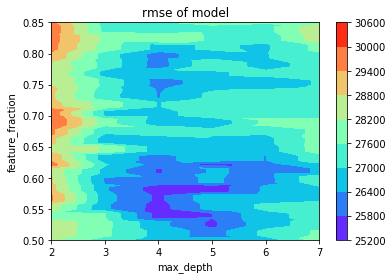

In [60]:
import matplotlib.pyplot as plt
plt.tricontourf(score_table.x,score_table.y,score_table.score,cmap='rainbow')
plt.title('rmse of model');plt.xlabel('max_depth');plt.ylabel('feature_fraction')
plt.colorbar()

# create model(xgboost)

In [ ]:
import xgboost as xgb

In [ ]:
# 7.onehot_encoding
data_x2 = train.drop('SalePrice',axis=1)
data_y = train['SalePrice']
data_x2['train_test']=0
test2 = test.copy()
test2['train_test']=1
data = pd.concat([data_x2,test2],axis=0)
data=pd.get_dummies(data,columns=onehot_list)
data_x2 = data[data['train_test']==0].drop('train_test',axis=1)
test2 = data[data['train_test']==1].drop('train_test',axis=1)
x_train2,x_test2,y_train,y_test = train_test_split(data_x2,data_y,test_size=0.2,random_state=0)
xgb_train = xgb.DMatrix(x_train2,y_train)
xgb_val = xgb.DMatrix(x_test2,y_test)

In [ ]:
fit_para ={
'num_boost_round':1000,
'verbose_eval':10,
}
para ={
'learning_rate': 0.1,
'max_depth': 8,
'min_child_weight': 0,
'subsample': 0.8,
'colsample_bytree':0.74,
'booster':'gbtree',
'objective':'reg:linear',
'nthread':-1,
}

In [ ]:
model_jmda2 = xgb.train(dtrain=xgb_train,params=para,**fit_para,evals=[(xgb_train,'train'),(xgb_val,'test')])

In [ ]:
xgb.XGBRegressor()

# submission

In [ ]:
submit = pd.read_csv(r'C:\Users\User\Downloads\kaggle\house price\sample_submission.csv')

In [ ]:
#lightbgm
pred = model_jmda.predict(test)
submit['SalePrice'] = pred
submit.to_csv(r'C:\Users\User\Downloads\kaggle\house price\sample_submission_2.csv',index=False)

In [ ]:
#xgboost
# xgb_test = xgb.DMatrix(test2)
# pred2 = model_jmda2.predict(xgb_test)
# submit['SalePrice'] = pred2
# submit.to_csv(r'C:\Users\User\Downloads\kaggle\house price\sample_submission_2.csv',index=False)

# analyzing

In [ ]:
lgb.plot_importance(model_jmda,max_num_features=20)

In [ ]:
im = pd.Series(index=data_x.columns,data=model_jmda.feature_importances_).sort_values(ascending=False)

In [ ]:
import shap
explainer = shap.TreeExplainer(model_jmda)
shap_values = explainer.shap_values(data_x)
#importance
shap.summary_plot(shap_values, data_x, plot_type="bar")
shap.summary_plot(shap_values, data_x)